In [1]:
import torch
import glob
from PIL import Image
import torchvision.transforms.functional as TF
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn

In [2]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

num_epochs = 2
num_classes = 10
batch_size = 25
learning_rate = 0.001
print_times_for_every_epoch = 100
MODEL_STORE_PATH = './Model'

In [3]:
def showImage(image):
    plt.figure()
    image = image.numpy()
    image = image.transpose(1, 2, 0)
    image = np.squeeze(image, axis=2)
    plt.imshow(image)
    plt.show()

In [4]:
def cleanData(image, labelclss):
    
    diffs = torch.zeros(0, 1, 28, 28)
    for i in range(image.shape[0]):
        im = image[i]
        diff = im - image
        diff = torch.abs(diff)
        diff = diff.mean(0)
        diff = diff.unsqueeze(0)
        #print(diff.shape)
        diffs = torch.cat((diffs, diff), 0)
        print(f'Image No. Difference {i} is processed')
        
    stnDev = diffs.std(0)
    newDataSet = torch.zeros(0, 1, 28, 28)

    ##print(stnDev.shape)
    #print(Xtr[0].shape)

    stnDev = stnDev.mean(0).mean(0).mean(0)

    for i in range(image.shape[0]):
        if ((diffs[i].mean(0).mean(0).mean(0)<stnDev.mean(0).mean(0).mean(0)*(1.5)) 
            and (diffs[i].mean(0).mean(0).mean(0)>stnDev.mean(0).mean(0).mean(0)*(-1.5))):
            newDataSet = torch.cat((newDataSet, image[i].unsqueeze(0)), 0)
            print(f'Image No. {i} is processed')
    
    newlabels = []
    for i in range(newDataSet.shape[0]):
        newlabels.append(labelclss[i])
    
    return newDataSet, newlabels
    

In [5]:
def reClassify(imag, lblclss):
    knn = KNeighborsClassifier(n_neighbors=10, metric='euclidean')
    #for i in range(imag.shape[0]):
    nsamples, nchannels, nx, ny = imag.numpy().shape
    d2_imag = imag.numpy().reshape((nsamples*nchannels,nx*ny))
    
    knn.fit(d2_imag, lblclss)
    
    #y_pred = []
    #for i in range(imag.shape[0]):
        #y_pred.append = knn.predict(imag[i].numpy())
    
    
    y_pred = knn.predict(d2_imag)
    y_pred.tolist()
    l2 = [int(v) for v in y_pred]
    
    
    imag = torch.cat((imag, imag), 0)
    l2.extend(lblclss)
        
    return imag, l2

In [6]:
def readData(train=True, mix=False, cData=False):
    
    if (train):
        typ="training"
    else:
        typ="testing"
        
    if (mix):
        fold="mnist_png_mixtrain50"
    else:
        fold="mnist_png"
        
    
    images = torch.zeros(0, 1, 28, 28)
    label = []
    
    
    for i in range(10):
        count = 0
        #image and labelclss hold images and labels of one class
        image = torch.zeros(0, 1, 28, 28)
        labelclss = []
        for file in glob.glob(f'./{fold}/{typ}/{i}/*'):
            img = Image.open(file)
            img = TF.to_tensor(img)  
            img.unsqueeze_(0)
            
            image = torch.cat((image, img), 0)
            labelclss.append(i)
            count = count + 1
            print(f'Image No. {count} of class {i} is read')
                
            #if (count>300):
                #break
                
        if (cData and train):
            imag, lblclss = cleanData(image, labelclss)
            
            #imag, lblclss = reClassify(image, labelclss)
            #imag, lblclss = cleanData(imag, lblclss)            
            
            #images holds the whole dataset
            images = torch.cat((images, imag), 0) 
            label.extend(lblclss)
                
        if (not cData) or (not train):
            #images holds the whole dataset
            images = torch.cat((images, image), 0)
            label.extend(labelclss)
        #print(images.shape)
        #print(len(label))
    if (cData and train):    
        images, label = reClassify(images, label)
    

    ##print(label[5])
    #showImage(images[5])

        
    return images, label

In [7]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

class ConvNet(nn.Module):
    def __init__(self):
        super(ConvNet, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.drop_out = nn.Dropout()
        self.fc1 = nn.Linear(7 * 7 * 64, 1000)
        self.fc2 = nn.Linear(1000, 10)
        self.fc3 = nn.Linear(10, 1000)
        self.fc4 = nn.Linear(1000, 10)
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        out = self.drop_out(out)
        out = self.fc1(out)
        out = self.fc2(out)
        out = self.fc3(out)
        out = self.fc4(out)
        return out

In [8]:
Xtr, Ytr = readData()
Xts, Yts = readData(train=False)

Image No. 1 of class 0 is read
Image No. 2 of class 0 is read
Image No. 3 of class 0 is read
Image No. 4 of class 0 is read
Image No. 5 of class 0 is read
Image No. 6 of class 0 is read
Image No. 7 of class 0 is read
Image No. 8 of class 0 is read
Image No. 9 of class 0 is read
Image No. 10 of class 0 is read
Image No. 11 of class 0 is read
Image No. 12 of class 0 is read
Image No. 13 of class 0 is read
Image No. 14 of class 0 is read
Image No. 15 of class 0 is read
Image No. 16 of class 0 is read
Image No. 17 of class 0 is read
Image No. 18 of class 0 is read
Image No. 19 of class 0 is read
Image No. 20 of class 0 is read
Image No. 21 of class 0 is read
Image No. 22 of class 0 is read
Image No. 23 of class 0 is read
Image No. 24 of class 0 is read
Image No. 25 of class 0 is read
Image No. 26 of class 0 is read
Image No. 27 of class 0 is read
Image No. 28 of class 0 is read
Image No. 29 of class 0 is read
Image No. 30 of class 0 is read
Image No. 31 of class 0 is read
Image No. 32 of c

Image No. 345 of class 0 is read
Image No. 346 of class 0 is read
Image No. 347 of class 0 is read
Image No. 348 of class 0 is read
Image No. 349 of class 0 is read
Image No. 350 of class 0 is read
Image No. 351 of class 0 is read
Image No. 352 of class 0 is read
Image No. 353 of class 0 is read
Image No. 354 of class 0 is read
Image No. 355 of class 0 is read
Image No. 356 of class 0 is read
Image No. 357 of class 0 is read
Image No. 358 of class 0 is read
Image No. 359 of class 0 is read
Image No. 360 of class 0 is read
Image No. 361 of class 0 is read
Image No. 362 of class 0 is read
Image No. 363 of class 0 is read
Image No. 364 of class 0 is read
Image No. 365 of class 0 is read
Image No. 366 of class 0 is read
Image No. 367 of class 0 is read
Image No. 368 of class 0 is read
Image No. 369 of class 0 is read
Image No. 370 of class 0 is read
Image No. 371 of class 0 is read
Image No. 372 of class 0 is read
Image No. 373 of class 0 is read
Image No. 374 of class 0 is read
Image No. 

Image No. 746 of class 0 is read
Image No. 747 of class 0 is read
Image No. 748 of class 0 is read
Image No. 749 of class 0 is read
Image No. 750 of class 0 is read
Image No. 751 of class 0 is read
Image No. 752 of class 0 is read
Image No. 753 of class 0 is read
Image No. 754 of class 0 is read
Image No. 755 of class 0 is read
Image No. 756 of class 0 is read
Image No. 757 of class 0 is read
Image No. 758 of class 0 is read
Image No. 759 of class 0 is read
Image No. 760 of class 0 is read
Image No. 761 of class 0 is read
Image No. 762 of class 0 is read
Image No. 763 of class 0 is read
Image No. 764 of class 0 is read
Image No. 765 of class 0 is read
Image No. 766 of class 0 is read
Image No. 767 of class 0 is read
Image No. 768 of class 0 is read
Image No. 769 of class 0 is read
Image No. 770 of class 0 is read
Image No. 771 of class 0 is read
Image No. 772 of class 0 is read
Image No. 773 of class 0 is read
Image No. 774 of class 0 is read
Image No. 775 of class 0 is read
Image No. 

Image No. 1068 of class 0 is read
Image No. 1069 of class 0 is read
Image No. 1070 of class 0 is read
Image No. 1071 of class 0 is read
Image No. 1072 of class 0 is read
Image No. 1073 of class 0 is read
Image No. 1074 of class 0 is read
Image No. 1075 of class 0 is read
Image No. 1076 of class 0 is read
Image No. 1077 of class 0 is read
Image No. 1078 of class 0 is read
Image No. 1079 of class 0 is read
Image No. 1080 of class 0 is read
Image No. 1081 of class 0 is read
Image No. 1082 of class 0 is read
Image No. 1083 of class 0 is read
Image No. 1084 of class 0 is read
Image No. 1085 of class 0 is read
Image No. 1086 of class 0 is read
Image No. 1087 of class 0 is read
Image No. 1088 of class 0 is read
Image No. 1089 of class 0 is read
Image No. 1090 of class 0 is read
Image No. 1091 of class 0 is read
Image No. 1092 of class 0 is read
Image No. 1093 of class 0 is read
Image No. 1094 of class 0 is read
Image No. 1095 of class 0 is read
Image No. 1096 of class 0 is read
Image No. 1097

Image No. 1333 of class 0 is read
Image No. 1334 of class 0 is read
Image No. 1335 of class 0 is read
Image No. 1336 of class 0 is read
Image No. 1337 of class 0 is read
Image No. 1338 of class 0 is read
Image No. 1339 of class 0 is read
Image No. 1340 of class 0 is read
Image No. 1341 of class 0 is read
Image No. 1342 of class 0 is read
Image No. 1343 of class 0 is read
Image No. 1344 of class 0 is read
Image No. 1345 of class 0 is read
Image No. 1346 of class 0 is read
Image No. 1347 of class 0 is read
Image No. 1348 of class 0 is read
Image No. 1349 of class 0 is read
Image No. 1350 of class 0 is read
Image No. 1351 of class 0 is read
Image No. 1352 of class 0 is read
Image No. 1353 of class 0 is read
Image No. 1354 of class 0 is read
Image No. 1355 of class 0 is read
Image No. 1356 of class 0 is read
Image No. 1357 of class 0 is read
Image No. 1358 of class 0 is read
Image No. 1359 of class 0 is read
Image No. 1360 of class 0 is read
Image No. 1361 of class 0 is read
Image No. 1362

Image No. 1664 of class 0 is read
Image No. 1665 of class 0 is read
Image No. 1666 of class 0 is read
Image No. 1667 of class 0 is read
Image No. 1668 of class 0 is read
Image No. 1669 of class 0 is read
Image No. 1670 of class 0 is read
Image No. 1671 of class 0 is read
Image No. 1672 of class 0 is read
Image No. 1673 of class 0 is read
Image No. 1674 of class 0 is read
Image No. 1675 of class 0 is read
Image No. 1676 of class 0 is read
Image No. 1677 of class 0 is read
Image No. 1678 of class 0 is read
Image No. 1679 of class 0 is read
Image No. 1680 of class 0 is read
Image No. 1681 of class 0 is read
Image No. 1682 of class 0 is read
Image No. 1683 of class 0 is read
Image No. 1684 of class 0 is read
Image No. 1685 of class 0 is read
Image No. 1686 of class 0 is read
Image No. 1687 of class 0 is read
Image No. 1688 of class 0 is read
Image No. 1689 of class 0 is read
Image No. 1690 of class 0 is read
Image No. 1691 of class 0 is read
Image No. 1692 of class 0 is read
Image No. 1693

Image No. 1925 of class 0 is read
Image No. 1926 of class 0 is read
Image No. 1927 of class 0 is read
Image No. 1928 of class 0 is read
Image No. 1929 of class 0 is read
Image No. 1930 of class 0 is read
Image No. 1931 of class 0 is read
Image No. 1932 of class 0 is read
Image No. 1933 of class 0 is read
Image No. 1934 of class 0 is read
Image No. 1935 of class 0 is read
Image No. 1936 of class 0 is read
Image No. 1937 of class 0 is read
Image No. 1938 of class 0 is read
Image No. 1939 of class 0 is read
Image No. 1940 of class 0 is read
Image No. 1941 of class 0 is read
Image No. 1942 of class 0 is read
Image No. 1943 of class 0 is read
Image No. 1944 of class 0 is read
Image No. 1945 of class 0 is read
Image No. 1946 of class 0 is read
Image No. 1947 of class 0 is read
Image No. 1948 of class 0 is read
Image No. 1949 of class 0 is read
Image No. 1950 of class 0 is read
Image No. 1951 of class 0 is read
Image No. 1952 of class 0 is read
Image No. 1953 of class 0 is read
Image No. 1954

Image No. 2240 of class 0 is read
Image No. 2241 of class 0 is read
Image No. 2242 of class 0 is read
Image No. 2243 of class 0 is read
Image No. 2244 of class 0 is read
Image No. 2245 of class 0 is read
Image No. 2246 of class 0 is read
Image No. 2247 of class 0 is read
Image No. 2248 of class 0 is read
Image No. 2249 of class 0 is read
Image No. 2250 of class 0 is read
Image No. 2251 of class 0 is read
Image No. 2252 of class 0 is read
Image No. 2253 of class 0 is read
Image No. 2254 of class 0 is read
Image No. 2255 of class 0 is read
Image No. 2256 of class 0 is read
Image No. 2257 of class 0 is read
Image No. 2258 of class 0 is read
Image No. 2259 of class 0 is read
Image No. 2260 of class 0 is read
Image No. 2261 of class 0 is read
Image No. 2262 of class 0 is read
Image No. 2263 of class 0 is read
Image No. 2264 of class 0 is read
Image No. 2265 of class 0 is read
Image No. 2266 of class 0 is read
Image No. 2267 of class 0 is read
Image No. 2268 of class 0 is read
Image No. 2269

Image No. 2517 of class 0 is read
Image No. 2518 of class 0 is read
Image No. 2519 of class 0 is read
Image No. 2520 of class 0 is read
Image No. 2521 of class 0 is read
Image No. 2522 of class 0 is read
Image No. 2523 of class 0 is read
Image No. 2524 of class 0 is read
Image No. 2525 of class 0 is read
Image No. 2526 of class 0 is read
Image No. 2527 of class 0 is read
Image No. 2528 of class 0 is read
Image No. 2529 of class 0 is read
Image No. 2530 of class 0 is read
Image No. 2531 of class 0 is read
Image No. 2532 of class 0 is read
Image No. 2533 of class 0 is read
Image No. 2534 of class 0 is read
Image No. 2535 of class 0 is read
Image No. 2536 of class 0 is read
Image No. 2537 of class 0 is read
Image No. 2538 of class 0 is read
Image No. 2539 of class 0 is read
Image No. 2540 of class 0 is read
Image No. 2541 of class 0 is read
Image No. 2542 of class 0 is read
Image No. 2543 of class 0 is read
Image No. 2544 of class 0 is read
Image No. 2545 of class 0 is read
Image No. 2546

Image No. 2760 of class 0 is read
Image No. 2761 of class 0 is read
Image No. 2762 of class 0 is read
Image No. 2763 of class 0 is read
Image No. 2764 of class 0 is read
Image No. 2765 of class 0 is read
Image No. 2766 of class 0 is read
Image No. 2767 of class 0 is read
Image No. 2768 of class 0 is read
Image No. 2769 of class 0 is read
Image No. 2770 of class 0 is read
Image No. 2771 of class 0 is read
Image No. 2772 of class 0 is read
Image No. 2773 of class 0 is read
Image No. 2774 of class 0 is read
Image No. 2775 of class 0 is read
Image No. 2776 of class 0 is read
Image No. 2777 of class 0 is read
Image No. 2778 of class 0 is read
Image No. 2779 of class 0 is read
Image No. 2780 of class 0 is read
Image No. 2781 of class 0 is read
Image No. 2782 of class 0 is read
Image No. 2783 of class 0 is read
Image No. 2784 of class 0 is read
Image No. 2785 of class 0 is read
Image No. 2786 of class 0 is read
Image No. 2787 of class 0 is read
Image No. 2788 of class 0 is read
Image No. 2789

Image No. 3046 of class 0 is read
Image No. 3047 of class 0 is read
Image No. 3048 of class 0 is read
Image No. 3049 of class 0 is read
Image No. 3050 of class 0 is read
Image No. 3051 of class 0 is read
Image No. 3052 of class 0 is read
Image No. 3053 of class 0 is read
Image No. 3054 of class 0 is read
Image No. 3055 of class 0 is read
Image No. 3056 of class 0 is read
Image No. 3057 of class 0 is read
Image No. 3058 of class 0 is read
Image No. 3059 of class 0 is read
Image No. 3060 of class 0 is read
Image No. 3061 of class 0 is read
Image No. 3062 of class 0 is read
Image No. 3063 of class 0 is read
Image No. 3064 of class 0 is read
Image No. 3065 of class 0 is read
Image No. 3066 of class 0 is read
Image No. 3067 of class 0 is read
Image No. 3068 of class 0 is read
Image No. 3069 of class 0 is read
Image No. 3070 of class 0 is read
Image No. 3071 of class 0 is read
Image No. 3072 of class 0 is read
Image No. 3073 of class 0 is read
Image No. 3074 of class 0 is read
Image No. 3075

Image No. 3307 of class 0 is read
Image No. 3308 of class 0 is read
Image No. 3309 of class 0 is read
Image No. 3310 of class 0 is read
Image No. 3311 of class 0 is read
Image No. 3312 of class 0 is read
Image No. 3313 of class 0 is read
Image No. 3314 of class 0 is read
Image No. 3315 of class 0 is read
Image No. 3316 of class 0 is read
Image No. 3317 of class 0 is read
Image No. 3318 of class 0 is read
Image No. 3319 of class 0 is read
Image No. 3320 of class 0 is read
Image No. 3321 of class 0 is read
Image No. 3322 of class 0 is read
Image No. 3323 of class 0 is read
Image No. 3324 of class 0 is read
Image No. 3325 of class 0 is read
Image No. 3326 of class 0 is read
Image No. 3327 of class 0 is read
Image No. 3328 of class 0 is read
Image No. 3329 of class 0 is read
Image No. 3330 of class 0 is read
Image No. 3331 of class 0 is read
Image No. 3332 of class 0 is read
Image No. 3333 of class 0 is read
Image No. 3334 of class 0 is read
Image No. 3335 of class 0 is read
Image No. 3336

Image No. 3557 of class 0 is read
Image No. 3558 of class 0 is read
Image No. 3559 of class 0 is read
Image No. 3560 of class 0 is read
Image No. 3561 of class 0 is read
Image No. 3562 of class 0 is read
Image No. 3563 of class 0 is read
Image No. 3564 of class 0 is read
Image No. 3565 of class 0 is read
Image No. 3566 of class 0 is read
Image No. 3567 of class 0 is read
Image No. 3568 of class 0 is read
Image No. 3569 of class 0 is read
Image No. 3570 of class 0 is read
Image No. 3571 of class 0 is read
Image No. 3572 of class 0 is read
Image No. 3573 of class 0 is read
Image No. 3574 of class 0 is read
Image No. 3575 of class 0 is read
Image No. 3576 of class 0 is read
Image No. 3577 of class 0 is read
Image No. 3578 of class 0 is read
Image No. 3579 of class 0 is read
Image No. 3580 of class 0 is read
Image No. 3581 of class 0 is read
Image No. 3582 of class 0 is read
Image No. 3583 of class 0 is read
Image No. 3584 of class 0 is read
Image No. 3585 of class 0 is read
Image No. 3586

Image No. 3829 of class 0 is read
Image No. 3830 of class 0 is read
Image No. 3831 of class 0 is read
Image No. 3832 of class 0 is read
Image No. 3833 of class 0 is read
Image No. 3834 of class 0 is read
Image No. 3835 of class 0 is read
Image No. 3836 of class 0 is read
Image No. 3837 of class 0 is read
Image No. 3838 of class 0 is read
Image No. 3839 of class 0 is read
Image No. 3840 of class 0 is read
Image No. 3841 of class 0 is read
Image No. 3842 of class 0 is read
Image No. 3843 of class 0 is read
Image No. 3844 of class 0 is read
Image No. 3845 of class 0 is read
Image No. 3846 of class 0 is read
Image No. 3847 of class 0 is read
Image No. 3848 of class 0 is read
Image No. 3849 of class 0 is read
Image No. 3850 of class 0 is read
Image No. 3851 of class 0 is read
Image No. 3852 of class 0 is read
Image No. 3853 of class 0 is read
Image No. 3854 of class 0 is read
Image No. 3855 of class 0 is read
Image No. 3856 of class 0 is read
Image No. 3857 of class 0 is read
Image No. 3858

Image No. 4100 of class 0 is read
Image No. 4101 of class 0 is read
Image No. 4102 of class 0 is read
Image No. 4103 of class 0 is read
Image No. 4104 of class 0 is read
Image No. 4105 of class 0 is read
Image No. 4106 of class 0 is read
Image No. 4107 of class 0 is read
Image No. 4108 of class 0 is read
Image No. 4109 of class 0 is read
Image No. 4110 of class 0 is read
Image No. 4111 of class 0 is read
Image No. 4112 of class 0 is read
Image No. 4113 of class 0 is read
Image No. 4114 of class 0 is read
Image No. 4115 of class 0 is read
Image No. 4116 of class 0 is read
Image No. 4117 of class 0 is read
Image No. 4118 of class 0 is read
Image No. 4119 of class 0 is read
Image No. 4120 of class 0 is read
Image No. 4121 of class 0 is read
Image No. 4122 of class 0 is read
Image No. 4123 of class 0 is read
Image No. 4124 of class 0 is read
Image No. 4125 of class 0 is read
Image No. 4126 of class 0 is read
Image No. 4127 of class 0 is read
Image No. 4128 of class 0 is read
Image No. 4129

Image No. 4348 of class 0 is read
Image No. 4349 of class 0 is read
Image No. 4350 of class 0 is read
Image No. 4351 of class 0 is read
Image No. 4352 of class 0 is read
Image No. 4353 of class 0 is read
Image No. 4354 of class 0 is read
Image No. 4355 of class 0 is read
Image No. 4356 of class 0 is read
Image No. 4357 of class 0 is read
Image No. 4358 of class 0 is read
Image No. 4359 of class 0 is read
Image No. 4360 of class 0 is read
Image No. 4361 of class 0 is read
Image No. 4362 of class 0 is read
Image No. 4363 of class 0 is read
Image No. 4364 of class 0 is read
Image No. 4365 of class 0 is read
Image No. 4366 of class 0 is read
Image No. 4367 of class 0 is read
Image No. 4368 of class 0 is read
Image No. 4369 of class 0 is read
Image No. 4370 of class 0 is read
Image No. 4371 of class 0 is read
Image No. 4372 of class 0 is read
Image No. 4373 of class 0 is read
Image No. 4374 of class 0 is read
Image No. 4375 of class 0 is read
Image No. 4376 of class 0 is read
Image No. 4377

Image No. 4624 of class 0 is read
Image No. 4625 of class 0 is read
Image No. 4626 of class 0 is read
Image No. 4627 of class 0 is read
Image No. 4628 of class 0 is read
Image No. 4629 of class 0 is read
Image No. 4630 of class 0 is read
Image No. 4631 of class 0 is read
Image No. 4632 of class 0 is read
Image No. 4633 of class 0 is read
Image No. 4634 of class 0 is read
Image No. 4635 of class 0 is read
Image No. 4636 of class 0 is read
Image No. 4637 of class 0 is read
Image No. 4638 of class 0 is read
Image No. 4639 of class 0 is read
Image No. 4640 of class 0 is read
Image No. 4641 of class 0 is read
Image No. 4642 of class 0 is read
Image No. 4643 of class 0 is read
Image No. 4644 of class 0 is read
Image No. 4645 of class 0 is read
Image No. 4646 of class 0 is read
Image No. 4647 of class 0 is read
Image No. 4648 of class 0 is read
Image No. 4649 of class 0 is read
Image No. 4650 of class 0 is read
Image No. 4651 of class 0 is read
Image No. 4652 of class 0 is read
Image No. 4653

Image No. 4887 of class 0 is read
Image No. 4888 of class 0 is read
Image No. 4889 of class 0 is read
Image No. 4890 of class 0 is read
Image No. 4891 of class 0 is read
Image No. 4892 of class 0 is read
Image No. 4893 of class 0 is read
Image No. 4894 of class 0 is read
Image No. 4895 of class 0 is read
Image No. 4896 of class 0 is read
Image No. 4897 of class 0 is read
Image No. 4898 of class 0 is read
Image No. 4899 of class 0 is read
Image No. 4900 of class 0 is read
Image No. 4901 of class 0 is read
Image No. 4902 of class 0 is read
Image No. 4903 of class 0 is read
Image No. 4904 of class 0 is read
Image No. 4905 of class 0 is read
Image No. 4906 of class 0 is read
Image No. 4907 of class 0 is read
Image No. 4908 of class 0 is read
Image No. 4909 of class 0 is read
Image No. 4910 of class 0 is read
Image No. 4911 of class 0 is read
Image No. 4912 of class 0 is read
Image No. 4913 of class 0 is read
Image No. 4914 of class 0 is read
Image No. 4915 of class 0 is read
Image No. 4916

Image No. 5139 of class 0 is read
Image No. 5140 of class 0 is read
Image No. 5141 of class 0 is read
Image No. 5142 of class 0 is read
Image No. 5143 of class 0 is read
Image No. 5144 of class 0 is read
Image No. 5145 of class 0 is read
Image No. 5146 of class 0 is read
Image No. 5147 of class 0 is read
Image No. 5148 of class 0 is read
Image No. 5149 of class 0 is read
Image No. 5150 of class 0 is read
Image No. 5151 of class 0 is read
Image No. 5152 of class 0 is read
Image No. 5153 of class 0 is read
Image No. 5154 of class 0 is read
Image No. 5155 of class 0 is read
Image No. 5156 of class 0 is read
Image No. 5157 of class 0 is read
Image No. 5158 of class 0 is read
Image No. 5159 of class 0 is read
Image No. 5160 of class 0 is read
Image No. 5161 of class 0 is read
Image No. 5162 of class 0 is read
Image No. 5163 of class 0 is read
Image No. 5164 of class 0 is read
Image No. 5165 of class 0 is read
Image No. 5166 of class 0 is read
Image No. 5167 of class 0 is read
Image No. 5168

Image No. 5382 of class 0 is read
Image No. 5383 of class 0 is read
Image No. 5384 of class 0 is read
Image No. 5385 of class 0 is read
Image No. 5386 of class 0 is read
Image No. 5387 of class 0 is read
Image No. 5388 of class 0 is read
Image No. 5389 of class 0 is read
Image No. 5390 of class 0 is read
Image No. 5391 of class 0 is read
Image No. 5392 of class 0 is read
Image No. 5393 of class 0 is read
Image No. 5394 of class 0 is read
Image No. 5395 of class 0 is read
Image No. 5396 of class 0 is read
Image No. 5397 of class 0 is read
Image No. 5398 of class 0 is read
Image No. 5399 of class 0 is read
Image No. 5400 of class 0 is read
Image No. 5401 of class 0 is read
Image No. 5402 of class 0 is read
Image No. 5403 of class 0 is read
Image No. 5404 of class 0 is read
Image No. 5405 of class 0 is read
Image No. 5406 of class 0 is read
Image No. 5407 of class 0 is read
Image No. 5408 of class 0 is read
Image No. 5409 of class 0 is read
Image No. 5410 of class 0 is read
Image No. 5411

Image No. 5650 of class 0 is read
Image No. 5651 of class 0 is read
Image No. 5652 of class 0 is read
Image No. 5653 of class 0 is read
Image No. 5654 of class 0 is read
Image No. 5655 of class 0 is read
Image No. 5656 of class 0 is read
Image No. 5657 of class 0 is read
Image No. 5658 of class 0 is read
Image No. 5659 of class 0 is read
Image No. 5660 of class 0 is read
Image No. 5661 of class 0 is read
Image No. 5662 of class 0 is read
Image No. 5663 of class 0 is read
Image No. 5664 of class 0 is read
Image No. 5665 of class 0 is read
Image No. 5666 of class 0 is read
Image No. 5667 of class 0 is read
Image No. 5668 of class 0 is read
Image No. 5669 of class 0 is read
Image No. 5670 of class 0 is read
Image No. 5671 of class 0 is read
Image No. 5672 of class 0 is read
Image No. 5673 of class 0 is read
Image No. 5674 of class 0 is read
Image No. 5675 of class 0 is read
Image No. 5676 of class 0 is read
Image No. 5677 of class 0 is read
Image No. 5678 of class 0 is read
Image No. 5679

Image No. 5904 of class 0 is read
Image No. 5905 of class 0 is read
Image No. 5906 of class 0 is read
Image No. 5907 of class 0 is read
Image No. 5908 of class 0 is read
Image No. 5909 of class 0 is read
Image No. 5910 of class 0 is read
Image No. 5911 of class 0 is read
Image No. 5912 of class 0 is read
Image No. 5913 of class 0 is read
Image No. 5914 of class 0 is read
Image No. 5915 of class 0 is read
Image No. 5916 of class 0 is read
Image No. 5917 of class 0 is read
Image No. 5918 of class 0 is read
Image No. 5919 of class 0 is read
Image No. 5920 of class 0 is read
Image No. 5921 of class 0 is read
Image No. 5922 of class 0 is read
Image No. 5923 of class 0 is read
Image No. 1 of class 1 is read
Image No. 2 of class 1 is read
Image No. 3 of class 1 is read
Image No. 4 of class 1 is read
Image No. 5 of class 1 is read
Image No. 6 of class 1 is read
Image No. 7 of class 1 is read
Image No. 8 of class 1 is read
Image No. 9 of class 1 is read
Image No. 10 of class 1 is read
Image No.

Image No. 307 of class 1 is read
Image No. 308 of class 1 is read
Image No. 309 of class 1 is read
Image No. 310 of class 1 is read
Image No. 311 of class 1 is read
Image No. 312 of class 1 is read
Image No. 313 of class 1 is read
Image No. 314 of class 1 is read
Image No. 315 of class 1 is read
Image No. 316 of class 1 is read
Image No. 317 of class 1 is read
Image No. 318 of class 1 is read
Image No. 319 of class 1 is read
Image No. 320 of class 1 is read
Image No. 321 of class 1 is read
Image No. 322 of class 1 is read
Image No. 323 of class 1 is read
Image No. 324 of class 1 is read
Image No. 325 of class 1 is read
Image No. 326 of class 1 is read
Image No. 327 of class 1 is read
Image No. 328 of class 1 is read
Image No. 329 of class 1 is read
Image No. 330 of class 1 is read
Image No. 331 of class 1 is read
Image No. 332 of class 1 is read
Image No. 333 of class 1 is read
Image No. 334 of class 1 is read
Image No. 335 of class 1 is read
Image No. 336 of class 1 is read
Image No. 

Image No. 594 of class 1 is read
Image No. 595 of class 1 is read
Image No. 596 of class 1 is read
Image No. 597 of class 1 is read
Image No. 598 of class 1 is read
Image No. 599 of class 1 is read
Image No. 600 of class 1 is read
Image No. 601 of class 1 is read
Image No. 602 of class 1 is read
Image No. 603 of class 1 is read
Image No. 604 of class 1 is read
Image No. 605 of class 1 is read
Image No. 606 of class 1 is read
Image No. 607 of class 1 is read
Image No. 608 of class 1 is read
Image No. 609 of class 1 is read
Image No. 610 of class 1 is read
Image No. 611 of class 1 is read
Image No. 612 of class 1 is read
Image No. 613 of class 1 is read
Image No. 614 of class 1 is read
Image No. 615 of class 1 is read
Image No. 616 of class 1 is read
Image No. 617 of class 1 is read
Image No. 618 of class 1 is read
Image No. 619 of class 1 is read
Image No. 620 of class 1 is read
Image No. 621 of class 1 is read
Image No. 622 of class 1 is read
Image No. 623 of class 1 is read
Image No. 

Image No. 890 of class 1 is read
Image No. 891 of class 1 is read
Image No. 892 of class 1 is read
Image No. 893 of class 1 is read
Image No. 894 of class 1 is read
Image No. 895 of class 1 is read
Image No. 896 of class 1 is read
Image No. 897 of class 1 is read
Image No. 898 of class 1 is read
Image No. 899 of class 1 is read
Image No. 900 of class 1 is read
Image No. 901 of class 1 is read
Image No. 902 of class 1 is read
Image No. 903 of class 1 is read
Image No. 904 of class 1 is read
Image No. 905 of class 1 is read
Image No. 906 of class 1 is read
Image No. 907 of class 1 is read
Image No. 908 of class 1 is read
Image No. 909 of class 1 is read
Image No. 910 of class 1 is read
Image No. 911 of class 1 is read
Image No. 912 of class 1 is read
Image No. 913 of class 1 is read
Image No. 914 of class 1 is read
Image No. 915 of class 1 is read
Image No. 916 of class 1 is read
Image No. 917 of class 1 is read
Image No. 918 of class 1 is read
Image No. 919 of class 1 is read
Image No. 

Image No. 1162 of class 1 is read
Image No. 1163 of class 1 is read
Image No. 1164 of class 1 is read
Image No. 1165 of class 1 is read
Image No. 1166 of class 1 is read
Image No. 1167 of class 1 is read
Image No. 1168 of class 1 is read
Image No. 1169 of class 1 is read
Image No. 1170 of class 1 is read
Image No. 1171 of class 1 is read
Image No. 1172 of class 1 is read
Image No. 1173 of class 1 is read
Image No. 1174 of class 1 is read
Image No. 1175 of class 1 is read
Image No. 1176 of class 1 is read
Image No. 1177 of class 1 is read
Image No. 1178 of class 1 is read
Image No. 1179 of class 1 is read
Image No. 1180 of class 1 is read
Image No. 1181 of class 1 is read
Image No. 1182 of class 1 is read
Image No. 1183 of class 1 is read
Image No. 1184 of class 1 is read
Image No. 1185 of class 1 is read
Image No. 1186 of class 1 is read
Image No. 1187 of class 1 is read
Image No. 1188 of class 1 is read
Image No. 1189 of class 1 is read
Image No. 1190 of class 1 is read
Image No. 1191

Image No. 1404 of class 1 is read
Image No. 1405 of class 1 is read
Image No. 1406 of class 1 is read
Image No. 1407 of class 1 is read
Image No. 1408 of class 1 is read
Image No. 1409 of class 1 is read
Image No. 1410 of class 1 is read
Image No. 1411 of class 1 is read
Image No. 1412 of class 1 is read
Image No. 1413 of class 1 is read
Image No. 1414 of class 1 is read
Image No. 1415 of class 1 is read
Image No. 1416 of class 1 is read
Image No. 1417 of class 1 is read
Image No. 1418 of class 1 is read
Image No. 1419 of class 1 is read
Image No. 1420 of class 1 is read
Image No. 1421 of class 1 is read
Image No. 1422 of class 1 is read
Image No. 1423 of class 1 is read
Image No. 1424 of class 1 is read
Image No. 1425 of class 1 is read
Image No. 1426 of class 1 is read
Image No. 1427 of class 1 is read
Image No. 1428 of class 1 is read
Image No. 1429 of class 1 is read
Image No. 1430 of class 1 is read
Image No. 1431 of class 1 is read
Image No. 1432 of class 1 is read
Image No. 1433

Image No. 1832 of class 1 is read
Image No. 1833 of class 1 is read
Image No. 1834 of class 1 is read
Image No. 1835 of class 1 is read
Image No. 1836 of class 1 is read
Image No. 1837 of class 1 is read
Image No. 1838 of class 1 is read
Image No. 1839 of class 1 is read
Image No. 1840 of class 1 is read
Image No. 1841 of class 1 is read
Image No. 1842 of class 1 is read
Image No. 1843 of class 1 is read
Image No. 1844 of class 1 is read
Image No. 1845 of class 1 is read
Image No. 1846 of class 1 is read
Image No. 1847 of class 1 is read
Image No. 1848 of class 1 is read
Image No. 1849 of class 1 is read
Image No. 1850 of class 1 is read
Image No. 1851 of class 1 is read
Image No. 1852 of class 1 is read
Image No. 1853 of class 1 is read
Image No. 1854 of class 1 is read
Image No. 1855 of class 1 is read
Image No. 1856 of class 1 is read
Image No. 1857 of class 1 is read
Image No. 1858 of class 1 is read
Image No. 1859 of class 1 is read
Image No. 1860 of class 1 is read
Image No. 1861

Image No. 2173 of class 1 is read
Image No. 2174 of class 1 is read
Image No. 2175 of class 1 is read
Image No. 2176 of class 1 is read
Image No. 2177 of class 1 is read
Image No. 2178 of class 1 is read
Image No. 2179 of class 1 is read
Image No. 2180 of class 1 is read
Image No. 2181 of class 1 is read
Image No. 2182 of class 1 is read
Image No. 2183 of class 1 is read
Image No. 2184 of class 1 is read
Image No. 2185 of class 1 is read
Image No. 2186 of class 1 is read
Image No. 2187 of class 1 is read
Image No. 2188 of class 1 is read
Image No. 2189 of class 1 is read
Image No. 2190 of class 1 is read
Image No. 2191 of class 1 is read
Image No. 2192 of class 1 is read
Image No. 2193 of class 1 is read
Image No. 2194 of class 1 is read
Image No. 2195 of class 1 is read
Image No. 2196 of class 1 is read
Image No. 2197 of class 1 is read
Image No. 2198 of class 1 is read
Image No. 2199 of class 1 is read
Image No. 2200 of class 1 is read
Image No. 2201 of class 1 is read
Image No. 2202

Image No. 2477 of class 1 is read
Image No. 2478 of class 1 is read
Image No. 2479 of class 1 is read
Image No. 2480 of class 1 is read
Image No. 2481 of class 1 is read
Image No. 2482 of class 1 is read
Image No. 2483 of class 1 is read
Image No. 2484 of class 1 is read
Image No. 2485 of class 1 is read
Image No. 2486 of class 1 is read
Image No. 2487 of class 1 is read
Image No. 2488 of class 1 is read
Image No. 2489 of class 1 is read
Image No. 2490 of class 1 is read
Image No. 2491 of class 1 is read
Image No. 2492 of class 1 is read
Image No. 2493 of class 1 is read
Image No. 2494 of class 1 is read
Image No. 2495 of class 1 is read
Image No. 2496 of class 1 is read
Image No. 2497 of class 1 is read
Image No. 2498 of class 1 is read
Image No. 2499 of class 1 is read
Image No. 2500 of class 1 is read
Image No. 2501 of class 1 is read
Image No. 2502 of class 1 is read
Image No. 2503 of class 1 is read
Image No. 2504 of class 1 is read
Image No. 2505 of class 1 is read
Image No. 2506

Image No. 2754 of class 1 is read
Image No. 2755 of class 1 is read
Image No. 2756 of class 1 is read
Image No. 2757 of class 1 is read
Image No. 2758 of class 1 is read
Image No. 2759 of class 1 is read
Image No. 2760 of class 1 is read
Image No. 2761 of class 1 is read
Image No. 2762 of class 1 is read
Image No. 2763 of class 1 is read
Image No. 2764 of class 1 is read
Image No. 2765 of class 1 is read
Image No. 2766 of class 1 is read
Image No. 2767 of class 1 is read
Image No. 2768 of class 1 is read
Image No. 2769 of class 1 is read
Image No. 2770 of class 1 is read
Image No. 2771 of class 1 is read
Image No. 2772 of class 1 is read
Image No. 2773 of class 1 is read
Image No. 2774 of class 1 is read
Image No. 2775 of class 1 is read
Image No. 2776 of class 1 is read
Image No. 2777 of class 1 is read
Image No. 2778 of class 1 is read
Image No. 2779 of class 1 is read
Image No. 2780 of class 1 is read
Image No. 2781 of class 1 is read
Image No. 2782 of class 1 is read
Image No. 2783

Image No. 3006 of class 1 is read
Image No. 3007 of class 1 is read
Image No. 3008 of class 1 is read
Image No. 3009 of class 1 is read
Image No. 3010 of class 1 is read
Image No. 3011 of class 1 is read
Image No. 3012 of class 1 is read
Image No. 3013 of class 1 is read
Image No. 3014 of class 1 is read
Image No. 3015 of class 1 is read
Image No. 3016 of class 1 is read
Image No. 3017 of class 1 is read
Image No. 3018 of class 1 is read
Image No. 3019 of class 1 is read
Image No. 3020 of class 1 is read
Image No. 3021 of class 1 is read
Image No. 3022 of class 1 is read
Image No. 3023 of class 1 is read
Image No. 3024 of class 1 is read
Image No. 3025 of class 1 is read
Image No. 3026 of class 1 is read
Image No. 3027 of class 1 is read
Image No. 3028 of class 1 is read
Image No. 3029 of class 1 is read
Image No. 3030 of class 1 is read
Image No. 3031 of class 1 is read
Image No. 3032 of class 1 is read
Image No. 3033 of class 1 is read
Image No. 3034 of class 1 is read
Image No. 3035

Image No. 3328 of class 1 is read
Image No. 3329 of class 1 is read
Image No. 3330 of class 1 is read
Image No. 3331 of class 1 is read
Image No. 3332 of class 1 is read
Image No. 3333 of class 1 is read
Image No. 3334 of class 1 is read
Image No. 3335 of class 1 is read
Image No. 3336 of class 1 is read
Image No. 3337 of class 1 is read
Image No. 3338 of class 1 is read
Image No. 3339 of class 1 is read
Image No. 3340 of class 1 is read
Image No. 3341 of class 1 is read
Image No. 3342 of class 1 is read
Image No. 3343 of class 1 is read
Image No. 3344 of class 1 is read
Image No. 3345 of class 1 is read
Image No. 3346 of class 1 is read
Image No. 3347 of class 1 is read
Image No. 3348 of class 1 is read
Image No. 3349 of class 1 is read
Image No. 3350 of class 1 is read
Image No. 3351 of class 1 is read
Image No. 3352 of class 1 is read
Image No. 3353 of class 1 is read
Image No. 3354 of class 1 is read
Image No. 3355 of class 1 is read
Image No. 3356 of class 1 is read
Image No. 3357

Image No. 3638 of class 1 is read
Image No. 3639 of class 1 is read
Image No. 3640 of class 1 is read
Image No. 3641 of class 1 is read
Image No. 3642 of class 1 is read
Image No. 3643 of class 1 is read
Image No. 3644 of class 1 is read
Image No. 3645 of class 1 is read
Image No. 3646 of class 1 is read
Image No. 3647 of class 1 is read
Image No. 3648 of class 1 is read
Image No. 3649 of class 1 is read
Image No. 3650 of class 1 is read
Image No. 3651 of class 1 is read
Image No. 3652 of class 1 is read
Image No. 3653 of class 1 is read
Image No. 3654 of class 1 is read
Image No. 3655 of class 1 is read
Image No. 3656 of class 1 is read
Image No. 3657 of class 1 is read
Image No. 3658 of class 1 is read
Image No. 3659 of class 1 is read
Image No. 3660 of class 1 is read
Image No. 3661 of class 1 is read
Image No. 3662 of class 1 is read
Image No. 3663 of class 1 is read
Image No. 3664 of class 1 is read
Image No. 3665 of class 1 is read
Image No. 3666 of class 1 is read
Image No. 3667

Image No. 3934 of class 1 is read
Image No. 3935 of class 1 is read
Image No. 3936 of class 1 is read
Image No. 3937 of class 1 is read
Image No. 3938 of class 1 is read
Image No. 3939 of class 1 is read
Image No. 3940 of class 1 is read
Image No. 3941 of class 1 is read
Image No. 3942 of class 1 is read
Image No. 3943 of class 1 is read
Image No. 3944 of class 1 is read
Image No. 3945 of class 1 is read
Image No. 3946 of class 1 is read
Image No. 3947 of class 1 is read
Image No. 3948 of class 1 is read
Image No. 3949 of class 1 is read
Image No. 3950 of class 1 is read
Image No. 3951 of class 1 is read
Image No. 3952 of class 1 is read
Image No. 3953 of class 1 is read
Image No. 3954 of class 1 is read
Image No. 3955 of class 1 is read
Image No. 3956 of class 1 is read
Image No. 3957 of class 1 is read
Image No. 3958 of class 1 is read
Image No. 3959 of class 1 is read
Image No. 3960 of class 1 is read
Image No. 3961 of class 1 is read
Image No. 3962 of class 1 is read
Image No. 3963

Image No. 4219 of class 1 is read
Image No. 4220 of class 1 is read
Image No. 4221 of class 1 is read
Image No. 4222 of class 1 is read
Image No. 4223 of class 1 is read
Image No. 4224 of class 1 is read
Image No. 4225 of class 1 is read
Image No. 4226 of class 1 is read
Image No. 4227 of class 1 is read
Image No. 4228 of class 1 is read
Image No. 4229 of class 1 is read
Image No. 4230 of class 1 is read
Image No. 4231 of class 1 is read
Image No. 4232 of class 1 is read
Image No. 4233 of class 1 is read
Image No. 4234 of class 1 is read
Image No. 4235 of class 1 is read
Image No. 4236 of class 1 is read
Image No. 4237 of class 1 is read
Image No. 4238 of class 1 is read
Image No. 4239 of class 1 is read
Image No. 4240 of class 1 is read
Image No. 4241 of class 1 is read
Image No. 4242 of class 1 is read
Image No. 4243 of class 1 is read
Image No. 4244 of class 1 is read
Image No. 4245 of class 1 is read
Image No. 4246 of class 1 is read
Image No. 4247 of class 1 is read
Image No. 4248

Image No. 4484 of class 1 is read
Image No. 4485 of class 1 is read
Image No. 4486 of class 1 is read
Image No. 4487 of class 1 is read
Image No. 4488 of class 1 is read
Image No. 4489 of class 1 is read
Image No. 4490 of class 1 is read
Image No. 4491 of class 1 is read
Image No. 4492 of class 1 is read
Image No. 4493 of class 1 is read
Image No. 4494 of class 1 is read
Image No. 4495 of class 1 is read
Image No. 4496 of class 1 is read
Image No. 4497 of class 1 is read
Image No. 4498 of class 1 is read
Image No. 4499 of class 1 is read
Image No. 4500 of class 1 is read
Image No. 4501 of class 1 is read
Image No. 4502 of class 1 is read
Image No. 4503 of class 1 is read
Image No. 4504 of class 1 is read
Image No. 4505 of class 1 is read
Image No. 4506 of class 1 is read
Image No. 4507 of class 1 is read
Image No. 4508 of class 1 is read
Image No. 4509 of class 1 is read
Image No. 4510 of class 1 is read
Image No. 4511 of class 1 is read
Image No. 4512 of class 1 is read
Image No. 4513

Image No. 4742 of class 1 is read
Image No. 4743 of class 1 is read
Image No. 4744 of class 1 is read
Image No. 4745 of class 1 is read
Image No. 4746 of class 1 is read
Image No. 4747 of class 1 is read
Image No. 4748 of class 1 is read
Image No. 4749 of class 1 is read
Image No. 4750 of class 1 is read
Image No. 4751 of class 1 is read
Image No. 4752 of class 1 is read
Image No. 4753 of class 1 is read
Image No. 4754 of class 1 is read
Image No. 4755 of class 1 is read
Image No. 4756 of class 1 is read
Image No. 4757 of class 1 is read
Image No. 4758 of class 1 is read
Image No. 4759 of class 1 is read
Image No. 4760 of class 1 is read
Image No. 4761 of class 1 is read
Image No. 4762 of class 1 is read
Image No. 4763 of class 1 is read
Image No. 4764 of class 1 is read
Image No. 4765 of class 1 is read
Image No. 4766 of class 1 is read
Image No. 4767 of class 1 is read
Image No. 4768 of class 1 is read
Image No. 4769 of class 1 is read
Image No. 4770 of class 1 is read
Image No. 4771

Image No. 4997 of class 1 is read
Image No. 4998 of class 1 is read
Image No. 4999 of class 1 is read
Image No. 5000 of class 1 is read
Image No. 5001 of class 1 is read
Image No. 5002 of class 1 is read
Image No. 5003 of class 1 is read
Image No. 5004 of class 1 is read
Image No. 5005 of class 1 is read
Image No. 5006 of class 1 is read
Image No. 5007 of class 1 is read
Image No. 5008 of class 1 is read
Image No. 5009 of class 1 is read
Image No. 5010 of class 1 is read
Image No. 5011 of class 1 is read
Image No. 5012 of class 1 is read
Image No. 5013 of class 1 is read
Image No. 5014 of class 1 is read
Image No. 5015 of class 1 is read
Image No. 5016 of class 1 is read
Image No. 5017 of class 1 is read
Image No. 5018 of class 1 is read
Image No. 5019 of class 1 is read
Image No. 5020 of class 1 is read
Image No. 5021 of class 1 is read
Image No. 5022 of class 1 is read
Image No. 5023 of class 1 is read
Image No. 5024 of class 1 is read
Image No. 5025 of class 1 is read
Image No. 5026

Image No. 5242 of class 1 is read
Image No. 5243 of class 1 is read
Image No. 5244 of class 1 is read
Image No. 5245 of class 1 is read
Image No. 5246 of class 1 is read
Image No. 5247 of class 1 is read
Image No. 5248 of class 1 is read
Image No. 5249 of class 1 is read
Image No. 5250 of class 1 is read
Image No. 5251 of class 1 is read
Image No. 5252 of class 1 is read
Image No. 5253 of class 1 is read
Image No. 5254 of class 1 is read
Image No. 5255 of class 1 is read
Image No. 5256 of class 1 is read
Image No. 5257 of class 1 is read
Image No. 5258 of class 1 is read
Image No. 5259 of class 1 is read
Image No. 5260 of class 1 is read
Image No. 5261 of class 1 is read
Image No. 5262 of class 1 is read
Image No. 5263 of class 1 is read
Image No. 5264 of class 1 is read
Image No. 5265 of class 1 is read
Image No. 5266 of class 1 is read
Image No. 5267 of class 1 is read
Image No. 5268 of class 1 is read
Image No. 5269 of class 1 is read
Image No. 5270 of class 1 is read
Image No. 5271

Image No. 5552 of class 1 is read
Image No. 5553 of class 1 is read
Image No. 5554 of class 1 is read
Image No. 5555 of class 1 is read
Image No. 5556 of class 1 is read
Image No. 5557 of class 1 is read
Image No. 5558 of class 1 is read
Image No. 5559 of class 1 is read
Image No. 5560 of class 1 is read
Image No. 5561 of class 1 is read
Image No. 5562 of class 1 is read
Image No. 5563 of class 1 is read
Image No. 5564 of class 1 is read
Image No. 5565 of class 1 is read
Image No. 5566 of class 1 is read
Image No. 5567 of class 1 is read
Image No. 5568 of class 1 is read
Image No. 5569 of class 1 is read
Image No. 5570 of class 1 is read
Image No. 5571 of class 1 is read
Image No. 5572 of class 1 is read
Image No. 5573 of class 1 is read
Image No. 5574 of class 1 is read
Image No. 5575 of class 1 is read
Image No. 5576 of class 1 is read
Image No. 5577 of class 1 is read
Image No. 5578 of class 1 is read
Image No. 5579 of class 1 is read
Image No. 5580 of class 1 is read
Image No. 5581

Image No. 5854 of class 1 is read
Image No. 5855 of class 1 is read
Image No. 5856 of class 1 is read
Image No. 5857 of class 1 is read
Image No. 5858 of class 1 is read
Image No. 5859 of class 1 is read
Image No. 5860 of class 1 is read
Image No. 5861 of class 1 is read
Image No. 5862 of class 1 is read
Image No. 5863 of class 1 is read
Image No. 5864 of class 1 is read
Image No. 5865 of class 1 is read
Image No. 5866 of class 1 is read
Image No. 5867 of class 1 is read
Image No. 5868 of class 1 is read
Image No. 5869 of class 1 is read
Image No. 5870 of class 1 is read
Image No. 5871 of class 1 is read
Image No. 5872 of class 1 is read
Image No. 5873 of class 1 is read
Image No. 5874 of class 1 is read
Image No. 5875 of class 1 is read
Image No. 5876 of class 1 is read
Image No. 5877 of class 1 is read
Image No. 5878 of class 1 is read
Image No. 5879 of class 1 is read
Image No. 5880 of class 1 is read
Image No. 5881 of class 1 is read
Image No. 5882 of class 1 is read
Image No. 5883

Image No. 6109 of class 1 is read
Image No. 6110 of class 1 is read
Image No. 6111 of class 1 is read
Image No. 6112 of class 1 is read
Image No. 6113 of class 1 is read
Image No. 6114 of class 1 is read
Image No. 6115 of class 1 is read
Image No. 6116 of class 1 is read
Image No. 6117 of class 1 is read
Image No. 6118 of class 1 is read
Image No. 6119 of class 1 is read
Image No. 6120 of class 1 is read
Image No. 6121 of class 1 is read
Image No. 6122 of class 1 is read
Image No. 6123 of class 1 is read
Image No. 6124 of class 1 is read
Image No. 6125 of class 1 is read
Image No. 6126 of class 1 is read
Image No. 6127 of class 1 is read
Image No. 6128 of class 1 is read
Image No. 6129 of class 1 is read
Image No. 6130 of class 1 is read
Image No. 6131 of class 1 is read
Image No. 6132 of class 1 is read
Image No. 6133 of class 1 is read
Image No. 6134 of class 1 is read
Image No. 6135 of class 1 is read
Image No. 6136 of class 1 is read
Image No. 6137 of class 1 is read
Image No. 6138

Image No. 6351 of class 1 is read
Image No. 6352 of class 1 is read
Image No. 6353 of class 1 is read
Image No. 6354 of class 1 is read
Image No. 6355 of class 1 is read
Image No. 6356 of class 1 is read
Image No. 6357 of class 1 is read
Image No. 6358 of class 1 is read
Image No. 6359 of class 1 is read
Image No. 6360 of class 1 is read
Image No. 6361 of class 1 is read
Image No. 6362 of class 1 is read
Image No. 6363 of class 1 is read
Image No. 6364 of class 1 is read
Image No. 6365 of class 1 is read
Image No. 6366 of class 1 is read
Image No. 6367 of class 1 is read
Image No. 6368 of class 1 is read
Image No. 6369 of class 1 is read
Image No. 6370 of class 1 is read
Image No. 6371 of class 1 is read
Image No. 6372 of class 1 is read
Image No. 6373 of class 1 is read
Image No. 6374 of class 1 is read
Image No. 6375 of class 1 is read
Image No. 6376 of class 1 is read
Image No. 6377 of class 1 is read
Image No. 6378 of class 1 is read
Image No. 6379 of class 1 is read
Image No. 6380

Image No. 6611 of class 1 is read
Image No. 6612 of class 1 is read
Image No. 6613 of class 1 is read
Image No. 6614 of class 1 is read
Image No. 6615 of class 1 is read
Image No. 6616 of class 1 is read
Image No. 6617 of class 1 is read
Image No. 6618 of class 1 is read
Image No. 6619 of class 1 is read
Image No. 6620 of class 1 is read
Image No. 6621 of class 1 is read
Image No. 6622 of class 1 is read
Image No. 6623 of class 1 is read
Image No. 6624 of class 1 is read
Image No. 6625 of class 1 is read
Image No. 6626 of class 1 is read
Image No. 6627 of class 1 is read
Image No. 6628 of class 1 is read
Image No. 6629 of class 1 is read
Image No. 6630 of class 1 is read
Image No. 6631 of class 1 is read
Image No. 6632 of class 1 is read
Image No. 6633 of class 1 is read
Image No. 6634 of class 1 is read
Image No. 6635 of class 1 is read
Image No. 6636 of class 1 is read
Image No. 6637 of class 1 is read
Image No. 6638 of class 1 is read
Image No. 6639 of class 1 is read
Image No. 6640

Image No. 308 of class 2 is read
Image No. 309 of class 2 is read
Image No. 310 of class 2 is read
Image No. 311 of class 2 is read
Image No. 312 of class 2 is read
Image No. 313 of class 2 is read
Image No. 314 of class 2 is read
Image No. 315 of class 2 is read
Image No. 316 of class 2 is read
Image No. 317 of class 2 is read
Image No. 318 of class 2 is read
Image No. 319 of class 2 is read
Image No. 320 of class 2 is read
Image No. 321 of class 2 is read
Image No. 322 of class 2 is read
Image No. 323 of class 2 is read
Image No. 324 of class 2 is read
Image No. 325 of class 2 is read
Image No. 326 of class 2 is read
Image No. 327 of class 2 is read
Image No. 328 of class 2 is read
Image No. 329 of class 2 is read
Image No. 330 of class 2 is read
Image No. 331 of class 2 is read
Image No. 332 of class 2 is read
Image No. 333 of class 2 is read
Image No. 334 of class 2 is read
Image No. 335 of class 2 is read
Image No. 336 of class 2 is read
Image No. 337 of class 2 is read
Image No. 

Image No. 858 of class 2 is read
Image No. 859 of class 2 is read
Image No. 860 of class 2 is read
Image No. 861 of class 2 is read
Image No. 862 of class 2 is read
Image No. 863 of class 2 is read
Image No. 864 of class 2 is read
Image No. 865 of class 2 is read
Image No. 866 of class 2 is read
Image No. 867 of class 2 is read
Image No. 868 of class 2 is read
Image No. 869 of class 2 is read
Image No. 870 of class 2 is read
Image No. 871 of class 2 is read
Image No. 872 of class 2 is read
Image No. 873 of class 2 is read
Image No. 874 of class 2 is read
Image No. 875 of class 2 is read
Image No. 876 of class 2 is read
Image No. 877 of class 2 is read
Image No. 878 of class 2 is read
Image No. 879 of class 2 is read
Image No. 880 of class 2 is read
Image No. 881 of class 2 is read
Image No. 882 of class 2 is read
Image No. 883 of class 2 is read
Image No. 884 of class 2 is read
Image No. 885 of class 2 is read
Image No. 886 of class 2 is read
Image No. 887 of class 2 is read
Image No. 

Image No. 1143 of class 2 is read
Image No. 1144 of class 2 is read
Image No. 1145 of class 2 is read
Image No. 1146 of class 2 is read
Image No. 1147 of class 2 is read
Image No. 1148 of class 2 is read
Image No. 1149 of class 2 is read
Image No. 1150 of class 2 is read
Image No. 1151 of class 2 is read
Image No. 1152 of class 2 is read
Image No. 1153 of class 2 is read
Image No. 1154 of class 2 is read
Image No. 1155 of class 2 is read
Image No. 1156 of class 2 is read
Image No. 1157 of class 2 is read
Image No. 1158 of class 2 is read
Image No. 1159 of class 2 is read
Image No. 1160 of class 2 is read
Image No. 1161 of class 2 is read
Image No. 1162 of class 2 is read
Image No. 1163 of class 2 is read
Image No. 1164 of class 2 is read
Image No. 1165 of class 2 is read
Image No. 1166 of class 2 is read
Image No. 1167 of class 2 is read
Image No. 1168 of class 2 is read
Image No. 1169 of class 2 is read
Image No. 1170 of class 2 is read
Image No. 1171 of class 2 is read
Image No. 1172

Image No. 1393 of class 2 is read
Image No. 1394 of class 2 is read
Image No. 1395 of class 2 is read
Image No. 1396 of class 2 is read
Image No. 1397 of class 2 is read
Image No. 1398 of class 2 is read
Image No. 1399 of class 2 is read
Image No. 1400 of class 2 is read
Image No. 1401 of class 2 is read
Image No. 1402 of class 2 is read
Image No. 1403 of class 2 is read
Image No. 1404 of class 2 is read
Image No. 1405 of class 2 is read
Image No. 1406 of class 2 is read
Image No. 1407 of class 2 is read
Image No. 1408 of class 2 is read
Image No. 1409 of class 2 is read
Image No. 1410 of class 2 is read
Image No. 1411 of class 2 is read
Image No. 1412 of class 2 is read
Image No. 1413 of class 2 is read
Image No. 1414 of class 2 is read
Image No. 1415 of class 2 is read
Image No. 1416 of class 2 is read
Image No. 1417 of class 2 is read
Image No. 1418 of class 2 is read
Image No. 1419 of class 2 is read
Image No. 1420 of class 2 is read
Image No. 1421 of class 2 is read
Image No. 1422

Image No. 1827 of class 2 is read
Image No. 1828 of class 2 is read
Image No. 1829 of class 2 is read
Image No. 1830 of class 2 is read
Image No. 1831 of class 2 is read
Image No. 1832 of class 2 is read
Image No. 1833 of class 2 is read
Image No. 1834 of class 2 is read
Image No. 1835 of class 2 is read
Image No. 1836 of class 2 is read
Image No. 1837 of class 2 is read
Image No. 1838 of class 2 is read
Image No. 1839 of class 2 is read
Image No. 1840 of class 2 is read
Image No. 1841 of class 2 is read
Image No. 1842 of class 2 is read
Image No. 1843 of class 2 is read
Image No. 1844 of class 2 is read
Image No. 1845 of class 2 is read
Image No. 1846 of class 2 is read
Image No. 1847 of class 2 is read
Image No. 1848 of class 2 is read
Image No. 1849 of class 2 is read
Image No. 1850 of class 2 is read
Image No. 1851 of class 2 is read
Image No. 1852 of class 2 is read
Image No. 1853 of class 2 is read
Image No. 1854 of class 2 is read
Image No. 1855 of class 2 is read
Image No. 1856

Image No. 2179 of class 2 is read
Image No. 2180 of class 2 is read
Image No. 2181 of class 2 is read
Image No. 2182 of class 2 is read
Image No. 2183 of class 2 is read
Image No. 2184 of class 2 is read
Image No. 2185 of class 2 is read
Image No. 2186 of class 2 is read
Image No. 2187 of class 2 is read
Image No. 2188 of class 2 is read
Image No. 2189 of class 2 is read
Image No. 2190 of class 2 is read
Image No. 2191 of class 2 is read
Image No. 2192 of class 2 is read
Image No. 2193 of class 2 is read
Image No. 2194 of class 2 is read
Image No. 2195 of class 2 is read
Image No. 2196 of class 2 is read
Image No. 2197 of class 2 is read
Image No. 2198 of class 2 is read
Image No. 2199 of class 2 is read
Image No. 2200 of class 2 is read
Image No. 2201 of class 2 is read
Image No. 2202 of class 2 is read
Image No. 2203 of class 2 is read
Image No. 2204 of class 2 is read
Image No. 2205 of class 2 is read
Image No. 2206 of class 2 is read
Image No. 2207 of class 2 is read
Image No. 2208

Image No. 2467 of class 2 is read
Image No. 2468 of class 2 is read
Image No. 2469 of class 2 is read
Image No. 2470 of class 2 is read
Image No. 2471 of class 2 is read
Image No. 2472 of class 2 is read
Image No. 2473 of class 2 is read
Image No. 2474 of class 2 is read
Image No. 2475 of class 2 is read
Image No. 2476 of class 2 is read
Image No. 2477 of class 2 is read
Image No. 2478 of class 2 is read
Image No. 2479 of class 2 is read
Image No. 2480 of class 2 is read
Image No. 2481 of class 2 is read
Image No. 2482 of class 2 is read
Image No. 2483 of class 2 is read
Image No. 2484 of class 2 is read
Image No. 2485 of class 2 is read
Image No. 2486 of class 2 is read
Image No. 2487 of class 2 is read
Image No. 2488 of class 2 is read
Image No. 2489 of class 2 is read
Image No. 2490 of class 2 is read
Image No. 2491 of class 2 is read
Image No. 2492 of class 2 is read
Image No. 2493 of class 2 is read
Image No. 2494 of class 2 is read
Image No. 2495 of class 2 is read
Image No. 2496

Image No. 2750 of class 2 is read
Image No. 2751 of class 2 is read
Image No. 2752 of class 2 is read
Image No. 2753 of class 2 is read
Image No. 2754 of class 2 is read
Image No. 2755 of class 2 is read
Image No. 2756 of class 2 is read
Image No. 2757 of class 2 is read
Image No. 2758 of class 2 is read
Image No. 2759 of class 2 is read
Image No. 2760 of class 2 is read
Image No. 2761 of class 2 is read
Image No. 2762 of class 2 is read
Image No. 2763 of class 2 is read
Image No. 2764 of class 2 is read
Image No. 2765 of class 2 is read
Image No. 2766 of class 2 is read
Image No. 2767 of class 2 is read
Image No. 2768 of class 2 is read
Image No. 2769 of class 2 is read
Image No. 2770 of class 2 is read
Image No. 2771 of class 2 is read
Image No. 2772 of class 2 is read
Image No. 2773 of class 2 is read
Image No. 2774 of class 2 is read
Image No. 2775 of class 2 is read
Image No. 2776 of class 2 is read
Image No. 2777 of class 2 is read
Image No. 2778 of class 2 is read
Image No. 2779

Image No. 2995 of class 2 is read
Image No. 2996 of class 2 is read
Image No. 2997 of class 2 is read
Image No. 2998 of class 2 is read
Image No. 2999 of class 2 is read
Image No. 3000 of class 2 is read
Image No. 3001 of class 2 is read
Image No. 3002 of class 2 is read
Image No. 3003 of class 2 is read
Image No. 3004 of class 2 is read
Image No. 3005 of class 2 is read
Image No. 3006 of class 2 is read
Image No. 3007 of class 2 is read
Image No. 3008 of class 2 is read
Image No. 3009 of class 2 is read
Image No. 3010 of class 2 is read
Image No. 3011 of class 2 is read
Image No. 3012 of class 2 is read
Image No. 3013 of class 2 is read
Image No. 3014 of class 2 is read
Image No. 3015 of class 2 is read
Image No. 3016 of class 2 is read
Image No. 3017 of class 2 is read
Image No. 3018 of class 2 is read
Image No. 3019 of class 2 is read
Image No. 3020 of class 2 is read
Image No. 3021 of class 2 is read
Image No. 3022 of class 2 is read
Image No. 3023 of class 2 is read
Image No. 3024

Image No. 3245 of class 2 is read
Image No. 3246 of class 2 is read
Image No. 3247 of class 2 is read
Image No. 3248 of class 2 is read
Image No. 3249 of class 2 is read
Image No. 3250 of class 2 is read
Image No. 3251 of class 2 is read
Image No. 3252 of class 2 is read
Image No. 3253 of class 2 is read
Image No. 3254 of class 2 is read
Image No. 3255 of class 2 is read
Image No. 3256 of class 2 is read
Image No. 3257 of class 2 is read
Image No. 3258 of class 2 is read
Image No. 3259 of class 2 is read
Image No. 3260 of class 2 is read
Image No. 3261 of class 2 is read
Image No. 3262 of class 2 is read
Image No. 3263 of class 2 is read
Image No. 3264 of class 2 is read
Image No. 3265 of class 2 is read
Image No. 3266 of class 2 is read
Image No. 3267 of class 2 is read
Image No. 3268 of class 2 is read
Image No. 3269 of class 2 is read
Image No. 3270 of class 2 is read
Image No. 3271 of class 2 is read
Image No. 3272 of class 2 is read
Image No. 3273 of class 2 is read
Image No. 3274

Image No. 3589 of class 2 is read
Image No. 3590 of class 2 is read
Image No. 3591 of class 2 is read
Image No. 3592 of class 2 is read
Image No. 3593 of class 2 is read
Image No. 3594 of class 2 is read
Image No. 3595 of class 2 is read
Image No. 3596 of class 2 is read
Image No. 3597 of class 2 is read
Image No. 3598 of class 2 is read
Image No. 3599 of class 2 is read
Image No. 3600 of class 2 is read
Image No. 3601 of class 2 is read
Image No. 3602 of class 2 is read
Image No. 3603 of class 2 is read
Image No. 3604 of class 2 is read
Image No. 3605 of class 2 is read
Image No. 3606 of class 2 is read
Image No. 3607 of class 2 is read
Image No. 3608 of class 2 is read
Image No. 3609 of class 2 is read
Image No. 3610 of class 2 is read
Image No. 3611 of class 2 is read
Image No. 3612 of class 2 is read
Image No. 3613 of class 2 is read
Image No. 3614 of class 2 is read
Image No. 3615 of class 2 is read
Image No. 3616 of class 2 is read
Image No. 3617 of class 2 is read
Image No. 3618

Image No. 3908 of class 2 is read
Image No. 3909 of class 2 is read
Image No. 3910 of class 2 is read
Image No. 3911 of class 2 is read
Image No. 3912 of class 2 is read
Image No. 3913 of class 2 is read
Image No. 3914 of class 2 is read
Image No. 3915 of class 2 is read
Image No. 3916 of class 2 is read
Image No. 3917 of class 2 is read
Image No. 3918 of class 2 is read
Image No. 3919 of class 2 is read
Image No. 3920 of class 2 is read
Image No. 3921 of class 2 is read
Image No. 3922 of class 2 is read
Image No. 3923 of class 2 is read
Image No. 3924 of class 2 is read
Image No. 3925 of class 2 is read
Image No. 3926 of class 2 is read
Image No. 3927 of class 2 is read
Image No. 3928 of class 2 is read
Image No. 3929 of class 2 is read
Image No. 3930 of class 2 is read
Image No. 3931 of class 2 is read
Image No. 3932 of class 2 is read
Image No. 3933 of class 2 is read
Image No. 3934 of class 2 is read
Image No. 3935 of class 2 is read
Image No. 3936 of class 2 is read
Image No. 3937

Image No. 4201 of class 2 is read
Image No. 4202 of class 2 is read
Image No. 4203 of class 2 is read
Image No. 4204 of class 2 is read
Image No. 4205 of class 2 is read
Image No. 4206 of class 2 is read
Image No. 4207 of class 2 is read
Image No. 4208 of class 2 is read
Image No. 4209 of class 2 is read
Image No. 4210 of class 2 is read
Image No. 4211 of class 2 is read
Image No. 4212 of class 2 is read
Image No. 4213 of class 2 is read
Image No. 4214 of class 2 is read
Image No. 4215 of class 2 is read
Image No. 4216 of class 2 is read
Image No. 4217 of class 2 is read
Image No. 4218 of class 2 is read
Image No. 4219 of class 2 is read
Image No. 4220 of class 2 is read
Image No. 4221 of class 2 is read
Image No. 4222 of class 2 is read
Image No. 4223 of class 2 is read
Image No. 4224 of class 2 is read
Image No. 4225 of class 2 is read
Image No. 4226 of class 2 is read
Image No. 4227 of class 2 is read
Image No. 4228 of class 2 is read
Image No. 4229 of class 2 is read
Image No. 4230

Image No. 4482 of class 2 is read
Image No. 4483 of class 2 is read
Image No. 4484 of class 2 is read
Image No. 4485 of class 2 is read
Image No. 4486 of class 2 is read
Image No. 4487 of class 2 is read
Image No. 4488 of class 2 is read
Image No. 4489 of class 2 is read
Image No. 4490 of class 2 is read
Image No. 4491 of class 2 is read
Image No. 4492 of class 2 is read
Image No. 4493 of class 2 is read
Image No. 4494 of class 2 is read
Image No. 4495 of class 2 is read
Image No. 4496 of class 2 is read
Image No. 4497 of class 2 is read
Image No. 4498 of class 2 is read
Image No. 4499 of class 2 is read
Image No. 4500 of class 2 is read
Image No. 4501 of class 2 is read
Image No. 4502 of class 2 is read
Image No. 4503 of class 2 is read
Image No. 4504 of class 2 is read
Image No. 4505 of class 2 is read
Image No. 4506 of class 2 is read
Image No. 4507 of class 2 is read
Image No. 4508 of class 2 is read
Image No. 4509 of class 2 is read
Image No. 4510 of class 2 is read
Image No. 4511

Image No. 4745 of class 2 is read
Image No. 4746 of class 2 is read
Image No. 4747 of class 2 is read
Image No. 4748 of class 2 is read
Image No. 4749 of class 2 is read
Image No. 4750 of class 2 is read
Image No. 4751 of class 2 is read
Image No. 4752 of class 2 is read
Image No. 4753 of class 2 is read
Image No. 4754 of class 2 is read
Image No. 4755 of class 2 is read
Image No. 4756 of class 2 is read
Image No. 4757 of class 2 is read
Image No. 4758 of class 2 is read
Image No. 4759 of class 2 is read
Image No. 4760 of class 2 is read
Image No. 4761 of class 2 is read
Image No. 4762 of class 2 is read
Image No. 4763 of class 2 is read
Image No. 4764 of class 2 is read
Image No. 4765 of class 2 is read
Image No. 4766 of class 2 is read
Image No. 4767 of class 2 is read
Image No. 4768 of class 2 is read
Image No. 4769 of class 2 is read
Image No. 4770 of class 2 is read
Image No. 4771 of class 2 is read
Image No. 4772 of class 2 is read
Image No. 4773 of class 2 is read
Image No. 4774

Image No. 5000 of class 2 is read
Image No. 5001 of class 2 is read
Image No. 5002 of class 2 is read
Image No. 5003 of class 2 is read
Image No. 5004 of class 2 is read
Image No. 5005 of class 2 is read
Image No. 5006 of class 2 is read
Image No. 5007 of class 2 is read
Image No. 5008 of class 2 is read
Image No. 5009 of class 2 is read
Image No. 5010 of class 2 is read
Image No. 5011 of class 2 is read
Image No. 5012 of class 2 is read
Image No. 5013 of class 2 is read
Image No. 5014 of class 2 is read
Image No. 5015 of class 2 is read
Image No. 5016 of class 2 is read
Image No. 5017 of class 2 is read
Image No. 5018 of class 2 is read
Image No. 5019 of class 2 is read
Image No. 5020 of class 2 is read
Image No. 5021 of class 2 is read
Image No. 5022 of class 2 is read
Image No. 5023 of class 2 is read
Image No. 5024 of class 2 is read
Image No. 5025 of class 2 is read
Image No. 5026 of class 2 is read
Image No. 5027 of class 2 is read
Image No. 5028 of class 2 is read
Image No. 5029

Image No. 5249 of class 2 is read
Image No. 5250 of class 2 is read
Image No. 5251 of class 2 is read
Image No. 5252 of class 2 is read
Image No. 5253 of class 2 is read
Image No. 5254 of class 2 is read
Image No. 5255 of class 2 is read
Image No. 5256 of class 2 is read
Image No. 5257 of class 2 is read
Image No. 5258 of class 2 is read
Image No. 5259 of class 2 is read
Image No. 5260 of class 2 is read
Image No. 5261 of class 2 is read
Image No. 5262 of class 2 is read
Image No. 5263 of class 2 is read
Image No. 5264 of class 2 is read
Image No. 5265 of class 2 is read
Image No. 5266 of class 2 is read
Image No. 5267 of class 2 is read
Image No. 5268 of class 2 is read
Image No. 5269 of class 2 is read
Image No. 5270 of class 2 is read
Image No. 5271 of class 2 is read
Image No. 5272 of class 2 is read
Image No. 5273 of class 2 is read
Image No. 5274 of class 2 is read
Image No. 5275 of class 2 is read
Image No. 5276 of class 2 is read
Image No. 5277 of class 2 is read
Image No. 5278

Image No. 5556 of class 2 is read
Image No. 5557 of class 2 is read
Image No. 5558 of class 2 is read
Image No. 5559 of class 2 is read
Image No. 5560 of class 2 is read
Image No. 5561 of class 2 is read
Image No. 5562 of class 2 is read
Image No. 5563 of class 2 is read
Image No. 5564 of class 2 is read
Image No. 5565 of class 2 is read
Image No. 5566 of class 2 is read
Image No. 5567 of class 2 is read
Image No. 5568 of class 2 is read
Image No. 5569 of class 2 is read
Image No. 5570 of class 2 is read
Image No. 5571 of class 2 is read
Image No. 5572 of class 2 is read
Image No. 5573 of class 2 is read
Image No. 5574 of class 2 is read
Image No. 5575 of class 2 is read
Image No. 5576 of class 2 is read
Image No. 5577 of class 2 is read
Image No. 5578 of class 2 is read
Image No. 5579 of class 2 is read
Image No. 5580 of class 2 is read
Image No. 5581 of class 2 is read
Image No. 5582 of class 2 is read
Image No. 5583 of class 2 is read
Image No. 5584 of class 2 is read
Image No. 5585

Image No. 5859 of class 2 is read
Image No. 5860 of class 2 is read
Image No. 5861 of class 2 is read
Image No. 5862 of class 2 is read
Image No. 5863 of class 2 is read
Image No. 5864 of class 2 is read
Image No. 5865 of class 2 is read
Image No. 5866 of class 2 is read
Image No. 5867 of class 2 is read
Image No. 5868 of class 2 is read
Image No. 5869 of class 2 is read
Image No. 5870 of class 2 is read
Image No. 5871 of class 2 is read
Image No. 5872 of class 2 is read
Image No. 5873 of class 2 is read
Image No. 5874 of class 2 is read
Image No. 5875 of class 2 is read
Image No. 5876 of class 2 is read
Image No. 5877 of class 2 is read
Image No. 5878 of class 2 is read
Image No. 5879 of class 2 is read
Image No. 5880 of class 2 is read
Image No. 5881 of class 2 is read
Image No. 5882 of class 2 is read
Image No. 5883 of class 2 is read
Image No. 5884 of class 2 is read
Image No. 5885 of class 2 is read
Image No. 5886 of class 2 is read
Image No. 5887 of class 2 is read
Image No. 5888

Image No. 220 of class 3 is read
Image No. 221 of class 3 is read
Image No. 222 of class 3 is read
Image No. 223 of class 3 is read
Image No. 224 of class 3 is read
Image No. 225 of class 3 is read
Image No. 226 of class 3 is read
Image No. 227 of class 3 is read
Image No. 228 of class 3 is read
Image No. 229 of class 3 is read
Image No. 230 of class 3 is read
Image No. 231 of class 3 is read
Image No. 232 of class 3 is read
Image No. 233 of class 3 is read
Image No. 234 of class 3 is read
Image No. 235 of class 3 is read
Image No. 236 of class 3 is read
Image No. 237 of class 3 is read
Image No. 238 of class 3 is read
Image No. 239 of class 3 is read
Image No. 240 of class 3 is read
Image No. 241 of class 3 is read
Image No. 242 of class 3 is read
Image No. 243 of class 3 is read
Image No. 244 of class 3 is read
Image No. 245 of class 3 is read
Image No. 246 of class 3 is read
Image No. 247 of class 3 is read
Image No. 248 of class 3 is read
Image No. 249 of class 3 is read
Image No. 

Image No. 491 of class 3 is read
Image No. 492 of class 3 is read
Image No. 493 of class 3 is read
Image No. 494 of class 3 is read
Image No. 495 of class 3 is read
Image No. 496 of class 3 is read
Image No. 497 of class 3 is read
Image No. 498 of class 3 is read
Image No. 499 of class 3 is read
Image No. 500 of class 3 is read
Image No. 501 of class 3 is read
Image No. 502 of class 3 is read
Image No. 503 of class 3 is read
Image No. 504 of class 3 is read
Image No. 505 of class 3 is read
Image No. 506 of class 3 is read
Image No. 507 of class 3 is read
Image No. 508 of class 3 is read
Image No. 509 of class 3 is read
Image No. 510 of class 3 is read
Image No. 511 of class 3 is read
Image No. 512 of class 3 is read
Image No. 513 of class 3 is read
Image No. 514 of class 3 is read
Image No. 515 of class 3 is read
Image No. 516 of class 3 is read
Image No. 517 of class 3 is read
Image No. 518 of class 3 is read
Image No. 519 of class 3 is read
Image No. 520 of class 3 is read
Image No. 

Image No. 817 of class 3 is read
Image No. 818 of class 3 is read
Image No. 819 of class 3 is read
Image No. 820 of class 3 is read
Image No. 821 of class 3 is read
Image No. 822 of class 3 is read
Image No. 823 of class 3 is read
Image No. 824 of class 3 is read
Image No. 825 of class 3 is read
Image No. 826 of class 3 is read
Image No. 827 of class 3 is read
Image No. 828 of class 3 is read
Image No. 829 of class 3 is read
Image No. 830 of class 3 is read
Image No. 831 of class 3 is read
Image No. 832 of class 3 is read
Image No. 833 of class 3 is read
Image No. 834 of class 3 is read
Image No. 835 of class 3 is read
Image No. 836 of class 3 is read
Image No. 837 of class 3 is read
Image No. 838 of class 3 is read
Image No. 839 of class 3 is read
Image No. 840 of class 3 is read
Image No. 841 of class 3 is read
Image No. 842 of class 3 is read
Image No. 843 of class 3 is read
Image No. 844 of class 3 is read
Image No. 845 of class 3 is read
Image No. 846 of class 3 is read
Image No. 

Image No. 1084 of class 3 is read
Image No. 1085 of class 3 is read
Image No. 1086 of class 3 is read
Image No. 1087 of class 3 is read
Image No. 1088 of class 3 is read
Image No. 1089 of class 3 is read
Image No. 1090 of class 3 is read
Image No. 1091 of class 3 is read
Image No. 1092 of class 3 is read
Image No. 1093 of class 3 is read
Image No. 1094 of class 3 is read
Image No. 1095 of class 3 is read
Image No. 1096 of class 3 is read
Image No. 1097 of class 3 is read
Image No. 1098 of class 3 is read
Image No. 1099 of class 3 is read
Image No. 1100 of class 3 is read
Image No. 1101 of class 3 is read
Image No. 1102 of class 3 is read
Image No. 1103 of class 3 is read
Image No. 1104 of class 3 is read
Image No. 1105 of class 3 is read
Image No. 1106 of class 3 is read
Image No. 1107 of class 3 is read
Image No. 1108 of class 3 is read
Image No. 1109 of class 3 is read
Image No. 1110 of class 3 is read
Image No. 1111 of class 3 is read
Image No. 1112 of class 3 is read
Image No. 1113

Image No. 1345 of class 3 is read
Image No. 1346 of class 3 is read
Image No. 1347 of class 3 is read
Image No. 1348 of class 3 is read
Image No. 1349 of class 3 is read
Image No. 1350 of class 3 is read
Image No. 1351 of class 3 is read
Image No. 1352 of class 3 is read
Image No. 1353 of class 3 is read
Image No. 1354 of class 3 is read
Image No. 1355 of class 3 is read
Image No. 1356 of class 3 is read
Image No. 1357 of class 3 is read
Image No. 1358 of class 3 is read
Image No. 1359 of class 3 is read
Image No. 1360 of class 3 is read
Image No. 1361 of class 3 is read
Image No. 1362 of class 3 is read
Image No. 1363 of class 3 is read
Image No. 1364 of class 3 is read
Image No. 1365 of class 3 is read
Image No. 1366 of class 3 is read
Image No. 1367 of class 3 is read
Image No. 1368 of class 3 is read
Image No. 1369 of class 3 is read
Image No. 1370 of class 3 is read
Image No. 1371 of class 3 is read
Image No. 1372 of class 3 is read
Image No. 1373 of class 3 is read
Image No. 1374

Image No. 1781 of class 3 is read
Image No. 1782 of class 3 is read
Image No. 1783 of class 3 is read
Image No. 1784 of class 3 is read
Image No. 1785 of class 3 is read
Image No. 1786 of class 3 is read
Image No. 1787 of class 3 is read
Image No. 1788 of class 3 is read
Image No. 1789 of class 3 is read
Image No. 1790 of class 3 is read
Image No. 1791 of class 3 is read
Image No. 1792 of class 3 is read
Image No. 1793 of class 3 is read
Image No. 1794 of class 3 is read
Image No. 1795 of class 3 is read
Image No. 1796 of class 3 is read
Image No. 1797 of class 3 is read
Image No. 1798 of class 3 is read
Image No. 1799 of class 3 is read
Image No. 1800 of class 3 is read
Image No. 1801 of class 3 is read
Image No. 1802 of class 3 is read
Image No. 1803 of class 3 is read
Image No. 1804 of class 3 is read
Image No. 1805 of class 3 is read
Image No. 1806 of class 3 is read
Image No. 1807 of class 3 is read
Image No. 1808 of class 3 is read
Image No. 1809 of class 3 is read
Image No. 1810

Image No. 2131 of class 3 is read
Image No. 2132 of class 3 is read
Image No. 2133 of class 3 is read
Image No. 2134 of class 3 is read
Image No. 2135 of class 3 is read
Image No. 2136 of class 3 is read
Image No. 2137 of class 3 is read
Image No. 2138 of class 3 is read
Image No. 2139 of class 3 is read
Image No. 2140 of class 3 is read
Image No. 2141 of class 3 is read
Image No. 2142 of class 3 is read
Image No. 2143 of class 3 is read
Image No. 2144 of class 3 is read
Image No. 2145 of class 3 is read
Image No. 2146 of class 3 is read
Image No. 2147 of class 3 is read
Image No. 2148 of class 3 is read
Image No. 2149 of class 3 is read
Image No. 2150 of class 3 is read
Image No. 2151 of class 3 is read
Image No. 2152 of class 3 is read
Image No. 2153 of class 3 is read
Image No. 2154 of class 3 is read
Image No. 2155 of class 3 is read
Image No. 2156 of class 3 is read
Image No. 2157 of class 3 is read
Image No. 2158 of class 3 is read
Image No. 2159 of class 3 is read
Image No. 2160

Image No. 2450 of class 3 is read
Image No. 2451 of class 3 is read
Image No. 2452 of class 3 is read
Image No. 2453 of class 3 is read
Image No. 2454 of class 3 is read
Image No. 2455 of class 3 is read
Image No. 2456 of class 3 is read
Image No. 2457 of class 3 is read
Image No. 2458 of class 3 is read
Image No. 2459 of class 3 is read
Image No. 2460 of class 3 is read
Image No. 2461 of class 3 is read
Image No. 2462 of class 3 is read
Image No. 2463 of class 3 is read
Image No. 2464 of class 3 is read
Image No. 2465 of class 3 is read
Image No. 2466 of class 3 is read
Image No. 2467 of class 3 is read
Image No. 2468 of class 3 is read
Image No. 2469 of class 3 is read
Image No. 2470 of class 3 is read
Image No. 2471 of class 3 is read
Image No. 2472 of class 3 is read
Image No. 2473 of class 3 is read
Image No. 2474 of class 3 is read
Image No. 2475 of class 3 is read
Image No. 2476 of class 3 is read
Image No. 2477 of class 3 is read
Image No. 2478 of class 3 is read
Image No. 2479

Image No. 2741 of class 3 is read
Image No. 2742 of class 3 is read
Image No. 2743 of class 3 is read
Image No. 2744 of class 3 is read
Image No. 2745 of class 3 is read
Image No. 2746 of class 3 is read
Image No. 2747 of class 3 is read
Image No. 2748 of class 3 is read
Image No. 2749 of class 3 is read
Image No. 2750 of class 3 is read
Image No. 2751 of class 3 is read
Image No. 2752 of class 3 is read
Image No. 2753 of class 3 is read
Image No. 2754 of class 3 is read
Image No. 2755 of class 3 is read
Image No. 2756 of class 3 is read
Image No. 2757 of class 3 is read
Image No. 2758 of class 3 is read
Image No. 2759 of class 3 is read
Image No. 2760 of class 3 is read
Image No. 2761 of class 3 is read
Image No. 2762 of class 3 is read
Image No. 2763 of class 3 is read
Image No. 2764 of class 3 is read
Image No. 2765 of class 3 is read
Image No. 2766 of class 3 is read
Image No. 2767 of class 3 is read
Image No. 2768 of class 3 is read
Image No. 2769 of class 3 is read
Image No. 2770

Image No. 3006 of class 3 is read
Image No. 3007 of class 3 is read
Image No. 3008 of class 3 is read
Image No. 3009 of class 3 is read
Image No. 3010 of class 3 is read
Image No. 3011 of class 3 is read
Image No. 3012 of class 3 is read
Image No. 3013 of class 3 is read
Image No. 3014 of class 3 is read
Image No. 3015 of class 3 is read
Image No. 3016 of class 3 is read
Image No. 3017 of class 3 is read
Image No. 3018 of class 3 is read
Image No. 3019 of class 3 is read
Image No. 3020 of class 3 is read
Image No. 3021 of class 3 is read
Image No. 3022 of class 3 is read
Image No. 3023 of class 3 is read
Image No. 3024 of class 3 is read
Image No. 3025 of class 3 is read
Image No. 3026 of class 3 is read
Image No. 3027 of class 3 is read
Image No. 3028 of class 3 is read
Image No. 3029 of class 3 is read
Image No. 3030 of class 3 is read
Image No. 3031 of class 3 is read
Image No. 3032 of class 3 is read
Image No. 3033 of class 3 is read
Image No. 3034 of class 3 is read
Image No. 3035

Image No. 3347 of class 3 is read
Image No. 3348 of class 3 is read
Image No. 3349 of class 3 is read
Image No. 3350 of class 3 is read
Image No. 3351 of class 3 is read
Image No. 3352 of class 3 is read
Image No. 3353 of class 3 is read
Image No. 3354 of class 3 is read
Image No. 3355 of class 3 is read
Image No. 3356 of class 3 is read
Image No. 3357 of class 3 is read
Image No. 3358 of class 3 is read
Image No. 3359 of class 3 is read
Image No. 3360 of class 3 is read
Image No. 3361 of class 3 is read
Image No. 3362 of class 3 is read
Image No. 3363 of class 3 is read
Image No. 3364 of class 3 is read
Image No. 3365 of class 3 is read
Image No. 3366 of class 3 is read
Image No. 3367 of class 3 is read
Image No. 3368 of class 3 is read
Image No. 3369 of class 3 is read
Image No. 3370 of class 3 is read
Image No. 3371 of class 3 is read
Image No. 3372 of class 3 is read
Image No. 3373 of class 3 is read
Image No. 3374 of class 3 is read
Image No. 3375 of class 3 is read
Image No. 3376

Image No. 3681 of class 3 is read
Image No. 3682 of class 3 is read
Image No. 3683 of class 3 is read
Image No. 3684 of class 3 is read
Image No. 3685 of class 3 is read
Image No. 3686 of class 3 is read
Image No. 3687 of class 3 is read
Image No. 3688 of class 3 is read
Image No. 3689 of class 3 is read
Image No. 3690 of class 3 is read
Image No. 3691 of class 3 is read
Image No. 3692 of class 3 is read
Image No. 3693 of class 3 is read
Image No. 3694 of class 3 is read
Image No. 3695 of class 3 is read
Image No. 3696 of class 3 is read
Image No. 3697 of class 3 is read
Image No. 3698 of class 3 is read
Image No. 3699 of class 3 is read
Image No. 3700 of class 3 is read
Image No. 3701 of class 3 is read
Image No. 3702 of class 3 is read
Image No. 3703 of class 3 is read
Image No. 3704 of class 3 is read
Image No. 3705 of class 3 is read
Image No. 3706 of class 3 is read
Image No. 3707 of class 3 is read
Image No. 3708 of class 3 is read
Image No. 3709 of class 3 is read
Image No. 3710

Image No. 3985 of class 3 is read
Image No. 3986 of class 3 is read
Image No. 3987 of class 3 is read
Image No. 3988 of class 3 is read
Image No. 3989 of class 3 is read
Image No. 3990 of class 3 is read
Image No. 3991 of class 3 is read
Image No. 3992 of class 3 is read
Image No. 3993 of class 3 is read
Image No. 3994 of class 3 is read
Image No. 3995 of class 3 is read
Image No. 3996 of class 3 is read
Image No. 3997 of class 3 is read
Image No. 3998 of class 3 is read
Image No. 3999 of class 3 is read
Image No. 4000 of class 3 is read
Image No. 4001 of class 3 is read
Image No. 4002 of class 3 is read
Image No. 4003 of class 3 is read
Image No. 4004 of class 3 is read
Image No. 4005 of class 3 is read
Image No. 4006 of class 3 is read
Image No. 4007 of class 3 is read
Image No. 4008 of class 3 is read
Image No. 4009 of class 3 is read
Image No. 4010 of class 3 is read
Image No. 4011 of class 3 is read
Image No. 4012 of class 3 is read
Image No. 4013 of class 3 is read
Image No. 4014

Image No. 4275 of class 3 is read
Image No. 4276 of class 3 is read
Image No. 4277 of class 3 is read
Image No. 4278 of class 3 is read
Image No. 4279 of class 3 is read
Image No. 4280 of class 3 is read
Image No. 4281 of class 3 is read
Image No. 4282 of class 3 is read
Image No. 4283 of class 3 is read
Image No. 4284 of class 3 is read
Image No. 4285 of class 3 is read
Image No. 4286 of class 3 is read
Image No. 4287 of class 3 is read
Image No. 4288 of class 3 is read
Image No. 4289 of class 3 is read
Image No. 4290 of class 3 is read
Image No. 4291 of class 3 is read
Image No. 4292 of class 3 is read
Image No. 4293 of class 3 is read
Image No. 4294 of class 3 is read
Image No. 4295 of class 3 is read
Image No. 4296 of class 3 is read
Image No. 4297 of class 3 is read
Image No. 4298 of class 3 is read
Image No. 4299 of class 3 is read
Image No. 4300 of class 3 is read
Image No. 4301 of class 3 is read
Image No. 4302 of class 3 is read
Image No. 4303 of class 3 is read
Image No. 4304

Image No. 4552 of class 3 is read
Image No. 4553 of class 3 is read
Image No. 4554 of class 3 is read
Image No. 4555 of class 3 is read
Image No. 4556 of class 3 is read
Image No. 4557 of class 3 is read
Image No. 4558 of class 3 is read
Image No. 4559 of class 3 is read
Image No. 4560 of class 3 is read
Image No. 4561 of class 3 is read
Image No. 4562 of class 3 is read
Image No. 4563 of class 3 is read
Image No. 4564 of class 3 is read
Image No. 4565 of class 3 is read
Image No. 4566 of class 3 is read
Image No. 4567 of class 3 is read
Image No. 4568 of class 3 is read
Image No. 4569 of class 3 is read
Image No. 4570 of class 3 is read
Image No. 4571 of class 3 is read
Image No. 4572 of class 3 is read
Image No. 4573 of class 3 is read
Image No. 4574 of class 3 is read
Image No. 4575 of class 3 is read
Image No. 4576 of class 3 is read
Image No. 4577 of class 3 is read
Image No. 4578 of class 3 is read
Image No. 4579 of class 3 is read
Image No. 4580 of class 3 is read
Image No. 4581

Image No. 4817 of class 3 is read
Image No. 4818 of class 3 is read
Image No. 4819 of class 3 is read
Image No. 4820 of class 3 is read
Image No. 4821 of class 3 is read
Image No. 4822 of class 3 is read
Image No. 4823 of class 3 is read
Image No. 4824 of class 3 is read
Image No. 4825 of class 3 is read
Image No. 4826 of class 3 is read
Image No. 4827 of class 3 is read
Image No. 4828 of class 3 is read
Image No. 4829 of class 3 is read
Image No. 4830 of class 3 is read
Image No. 4831 of class 3 is read
Image No. 4832 of class 3 is read
Image No. 4833 of class 3 is read
Image No. 4834 of class 3 is read
Image No. 4835 of class 3 is read
Image No. 4836 of class 3 is read
Image No. 4837 of class 3 is read
Image No. 4838 of class 3 is read
Image No. 4839 of class 3 is read
Image No. 4840 of class 3 is read
Image No. 4841 of class 3 is read
Image No. 4842 of class 3 is read
Image No. 4843 of class 3 is read
Image No. 4844 of class 3 is read
Image No. 4845 of class 3 is read
Image No. 4846

Image No. 5072 of class 3 is read
Image No. 5073 of class 3 is read
Image No. 5074 of class 3 is read
Image No. 5075 of class 3 is read
Image No. 5076 of class 3 is read
Image No. 5077 of class 3 is read
Image No. 5078 of class 3 is read
Image No. 5079 of class 3 is read
Image No. 5080 of class 3 is read
Image No. 5081 of class 3 is read
Image No. 5082 of class 3 is read
Image No. 5083 of class 3 is read
Image No. 5084 of class 3 is read
Image No. 5085 of class 3 is read
Image No. 5086 of class 3 is read
Image No. 5087 of class 3 is read
Image No. 5088 of class 3 is read
Image No. 5089 of class 3 is read
Image No. 5090 of class 3 is read
Image No. 5091 of class 3 is read
Image No. 5092 of class 3 is read
Image No. 5093 of class 3 is read
Image No. 5094 of class 3 is read
Image No. 5095 of class 3 is read
Image No. 5096 of class 3 is read
Image No. 5097 of class 3 is read
Image No. 5098 of class 3 is read
Image No. 5099 of class 3 is read
Image No. 5100 of class 3 is read
Image No. 5101

Image No. 5318 of class 3 is read
Image No. 5319 of class 3 is read
Image No. 5320 of class 3 is read
Image No. 5321 of class 3 is read
Image No. 5322 of class 3 is read
Image No. 5323 of class 3 is read
Image No. 5324 of class 3 is read
Image No. 5325 of class 3 is read
Image No. 5326 of class 3 is read
Image No. 5327 of class 3 is read
Image No. 5328 of class 3 is read
Image No. 5329 of class 3 is read
Image No. 5330 of class 3 is read
Image No. 5331 of class 3 is read
Image No. 5332 of class 3 is read
Image No. 5333 of class 3 is read
Image No. 5334 of class 3 is read
Image No. 5335 of class 3 is read
Image No. 5336 of class 3 is read
Image No. 5337 of class 3 is read
Image No. 5338 of class 3 is read
Image No. 5339 of class 3 is read
Image No. 5340 of class 3 is read
Image No. 5341 of class 3 is read
Image No. 5342 of class 3 is read
Image No. 5343 of class 3 is read
Image No. 5344 of class 3 is read
Image No. 5345 of class 3 is read
Image No. 5346 of class 3 is read
Image No. 5347

Image No. 5625 of class 3 is read
Image No. 5626 of class 3 is read
Image No. 5627 of class 3 is read
Image No. 5628 of class 3 is read
Image No. 5629 of class 3 is read
Image No. 5630 of class 3 is read
Image No. 5631 of class 3 is read
Image No. 5632 of class 3 is read
Image No. 5633 of class 3 is read
Image No. 5634 of class 3 is read
Image No. 5635 of class 3 is read
Image No. 5636 of class 3 is read
Image No. 5637 of class 3 is read
Image No. 5638 of class 3 is read
Image No. 5639 of class 3 is read
Image No. 5640 of class 3 is read
Image No. 5641 of class 3 is read
Image No. 5642 of class 3 is read
Image No. 5643 of class 3 is read
Image No. 5644 of class 3 is read
Image No. 5645 of class 3 is read
Image No. 5646 of class 3 is read
Image No. 5647 of class 3 is read
Image No. 5648 of class 3 is read
Image No. 5649 of class 3 is read
Image No. 5650 of class 3 is read
Image No. 5651 of class 3 is read
Image No. 5652 of class 3 is read
Image No. 5653 of class 3 is read
Image No. 5654

Image No. 5925 of class 3 is read
Image No. 5926 of class 3 is read
Image No. 5927 of class 3 is read
Image No. 5928 of class 3 is read
Image No. 5929 of class 3 is read
Image No. 5930 of class 3 is read
Image No. 5931 of class 3 is read
Image No. 5932 of class 3 is read
Image No. 5933 of class 3 is read
Image No. 5934 of class 3 is read
Image No. 5935 of class 3 is read
Image No. 5936 of class 3 is read
Image No. 5937 of class 3 is read
Image No. 5938 of class 3 is read
Image No. 5939 of class 3 is read
Image No. 5940 of class 3 is read
Image No. 5941 of class 3 is read
Image No. 5942 of class 3 is read
Image No. 5943 of class 3 is read
Image No. 5944 of class 3 is read
Image No. 5945 of class 3 is read
Image No. 5946 of class 3 is read
Image No. 5947 of class 3 is read
Image No. 5948 of class 3 is read
Image No. 5949 of class 3 is read
Image No. 5950 of class 3 is read
Image No. 5951 of class 3 is read
Image No. 5952 of class 3 is read
Image No. 5953 of class 3 is read
Image No. 5954

Image No. 40 of class 4 is read
Image No. 41 of class 4 is read
Image No. 42 of class 4 is read
Image No. 43 of class 4 is read
Image No. 44 of class 4 is read
Image No. 45 of class 4 is read
Image No. 46 of class 4 is read
Image No. 47 of class 4 is read
Image No. 48 of class 4 is read
Image No. 49 of class 4 is read
Image No. 50 of class 4 is read
Image No. 51 of class 4 is read
Image No. 52 of class 4 is read
Image No. 53 of class 4 is read
Image No. 54 of class 4 is read
Image No. 55 of class 4 is read
Image No. 56 of class 4 is read
Image No. 57 of class 4 is read
Image No. 58 of class 4 is read
Image No. 59 of class 4 is read
Image No. 60 of class 4 is read
Image No. 61 of class 4 is read
Image No. 62 of class 4 is read
Image No. 63 of class 4 is read
Image No. 64 of class 4 is read
Image No. 65 of class 4 is read
Image No. 66 of class 4 is read
Image No. 67 of class 4 is read
Image No. 68 of class 4 is read
Image No. 69 of class 4 is read
Image No. 70 of class 4 is read
Image No

Image No. 308 of class 4 is read
Image No. 309 of class 4 is read
Image No. 310 of class 4 is read
Image No. 311 of class 4 is read
Image No. 312 of class 4 is read
Image No. 313 of class 4 is read
Image No. 314 of class 4 is read
Image No. 315 of class 4 is read
Image No. 316 of class 4 is read
Image No. 317 of class 4 is read
Image No. 318 of class 4 is read
Image No. 319 of class 4 is read
Image No. 320 of class 4 is read
Image No. 321 of class 4 is read
Image No. 322 of class 4 is read
Image No. 323 of class 4 is read
Image No. 324 of class 4 is read
Image No. 325 of class 4 is read
Image No. 326 of class 4 is read
Image No. 327 of class 4 is read
Image No. 328 of class 4 is read
Image No. 329 of class 4 is read
Image No. 330 of class 4 is read
Image No. 331 of class 4 is read
Image No. 332 of class 4 is read
Image No. 333 of class 4 is read
Image No. 334 of class 4 is read
Image No. 335 of class 4 is read
Image No. 336 of class 4 is read
Image No. 337 of class 4 is read
Image No. 

Image No. 637 of class 4 is read
Image No. 638 of class 4 is read
Image No. 639 of class 4 is read
Image No. 640 of class 4 is read
Image No. 641 of class 4 is read
Image No. 642 of class 4 is read
Image No. 643 of class 4 is read
Image No. 644 of class 4 is read
Image No. 645 of class 4 is read
Image No. 646 of class 4 is read
Image No. 647 of class 4 is read
Image No. 648 of class 4 is read
Image No. 649 of class 4 is read
Image No. 650 of class 4 is read
Image No. 651 of class 4 is read
Image No. 652 of class 4 is read
Image No. 653 of class 4 is read
Image No. 654 of class 4 is read
Image No. 655 of class 4 is read
Image No. 656 of class 4 is read
Image No. 657 of class 4 is read
Image No. 658 of class 4 is read
Image No. 659 of class 4 is read
Image No. 660 of class 4 is read
Image No. 661 of class 4 is read
Image No. 662 of class 4 is read
Image No. 663 of class 4 is read
Image No. 664 of class 4 is read
Image No. 665 of class 4 is read
Image No. 666 of class 4 is read
Image No. 

Image No. 953 of class 4 is read
Image No. 954 of class 4 is read
Image No. 955 of class 4 is read
Image No. 956 of class 4 is read
Image No. 957 of class 4 is read
Image No. 958 of class 4 is read
Image No. 959 of class 4 is read
Image No. 960 of class 4 is read
Image No. 961 of class 4 is read
Image No. 962 of class 4 is read
Image No. 963 of class 4 is read
Image No. 964 of class 4 is read
Image No. 965 of class 4 is read
Image No. 966 of class 4 is read
Image No. 967 of class 4 is read
Image No. 968 of class 4 is read
Image No. 969 of class 4 is read
Image No. 970 of class 4 is read
Image No. 971 of class 4 is read
Image No. 972 of class 4 is read
Image No. 973 of class 4 is read
Image No. 974 of class 4 is read
Image No. 975 of class 4 is read
Image No. 976 of class 4 is read
Image No. 977 of class 4 is read
Image No. 978 of class 4 is read
Image No. 979 of class 4 is read
Image No. 980 of class 4 is read
Image No. 981 of class 4 is read
Image No. 982 of class 4 is read
Image No. 

Image No. 1213 of class 4 is read
Image No. 1214 of class 4 is read
Image No. 1215 of class 4 is read
Image No. 1216 of class 4 is read
Image No. 1217 of class 4 is read
Image No. 1218 of class 4 is read
Image No. 1219 of class 4 is read
Image No. 1220 of class 4 is read
Image No. 1221 of class 4 is read
Image No. 1222 of class 4 is read
Image No. 1223 of class 4 is read
Image No. 1224 of class 4 is read
Image No. 1225 of class 4 is read
Image No. 1226 of class 4 is read
Image No. 1227 of class 4 is read
Image No. 1228 of class 4 is read
Image No. 1229 of class 4 is read
Image No. 1230 of class 4 is read
Image No. 1231 of class 4 is read
Image No. 1232 of class 4 is read
Image No. 1233 of class 4 is read
Image No. 1234 of class 4 is read
Image No. 1235 of class 4 is read
Image No. 1236 of class 4 is read
Image No. 1237 of class 4 is read
Image No. 1238 of class 4 is read
Image No. 1239 of class 4 is read
Image No. 1240 of class 4 is read
Image No. 1241 of class 4 is read
Image No. 1242

Image No. 1662 of class 4 is read
Image No. 1663 of class 4 is read
Image No. 1664 of class 4 is read
Image No. 1665 of class 4 is read
Image No. 1666 of class 4 is read
Image No. 1667 of class 4 is read
Image No. 1668 of class 4 is read
Image No. 1669 of class 4 is read
Image No. 1670 of class 4 is read
Image No. 1671 of class 4 is read
Image No. 1672 of class 4 is read
Image No. 1673 of class 4 is read
Image No. 1674 of class 4 is read
Image No. 1675 of class 4 is read
Image No. 1676 of class 4 is read
Image No. 1677 of class 4 is read
Image No. 1678 of class 4 is read
Image No. 1679 of class 4 is read
Image No. 1680 of class 4 is read
Image No. 1681 of class 4 is read
Image No. 1682 of class 4 is read
Image No. 1683 of class 4 is read
Image No. 1684 of class 4 is read
Image No. 1685 of class 4 is read
Image No. 1686 of class 4 is read
Image No. 1687 of class 4 is read
Image No. 1688 of class 4 is read
Image No. 1689 of class 4 is read
Image No. 1690 of class 4 is read
Image No. 1691

Image No. 2034 of class 4 is read
Image No. 2035 of class 4 is read
Image No. 2036 of class 4 is read
Image No. 2037 of class 4 is read
Image No. 2038 of class 4 is read
Image No. 2039 of class 4 is read
Image No. 2040 of class 4 is read
Image No. 2041 of class 4 is read
Image No. 2042 of class 4 is read
Image No. 2043 of class 4 is read
Image No. 2044 of class 4 is read
Image No. 2045 of class 4 is read
Image No. 2046 of class 4 is read
Image No. 2047 of class 4 is read
Image No. 2048 of class 4 is read
Image No. 2049 of class 4 is read
Image No. 2050 of class 4 is read
Image No. 2051 of class 4 is read
Image No. 2052 of class 4 is read
Image No. 2053 of class 4 is read
Image No. 2054 of class 4 is read
Image No. 2055 of class 4 is read
Image No. 2056 of class 4 is read
Image No. 2057 of class 4 is read
Image No. 2058 of class 4 is read
Image No. 2059 of class 4 is read
Image No. 2060 of class 4 is read
Image No. 2061 of class 4 is read
Image No. 2062 of class 4 is read
Image No. 2063

Image No. 2360 of class 4 is read
Image No. 2361 of class 4 is read
Image No. 2362 of class 4 is read
Image No. 2363 of class 4 is read
Image No. 2364 of class 4 is read
Image No. 2365 of class 4 is read
Image No. 2366 of class 4 is read
Image No. 2367 of class 4 is read
Image No. 2368 of class 4 is read
Image No. 2369 of class 4 is read
Image No. 2370 of class 4 is read
Image No. 2371 of class 4 is read
Image No. 2372 of class 4 is read
Image No. 2373 of class 4 is read
Image No. 2374 of class 4 is read
Image No. 2375 of class 4 is read
Image No. 2376 of class 4 is read
Image No. 2377 of class 4 is read
Image No. 2378 of class 4 is read
Image No. 2379 of class 4 is read
Image No. 2380 of class 4 is read
Image No. 2381 of class 4 is read
Image No. 2382 of class 4 is read
Image No. 2383 of class 4 is read
Image No. 2384 of class 4 is read
Image No. 2385 of class 4 is read
Image No. 2386 of class 4 is read
Image No. 2387 of class 4 is read
Image No. 2388 of class 4 is read
Image No. 2389

Image No. 2652 of class 4 is read
Image No. 2653 of class 4 is read
Image No. 2654 of class 4 is read
Image No. 2655 of class 4 is read
Image No. 2656 of class 4 is read
Image No. 2657 of class 4 is read
Image No. 2658 of class 4 is read
Image No. 2659 of class 4 is read
Image No. 2660 of class 4 is read
Image No. 2661 of class 4 is read
Image No. 2662 of class 4 is read
Image No. 2663 of class 4 is read
Image No. 2664 of class 4 is read
Image No. 2665 of class 4 is read
Image No. 2666 of class 4 is read
Image No. 2667 of class 4 is read
Image No. 2668 of class 4 is read
Image No. 2669 of class 4 is read
Image No. 2670 of class 4 is read
Image No. 2671 of class 4 is read
Image No. 2672 of class 4 is read
Image No. 2673 of class 4 is read
Image No. 2674 of class 4 is read
Image No. 2675 of class 4 is read
Image No. 2676 of class 4 is read
Image No. 2677 of class 4 is read
Image No. 2678 of class 4 is read
Image No. 2679 of class 4 is read
Image No. 2680 of class 4 is read
Image No. 2681

Image No. 2897 of class 4 is read
Image No. 2898 of class 4 is read
Image No. 2899 of class 4 is read
Image No. 2900 of class 4 is read
Image No. 2901 of class 4 is read
Image No. 2902 of class 4 is read
Image No. 2903 of class 4 is read
Image No. 2904 of class 4 is read
Image No. 2905 of class 4 is read
Image No. 2906 of class 4 is read
Image No. 2907 of class 4 is read
Image No. 2908 of class 4 is read
Image No. 2909 of class 4 is read
Image No. 2910 of class 4 is read
Image No. 2911 of class 4 is read
Image No. 2912 of class 4 is read
Image No. 2913 of class 4 is read
Image No. 2914 of class 4 is read
Image No. 2915 of class 4 is read
Image No. 2916 of class 4 is read
Image No. 2917 of class 4 is read
Image No. 2918 of class 4 is read
Image No. 2919 of class 4 is read
Image No. 2920 of class 4 is read
Image No. 2921 of class 4 is read
Image No. 2922 of class 4 is read
Image No. 2923 of class 4 is read
Image No. 2924 of class 4 is read
Image No. 2925 of class 4 is read
Image No. 2926

Image No. 3142 of class 4 is read
Image No. 3143 of class 4 is read
Image No. 3144 of class 4 is read
Image No. 3145 of class 4 is read
Image No. 3146 of class 4 is read
Image No. 3147 of class 4 is read
Image No. 3148 of class 4 is read
Image No. 3149 of class 4 is read
Image No. 3150 of class 4 is read
Image No. 3151 of class 4 is read
Image No. 3152 of class 4 is read
Image No. 3153 of class 4 is read
Image No. 3154 of class 4 is read
Image No. 3155 of class 4 is read
Image No. 3156 of class 4 is read
Image No. 3157 of class 4 is read
Image No. 3158 of class 4 is read
Image No. 3159 of class 4 is read
Image No. 3160 of class 4 is read
Image No. 3161 of class 4 is read
Image No. 3162 of class 4 is read
Image No. 3163 of class 4 is read
Image No. 3164 of class 4 is read
Image No. 3165 of class 4 is read
Image No. 3166 of class 4 is read
Image No. 3167 of class 4 is read
Image No. 3168 of class 4 is read
Image No. 3169 of class 4 is read
Image No. 3170 of class 4 is read
Image No. 3171

Image No. 3484 of class 4 is read
Image No. 3485 of class 4 is read
Image No. 3486 of class 4 is read
Image No. 3487 of class 4 is read
Image No. 3488 of class 4 is read
Image No. 3489 of class 4 is read
Image No. 3490 of class 4 is read
Image No. 3491 of class 4 is read
Image No. 3492 of class 4 is read
Image No. 3493 of class 4 is read
Image No. 3494 of class 4 is read
Image No. 3495 of class 4 is read
Image No. 3496 of class 4 is read
Image No. 3497 of class 4 is read
Image No. 3498 of class 4 is read
Image No. 3499 of class 4 is read
Image No. 3500 of class 4 is read
Image No. 3501 of class 4 is read
Image No. 3502 of class 4 is read
Image No. 3503 of class 4 is read
Image No. 3504 of class 4 is read
Image No. 3505 of class 4 is read
Image No. 3506 of class 4 is read
Image No. 3507 of class 4 is read
Image No. 3508 of class 4 is read
Image No. 3509 of class 4 is read
Image No. 3510 of class 4 is read
Image No. 3511 of class 4 is read
Image No. 3512 of class 4 is read
Image No. 3513

Image No. 3811 of class 4 is read
Image No. 3812 of class 4 is read
Image No. 3813 of class 4 is read
Image No. 3814 of class 4 is read
Image No. 3815 of class 4 is read
Image No. 3816 of class 4 is read
Image No. 3817 of class 4 is read
Image No. 3818 of class 4 is read
Image No. 3819 of class 4 is read
Image No. 3820 of class 4 is read
Image No. 3821 of class 4 is read
Image No. 3822 of class 4 is read
Image No. 3823 of class 4 is read
Image No. 3824 of class 4 is read
Image No. 3825 of class 4 is read
Image No. 3826 of class 4 is read
Image No. 3827 of class 4 is read
Image No. 3828 of class 4 is read
Image No. 3829 of class 4 is read
Image No. 3830 of class 4 is read
Image No. 3831 of class 4 is read
Image No. 3832 of class 4 is read
Image No. 3833 of class 4 is read
Image No. 3834 of class 4 is read
Image No. 3835 of class 4 is read
Image No. 3836 of class 4 is read
Image No. 3837 of class 4 is read
Image No. 3838 of class 4 is read
Image No. 3839 of class 4 is read
Image No. 3840

Image No. 4117 of class 4 is read
Image No. 4118 of class 4 is read
Image No. 4119 of class 4 is read
Image No. 4120 of class 4 is read
Image No. 4121 of class 4 is read
Image No. 4122 of class 4 is read
Image No. 4123 of class 4 is read
Image No. 4124 of class 4 is read
Image No. 4125 of class 4 is read
Image No. 4126 of class 4 is read
Image No. 4127 of class 4 is read
Image No. 4128 of class 4 is read
Image No. 4129 of class 4 is read
Image No. 4130 of class 4 is read
Image No. 4131 of class 4 is read
Image No. 4132 of class 4 is read
Image No. 4133 of class 4 is read
Image No. 4134 of class 4 is read
Image No. 4135 of class 4 is read
Image No. 4136 of class 4 is read
Image No. 4137 of class 4 is read
Image No. 4138 of class 4 is read
Image No. 4139 of class 4 is read
Image No. 4140 of class 4 is read
Image No. 4141 of class 4 is read
Image No. 4142 of class 4 is read
Image No. 4143 of class 4 is read
Image No. 4144 of class 4 is read
Image No. 4145 of class 4 is read
Image No. 4146

Image No. 4405 of class 4 is read
Image No. 4406 of class 4 is read
Image No. 4407 of class 4 is read
Image No. 4408 of class 4 is read
Image No. 4409 of class 4 is read
Image No. 4410 of class 4 is read
Image No. 4411 of class 4 is read
Image No. 4412 of class 4 is read
Image No. 4413 of class 4 is read
Image No. 4414 of class 4 is read
Image No. 4415 of class 4 is read
Image No. 4416 of class 4 is read
Image No. 4417 of class 4 is read
Image No. 4418 of class 4 is read
Image No. 4419 of class 4 is read
Image No. 4420 of class 4 is read
Image No. 4421 of class 4 is read
Image No. 4422 of class 4 is read
Image No. 4423 of class 4 is read
Image No. 4424 of class 4 is read
Image No. 4425 of class 4 is read
Image No. 4426 of class 4 is read
Image No. 4427 of class 4 is read
Image No. 4428 of class 4 is read
Image No. 4429 of class 4 is read
Image No. 4430 of class 4 is read
Image No. 4431 of class 4 is read
Image No. 4432 of class 4 is read
Image No. 4433 of class 4 is read
Image No. 4434

Image No. 4678 of class 4 is read
Image No. 4679 of class 4 is read
Image No. 4680 of class 4 is read
Image No. 4681 of class 4 is read
Image No. 4682 of class 4 is read
Image No. 4683 of class 4 is read
Image No. 4684 of class 4 is read
Image No. 4685 of class 4 is read
Image No. 4686 of class 4 is read
Image No. 4687 of class 4 is read
Image No. 4688 of class 4 is read
Image No. 4689 of class 4 is read
Image No. 4690 of class 4 is read
Image No. 4691 of class 4 is read
Image No. 4692 of class 4 is read
Image No. 4693 of class 4 is read
Image No. 4694 of class 4 is read
Image No. 4695 of class 4 is read
Image No. 4696 of class 4 is read
Image No. 4697 of class 4 is read
Image No. 4698 of class 4 is read
Image No. 4699 of class 4 is read
Image No. 4700 of class 4 is read
Image No. 4701 of class 4 is read
Image No. 4702 of class 4 is read
Image No. 4703 of class 4 is read
Image No. 4704 of class 4 is read
Image No. 4705 of class 4 is read
Image No. 4706 of class 4 is read
Image No. 4707

Image No. 4939 of class 4 is read
Image No. 4940 of class 4 is read
Image No. 4941 of class 4 is read
Image No. 4942 of class 4 is read
Image No. 4943 of class 4 is read
Image No. 4944 of class 4 is read
Image No. 4945 of class 4 is read
Image No. 4946 of class 4 is read
Image No. 4947 of class 4 is read
Image No. 4948 of class 4 is read
Image No. 4949 of class 4 is read
Image No. 4950 of class 4 is read
Image No. 4951 of class 4 is read
Image No. 4952 of class 4 is read
Image No. 4953 of class 4 is read
Image No. 4954 of class 4 is read
Image No. 4955 of class 4 is read
Image No. 4956 of class 4 is read
Image No. 4957 of class 4 is read
Image No. 4958 of class 4 is read
Image No. 4959 of class 4 is read
Image No. 4960 of class 4 is read
Image No. 4961 of class 4 is read
Image No. 4962 of class 4 is read
Image No. 4963 of class 4 is read
Image No. 4964 of class 4 is read
Image No. 4965 of class 4 is read
Image No. 4966 of class 4 is read
Image No. 4967 of class 4 is read
Image No. 4968

Image No. 5188 of class 4 is read
Image No. 5189 of class 4 is read
Image No. 5190 of class 4 is read
Image No. 5191 of class 4 is read
Image No. 5192 of class 4 is read
Image No. 5193 of class 4 is read
Image No. 5194 of class 4 is read
Image No. 5195 of class 4 is read
Image No. 5196 of class 4 is read
Image No. 5197 of class 4 is read
Image No. 5198 of class 4 is read
Image No. 5199 of class 4 is read
Image No. 5200 of class 4 is read
Image No. 5201 of class 4 is read
Image No. 5202 of class 4 is read
Image No. 5203 of class 4 is read
Image No. 5204 of class 4 is read
Image No. 5205 of class 4 is read
Image No. 5206 of class 4 is read
Image No. 5207 of class 4 is read
Image No. 5208 of class 4 is read
Image No. 5209 of class 4 is read
Image No. 5210 of class 4 is read
Image No. 5211 of class 4 is read
Image No. 5212 of class 4 is read
Image No. 5213 of class 4 is read
Image No. 5214 of class 4 is read
Image No. 5215 of class 4 is read
Image No. 5216 of class 4 is read
Image No. 5217

Image No. 5495 of class 4 is read
Image No. 5496 of class 4 is read
Image No. 5497 of class 4 is read
Image No. 5498 of class 4 is read
Image No. 5499 of class 4 is read
Image No. 5500 of class 4 is read
Image No. 5501 of class 4 is read
Image No. 5502 of class 4 is read
Image No. 5503 of class 4 is read
Image No. 5504 of class 4 is read
Image No. 5505 of class 4 is read
Image No. 5506 of class 4 is read
Image No. 5507 of class 4 is read
Image No. 5508 of class 4 is read
Image No. 5509 of class 4 is read
Image No. 5510 of class 4 is read
Image No. 5511 of class 4 is read
Image No. 5512 of class 4 is read
Image No. 5513 of class 4 is read
Image No. 5514 of class 4 is read
Image No. 5515 of class 4 is read
Image No. 5516 of class 4 is read
Image No. 5517 of class 4 is read
Image No. 5518 of class 4 is read
Image No. 5519 of class 4 is read
Image No. 5520 of class 4 is read
Image No. 5521 of class 4 is read
Image No. 5522 of class 4 is read
Image No. 5523 of class 4 is read
Image No. 5524

Image No. 5802 of class 4 is read
Image No. 5803 of class 4 is read
Image No. 5804 of class 4 is read
Image No. 5805 of class 4 is read
Image No. 5806 of class 4 is read
Image No. 5807 of class 4 is read
Image No. 5808 of class 4 is read
Image No. 5809 of class 4 is read
Image No. 5810 of class 4 is read
Image No. 5811 of class 4 is read
Image No. 5812 of class 4 is read
Image No. 5813 of class 4 is read
Image No. 5814 of class 4 is read
Image No. 5815 of class 4 is read
Image No. 5816 of class 4 is read
Image No. 5817 of class 4 is read
Image No. 5818 of class 4 is read
Image No. 5819 of class 4 is read
Image No. 5820 of class 4 is read
Image No. 5821 of class 4 is read
Image No. 5822 of class 4 is read
Image No. 5823 of class 4 is read
Image No. 5824 of class 4 is read
Image No. 5825 of class 4 is read
Image No. 5826 of class 4 is read
Image No. 5827 of class 4 is read
Image No. 5828 of class 4 is read
Image No. 5829 of class 4 is read
Image No. 5830 of class 4 is read
Image No. 5831

Image No. 389 of class 5 is read
Image No. 390 of class 5 is read
Image No. 391 of class 5 is read
Image No. 392 of class 5 is read
Image No. 393 of class 5 is read
Image No. 394 of class 5 is read
Image No. 395 of class 5 is read
Image No. 396 of class 5 is read
Image No. 397 of class 5 is read
Image No. 398 of class 5 is read
Image No. 399 of class 5 is read
Image No. 400 of class 5 is read
Image No. 401 of class 5 is read
Image No. 402 of class 5 is read
Image No. 403 of class 5 is read
Image No. 404 of class 5 is read
Image No. 405 of class 5 is read
Image No. 406 of class 5 is read
Image No. 407 of class 5 is read
Image No. 408 of class 5 is read
Image No. 409 of class 5 is read
Image No. 410 of class 5 is read
Image No. 411 of class 5 is read
Image No. 412 of class 5 is read
Image No. 413 of class 5 is read
Image No. 414 of class 5 is read
Image No. 415 of class 5 is read
Image No. 416 of class 5 is read
Image No. 417 of class 5 is read
Image No. 418 of class 5 is read
Image No. 

Image No. 674 of class 5 is read
Image No. 675 of class 5 is read
Image No. 676 of class 5 is read
Image No. 677 of class 5 is read
Image No. 678 of class 5 is read
Image No. 679 of class 5 is read
Image No. 680 of class 5 is read
Image No. 681 of class 5 is read
Image No. 682 of class 5 is read
Image No. 683 of class 5 is read
Image No. 684 of class 5 is read
Image No. 685 of class 5 is read
Image No. 686 of class 5 is read
Image No. 687 of class 5 is read
Image No. 688 of class 5 is read
Image No. 689 of class 5 is read
Image No. 690 of class 5 is read
Image No. 691 of class 5 is read
Image No. 692 of class 5 is read
Image No. 693 of class 5 is read
Image No. 694 of class 5 is read
Image No. 695 of class 5 is read
Image No. 696 of class 5 is read
Image No. 697 of class 5 is read
Image No. 698 of class 5 is read
Image No. 699 of class 5 is read
Image No. 700 of class 5 is read
Image No. 701 of class 5 is read
Image No. 702 of class 5 is read
Image No. 703 of class 5 is read
Image No. 

Image No. 982 of class 5 is read
Image No. 983 of class 5 is read
Image No. 984 of class 5 is read
Image No. 985 of class 5 is read
Image No. 986 of class 5 is read
Image No. 987 of class 5 is read
Image No. 988 of class 5 is read
Image No. 989 of class 5 is read
Image No. 990 of class 5 is read
Image No. 991 of class 5 is read
Image No. 992 of class 5 is read
Image No. 993 of class 5 is read
Image No. 994 of class 5 is read
Image No. 995 of class 5 is read
Image No. 996 of class 5 is read
Image No. 997 of class 5 is read
Image No. 998 of class 5 is read
Image No. 999 of class 5 is read
Image No. 1000 of class 5 is read
Image No. 1001 of class 5 is read
Image No. 1002 of class 5 is read
Image No. 1003 of class 5 is read
Image No. 1004 of class 5 is read
Image No. 1005 of class 5 is read
Image No. 1006 of class 5 is read
Image No. 1007 of class 5 is read
Image No. 1008 of class 5 is read
Image No. 1009 of class 5 is read
Image No. 1010 of class 5 is read
Image No. 1011 of class 5 is rea

Image No. 1233 of class 5 is read
Image No. 1234 of class 5 is read
Image No. 1235 of class 5 is read
Image No. 1236 of class 5 is read
Image No. 1237 of class 5 is read
Image No. 1238 of class 5 is read
Image No. 1239 of class 5 is read
Image No. 1240 of class 5 is read
Image No. 1241 of class 5 is read
Image No. 1242 of class 5 is read
Image No. 1243 of class 5 is read
Image No. 1244 of class 5 is read
Image No. 1245 of class 5 is read
Image No. 1246 of class 5 is read
Image No. 1247 of class 5 is read
Image No. 1248 of class 5 is read
Image No. 1249 of class 5 is read
Image No. 1250 of class 5 is read
Image No. 1251 of class 5 is read
Image No. 1252 of class 5 is read
Image No. 1253 of class 5 is read
Image No. 1254 of class 5 is read
Image No. 1255 of class 5 is read
Image No. 1256 of class 5 is read
Image No. 1257 of class 5 is read
Image No. 1258 of class 5 is read
Image No. 1259 of class 5 is read
Image No. 1260 of class 5 is read
Image No. 1261 of class 5 is read
Image No. 1262

Image No. 1475 of class 5 is read
Image No. 1476 of class 5 is read
Image No. 1477 of class 5 is read
Image No. 1478 of class 5 is read
Image No. 1479 of class 5 is read
Image No. 1480 of class 5 is read
Image No. 1481 of class 5 is read
Image No. 1482 of class 5 is read
Image No. 1483 of class 5 is read
Image No. 1484 of class 5 is read
Image No. 1485 of class 5 is read
Image No. 1486 of class 5 is read
Image No. 1487 of class 5 is read
Image No. 1488 of class 5 is read
Image No. 1489 of class 5 is read
Image No. 1490 of class 5 is read
Image No. 1491 of class 5 is read
Image No. 1492 of class 5 is read
Image No. 1493 of class 5 is read
Image No. 1494 of class 5 is read
Image No. 1495 of class 5 is read
Image No. 1496 of class 5 is read
Image No. 1497 of class 5 is read
Image No. 1498 of class 5 is read
Image No. 1499 of class 5 is read
Image No. 1500 of class 5 is read
Image No. 1501 of class 5 is read
Image No. 1502 of class 5 is read
Image No. 1503 of class 5 is read
Image No. 1504

Image No. 1888 of class 5 is read
Image No. 1889 of class 5 is read
Image No. 1890 of class 5 is read
Image No. 1891 of class 5 is read
Image No. 1892 of class 5 is read
Image No. 1893 of class 5 is read
Image No. 1894 of class 5 is read
Image No. 1895 of class 5 is read
Image No. 1896 of class 5 is read
Image No. 1897 of class 5 is read
Image No. 1898 of class 5 is read
Image No. 1899 of class 5 is read
Image No. 1900 of class 5 is read
Image No. 1901 of class 5 is read
Image No. 1902 of class 5 is read
Image No. 1903 of class 5 is read
Image No. 1904 of class 5 is read
Image No. 1905 of class 5 is read
Image No. 1906 of class 5 is read
Image No. 1907 of class 5 is read
Image No. 1908 of class 5 is read
Image No. 1909 of class 5 is read
Image No. 1910 of class 5 is read
Image No. 1911 of class 5 is read
Image No. 1912 of class 5 is read
Image No. 1913 of class 5 is read
Image No. 1914 of class 5 is read
Image No. 1915 of class 5 is read
Image No. 1916 of class 5 is read
Image No. 1917

Image No. 2228 of class 5 is read
Image No. 2229 of class 5 is read
Image No. 2230 of class 5 is read
Image No. 2231 of class 5 is read
Image No. 2232 of class 5 is read
Image No. 2233 of class 5 is read
Image No. 2234 of class 5 is read
Image No. 2235 of class 5 is read
Image No. 2236 of class 5 is read
Image No. 2237 of class 5 is read
Image No. 2238 of class 5 is read
Image No. 2239 of class 5 is read
Image No. 2240 of class 5 is read
Image No. 2241 of class 5 is read
Image No. 2242 of class 5 is read
Image No. 2243 of class 5 is read
Image No. 2244 of class 5 is read
Image No. 2245 of class 5 is read
Image No. 2246 of class 5 is read
Image No. 2247 of class 5 is read
Image No. 2248 of class 5 is read
Image No. 2249 of class 5 is read
Image No. 2250 of class 5 is read
Image No. 2251 of class 5 is read
Image No. 2252 of class 5 is read
Image No. 2253 of class 5 is read
Image No. 2254 of class 5 is read
Image No. 2255 of class 5 is read
Image No. 2256 of class 5 is read
Image No. 2257

Image No. 2525 of class 5 is read
Image No. 2526 of class 5 is read
Image No. 2527 of class 5 is read
Image No. 2528 of class 5 is read
Image No. 2529 of class 5 is read
Image No. 2530 of class 5 is read
Image No. 2531 of class 5 is read
Image No. 2532 of class 5 is read
Image No. 2533 of class 5 is read
Image No. 2534 of class 5 is read
Image No. 2535 of class 5 is read
Image No. 2536 of class 5 is read
Image No. 2537 of class 5 is read
Image No. 2538 of class 5 is read
Image No. 2539 of class 5 is read
Image No. 2540 of class 5 is read
Image No. 2541 of class 5 is read
Image No. 2542 of class 5 is read
Image No. 2543 of class 5 is read
Image No. 2544 of class 5 is read
Image No. 2545 of class 5 is read
Image No. 2546 of class 5 is read
Image No. 2547 of class 5 is read
Image No. 2548 of class 5 is read
Image No. 2549 of class 5 is read
Image No. 2550 of class 5 is read
Image No. 2551 of class 5 is read
Image No. 2552 of class 5 is read
Image No. 2553 of class 5 is read
Image No. 2554

Image No. 2797 of class 5 is read
Image No. 2798 of class 5 is read
Image No. 2799 of class 5 is read
Image No. 2800 of class 5 is read
Image No. 2801 of class 5 is read
Image No. 2802 of class 5 is read
Image No. 2803 of class 5 is read
Image No. 2804 of class 5 is read
Image No. 2805 of class 5 is read
Image No. 2806 of class 5 is read
Image No. 2807 of class 5 is read
Image No. 2808 of class 5 is read
Image No. 2809 of class 5 is read
Image No. 2810 of class 5 is read
Image No. 2811 of class 5 is read
Image No. 2812 of class 5 is read
Image No. 2813 of class 5 is read
Image No. 2814 of class 5 is read
Image No. 2815 of class 5 is read
Image No. 2816 of class 5 is read
Image No. 2817 of class 5 is read
Image No. 2818 of class 5 is read
Image No. 2819 of class 5 is read
Image No. 2820 of class 5 is read
Image No. 2821 of class 5 is read
Image No. 2822 of class 5 is read
Image No. 2823 of class 5 is read
Image No. 2824 of class 5 is read
Image No. 2825 of class 5 is read
Image No. 2826

Image No. 3042 of class 5 is read
Image No. 3043 of class 5 is read
Image No. 3044 of class 5 is read
Image No. 3045 of class 5 is read
Image No. 3046 of class 5 is read
Image No. 3047 of class 5 is read
Image No. 3048 of class 5 is read
Image No. 3049 of class 5 is read
Image No. 3050 of class 5 is read
Image No. 3051 of class 5 is read
Image No. 3052 of class 5 is read
Image No. 3053 of class 5 is read
Image No. 3054 of class 5 is read
Image No. 3055 of class 5 is read
Image No. 3056 of class 5 is read
Image No. 3057 of class 5 is read
Image No. 3058 of class 5 is read
Image No. 3059 of class 5 is read
Image No. 3060 of class 5 is read
Image No. 3061 of class 5 is read
Image No. 3062 of class 5 is read
Image No. 3063 of class 5 is read
Image No. 3064 of class 5 is read
Image No. 3065 of class 5 is read
Image No. 3066 of class 5 is read
Image No. 3067 of class 5 is read
Image No. 3068 of class 5 is read
Image No. 3069 of class 5 is read
Image No. 3070 of class 5 is read
Image No. 3071

Image No. 3375 of class 5 is read
Image No. 3376 of class 5 is read
Image No. 3377 of class 5 is read
Image No. 3378 of class 5 is read
Image No. 3379 of class 5 is read
Image No. 3380 of class 5 is read
Image No. 3381 of class 5 is read
Image No. 3382 of class 5 is read
Image No. 3383 of class 5 is read
Image No. 3384 of class 5 is read
Image No. 3385 of class 5 is read
Image No. 3386 of class 5 is read
Image No. 3387 of class 5 is read
Image No. 3388 of class 5 is read
Image No. 3389 of class 5 is read
Image No. 3390 of class 5 is read
Image No. 3391 of class 5 is read
Image No. 3392 of class 5 is read
Image No. 3393 of class 5 is read
Image No. 3394 of class 5 is read
Image No. 3395 of class 5 is read
Image No. 3396 of class 5 is read
Image No. 3397 of class 5 is read
Image No. 3398 of class 5 is read
Image No. 3399 of class 5 is read
Image No. 3400 of class 5 is read
Image No. 3401 of class 5 is read
Image No. 3402 of class 5 is read
Image No. 3403 of class 5 is read
Image No. 3404

Image No. 3695 of class 5 is read
Image No. 3696 of class 5 is read
Image No. 3697 of class 5 is read
Image No. 3698 of class 5 is read
Image No. 3699 of class 5 is read
Image No. 3700 of class 5 is read
Image No. 3701 of class 5 is read
Image No. 3702 of class 5 is read
Image No. 3703 of class 5 is read
Image No. 3704 of class 5 is read
Image No. 3705 of class 5 is read
Image No. 3706 of class 5 is read
Image No. 3707 of class 5 is read
Image No. 3708 of class 5 is read
Image No. 3709 of class 5 is read
Image No. 3710 of class 5 is read
Image No. 3711 of class 5 is read
Image No. 3712 of class 5 is read
Image No. 3713 of class 5 is read
Image No. 3714 of class 5 is read
Image No. 3715 of class 5 is read
Image No. 3716 of class 5 is read
Image No. 3717 of class 5 is read
Image No. 3718 of class 5 is read
Image No. 3719 of class 5 is read
Image No. 3720 of class 5 is read
Image No. 3721 of class 5 is read
Image No. 3722 of class 5 is read
Image No. 3723 of class 5 is read
Image No. 3724

Image No. 3999 of class 5 is read
Image No. 4000 of class 5 is read
Image No. 4001 of class 5 is read
Image No. 4002 of class 5 is read
Image No. 4003 of class 5 is read
Image No. 4004 of class 5 is read
Image No. 4005 of class 5 is read
Image No. 4006 of class 5 is read
Image No. 4007 of class 5 is read
Image No. 4008 of class 5 is read
Image No. 4009 of class 5 is read
Image No. 4010 of class 5 is read
Image No. 4011 of class 5 is read
Image No. 4012 of class 5 is read
Image No. 4013 of class 5 is read
Image No. 4014 of class 5 is read
Image No. 4015 of class 5 is read
Image No. 4016 of class 5 is read
Image No. 4017 of class 5 is read
Image No. 4018 of class 5 is read
Image No. 4019 of class 5 is read
Image No. 4020 of class 5 is read
Image No. 4021 of class 5 is read
Image No. 4022 of class 5 is read
Image No. 4023 of class 5 is read
Image No. 4024 of class 5 is read
Image No. 4025 of class 5 is read
Image No. 4026 of class 5 is read
Image No. 4027 of class 5 is read
Image No. 4028

Image No. 4292 of class 5 is read
Image No. 4293 of class 5 is read
Image No. 4294 of class 5 is read
Image No. 4295 of class 5 is read
Image No. 4296 of class 5 is read
Image No. 4297 of class 5 is read
Image No. 4298 of class 5 is read
Image No. 4299 of class 5 is read
Image No. 4300 of class 5 is read
Image No. 4301 of class 5 is read
Image No. 4302 of class 5 is read
Image No. 4303 of class 5 is read
Image No. 4304 of class 5 is read
Image No. 4305 of class 5 is read
Image No. 4306 of class 5 is read
Image No. 4307 of class 5 is read
Image No. 4308 of class 5 is read
Image No. 4309 of class 5 is read
Image No. 4310 of class 5 is read
Image No. 4311 of class 5 is read
Image No. 4312 of class 5 is read
Image No. 4313 of class 5 is read
Image No. 4314 of class 5 is read
Image No. 4315 of class 5 is read
Image No. 4316 of class 5 is read
Image No. 4317 of class 5 is read
Image No. 4318 of class 5 is read
Image No. 4319 of class 5 is read
Image No. 4320 of class 5 is read
Image No. 4321

Image No. 4568 of class 5 is read
Image No. 4569 of class 5 is read
Image No. 4570 of class 5 is read
Image No. 4571 of class 5 is read
Image No. 4572 of class 5 is read
Image No. 4573 of class 5 is read
Image No. 4574 of class 5 is read
Image No. 4575 of class 5 is read
Image No. 4576 of class 5 is read
Image No. 4577 of class 5 is read
Image No. 4578 of class 5 is read
Image No. 4579 of class 5 is read
Image No. 4580 of class 5 is read
Image No. 4581 of class 5 is read
Image No. 4582 of class 5 is read
Image No. 4583 of class 5 is read
Image No. 4584 of class 5 is read
Image No. 4585 of class 5 is read
Image No. 4586 of class 5 is read
Image No. 4587 of class 5 is read
Image No. 4588 of class 5 is read
Image No. 4589 of class 5 is read
Image No. 4590 of class 5 is read
Image No. 4591 of class 5 is read
Image No. 4592 of class 5 is read
Image No. 4593 of class 5 is read
Image No. 4594 of class 5 is read
Image No. 4595 of class 5 is read
Image No. 4596 of class 5 is read
Image No. 4597

Image No. 4826 of class 5 is read
Image No. 4827 of class 5 is read
Image No. 4828 of class 5 is read
Image No. 4829 of class 5 is read
Image No. 4830 of class 5 is read
Image No. 4831 of class 5 is read
Image No. 4832 of class 5 is read
Image No. 4833 of class 5 is read
Image No. 4834 of class 5 is read
Image No. 4835 of class 5 is read
Image No. 4836 of class 5 is read
Image No. 4837 of class 5 is read
Image No. 4838 of class 5 is read
Image No. 4839 of class 5 is read
Image No. 4840 of class 5 is read
Image No. 4841 of class 5 is read
Image No. 4842 of class 5 is read
Image No. 4843 of class 5 is read
Image No. 4844 of class 5 is read
Image No. 4845 of class 5 is read
Image No. 4846 of class 5 is read
Image No. 4847 of class 5 is read
Image No. 4848 of class 5 is read
Image No. 4849 of class 5 is read
Image No. 4850 of class 5 is read
Image No. 4851 of class 5 is read
Image No. 4852 of class 5 is read
Image No. 4853 of class 5 is read
Image No. 4854 of class 5 is read
Image No. 4855

Image No. 5081 of class 5 is read
Image No. 5082 of class 5 is read
Image No. 5083 of class 5 is read
Image No. 5084 of class 5 is read
Image No. 5085 of class 5 is read
Image No. 5086 of class 5 is read
Image No. 5087 of class 5 is read
Image No. 5088 of class 5 is read
Image No. 5089 of class 5 is read
Image No. 5090 of class 5 is read
Image No. 5091 of class 5 is read
Image No. 5092 of class 5 is read
Image No. 5093 of class 5 is read
Image No. 5094 of class 5 is read
Image No. 5095 of class 5 is read
Image No. 5096 of class 5 is read
Image No. 5097 of class 5 is read
Image No. 5098 of class 5 is read
Image No. 5099 of class 5 is read
Image No. 5100 of class 5 is read
Image No. 5101 of class 5 is read
Image No. 5102 of class 5 is read
Image No. 5103 of class 5 is read
Image No. 5104 of class 5 is read
Image No. 5105 of class 5 is read
Image No. 5106 of class 5 is read
Image No. 5107 of class 5 is read
Image No. 5108 of class 5 is read
Image No. 5109 of class 5 is read
Image No. 5110

Image No. 5325 of class 5 is read
Image No. 5326 of class 5 is read
Image No. 5327 of class 5 is read
Image No. 5328 of class 5 is read
Image No. 5329 of class 5 is read
Image No. 5330 of class 5 is read
Image No. 5331 of class 5 is read
Image No. 5332 of class 5 is read
Image No. 5333 of class 5 is read
Image No. 5334 of class 5 is read
Image No. 5335 of class 5 is read
Image No. 5336 of class 5 is read
Image No. 5337 of class 5 is read
Image No. 5338 of class 5 is read
Image No. 5339 of class 5 is read
Image No. 5340 of class 5 is read
Image No. 5341 of class 5 is read
Image No. 5342 of class 5 is read
Image No. 5343 of class 5 is read
Image No. 5344 of class 5 is read
Image No. 5345 of class 5 is read
Image No. 5346 of class 5 is read
Image No. 5347 of class 5 is read
Image No. 5348 of class 5 is read
Image No. 5349 of class 5 is read
Image No. 5350 of class 5 is read
Image No. 5351 of class 5 is read
Image No. 5352 of class 5 is read
Image No. 5353 of class 5 is read
Image No. 5354

Image No. 322 of class 6 is read
Image No. 323 of class 6 is read
Image No. 324 of class 6 is read
Image No. 325 of class 6 is read
Image No. 326 of class 6 is read
Image No. 327 of class 6 is read
Image No. 328 of class 6 is read
Image No. 329 of class 6 is read
Image No. 330 of class 6 is read
Image No. 331 of class 6 is read
Image No. 332 of class 6 is read
Image No. 333 of class 6 is read
Image No. 334 of class 6 is read
Image No. 335 of class 6 is read
Image No. 336 of class 6 is read
Image No. 337 of class 6 is read
Image No. 338 of class 6 is read
Image No. 339 of class 6 is read
Image No. 340 of class 6 is read
Image No. 341 of class 6 is read
Image No. 342 of class 6 is read
Image No. 343 of class 6 is read
Image No. 344 of class 6 is read
Image No. 345 of class 6 is read
Image No. 346 of class 6 is read
Image No. 347 of class 6 is read
Image No. 348 of class 6 is read
Image No. 349 of class 6 is read
Image No. 350 of class 6 is read
Image No. 351 of class 6 is read
Image No. 

Image No. 609 of class 6 is read
Image No. 610 of class 6 is read
Image No. 611 of class 6 is read
Image No. 612 of class 6 is read
Image No. 613 of class 6 is read
Image No. 614 of class 6 is read
Image No. 615 of class 6 is read
Image No. 616 of class 6 is read
Image No. 617 of class 6 is read
Image No. 618 of class 6 is read
Image No. 619 of class 6 is read
Image No. 620 of class 6 is read
Image No. 621 of class 6 is read
Image No. 622 of class 6 is read
Image No. 623 of class 6 is read
Image No. 624 of class 6 is read
Image No. 625 of class 6 is read
Image No. 626 of class 6 is read
Image No. 627 of class 6 is read
Image No. 628 of class 6 is read
Image No. 629 of class 6 is read
Image No. 630 of class 6 is read
Image No. 631 of class 6 is read
Image No. 632 of class 6 is read
Image No. 633 of class 6 is read
Image No. 634 of class 6 is read
Image No. 635 of class 6 is read
Image No. 636 of class 6 is read
Image No. 637 of class 6 is read
Image No. 638 of class 6 is read
Image No. 

Image No. 880 of class 6 is read
Image No. 881 of class 6 is read
Image No. 882 of class 6 is read
Image No. 883 of class 6 is read
Image No. 884 of class 6 is read
Image No. 885 of class 6 is read
Image No. 886 of class 6 is read
Image No. 887 of class 6 is read
Image No. 888 of class 6 is read
Image No. 889 of class 6 is read
Image No. 890 of class 6 is read
Image No. 891 of class 6 is read
Image No. 892 of class 6 is read
Image No. 893 of class 6 is read
Image No. 894 of class 6 is read
Image No. 895 of class 6 is read
Image No. 896 of class 6 is read
Image No. 897 of class 6 is read
Image No. 898 of class 6 is read
Image No. 899 of class 6 is read
Image No. 900 of class 6 is read
Image No. 901 of class 6 is read
Image No. 902 of class 6 is read
Image No. 903 of class 6 is read
Image No. 904 of class 6 is read
Image No. 905 of class 6 is read
Image No. 906 of class 6 is read
Image No. 907 of class 6 is read
Image No. 908 of class 6 is read
Image No. 909 of class 6 is read
Image No. 

Image No. 1144 of class 6 is read
Image No. 1145 of class 6 is read
Image No. 1146 of class 6 is read
Image No. 1147 of class 6 is read
Image No. 1148 of class 6 is read
Image No. 1149 of class 6 is read
Image No. 1150 of class 6 is read
Image No. 1151 of class 6 is read
Image No. 1152 of class 6 is read
Image No. 1153 of class 6 is read
Image No. 1154 of class 6 is read
Image No. 1155 of class 6 is read
Image No. 1156 of class 6 is read
Image No. 1157 of class 6 is read
Image No. 1158 of class 6 is read
Image No. 1159 of class 6 is read
Image No. 1160 of class 6 is read
Image No. 1161 of class 6 is read
Image No. 1162 of class 6 is read
Image No. 1163 of class 6 is read
Image No. 1164 of class 6 is read
Image No. 1165 of class 6 is read
Image No. 1166 of class 6 is read
Image No. 1167 of class 6 is read
Image No. 1168 of class 6 is read
Image No. 1169 of class 6 is read
Image No. 1170 of class 6 is read
Image No. 1171 of class 6 is read
Image No. 1172 of class 6 is read
Image No. 1173

Image No. 1389 of class 6 is read
Image No. 1390 of class 6 is read
Image No. 1391 of class 6 is read
Image No. 1392 of class 6 is read
Image No. 1393 of class 6 is read
Image No. 1394 of class 6 is read
Image No. 1395 of class 6 is read
Image No. 1396 of class 6 is read
Image No. 1397 of class 6 is read
Image No. 1398 of class 6 is read
Image No. 1399 of class 6 is read
Image No. 1400 of class 6 is read
Image No. 1401 of class 6 is read
Image No. 1402 of class 6 is read
Image No. 1403 of class 6 is read
Image No. 1404 of class 6 is read
Image No. 1405 of class 6 is read
Image No. 1406 of class 6 is read
Image No. 1407 of class 6 is read
Image No. 1408 of class 6 is read
Image No. 1409 of class 6 is read
Image No. 1410 of class 6 is read
Image No. 1411 of class 6 is read
Image No. 1412 of class 6 is read
Image No. 1413 of class 6 is read
Image No. 1414 of class 6 is read
Image No. 1415 of class 6 is read
Image No. 1416 of class 6 is read
Image No. 1417 of class 6 is read
Image No. 1418

Image No. 1806 of class 6 is read
Image No. 1807 of class 6 is read
Image No. 1808 of class 6 is read
Image No. 1809 of class 6 is read
Image No. 1810 of class 6 is read
Image No. 1811 of class 6 is read
Image No. 1812 of class 6 is read
Image No. 1813 of class 6 is read
Image No. 1814 of class 6 is read
Image No. 1815 of class 6 is read
Image No. 1816 of class 6 is read
Image No. 1817 of class 6 is read
Image No. 1818 of class 6 is read
Image No. 1819 of class 6 is read
Image No. 1820 of class 6 is read
Image No. 1821 of class 6 is read
Image No. 1822 of class 6 is read
Image No. 1823 of class 6 is read
Image No. 1824 of class 6 is read
Image No. 1825 of class 6 is read
Image No. 1826 of class 6 is read
Image No. 1827 of class 6 is read
Image No. 1828 of class 6 is read
Image No. 1829 of class 6 is read
Image No. 1830 of class 6 is read
Image No. 1831 of class 6 is read
Image No. 1832 of class 6 is read
Image No. 1833 of class 6 is read
Image No. 1834 of class 6 is read
Image No. 1835

Image No. 2156 of class 6 is read
Image No. 2157 of class 6 is read
Image No. 2158 of class 6 is read
Image No. 2159 of class 6 is read
Image No. 2160 of class 6 is read
Image No. 2161 of class 6 is read
Image No. 2162 of class 6 is read
Image No. 2163 of class 6 is read
Image No. 2164 of class 6 is read
Image No. 2165 of class 6 is read
Image No. 2166 of class 6 is read
Image No. 2167 of class 6 is read
Image No. 2168 of class 6 is read
Image No. 2169 of class 6 is read
Image No. 2170 of class 6 is read
Image No. 2171 of class 6 is read
Image No. 2172 of class 6 is read
Image No. 2173 of class 6 is read
Image No. 2174 of class 6 is read
Image No. 2175 of class 6 is read
Image No. 2176 of class 6 is read
Image No. 2177 of class 6 is read
Image No. 2178 of class 6 is read
Image No. 2179 of class 6 is read
Image No. 2180 of class 6 is read
Image No. 2181 of class 6 is read
Image No. 2182 of class 6 is read
Image No. 2183 of class 6 is read
Image No. 2184 of class 6 is read
Image No. 2185

Image No. 2461 of class 6 is read
Image No. 2462 of class 6 is read
Image No. 2463 of class 6 is read
Image No. 2464 of class 6 is read
Image No. 2465 of class 6 is read
Image No. 2466 of class 6 is read
Image No. 2467 of class 6 is read
Image No. 2468 of class 6 is read
Image No. 2469 of class 6 is read
Image No. 2470 of class 6 is read
Image No. 2471 of class 6 is read
Image No. 2472 of class 6 is read
Image No. 2473 of class 6 is read
Image No. 2474 of class 6 is read
Image No. 2475 of class 6 is read
Image No. 2476 of class 6 is read
Image No. 2477 of class 6 is read
Image No. 2478 of class 6 is read
Image No. 2479 of class 6 is read
Image No. 2480 of class 6 is read
Image No. 2481 of class 6 is read
Image No. 2482 of class 6 is read
Image No. 2483 of class 6 is read
Image No. 2484 of class 6 is read
Image No. 2485 of class 6 is read
Image No. 2486 of class 6 is read
Image No. 2487 of class 6 is read
Image No. 2488 of class 6 is read
Image No. 2489 of class 6 is read
Image No. 2490

Image No. 2737 of class 6 is read
Image No. 2738 of class 6 is read
Image No. 2739 of class 6 is read
Image No. 2740 of class 6 is read
Image No. 2741 of class 6 is read
Image No. 2742 of class 6 is read
Image No. 2743 of class 6 is read
Image No. 2744 of class 6 is read
Image No. 2745 of class 6 is read
Image No. 2746 of class 6 is read
Image No. 2747 of class 6 is read
Image No. 2748 of class 6 is read
Image No. 2749 of class 6 is read
Image No. 2750 of class 6 is read
Image No. 2751 of class 6 is read
Image No. 2752 of class 6 is read
Image No. 2753 of class 6 is read
Image No. 2754 of class 6 is read
Image No. 2755 of class 6 is read
Image No. 2756 of class 6 is read
Image No. 2757 of class 6 is read
Image No. 2758 of class 6 is read
Image No. 2759 of class 6 is read
Image No. 2760 of class 6 is read
Image No. 2761 of class 6 is read
Image No. 2762 of class 6 is read
Image No. 2763 of class 6 is read
Image No. 2764 of class 6 is read
Image No. 2765 of class 6 is read
Image No. 2766

Image No. 2993 of class 6 is read
Image No. 2994 of class 6 is read
Image No. 2995 of class 6 is read
Image No. 2996 of class 6 is read
Image No. 2997 of class 6 is read
Image No. 2998 of class 6 is read
Image No. 2999 of class 6 is read
Image No. 3000 of class 6 is read
Image No. 3001 of class 6 is read
Image No. 3002 of class 6 is read
Image No. 3003 of class 6 is read
Image No. 3004 of class 6 is read
Image No. 3005 of class 6 is read
Image No. 3006 of class 6 is read
Image No. 3007 of class 6 is read
Image No. 3008 of class 6 is read
Image No. 3009 of class 6 is read
Image No. 3010 of class 6 is read
Image No. 3011 of class 6 is read
Image No. 3012 of class 6 is read
Image No. 3013 of class 6 is read
Image No. 3014 of class 6 is read
Image No. 3015 of class 6 is read
Image No. 3016 of class 6 is read
Image No. 3017 of class 6 is read
Image No. 3018 of class 6 is read
Image No. 3019 of class 6 is read
Image No. 3020 of class 6 is read
Image No. 3021 of class 6 is read
Image No. 3022

Image No. 3348 of class 6 is read
Image No. 3349 of class 6 is read
Image No. 3350 of class 6 is read
Image No. 3351 of class 6 is read
Image No. 3352 of class 6 is read
Image No. 3353 of class 6 is read
Image No. 3354 of class 6 is read
Image No. 3355 of class 6 is read
Image No. 3356 of class 6 is read
Image No. 3357 of class 6 is read
Image No. 3358 of class 6 is read
Image No. 3359 of class 6 is read
Image No. 3360 of class 6 is read
Image No. 3361 of class 6 is read
Image No. 3362 of class 6 is read
Image No. 3363 of class 6 is read
Image No. 3364 of class 6 is read
Image No. 3365 of class 6 is read
Image No. 3366 of class 6 is read
Image No. 3367 of class 6 is read
Image No. 3368 of class 6 is read
Image No. 3369 of class 6 is read
Image No. 3370 of class 6 is read
Image No. 3371 of class 6 is read
Image No. 3372 of class 6 is read
Image No. 3373 of class 6 is read
Image No. 3374 of class 6 is read
Image No. 3375 of class 6 is read
Image No. 3376 of class 6 is read
Image No. 3377

Image No. 3671 of class 6 is read
Image No. 3672 of class 6 is read
Image No. 3673 of class 6 is read
Image No. 3674 of class 6 is read
Image No. 3675 of class 6 is read
Image No. 3676 of class 6 is read
Image No. 3677 of class 6 is read
Image No. 3678 of class 6 is read
Image No. 3679 of class 6 is read
Image No. 3680 of class 6 is read
Image No. 3681 of class 6 is read
Image No. 3682 of class 6 is read
Image No. 3683 of class 6 is read
Image No. 3684 of class 6 is read
Image No. 3685 of class 6 is read
Image No. 3686 of class 6 is read
Image No. 3687 of class 6 is read
Image No. 3688 of class 6 is read
Image No. 3689 of class 6 is read
Image No. 3690 of class 6 is read
Image No. 3691 of class 6 is read
Image No. 3692 of class 6 is read
Image No. 3693 of class 6 is read
Image No. 3694 of class 6 is read
Image No. 3695 of class 6 is read
Image No. 3696 of class 6 is read
Image No. 3697 of class 6 is read
Image No. 3698 of class 6 is read
Image No. 3699 of class 6 is read
Image No. 3700

Image No. 3977 of class 6 is read
Image No. 3978 of class 6 is read
Image No. 3979 of class 6 is read
Image No. 3980 of class 6 is read
Image No. 3981 of class 6 is read
Image No. 3982 of class 6 is read
Image No. 3983 of class 6 is read
Image No. 3984 of class 6 is read
Image No. 3985 of class 6 is read
Image No. 3986 of class 6 is read
Image No. 3987 of class 6 is read
Image No. 3988 of class 6 is read
Image No. 3989 of class 6 is read
Image No. 3990 of class 6 is read
Image No. 3991 of class 6 is read
Image No. 3992 of class 6 is read
Image No. 3993 of class 6 is read
Image No. 3994 of class 6 is read
Image No. 3995 of class 6 is read
Image No. 3996 of class 6 is read
Image No. 3997 of class 6 is read
Image No. 3998 of class 6 is read
Image No. 3999 of class 6 is read
Image No. 4000 of class 6 is read
Image No. 4001 of class 6 is read
Image No. 4002 of class 6 is read
Image No. 4003 of class 6 is read
Image No. 4004 of class 6 is read
Image No. 4005 of class 6 is read
Image No. 4006

Image No. 4252 of class 6 is read
Image No. 4253 of class 6 is read
Image No. 4254 of class 6 is read
Image No. 4255 of class 6 is read
Image No. 4256 of class 6 is read
Image No. 4257 of class 6 is read
Image No. 4258 of class 6 is read
Image No. 4259 of class 6 is read
Image No. 4260 of class 6 is read
Image No. 4261 of class 6 is read
Image No. 4262 of class 6 is read
Image No. 4263 of class 6 is read
Image No. 4264 of class 6 is read
Image No. 4265 of class 6 is read
Image No. 4266 of class 6 is read
Image No. 4267 of class 6 is read
Image No. 4268 of class 6 is read
Image No. 4269 of class 6 is read
Image No. 4270 of class 6 is read
Image No. 4271 of class 6 is read
Image No. 4272 of class 6 is read
Image No. 4273 of class 6 is read
Image No. 4274 of class 6 is read
Image No. 4275 of class 6 is read
Image No. 4276 of class 6 is read
Image No. 4277 of class 6 is read
Image No. 4278 of class 6 is read
Image No. 4279 of class 6 is read
Image No. 4280 of class 6 is read
Image No. 4281

Image No. 4531 of class 6 is read
Image No. 4532 of class 6 is read
Image No. 4533 of class 6 is read
Image No. 4534 of class 6 is read
Image No. 4535 of class 6 is read
Image No. 4536 of class 6 is read
Image No. 4537 of class 6 is read
Image No. 4538 of class 6 is read
Image No. 4539 of class 6 is read
Image No. 4540 of class 6 is read
Image No. 4541 of class 6 is read
Image No. 4542 of class 6 is read
Image No. 4543 of class 6 is read
Image No. 4544 of class 6 is read
Image No. 4545 of class 6 is read
Image No. 4546 of class 6 is read
Image No. 4547 of class 6 is read
Image No. 4548 of class 6 is read
Image No. 4549 of class 6 is read
Image No. 4550 of class 6 is read
Image No. 4551 of class 6 is read
Image No. 4552 of class 6 is read
Image No. 4553 of class 6 is read
Image No. 4554 of class 6 is read
Image No. 4555 of class 6 is read
Image No. 4556 of class 6 is read
Image No. 4557 of class 6 is read
Image No. 4558 of class 6 is read
Image No. 4559 of class 6 is read
Image No. 4560

Image No. 4796 of class 6 is read
Image No. 4797 of class 6 is read
Image No. 4798 of class 6 is read
Image No. 4799 of class 6 is read
Image No. 4800 of class 6 is read
Image No. 4801 of class 6 is read
Image No. 4802 of class 6 is read
Image No. 4803 of class 6 is read
Image No. 4804 of class 6 is read
Image No. 4805 of class 6 is read
Image No. 4806 of class 6 is read
Image No. 4807 of class 6 is read
Image No. 4808 of class 6 is read
Image No. 4809 of class 6 is read
Image No. 4810 of class 6 is read
Image No. 4811 of class 6 is read
Image No. 4812 of class 6 is read
Image No. 4813 of class 6 is read
Image No. 4814 of class 6 is read
Image No. 4815 of class 6 is read
Image No. 4816 of class 6 is read
Image No. 4817 of class 6 is read
Image No. 4818 of class 6 is read
Image No. 4819 of class 6 is read
Image No. 4820 of class 6 is read
Image No. 4821 of class 6 is read
Image No. 4822 of class 6 is read
Image No. 4823 of class 6 is read
Image No. 4824 of class 6 is read
Image No. 4825

Image No. 5051 of class 6 is read
Image No. 5052 of class 6 is read
Image No. 5053 of class 6 is read
Image No. 5054 of class 6 is read
Image No. 5055 of class 6 is read
Image No. 5056 of class 6 is read
Image No. 5057 of class 6 is read
Image No. 5058 of class 6 is read
Image No. 5059 of class 6 is read
Image No. 5060 of class 6 is read
Image No. 5061 of class 6 is read
Image No. 5062 of class 6 is read
Image No. 5063 of class 6 is read
Image No. 5064 of class 6 is read
Image No. 5065 of class 6 is read
Image No. 5066 of class 6 is read
Image No. 5067 of class 6 is read
Image No. 5068 of class 6 is read
Image No. 5069 of class 6 is read
Image No. 5070 of class 6 is read
Image No. 5071 of class 6 is read
Image No. 5072 of class 6 is read
Image No. 5073 of class 6 is read
Image No. 5074 of class 6 is read
Image No. 5075 of class 6 is read
Image No. 5076 of class 6 is read
Image No. 5077 of class 6 is read
Image No. 5078 of class 6 is read
Image No. 5079 of class 6 is read
Image No. 5080

Image No. 5369 of class 6 is read
Image No. 5370 of class 6 is read
Image No. 5371 of class 6 is read
Image No. 5372 of class 6 is read
Image No. 5373 of class 6 is read
Image No. 5374 of class 6 is read
Image No. 5375 of class 6 is read
Image No. 5376 of class 6 is read
Image No. 5377 of class 6 is read
Image No. 5378 of class 6 is read
Image No. 5379 of class 6 is read
Image No. 5380 of class 6 is read
Image No. 5381 of class 6 is read
Image No. 5382 of class 6 is read
Image No. 5383 of class 6 is read
Image No. 5384 of class 6 is read
Image No. 5385 of class 6 is read
Image No. 5386 of class 6 is read
Image No. 5387 of class 6 is read
Image No. 5388 of class 6 is read
Image No. 5389 of class 6 is read
Image No. 5390 of class 6 is read
Image No. 5391 of class 6 is read
Image No. 5392 of class 6 is read
Image No. 5393 of class 6 is read
Image No. 5394 of class 6 is read
Image No. 5395 of class 6 is read
Image No. 5396 of class 6 is read
Image No. 5397 of class 6 is read
Image No. 5398

Image No. 5680 of class 6 is read
Image No. 5681 of class 6 is read
Image No. 5682 of class 6 is read
Image No. 5683 of class 6 is read
Image No. 5684 of class 6 is read
Image No. 5685 of class 6 is read
Image No. 5686 of class 6 is read
Image No. 5687 of class 6 is read
Image No. 5688 of class 6 is read
Image No. 5689 of class 6 is read
Image No. 5690 of class 6 is read
Image No. 5691 of class 6 is read
Image No. 5692 of class 6 is read
Image No. 5693 of class 6 is read
Image No. 5694 of class 6 is read
Image No. 5695 of class 6 is read
Image No. 5696 of class 6 is read
Image No. 5697 of class 6 is read
Image No. 5698 of class 6 is read
Image No. 5699 of class 6 is read
Image No. 5700 of class 6 is read
Image No. 5701 of class 6 is read
Image No. 5702 of class 6 is read
Image No. 5703 of class 6 is read
Image No. 5704 of class 6 is read
Image No. 5705 of class 6 is read
Image No. 5706 of class 6 is read
Image No. 5707 of class 6 is read
Image No. 5708 of class 6 is read
Image No. 5709

Image No. 9 of class 7 is read
Image No. 10 of class 7 is read
Image No. 11 of class 7 is read
Image No. 12 of class 7 is read
Image No. 13 of class 7 is read
Image No. 14 of class 7 is read
Image No. 15 of class 7 is read
Image No. 16 of class 7 is read
Image No. 17 of class 7 is read
Image No. 18 of class 7 is read
Image No. 19 of class 7 is read
Image No. 20 of class 7 is read
Image No. 21 of class 7 is read
Image No. 22 of class 7 is read
Image No. 23 of class 7 is read
Image No. 24 of class 7 is read
Image No. 25 of class 7 is read
Image No. 26 of class 7 is read
Image No. 27 of class 7 is read
Image No. 28 of class 7 is read
Image No. 29 of class 7 is read
Image No. 30 of class 7 is read
Image No. 31 of class 7 is read
Image No. 32 of class 7 is read
Image No. 33 of class 7 is read
Image No. 34 of class 7 is read
Image No. 35 of class 7 is read
Image No. 36 of class 7 is read
Image No. 37 of class 7 is read
Image No. 38 of class 7 is read
Image No. 39 of class 7 is read
Image No.

Image No. 585 of class 7 is read
Image No. 586 of class 7 is read
Image No. 587 of class 7 is read
Image No. 588 of class 7 is read
Image No. 589 of class 7 is read
Image No. 590 of class 7 is read
Image No. 591 of class 7 is read
Image No. 592 of class 7 is read
Image No. 593 of class 7 is read
Image No. 594 of class 7 is read
Image No. 595 of class 7 is read
Image No. 596 of class 7 is read
Image No. 597 of class 7 is read
Image No. 598 of class 7 is read
Image No. 599 of class 7 is read
Image No. 600 of class 7 is read
Image No. 601 of class 7 is read
Image No. 602 of class 7 is read
Image No. 603 of class 7 is read
Image No. 604 of class 7 is read
Image No. 605 of class 7 is read
Image No. 606 of class 7 is read
Image No. 607 of class 7 is read
Image No. 608 of class 7 is read
Image No. 609 of class 7 is read
Image No. 610 of class 7 is read
Image No. 611 of class 7 is read
Image No. 612 of class 7 is read
Image No. 613 of class 7 is read
Image No. 614 of class 7 is read
Image No. 

Image No. 894 of class 7 is read
Image No. 895 of class 7 is read
Image No. 896 of class 7 is read
Image No. 897 of class 7 is read
Image No. 898 of class 7 is read
Image No. 899 of class 7 is read
Image No. 900 of class 7 is read
Image No. 901 of class 7 is read
Image No. 902 of class 7 is read
Image No. 903 of class 7 is read
Image No. 904 of class 7 is read
Image No. 905 of class 7 is read
Image No. 906 of class 7 is read
Image No. 907 of class 7 is read
Image No. 908 of class 7 is read
Image No. 909 of class 7 is read
Image No. 910 of class 7 is read
Image No. 911 of class 7 is read
Image No. 912 of class 7 is read
Image No. 913 of class 7 is read
Image No. 914 of class 7 is read
Image No. 915 of class 7 is read
Image No. 916 of class 7 is read
Image No. 917 of class 7 is read
Image No. 918 of class 7 is read
Image No. 919 of class 7 is read
Image No. 920 of class 7 is read
Image No. 921 of class 7 is read
Image No. 922 of class 7 is read
Image No. 923 of class 7 is read
Image No. 

Image No. 1158 of class 7 is read
Image No. 1159 of class 7 is read
Image No. 1160 of class 7 is read
Image No. 1161 of class 7 is read
Image No. 1162 of class 7 is read
Image No. 1163 of class 7 is read
Image No. 1164 of class 7 is read
Image No. 1165 of class 7 is read
Image No. 1166 of class 7 is read
Image No. 1167 of class 7 is read
Image No. 1168 of class 7 is read
Image No. 1169 of class 7 is read
Image No. 1170 of class 7 is read
Image No. 1171 of class 7 is read
Image No. 1172 of class 7 is read
Image No. 1173 of class 7 is read
Image No. 1174 of class 7 is read
Image No. 1175 of class 7 is read
Image No. 1176 of class 7 is read
Image No. 1177 of class 7 is read
Image No. 1178 of class 7 is read
Image No. 1179 of class 7 is read
Image No. 1180 of class 7 is read
Image No. 1181 of class 7 is read
Image No. 1182 of class 7 is read
Image No. 1183 of class 7 is read
Image No. 1184 of class 7 is read
Image No. 1185 of class 7 is read
Image No. 1186 of class 7 is read
Image No. 1187

Image No. 1406 of class 7 is read
Image No. 1407 of class 7 is read
Image No. 1408 of class 7 is read
Image No. 1409 of class 7 is read
Image No. 1410 of class 7 is read
Image No. 1411 of class 7 is read
Image No. 1412 of class 7 is read
Image No. 1413 of class 7 is read
Image No. 1414 of class 7 is read
Image No. 1415 of class 7 is read
Image No. 1416 of class 7 is read
Image No. 1417 of class 7 is read
Image No. 1418 of class 7 is read
Image No. 1419 of class 7 is read
Image No. 1420 of class 7 is read
Image No. 1421 of class 7 is read
Image No. 1422 of class 7 is read
Image No. 1423 of class 7 is read
Image No. 1424 of class 7 is read
Image No. 1425 of class 7 is read
Image No. 1426 of class 7 is read
Image No. 1427 of class 7 is read
Image No. 1428 of class 7 is read
Image No. 1429 of class 7 is read
Image No. 1430 of class 7 is read
Image No. 1431 of class 7 is read
Image No. 1432 of class 7 is read
Image No. 1433 of class 7 is read
Image No. 1434 of class 7 is read
Image No. 1435

Image No. 1812 of class 7 is read
Image No. 1813 of class 7 is read
Image No. 1814 of class 7 is read
Image No. 1815 of class 7 is read
Image No. 1816 of class 7 is read
Image No. 1817 of class 7 is read
Image No. 1818 of class 7 is read
Image No. 1819 of class 7 is read
Image No. 1820 of class 7 is read
Image No. 1821 of class 7 is read
Image No. 1822 of class 7 is read
Image No. 1823 of class 7 is read
Image No. 1824 of class 7 is read
Image No. 1825 of class 7 is read
Image No. 1826 of class 7 is read
Image No. 1827 of class 7 is read
Image No. 1828 of class 7 is read
Image No. 1829 of class 7 is read
Image No. 1830 of class 7 is read
Image No. 1831 of class 7 is read
Image No. 1832 of class 7 is read
Image No. 1833 of class 7 is read
Image No. 1834 of class 7 is read
Image No. 1835 of class 7 is read
Image No. 1836 of class 7 is read
Image No. 1837 of class 7 is read
Image No. 1838 of class 7 is read
Image No. 1839 of class 7 is read
Image No. 1840 of class 7 is read
Image No. 1841

Image No. 2157 of class 7 is read
Image No. 2158 of class 7 is read
Image No. 2159 of class 7 is read
Image No. 2160 of class 7 is read
Image No. 2161 of class 7 is read
Image No. 2162 of class 7 is read
Image No. 2163 of class 7 is read
Image No. 2164 of class 7 is read
Image No. 2165 of class 7 is read
Image No. 2166 of class 7 is read
Image No. 2167 of class 7 is read
Image No. 2168 of class 7 is read
Image No. 2169 of class 7 is read
Image No. 2170 of class 7 is read
Image No. 2171 of class 7 is read
Image No. 2172 of class 7 is read
Image No. 2173 of class 7 is read
Image No. 2174 of class 7 is read
Image No. 2175 of class 7 is read
Image No. 2176 of class 7 is read
Image No. 2177 of class 7 is read
Image No. 2178 of class 7 is read
Image No. 2179 of class 7 is read
Image No. 2180 of class 7 is read
Image No. 2181 of class 7 is read
Image No. 2182 of class 7 is read
Image No. 2183 of class 7 is read
Image No. 2184 of class 7 is read
Image No. 2185 of class 7 is read
Image No. 2186

Image No. 2459 of class 7 is read
Image No. 2460 of class 7 is read
Image No. 2461 of class 7 is read
Image No. 2462 of class 7 is read
Image No. 2463 of class 7 is read
Image No. 2464 of class 7 is read
Image No. 2465 of class 7 is read
Image No. 2466 of class 7 is read
Image No. 2467 of class 7 is read
Image No. 2468 of class 7 is read
Image No. 2469 of class 7 is read
Image No. 2470 of class 7 is read
Image No. 2471 of class 7 is read
Image No. 2472 of class 7 is read
Image No. 2473 of class 7 is read
Image No. 2474 of class 7 is read
Image No. 2475 of class 7 is read
Image No. 2476 of class 7 is read
Image No. 2477 of class 7 is read
Image No. 2478 of class 7 is read
Image No. 2479 of class 7 is read
Image No. 2480 of class 7 is read
Image No. 2481 of class 7 is read
Image No. 2482 of class 7 is read
Image No. 2483 of class 7 is read
Image No. 2484 of class 7 is read
Image No. 2485 of class 7 is read
Image No. 2486 of class 7 is read
Image No. 2487 of class 7 is read
Image No. 2488

Image No. 2727 of class 7 is read
Image No. 2728 of class 7 is read
Image No. 2729 of class 7 is read
Image No. 2730 of class 7 is read
Image No. 2731 of class 7 is read
Image No. 2732 of class 7 is read
Image No. 2733 of class 7 is read
Image No. 2734 of class 7 is read
Image No. 2735 of class 7 is read
Image No. 2736 of class 7 is read
Image No. 2737 of class 7 is read
Image No. 2738 of class 7 is read
Image No. 2739 of class 7 is read
Image No. 2740 of class 7 is read
Image No. 2741 of class 7 is read
Image No. 2742 of class 7 is read
Image No. 2743 of class 7 is read
Image No. 2744 of class 7 is read
Image No. 2745 of class 7 is read
Image No. 2746 of class 7 is read
Image No. 2747 of class 7 is read
Image No. 2748 of class 7 is read
Image No. 2749 of class 7 is read
Image No. 2750 of class 7 is read
Image No. 2751 of class 7 is read
Image No. 2752 of class 7 is read
Image No. 2753 of class 7 is read
Image No. 2754 of class 7 is read
Image No. 2755 of class 7 is read
Image No. 2756

Image No. 2979 of class 7 is read
Image No. 2980 of class 7 is read
Image No. 2981 of class 7 is read
Image No. 2982 of class 7 is read
Image No. 2983 of class 7 is read
Image No. 2984 of class 7 is read
Image No. 2985 of class 7 is read
Image No. 2986 of class 7 is read
Image No. 2987 of class 7 is read
Image No. 2988 of class 7 is read
Image No. 2989 of class 7 is read
Image No. 2990 of class 7 is read
Image No. 2991 of class 7 is read
Image No. 2992 of class 7 is read
Image No. 2993 of class 7 is read
Image No. 2994 of class 7 is read
Image No. 2995 of class 7 is read
Image No. 2996 of class 7 is read
Image No. 2997 of class 7 is read
Image No. 2998 of class 7 is read
Image No. 2999 of class 7 is read
Image No. 3000 of class 7 is read
Image No. 3001 of class 7 is read
Image No. 3002 of class 7 is read
Image No. 3003 of class 7 is read
Image No. 3004 of class 7 is read
Image No. 3005 of class 7 is read
Image No. 3006 of class 7 is read
Image No. 3007 of class 7 is read
Image No. 3008

Image No. 3325 of class 7 is read
Image No. 3326 of class 7 is read
Image No. 3327 of class 7 is read
Image No. 3328 of class 7 is read
Image No. 3329 of class 7 is read
Image No. 3330 of class 7 is read
Image No. 3331 of class 7 is read
Image No. 3332 of class 7 is read
Image No. 3333 of class 7 is read
Image No. 3334 of class 7 is read
Image No. 3335 of class 7 is read
Image No. 3336 of class 7 is read
Image No. 3337 of class 7 is read
Image No. 3338 of class 7 is read
Image No. 3339 of class 7 is read
Image No. 3340 of class 7 is read
Image No. 3341 of class 7 is read
Image No. 3342 of class 7 is read
Image No. 3343 of class 7 is read
Image No. 3344 of class 7 is read
Image No. 3345 of class 7 is read
Image No. 3346 of class 7 is read
Image No. 3347 of class 7 is read
Image No. 3348 of class 7 is read
Image No. 3349 of class 7 is read
Image No. 3350 of class 7 is read
Image No. 3351 of class 7 is read
Image No. 3352 of class 7 is read
Image No. 3353 of class 7 is read
Image No. 3354

Image No. 3656 of class 7 is read
Image No. 3657 of class 7 is read
Image No. 3658 of class 7 is read
Image No. 3659 of class 7 is read
Image No. 3660 of class 7 is read
Image No. 3661 of class 7 is read
Image No. 3662 of class 7 is read
Image No. 3663 of class 7 is read
Image No. 3664 of class 7 is read
Image No. 3665 of class 7 is read
Image No. 3666 of class 7 is read
Image No. 3667 of class 7 is read
Image No. 3668 of class 7 is read
Image No. 3669 of class 7 is read
Image No. 3670 of class 7 is read
Image No. 3671 of class 7 is read
Image No. 3672 of class 7 is read
Image No. 3673 of class 7 is read
Image No. 3674 of class 7 is read
Image No. 3675 of class 7 is read
Image No. 3676 of class 7 is read
Image No. 3677 of class 7 is read
Image No. 3678 of class 7 is read
Image No. 3679 of class 7 is read
Image No. 3680 of class 7 is read
Image No. 3681 of class 7 is read
Image No. 3682 of class 7 is read
Image No. 3683 of class 7 is read
Image No. 3684 of class 7 is read
Image No. 3685

Image No. 3964 of class 7 is read
Image No. 3965 of class 7 is read
Image No. 3966 of class 7 is read
Image No. 3967 of class 7 is read
Image No. 3968 of class 7 is read
Image No. 3969 of class 7 is read
Image No. 3970 of class 7 is read
Image No. 3971 of class 7 is read
Image No. 3972 of class 7 is read
Image No. 3973 of class 7 is read
Image No. 3974 of class 7 is read
Image No. 3975 of class 7 is read
Image No. 3976 of class 7 is read
Image No. 3977 of class 7 is read
Image No. 3978 of class 7 is read
Image No. 3979 of class 7 is read
Image No. 3980 of class 7 is read
Image No. 3981 of class 7 is read
Image No. 3982 of class 7 is read
Image No. 3983 of class 7 is read
Image No. 3984 of class 7 is read
Image No. 3985 of class 7 is read
Image No. 3986 of class 7 is read
Image No. 3987 of class 7 is read
Image No. 3988 of class 7 is read
Image No. 3989 of class 7 is read
Image No. 3990 of class 7 is read
Image No. 3991 of class 7 is read
Image No. 3992 of class 7 is read
Image No. 3993

Image No. 4242 of class 7 is read
Image No. 4243 of class 7 is read
Image No. 4244 of class 7 is read
Image No. 4245 of class 7 is read
Image No. 4246 of class 7 is read
Image No. 4247 of class 7 is read
Image No. 4248 of class 7 is read
Image No. 4249 of class 7 is read
Image No. 4250 of class 7 is read
Image No. 4251 of class 7 is read
Image No. 4252 of class 7 is read
Image No. 4253 of class 7 is read
Image No. 4254 of class 7 is read
Image No. 4255 of class 7 is read
Image No. 4256 of class 7 is read
Image No. 4257 of class 7 is read
Image No. 4258 of class 7 is read
Image No. 4259 of class 7 is read
Image No. 4260 of class 7 is read
Image No. 4261 of class 7 is read
Image No. 4262 of class 7 is read
Image No. 4263 of class 7 is read
Image No. 4264 of class 7 is read
Image No. 4265 of class 7 is read
Image No. 4266 of class 7 is read
Image No. 4267 of class 7 is read
Image No. 4268 of class 7 is read
Image No. 4269 of class 7 is read
Image No. 4270 of class 7 is read
Image No. 4271

Image No. 4517 of class 7 is read
Image No. 4518 of class 7 is read
Image No. 4519 of class 7 is read
Image No. 4520 of class 7 is read
Image No. 4521 of class 7 is read
Image No. 4522 of class 7 is read
Image No. 4523 of class 7 is read
Image No. 4524 of class 7 is read
Image No. 4525 of class 7 is read
Image No. 4526 of class 7 is read
Image No. 4527 of class 7 is read
Image No. 4528 of class 7 is read
Image No. 4529 of class 7 is read
Image No. 4530 of class 7 is read
Image No. 4531 of class 7 is read
Image No. 4532 of class 7 is read
Image No. 4533 of class 7 is read
Image No. 4534 of class 7 is read
Image No. 4535 of class 7 is read
Image No. 4536 of class 7 is read
Image No. 4537 of class 7 is read
Image No. 4538 of class 7 is read
Image No. 4539 of class 7 is read
Image No. 4540 of class 7 is read
Image No. 4541 of class 7 is read
Image No. 4542 of class 7 is read
Image No. 4543 of class 7 is read
Image No. 4544 of class 7 is read
Image No. 4545 of class 7 is read
Image No. 4546

Image No. 4765 of class 7 is read
Image No. 4766 of class 7 is read
Image No. 4767 of class 7 is read
Image No. 4768 of class 7 is read
Image No. 4769 of class 7 is read
Image No. 4770 of class 7 is read
Image No. 4771 of class 7 is read
Image No. 4772 of class 7 is read
Image No. 4773 of class 7 is read
Image No. 4774 of class 7 is read
Image No. 4775 of class 7 is read
Image No. 4776 of class 7 is read
Image No. 4777 of class 7 is read
Image No. 4778 of class 7 is read
Image No. 4779 of class 7 is read
Image No. 4780 of class 7 is read
Image No. 4781 of class 7 is read
Image No. 4782 of class 7 is read
Image No. 4783 of class 7 is read
Image No. 4784 of class 7 is read
Image No. 4785 of class 7 is read
Image No. 4786 of class 7 is read
Image No. 4787 of class 7 is read
Image No. 4788 of class 7 is read
Image No. 4789 of class 7 is read
Image No. 4790 of class 7 is read
Image No. 4791 of class 7 is read
Image No. 4792 of class 7 is read
Image No. 4793 of class 7 is read
Image No. 4794

Image No. 5079 of class 7 is read
Image No. 5080 of class 7 is read
Image No. 5081 of class 7 is read
Image No. 5082 of class 7 is read
Image No. 5083 of class 7 is read
Image No. 5084 of class 7 is read
Image No. 5085 of class 7 is read
Image No. 5086 of class 7 is read
Image No. 5087 of class 7 is read
Image No. 5088 of class 7 is read
Image No. 5089 of class 7 is read
Image No. 5090 of class 7 is read
Image No. 5091 of class 7 is read
Image No. 5092 of class 7 is read
Image No. 5093 of class 7 is read
Image No. 5094 of class 7 is read
Image No. 5095 of class 7 is read
Image No. 5096 of class 7 is read
Image No. 5097 of class 7 is read
Image No. 5098 of class 7 is read
Image No. 5099 of class 7 is read
Image No. 5100 of class 7 is read
Image No. 5101 of class 7 is read
Image No. 5102 of class 7 is read
Image No. 5103 of class 7 is read
Image No. 5104 of class 7 is read
Image No. 5105 of class 7 is read
Image No. 5106 of class 7 is read
Image No. 5107 of class 7 is read
Image No. 5108

Image No. 5383 of class 7 is read
Image No. 5384 of class 7 is read
Image No. 5385 of class 7 is read
Image No. 5386 of class 7 is read
Image No. 5387 of class 7 is read
Image No. 5388 of class 7 is read
Image No. 5389 of class 7 is read
Image No. 5390 of class 7 is read
Image No. 5391 of class 7 is read
Image No. 5392 of class 7 is read
Image No. 5393 of class 7 is read
Image No. 5394 of class 7 is read
Image No. 5395 of class 7 is read
Image No. 5396 of class 7 is read
Image No. 5397 of class 7 is read
Image No. 5398 of class 7 is read
Image No. 5399 of class 7 is read
Image No. 5400 of class 7 is read
Image No. 5401 of class 7 is read
Image No. 5402 of class 7 is read
Image No. 5403 of class 7 is read
Image No. 5404 of class 7 is read
Image No. 5405 of class 7 is read
Image No. 5406 of class 7 is read
Image No. 5407 of class 7 is read
Image No. 5408 of class 7 is read
Image No. 5409 of class 7 is read
Image No. 5410 of class 7 is read
Image No. 5411 of class 7 is read
Image No. 5412

Image No. 5678 of class 7 is read
Image No. 5679 of class 7 is read
Image No. 5680 of class 7 is read
Image No. 5681 of class 7 is read
Image No. 5682 of class 7 is read
Image No. 5683 of class 7 is read
Image No. 5684 of class 7 is read
Image No. 5685 of class 7 is read
Image No. 5686 of class 7 is read
Image No. 5687 of class 7 is read
Image No. 5688 of class 7 is read
Image No. 5689 of class 7 is read
Image No. 5690 of class 7 is read
Image No. 5691 of class 7 is read
Image No. 5692 of class 7 is read
Image No. 5693 of class 7 is read
Image No. 5694 of class 7 is read
Image No. 5695 of class 7 is read
Image No. 5696 of class 7 is read
Image No. 5697 of class 7 is read
Image No. 5698 of class 7 is read
Image No. 5699 of class 7 is read
Image No. 5700 of class 7 is read
Image No. 5701 of class 7 is read
Image No. 5702 of class 7 is read
Image No. 5703 of class 7 is read
Image No. 5704 of class 7 is read
Image No. 5705 of class 7 is read
Image No. 5706 of class 7 is read
Image No. 5707

Image No. 5976 of class 7 is read
Image No. 5977 of class 7 is read
Image No. 5978 of class 7 is read
Image No. 5979 of class 7 is read
Image No. 5980 of class 7 is read
Image No. 5981 of class 7 is read
Image No. 5982 of class 7 is read
Image No. 5983 of class 7 is read
Image No. 5984 of class 7 is read
Image No. 5985 of class 7 is read
Image No. 5986 of class 7 is read
Image No. 5987 of class 7 is read
Image No. 5988 of class 7 is read
Image No. 5989 of class 7 is read
Image No. 5990 of class 7 is read
Image No. 5991 of class 7 is read
Image No. 5992 of class 7 is read
Image No. 5993 of class 7 is read
Image No. 5994 of class 7 is read
Image No. 5995 of class 7 is read
Image No. 5996 of class 7 is read
Image No. 5997 of class 7 is read
Image No. 5998 of class 7 is read
Image No. 5999 of class 7 is read
Image No. 6000 of class 7 is read
Image No. 6001 of class 7 is read
Image No. 6002 of class 7 is read
Image No. 6003 of class 7 is read
Image No. 6004 of class 7 is read
Image No. 6005

Image No. 6253 of class 7 is read
Image No. 6254 of class 7 is read
Image No. 6255 of class 7 is read
Image No. 6256 of class 7 is read
Image No. 6257 of class 7 is read
Image No. 6258 of class 7 is read
Image No. 6259 of class 7 is read
Image No. 6260 of class 7 is read
Image No. 6261 of class 7 is read
Image No. 6262 of class 7 is read
Image No. 6263 of class 7 is read
Image No. 6264 of class 7 is read
Image No. 6265 of class 7 is read
Image No. 1 of class 8 is read
Image No. 2 of class 8 is read
Image No. 3 of class 8 is read
Image No. 4 of class 8 is read
Image No. 5 of class 8 is read
Image No. 6 of class 8 is read
Image No. 7 of class 8 is read
Image No. 8 of class 8 is read
Image No. 9 of class 8 is read
Image No. 10 of class 8 is read
Image No. 11 of class 8 is read
Image No. 12 of class 8 is read
Image No. 13 of class 8 is read
Image No. 14 of class 8 is read
Image No. 15 of class 8 is read
Image No. 16 of class 8 is read
Image No. 17 of class 8 is read
Image No. 18 of class 8

Image No. 426 of class 8 is read
Image No. 427 of class 8 is read
Image No. 428 of class 8 is read
Image No. 429 of class 8 is read
Image No. 430 of class 8 is read
Image No. 431 of class 8 is read
Image No. 432 of class 8 is read
Image No. 433 of class 8 is read
Image No. 434 of class 8 is read
Image No. 435 of class 8 is read
Image No. 436 of class 8 is read
Image No. 437 of class 8 is read
Image No. 438 of class 8 is read
Image No. 439 of class 8 is read
Image No. 440 of class 8 is read
Image No. 441 of class 8 is read
Image No. 442 of class 8 is read
Image No. 443 of class 8 is read
Image No. 444 of class 8 is read
Image No. 445 of class 8 is read
Image No. 446 of class 8 is read
Image No. 447 of class 8 is read
Image No. 448 of class 8 is read
Image No. 449 of class 8 is read
Image No. 450 of class 8 is read
Image No. 451 of class 8 is read
Image No. 452 of class 8 is read
Image No. 453 of class 8 is read
Image No. 454 of class 8 is read
Image No. 455 of class 8 is read
Image No. 

Image No. 711 of class 8 is read
Image No. 712 of class 8 is read
Image No. 713 of class 8 is read
Image No. 714 of class 8 is read
Image No. 715 of class 8 is read
Image No. 716 of class 8 is read
Image No. 717 of class 8 is read
Image No. 718 of class 8 is read
Image No. 719 of class 8 is read
Image No. 720 of class 8 is read
Image No. 721 of class 8 is read
Image No. 722 of class 8 is read
Image No. 723 of class 8 is read
Image No. 724 of class 8 is read
Image No. 725 of class 8 is read
Image No. 726 of class 8 is read
Image No. 727 of class 8 is read
Image No. 728 of class 8 is read
Image No. 729 of class 8 is read
Image No. 730 of class 8 is read
Image No. 731 of class 8 is read
Image No. 732 of class 8 is read
Image No. 733 of class 8 is read
Image No. 734 of class 8 is read
Image No. 735 of class 8 is read
Image No. 736 of class 8 is read
Image No. 737 of class 8 is read
Image No. 738 of class 8 is read
Image No. 739 of class 8 is read
Image No. 740 of class 8 is read
Image No. 

Image No. 1015 of class 8 is read
Image No. 1016 of class 8 is read
Image No. 1017 of class 8 is read
Image No. 1018 of class 8 is read
Image No. 1019 of class 8 is read
Image No. 1020 of class 8 is read
Image No. 1021 of class 8 is read
Image No. 1022 of class 8 is read
Image No. 1023 of class 8 is read
Image No. 1024 of class 8 is read
Image No. 1025 of class 8 is read
Image No. 1026 of class 8 is read
Image No. 1027 of class 8 is read
Image No. 1028 of class 8 is read
Image No. 1029 of class 8 is read
Image No. 1030 of class 8 is read
Image No. 1031 of class 8 is read
Image No. 1032 of class 8 is read
Image No. 1033 of class 8 is read
Image No. 1034 of class 8 is read
Image No. 1035 of class 8 is read
Image No. 1036 of class 8 is read
Image No. 1037 of class 8 is read
Image No. 1038 of class 8 is read
Image No. 1039 of class 8 is read
Image No. 1040 of class 8 is read
Image No. 1041 of class 8 is read
Image No. 1042 of class 8 is read
Image No. 1043 of class 8 is read
Image No. 1044

Image No. 1278 of class 8 is read
Image No. 1279 of class 8 is read
Image No. 1280 of class 8 is read
Image No. 1281 of class 8 is read
Image No. 1282 of class 8 is read
Image No. 1283 of class 8 is read
Image No. 1284 of class 8 is read
Image No. 1285 of class 8 is read
Image No. 1286 of class 8 is read
Image No. 1287 of class 8 is read
Image No. 1288 of class 8 is read
Image No. 1289 of class 8 is read
Image No. 1290 of class 8 is read
Image No. 1291 of class 8 is read
Image No. 1292 of class 8 is read
Image No. 1293 of class 8 is read
Image No. 1294 of class 8 is read
Image No. 1295 of class 8 is read
Image No. 1296 of class 8 is read
Image No. 1297 of class 8 is read
Image No. 1298 of class 8 is read
Image No. 1299 of class 8 is read
Image No. 1300 of class 8 is read
Image No. 1301 of class 8 is read
Image No. 1302 of class 8 is read
Image No. 1303 of class 8 is read
Image No. 1304 of class 8 is read
Image No. 1305 of class 8 is read
Image No. 1306 of class 8 is read
Image No. 1307

Image No. 1717 of class 8 is read
Image No. 1718 of class 8 is read
Image No. 1719 of class 8 is read
Image No. 1720 of class 8 is read
Image No. 1721 of class 8 is read
Image No. 1722 of class 8 is read
Image No. 1723 of class 8 is read
Image No. 1724 of class 8 is read
Image No. 1725 of class 8 is read
Image No. 1726 of class 8 is read
Image No. 1727 of class 8 is read
Image No. 1728 of class 8 is read
Image No. 1729 of class 8 is read
Image No. 1730 of class 8 is read
Image No. 1731 of class 8 is read
Image No. 1732 of class 8 is read
Image No. 1733 of class 8 is read
Image No. 1734 of class 8 is read
Image No. 1735 of class 8 is read
Image No. 1736 of class 8 is read
Image No. 1737 of class 8 is read
Image No. 1738 of class 8 is read
Image No. 1739 of class 8 is read
Image No. 1740 of class 8 is read
Image No. 1741 of class 8 is read
Image No. 1742 of class 8 is read
Image No. 1743 of class 8 is read
Image No. 1744 of class 8 is read
Image No. 1745 of class 8 is read
Image No. 1746

Image No. 2089 of class 8 is read
Image No. 2090 of class 8 is read
Image No. 2091 of class 8 is read
Image No. 2092 of class 8 is read
Image No. 2093 of class 8 is read
Image No. 2094 of class 8 is read
Image No. 2095 of class 8 is read
Image No. 2096 of class 8 is read
Image No. 2097 of class 8 is read
Image No. 2098 of class 8 is read
Image No. 2099 of class 8 is read
Image No. 2100 of class 8 is read
Image No. 2101 of class 8 is read
Image No. 2102 of class 8 is read
Image No. 2103 of class 8 is read
Image No. 2104 of class 8 is read
Image No. 2105 of class 8 is read
Image No. 2106 of class 8 is read
Image No. 2107 of class 8 is read
Image No. 2108 of class 8 is read
Image No. 2109 of class 8 is read
Image No. 2110 of class 8 is read
Image No. 2111 of class 8 is read
Image No. 2112 of class 8 is read
Image No. 2113 of class 8 is read
Image No. 2114 of class 8 is read
Image No. 2115 of class 8 is read
Image No. 2116 of class 8 is read
Image No. 2117 of class 8 is read
Image No. 2118

Image No. 2414 of class 8 is read
Image No. 2415 of class 8 is read
Image No. 2416 of class 8 is read
Image No. 2417 of class 8 is read
Image No. 2418 of class 8 is read
Image No. 2419 of class 8 is read
Image No. 2420 of class 8 is read
Image No. 2421 of class 8 is read
Image No. 2422 of class 8 is read
Image No. 2423 of class 8 is read
Image No. 2424 of class 8 is read
Image No. 2425 of class 8 is read
Image No. 2426 of class 8 is read
Image No. 2427 of class 8 is read
Image No. 2428 of class 8 is read
Image No. 2429 of class 8 is read
Image No. 2430 of class 8 is read
Image No. 2431 of class 8 is read
Image No. 2432 of class 8 is read
Image No. 2433 of class 8 is read
Image No. 2434 of class 8 is read
Image No. 2435 of class 8 is read
Image No. 2436 of class 8 is read
Image No. 2437 of class 8 is read
Image No. 2438 of class 8 is read
Image No. 2439 of class 8 is read
Image No. 2440 of class 8 is read
Image No. 2441 of class 8 is read
Image No. 2442 of class 8 is read
Image No. 2443

Image No. 2702 of class 8 is read
Image No. 2703 of class 8 is read
Image No. 2704 of class 8 is read
Image No. 2705 of class 8 is read
Image No. 2706 of class 8 is read
Image No. 2707 of class 8 is read
Image No. 2708 of class 8 is read
Image No. 2709 of class 8 is read
Image No. 2710 of class 8 is read
Image No. 2711 of class 8 is read
Image No. 2712 of class 8 is read
Image No. 2713 of class 8 is read
Image No. 2714 of class 8 is read
Image No. 2715 of class 8 is read
Image No. 2716 of class 8 is read
Image No. 2717 of class 8 is read
Image No. 2718 of class 8 is read
Image No. 2719 of class 8 is read
Image No. 2720 of class 8 is read
Image No. 2721 of class 8 is read
Image No. 2722 of class 8 is read
Image No. 2723 of class 8 is read
Image No. 2724 of class 8 is read
Image No. 2725 of class 8 is read
Image No. 2726 of class 8 is read
Image No. 2727 of class 8 is read
Image No. 2728 of class 8 is read
Image No. 2729 of class 8 is read
Image No. 2730 of class 8 is read
Image No. 2731

Image No. 2967 of class 8 is read
Image No. 2968 of class 8 is read
Image No. 2969 of class 8 is read
Image No. 2970 of class 8 is read
Image No. 2971 of class 8 is read
Image No. 2972 of class 8 is read
Image No. 2973 of class 8 is read
Image No. 2974 of class 8 is read
Image No. 2975 of class 8 is read
Image No. 2976 of class 8 is read
Image No. 2977 of class 8 is read
Image No. 2978 of class 8 is read
Image No. 2979 of class 8 is read
Image No. 2980 of class 8 is read
Image No. 2981 of class 8 is read
Image No. 2982 of class 8 is read
Image No. 2983 of class 8 is read
Image No. 2984 of class 8 is read
Image No. 2985 of class 8 is read
Image No. 2986 of class 8 is read
Image No. 2987 of class 8 is read
Image No. 2988 of class 8 is read
Image No. 2989 of class 8 is read
Image No. 2990 of class 8 is read
Image No. 2991 of class 8 is read
Image No. 2992 of class 8 is read
Image No. 2993 of class 8 is read
Image No. 2994 of class 8 is read
Image No. 2995 of class 8 is read
Image No. 2996

Image No. 3212 of class 8 is read
Image No. 3213 of class 8 is read
Image No. 3214 of class 8 is read
Image No. 3215 of class 8 is read
Image No. 3216 of class 8 is read
Image No. 3217 of class 8 is read
Image No. 3218 of class 8 is read
Image No. 3219 of class 8 is read
Image No. 3220 of class 8 is read
Image No. 3221 of class 8 is read
Image No. 3222 of class 8 is read
Image No. 3223 of class 8 is read
Image No. 3224 of class 8 is read
Image No. 3225 of class 8 is read
Image No. 3226 of class 8 is read
Image No. 3227 of class 8 is read
Image No. 3228 of class 8 is read
Image No. 3229 of class 8 is read
Image No. 3230 of class 8 is read
Image No. 3231 of class 8 is read
Image No. 3232 of class 8 is read
Image No. 3233 of class 8 is read
Image No. 3234 of class 8 is read
Image No. 3235 of class 8 is read
Image No. 3236 of class 8 is read
Image No. 3237 of class 8 is read
Image No. 3238 of class 8 is read
Image No. 3239 of class 8 is read
Image No. 3240 of class 8 is read
Image No. 3241

Image No. 3552 of class 8 is read
Image No. 3553 of class 8 is read
Image No. 3554 of class 8 is read
Image No. 3555 of class 8 is read
Image No. 3556 of class 8 is read
Image No. 3557 of class 8 is read
Image No. 3558 of class 8 is read
Image No. 3559 of class 8 is read
Image No. 3560 of class 8 is read
Image No. 3561 of class 8 is read
Image No. 3562 of class 8 is read
Image No. 3563 of class 8 is read
Image No. 3564 of class 8 is read
Image No. 3565 of class 8 is read
Image No. 3566 of class 8 is read
Image No. 3567 of class 8 is read
Image No. 3568 of class 8 is read
Image No. 3569 of class 8 is read
Image No. 3570 of class 8 is read
Image No. 3571 of class 8 is read
Image No. 3572 of class 8 is read
Image No. 3573 of class 8 is read
Image No. 3574 of class 8 is read
Image No. 3575 of class 8 is read
Image No. 3576 of class 8 is read
Image No. 3577 of class 8 is read
Image No. 3578 of class 8 is read
Image No. 3579 of class 8 is read
Image No. 3580 of class 8 is read
Image No. 3581

Image No. 3821 of class 8 is read
Image No. 3822 of class 8 is read
Image No. 3823 of class 8 is read
Image No. 3824 of class 8 is read
Image No. 3825 of class 8 is read
Image No. 3826 of class 8 is read
Image No. 3827 of class 8 is read
Image No. 3828 of class 8 is read
Image No. 3829 of class 8 is read
Image No. 3830 of class 8 is read
Image No. 3831 of class 8 is read
Image No. 3832 of class 8 is read
Image No. 3833 of class 8 is read
Image No. 3834 of class 8 is read
Image No. 3835 of class 8 is read
Image No. 3836 of class 8 is read
Image No. 3837 of class 8 is read
Image No. 3838 of class 8 is read
Image No. 3839 of class 8 is read
Image No. 3840 of class 8 is read
Image No. 3841 of class 8 is read
Image No. 3842 of class 8 is read
Image No. 3843 of class 8 is read
Image No. 3844 of class 8 is read
Image No. 3845 of class 8 is read
Image No. 3846 of class 8 is read
Image No. 3847 of class 8 is read
Image No. 3848 of class 8 is read
Image No. 3849 of class 8 is read
Image No. 3850

Image No. 4118 of class 8 is read
Image No. 4119 of class 8 is read
Image No. 4120 of class 8 is read
Image No. 4121 of class 8 is read
Image No. 4122 of class 8 is read
Image No. 4123 of class 8 is read
Image No. 4124 of class 8 is read
Image No. 4125 of class 8 is read
Image No. 4126 of class 8 is read
Image No. 4127 of class 8 is read
Image No. 4128 of class 8 is read
Image No. 4129 of class 8 is read
Image No. 4130 of class 8 is read
Image No. 4131 of class 8 is read
Image No. 4132 of class 8 is read
Image No. 4133 of class 8 is read
Image No. 4134 of class 8 is read
Image No. 4135 of class 8 is read
Image No. 4136 of class 8 is read
Image No. 4137 of class 8 is read
Image No. 4138 of class 8 is read
Image No. 4139 of class 8 is read
Image No. 4140 of class 8 is read
Image No. 4141 of class 8 is read
Image No. 4142 of class 8 is read
Image No. 4143 of class 8 is read
Image No. 4144 of class 8 is read
Image No. 4145 of class 8 is read
Image No. 4146 of class 8 is read
Image No. 4147

Image No. 4405 of class 8 is read
Image No. 4406 of class 8 is read
Image No. 4407 of class 8 is read
Image No. 4408 of class 8 is read
Image No. 4409 of class 8 is read
Image No. 4410 of class 8 is read
Image No. 4411 of class 8 is read
Image No. 4412 of class 8 is read
Image No. 4413 of class 8 is read
Image No. 4414 of class 8 is read
Image No. 4415 of class 8 is read
Image No. 4416 of class 8 is read
Image No. 4417 of class 8 is read
Image No. 4418 of class 8 is read
Image No. 4419 of class 8 is read
Image No. 4420 of class 8 is read
Image No. 4421 of class 8 is read
Image No. 4422 of class 8 is read
Image No. 4423 of class 8 is read
Image No. 4424 of class 8 is read
Image No. 4425 of class 8 is read
Image No. 4426 of class 8 is read
Image No. 4427 of class 8 is read
Image No. 4428 of class 8 is read
Image No. 4429 of class 8 is read
Image No. 4430 of class 8 is read
Image No. 4431 of class 8 is read
Image No. 4432 of class 8 is read
Image No. 4433 of class 8 is read
Image No. 4434

Image No. 4674 of class 8 is read
Image No. 4675 of class 8 is read
Image No. 4676 of class 8 is read
Image No. 4677 of class 8 is read
Image No. 4678 of class 8 is read
Image No. 4679 of class 8 is read
Image No. 4680 of class 8 is read
Image No. 4681 of class 8 is read
Image No. 4682 of class 8 is read
Image No. 4683 of class 8 is read
Image No. 4684 of class 8 is read
Image No. 4685 of class 8 is read
Image No. 4686 of class 8 is read
Image No. 4687 of class 8 is read
Image No. 4688 of class 8 is read
Image No. 4689 of class 8 is read
Image No. 4690 of class 8 is read
Image No. 4691 of class 8 is read
Image No. 4692 of class 8 is read
Image No. 4693 of class 8 is read
Image No. 4694 of class 8 is read
Image No. 4695 of class 8 is read
Image No. 4696 of class 8 is read
Image No. 4697 of class 8 is read
Image No. 4698 of class 8 is read
Image No. 4699 of class 8 is read
Image No. 4700 of class 8 is read
Image No. 4701 of class 8 is read
Image No. 4702 of class 8 is read
Image No. 4703

Image No. 4930 of class 8 is read
Image No. 4931 of class 8 is read
Image No. 4932 of class 8 is read
Image No. 4933 of class 8 is read
Image No. 4934 of class 8 is read
Image No. 4935 of class 8 is read
Image No. 4936 of class 8 is read
Image No. 4937 of class 8 is read
Image No. 4938 of class 8 is read
Image No. 4939 of class 8 is read
Image No. 4940 of class 8 is read
Image No. 4941 of class 8 is read
Image No. 4942 of class 8 is read
Image No. 4943 of class 8 is read
Image No. 4944 of class 8 is read
Image No. 4945 of class 8 is read
Image No. 4946 of class 8 is read
Image No. 4947 of class 8 is read
Image No. 4948 of class 8 is read
Image No. 4949 of class 8 is read
Image No. 4950 of class 8 is read
Image No. 4951 of class 8 is read
Image No. 4952 of class 8 is read
Image No. 4953 of class 8 is read
Image No. 4954 of class 8 is read
Image No. 4955 of class 8 is read
Image No. 4956 of class 8 is read
Image No. 4957 of class 8 is read
Image No. 4958 of class 8 is read
Image No. 4959

Image No. 5179 of class 8 is read
Image No. 5180 of class 8 is read
Image No. 5181 of class 8 is read
Image No. 5182 of class 8 is read
Image No. 5183 of class 8 is read
Image No. 5184 of class 8 is read
Image No. 5185 of class 8 is read
Image No. 5186 of class 8 is read
Image No. 5187 of class 8 is read
Image No. 5188 of class 8 is read
Image No. 5189 of class 8 is read
Image No. 5190 of class 8 is read
Image No. 5191 of class 8 is read
Image No. 5192 of class 8 is read
Image No. 5193 of class 8 is read
Image No. 5194 of class 8 is read
Image No. 5195 of class 8 is read
Image No. 5196 of class 8 is read
Image No. 5197 of class 8 is read
Image No. 5198 of class 8 is read
Image No. 5199 of class 8 is read
Image No. 5200 of class 8 is read
Image No. 5201 of class 8 is read
Image No. 5202 of class 8 is read
Image No. 5203 of class 8 is read
Image No. 5204 of class 8 is read
Image No. 5205 of class 8 is read
Image No. 5206 of class 8 is read
Image No. 5207 of class 8 is read
Image No. 5208

Image No. 5421 of class 8 is read
Image No. 5422 of class 8 is read
Image No. 5423 of class 8 is read
Image No. 5424 of class 8 is read
Image No. 5425 of class 8 is read
Image No. 5426 of class 8 is read
Image No. 5427 of class 8 is read
Image No. 5428 of class 8 is read
Image No. 5429 of class 8 is read
Image No. 5430 of class 8 is read
Image No. 5431 of class 8 is read
Image No. 5432 of class 8 is read
Image No. 5433 of class 8 is read
Image No. 5434 of class 8 is read
Image No. 5435 of class 8 is read
Image No. 5436 of class 8 is read
Image No. 5437 of class 8 is read
Image No. 5438 of class 8 is read
Image No. 5439 of class 8 is read
Image No. 5440 of class 8 is read
Image No. 5441 of class 8 is read
Image No. 5442 of class 8 is read
Image No. 5443 of class 8 is read
Image No. 5444 of class 8 is read
Image No. 5445 of class 8 is read
Image No. 5446 of class 8 is read
Image No. 5447 of class 8 is read
Image No. 5448 of class 8 is read
Image No. 5449 of class 8 is read
Image No. 5450

Image No. 5730 of class 8 is read
Image No. 5731 of class 8 is read
Image No. 5732 of class 8 is read
Image No. 5733 of class 8 is read
Image No. 5734 of class 8 is read
Image No. 5735 of class 8 is read
Image No. 5736 of class 8 is read
Image No. 5737 of class 8 is read
Image No. 5738 of class 8 is read
Image No. 5739 of class 8 is read
Image No. 5740 of class 8 is read
Image No. 5741 of class 8 is read
Image No. 5742 of class 8 is read
Image No. 5743 of class 8 is read
Image No. 5744 of class 8 is read
Image No. 5745 of class 8 is read
Image No. 5746 of class 8 is read
Image No. 5747 of class 8 is read
Image No. 5748 of class 8 is read
Image No. 5749 of class 8 is read
Image No. 5750 of class 8 is read
Image No. 5751 of class 8 is read
Image No. 5752 of class 8 is read
Image No. 5753 of class 8 is read
Image No. 5754 of class 8 is read
Image No. 5755 of class 8 is read
Image No. 5756 of class 8 is read
Image No. 5757 of class 8 is read
Image No. 5758 of class 8 is read
Image No. 5759

Image No. 305 of class 9 is read
Image No. 306 of class 9 is read
Image No. 307 of class 9 is read
Image No. 308 of class 9 is read
Image No. 309 of class 9 is read
Image No. 310 of class 9 is read
Image No. 311 of class 9 is read
Image No. 312 of class 9 is read
Image No. 313 of class 9 is read
Image No. 314 of class 9 is read
Image No. 315 of class 9 is read
Image No. 316 of class 9 is read
Image No. 317 of class 9 is read
Image No. 318 of class 9 is read
Image No. 319 of class 9 is read
Image No. 320 of class 9 is read
Image No. 321 of class 9 is read
Image No. 322 of class 9 is read
Image No. 323 of class 9 is read
Image No. 324 of class 9 is read
Image No. 325 of class 9 is read
Image No. 326 of class 9 is read
Image No. 327 of class 9 is read
Image No. 328 of class 9 is read
Image No. 329 of class 9 is read
Image No. 330 of class 9 is read
Image No. 331 of class 9 is read
Image No. 332 of class 9 is read
Image No. 333 of class 9 is read
Image No. 334 of class 9 is read
Image No. 

Image No. 655 of class 9 is read
Image No. 656 of class 9 is read
Image No. 657 of class 9 is read
Image No. 658 of class 9 is read
Image No. 659 of class 9 is read
Image No. 660 of class 9 is read
Image No. 661 of class 9 is read
Image No. 662 of class 9 is read
Image No. 663 of class 9 is read
Image No. 664 of class 9 is read
Image No. 665 of class 9 is read
Image No. 666 of class 9 is read
Image No. 667 of class 9 is read
Image No. 668 of class 9 is read
Image No. 669 of class 9 is read
Image No. 670 of class 9 is read
Image No. 671 of class 9 is read
Image No. 672 of class 9 is read
Image No. 673 of class 9 is read
Image No. 674 of class 9 is read
Image No. 675 of class 9 is read
Image No. 676 of class 9 is read
Image No. 677 of class 9 is read
Image No. 678 of class 9 is read
Image No. 679 of class 9 is read
Image No. 680 of class 9 is read
Image No. 681 of class 9 is read
Image No. 682 of class 9 is read
Image No. 683 of class 9 is read
Image No. 684 of class 9 is read
Image No. 

Image No. 962 of class 9 is read
Image No. 963 of class 9 is read
Image No. 964 of class 9 is read
Image No. 965 of class 9 is read
Image No. 966 of class 9 is read
Image No. 967 of class 9 is read
Image No. 968 of class 9 is read
Image No. 969 of class 9 is read
Image No. 970 of class 9 is read
Image No. 971 of class 9 is read
Image No. 972 of class 9 is read
Image No. 973 of class 9 is read
Image No. 974 of class 9 is read
Image No. 975 of class 9 is read
Image No. 976 of class 9 is read
Image No. 977 of class 9 is read
Image No. 978 of class 9 is read
Image No. 979 of class 9 is read
Image No. 980 of class 9 is read
Image No. 981 of class 9 is read
Image No. 982 of class 9 is read
Image No. 983 of class 9 is read
Image No. 984 of class 9 is read
Image No. 985 of class 9 is read
Image No. 986 of class 9 is read
Image No. 987 of class 9 is read
Image No. 988 of class 9 is read
Image No. 989 of class 9 is read
Image No. 990 of class 9 is read
Image No. 991 of class 9 is read
Image No. 

Image No. 1233 of class 9 is read
Image No. 1234 of class 9 is read
Image No. 1235 of class 9 is read
Image No. 1236 of class 9 is read
Image No. 1237 of class 9 is read
Image No. 1238 of class 9 is read
Image No. 1239 of class 9 is read
Image No. 1240 of class 9 is read
Image No. 1241 of class 9 is read
Image No. 1242 of class 9 is read
Image No. 1243 of class 9 is read
Image No. 1244 of class 9 is read
Image No. 1245 of class 9 is read
Image No. 1246 of class 9 is read
Image No. 1247 of class 9 is read
Image No. 1248 of class 9 is read
Image No. 1249 of class 9 is read
Image No. 1250 of class 9 is read
Image No. 1251 of class 9 is read
Image No. 1252 of class 9 is read
Image No. 1253 of class 9 is read
Image No. 1254 of class 9 is read
Image No. 1255 of class 9 is read
Image No. 1256 of class 9 is read
Image No. 1257 of class 9 is read
Image No. 1258 of class 9 is read
Image No. 1259 of class 9 is read
Image No. 1260 of class 9 is read
Image No. 1261 of class 9 is read
Image No. 1262

Image No. 1686 of class 9 is read
Image No. 1687 of class 9 is read
Image No. 1688 of class 9 is read
Image No. 1689 of class 9 is read
Image No. 1690 of class 9 is read
Image No. 1691 of class 9 is read
Image No. 1692 of class 9 is read
Image No. 1693 of class 9 is read
Image No. 1694 of class 9 is read
Image No. 1695 of class 9 is read
Image No. 1696 of class 9 is read
Image No. 1697 of class 9 is read
Image No. 1698 of class 9 is read
Image No. 1699 of class 9 is read
Image No. 1700 of class 9 is read
Image No. 1701 of class 9 is read
Image No. 1702 of class 9 is read
Image No. 1703 of class 9 is read
Image No. 1704 of class 9 is read
Image No. 1705 of class 9 is read
Image No. 1706 of class 9 is read
Image No. 1707 of class 9 is read
Image No. 1708 of class 9 is read
Image No. 1709 of class 9 is read
Image No. 1710 of class 9 is read
Image No. 1711 of class 9 is read
Image No. 1712 of class 9 is read
Image No. 1713 of class 9 is read
Image No. 1714 of class 9 is read
Image No. 1715

Image No. 2060 of class 9 is read
Image No. 2061 of class 9 is read
Image No. 2062 of class 9 is read
Image No. 2063 of class 9 is read
Image No. 2064 of class 9 is read
Image No. 2065 of class 9 is read
Image No. 2066 of class 9 is read
Image No. 2067 of class 9 is read
Image No. 2068 of class 9 is read
Image No. 2069 of class 9 is read
Image No. 2070 of class 9 is read
Image No. 2071 of class 9 is read
Image No. 2072 of class 9 is read
Image No. 2073 of class 9 is read
Image No. 2074 of class 9 is read
Image No. 2075 of class 9 is read
Image No. 2076 of class 9 is read
Image No. 2077 of class 9 is read
Image No. 2078 of class 9 is read
Image No. 2079 of class 9 is read
Image No. 2080 of class 9 is read
Image No. 2081 of class 9 is read
Image No. 2082 of class 9 is read
Image No. 2083 of class 9 is read
Image No. 2084 of class 9 is read
Image No. 2085 of class 9 is read
Image No. 2086 of class 9 is read
Image No. 2087 of class 9 is read
Image No. 2088 of class 9 is read
Image No. 2089

Image No. 2388 of class 9 is read
Image No. 2389 of class 9 is read
Image No. 2390 of class 9 is read
Image No. 2391 of class 9 is read
Image No. 2392 of class 9 is read
Image No. 2393 of class 9 is read
Image No. 2394 of class 9 is read
Image No. 2395 of class 9 is read
Image No. 2396 of class 9 is read
Image No. 2397 of class 9 is read
Image No. 2398 of class 9 is read
Image No. 2399 of class 9 is read
Image No. 2400 of class 9 is read
Image No. 2401 of class 9 is read
Image No. 2402 of class 9 is read
Image No. 2403 of class 9 is read
Image No. 2404 of class 9 is read
Image No. 2405 of class 9 is read
Image No. 2406 of class 9 is read
Image No. 2407 of class 9 is read
Image No. 2408 of class 9 is read
Image No. 2409 of class 9 is read
Image No. 2410 of class 9 is read
Image No. 2411 of class 9 is read
Image No. 2412 of class 9 is read
Image No. 2413 of class 9 is read
Image No. 2414 of class 9 is read
Image No. 2415 of class 9 is read
Image No. 2416 of class 9 is read
Image No. 2417

Image No. 2683 of class 9 is read
Image No. 2684 of class 9 is read
Image No. 2685 of class 9 is read
Image No. 2686 of class 9 is read
Image No. 2687 of class 9 is read
Image No. 2688 of class 9 is read
Image No. 2689 of class 9 is read
Image No. 2690 of class 9 is read
Image No. 2691 of class 9 is read
Image No. 2692 of class 9 is read
Image No. 2693 of class 9 is read
Image No. 2694 of class 9 is read
Image No. 2695 of class 9 is read
Image No. 2696 of class 9 is read
Image No. 2697 of class 9 is read
Image No. 2698 of class 9 is read
Image No. 2699 of class 9 is read
Image No. 2700 of class 9 is read
Image No. 2701 of class 9 is read
Image No. 2702 of class 9 is read
Image No. 2703 of class 9 is read
Image No. 2704 of class 9 is read
Image No. 2705 of class 9 is read
Image No. 2706 of class 9 is read
Image No. 2707 of class 9 is read
Image No. 2708 of class 9 is read
Image No. 2709 of class 9 is read
Image No. 2710 of class 9 is read
Image No. 2711 of class 9 is read
Image No. 2712

Image No. 2947 of class 9 is read
Image No. 2948 of class 9 is read
Image No. 2949 of class 9 is read
Image No. 2950 of class 9 is read
Image No. 2951 of class 9 is read
Image No. 2952 of class 9 is read
Image No. 2953 of class 9 is read
Image No. 2954 of class 9 is read
Image No. 2955 of class 9 is read
Image No. 2956 of class 9 is read
Image No. 2957 of class 9 is read
Image No. 2958 of class 9 is read
Image No. 2959 of class 9 is read
Image No. 2960 of class 9 is read
Image No. 2961 of class 9 is read
Image No. 2962 of class 9 is read
Image No. 2963 of class 9 is read
Image No. 2964 of class 9 is read
Image No. 2965 of class 9 is read
Image No. 2966 of class 9 is read
Image No. 2967 of class 9 is read
Image No. 2968 of class 9 is read
Image No. 2969 of class 9 is read
Image No. 2970 of class 9 is read
Image No. 2971 of class 9 is read
Image No. 2972 of class 9 is read
Image No. 2973 of class 9 is read
Image No. 2974 of class 9 is read
Image No. 2975 of class 9 is read
Image No. 2976

Image No. 3194 of class 9 is read
Image No. 3195 of class 9 is read
Image No. 3196 of class 9 is read
Image No. 3197 of class 9 is read
Image No. 3198 of class 9 is read
Image No. 3199 of class 9 is read
Image No. 3200 of class 9 is read
Image No. 3201 of class 9 is read
Image No. 3202 of class 9 is read
Image No. 3203 of class 9 is read
Image No. 3204 of class 9 is read
Image No. 3205 of class 9 is read
Image No. 3206 of class 9 is read
Image No. 3207 of class 9 is read
Image No. 3208 of class 9 is read
Image No. 3209 of class 9 is read
Image No. 3210 of class 9 is read
Image No. 3211 of class 9 is read
Image No. 3212 of class 9 is read
Image No. 3213 of class 9 is read
Image No. 3214 of class 9 is read
Image No. 3215 of class 9 is read
Image No. 3216 of class 9 is read
Image No. 3217 of class 9 is read
Image No. 3218 of class 9 is read
Image No. 3219 of class 9 is read
Image No. 3220 of class 9 is read
Image No. 3221 of class 9 is read
Image No. 3222 of class 9 is read
Image No. 3223

Image No. 3530 of class 9 is read
Image No. 3531 of class 9 is read
Image No. 3532 of class 9 is read
Image No. 3533 of class 9 is read
Image No. 3534 of class 9 is read
Image No. 3535 of class 9 is read
Image No. 3536 of class 9 is read
Image No. 3537 of class 9 is read
Image No. 3538 of class 9 is read
Image No. 3539 of class 9 is read
Image No. 3540 of class 9 is read
Image No. 3541 of class 9 is read
Image No. 3542 of class 9 is read
Image No. 3543 of class 9 is read
Image No. 3544 of class 9 is read
Image No. 3545 of class 9 is read
Image No. 3546 of class 9 is read
Image No. 3547 of class 9 is read
Image No. 3548 of class 9 is read
Image No. 3549 of class 9 is read
Image No. 3550 of class 9 is read
Image No. 3551 of class 9 is read
Image No. 3552 of class 9 is read
Image No. 3553 of class 9 is read
Image No. 3554 of class 9 is read
Image No. 3555 of class 9 is read
Image No. 3556 of class 9 is read
Image No. 3557 of class 9 is read
Image No. 3558 of class 9 is read
Image No. 3559

Image No. 3849 of class 9 is read
Image No. 3850 of class 9 is read
Image No. 3851 of class 9 is read
Image No. 3852 of class 9 is read
Image No. 3853 of class 9 is read
Image No. 3854 of class 9 is read
Image No. 3855 of class 9 is read
Image No. 3856 of class 9 is read
Image No. 3857 of class 9 is read
Image No. 3858 of class 9 is read
Image No. 3859 of class 9 is read
Image No. 3860 of class 9 is read
Image No. 3861 of class 9 is read
Image No. 3862 of class 9 is read
Image No. 3863 of class 9 is read
Image No. 3864 of class 9 is read
Image No. 3865 of class 9 is read
Image No. 3866 of class 9 is read
Image No. 3867 of class 9 is read
Image No. 3868 of class 9 is read
Image No. 3869 of class 9 is read
Image No. 3870 of class 9 is read
Image No. 3871 of class 9 is read
Image No. 3872 of class 9 is read
Image No. 3873 of class 9 is read
Image No. 3874 of class 9 is read
Image No. 3875 of class 9 is read
Image No. 3876 of class 9 is read
Image No. 3877 of class 9 is read
Image No. 3878

Image No. 4137 of class 9 is read
Image No. 4138 of class 9 is read
Image No. 4139 of class 9 is read
Image No. 4140 of class 9 is read
Image No. 4141 of class 9 is read
Image No. 4142 of class 9 is read
Image No. 4143 of class 9 is read
Image No. 4144 of class 9 is read
Image No. 4145 of class 9 is read
Image No. 4146 of class 9 is read
Image No. 4147 of class 9 is read
Image No. 4148 of class 9 is read
Image No. 4149 of class 9 is read
Image No. 4150 of class 9 is read
Image No. 4151 of class 9 is read
Image No. 4152 of class 9 is read
Image No. 4153 of class 9 is read
Image No. 4154 of class 9 is read
Image No. 4155 of class 9 is read
Image No. 4156 of class 9 is read
Image No. 4157 of class 9 is read
Image No. 4158 of class 9 is read
Image No. 4159 of class 9 is read
Image No. 4160 of class 9 is read
Image No. 4161 of class 9 is read
Image No. 4162 of class 9 is read
Image No. 4163 of class 9 is read
Image No. 4164 of class 9 is read
Image No. 4165 of class 9 is read
Image No. 4166

Image No. 4412 of class 9 is read
Image No. 4413 of class 9 is read
Image No. 4414 of class 9 is read
Image No. 4415 of class 9 is read
Image No. 4416 of class 9 is read
Image No. 4417 of class 9 is read
Image No. 4418 of class 9 is read
Image No. 4419 of class 9 is read
Image No. 4420 of class 9 is read
Image No. 4421 of class 9 is read
Image No. 4422 of class 9 is read
Image No. 4423 of class 9 is read
Image No. 4424 of class 9 is read
Image No. 4425 of class 9 is read
Image No. 4426 of class 9 is read
Image No. 4427 of class 9 is read
Image No. 4428 of class 9 is read
Image No. 4429 of class 9 is read
Image No. 4430 of class 9 is read
Image No. 4431 of class 9 is read
Image No. 4432 of class 9 is read
Image No. 4433 of class 9 is read
Image No. 4434 of class 9 is read
Image No. 4435 of class 9 is read
Image No. 4436 of class 9 is read
Image No. 4437 of class 9 is read
Image No. 4438 of class 9 is read
Image No. 4439 of class 9 is read
Image No. 4440 of class 9 is read
Image No. 4441

Image No. 4681 of class 9 is read
Image No. 4682 of class 9 is read
Image No. 4683 of class 9 is read
Image No. 4684 of class 9 is read
Image No. 4685 of class 9 is read
Image No. 4686 of class 9 is read
Image No. 4687 of class 9 is read
Image No. 4688 of class 9 is read
Image No. 4689 of class 9 is read
Image No. 4690 of class 9 is read
Image No. 4691 of class 9 is read
Image No. 4692 of class 9 is read
Image No. 4693 of class 9 is read
Image No. 4694 of class 9 is read
Image No. 4695 of class 9 is read
Image No. 4696 of class 9 is read
Image No. 4697 of class 9 is read
Image No. 4698 of class 9 is read
Image No. 4699 of class 9 is read
Image No. 4700 of class 9 is read
Image No. 4701 of class 9 is read
Image No. 4702 of class 9 is read
Image No. 4703 of class 9 is read
Image No. 4704 of class 9 is read
Image No. 4705 of class 9 is read
Image No. 4706 of class 9 is read
Image No. 4707 of class 9 is read
Image No. 4708 of class 9 is read
Image No. 4709 of class 9 is read
Image No. 4710

Image No. 4933 of class 9 is read
Image No. 4934 of class 9 is read
Image No. 4935 of class 9 is read
Image No. 4936 of class 9 is read
Image No. 4937 of class 9 is read
Image No. 4938 of class 9 is read
Image No. 4939 of class 9 is read
Image No. 4940 of class 9 is read
Image No. 4941 of class 9 is read
Image No. 4942 of class 9 is read
Image No. 4943 of class 9 is read
Image No. 4944 of class 9 is read
Image No. 4945 of class 9 is read
Image No. 4946 of class 9 is read
Image No. 4947 of class 9 is read
Image No. 4948 of class 9 is read
Image No. 4949 of class 9 is read
Image No. 4950 of class 9 is read
Image No. 4951 of class 9 is read
Image No. 4952 of class 9 is read
Image No. 4953 of class 9 is read
Image No. 4954 of class 9 is read
Image No. 4955 of class 9 is read
Image No. 4956 of class 9 is read
Image No. 4957 of class 9 is read
Image No. 4958 of class 9 is read
Image No. 4959 of class 9 is read
Image No. 4960 of class 9 is read
Image No. 4961 of class 9 is read
Image No. 4962

Image No. 5180 of class 9 is read
Image No. 5181 of class 9 is read
Image No. 5182 of class 9 is read
Image No. 5183 of class 9 is read
Image No. 5184 of class 9 is read
Image No. 5185 of class 9 is read
Image No. 5186 of class 9 is read
Image No. 5187 of class 9 is read
Image No. 5188 of class 9 is read
Image No. 5189 of class 9 is read
Image No. 5190 of class 9 is read
Image No. 5191 of class 9 is read
Image No. 5192 of class 9 is read
Image No. 5193 of class 9 is read
Image No. 5194 of class 9 is read
Image No. 5195 of class 9 is read
Image No. 5196 of class 9 is read
Image No. 5197 of class 9 is read
Image No. 5198 of class 9 is read
Image No. 5199 of class 9 is read
Image No. 5200 of class 9 is read
Image No. 5201 of class 9 is read
Image No. 5202 of class 9 is read
Image No. 5203 of class 9 is read
Image No. 5204 of class 9 is read
Image No. 5205 of class 9 is read
Image No. 5206 of class 9 is read
Image No. 5207 of class 9 is read
Image No. 5208 of class 9 is read
Image No. 5209

Image No. 5498 of class 9 is read
Image No. 5499 of class 9 is read
Image No. 5500 of class 9 is read
Image No. 5501 of class 9 is read
Image No. 5502 of class 9 is read
Image No. 5503 of class 9 is read
Image No. 5504 of class 9 is read
Image No. 5505 of class 9 is read
Image No. 5506 of class 9 is read
Image No. 5507 of class 9 is read
Image No. 5508 of class 9 is read
Image No. 5509 of class 9 is read
Image No. 5510 of class 9 is read
Image No. 5511 of class 9 is read
Image No. 5512 of class 9 is read
Image No. 5513 of class 9 is read
Image No. 5514 of class 9 is read
Image No. 5515 of class 9 is read
Image No. 5516 of class 9 is read
Image No. 5517 of class 9 is read
Image No. 5518 of class 9 is read
Image No. 5519 of class 9 is read
Image No. 5520 of class 9 is read
Image No. 5521 of class 9 is read
Image No. 5522 of class 9 is read
Image No. 5523 of class 9 is read
Image No. 5524 of class 9 is read
Image No. 5525 of class 9 is read
Image No. 5526 of class 9 is read
Image No. 5527

Image No. 5803 of class 9 is read
Image No. 5804 of class 9 is read
Image No. 5805 of class 9 is read
Image No. 5806 of class 9 is read
Image No. 5807 of class 9 is read
Image No. 5808 of class 9 is read
Image No. 5809 of class 9 is read
Image No. 5810 of class 9 is read
Image No. 5811 of class 9 is read
Image No. 5812 of class 9 is read
Image No. 5813 of class 9 is read
Image No. 5814 of class 9 is read
Image No. 5815 of class 9 is read
Image No. 5816 of class 9 is read
Image No. 5817 of class 9 is read
Image No. 5818 of class 9 is read
Image No. 5819 of class 9 is read
Image No. 5820 of class 9 is read
Image No. 5821 of class 9 is read
Image No. 5822 of class 9 is read
Image No. 5823 of class 9 is read
Image No. 5824 of class 9 is read
Image No. 5825 of class 9 is read
Image No. 5826 of class 9 is read
Image No. 5827 of class 9 is read
Image No. 5828 of class 9 is read
Image No. 5829 of class 9 is read
Image No. 5830 of class 9 is read
Image No. 5831 of class 9 is read
Image No. 5832

Image No. 122 of class 0 is read
Image No. 123 of class 0 is read
Image No. 124 of class 0 is read
Image No. 125 of class 0 is read
Image No. 126 of class 0 is read
Image No. 127 of class 0 is read
Image No. 128 of class 0 is read
Image No. 129 of class 0 is read
Image No. 130 of class 0 is read
Image No. 131 of class 0 is read
Image No. 132 of class 0 is read
Image No. 133 of class 0 is read
Image No. 134 of class 0 is read
Image No. 135 of class 0 is read
Image No. 136 of class 0 is read
Image No. 137 of class 0 is read
Image No. 138 of class 0 is read
Image No. 139 of class 0 is read
Image No. 140 of class 0 is read
Image No. 141 of class 0 is read
Image No. 142 of class 0 is read
Image No. 143 of class 0 is read
Image No. 144 of class 0 is read
Image No. 145 of class 0 is read
Image No. 146 of class 0 is read
Image No. 147 of class 0 is read
Image No. 148 of class 0 is read
Image No. 149 of class 0 is read
Image No. 150 of class 0 is read
Image No. 151 of class 0 is read
Image No. 

Image No. 603 of class 0 is read
Image No. 604 of class 0 is read
Image No. 605 of class 0 is read
Image No. 606 of class 0 is read
Image No. 607 of class 0 is read
Image No. 608 of class 0 is read
Image No. 609 of class 0 is read
Image No. 610 of class 0 is read
Image No. 611 of class 0 is read
Image No. 612 of class 0 is read
Image No. 613 of class 0 is read
Image No. 614 of class 0 is read
Image No. 615 of class 0 is read
Image No. 616 of class 0 is read
Image No. 617 of class 0 is read
Image No. 618 of class 0 is read
Image No. 619 of class 0 is read
Image No. 620 of class 0 is read
Image No. 621 of class 0 is read
Image No. 622 of class 0 is read
Image No. 623 of class 0 is read
Image No. 624 of class 0 is read
Image No. 625 of class 0 is read
Image No. 626 of class 0 is read
Image No. 627 of class 0 is read
Image No. 628 of class 0 is read
Image No. 629 of class 0 is read
Image No. 630 of class 0 is read
Image No. 631 of class 0 is read
Image No. 632 of class 0 is read
Image No. 

Image No. 865 of class 0 is read
Image No. 866 of class 0 is read
Image No. 867 of class 0 is read
Image No. 868 of class 0 is read
Image No. 869 of class 0 is read
Image No. 870 of class 0 is read
Image No. 871 of class 0 is read
Image No. 872 of class 0 is read
Image No. 873 of class 0 is read
Image No. 874 of class 0 is read
Image No. 875 of class 0 is read
Image No. 876 of class 0 is read
Image No. 877 of class 0 is read
Image No. 878 of class 0 is read
Image No. 879 of class 0 is read
Image No. 880 of class 0 is read
Image No. 881 of class 0 is read
Image No. 882 of class 0 is read
Image No. 883 of class 0 is read
Image No. 884 of class 0 is read
Image No. 885 of class 0 is read
Image No. 886 of class 0 is read
Image No. 887 of class 0 is read
Image No. 888 of class 0 is read
Image No. 889 of class 0 is read
Image No. 890 of class 0 is read
Image No. 891 of class 0 is read
Image No. 892 of class 0 is read
Image No. 893 of class 0 is read
Image No. 894 of class 0 is read
Image No. 

Image No. 211 of class 1 is read
Image No. 212 of class 1 is read
Image No. 213 of class 1 is read
Image No. 214 of class 1 is read
Image No. 215 of class 1 is read
Image No. 216 of class 1 is read
Image No. 217 of class 1 is read
Image No. 218 of class 1 is read
Image No. 219 of class 1 is read
Image No. 220 of class 1 is read
Image No. 221 of class 1 is read
Image No. 222 of class 1 is read
Image No. 223 of class 1 is read
Image No. 224 of class 1 is read
Image No. 225 of class 1 is read
Image No. 226 of class 1 is read
Image No. 227 of class 1 is read
Image No. 228 of class 1 is read
Image No. 229 of class 1 is read
Image No. 230 of class 1 is read
Image No. 231 of class 1 is read
Image No. 232 of class 1 is read
Image No. 233 of class 1 is read
Image No. 234 of class 1 is read
Image No. 235 of class 1 is read
Image No. 236 of class 1 is read
Image No. 237 of class 1 is read
Image No. 238 of class 1 is read
Image No. 239 of class 1 is read
Image No. 240 of class 1 is read
Image No. 

Image No. 536 of class 1 is read
Image No. 537 of class 1 is read
Image No. 538 of class 1 is read
Image No. 539 of class 1 is read
Image No. 540 of class 1 is read
Image No. 541 of class 1 is read
Image No. 542 of class 1 is read
Image No. 543 of class 1 is read
Image No. 544 of class 1 is read
Image No. 545 of class 1 is read
Image No. 546 of class 1 is read
Image No. 547 of class 1 is read
Image No. 548 of class 1 is read
Image No. 549 of class 1 is read
Image No. 550 of class 1 is read
Image No. 551 of class 1 is read
Image No. 552 of class 1 is read
Image No. 553 of class 1 is read
Image No. 554 of class 1 is read
Image No. 555 of class 1 is read
Image No. 556 of class 1 is read
Image No. 557 of class 1 is read
Image No. 558 of class 1 is read
Image No. 559 of class 1 is read
Image No. 560 of class 1 is read
Image No. 561 of class 1 is read
Image No. 562 of class 1 is read
Image No. 563 of class 1 is read
Image No. 564 of class 1 is read
Image No. 565 of class 1 is read
Image No. 

Image No. 900 of class 1 is read
Image No. 901 of class 1 is read
Image No. 902 of class 1 is read
Image No. 903 of class 1 is read
Image No. 904 of class 1 is read
Image No. 905 of class 1 is read
Image No. 906 of class 1 is read
Image No. 907 of class 1 is read
Image No. 908 of class 1 is read
Image No. 909 of class 1 is read
Image No. 910 of class 1 is read
Image No. 911 of class 1 is read
Image No. 912 of class 1 is read
Image No. 913 of class 1 is read
Image No. 914 of class 1 is read
Image No. 915 of class 1 is read
Image No. 916 of class 1 is read
Image No. 917 of class 1 is read
Image No. 918 of class 1 is read
Image No. 919 of class 1 is read
Image No. 920 of class 1 is read
Image No. 921 of class 1 is read
Image No. 922 of class 1 is read
Image No. 923 of class 1 is read
Image No. 924 of class 1 is read
Image No. 925 of class 1 is read
Image No. 926 of class 1 is read
Image No. 927 of class 1 is read
Image No. 928 of class 1 is read
Image No. 929 of class 1 is read
Image No. 

Image No. 143 of class 2 is read
Image No. 144 of class 2 is read
Image No. 145 of class 2 is read
Image No. 146 of class 2 is read
Image No. 147 of class 2 is read
Image No. 148 of class 2 is read
Image No. 149 of class 2 is read
Image No. 150 of class 2 is read
Image No. 151 of class 2 is read
Image No. 152 of class 2 is read
Image No. 153 of class 2 is read
Image No. 154 of class 2 is read
Image No. 155 of class 2 is read
Image No. 156 of class 2 is read
Image No. 157 of class 2 is read
Image No. 158 of class 2 is read
Image No. 159 of class 2 is read
Image No. 160 of class 2 is read
Image No. 161 of class 2 is read
Image No. 162 of class 2 is read
Image No. 163 of class 2 is read
Image No. 164 of class 2 is read
Image No. 165 of class 2 is read
Image No. 166 of class 2 is read
Image No. 167 of class 2 is read
Image No. 168 of class 2 is read
Image No. 169 of class 2 is read
Image No. 170 of class 2 is read
Image No. 171 of class 2 is read
Image No. 172 of class 2 is read
Image No. 

Image No. 618 of class 2 is read
Image No. 619 of class 2 is read
Image No. 620 of class 2 is read
Image No. 621 of class 2 is read
Image No. 622 of class 2 is read
Image No. 623 of class 2 is read
Image No. 624 of class 2 is read
Image No. 625 of class 2 is read
Image No. 626 of class 2 is read
Image No. 627 of class 2 is read
Image No. 628 of class 2 is read
Image No. 629 of class 2 is read
Image No. 630 of class 2 is read
Image No. 631 of class 2 is read
Image No. 632 of class 2 is read
Image No. 633 of class 2 is read
Image No. 634 of class 2 is read
Image No. 635 of class 2 is read
Image No. 636 of class 2 is read
Image No. 637 of class 2 is read
Image No. 638 of class 2 is read
Image No. 639 of class 2 is read
Image No. 640 of class 2 is read
Image No. 641 of class 2 is read
Image No. 642 of class 2 is read
Image No. 643 of class 2 is read
Image No. 644 of class 2 is read
Image No. 645 of class 2 is read
Image No. 646 of class 2 is read
Image No. 647 of class 2 is read
Image No. 

Image No. 951 of class 2 is read
Image No. 952 of class 2 is read
Image No. 953 of class 2 is read
Image No. 954 of class 2 is read
Image No. 955 of class 2 is read
Image No. 956 of class 2 is read
Image No. 957 of class 2 is read
Image No. 958 of class 2 is read
Image No. 959 of class 2 is read
Image No. 960 of class 2 is read
Image No. 961 of class 2 is read
Image No. 962 of class 2 is read
Image No. 963 of class 2 is read
Image No. 964 of class 2 is read
Image No. 965 of class 2 is read
Image No. 966 of class 2 is read
Image No. 967 of class 2 is read
Image No. 968 of class 2 is read
Image No. 969 of class 2 is read
Image No. 970 of class 2 is read
Image No. 971 of class 2 is read
Image No. 972 of class 2 is read
Image No. 973 of class 2 is read
Image No. 974 of class 2 is read
Image No. 975 of class 2 is read
Image No. 976 of class 2 is read
Image No. 977 of class 2 is read
Image No. 978 of class 2 is read
Image No. 979 of class 2 is read
Image No. 980 of class 2 is read
Image No. 

Image No. 465 of class 3 is read
Image No. 466 of class 3 is read
Image No. 467 of class 3 is read
Image No. 468 of class 3 is read
Image No. 469 of class 3 is read
Image No. 470 of class 3 is read
Image No. 471 of class 3 is read
Image No. 472 of class 3 is read
Image No. 473 of class 3 is read
Image No. 474 of class 3 is read
Image No. 475 of class 3 is read
Image No. 476 of class 3 is read
Image No. 477 of class 3 is read
Image No. 478 of class 3 is read
Image No. 479 of class 3 is read
Image No. 480 of class 3 is read
Image No. 481 of class 3 is read
Image No. 482 of class 3 is read
Image No. 483 of class 3 is read
Image No. 484 of class 3 is read
Image No. 485 of class 3 is read
Image No. 486 of class 3 is read
Image No. 487 of class 3 is read
Image No. 488 of class 3 is read
Image No. 489 of class 3 is read
Image No. 490 of class 3 is read
Image No. 491 of class 3 is read
Image No. 492 of class 3 is read
Image No. 493 of class 3 is read
Image No. 494 of class 3 is read
Image No. 

Image No. 828 of class 3 is read
Image No. 829 of class 3 is read
Image No. 830 of class 3 is read
Image No. 831 of class 3 is read
Image No. 832 of class 3 is read
Image No. 833 of class 3 is read
Image No. 834 of class 3 is read
Image No. 835 of class 3 is read
Image No. 836 of class 3 is read
Image No. 837 of class 3 is read
Image No. 838 of class 3 is read
Image No. 839 of class 3 is read
Image No. 840 of class 3 is read
Image No. 841 of class 3 is read
Image No. 842 of class 3 is read
Image No. 843 of class 3 is read
Image No. 844 of class 3 is read
Image No. 845 of class 3 is read
Image No. 846 of class 3 is read
Image No. 847 of class 3 is read
Image No. 848 of class 3 is read
Image No. 849 of class 3 is read
Image No. 850 of class 3 is read
Image No. 851 of class 3 is read
Image No. 852 of class 3 is read
Image No. 853 of class 3 is read
Image No. 854 of class 3 is read
Image No. 855 of class 3 is read
Image No. 856 of class 3 is read
Image No. 857 of class 3 is read
Image No. 

Image No. 452 of class 4 is read
Image No. 453 of class 4 is read
Image No. 454 of class 4 is read
Image No. 455 of class 4 is read
Image No. 456 of class 4 is read
Image No. 457 of class 4 is read
Image No. 458 of class 4 is read
Image No. 459 of class 4 is read
Image No. 460 of class 4 is read
Image No. 461 of class 4 is read
Image No. 462 of class 4 is read
Image No. 463 of class 4 is read
Image No. 464 of class 4 is read
Image No. 465 of class 4 is read
Image No. 466 of class 4 is read
Image No. 467 of class 4 is read
Image No. 468 of class 4 is read
Image No. 469 of class 4 is read
Image No. 470 of class 4 is read
Image No. 471 of class 4 is read
Image No. 472 of class 4 is read
Image No. 473 of class 4 is read
Image No. 474 of class 4 is read
Image No. 475 of class 4 is read
Image No. 476 of class 4 is read
Image No. 477 of class 4 is read
Image No. 478 of class 4 is read
Image No. 479 of class 4 is read
Image No. 480 of class 4 is read
Image No. 481 of class 4 is read
Image No. 

Image No. 794 of class 4 is read
Image No. 795 of class 4 is read
Image No. 796 of class 4 is read
Image No. 797 of class 4 is read
Image No. 798 of class 4 is read
Image No. 799 of class 4 is read
Image No. 800 of class 4 is read
Image No. 801 of class 4 is read
Image No. 802 of class 4 is read
Image No. 803 of class 4 is read
Image No. 804 of class 4 is read
Image No. 805 of class 4 is read
Image No. 806 of class 4 is read
Image No. 807 of class 4 is read
Image No. 808 of class 4 is read
Image No. 809 of class 4 is read
Image No. 810 of class 4 is read
Image No. 811 of class 4 is read
Image No. 812 of class 4 is read
Image No. 813 of class 4 is read
Image No. 814 of class 4 is read
Image No. 815 of class 4 is read
Image No. 816 of class 4 is read
Image No. 817 of class 4 is read
Image No. 818 of class 4 is read
Image No. 819 of class 4 is read
Image No. 820 of class 4 is read
Image No. 821 of class 4 is read
Image No. 822 of class 4 is read
Image No. 823 of class 4 is read
Image No. 

Image No. 322 of class 5 is read
Image No. 323 of class 5 is read
Image No. 324 of class 5 is read
Image No. 325 of class 5 is read
Image No. 326 of class 5 is read
Image No. 327 of class 5 is read
Image No. 328 of class 5 is read
Image No. 329 of class 5 is read
Image No. 330 of class 5 is read
Image No. 331 of class 5 is read
Image No. 332 of class 5 is read
Image No. 333 of class 5 is read
Image No. 334 of class 5 is read
Image No. 335 of class 5 is read
Image No. 336 of class 5 is read
Image No. 337 of class 5 is read
Image No. 338 of class 5 is read
Image No. 339 of class 5 is read
Image No. 340 of class 5 is read
Image No. 341 of class 5 is read
Image No. 342 of class 5 is read
Image No. 343 of class 5 is read
Image No. 344 of class 5 is read
Image No. 345 of class 5 is read
Image No. 346 of class 5 is read
Image No. 347 of class 5 is read
Image No. 348 of class 5 is read
Image No. 349 of class 5 is read
Image No. 350 of class 5 is read
Image No. 351 of class 5 is read
Image No. 

Image No. 643 of class 5 is read
Image No. 644 of class 5 is read
Image No. 645 of class 5 is read
Image No. 646 of class 5 is read
Image No. 647 of class 5 is read
Image No. 648 of class 5 is read
Image No. 649 of class 5 is read
Image No. 650 of class 5 is read
Image No. 651 of class 5 is read
Image No. 652 of class 5 is read
Image No. 653 of class 5 is read
Image No. 654 of class 5 is read
Image No. 655 of class 5 is read
Image No. 656 of class 5 is read
Image No. 657 of class 5 is read
Image No. 658 of class 5 is read
Image No. 659 of class 5 is read
Image No. 660 of class 5 is read
Image No. 661 of class 5 is read
Image No. 662 of class 5 is read
Image No. 663 of class 5 is read
Image No. 664 of class 5 is read
Image No. 665 of class 5 is read
Image No. 666 of class 5 is read
Image No. 667 of class 5 is read
Image No. 668 of class 5 is read
Image No. 669 of class 5 is read
Image No. 670 of class 5 is read
Image No. 671 of class 5 is read
Image No. 672 of class 5 is read
Image No. 

Image No. 24 of class 6 is read
Image No. 25 of class 6 is read
Image No. 26 of class 6 is read
Image No. 27 of class 6 is read
Image No. 28 of class 6 is read
Image No. 29 of class 6 is read
Image No. 30 of class 6 is read
Image No. 31 of class 6 is read
Image No. 32 of class 6 is read
Image No. 33 of class 6 is read
Image No. 34 of class 6 is read
Image No. 35 of class 6 is read
Image No. 36 of class 6 is read
Image No. 37 of class 6 is read
Image No. 38 of class 6 is read
Image No. 39 of class 6 is read
Image No. 40 of class 6 is read
Image No. 41 of class 6 is read
Image No. 42 of class 6 is read
Image No. 43 of class 6 is read
Image No. 44 of class 6 is read
Image No. 45 of class 6 is read
Image No. 46 of class 6 is read
Image No. 47 of class 6 is read
Image No. 48 of class 6 is read
Image No. 49 of class 6 is read
Image No. 50 of class 6 is read
Image No. 51 of class 6 is read
Image No. 52 of class 6 is read
Image No. 53 of class 6 is read
Image No. 54 of class 6 is read
Image No

Image No. 353 of class 6 is read
Image No. 354 of class 6 is read
Image No. 355 of class 6 is read
Image No. 356 of class 6 is read
Image No. 357 of class 6 is read
Image No. 358 of class 6 is read
Image No. 359 of class 6 is read
Image No. 360 of class 6 is read
Image No. 361 of class 6 is read
Image No. 362 of class 6 is read
Image No. 363 of class 6 is read
Image No. 364 of class 6 is read
Image No. 365 of class 6 is read
Image No. 366 of class 6 is read
Image No. 367 of class 6 is read
Image No. 368 of class 6 is read
Image No. 369 of class 6 is read
Image No. 370 of class 6 is read
Image No. 371 of class 6 is read
Image No. 372 of class 6 is read
Image No. 373 of class 6 is read
Image No. 374 of class 6 is read
Image No. 375 of class 6 is read
Image No. 376 of class 6 is read
Image No. 377 of class 6 is read
Image No. 378 of class 6 is read
Image No. 379 of class 6 is read
Image No. 380 of class 6 is read
Image No. 381 of class 6 is read
Image No. 382 of class 6 is read
Image No. 

Image No. 680 of class 6 is read
Image No. 681 of class 6 is read
Image No. 682 of class 6 is read
Image No. 683 of class 6 is read
Image No. 684 of class 6 is read
Image No. 685 of class 6 is read
Image No. 686 of class 6 is read
Image No. 687 of class 6 is read
Image No. 688 of class 6 is read
Image No. 689 of class 6 is read
Image No. 690 of class 6 is read
Image No. 691 of class 6 is read
Image No. 692 of class 6 is read
Image No. 693 of class 6 is read
Image No. 694 of class 6 is read
Image No. 695 of class 6 is read
Image No. 696 of class 6 is read
Image No. 697 of class 6 is read
Image No. 698 of class 6 is read
Image No. 699 of class 6 is read
Image No. 700 of class 6 is read
Image No. 701 of class 6 is read
Image No. 702 of class 6 is read
Image No. 703 of class 6 is read
Image No. 704 of class 6 is read
Image No. 705 of class 6 is read
Image No. 706 of class 6 is read
Image No. 707 of class 6 is read
Image No. 708 of class 6 is read
Image No. 709 of class 6 is read
Image No. 

Image No. 6 of class 7 is read
Image No. 7 of class 7 is read
Image No. 8 of class 7 is read
Image No. 9 of class 7 is read
Image No. 10 of class 7 is read
Image No. 11 of class 7 is read
Image No. 12 of class 7 is read
Image No. 13 of class 7 is read
Image No. 14 of class 7 is read
Image No. 15 of class 7 is read
Image No. 16 of class 7 is read
Image No. 17 of class 7 is read
Image No. 18 of class 7 is read
Image No. 19 of class 7 is read
Image No. 20 of class 7 is read
Image No. 21 of class 7 is read
Image No. 22 of class 7 is read
Image No. 23 of class 7 is read
Image No. 24 of class 7 is read
Image No. 25 of class 7 is read
Image No. 26 of class 7 is read
Image No. 27 of class 7 is read
Image No. 28 of class 7 is read
Image No. 29 of class 7 is read
Image No. 30 of class 7 is read
Image No. 31 of class 7 is read
Image No. 32 of class 7 is read
Image No. 33 of class 7 is read
Image No. 34 of class 7 is read
Image No. 35 of class 7 is read
Image No. 36 of class 7 is read
Image No. 37

Image No. 391 of class 7 is read
Image No. 392 of class 7 is read
Image No. 393 of class 7 is read
Image No. 394 of class 7 is read
Image No. 395 of class 7 is read
Image No. 396 of class 7 is read
Image No. 397 of class 7 is read
Image No. 398 of class 7 is read
Image No. 399 of class 7 is read
Image No. 400 of class 7 is read
Image No. 401 of class 7 is read
Image No. 402 of class 7 is read
Image No. 403 of class 7 is read
Image No. 404 of class 7 is read
Image No. 405 of class 7 is read
Image No. 406 of class 7 is read
Image No. 407 of class 7 is read
Image No. 408 of class 7 is read
Image No. 409 of class 7 is read
Image No. 410 of class 7 is read
Image No. 411 of class 7 is read
Image No. 412 of class 7 is read
Image No. 413 of class 7 is read
Image No. 414 of class 7 is read
Image No. 415 of class 7 is read
Image No. 416 of class 7 is read
Image No. 417 of class 7 is read
Image No. 418 of class 7 is read
Image No. 419 of class 7 is read
Image No. 420 of class 7 is read
Image No. 

Image No. 758 of class 7 is read
Image No. 759 of class 7 is read
Image No. 760 of class 7 is read
Image No. 761 of class 7 is read
Image No. 762 of class 7 is read
Image No. 763 of class 7 is read
Image No. 764 of class 7 is read
Image No. 765 of class 7 is read
Image No. 766 of class 7 is read
Image No. 767 of class 7 is read
Image No. 768 of class 7 is read
Image No. 769 of class 7 is read
Image No. 770 of class 7 is read
Image No. 771 of class 7 is read
Image No. 772 of class 7 is read
Image No. 773 of class 7 is read
Image No. 774 of class 7 is read
Image No. 775 of class 7 is read
Image No. 776 of class 7 is read
Image No. 777 of class 7 is read
Image No. 778 of class 7 is read
Image No. 779 of class 7 is read
Image No. 780 of class 7 is read
Image No. 781 of class 7 is read
Image No. 782 of class 7 is read
Image No. 783 of class 7 is read
Image No. 784 of class 7 is read
Image No. 785 of class 7 is read
Image No. 786 of class 7 is read
Image No. 787 of class 7 is read
Image No. 

Image No. 9 of class 8 is read
Image No. 10 of class 8 is read
Image No. 11 of class 8 is read
Image No. 12 of class 8 is read
Image No. 13 of class 8 is read
Image No. 14 of class 8 is read
Image No. 15 of class 8 is read
Image No. 16 of class 8 is read
Image No. 17 of class 8 is read
Image No. 18 of class 8 is read
Image No. 19 of class 8 is read
Image No. 20 of class 8 is read
Image No. 21 of class 8 is read
Image No. 22 of class 8 is read
Image No. 23 of class 8 is read
Image No. 24 of class 8 is read
Image No. 25 of class 8 is read
Image No. 26 of class 8 is read
Image No. 27 of class 8 is read
Image No. 28 of class 8 is read
Image No. 29 of class 8 is read
Image No. 30 of class 8 is read
Image No. 31 of class 8 is read
Image No. 32 of class 8 is read
Image No. 33 of class 8 is read
Image No. 34 of class 8 is read
Image No. 35 of class 8 is read
Image No. 36 of class 8 is read
Image No. 37 of class 8 is read
Image No. 38 of class 8 is read
Image No. 39 of class 8 is read
Image No.

Image No. 275 of class 8 is read
Image No. 276 of class 8 is read
Image No. 277 of class 8 is read
Image No. 278 of class 8 is read
Image No. 279 of class 8 is read
Image No. 280 of class 8 is read
Image No. 281 of class 8 is read
Image No. 282 of class 8 is read
Image No. 283 of class 8 is read
Image No. 284 of class 8 is read
Image No. 285 of class 8 is read
Image No. 286 of class 8 is read
Image No. 287 of class 8 is read
Image No. 288 of class 8 is read
Image No. 289 of class 8 is read
Image No. 290 of class 8 is read
Image No. 291 of class 8 is read
Image No. 292 of class 8 is read
Image No. 293 of class 8 is read
Image No. 294 of class 8 is read
Image No. 295 of class 8 is read
Image No. 296 of class 8 is read
Image No. 297 of class 8 is read
Image No. 298 of class 8 is read
Image No. 299 of class 8 is read
Image No. 300 of class 8 is read
Image No. 301 of class 8 is read
Image No. 302 of class 8 is read
Image No. 303 of class 8 is read
Image No. 304 of class 8 is read
Image No. 

Image No. 544 of class 8 is read
Image No. 545 of class 8 is read
Image No. 546 of class 8 is read
Image No. 547 of class 8 is read
Image No. 548 of class 8 is read
Image No. 549 of class 8 is read
Image No. 550 of class 8 is read
Image No. 551 of class 8 is read
Image No. 552 of class 8 is read
Image No. 553 of class 8 is read
Image No. 554 of class 8 is read
Image No. 555 of class 8 is read
Image No. 556 of class 8 is read
Image No. 557 of class 8 is read
Image No. 558 of class 8 is read
Image No. 559 of class 8 is read
Image No. 560 of class 8 is read
Image No. 561 of class 8 is read
Image No. 562 of class 8 is read
Image No. 563 of class 8 is read
Image No. 564 of class 8 is read
Image No. 565 of class 8 is read
Image No. 566 of class 8 is read
Image No. 567 of class 8 is read
Image No. 568 of class 8 is read
Image No. 569 of class 8 is read
Image No. 570 of class 8 is read
Image No. 571 of class 8 is read
Image No. 572 of class 8 is read
Image No. 573 of class 8 is read
Image No. 

Image No. 810 of class 8 is read
Image No. 811 of class 8 is read
Image No. 812 of class 8 is read
Image No. 813 of class 8 is read
Image No. 814 of class 8 is read
Image No. 815 of class 8 is read
Image No. 816 of class 8 is read
Image No. 817 of class 8 is read
Image No. 818 of class 8 is read
Image No. 819 of class 8 is read
Image No. 820 of class 8 is read
Image No. 821 of class 8 is read
Image No. 822 of class 8 is read
Image No. 823 of class 8 is read
Image No. 824 of class 8 is read
Image No. 825 of class 8 is read
Image No. 826 of class 8 is read
Image No. 827 of class 8 is read
Image No. 828 of class 8 is read
Image No. 829 of class 8 is read
Image No. 830 of class 8 is read
Image No. 831 of class 8 is read
Image No. 832 of class 8 is read
Image No. 833 of class 8 is read
Image No. 834 of class 8 is read
Image No. 835 of class 8 is read
Image No. 836 of class 8 is read
Image No. 837 of class 8 is read
Image No. 838 of class 8 is read
Image No. 839 of class 8 is read
Image No. 

Image No. 322 of class 9 is read
Image No. 323 of class 9 is read
Image No. 324 of class 9 is read
Image No. 325 of class 9 is read
Image No. 326 of class 9 is read
Image No. 327 of class 9 is read
Image No. 328 of class 9 is read
Image No. 329 of class 9 is read
Image No. 330 of class 9 is read
Image No. 331 of class 9 is read
Image No. 332 of class 9 is read
Image No. 333 of class 9 is read
Image No. 334 of class 9 is read
Image No. 335 of class 9 is read
Image No. 336 of class 9 is read
Image No. 337 of class 9 is read
Image No. 338 of class 9 is read
Image No. 339 of class 9 is read
Image No. 340 of class 9 is read
Image No. 341 of class 9 is read
Image No. 342 of class 9 is read
Image No. 343 of class 9 is read
Image No. 344 of class 9 is read
Image No. 345 of class 9 is read
Image No. 346 of class 9 is read
Image No. 347 of class 9 is read
Image No. 348 of class 9 is read
Image No. 349 of class 9 is read
Image No. 350 of class 9 is read
Image No. 351 of class 9 is read
Image No. 

Image No. 714 of class 9 is read
Image No. 715 of class 9 is read
Image No. 716 of class 9 is read
Image No. 717 of class 9 is read
Image No. 718 of class 9 is read
Image No. 719 of class 9 is read
Image No. 720 of class 9 is read
Image No. 721 of class 9 is read
Image No. 722 of class 9 is read
Image No. 723 of class 9 is read
Image No. 724 of class 9 is read
Image No. 725 of class 9 is read
Image No. 726 of class 9 is read
Image No. 727 of class 9 is read
Image No. 728 of class 9 is read
Image No. 729 of class 9 is read
Image No. 730 of class 9 is read
Image No. 731 of class 9 is read
Image No. 732 of class 9 is read
Image No. 733 of class 9 is read
Image No. 734 of class 9 is read
Image No. 735 of class 9 is read
Image No. 736 of class 9 is read
Image No. 737 of class 9 is read
Image No. 738 of class 9 is read
Image No. 739 of class 9 is read
Image No. 740 of class 9 is read
Image No. 741 of class 9 is read
Image No. 742 of class 9 is read
Image No. 743 of class 9 is read
Image No. 

In [9]:
Yts[23]
len(Yts)

10000

In [10]:
Xtr.shape

torch.Size([60000, 1, 28, 28])

In [11]:
train_dataset = []
test_dataset = []
for i in range(Xtr.shape[0]):
   train_dataset.append([Xtr[i], Ytr[i]])
for i in range(Xts.shape[0]):
   test_dataset.append([Xts[i], Yts[i]])

In [12]:
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=True)

In [13]:
NumberOfBatches = len(train_loader)
print (NumberOfBatches)

2400


In [14]:
printNow = NumberOfBatches/print_times_for_every_epoch
print(printNow)

24.0


In [15]:
img, lbl = next(iter(train_loader))

In [16]:
img.shape

torch.Size([25, 1, 28, 28])

In [17]:
model = ConvNet()

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [18]:
imgs, lbls = next(iter(train_loader))

In [19]:
lbls.shape
lbls[1]

tensor(8)

In [20]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

# Train the model
total_step = len(train_loader)
loss_list = []
acc_list = []
Yacc = []
Yloss = []
for epoch in range(num_epochs):
    for i, (imgs, lbls) in enumerate(train_loader):
        # Run the forward pass
        outputs = model(imgs)
        loss = criterion(outputs, lbls)
        loss_list.append(loss.item())

        # Backprop and perform Adam optimisation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Track the accuracy
        total = lbls.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct = (predicted == lbls).sum().item()
        acc_list.append(correct / total)
        #print(i)

        if (i + 1) % int(printNow) == 0:
            Yacc.append((correct / total) * 100)
            Yloss.append(loss.item())
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'
                  .format(epoch + 1, num_epochs, i + 1, total_step, loss.item(),
                          (correct / total) * 100))

Epoch [1/2], Step [24/2400], Loss: 1.1016, Accuracy: 44.00%
Epoch [1/2], Step [48/2400], Loss: 0.8290, Accuracy: 64.00%
Epoch [1/2], Step [72/2400], Loss: 0.3578, Accuracy: 96.00%
Epoch [1/2], Step [96/2400], Loss: 0.5743, Accuracy: 72.00%
Epoch [1/2], Step [120/2400], Loss: 0.3049, Accuracy: 88.00%
Epoch [1/2], Step [144/2400], Loss: 0.3466, Accuracy: 92.00%
Epoch [1/2], Step [168/2400], Loss: 0.0336, Accuracy: 100.00%
Epoch [1/2], Step [192/2400], Loss: 0.4067, Accuracy: 84.00%
Epoch [1/2], Step [216/2400], Loss: 0.7599, Accuracy: 84.00%
Epoch [1/2], Step [240/2400], Loss: 0.1210, Accuracy: 96.00%
Epoch [1/2], Step [264/2400], Loss: 0.1344, Accuracy: 96.00%
Epoch [1/2], Step [288/2400], Loss: 0.4997, Accuracy: 88.00%
Epoch [1/2], Step [312/2400], Loss: 0.1413, Accuracy: 96.00%
Epoch [1/2], Step [336/2400], Loss: 0.1434, Accuracy: 96.00%
Epoch [1/2], Step [360/2400], Loss: 0.0857, Accuracy: 96.00%
Epoch [1/2], Step [384/2400], Loss: 0.1652, Accuracy: 92.00%
Epoch [1/2], Step [408/2400

Epoch [2/2], Step [816/2400], Loss: 0.1300, Accuracy: 96.00%
Epoch [2/2], Step [840/2400], Loss: 0.0066, Accuracy: 100.00%
Epoch [2/2], Step [864/2400], Loss: 0.0074, Accuracy: 100.00%
Epoch [2/2], Step [888/2400], Loss: 0.0245, Accuracy: 100.00%
Epoch [2/2], Step [912/2400], Loss: 0.1198, Accuracy: 96.00%
Epoch [2/2], Step [936/2400], Loss: 0.0353, Accuracy: 100.00%
Epoch [2/2], Step [960/2400], Loss: 0.2297, Accuracy: 92.00%
Epoch [2/2], Step [984/2400], Loss: 0.0683, Accuracy: 96.00%
Epoch [2/2], Step [1008/2400], Loss: 0.5576, Accuracy: 92.00%
Epoch [2/2], Step [1032/2400], Loss: 0.0488, Accuracy: 100.00%
Epoch [2/2], Step [1056/2400], Loss: 0.0375, Accuracy: 100.00%
Epoch [2/2], Step [1080/2400], Loss: 0.1060, Accuracy: 96.00%
Epoch [2/2], Step [1104/2400], Loss: 0.0942, Accuracy: 96.00%
Epoch [2/2], Step [1128/2400], Loss: 0.6227, Accuracy: 92.00%
Epoch [2/2], Step [1152/2400], Loss: 0.0146, Accuracy: 100.00%
Epoch [2/2], Step [1176/2400], Loss: 0.0205, Accuracy: 100.00%
Epoch [2

In [21]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

# Test the model
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in test_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Test Accuracy of the model: {} %'.format((correct / total) * 100))

# Save the model and plot
torch.save(model.state_dict(), MODEL_STORE_PATH + 'conv_net_model.ckpt')

Test Accuracy of the model: 98.5 %


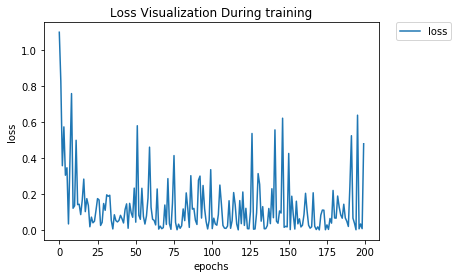

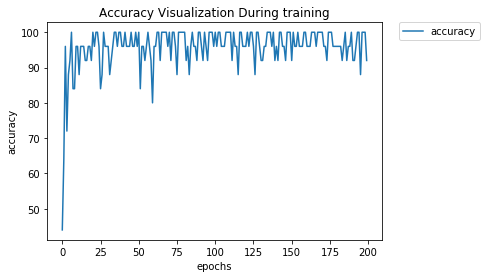

In [22]:

# plotting the points  
plt.plot(Yloss, label="loss") 

  
# Place a legend to the right of this smaller subplot.
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.) 

# naming the x axis 
plt.xlabel('epochs') 
# naming the y axis 
plt.ylabel('loss') 
  
# giving a title to my graph 
plt.title('Loss Visualization During training') 
  
# function to show the plot 
plt.show() 

plt.plot(Yacc, label="accuracy") 

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.) 

# naming the x axis 
plt.xlabel('epochs') 
# naming the y axis 
plt.ylabel('accuracy') 
plt.title('Accuracy Visualization During training') 

plt.show()


Expected Label: 4 Correct Label: 4


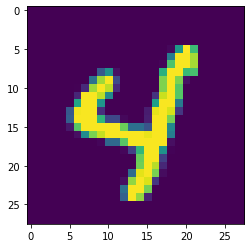

Expected Label: 9 Correct Label: 9


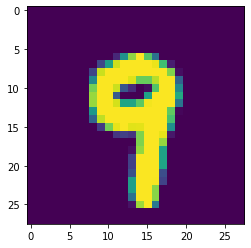

Expected Label: 8 Correct Label: 8


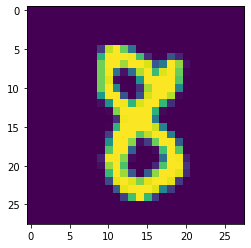

Expected Label: 7 Correct Label: 7


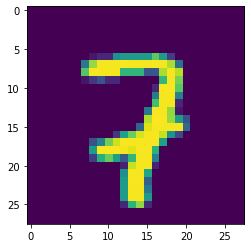

Expected Label: 2 Correct Label: 2


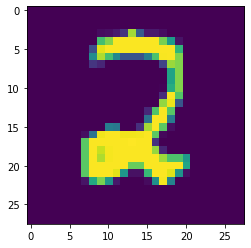

Expected Label: 9 Correct Label: 9


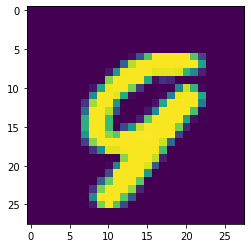

Expected Label: 4 Correct Label: 4


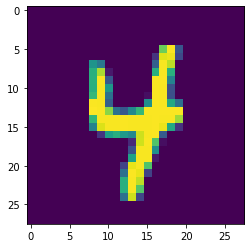

Expected Label: 7 Correct Label: 7


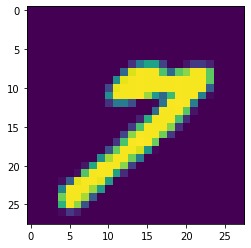

Expected Label: 7 Correct Label: 7


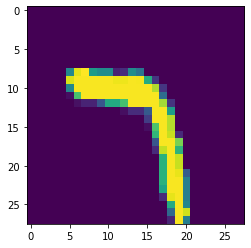

Expected Label: 7 Correct Label: 7


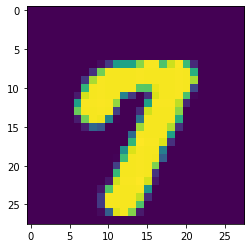

In [23]:
model.eval()
images, labels = next(iter(test_loader))
outputs = model(images)
_, predicted = torch.max(outputs.data, 1)


for i in range(10):
    print(f'Expected Label: {predicted[i]} Correct Label: {labels[i]}')
    showImage(images[i])

# Next Part of Homework

In [24]:
Xtrm, Ytrm = readData(mix=True)
Xtsm, Ytsm = readData(train=False, mix=True)
#Xtrm, Ytrm = readData(mix=True, cleanData=True)
#Xtsm, Ytsm = readData(train=False, mix=True, cleanData=True)


Image No. 1 of class 0 is read
Image No. 2 of class 0 is read
Image No. 3 of class 0 is read
Image No. 4 of class 0 is read
Image No. 5 of class 0 is read
Image No. 6 of class 0 is read
Image No. 7 of class 0 is read
Image No. 8 of class 0 is read
Image No. 9 of class 0 is read
Image No. 10 of class 0 is read
Image No. 11 of class 0 is read
Image No. 12 of class 0 is read
Image No. 13 of class 0 is read
Image No. 14 of class 0 is read
Image No. 15 of class 0 is read
Image No. 16 of class 0 is read
Image No. 17 of class 0 is read
Image No. 18 of class 0 is read
Image No. 19 of class 0 is read
Image No. 20 of class 0 is read
Image No. 21 of class 0 is read
Image No. 22 of class 0 is read
Image No. 23 of class 0 is read
Image No. 24 of class 0 is read
Image No. 25 of class 0 is read
Image No. 26 of class 0 is read
Image No. 27 of class 0 is read
Image No. 28 of class 0 is read
Image No. 29 of class 0 is read
Image No. 30 of class 0 is read
Image No. 31 of class 0 is read
Image No. 32 of c

Image No. 340 of class 0 is read
Image No. 341 of class 0 is read
Image No. 342 of class 0 is read
Image No. 343 of class 0 is read
Image No. 344 of class 0 is read
Image No. 345 of class 0 is read
Image No. 346 of class 0 is read
Image No. 347 of class 0 is read
Image No. 348 of class 0 is read
Image No. 349 of class 0 is read
Image No. 350 of class 0 is read
Image No. 351 of class 0 is read
Image No. 352 of class 0 is read
Image No. 353 of class 0 is read
Image No. 354 of class 0 is read
Image No. 355 of class 0 is read
Image No. 356 of class 0 is read
Image No. 357 of class 0 is read
Image No. 358 of class 0 is read
Image No. 359 of class 0 is read
Image No. 360 of class 0 is read
Image No. 361 of class 0 is read
Image No. 362 of class 0 is read
Image No. 363 of class 0 is read
Image No. 364 of class 0 is read
Image No. 365 of class 0 is read
Image No. 366 of class 0 is read
Image No. 367 of class 0 is read
Image No. 368 of class 0 is read
Image No. 369 of class 0 is read
Image No. 

Image No. 694 of class 0 is read
Image No. 695 of class 0 is read
Image No. 696 of class 0 is read
Image No. 697 of class 0 is read
Image No. 698 of class 0 is read
Image No. 699 of class 0 is read
Image No. 700 of class 0 is read
Image No. 701 of class 0 is read
Image No. 702 of class 0 is read
Image No. 703 of class 0 is read
Image No. 704 of class 0 is read
Image No. 705 of class 0 is read
Image No. 706 of class 0 is read
Image No. 707 of class 0 is read
Image No. 708 of class 0 is read
Image No. 709 of class 0 is read
Image No. 710 of class 0 is read
Image No. 711 of class 0 is read
Image No. 712 of class 0 is read
Image No. 713 of class 0 is read
Image No. 714 of class 0 is read
Image No. 715 of class 0 is read
Image No. 716 of class 0 is read
Image No. 717 of class 0 is read
Image No. 718 of class 0 is read
Image No. 719 of class 0 is read
Image No. 720 of class 0 is read
Image No. 721 of class 0 is read
Image No. 722 of class 0 is read
Image No. 723 of class 0 is read
Image No. 

Image No. 1020 of class 0 is read
Image No. 1021 of class 0 is read
Image No. 1022 of class 0 is read
Image No. 1023 of class 0 is read
Image No. 1024 of class 0 is read
Image No. 1025 of class 0 is read
Image No. 1026 of class 0 is read
Image No. 1027 of class 0 is read
Image No. 1028 of class 0 is read
Image No. 1029 of class 0 is read
Image No. 1030 of class 0 is read
Image No. 1031 of class 0 is read
Image No. 1032 of class 0 is read
Image No. 1033 of class 0 is read
Image No. 1034 of class 0 is read
Image No. 1035 of class 0 is read
Image No. 1036 of class 0 is read
Image No. 1037 of class 0 is read
Image No. 1038 of class 0 is read
Image No. 1039 of class 0 is read
Image No. 1040 of class 0 is read
Image No. 1041 of class 0 is read
Image No. 1042 of class 0 is read
Image No. 1043 of class 0 is read
Image No. 1044 of class 0 is read
Image No. 1045 of class 0 is read
Image No. 1046 of class 0 is read
Image No. 1047 of class 0 is read
Image No. 1048 of class 0 is read
Image No. 1049

Image No. 1313 of class 0 is read
Image No. 1314 of class 0 is read
Image No. 1315 of class 0 is read
Image No. 1316 of class 0 is read
Image No. 1317 of class 0 is read
Image No. 1318 of class 0 is read
Image No. 1319 of class 0 is read
Image No. 1320 of class 0 is read
Image No. 1321 of class 0 is read
Image No. 1322 of class 0 is read
Image No. 1323 of class 0 is read
Image No. 1324 of class 0 is read
Image No. 1325 of class 0 is read
Image No. 1326 of class 0 is read
Image No. 1327 of class 0 is read
Image No. 1328 of class 0 is read
Image No. 1329 of class 0 is read
Image No. 1330 of class 0 is read
Image No. 1331 of class 0 is read
Image No. 1332 of class 0 is read
Image No. 1333 of class 0 is read
Image No. 1334 of class 0 is read
Image No. 1335 of class 0 is read
Image No. 1336 of class 0 is read
Image No. 1337 of class 0 is read
Image No. 1338 of class 0 is read
Image No. 1339 of class 0 is read
Image No. 1340 of class 0 is read
Image No. 1341 of class 0 is read
Image No. 1342

Image No. 1569 of class 0 is read
Image No. 1570 of class 0 is read
Image No. 1571 of class 0 is read
Image No. 1572 of class 0 is read
Image No. 1573 of class 0 is read
Image No. 1574 of class 0 is read
Image No. 1575 of class 0 is read
Image No. 1576 of class 0 is read
Image No. 1577 of class 0 is read
Image No. 1578 of class 0 is read
Image No. 1579 of class 0 is read
Image No. 1580 of class 0 is read
Image No. 1581 of class 0 is read
Image No. 1582 of class 0 is read
Image No. 1583 of class 0 is read
Image No. 1584 of class 0 is read
Image No. 1585 of class 0 is read
Image No. 1586 of class 0 is read
Image No. 1587 of class 0 is read
Image No. 1588 of class 0 is read
Image No. 1589 of class 0 is read
Image No. 1590 of class 0 is read
Image No. 1591 of class 0 is read
Image No. 1592 of class 0 is read
Image No. 1593 of class 0 is read
Image No. 1594 of class 0 is read
Image No. 1595 of class 0 is read
Image No. 1596 of class 0 is read
Image No. 1597 of class 0 is read
Image No. 1598

Image No. 1975 of class 0 is read
Image No. 1976 of class 0 is read
Image No. 1977 of class 0 is read
Image No. 1978 of class 0 is read
Image No. 1979 of class 0 is read
Image No. 1980 of class 0 is read
Image No. 1981 of class 0 is read
Image No. 1982 of class 0 is read
Image No. 1983 of class 0 is read
Image No. 1984 of class 0 is read
Image No. 1985 of class 0 is read
Image No. 1986 of class 0 is read
Image No. 1987 of class 0 is read
Image No. 1988 of class 0 is read
Image No. 1989 of class 0 is read
Image No. 1990 of class 0 is read
Image No. 1991 of class 0 is read
Image No. 1992 of class 0 is read
Image No. 1993 of class 0 is read
Image No. 1994 of class 0 is read
Image No. 1995 of class 0 is read
Image No. 1996 of class 0 is read
Image No. 1997 of class 0 is read
Image No. 1998 of class 0 is read
Image No. 1999 of class 0 is read
Image No. 2000 of class 0 is read
Image No. 2001 of class 0 is read
Image No. 2002 of class 0 is read
Image No. 2003 of class 0 is read
Image No. 2004

Image No. 2327 of class 0 is read
Image No. 2328 of class 0 is read
Image No. 2329 of class 0 is read
Image No. 2330 of class 0 is read
Image No. 2331 of class 0 is read
Image No. 2332 of class 0 is read
Image No. 2333 of class 0 is read
Image No. 2334 of class 0 is read
Image No. 2335 of class 0 is read
Image No. 2336 of class 0 is read
Image No. 2337 of class 0 is read
Image No. 2338 of class 0 is read
Image No. 2339 of class 0 is read
Image No. 2340 of class 0 is read
Image No. 2341 of class 0 is read
Image No. 2342 of class 0 is read
Image No. 2343 of class 0 is read
Image No. 2344 of class 0 is read
Image No. 2345 of class 0 is read
Image No. 2346 of class 0 is read
Image No. 2347 of class 0 is read
Image No. 2348 of class 0 is read
Image No. 2349 of class 0 is read
Image No. 2350 of class 0 is read
Image No. 2351 of class 0 is read
Image No. 2352 of class 0 is read
Image No. 2353 of class 0 is read
Image No. 2354 of class 0 is read
Image No. 2355 of class 0 is read
Image No. 2356

Image No. 2633 of class 0 is read
Image No. 2634 of class 0 is read
Image No. 2635 of class 0 is read
Image No. 2636 of class 0 is read
Image No. 2637 of class 0 is read
Image No. 2638 of class 0 is read
Image No. 2639 of class 0 is read
Image No. 2640 of class 0 is read
Image No. 2641 of class 0 is read
Image No. 2642 of class 0 is read
Image No. 2643 of class 0 is read
Image No. 2644 of class 0 is read
Image No. 2645 of class 0 is read
Image No. 2646 of class 0 is read
Image No. 2647 of class 0 is read
Image No. 2648 of class 0 is read
Image No. 2649 of class 0 is read
Image No. 2650 of class 0 is read
Image No. 2651 of class 0 is read
Image No. 2652 of class 0 is read
Image No. 2653 of class 0 is read
Image No. 2654 of class 0 is read
Image No. 2655 of class 0 is read
Image No. 2656 of class 0 is read
Image No. 2657 of class 0 is read
Image No. 2658 of class 0 is read
Image No. 2659 of class 0 is read
Image No. 2660 of class 0 is read
Image No. 2661 of class 0 is read
Image No. 2662

Image No. 2910 of class 0 is read
Image No. 2911 of class 0 is read
Image No. 2912 of class 0 is read
Image No. 2913 of class 0 is read
Image No. 2914 of class 0 is read
Image No. 2915 of class 0 is read
Image No. 2916 of class 0 is read
Image No. 2917 of class 0 is read
Image No. 2918 of class 0 is read
Image No. 2919 of class 0 is read
Image No. 2920 of class 0 is read
Image No. 2921 of class 0 is read
Image No. 2922 of class 0 is read
Image No. 2923 of class 0 is read
Image No. 2924 of class 0 is read
Image No. 2925 of class 0 is read
Image No. 2926 of class 0 is read
Image No. 2927 of class 0 is read
Image No. 2928 of class 0 is read
Image No. 2929 of class 0 is read
Image No. 2930 of class 0 is read
Image No. 2931 of class 0 is read
Image No. 2932 of class 0 is read
Image No. 2933 of class 0 is read
Image No. 2934 of class 0 is read
Image No. 2935 of class 0 is read
Image No. 2936 of class 0 is read
Image No. 2937 of class 0 is read
Image No. 2938 of class 0 is read
Image No. 2939

Image No. 3166 of class 0 is read
Image No. 3167 of class 0 is read
Image No. 3168 of class 0 is read
Image No. 3169 of class 0 is read
Image No. 3170 of class 0 is read
Image No. 3171 of class 0 is read
Image No. 3172 of class 0 is read
Image No. 3173 of class 0 is read
Image No. 3174 of class 0 is read
Image No. 3175 of class 0 is read
Image No. 3176 of class 0 is read
Image No. 3177 of class 0 is read
Image No. 3178 of class 0 is read
Image No. 3179 of class 0 is read
Image No. 3180 of class 0 is read
Image No. 3181 of class 0 is read
Image No. 3182 of class 0 is read
Image No. 3183 of class 0 is read
Image No. 3184 of class 0 is read
Image No. 3185 of class 0 is read
Image No. 3186 of class 0 is read
Image No. 3187 of class 0 is read
Image No. 3188 of class 0 is read
Image No. 3189 of class 0 is read
Image No. 3190 of class 0 is read
Image No. 3191 of class 0 is read
Image No. 3192 of class 0 is read
Image No. 3193 of class 0 is read
Image No. 3194 of class 0 is read
Image No. 3195

Image No. 3517 of class 0 is read
Image No. 3518 of class 0 is read
Image No. 3519 of class 0 is read
Image No. 3520 of class 0 is read
Image No. 3521 of class 0 is read
Image No. 3522 of class 0 is read
Image No. 3523 of class 0 is read
Image No. 3524 of class 0 is read
Image No. 3525 of class 0 is read
Image No. 3526 of class 0 is read
Image No. 3527 of class 0 is read
Image No. 3528 of class 0 is read
Image No. 3529 of class 0 is read
Image No. 3530 of class 0 is read
Image No. 3531 of class 0 is read
Image No. 3532 of class 0 is read
Image No. 3533 of class 0 is read
Image No. 3534 of class 0 is read
Image No. 3535 of class 0 is read
Image No. 3536 of class 0 is read
Image No. 3537 of class 0 is read
Image No. 3538 of class 0 is read
Image No. 3539 of class 0 is read
Image No. 3540 of class 0 is read
Image No. 3541 of class 0 is read
Image No. 3542 of class 0 is read
Image No. 3543 of class 0 is read
Image No. 3544 of class 0 is read
Image No. 3545 of class 0 is read
Image No. 3546

Image No. 3846 of class 0 is read
Image No. 3847 of class 0 is read
Image No. 3848 of class 0 is read
Image No. 3849 of class 0 is read
Image No. 3850 of class 0 is read
Image No. 3851 of class 0 is read
Image No. 3852 of class 0 is read
Image No. 3853 of class 0 is read
Image No. 3854 of class 0 is read
Image No. 3855 of class 0 is read
Image No. 3856 of class 0 is read
Image No. 3857 of class 0 is read
Image No. 3858 of class 0 is read
Image No. 3859 of class 0 is read
Image No. 3860 of class 0 is read
Image No. 3861 of class 0 is read
Image No. 3862 of class 0 is read
Image No. 3863 of class 0 is read
Image No. 3864 of class 0 is read
Image No. 3865 of class 0 is read
Image No. 3866 of class 0 is read
Image No. 3867 of class 0 is read
Image No. 3868 of class 0 is read
Image No. 3869 of class 0 is read
Image No. 3870 of class 0 is read
Image No. 3871 of class 0 is read
Image No. 3872 of class 0 is read
Image No. 3873 of class 0 is read
Image No. 3874 of class 0 is read
Image No. 3875

Image No. 4140 of class 0 is read
Image No. 4141 of class 0 is read
Image No. 4142 of class 0 is read
Image No. 4143 of class 0 is read
Image No. 4144 of class 0 is read
Image No. 4145 of class 0 is read
Image No. 4146 of class 0 is read
Image No. 4147 of class 0 is read
Image No. 4148 of class 0 is read
Image No. 4149 of class 0 is read
Image No. 4150 of class 0 is read
Image No. 4151 of class 0 is read
Image No. 4152 of class 0 is read
Image No. 4153 of class 0 is read
Image No. 4154 of class 0 is read
Image No. 4155 of class 0 is read
Image No. 4156 of class 0 is read
Image No. 4157 of class 0 is read
Image No. 4158 of class 0 is read
Image No. 4159 of class 0 is read
Image No. 4160 of class 0 is read
Image No. 4161 of class 0 is read
Image No. 4162 of class 0 is read
Image No. 4163 of class 0 is read
Image No. 4164 of class 0 is read
Image No. 4165 of class 0 is read
Image No. 4166 of class 0 is read
Image No. 4167 of class 0 is read
Image No. 4168 of class 0 is read
Image No. 4169

Image No. 4434 of class 0 is read
Image No. 4435 of class 0 is read
Image No. 4436 of class 0 is read
Image No. 4437 of class 0 is read
Image No. 4438 of class 0 is read
Image No. 4439 of class 0 is read
Image No. 4440 of class 0 is read
Image No. 4441 of class 0 is read
Image No. 4442 of class 0 is read
Image No. 4443 of class 0 is read
Image No. 4444 of class 0 is read
Image No. 4445 of class 0 is read
Image No. 4446 of class 0 is read
Image No. 4447 of class 0 is read
Image No. 4448 of class 0 is read
Image No. 4449 of class 0 is read
Image No. 4450 of class 0 is read
Image No. 4451 of class 0 is read
Image No. 4452 of class 0 is read
Image No. 4453 of class 0 is read
Image No. 4454 of class 0 is read
Image No. 4455 of class 0 is read
Image No. 4456 of class 0 is read
Image No. 4457 of class 0 is read
Image No. 4458 of class 0 is read
Image No. 4459 of class 0 is read
Image No. 4460 of class 0 is read
Image No. 4461 of class 0 is read
Image No. 4462 of class 0 is read
Image No. 4463

Image No. 4714 of class 0 is read
Image No. 4715 of class 0 is read
Image No. 4716 of class 0 is read
Image No. 4717 of class 0 is read
Image No. 4718 of class 0 is read
Image No. 4719 of class 0 is read
Image No. 4720 of class 0 is read
Image No. 4721 of class 0 is read
Image No. 4722 of class 0 is read
Image No. 4723 of class 0 is read
Image No. 4724 of class 0 is read
Image No. 4725 of class 0 is read
Image No. 4726 of class 0 is read
Image No. 4727 of class 0 is read
Image No. 4728 of class 0 is read
Image No. 4729 of class 0 is read
Image No. 4730 of class 0 is read
Image No. 4731 of class 0 is read
Image No. 4732 of class 0 is read
Image No. 4733 of class 0 is read
Image No. 4734 of class 0 is read
Image No. 4735 of class 0 is read
Image No. 4736 of class 0 is read
Image No. 4737 of class 0 is read
Image No. 4738 of class 0 is read
Image No. 4739 of class 0 is read
Image No. 4740 of class 0 is read
Image No. 4741 of class 0 is read
Image No. 4742 of class 0 is read
Image No. 4743

Image No. 4981 of class 0 is read
Image No. 4982 of class 0 is read
Image No. 4983 of class 0 is read
Image No. 4984 of class 0 is read
Image No. 4985 of class 0 is read
Image No. 4986 of class 0 is read
Image No. 4987 of class 0 is read
Image No. 4988 of class 0 is read
Image No. 4989 of class 0 is read
Image No. 4990 of class 0 is read
Image No. 4991 of class 0 is read
Image No. 4992 of class 0 is read
Image No. 4993 of class 0 is read
Image No. 4994 of class 0 is read
Image No. 4995 of class 0 is read
Image No. 4996 of class 0 is read
Image No. 4997 of class 0 is read
Image No. 4998 of class 0 is read
Image No. 4999 of class 0 is read
Image No. 5000 of class 0 is read
Image No. 5001 of class 0 is read
Image No. 5002 of class 0 is read
Image No. 5003 of class 0 is read
Image No. 5004 of class 0 is read
Image No. 5005 of class 0 is read
Image No. 5006 of class 0 is read
Image No. 5007 of class 0 is read
Image No. 5008 of class 0 is read
Image No. 5009 of class 0 is read
Image No. 5010

Image No. 5237 of class 0 is read
Image No. 5238 of class 0 is read
Image No. 5239 of class 0 is read
Image No. 5240 of class 0 is read
Image No. 5241 of class 0 is read
Image No. 5242 of class 0 is read
Image No. 5243 of class 0 is read
Image No. 5244 of class 0 is read
Image No. 5245 of class 0 is read
Image No. 5246 of class 0 is read
Image No. 5247 of class 0 is read
Image No. 5248 of class 0 is read
Image No. 5249 of class 0 is read
Image No. 5250 of class 0 is read
Image No. 5251 of class 0 is read
Image No. 5252 of class 0 is read
Image No. 5253 of class 0 is read
Image No. 5254 of class 0 is read
Image No. 5255 of class 0 is read
Image No. 5256 of class 0 is read
Image No. 5257 of class 0 is read
Image No. 5258 of class 0 is read
Image No. 5259 of class 0 is read
Image No. 5260 of class 0 is read
Image No. 5261 of class 0 is read
Image No. 5262 of class 0 is read
Image No. 5263 of class 0 is read
Image No. 5264 of class 0 is read
Image No. 5265 of class 0 is read
Image No. 5266

Image No. 5550 of class 0 is read
Image No. 5551 of class 0 is read
Image No. 5552 of class 0 is read
Image No. 5553 of class 0 is read
Image No. 5554 of class 0 is read
Image No. 5555 of class 0 is read
Image No. 5556 of class 0 is read
Image No. 5557 of class 0 is read
Image No. 5558 of class 0 is read
Image No. 5559 of class 0 is read
Image No. 5560 of class 0 is read
Image No. 5561 of class 0 is read
Image No. 5562 of class 0 is read
Image No. 5563 of class 0 is read
Image No. 5564 of class 0 is read
Image No. 5565 of class 0 is read
Image No. 5566 of class 0 is read
Image No. 5567 of class 0 is read
Image No. 5568 of class 0 is read
Image No. 5569 of class 0 is read
Image No. 5570 of class 0 is read
Image No. 5571 of class 0 is read
Image No. 5572 of class 0 is read
Image No. 5573 of class 0 is read
Image No. 5574 of class 0 is read
Image No. 5575 of class 0 is read
Image No. 5576 of class 0 is read
Image No. 5577 of class 0 is read
Image No. 5578 of class 0 is read
Image No. 5579

Image No. 5849 of class 0 is read
Image No. 5850 of class 0 is read
Image No. 5851 of class 0 is read
Image No. 5852 of class 0 is read
Image No. 5853 of class 0 is read
Image No. 5854 of class 0 is read
Image No. 5855 of class 0 is read
Image No. 5856 of class 0 is read
Image No. 5857 of class 0 is read
Image No. 5858 of class 0 is read
Image No. 5859 of class 0 is read
Image No. 5860 of class 0 is read
Image No. 5861 of class 0 is read
Image No. 5862 of class 0 is read
Image No. 5863 of class 0 is read
Image No. 5864 of class 0 is read
Image No. 5865 of class 0 is read
Image No. 5866 of class 0 is read
Image No. 5867 of class 0 is read
Image No. 5868 of class 0 is read
Image No. 5869 of class 0 is read
Image No. 5870 of class 0 is read
Image No. 5871 of class 0 is read
Image No. 5872 of class 0 is read
Image No. 5873 of class 0 is read
Image No. 5874 of class 0 is read
Image No. 5875 of class 0 is read
Image No. 5876 of class 0 is read
Image No. 5877 of class 0 is read
Image No. 5878

Image No. 392 of class 1 is read
Image No. 393 of class 1 is read
Image No. 394 of class 1 is read
Image No. 395 of class 1 is read
Image No. 396 of class 1 is read
Image No. 397 of class 1 is read
Image No. 398 of class 1 is read
Image No. 399 of class 1 is read
Image No. 400 of class 1 is read
Image No. 401 of class 1 is read
Image No. 402 of class 1 is read
Image No. 403 of class 1 is read
Image No. 404 of class 1 is read
Image No. 405 of class 1 is read
Image No. 406 of class 1 is read
Image No. 407 of class 1 is read
Image No. 408 of class 1 is read
Image No. 409 of class 1 is read
Image No. 410 of class 1 is read
Image No. 411 of class 1 is read
Image No. 412 of class 1 is read
Image No. 413 of class 1 is read
Image No. 414 of class 1 is read
Image No. 415 of class 1 is read
Image No. 416 of class 1 is read
Image No. 417 of class 1 is read
Image No. 418 of class 1 is read
Image No. 419 of class 1 is read
Image No. 420 of class 1 is read
Image No. 421 of class 1 is read
Image No. 

Image No. 663 of class 1 is read
Image No. 664 of class 1 is read
Image No. 665 of class 1 is read
Image No. 666 of class 1 is read
Image No. 667 of class 1 is read
Image No. 668 of class 1 is read
Image No. 669 of class 1 is read
Image No. 670 of class 1 is read
Image No. 671 of class 1 is read
Image No. 672 of class 1 is read
Image No. 673 of class 1 is read
Image No. 674 of class 1 is read
Image No. 675 of class 1 is read
Image No. 676 of class 1 is read
Image No. 677 of class 1 is read
Image No. 678 of class 1 is read
Image No. 679 of class 1 is read
Image No. 680 of class 1 is read
Image No. 681 of class 1 is read
Image No. 682 of class 1 is read
Image No. 683 of class 1 is read
Image No. 684 of class 1 is read
Image No. 685 of class 1 is read
Image No. 686 of class 1 is read
Image No. 687 of class 1 is read
Image No. 688 of class 1 is read
Image No. 689 of class 1 is read
Image No. 690 of class 1 is read
Image No. 691 of class 1 is read
Image No. 692 of class 1 is read
Image No. 

Image No. 989 of class 1 is read
Image No. 990 of class 1 is read
Image No. 991 of class 1 is read
Image No. 992 of class 1 is read
Image No. 993 of class 1 is read
Image No. 994 of class 1 is read
Image No. 995 of class 1 is read
Image No. 996 of class 1 is read
Image No. 997 of class 1 is read
Image No. 998 of class 1 is read
Image No. 999 of class 1 is read
Image No. 1000 of class 1 is read
Image No. 1001 of class 1 is read
Image No. 1002 of class 1 is read
Image No. 1003 of class 1 is read
Image No. 1004 of class 1 is read
Image No. 1005 of class 1 is read
Image No. 1006 of class 1 is read
Image No. 1007 of class 1 is read
Image No. 1008 of class 1 is read
Image No. 1009 of class 1 is read
Image No. 1010 of class 1 is read
Image No. 1011 of class 1 is read
Image No. 1012 of class 1 is read
Image No. 1013 of class 1 is read
Image No. 1014 of class 1 is read
Image No. 1015 of class 1 is read
Image No. 1016 of class 1 is read
Image No. 1017 of class 1 is read
Image No. 1018 of class 1

Image No. 1267 of class 1 is read
Image No. 1268 of class 1 is read
Image No. 1269 of class 1 is read
Image No. 1270 of class 1 is read
Image No. 1271 of class 1 is read
Image No. 1272 of class 1 is read
Image No. 1273 of class 1 is read
Image No. 1274 of class 1 is read
Image No. 1275 of class 1 is read
Image No. 1276 of class 1 is read
Image No. 1277 of class 1 is read
Image No. 1278 of class 1 is read
Image No. 1279 of class 1 is read
Image No. 1280 of class 1 is read
Image No. 1281 of class 1 is read
Image No. 1282 of class 1 is read
Image No. 1283 of class 1 is read
Image No. 1284 of class 1 is read
Image No. 1285 of class 1 is read
Image No. 1286 of class 1 is read
Image No. 1287 of class 1 is read
Image No. 1288 of class 1 is read
Image No. 1289 of class 1 is read
Image No. 1290 of class 1 is read
Image No. 1291 of class 1 is read
Image No. 1292 of class 1 is read
Image No. 1293 of class 1 is read
Image No. 1294 of class 1 is read
Image No. 1295 of class 1 is read
Image No. 1296

Image No. 1712 of class 1 is read
Image No. 1713 of class 1 is read
Image No. 1714 of class 1 is read
Image No. 1715 of class 1 is read
Image No. 1716 of class 1 is read
Image No. 1717 of class 1 is read
Image No. 1718 of class 1 is read
Image No. 1719 of class 1 is read
Image No. 1720 of class 1 is read
Image No. 1721 of class 1 is read
Image No. 1722 of class 1 is read
Image No. 1723 of class 1 is read
Image No. 1724 of class 1 is read
Image No. 1725 of class 1 is read
Image No. 1726 of class 1 is read
Image No. 1727 of class 1 is read
Image No. 1728 of class 1 is read
Image No. 1729 of class 1 is read
Image No. 1730 of class 1 is read
Image No. 1731 of class 1 is read
Image No. 1732 of class 1 is read
Image No. 1733 of class 1 is read
Image No. 1734 of class 1 is read
Image No. 1735 of class 1 is read
Image No. 1736 of class 1 is read
Image No. 1737 of class 1 is read
Image No. 1738 of class 1 is read
Image No. 1739 of class 1 is read
Image No. 1740 of class 1 is read
Image No. 1741

Image No. 2095 of class 1 is read
Image No. 2096 of class 1 is read
Image No. 2097 of class 1 is read
Image No. 2098 of class 1 is read
Image No. 2099 of class 1 is read
Image No. 2100 of class 1 is read
Image No. 2101 of class 1 is read
Image No. 2102 of class 1 is read
Image No. 2103 of class 1 is read
Image No. 2104 of class 1 is read
Image No. 2105 of class 1 is read
Image No. 2106 of class 1 is read
Image No. 2107 of class 1 is read
Image No. 2108 of class 1 is read
Image No. 2109 of class 1 is read
Image No. 2110 of class 1 is read
Image No. 2111 of class 1 is read
Image No. 2112 of class 1 is read
Image No. 2113 of class 1 is read
Image No. 2114 of class 1 is read
Image No. 2115 of class 1 is read
Image No. 2116 of class 1 is read
Image No. 2117 of class 1 is read
Image No. 2118 of class 1 is read
Image No. 2119 of class 1 is read
Image No. 2120 of class 1 is read
Image No. 2121 of class 1 is read
Image No. 2122 of class 1 is read
Image No. 2123 of class 1 is read
Image No. 2124

Image No. 2415 of class 1 is read
Image No. 2416 of class 1 is read
Image No. 2417 of class 1 is read
Image No. 2418 of class 1 is read
Image No. 2419 of class 1 is read
Image No. 2420 of class 1 is read
Image No. 2421 of class 1 is read
Image No. 2422 of class 1 is read
Image No. 2423 of class 1 is read
Image No. 2424 of class 1 is read
Image No. 2425 of class 1 is read
Image No. 2426 of class 1 is read
Image No. 2427 of class 1 is read
Image No. 2428 of class 1 is read
Image No. 2429 of class 1 is read
Image No. 2430 of class 1 is read
Image No. 2431 of class 1 is read
Image No. 2432 of class 1 is read
Image No. 2433 of class 1 is read
Image No. 2434 of class 1 is read
Image No. 2435 of class 1 is read
Image No. 2436 of class 1 is read
Image No. 2437 of class 1 is read
Image No. 2438 of class 1 is read
Image No. 2439 of class 1 is read
Image No. 2440 of class 1 is read
Image No. 2441 of class 1 is read
Image No. 2442 of class 1 is read
Image No. 2443 of class 1 is read
Image No. 2444

Image No. 2691 of class 1 is read
Image No. 2692 of class 1 is read
Image No. 2693 of class 1 is read
Image No. 2694 of class 1 is read
Image No. 2695 of class 1 is read
Image No. 2696 of class 1 is read
Image No. 2697 of class 1 is read
Image No. 2698 of class 1 is read
Image No. 2699 of class 1 is read
Image No. 2700 of class 1 is read
Image No. 2701 of class 1 is read
Image No. 2702 of class 1 is read
Image No. 2703 of class 1 is read
Image No. 2704 of class 1 is read
Image No. 2705 of class 1 is read
Image No. 2706 of class 1 is read
Image No. 2707 of class 1 is read
Image No. 2708 of class 1 is read
Image No. 2709 of class 1 is read
Image No. 2710 of class 1 is read
Image No. 2711 of class 1 is read
Image No. 2712 of class 1 is read
Image No. 2713 of class 1 is read
Image No. 2714 of class 1 is read
Image No. 2715 of class 1 is read
Image No. 2716 of class 1 is read
Image No. 2717 of class 1 is read
Image No. 2718 of class 1 is read
Image No. 2719 of class 1 is read
Image No. 2720

Image No. 2949 of class 1 is read
Image No. 2950 of class 1 is read
Image No. 2951 of class 1 is read
Image No. 2952 of class 1 is read
Image No. 2953 of class 1 is read
Image No. 2954 of class 1 is read
Image No. 2955 of class 1 is read
Image No. 2956 of class 1 is read
Image No. 2957 of class 1 is read
Image No. 2958 of class 1 is read
Image No. 2959 of class 1 is read
Image No. 2960 of class 1 is read
Image No. 2961 of class 1 is read
Image No. 2962 of class 1 is read
Image No. 2963 of class 1 is read
Image No. 2964 of class 1 is read
Image No. 2965 of class 1 is read
Image No. 2966 of class 1 is read
Image No. 2967 of class 1 is read
Image No. 2968 of class 1 is read
Image No. 2969 of class 1 is read
Image No. 2970 of class 1 is read
Image No. 2971 of class 1 is read
Image No. 2972 of class 1 is read
Image No. 2973 of class 1 is read
Image No. 2974 of class 1 is read
Image No. 2975 of class 1 is read
Image No. 2976 of class 1 is read
Image No. 2977 of class 1 is read
Image No. 2978

Image No. 3193 of class 1 is read
Image No. 3194 of class 1 is read
Image No. 3195 of class 1 is read
Image No. 3196 of class 1 is read
Image No. 3197 of class 1 is read
Image No. 3198 of class 1 is read
Image No. 3199 of class 1 is read
Image No. 3200 of class 1 is read
Image No. 3201 of class 1 is read
Image No. 3202 of class 1 is read
Image No. 3203 of class 1 is read
Image No. 3204 of class 1 is read
Image No. 3205 of class 1 is read
Image No. 3206 of class 1 is read
Image No. 3207 of class 1 is read
Image No. 3208 of class 1 is read
Image No. 3209 of class 1 is read
Image No. 3210 of class 1 is read
Image No. 3211 of class 1 is read
Image No. 3212 of class 1 is read
Image No. 3213 of class 1 is read
Image No. 3214 of class 1 is read
Image No. 3215 of class 1 is read
Image No. 3216 of class 1 is read
Image No. 3217 of class 1 is read
Image No. 3218 of class 1 is read
Image No. 3219 of class 1 is read
Image No. 3220 of class 1 is read
Image No. 3221 of class 1 is read
Image No. 3222

Image No. 3535 of class 1 is read
Image No. 3536 of class 1 is read
Image No. 3537 of class 1 is read
Image No. 3538 of class 1 is read
Image No. 3539 of class 1 is read
Image No. 3540 of class 1 is read
Image No. 3541 of class 1 is read
Image No. 3542 of class 1 is read
Image No. 3543 of class 1 is read
Image No. 3544 of class 1 is read
Image No. 3545 of class 1 is read
Image No. 3546 of class 1 is read
Image No. 3547 of class 1 is read
Image No. 3548 of class 1 is read
Image No. 3549 of class 1 is read
Image No. 3550 of class 1 is read
Image No. 3551 of class 1 is read
Image No. 3552 of class 1 is read
Image No. 3553 of class 1 is read
Image No. 3554 of class 1 is read
Image No. 3555 of class 1 is read
Image No. 3556 of class 1 is read
Image No. 3557 of class 1 is read
Image No. 3558 of class 1 is read
Image No. 3559 of class 1 is read
Image No. 3560 of class 1 is read
Image No. 3561 of class 1 is read
Image No. 3562 of class 1 is read
Image No. 3563 of class 1 is read
Image No. 3564

Image No. 3848 of class 1 is read
Image No. 3849 of class 1 is read
Image No. 3850 of class 1 is read
Image No. 3851 of class 1 is read
Image No. 3852 of class 1 is read
Image No. 3853 of class 1 is read
Image No. 3854 of class 1 is read
Image No. 3855 of class 1 is read
Image No. 3856 of class 1 is read
Image No. 3857 of class 1 is read
Image No. 3858 of class 1 is read
Image No. 3859 of class 1 is read
Image No. 3860 of class 1 is read
Image No. 3861 of class 1 is read
Image No. 3862 of class 1 is read
Image No. 3863 of class 1 is read
Image No. 3864 of class 1 is read
Image No. 3865 of class 1 is read
Image No. 3866 of class 1 is read
Image No. 3867 of class 1 is read
Image No. 3868 of class 1 is read
Image No. 3869 of class 1 is read
Image No. 3870 of class 1 is read
Image No. 3871 of class 1 is read
Image No. 3872 of class 1 is read
Image No. 3873 of class 1 is read
Image No. 3874 of class 1 is read
Image No. 3875 of class 1 is read
Image No. 3876 of class 1 is read
Image No. 3877

Image No. 4147 of class 1 is read
Image No. 4148 of class 1 is read
Image No. 4149 of class 1 is read
Image No. 4150 of class 1 is read
Image No. 4151 of class 1 is read
Image No. 4152 of class 1 is read
Image No. 4153 of class 1 is read
Image No. 4154 of class 1 is read
Image No. 4155 of class 1 is read
Image No. 4156 of class 1 is read
Image No. 4157 of class 1 is read
Image No. 4158 of class 1 is read
Image No. 4159 of class 1 is read
Image No. 4160 of class 1 is read
Image No. 4161 of class 1 is read
Image No. 4162 of class 1 is read
Image No. 4163 of class 1 is read
Image No. 4164 of class 1 is read
Image No. 4165 of class 1 is read
Image No. 4166 of class 1 is read
Image No. 4167 of class 1 is read
Image No. 4168 of class 1 is read
Image No. 4169 of class 1 is read
Image No. 4170 of class 1 is read
Image No. 4171 of class 1 is read
Image No. 4172 of class 1 is read
Image No. 4173 of class 1 is read
Image No. 4174 of class 1 is read
Image No. 4175 of class 1 is read
Image No. 4176

Image No. 4410 of class 1 is read
Image No. 4411 of class 1 is read
Image No. 4412 of class 1 is read
Image No. 4413 of class 1 is read
Image No. 4414 of class 1 is read
Image No. 4415 of class 1 is read
Image No. 4416 of class 1 is read
Image No. 4417 of class 1 is read
Image No. 4418 of class 1 is read
Image No. 4419 of class 1 is read
Image No. 4420 of class 1 is read
Image No. 4421 of class 1 is read
Image No. 4422 of class 1 is read
Image No. 4423 of class 1 is read
Image No. 4424 of class 1 is read
Image No. 4425 of class 1 is read
Image No. 4426 of class 1 is read
Image No. 4427 of class 1 is read
Image No. 4428 of class 1 is read
Image No. 4429 of class 1 is read
Image No. 4430 of class 1 is read
Image No. 4431 of class 1 is read
Image No. 4432 of class 1 is read
Image No. 4433 of class 1 is read
Image No. 4434 of class 1 is read
Image No. 4435 of class 1 is read
Image No. 4436 of class 1 is read
Image No. 4437 of class 1 is read
Image No. 4438 of class 1 is read
Image No. 4439

Image No. 4675 of class 1 is read
Image No. 4676 of class 1 is read
Image No. 4677 of class 1 is read
Image No. 4678 of class 1 is read
Image No. 4679 of class 1 is read
Image No. 4680 of class 1 is read
Image No. 4681 of class 1 is read
Image No. 4682 of class 1 is read
Image No. 4683 of class 1 is read
Image No. 4684 of class 1 is read
Image No. 4685 of class 1 is read
Image No. 4686 of class 1 is read
Image No. 4687 of class 1 is read
Image No. 4688 of class 1 is read
Image No. 4689 of class 1 is read
Image No. 4690 of class 1 is read
Image No. 4691 of class 1 is read
Image No. 4692 of class 1 is read
Image No. 4693 of class 1 is read
Image No. 4694 of class 1 is read
Image No. 4695 of class 1 is read
Image No. 4696 of class 1 is read
Image No. 4697 of class 1 is read
Image No. 4698 of class 1 is read
Image No. 4699 of class 1 is read
Image No. 4700 of class 1 is read
Image No. 4701 of class 1 is read
Image No. 4702 of class 1 is read
Image No. 4703 of class 1 is read
Image No. 4704

Image No. 4924 of class 1 is read
Image No. 4925 of class 1 is read
Image No. 4926 of class 1 is read
Image No. 4927 of class 1 is read
Image No. 4928 of class 1 is read
Image No. 4929 of class 1 is read
Image No. 4930 of class 1 is read
Image No. 4931 of class 1 is read
Image No. 4932 of class 1 is read
Image No. 4933 of class 1 is read
Image No. 4934 of class 1 is read
Image No. 4935 of class 1 is read
Image No. 4936 of class 1 is read
Image No. 4937 of class 1 is read
Image No. 4938 of class 1 is read
Image No. 4939 of class 1 is read
Image No. 4940 of class 1 is read
Image No. 4941 of class 1 is read
Image No. 4942 of class 1 is read
Image No. 4943 of class 1 is read
Image No. 4944 of class 1 is read
Image No. 4945 of class 1 is read
Image No. 4946 of class 1 is read
Image No. 4947 of class 1 is read
Image No. 4948 of class 1 is read
Image No. 4949 of class 1 is read
Image No. 4950 of class 1 is read
Image No. 4951 of class 1 is read
Image No. 4952 of class 1 is read
Image No. 4953

Image No. 5171 of class 1 is read
Image No. 5172 of class 1 is read
Image No. 5173 of class 1 is read
Image No. 5174 of class 1 is read
Image No. 5175 of class 1 is read
Image No. 5176 of class 1 is read
Image No. 5177 of class 1 is read
Image No. 5178 of class 1 is read
Image No. 5179 of class 1 is read
Image No. 5180 of class 1 is read
Image No. 5181 of class 1 is read
Image No. 5182 of class 1 is read
Image No. 5183 of class 1 is read
Image No. 5184 of class 1 is read
Image No. 5185 of class 1 is read
Image No. 5186 of class 1 is read
Image No. 5187 of class 1 is read
Image No. 5188 of class 1 is read
Image No. 5189 of class 1 is read
Image No. 5190 of class 1 is read
Image No. 5191 of class 1 is read
Image No. 5192 of class 1 is read
Image No. 5193 of class 1 is read
Image No. 5194 of class 1 is read
Image No. 5195 of class 1 is read
Image No. 5196 of class 1 is read
Image No. 5197 of class 1 is read
Image No. 5198 of class 1 is read
Image No. 5199 of class 1 is read
Image No. 5200

Image No. 5413 of class 1 is read
Image No. 5414 of class 1 is read
Image No. 5415 of class 1 is read
Image No. 5416 of class 1 is read
Image No. 5417 of class 1 is read
Image No. 5418 of class 1 is read
Image No. 5419 of class 1 is read
Image No. 5420 of class 1 is read
Image No. 5421 of class 1 is read
Image No. 5422 of class 1 is read
Image No. 5423 of class 1 is read
Image No. 5424 of class 1 is read
Image No. 5425 of class 1 is read
Image No. 5426 of class 1 is read
Image No. 5427 of class 1 is read
Image No. 5428 of class 1 is read
Image No. 5429 of class 1 is read
Image No. 5430 of class 1 is read
Image No. 5431 of class 1 is read
Image No. 5432 of class 1 is read
Image No. 5433 of class 1 is read
Image No. 5434 of class 1 is read
Image No. 5435 of class 1 is read
Image No. 5436 of class 1 is read
Image No. 5437 of class 1 is read
Image No. 5438 of class 1 is read
Image No. 5439 of class 1 is read
Image No. 5440 of class 1 is read
Image No. 5441 of class 1 is read
Image No. 5442

Image No. 5718 of class 1 is read
Image No. 5719 of class 1 is read
Image No. 5720 of class 1 is read
Image No. 5721 of class 1 is read
Image No. 5722 of class 1 is read
Image No. 5723 of class 1 is read
Image No. 5724 of class 1 is read
Image No. 5725 of class 1 is read
Image No. 5726 of class 1 is read
Image No. 5727 of class 1 is read
Image No. 5728 of class 1 is read
Image No. 5729 of class 1 is read
Image No. 5730 of class 1 is read
Image No. 5731 of class 1 is read
Image No. 5732 of class 1 is read
Image No. 5733 of class 1 is read
Image No. 5734 of class 1 is read
Image No. 5735 of class 1 is read
Image No. 5736 of class 1 is read
Image No. 5737 of class 1 is read
Image No. 5738 of class 1 is read
Image No. 5739 of class 1 is read
Image No. 5740 of class 1 is read
Image No. 5741 of class 1 is read
Image No. 5742 of class 1 is read
Image No. 5743 of class 1 is read
Image No. 5744 of class 1 is read
Image No. 5745 of class 1 is read
Image No. 5746 of class 1 is read
Image No. 5747

Image No. 6014 of class 1 is read
Image No. 6015 of class 1 is read
Image No. 6016 of class 1 is read
Image No. 6017 of class 1 is read
Image No. 6018 of class 1 is read
Image No. 6019 of class 1 is read
Image No. 6020 of class 1 is read
Image No. 6021 of class 1 is read
Image No. 6022 of class 1 is read
Image No. 6023 of class 1 is read
Image No. 6024 of class 1 is read
Image No. 6025 of class 1 is read
Image No. 6026 of class 1 is read
Image No. 6027 of class 1 is read
Image No. 6028 of class 1 is read
Image No. 6029 of class 1 is read
Image No. 6030 of class 1 is read
Image No. 6031 of class 1 is read
Image No. 6032 of class 1 is read
Image No. 6033 of class 1 is read
Image No. 6034 of class 1 is read
Image No. 6035 of class 1 is read
Image No. 6036 of class 1 is read
Image No. 6037 of class 1 is read
Image No. 6038 of class 1 is read
Image No. 6039 of class 1 is read
Image No. 6040 of class 1 is read
Image No. 6041 of class 1 is read
Image No. 6042 of class 1 is read
Image No. 6043

Image No. 6294 of class 1 is read
Image No. 6295 of class 1 is read
Image No. 6296 of class 1 is read
Image No. 6297 of class 1 is read
Image No. 6298 of class 1 is read
Image No. 6299 of class 1 is read
Image No. 6300 of class 1 is read
Image No. 6301 of class 1 is read
Image No. 6302 of class 1 is read
Image No. 6303 of class 1 is read
Image No. 6304 of class 1 is read
Image No. 6305 of class 1 is read
Image No. 6306 of class 1 is read
Image No. 6307 of class 1 is read
Image No. 6308 of class 1 is read
Image No. 6309 of class 1 is read
Image No. 6310 of class 1 is read
Image No. 6311 of class 1 is read
Image No. 6312 of class 1 is read
Image No. 6313 of class 1 is read
Image No. 6314 of class 1 is read
Image No. 6315 of class 1 is read
Image No. 6316 of class 1 is read
Image No. 6317 of class 1 is read
Image No. 6318 of class 1 is read
Image No. 6319 of class 1 is read
Image No. 6320 of class 1 is read
Image No. 6321 of class 1 is read
Image No. 6322 of class 1 is read
Image No. 6323

Image No. 309 of class 2 is read
Image No. 310 of class 2 is read
Image No. 311 of class 2 is read
Image No. 312 of class 2 is read
Image No. 313 of class 2 is read
Image No. 314 of class 2 is read
Image No. 315 of class 2 is read
Image No. 316 of class 2 is read
Image No. 317 of class 2 is read
Image No. 318 of class 2 is read
Image No. 319 of class 2 is read
Image No. 320 of class 2 is read
Image No. 321 of class 2 is read
Image No. 322 of class 2 is read
Image No. 323 of class 2 is read
Image No. 324 of class 2 is read
Image No. 325 of class 2 is read
Image No. 326 of class 2 is read
Image No. 327 of class 2 is read
Image No. 328 of class 2 is read
Image No. 329 of class 2 is read
Image No. 330 of class 2 is read
Image No. 331 of class 2 is read
Image No. 332 of class 2 is read
Image No. 333 of class 2 is read
Image No. 334 of class 2 is read
Image No. 335 of class 2 is read
Image No. 336 of class 2 is read
Image No. 337 of class 2 is read
Image No. 338 of class 2 is read
Image No. 

Image No. 662 of class 2 is read
Image No. 663 of class 2 is read
Image No. 664 of class 2 is read
Image No. 665 of class 2 is read
Image No. 666 of class 2 is read
Image No. 667 of class 2 is read
Image No. 668 of class 2 is read
Image No. 669 of class 2 is read
Image No. 670 of class 2 is read
Image No. 671 of class 2 is read
Image No. 672 of class 2 is read
Image No. 673 of class 2 is read
Image No. 674 of class 2 is read
Image No. 675 of class 2 is read
Image No. 676 of class 2 is read
Image No. 677 of class 2 is read
Image No. 678 of class 2 is read
Image No. 679 of class 2 is read
Image No. 680 of class 2 is read
Image No. 681 of class 2 is read
Image No. 682 of class 2 is read
Image No. 683 of class 2 is read
Image No. 684 of class 2 is read
Image No. 685 of class 2 is read
Image No. 686 of class 2 is read
Image No. 687 of class 2 is read
Image No. 688 of class 2 is read
Image No. 689 of class 2 is read
Image No. 690 of class 2 is read
Image No. 691 of class 2 is read
Image No. 

Image No. 970 of class 2 is read
Image No. 971 of class 2 is read
Image No. 972 of class 2 is read
Image No. 973 of class 2 is read
Image No. 974 of class 2 is read
Image No. 975 of class 2 is read
Image No. 976 of class 2 is read
Image No. 977 of class 2 is read
Image No. 978 of class 2 is read
Image No. 979 of class 2 is read
Image No. 980 of class 2 is read
Image No. 981 of class 2 is read
Image No. 982 of class 2 is read
Image No. 983 of class 2 is read
Image No. 984 of class 2 is read
Image No. 985 of class 2 is read
Image No. 986 of class 2 is read
Image No. 987 of class 2 is read
Image No. 988 of class 2 is read
Image No. 989 of class 2 is read
Image No. 990 of class 2 is read
Image No. 991 of class 2 is read
Image No. 992 of class 2 is read
Image No. 993 of class 2 is read
Image No. 994 of class 2 is read
Image No. 995 of class 2 is read
Image No. 996 of class 2 is read
Image No. 997 of class 2 is read
Image No. 998 of class 2 is read
Image No. 999 of class 2 is read
Image No. 

Image No. 1248 of class 2 is read
Image No. 1249 of class 2 is read
Image No. 1250 of class 2 is read
Image No. 1251 of class 2 is read
Image No. 1252 of class 2 is read
Image No. 1253 of class 2 is read
Image No. 1254 of class 2 is read
Image No. 1255 of class 2 is read
Image No. 1256 of class 2 is read
Image No. 1257 of class 2 is read
Image No. 1258 of class 2 is read
Image No. 1259 of class 2 is read
Image No. 1260 of class 2 is read
Image No. 1261 of class 2 is read
Image No. 1262 of class 2 is read
Image No. 1263 of class 2 is read
Image No. 1264 of class 2 is read
Image No. 1265 of class 2 is read
Image No. 1266 of class 2 is read
Image No. 1267 of class 2 is read
Image No. 1268 of class 2 is read
Image No. 1269 of class 2 is read
Image No. 1270 of class 2 is read
Image No. 1271 of class 2 is read
Image No. 1272 of class 2 is read
Image No. 1273 of class 2 is read
Image No. 1274 of class 2 is read
Image No. 1275 of class 2 is read
Image No. 1276 of class 2 is read
Image No. 1277

Image No. 1494 of class 2 is read
Image No. 1495 of class 2 is read
Image No. 1496 of class 2 is read
Image No. 1497 of class 2 is read
Image No. 1498 of class 2 is read
Image No. 1499 of class 2 is read
Image No. 1500 of class 2 is read
Image No. 1501 of class 2 is read
Image No. 1502 of class 2 is read
Image No. 1503 of class 2 is read
Image No. 1504 of class 2 is read
Image No. 1505 of class 2 is read
Image No. 1506 of class 2 is read
Image No. 1507 of class 2 is read
Image No. 1508 of class 2 is read
Image No. 1509 of class 2 is read
Image No. 1510 of class 2 is read
Image No. 1511 of class 2 is read
Image No. 1512 of class 2 is read
Image No. 1513 of class 2 is read
Image No. 1514 of class 2 is read
Image No. 1515 of class 2 is read
Image No. 1516 of class 2 is read
Image No. 1517 of class 2 is read
Image No. 1518 of class 2 is read
Image No. 1519 of class 2 is read
Image No. 1520 of class 2 is read
Image No. 1521 of class 2 is read
Image No. 1522 of class 2 is read
Image No. 1523

Image No. 1900 of class 2 is read
Image No. 1901 of class 2 is read
Image No. 1902 of class 2 is read
Image No. 1903 of class 2 is read
Image No. 1904 of class 2 is read
Image No. 1905 of class 2 is read
Image No. 1906 of class 2 is read
Image No. 1907 of class 2 is read
Image No. 1908 of class 2 is read
Image No. 1909 of class 2 is read
Image No. 1910 of class 2 is read
Image No. 1911 of class 2 is read
Image No. 1912 of class 2 is read
Image No. 1913 of class 2 is read
Image No. 1914 of class 2 is read
Image No. 1915 of class 2 is read
Image No. 1916 of class 2 is read
Image No. 1917 of class 2 is read
Image No. 1918 of class 2 is read
Image No. 1919 of class 2 is read
Image No. 1920 of class 2 is read
Image No. 1921 of class 2 is read
Image No. 1922 of class 2 is read
Image No. 1923 of class 2 is read
Image No. 1924 of class 2 is read
Image No. 1925 of class 2 is read
Image No. 1926 of class 2 is read
Image No. 1927 of class 2 is read
Image No. 1928 of class 2 is read
Image No. 1929

Image No. 2236 of class 2 is read
Image No. 2237 of class 2 is read
Image No. 2238 of class 2 is read
Image No. 2239 of class 2 is read
Image No. 2240 of class 2 is read
Image No. 2241 of class 2 is read
Image No. 2242 of class 2 is read
Image No. 2243 of class 2 is read
Image No. 2244 of class 2 is read
Image No. 2245 of class 2 is read
Image No. 2246 of class 2 is read
Image No. 2247 of class 2 is read
Image No. 2248 of class 2 is read
Image No. 2249 of class 2 is read
Image No. 2250 of class 2 is read
Image No. 2251 of class 2 is read
Image No. 2252 of class 2 is read
Image No. 2253 of class 2 is read
Image No. 2254 of class 2 is read
Image No. 2255 of class 2 is read
Image No. 2256 of class 2 is read
Image No. 2257 of class 2 is read
Image No. 2258 of class 2 is read
Image No. 2259 of class 2 is read
Image No. 2260 of class 2 is read
Image No. 2261 of class 2 is read
Image No. 2262 of class 2 is read
Image No. 2263 of class 2 is read
Image No. 2264 of class 2 is read
Image No. 2265

Image No. 2539 of class 2 is read
Image No. 2540 of class 2 is read
Image No. 2541 of class 2 is read
Image No. 2542 of class 2 is read
Image No. 2543 of class 2 is read
Image No. 2544 of class 2 is read
Image No. 2545 of class 2 is read
Image No. 2546 of class 2 is read
Image No. 2547 of class 2 is read
Image No. 2548 of class 2 is read
Image No. 2549 of class 2 is read
Image No. 2550 of class 2 is read
Image No. 2551 of class 2 is read
Image No. 2552 of class 2 is read
Image No. 2553 of class 2 is read
Image No. 2554 of class 2 is read
Image No. 2555 of class 2 is read
Image No. 2556 of class 2 is read
Image No. 2557 of class 2 is read
Image No. 2558 of class 2 is read
Image No. 2559 of class 2 is read
Image No. 2560 of class 2 is read
Image No. 2561 of class 2 is read
Image No. 2562 of class 2 is read
Image No. 2563 of class 2 is read
Image No. 2564 of class 2 is read
Image No. 2565 of class 2 is read
Image No. 2566 of class 2 is read
Image No. 2567 of class 2 is read
Image No. 2568

Image No. 2812 of class 2 is read
Image No. 2813 of class 2 is read
Image No. 2814 of class 2 is read
Image No. 2815 of class 2 is read
Image No. 2816 of class 2 is read
Image No. 2817 of class 2 is read
Image No. 2818 of class 2 is read
Image No. 2819 of class 2 is read
Image No. 2820 of class 2 is read
Image No. 2821 of class 2 is read
Image No. 2822 of class 2 is read
Image No. 2823 of class 2 is read
Image No. 2824 of class 2 is read
Image No. 2825 of class 2 is read
Image No. 2826 of class 2 is read
Image No. 2827 of class 2 is read
Image No. 2828 of class 2 is read
Image No. 2829 of class 2 is read
Image No. 2830 of class 2 is read
Image No. 2831 of class 2 is read
Image No. 2832 of class 2 is read
Image No. 2833 of class 2 is read
Image No. 2834 of class 2 is read
Image No. 2835 of class 2 is read
Image No. 2836 of class 2 is read
Image No. 2837 of class 2 is read
Image No. 2838 of class 2 is read
Image No. 2839 of class 2 is read
Image No. 2840 of class 2 is read
Image No. 2841

Image No. 3058 of class 2 is read
Image No. 3059 of class 2 is read
Image No. 3060 of class 2 is read
Image No. 3061 of class 2 is read
Image No. 3062 of class 2 is read
Image No. 3063 of class 2 is read
Image No. 3064 of class 2 is read
Image No. 3065 of class 2 is read
Image No. 3066 of class 2 is read
Image No. 3067 of class 2 is read
Image No. 3068 of class 2 is read
Image No. 3069 of class 2 is read
Image No. 3070 of class 2 is read
Image No. 3071 of class 2 is read
Image No. 3072 of class 2 is read
Image No. 3073 of class 2 is read
Image No. 3074 of class 2 is read
Image No. 3075 of class 2 is read
Image No. 3076 of class 2 is read
Image No. 3077 of class 2 is read
Image No. 3078 of class 2 is read
Image No. 3079 of class 2 is read
Image No. 3080 of class 2 is read
Image No. 3081 of class 2 is read
Image No. 3082 of class 2 is read
Image No. 3083 of class 2 is read
Image No. 3084 of class 2 is read
Image No. 3085 of class 2 is read
Image No. 3086 of class 2 is read
Image No. 3087

Image No. 3406 of class 2 is read
Image No. 3407 of class 2 is read
Image No. 3408 of class 2 is read
Image No. 3409 of class 2 is read
Image No. 3410 of class 2 is read
Image No. 3411 of class 2 is read
Image No. 3412 of class 2 is read
Image No. 3413 of class 2 is read
Image No. 3414 of class 2 is read
Image No. 3415 of class 2 is read
Image No. 3416 of class 2 is read
Image No. 3417 of class 2 is read
Image No. 3418 of class 2 is read
Image No. 3419 of class 2 is read
Image No. 3420 of class 2 is read
Image No. 3421 of class 2 is read
Image No. 3422 of class 2 is read
Image No. 3423 of class 2 is read
Image No. 3424 of class 2 is read
Image No. 3425 of class 2 is read
Image No. 3426 of class 2 is read
Image No. 3427 of class 2 is read
Image No. 3428 of class 2 is read
Image No. 3429 of class 2 is read
Image No. 3430 of class 2 is read
Image No. 3431 of class 2 is read
Image No. 3432 of class 2 is read
Image No. 3433 of class 2 is read
Image No. 3434 of class 2 is read
Image No. 3435

Image No. 3729 of class 2 is read
Image No. 3730 of class 2 is read
Image No. 3731 of class 2 is read
Image No. 3732 of class 2 is read
Image No. 3733 of class 2 is read
Image No. 3734 of class 2 is read
Image No. 3735 of class 2 is read
Image No. 3736 of class 2 is read
Image No. 3737 of class 2 is read
Image No. 3738 of class 2 is read
Image No. 3739 of class 2 is read
Image No. 3740 of class 2 is read
Image No. 3741 of class 2 is read
Image No. 3742 of class 2 is read
Image No. 3743 of class 2 is read
Image No. 3744 of class 2 is read
Image No. 3745 of class 2 is read
Image No. 3746 of class 2 is read
Image No. 3747 of class 2 is read
Image No. 3748 of class 2 is read
Image No. 3749 of class 2 is read
Image No. 3750 of class 2 is read
Image No. 3751 of class 2 is read
Image No. 3752 of class 2 is read
Image No. 3753 of class 2 is read
Image No. 3754 of class 2 is read
Image No. 3755 of class 2 is read
Image No. 3756 of class 2 is read
Image No. 3757 of class 2 is read
Image No. 3758

Image No. 4019 of class 2 is read
Image No. 4020 of class 2 is read
Image No. 4021 of class 2 is read
Image No. 4022 of class 2 is read
Image No. 4023 of class 2 is read
Image No. 4024 of class 2 is read
Image No. 4025 of class 2 is read
Image No. 4026 of class 2 is read
Image No. 4027 of class 2 is read
Image No. 4028 of class 2 is read
Image No. 4029 of class 2 is read
Image No. 4030 of class 2 is read
Image No. 4031 of class 2 is read
Image No. 4032 of class 2 is read
Image No. 4033 of class 2 is read
Image No. 4034 of class 2 is read
Image No. 4035 of class 2 is read
Image No. 4036 of class 2 is read
Image No. 4037 of class 2 is read
Image No. 4038 of class 2 is read
Image No. 4039 of class 2 is read
Image No. 4040 of class 2 is read
Image No. 4041 of class 2 is read
Image No. 4042 of class 2 is read
Image No. 4043 of class 2 is read
Image No. 4044 of class 2 is read
Image No. 4045 of class 2 is read
Image No. 4046 of class 2 is read
Image No. 4047 of class 2 is read
Image No. 4048

Image No. 4308 of class 2 is read
Image No. 4309 of class 2 is read
Image No. 4310 of class 2 is read
Image No. 4311 of class 2 is read
Image No. 4312 of class 2 is read
Image No. 4313 of class 2 is read
Image No. 4314 of class 2 is read
Image No. 4315 of class 2 is read
Image No. 4316 of class 2 is read
Image No. 4317 of class 2 is read
Image No. 4318 of class 2 is read
Image No. 4319 of class 2 is read
Image No. 4320 of class 2 is read
Image No. 4321 of class 2 is read
Image No. 4322 of class 2 is read
Image No. 4323 of class 2 is read
Image No. 4324 of class 2 is read
Image No. 4325 of class 2 is read
Image No. 4326 of class 2 is read
Image No. 4327 of class 2 is read
Image No. 4328 of class 2 is read
Image No. 4329 of class 2 is read
Image No. 4330 of class 2 is read
Image No. 4331 of class 2 is read
Image No. 4332 of class 2 is read
Image No. 4333 of class 2 is read
Image No. 4334 of class 2 is read
Image No. 4335 of class 2 is read
Image No. 4336 of class 2 is read
Image No. 4337

Image No. 4582 of class 2 is read
Image No. 4583 of class 2 is read
Image No. 4584 of class 2 is read
Image No. 4585 of class 2 is read
Image No. 4586 of class 2 is read
Image No. 4587 of class 2 is read
Image No. 4588 of class 2 is read
Image No. 4589 of class 2 is read
Image No. 4590 of class 2 is read
Image No. 4591 of class 2 is read
Image No. 4592 of class 2 is read
Image No. 4593 of class 2 is read
Image No. 4594 of class 2 is read
Image No. 4595 of class 2 is read
Image No. 4596 of class 2 is read
Image No. 4597 of class 2 is read
Image No. 4598 of class 2 is read
Image No. 4599 of class 2 is read
Image No. 4600 of class 2 is read
Image No. 4601 of class 2 is read
Image No. 4602 of class 2 is read
Image No. 4603 of class 2 is read
Image No. 4604 of class 2 is read
Image No. 4605 of class 2 is read
Image No. 4606 of class 2 is read
Image No. 4607 of class 2 is read
Image No. 4608 of class 2 is read
Image No. 4609 of class 2 is read
Image No. 4610 of class 2 is read
Image No. 4611

Image No. 4845 of class 2 is read
Image No. 4846 of class 2 is read
Image No. 4847 of class 2 is read
Image No. 4848 of class 2 is read
Image No. 4849 of class 2 is read
Image No. 4850 of class 2 is read
Image No. 4851 of class 2 is read
Image No. 4852 of class 2 is read
Image No. 4853 of class 2 is read
Image No. 4854 of class 2 is read
Image No. 4855 of class 2 is read
Image No. 4856 of class 2 is read
Image No. 4857 of class 2 is read
Image No. 4858 of class 2 is read
Image No. 4859 of class 2 is read
Image No. 4860 of class 2 is read
Image No. 4861 of class 2 is read
Image No. 4862 of class 2 is read
Image No. 4863 of class 2 is read
Image No. 4864 of class 2 is read
Image No. 4865 of class 2 is read
Image No. 4866 of class 2 is read
Image No. 4867 of class 2 is read
Image No. 4868 of class 2 is read
Image No. 4869 of class 2 is read
Image No. 4870 of class 2 is read
Image No. 4871 of class 2 is read
Image No. 4872 of class 2 is read
Image No. 4873 of class 2 is read
Image No. 4874

Image No. 5097 of class 2 is read
Image No. 5098 of class 2 is read
Image No. 5099 of class 2 is read
Image No. 5100 of class 2 is read
Image No. 5101 of class 2 is read
Image No. 5102 of class 2 is read
Image No. 5103 of class 2 is read
Image No. 5104 of class 2 is read
Image No. 5105 of class 2 is read
Image No. 5106 of class 2 is read
Image No. 5107 of class 2 is read
Image No. 5108 of class 2 is read
Image No. 5109 of class 2 is read
Image No. 5110 of class 2 is read
Image No. 5111 of class 2 is read
Image No. 5112 of class 2 is read
Image No. 5113 of class 2 is read
Image No. 5114 of class 2 is read
Image No. 5115 of class 2 is read
Image No. 5116 of class 2 is read
Image No. 5117 of class 2 is read
Image No. 5118 of class 2 is read
Image No. 5119 of class 2 is read
Image No. 5120 of class 2 is read
Image No. 5121 of class 2 is read
Image No. 5122 of class 2 is read
Image No. 5123 of class 2 is read
Image No. 5124 of class 2 is read
Image No. 5125 of class 2 is read
Image No. 5126

Image No. 5339 of class 2 is read
Image No. 5340 of class 2 is read
Image No. 5341 of class 2 is read
Image No. 5342 of class 2 is read
Image No. 5343 of class 2 is read
Image No. 5344 of class 2 is read
Image No. 5345 of class 2 is read
Image No. 5346 of class 2 is read
Image No. 5347 of class 2 is read
Image No. 5348 of class 2 is read
Image No. 5349 of class 2 is read
Image No. 5350 of class 2 is read
Image No. 5351 of class 2 is read
Image No. 5352 of class 2 is read
Image No. 5353 of class 2 is read
Image No. 5354 of class 2 is read
Image No. 5355 of class 2 is read
Image No. 5356 of class 2 is read
Image No. 5357 of class 2 is read
Image No. 5358 of class 2 is read
Image No. 5359 of class 2 is read
Image No. 5360 of class 2 is read
Image No. 5361 of class 2 is read
Image No. 5362 of class 2 is read
Image No. 5363 of class 2 is read
Image No. 5364 of class 2 is read
Image No. 5365 of class 2 is read
Image No. 5366 of class 2 is read
Image No. 5367 of class 2 is read
Image No. 5368

Image No. 5652 of class 2 is read
Image No. 5653 of class 2 is read
Image No. 5654 of class 2 is read
Image No. 5655 of class 2 is read
Image No. 5656 of class 2 is read
Image No. 5657 of class 2 is read
Image No. 5658 of class 2 is read
Image No. 5659 of class 2 is read
Image No. 5660 of class 2 is read
Image No. 5661 of class 2 is read
Image No. 5662 of class 2 is read
Image No. 5663 of class 2 is read
Image No. 5664 of class 2 is read
Image No. 5665 of class 2 is read
Image No. 5666 of class 2 is read
Image No. 5667 of class 2 is read
Image No. 5668 of class 2 is read
Image No. 5669 of class 2 is read
Image No. 5670 of class 2 is read
Image No. 5671 of class 2 is read
Image No. 5672 of class 2 is read
Image No. 5673 of class 2 is read
Image No. 5674 of class 2 is read
Image No. 5675 of class 2 is read
Image No. 5676 of class 2 is read
Image No. 5677 of class 2 is read
Image No. 5678 of class 2 is read
Image No. 5679 of class 2 is read
Image No. 5680 of class 2 is read
Image No. 5681

Image No. 5941 of class 2 is read
Image No. 5942 of class 2 is read
Image No. 5943 of class 2 is read
Image No. 5944 of class 2 is read
Image No. 5945 of class 2 is read
Image No. 5946 of class 2 is read
Image No. 5947 of class 2 is read
Image No. 5948 of class 2 is read
Image No. 5949 of class 2 is read
Image No. 5950 of class 2 is read
Image No. 5951 of class 2 is read
Image No. 5952 of class 2 is read
Image No. 5953 of class 2 is read
Image No. 5954 of class 2 is read
Image No. 5955 of class 2 is read
Image No. 5956 of class 2 is read
Image No. 5957 of class 2 is read
Image No. 5958 of class 2 is read
Image No. 5959 of class 2 is read
Image No. 5960 of class 2 is read
Image No. 5961 of class 2 is read
Image No. 5962 of class 2 is read
Image No. 5963 of class 2 is read
Image No. 5964 of class 2 is read
Image No. 5965 of class 2 is read
Image No. 5966 of class 2 is read
Image No. 5967 of class 2 is read
Image No. 5968 of class 2 is read
Image No. 5969 of class 2 is read
Image No. 5970

Image No. 349 of class 3 is read
Image No. 350 of class 3 is read
Image No. 351 of class 3 is read
Image No. 352 of class 3 is read
Image No. 353 of class 3 is read
Image No. 354 of class 3 is read
Image No. 355 of class 3 is read
Image No. 356 of class 3 is read
Image No. 357 of class 3 is read
Image No. 358 of class 3 is read
Image No. 359 of class 3 is read
Image No. 360 of class 3 is read
Image No. 361 of class 3 is read
Image No. 362 of class 3 is read
Image No. 363 of class 3 is read
Image No. 364 of class 3 is read
Image No. 365 of class 3 is read
Image No. 366 of class 3 is read
Image No. 367 of class 3 is read
Image No. 368 of class 3 is read
Image No. 369 of class 3 is read
Image No. 370 of class 3 is read
Image No. 371 of class 3 is read
Image No. 372 of class 3 is read
Image No. 373 of class 3 is read
Image No. 374 of class 3 is read
Image No. 375 of class 3 is read
Image No. 376 of class 3 is read
Image No. 377 of class 3 is read
Image No. 378 of class 3 is read
Image No. 

Image No. 714 of class 3 is read
Image No. 715 of class 3 is read
Image No. 716 of class 3 is read
Image No. 717 of class 3 is read
Image No. 718 of class 3 is read
Image No. 719 of class 3 is read
Image No. 720 of class 3 is read
Image No. 721 of class 3 is read
Image No. 722 of class 3 is read
Image No. 723 of class 3 is read
Image No. 724 of class 3 is read
Image No. 725 of class 3 is read
Image No. 726 of class 3 is read
Image No. 727 of class 3 is read
Image No. 728 of class 3 is read
Image No. 729 of class 3 is read
Image No. 730 of class 3 is read
Image No. 731 of class 3 is read
Image No. 732 of class 3 is read
Image No. 733 of class 3 is read
Image No. 734 of class 3 is read
Image No. 735 of class 3 is read
Image No. 736 of class 3 is read
Image No. 737 of class 3 is read
Image No. 738 of class 3 is read
Image No. 739 of class 3 is read
Image No. 740 of class 3 is read
Image No. 741 of class 3 is read
Image No. 742 of class 3 is read
Image No. 743 of class 3 is read
Image No. 

Image No. 1039 of class 3 is read
Image No. 1040 of class 3 is read
Image No. 1041 of class 3 is read
Image No. 1042 of class 3 is read
Image No. 1043 of class 3 is read
Image No. 1044 of class 3 is read
Image No. 1045 of class 3 is read
Image No. 1046 of class 3 is read
Image No. 1047 of class 3 is read
Image No. 1048 of class 3 is read
Image No. 1049 of class 3 is read
Image No. 1050 of class 3 is read
Image No. 1051 of class 3 is read
Image No. 1052 of class 3 is read
Image No. 1053 of class 3 is read
Image No. 1054 of class 3 is read
Image No. 1055 of class 3 is read
Image No. 1056 of class 3 is read
Image No. 1057 of class 3 is read
Image No. 1058 of class 3 is read
Image No. 1059 of class 3 is read
Image No. 1060 of class 3 is read
Image No. 1061 of class 3 is read
Image No. 1062 of class 3 is read
Image No. 1063 of class 3 is read
Image No. 1064 of class 3 is read
Image No. 1065 of class 3 is read
Image No. 1066 of class 3 is read
Image No. 1067 of class 3 is read
Image No. 1068

Image No. 1304 of class 3 is read
Image No. 1305 of class 3 is read
Image No. 1306 of class 3 is read
Image No. 1307 of class 3 is read
Image No. 1308 of class 3 is read
Image No. 1309 of class 3 is read
Image No. 1310 of class 3 is read
Image No. 1311 of class 3 is read
Image No. 1312 of class 3 is read
Image No. 1313 of class 3 is read
Image No. 1314 of class 3 is read
Image No. 1315 of class 3 is read
Image No. 1316 of class 3 is read
Image No. 1317 of class 3 is read
Image No. 1318 of class 3 is read
Image No. 1319 of class 3 is read
Image No. 1320 of class 3 is read
Image No. 1321 of class 3 is read
Image No. 1322 of class 3 is read
Image No. 1323 of class 3 is read
Image No. 1324 of class 3 is read
Image No. 1325 of class 3 is read
Image No. 1326 of class 3 is read
Image No. 1327 of class 3 is read
Image No. 1328 of class 3 is read
Image No. 1329 of class 3 is read
Image No. 1330 of class 3 is read
Image No. 1331 of class 3 is read
Image No. 1332 of class 3 is read
Image No. 1333

Image No. 1742 of class 3 is read
Image No. 1743 of class 3 is read
Image No. 1744 of class 3 is read
Image No. 1745 of class 3 is read
Image No. 1746 of class 3 is read
Image No. 1747 of class 3 is read
Image No. 1748 of class 3 is read
Image No. 1749 of class 3 is read
Image No. 1750 of class 3 is read
Image No. 1751 of class 3 is read
Image No. 1752 of class 3 is read
Image No. 1753 of class 3 is read
Image No. 1754 of class 3 is read
Image No. 1755 of class 3 is read
Image No. 1756 of class 3 is read
Image No. 1757 of class 3 is read
Image No. 1758 of class 3 is read
Image No. 1759 of class 3 is read
Image No. 1760 of class 3 is read
Image No. 1761 of class 3 is read
Image No. 1762 of class 3 is read
Image No. 1763 of class 3 is read
Image No. 1764 of class 3 is read
Image No. 1765 of class 3 is read
Image No. 1766 of class 3 is read
Image No. 1767 of class 3 is read
Image No. 1768 of class 3 is read
Image No. 1769 of class 3 is read
Image No. 1770 of class 3 is read
Image No. 1771

Image No. 2109 of class 3 is read
Image No. 2110 of class 3 is read
Image No. 2111 of class 3 is read
Image No. 2112 of class 3 is read
Image No. 2113 of class 3 is read
Image No. 2114 of class 3 is read
Image No. 2115 of class 3 is read
Image No. 2116 of class 3 is read
Image No. 2117 of class 3 is read
Image No. 2118 of class 3 is read
Image No. 2119 of class 3 is read
Image No. 2120 of class 3 is read
Image No. 2121 of class 3 is read
Image No. 2122 of class 3 is read
Image No. 2123 of class 3 is read
Image No. 2124 of class 3 is read
Image No. 2125 of class 3 is read
Image No. 2126 of class 3 is read
Image No. 2127 of class 3 is read
Image No. 2128 of class 3 is read
Image No. 2129 of class 3 is read
Image No. 2130 of class 3 is read
Image No. 2131 of class 3 is read
Image No. 2132 of class 3 is read
Image No. 2133 of class 3 is read
Image No. 2134 of class 3 is read
Image No. 2135 of class 3 is read
Image No. 2136 of class 3 is read
Image No. 2137 of class 3 is read
Image No. 2138

Image No. 2425 of class 3 is read
Image No. 2426 of class 3 is read
Image No. 2427 of class 3 is read
Image No. 2428 of class 3 is read
Image No. 2429 of class 3 is read
Image No. 2430 of class 3 is read
Image No. 2431 of class 3 is read
Image No. 2432 of class 3 is read
Image No. 2433 of class 3 is read
Image No. 2434 of class 3 is read
Image No. 2435 of class 3 is read
Image No. 2436 of class 3 is read
Image No. 2437 of class 3 is read
Image No. 2438 of class 3 is read
Image No. 2439 of class 3 is read
Image No. 2440 of class 3 is read
Image No. 2441 of class 3 is read
Image No. 2442 of class 3 is read
Image No. 2443 of class 3 is read
Image No. 2444 of class 3 is read
Image No. 2445 of class 3 is read
Image No. 2446 of class 3 is read
Image No. 2447 of class 3 is read
Image No. 2448 of class 3 is read
Image No. 2449 of class 3 is read
Image No. 2450 of class 3 is read
Image No. 2451 of class 3 is read
Image No. 2452 of class 3 is read
Image No. 2453 of class 3 is read
Image No. 2454

Image No. 2692 of class 3 is read
Image No. 2693 of class 3 is read
Image No. 2694 of class 3 is read
Image No. 2695 of class 3 is read
Image No. 2696 of class 3 is read
Image No. 2697 of class 3 is read
Image No. 2698 of class 3 is read
Image No. 2699 of class 3 is read
Image No. 2700 of class 3 is read
Image No. 2701 of class 3 is read
Image No. 2702 of class 3 is read
Image No. 2703 of class 3 is read
Image No. 2704 of class 3 is read
Image No. 2705 of class 3 is read
Image No. 2706 of class 3 is read
Image No. 2707 of class 3 is read
Image No. 2708 of class 3 is read
Image No. 2709 of class 3 is read
Image No. 2710 of class 3 is read
Image No. 2711 of class 3 is read
Image No. 2712 of class 3 is read
Image No. 2713 of class 3 is read
Image No. 2714 of class 3 is read
Image No. 2715 of class 3 is read
Image No. 2716 of class 3 is read
Image No. 2717 of class 3 is read
Image No. 2718 of class 3 is read
Image No. 2719 of class 3 is read
Image No. 2720 of class 3 is read
Image No. 2721

Image No. 3016 of class 3 is read
Image No. 3017 of class 3 is read
Image No. 3018 of class 3 is read
Image No. 3019 of class 3 is read
Image No. 3020 of class 3 is read
Image No. 3021 of class 3 is read
Image No. 3022 of class 3 is read
Image No. 3023 of class 3 is read
Image No. 3024 of class 3 is read
Image No. 3025 of class 3 is read
Image No. 3026 of class 3 is read
Image No. 3027 of class 3 is read
Image No. 3028 of class 3 is read
Image No. 3029 of class 3 is read
Image No. 3030 of class 3 is read
Image No. 3031 of class 3 is read
Image No. 3032 of class 3 is read
Image No. 3033 of class 3 is read
Image No. 3034 of class 3 is read
Image No. 3035 of class 3 is read
Image No. 3036 of class 3 is read
Image No. 3037 of class 3 is read
Image No. 3038 of class 3 is read
Image No. 3039 of class 3 is read
Image No. 3040 of class 3 is read
Image No. 3041 of class 3 is read
Image No. 3042 of class 3 is read
Image No. 3043 of class 3 is read
Image No. 3044 of class 3 is read
Image No. 3045

Image No. 3333 of class 3 is read
Image No. 3334 of class 3 is read
Image No. 3335 of class 3 is read
Image No. 3336 of class 3 is read
Image No. 3337 of class 3 is read
Image No. 3338 of class 3 is read
Image No. 3339 of class 3 is read
Image No. 3340 of class 3 is read
Image No. 3341 of class 3 is read
Image No. 3342 of class 3 is read
Image No. 3343 of class 3 is read
Image No. 3344 of class 3 is read
Image No. 3345 of class 3 is read
Image No. 3346 of class 3 is read
Image No. 3347 of class 3 is read
Image No. 3348 of class 3 is read
Image No. 3349 of class 3 is read
Image No. 3350 of class 3 is read
Image No. 3351 of class 3 is read
Image No. 3352 of class 3 is read
Image No. 3353 of class 3 is read
Image No. 3354 of class 3 is read
Image No. 3355 of class 3 is read
Image No. 3356 of class 3 is read
Image No. 3357 of class 3 is read
Image No. 3358 of class 3 is read
Image No. 3359 of class 3 is read
Image No. 3360 of class 3 is read
Image No. 3361 of class 3 is read
Image No. 3362

Image No. 3661 of class 3 is read
Image No. 3662 of class 3 is read
Image No. 3663 of class 3 is read
Image No. 3664 of class 3 is read
Image No. 3665 of class 3 is read
Image No. 3666 of class 3 is read
Image No. 3667 of class 3 is read
Image No. 3668 of class 3 is read
Image No. 3669 of class 3 is read
Image No. 3670 of class 3 is read
Image No. 3671 of class 3 is read
Image No. 3672 of class 3 is read
Image No. 3673 of class 3 is read
Image No. 3674 of class 3 is read
Image No. 3675 of class 3 is read
Image No. 3676 of class 3 is read
Image No. 3677 of class 3 is read
Image No. 3678 of class 3 is read
Image No. 3679 of class 3 is read
Image No. 3680 of class 3 is read
Image No. 3681 of class 3 is read
Image No. 3682 of class 3 is read
Image No. 3683 of class 3 is read
Image No. 3684 of class 3 is read
Image No. 3685 of class 3 is read
Image No. 3686 of class 3 is read
Image No. 3687 of class 3 is read
Image No. 3688 of class 3 is read
Image No. 3689 of class 3 is read
Image No. 3690

Image No. 3948 of class 3 is read
Image No. 3949 of class 3 is read
Image No. 3950 of class 3 is read
Image No. 3951 of class 3 is read
Image No. 3952 of class 3 is read
Image No. 3953 of class 3 is read
Image No. 3954 of class 3 is read
Image No. 3955 of class 3 is read
Image No. 3956 of class 3 is read
Image No. 3957 of class 3 is read
Image No. 3958 of class 3 is read
Image No. 3959 of class 3 is read
Image No. 3960 of class 3 is read
Image No. 3961 of class 3 is read
Image No. 3962 of class 3 is read
Image No. 3963 of class 3 is read
Image No. 3964 of class 3 is read
Image No. 3965 of class 3 is read
Image No. 3966 of class 3 is read
Image No. 3967 of class 3 is read
Image No. 3968 of class 3 is read
Image No. 3969 of class 3 is read
Image No. 3970 of class 3 is read
Image No. 3971 of class 3 is read
Image No. 3972 of class 3 is read
Image No. 3973 of class 3 is read
Image No. 3974 of class 3 is read
Image No. 3975 of class 3 is read
Image No. 3976 of class 3 is read
Image No. 3977

Image No. 4241 of class 3 is read
Image No. 4242 of class 3 is read
Image No. 4243 of class 3 is read
Image No. 4244 of class 3 is read
Image No. 4245 of class 3 is read
Image No. 4246 of class 3 is read
Image No. 4247 of class 3 is read
Image No. 4248 of class 3 is read
Image No. 4249 of class 3 is read
Image No. 4250 of class 3 is read
Image No. 4251 of class 3 is read
Image No. 4252 of class 3 is read
Image No. 4253 of class 3 is read
Image No. 4254 of class 3 is read
Image No. 4255 of class 3 is read
Image No. 4256 of class 3 is read
Image No. 4257 of class 3 is read
Image No. 4258 of class 3 is read
Image No. 4259 of class 3 is read
Image No. 4260 of class 3 is read
Image No. 4261 of class 3 is read
Image No. 4262 of class 3 is read
Image No. 4263 of class 3 is read
Image No. 4264 of class 3 is read
Image No. 4265 of class 3 is read
Image No. 4266 of class 3 is read
Image No. 4267 of class 3 is read
Image No. 4268 of class 3 is read
Image No. 4269 of class 3 is read
Image No. 4270

Image No. 4520 of class 3 is read
Image No. 4521 of class 3 is read
Image No. 4522 of class 3 is read
Image No. 4523 of class 3 is read
Image No. 4524 of class 3 is read
Image No. 4525 of class 3 is read
Image No. 4526 of class 3 is read
Image No. 4527 of class 3 is read
Image No. 4528 of class 3 is read
Image No. 4529 of class 3 is read
Image No. 4530 of class 3 is read
Image No. 4531 of class 3 is read
Image No. 4532 of class 3 is read
Image No. 4533 of class 3 is read
Image No. 4534 of class 3 is read
Image No. 4535 of class 3 is read
Image No. 4536 of class 3 is read
Image No. 4537 of class 3 is read
Image No. 4538 of class 3 is read
Image No. 4539 of class 3 is read
Image No. 4540 of class 3 is read
Image No. 4541 of class 3 is read
Image No. 4542 of class 3 is read
Image No. 4543 of class 3 is read
Image No. 4544 of class 3 is read
Image No. 4545 of class 3 is read
Image No. 4546 of class 3 is read
Image No. 4547 of class 3 is read
Image No. 4548 of class 3 is read
Image No. 4549

Image No. 4785 of class 3 is read
Image No. 4786 of class 3 is read
Image No. 4787 of class 3 is read
Image No. 4788 of class 3 is read
Image No. 4789 of class 3 is read
Image No. 4790 of class 3 is read
Image No. 4791 of class 3 is read
Image No. 4792 of class 3 is read
Image No. 4793 of class 3 is read
Image No. 4794 of class 3 is read
Image No. 4795 of class 3 is read
Image No. 4796 of class 3 is read
Image No. 4797 of class 3 is read
Image No. 4798 of class 3 is read
Image No. 4799 of class 3 is read
Image No. 4800 of class 3 is read
Image No. 4801 of class 3 is read
Image No. 4802 of class 3 is read
Image No. 4803 of class 3 is read
Image No. 4804 of class 3 is read
Image No. 4805 of class 3 is read
Image No. 4806 of class 3 is read
Image No. 4807 of class 3 is read
Image No. 4808 of class 3 is read
Image No. 4809 of class 3 is read
Image No. 4810 of class 3 is read
Image No. 4811 of class 3 is read
Image No. 4812 of class 3 is read
Image No. 4813 of class 3 is read
Image No. 4814

Image No. 5040 of class 3 is read
Image No. 5041 of class 3 is read
Image No. 5042 of class 3 is read
Image No. 5043 of class 3 is read
Image No. 5044 of class 3 is read
Image No. 5045 of class 3 is read
Image No. 5046 of class 3 is read
Image No. 5047 of class 3 is read
Image No. 5048 of class 3 is read
Image No. 5049 of class 3 is read
Image No. 5050 of class 3 is read
Image No. 5051 of class 3 is read
Image No. 5052 of class 3 is read
Image No. 5053 of class 3 is read
Image No. 5054 of class 3 is read
Image No. 5055 of class 3 is read
Image No. 5056 of class 3 is read
Image No. 5057 of class 3 is read
Image No. 5058 of class 3 is read
Image No. 5059 of class 3 is read
Image No. 5060 of class 3 is read
Image No. 5061 of class 3 is read
Image No. 5062 of class 3 is read
Image No. 5063 of class 3 is read
Image No. 5064 of class 3 is read
Image No. 5065 of class 3 is read
Image No. 5066 of class 3 is read
Image No. 5067 of class 3 is read
Image No. 5068 of class 3 is read
Image No. 5069

Image No. 5359 of class 3 is read
Image No. 5360 of class 3 is read
Image No. 5361 of class 3 is read
Image No. 5362 of class 3 is read
Image No. 5363 of class 3 is read
Image No. 5364 of class 3 is read
Image No. 5365 of class 3 is read
Image No. 5366 of class 3 is read
Image No. 5367 of class 3 is read
Image No. 5368 of class 3 is read
Image No. 5369 of class 3 is read
Image No. 5370 of class 3 is read
Image No. 5371 of class 3 is read
Image No. 5372 of class 3 is read
Image No. 5373 of class 3 is read
Image No. 5374 of class 3 is read
Image No. 5375 of class 3 is read
Image No. 5376 of class 3 is read
Image No. 5377 of class 3 is read
Image No. 5378 of class 3 is read
Image No. 5379 of class 3 is read
Image No. 5380 of class 3 is read
Image No. 5381 of class 3 is read
Image No. 5382 of class 3 is read
Image No. 5383 of class 3 is read
Image No. 5384 of class 3 is read
Image No. 5385 of class 3 is read
Image No. 5386 of class 3 is read
Image No. 5387 of class 3 is read
Image No. 5388

Image No. 5667 of class 3 is read
Image No. 5668 of class 3 is read
Image No. 5669 of class 3 is read
Image No. 5670 of class 3 is read
Image No. 5671 of class 3 is read
Image No. 5672 of class 3 is read
Image No. 5673 of class 3 is read
Image No. 5674 of class 3 is read
Image No. 5675 of class 3 is read
Image No. 5676 of class 3 is read
Image No. 5677 of class 3 is read
Image No. 5678 of class 3 is read
Image No. 5679 of class 3 is read
Image No. 5680 of class 3 is read
Image No. 5681 of class 3 is read
Image No. 5682 of class 3 is read
Image No. 5683 of class 3 is read
Image No. 5684 of class 3 is read
Image No. 5685 of class 3 is read
Image No. 5686 of class 3 is read
Image No. 5687 of class 3 is read
Image No. 5688 of class 3 is read
Image No. 5689 of class 3 is read
Image No. 5690 of class 3 is read
Image No. 5691 of class 3 is read
Image No. 5692 of class 3 is read
Image No. 5693 of class 3 is read
Image No. 5694 of class 3 is read
Image No. 5695 of class 3 is read
Image No. 5696

Image No. 5959 of class 3 is read
Image No. 5960 of class 3 is read
Image No. 5961 of class 3 is read
Image No. 5962 of class 3 is read
Image No. 5963 of class 3 is read
Image No. 5964 of class 3 is read
Image No. 5965 of class 3 is read
Image No. 5966 of class 3 is read
Image No. 5967 of class 3 is read
Image No. 5968 of class 3 is read
Image No. 5969 of class 3 is read
Image No. 5970 of class 3 is read
Image No. 5971 of class 3 is read
Image No. 5972 of class 3 is read
Image No. 5973 of class 3 is read
Image No. 5974 of class 3 is read
Image No. 5975 of class 3 is read
Image No. 5976 of class 3 is read
Image No. 5977 of class 3 is read
Image No. 5978 of class 3 is read
Image No. 5979 of class 3 is read
Image No. 5980 of class 3 is read
Image No. 5981 of class 3 is read
Image No. 5982 of class 3 is read
Image No. 5983 of class 3 is read
Image No. 5984 of class 3 is read
Image No. 5985 of class 3 is read
Image No. 5986 of class 3 is read
Image No. 5987 of class 3 is read
Image No. 5988

Image No. 414 of class 4 is read
Image No. 415 of class 4 is read
Image No. 416 of class 4 is read
Image No. 417 of class 4 is read
Image No. 418 of class 4 is read
Image No. 419 of class 4 is read
Image No. 420 of class 4 is read
Image No. 421 of class 4 is read
Image No. 422 of class 4 is read
Image No. 423 of class 4 is read
Image No. 424 of class 4 is read
Image No. 425 of class 4 is read
Image No. 426 of class 4 is read
Image No. 427 of class 4 is read
Image No. 428 of class 4 is read
Image No. 429 of class 4 is read
Image No. 430 of class 4 is read
Image No. 431 of class 4 is read
Image No. 432 of class 4 is read
Image No. 433 of class 4 is read
Image No. 434 of class 4 is read
Image No. 435 of class 4 is read
Image No. 436 of class 4 is read
Image No. 437 of class 4 is read
Image No. 438 of class 4 is read
Image No. 439 of class 4 is read
Image No. 440 of class 4 is read
Image No. 441 of class 4 is read
Image No. 442 of class 4 is read
Image No. 443 of class 4 is read
Image No. 

Image No. 742 of class 4 is read
Image No. 743 of class 4 is read
Image No. 744 of class 4 is read
Image No. 745 of class 4 is read
Image No. 746 of class 4 is read
Image No. 747 of class 4 is read
Image No. 748 of class 4 is read
Image No. 749 of class 4 is read
Image No. 750 of class 4 is read
Image No. 751 of class 4 is read
Image No. 752 of class 4 is read
Image No. 753 of class 4 is read
Image No. 754 of class 4 is read
Image No. 755 of class 4 is read
Image No. 756 of class 4 is read
Image No. 757 of class 4 is read
Image No. 758 of class 4 is read
Image No. 759 of class 4 is read
Image No. 760 of class 4 is read
Image No. 761 of class 4 is read
Image No. 762 of class 4 is read
Image No. 763 of class 4 is read
Image No. 764 of class 4 is read
Image No. 765 of class 4 is read
Image No. 766 of class 4 is read
Image No. 767 of class 4 is read
Image No. 768 of class 4 is read
Image No. 769 of class 4 is read
Image No. 770 of class 4 is read
Image No. 771 of class 4 is read
Image No. 

Image No. 1055 of class 4 is read
Image No. 1056 of class 4 is read
Image No. 1057 of class 4 is read
Image No. 1058 of class 4 is read
Image No. 1059 of class 4 is read
Image No. 1060 of class 4 is read
Image No. 1061 of class 4 is read
Image No. 1062 of class 4 is read
Image No. 1063 of class 4 is read
Image No. 1064 of class 4 is read
Image No. 1065 of class 4 is read
Image No. 1066 of class 4 is read
Image No. 1067 of class 4 is read
Image No. 1068 of class 4 is read
Image No. 1069 of class 4 is read
Image No. 1070 of class 4 is read
Image No. 1071 of class 4 is read
Image No. 1072 of class 4 is read
Image No. 1073 of class 4 is read
Image No. 1074 of class 4 is read
Image No. 1075 of class 4 is read
Image No. 1076 of class 4 is read
Image No. 1077 of class 4 is read
Image No. 1078 of class 4 is read
Image No. 1079 of class 4 is read
Image No. 1080 of class 4 is read
Image No. 1081 of class 4 is read
Image No. 1082 of class 4 is read
Image No. 1083 of class 4 is read
Image No. 1084

Image No. 1322 of class 4 is read
Image No. 1323 of class 4 is read
Image No. 1324 of class 4 is read
Image No. 1325 of class 4 is read
Image No. 1326 of class 4 is read
Image No. 1327 of class 4 is read
Image No. 1328 of class 4 is read
Image No. 1329 of class 4 is read
Image No. 1330 of class 4 is read
Image No. 1331 of class 4 is read
Image No. 1332 of class 4 is read
Image No. 1333 of class 4 is read
Image No. 1334 of class 4 is read
Image No. 1335 of class 4 is read
Image No. 1336 of class 4 is read
Image No. 1337 of class 4 is read
Image No. 1338 of class 4 is read
Image No. 1339 of class 4 is read
Image No. 1340 of class 4 is read
Image No. 1341 of class 4 is read
Image No. 1342 of class 4 is read
Image No. 1343 of class 4 is read
Image No. 1344 of class 4 is read
Image No. 1345 of class 4 is read
Image No. 1346 of class 4 is read
Image No. 1347 of class 4 is read
Image No. 1348 of class 4 is read
Image No. 1349 of class 4 is read
Image No. 1350 of class 4 is read
Image No. 1351

Image No. 1756 of class 4 is read
Image No. 1757 of class 4 is read
Image No. 1758 of class 4 is read
Image No. 1759 of class 4 is read
Image No. 1760 of class 4 is read
Image No. 1761 of class 4 is read
Image No. 1762 of class 4 is read
Image No. 1763 of class 4 is read
Image No. 1764 of class 4 is read
Image No. 1765 of class 4 is read
Image No. 1766 of class 4 is read
Image No. 1767 of class 4 is read
Image No. 1768 of class 4 is read
Image No. 1769 of class 4 is read
Image No. 1770 of class 4 is read
Image No. 1771 of class 4 is read
Image No. 1772 of class 4 is read
Image No. 1773 of class 4 is read
Image No. 1774 of class 4 is read
Image No. 1775 of class 4 is read
Image No. 1776 of class 4 is read
Image No. 1777 of class 4 is read
Image No. 1778 of class 4 is read
Image No. 1779 of class 4 is read
Image No. 1780 of class 4 is read
Image No. 1781 of class 4 is read
Image No. 1782 of class 4 is read
Image No. 1783 of class 4 is read
Image No. 1784 of class 4 is read
Image No. 1785

Image No. 2117 of class 4 is read
Image No. 2118 of class 4 is read
Image No. 2119 of class 4 is read
Image No. 2120 of class 4 is read
Image No. 2121 of class 4 is read
Image No. 2122 of class 4 is read
Image No. 2123 of class 4 is read
Image No. 2124 of class 4 is read
Image No. 2125 of class 4 is read
Image No. 2126 of class 4 is read
Image No. 2127 of class 4 is read
Image No. 2128 of class 4 is read
Image No. 2129 of class 4 is read
Image No. 2130 of class 4 is read
Image No. 2131 of class 4 is read
Image No. 2132 of class 4 is read
Image No. 2133 of class 4 is read
Image No. 2134 of class 4 is read
Image No. 2135 of class 4 is read
Image No. 2136 of class 4 is read
Image No. 2137 of class 4 is read
Image No. 2138 of class 4 is read
Image No. 2139 of class 4 is read
Image No. 2140 of class 4 is read
Image No. 2141 of class 4 is read
Image No. 2142 of class 4 is read
Image No. 2143 of class 4 is read
Image No. 2144 of class 4 is read
Image No. 2145 of class 4 is read
Image No. 2146

Image No. 2436 of class 4 is read
Image No. 2437 of class 4 is read
Image No. 2438 of class 4 is read
Image No. 2439 of class 4 is read
Image No. 2440 of class 4 is read
Image No. 2441 of class 4 is read
Image No. 2442 of class 4 is read
Image No. 2443 of class 4 is read
Image No. 2444 of class 4 is read
Image No. 2445 of class 4 is read
Image No. 2446 of class 4 is read
Image No. 2447 of class 4 is read
Image No. 2448 of class 4 is read
Image No. 2449 of class 4 is read
Image No. 2450 of class 4 is read
Image No. 2451 of class 4 is read
Image No. 2452 of class 4 is read
Image No. 2453 of class 4 is read
Image No. 2454 of class 4 is read
Image No. 2455 of class 4 is read
Image No. 2456 of class 4 is read
Image No. 2457 of class 4 is read
Image No. 2458 of class 4 is read
Image No. 2459 of class 4 is read
Image No. 2460 of class 4 is read
Image No. 2461 of class 4 is read
Image No. 2462 of class 4 is read
Image No. 2463 of class 4 is read
Image No. 2464 of class 4 is read
Image No. 2465

Image No. 2723 of class 4 is read
Image No. 2724 of class 4 is read
Image No. 2725 of class 4 is read
Image No. 2726 of class 4 is read
Image No. 2727 of class 4 is read
Image No. 2728 of class 4 is read
Image No. 2729 of class 4 is read
Image No. 2730 of class 4 is read
Image No. 2731 of class 4 is read
Image No. 2732 of class 4 is read
Image No. 2733 of class 4 is read
Image No. 2734 of class 4 is read
Image No. 2735 of class 4 is read
Image No. 2736 of class 4 is read
Image No. 2737 of class 4 is read
Image No. 2738 of class 4 is read
Image No. 2739 of class 4 is read
Image No. 2740 of class 4 is read
Image No. 2741 of class 4 is read
Image No. 2742 of class 4 is read
Image No. 2743 of class 4 is read
Image No. 2744 of class 4 is read
Image No. 2745 of class 4 is read
Image No. 2746 of class 4 is read
Image No. 2747 of class 4 is read
Image No. 2748 of class 4 is read
Image No. 2749 of class 4 is read
Image No. 2750 of class 4 is read
Image No. 2751 of class 4 is read
Image No. 2752

Image No. 2981 of class 4 is read
Image No. 2982 of class 4 is read
Image No. 2983 of class 4 is read
Image No. 2984 of class 4 is read
Image No. 2985 of class 4 is read
Image No. 2986 of class 4 is read
Image No. 2987 of class 4 is read
Image No. 2988 of class 4 is read
Image No. 2989 of class 4 is read
Image No. 2990 of class 4 is read
Image No. 2991 of class 4 is read
Image No. 2992 of class 4 is read
Image No. 2993 of class 4 is read
Image No. 2994 of class 4 is read
Image No. 2995 of class 4 is read
Image No. 2996 of class 4 is read
Image No. 2997 of class 4 is read
Image No. 2998 of class 4 is read
Image No. 2999 of class 4 is read
Image No. 3000 of class 4 is read
Image No. 3001 of class 4 is read
Image No. 3002 of class 4 is read
Image No. 3003 of class 4 is read
Image No. 3004 of class 4 is read
Image No. 3005 of class 4 is read
Image No. 3006 of class 4 is read
Image No. 3007 of class 4 is read
Image No. 3008 of class 4 is read
Image No. 3009 of class 4 is read
Image No. 3010

Image No. 3226 of class 4 is read
Image No. 3227 of class 4 is read
Image No. 3228 of class 4 is read
Image No. 3229 of class 4 is read
Image No. 3230 of class 4 is read
Image No. 3231 of class 4 is read
Image No. 3232 of class 4 is read
Image No. 3233 of class 4 is read
Image No. 3234 of class 4 is read
Image No. 3235 of class 4 is read
Image No. 3236 of class 4 is read
Image No. 3237 of class 4 is read
Image No. 3238 of class 4 is read
Image No. 3239 of class 4 is read
Image No. 3240 of class 4 is read
Image No. 3241 of class 4 is read
Image No. 3242 of class 4 is read
Image No. 3243 of class 4 is read
Image No. 3244 of class 4 is read
Image No. 3245 of class 4 is read
Image No. 3246 of class 4 is read
Image No. 3247 of class 4 is read
Image No. 3248 of class 4 is read
Image No. 3249 of class 4 is read
Image No. 3250 of class 4 is read
Image No. 3251 of class 4 is read
Image No. 3252 of class 4 is read
Image No. 3253 of class 4 is read
Image No. 3254 of class 4 is read
Image No. 3255

Image No. 3562 of class 4 is read
Image No. 3563 of class 4 is read
Image No. 3564 of class 4 is read
Image No. 3565 of class 4 is read
Image No. 3566 of class 4 is read
Image No. 3567 of class 4 is read
Image No. 3568 of class 4 is read
Image No. 3569 of class 4 is read
Image No. 3570 of class 4 is read
Image No. 3571 of class 4 is read
Image No. 3572 of class 4 is read
Image No. 3573 of class 4 is read
Image No. 3574 of class 4 is read
Image No. 3575 of class 4 is read
Image No. 3576 of class 4 is read
Image No. 3577 of class 4 is read
Image No. 3578 of class 4 is read
Image No. 3579 of class 4 is read
Image No. 3580 of class 4 is read
Image No. 3581 of class 4 is read
Image No. 3582 of class 4 is read
Image No. 3583 of class 4 is read
Image No. 3584 of class 4 is read
Image No. 3585 of class 4 is read
Image No. 3586 of class 4 is read
Image No. 3587 of class 4 is read
Image No. 3588 of class 4 is read
Image No. 3589 of class 4 is read
Image No. 3590 of class 4 is read
Image No. 3591

Image No. 3870 of class 4 is read
Image No. 3871 of class 4 is read
Image No. 3872 of class 4 is read
Image No. 3873 of class 4 is read
Image No. 3874 of class 4 is read
Image No. 3875 of class 4 is read
Image No. 3876 of class 4 is read
Image No. 3877 of class 4 is read
Image No. 3878 of class 4 is read
Image No. 3879 of class 4 is read
Image No. 3880 of class 4 is read
Image No. 3881 of class 4 is read
Image No. 3882 of class 4 is read
Image No. 3883 of class 4 is read
Image No. 3884 of class 4 is read
Image No. 3885 of class 4 is read
Image No. 3886 of class 4 is read
Image No. 3887 of class 4 is read
Image No. 3888 of class 4 is read
Image No. 3889 of class 4 is read
Image No. 3890 of class 4 is read
Image No. 3891 of class 4 is read
Image No. 3892 of class 4 is read
Image No. 3893 of class 4 is read
Image No. 3894 of class 4 is read
Image No. 3895 of class 4 is read
Image No. 3896 of class 4 is read
Image No. 3897 of class 4 is read
Image No. 3898 of class 4 is read
Image No. 3899

Image No. 4171 of class 4 is read
Image No. 4172 of class 4 is read
Image No. 4173 of class 4 is read
Image No. 4174 of class 4 is read
Image No. 4175 of class 4 is read
Image No. 4176 of class 4 is read
Image No. 4177 of class 4 is read
Image No. 4178 of class 4 is read
Image No. 4179 of class 4 is read
Image No. 4180 of class 4 is read
Image No. 4181 of class 4 is read
Image No. 4182 of class 4 is read
Image No. 4183 of class 4 is read
Image No. 4184 of class 4 is read
Image No. 4185 of class 4 is read
Image No. 4186 of class 4 is read
Image No. 4187 of class 4 is read
Image No. 4188 of class 4 is read
Image No. 4189 of class 4 is read
Image No. 4190 of class 4 is read
Image No. 4191 of class 4 is read
Image No. 4192 of class 4 is read
Image No. 4193 of class 4 is read
Image No. 4194 of class 4 is read
Image No. 4195 of class 4 is read
Image No. 4196 of class 4 is read
Image No. 4197 of class 4 is read
Image No. 4198 of class 4 is read
Image No. 4199 of class 4 is read
Image No. 4200

Image No. 4449 of class 4 is read
Image No. 4450 of class 4 is read
Image No. 4451 of class 4 is read
Image No. 4452 of class 4 is read
Image No. 4453 of class 4 is read
Image No. 4454 of class 4 is read
Image No. 4455 of class 4 is read
Image No. 4456 of class 4 is read
Image No. 4457 of class 4 is read
Image No. 4458 of class 4 is read
Image No. 4459 of class 4 is read
Image No. 4460 of class 4 is read
Image No. 4461 of class 4 is read
Image No. 4462 of class 4 is read
Image No. 4463 of class 4 is read
Image No. 4464 of class 4 is read
Image No. 4465 of class 4 is read
Image No. 4466 of class 4 is read
Image No. 4467 of class 4 is read
Image No. 4468 of class 4 is read
Image No. 4469 of class 4 is read
Image No. 4470 of class 4 is read
Image No. 4471 of class 4 is read
Image No. 4472 of class 4 is read
Image No. 4473 of class 4 is read
Image No. 4474 of class 4 is read
Image No. 4475 of class 4 is read
Image No. 4476 of class 4 is read
Image No. 4477 of class 4 is read
Image No. 4478

Image No. 4722 of class 4 is read
Image No. 4723 of class 4 is read
Image No. 4724 of class 4 is read
Image No. 4725 of class 4 is read
Image No. 4726 of class 4 is read
Image No. 4727 of class 4 is read
Image No. 4728 of class 4 is read
Image No. 4729 of class 4 is read
Image No. 4730 of class 4 is read
Image No. 4731 of class 4 is read
Image No. 4732 of class 4 is read
Image No. 4733 of class 4 is read
Image No. 4734 of class 4 is read
Image No. 4735 of class 4 is read
Image No. 4736 of class 4 is read
Image No. 4737 of class 4 is read
Image No. 4738 of class 4 is read
Image No. 4739 of class 4 is read
Image No. 4740 of class 4 is read
Image No. 4741 of class 4 is read
Image No. 4742 of class 4 is read
Image No. 4743 of class 4 is read
Image No. 4744 of class 4 is read
Image No. 4745 of class 4 is read
Image No. 4746 of class 4 is read
Image No. 4747 of class 4 is read
Image No. 4748 of class 4 is read
Image No. 4749 of class 4 is read
Image No. 4750 of class 4 is read
Image No. 4751

Image No. 4982 of class 4 is read
Image No. 4983 of class 4 is read
Image No. 4984 of class 4 is read
Image No. 4985 of class 4 is read
Image No. 4986 of class 4 is read
Image No. 4987 of class 4 is read
Image No. 4988 of class 4 is read
Image No. 4989 of class 4 is read
Image No. 4990 of class 4 is read
Image No. 4991 of class 4 is read
Image No. 4992 of class 4 is read
Image No. 4993 of class 4 is read
Image No. 4994 of class 4 is read
Image No. 4995 of class 4 is read
Image No. 4996 of class 4 is read
Image No. 4997 of class 4 is read
Image No. 4998 of class 4 is read
Image No. 4999 of class 4 is read
Image No. 5000 of class 4 is read
Image No. 5001 of class 4 is read
Image No. 5002 of class 4 is read
Image No. 5003 of class 4 is read
Image No. 5004 of class 4 is read
Image No. 5005 of class 4 is read
Image No. 5006 of class 4 is read
Image No. 5007 of class 4 is read
Image No. 5008 of class 4 is read
Image No. 5009 of class 4 is read
Image No. 5010 of class 4 is read
Image No. 5011

Image No. 5229 of class 4 is read
Image No. 5230 of class 4 is read
Image No. 5231 of class 4 is read
Image No. 5232 of class 4 is read
Image No. 5233 of class 4 is read
Image No. 5234 of class 4 is read
Image No. 5235 of class 4 is read
Image No. 5236 of class 4 is read
Image No. 5237 of class 4 is read
Image No. 5238 of class 4 is read
Image No. 5239 of class 4 is read
Image No. 5240 of class 4 is read
Image No. 5241 of class 4 is read
Image No. 5242 of class 4 is read
Image No. 5243 of class 4 is read
Image No. 5244 of class 4 is read
Image No. 5245 of class 4 is read
Image No. 5246 of class 4 is read
Image No. 5247 of class 4 is read
Image No. 5248 of class 4 is read
Image No. 5249 of class 4 is read
Image No. 5250 of class 4 is read
Image No. 5251 of class 4 is read
Image No. 5252 of class 4 is read
Image No. 5253 of class 4 is read
Image No. 5254 of class 4 is read
Image No. 5255 of class 4 is read
Image No. 5256 of class 4 is read
Image No. 5257 of class 4 is read
Image No. 5258

Image No. 5472 of class 4 is read
Image No. 5473 of class 4 is read
Image No. 5474 of class 4 is read
Image No. 5475 of class 4 is read
Image No. 5476 of class 4 is read
Image No. 5477 of class 4 is read
Image No. 5478 of class 4 is read
Image No. 5479 of class 4 is read
Image No. 5480 of class 4 is read
Image No. 5481 of class 4 is read
Image No. 5482 of class 4 is read
Image No. 5483 of class 4 is read
Image No. 5484 of class 4 is read
Image No. 5485 of class 4 is read
Image No. 5486 of class 4 is read
Image No. 5487 of class 4 is read
Image No. 5488 of class 4 is read
Image No. 5489 of class 4 is read
Image No. 5490 of class 4 is read
Image No. 5491 of class 4 is read
Image No. 5492 of class 4 is read
Image No. 5493 of class 4 is read
Image No. 5494 of class 4 is read
Image No. 5495 of class 4 is read
Image No. 5496 of class 4 is read
Image No. 5497 of class 4 is read
Image No. 5498 of class 4 is read
Image No. 5499 of class 4 is read
Image No. 5500 of class 4 is read
Image No. 5501

Image No. 5785 of class 4 is read
Image No. 5786 of class 4 is read
Image No. 5787 of class 4 is read
Image No. 5788 of class 4 is read
Image No. 5789 of class 4 is read
Image No. 5790 of class 4 is read
Image No. 5791 of class 4 is read
Image No. 5792 of class 4 is read
Image No. 5793 of class 4 is read
Image No. 5794 of class 4 is read
Image No. 5795 of class 4 is read
Image No. 5796 of class 4 is read
Image No. 5797 of class 4 is read
Image No. 5798 of class 4 is read
Image No. 5799 of class 4 is read
Image No. 5800 of class 4 is read
Image No. 5801 of class 4 is read
Image No. 5802 of class 4 is read
Image No. 5803 of class 4 is read
Image No. 5804 of class 4 is read
Image No. 5805 of class 4 is read
Image No. 5806 of class 4 is read
Image No. 5807 of class 4 is read
Image No. 5808 of class 4 is read
Image No. 5809 of class 4 is read
Image No. 5810 of class 4 is read
Image No. 5811 of class 4 is read
Image No. 5812 of class 4 is read
Image No. 5813 of class 4 is read
Image No. 5814

Image No. 341 of class 5 is read
Image No. 342 of class 5 is read
Image No. 343 of class 5 is read
Image No. 344 of class 5 is read
Image No. 345 of class 5 is read
Image No. 346 of class 5 is read
Image No. 347 of class 5 is read
Image No. 348 of class 5 is read
Image No. 349 of class 5 is read
Image No. 350 of class 5 is read
Image No. 351 of class 5 is read
Image No. 352 of class 5 is read
Image No. 353 of class 5 is read
Image No. 354 of class 5 is read
Image No. 355 of class 5 is read
Image No. 356 of class 5 is read
Image No. 357 of class 5 is read
Image No. 358 of class 5 is read
Image No. 359 of class 5 is read
Image No. 360 of class 5 is read
Image No. 361 of class 5 is read
Image No. 362 of class 5 is read
Image No. 363 of class 5 is read
Image No. 364 of class 5 is read
Image No. 365 of class 5 is read
Image No. 366 of class 5 is read
Image No. 367 of class 5 is read
Image No. 368 of class 5 is read
Image No. 369 of class 5 is read
Image No. 370 of class 5 is read
Image No. 

Image No. 701 of class 5 is read
Image No. 702 of class 5 is read
Image No. 703 of class 5 is read
Image No. 704 of class 5 is read
Image No. 705 of class 5 is read
Image No. 706 of class 5 is read
Image No. 707 of class 5 is read
Image No. 708 of class 5 is read
Image No. 709 of class 5 is read
Image No. 710 of class 5 is read
Image No. 711 of class 5 is read
Image No. 712 of class 5 is read
Image No. 713 of class 5 is read
Image No. 714 of class 5 is read
Image No. 715 of class 5 is read
Image No. 716 of class 5 is read
Image No. 717 of class 5 is read
Image No. 718 of class 5 is read
Image No. 719 of class 5 is read
Image No. 720 of class 5 is read
Image No. 721 of class 5 is read
Image No. 722 of class 5 is read
Image No. 723 of class 5 is read
Image No. 724 of class 5 is read
Image No. 725 of class 5 is read
Image No. 726 of class 5 is read
Image No. 727 of class 5 is read
Image No. 728 of class 5 is read
Image No. 729 of class 5 is read
Image No. 730 of class 5 is read
Image No. 

Image No. 1008 of class 5 is read
Image No. 1009 of class 5 is read
Image No. 1010 of class 5 is read
Image No. 1011 of class 5 is read
Image No. 1012 of class 5 is read
Image No. 1013 of class 5 is read
Image No. 1014 of class 5 is read
Image No. 1015 of class 5 is read
Image No. 1016 of class 5 is read
Image No. 1017 of class 5 is read
Image No. 1018 of class 5 is read
Image No. 1019 of class 5 is read
Image No. 1020 of class 5 is read
Image No. 1021 of class 5 is read
Image No. 1022 of class 5 is read
Image No. 1023 of class 5 is read
Image No. 1024 of class 5 is read
Image No. 1025 of class 5 is read
Image No. 1026 of class 5 is read
Image No. 1027 of class 5 is read
Image No. 1028 of class 5 is read
Image No. 1029 of class 5 is read
Image No. 1030 of class 5 is read
Image No. 1031 of class 5 is read
Image No. 1032 of class 5 is read
Image No. 1033 of class 5 is read
Image No. 1034 of class 5 is read
Image No. 1035 of class 5 is read
Image No. 1036 of class 5 is read
Image No. 1037

Image No. 1275 of class 5 is read
Image No. 1276 of class 5 is read
Image No. 1277 of class 5 is read
Image No. 1278 of class 5 is read
Image No. 1279 of class 5 is read
Image No. 1280 of class 5 is read
Image No. 1281 of class 5 is read
Image No. 1282 of class 5 is read
Image No. 1283 of class 5 is read
Image No. 1284 of class 5 is read
Image No. 1285 of class 5 is read
Image No. 1286 of class 5 is read
Image No. 1287 of class 5 is read
Image No. 1288 of class 5 is read
Image No. 1289 of class 5 is read
Image No. 1290 of class 5 is read
Image No. 1291 of class 5 is read
Image No. 1292 of class 5 is read
Image No. 1293 of class 5 is read
Image No. 1294 of class 5 is read
Image No. 1295 of class 5 is read
Image No. 1296 of class 5 is read
Image No. 1297 of class 5 is read
Image No. 1298 of class 5 is read
Image No. 1299 of class 5 is read
Image No. 1300 of class 5 is read
Image No. 1301 of class 5 is read
Image No. 1302 of class 5 is read
Image No. 1303 of class 5 is read
Image No. 1304

Image No. 1717 of class 5 is read
Image No. 1718 of class 5 is read
Image No. 1719 of class 5 is read
Image No. 1720 of class 5 is read
Image No. 1721 of class 5 is read
Image No. 1722 of class 5 is read
Image No. 1723 of class 5 is read
Image No. 1724 of class 5 is read
Image No. 1725 of class 5 is read
Image No. 1726 of class 5 is read
Image No. 1727 of class 5 is read
Image No. 1728 of class 5 is read
Image No. 1729 of class 5 is read
Image No. 1730 of class 5 is read
Image No. 1731 of class 5 is read
Image No. 1732 of class 5 is read
Image No. 1733 of class 5 is read
Image No. 1734 of class 5 is read
Image No. 1735 of class 5 is read
Image No. 1736 of class 5 is read
Image No. 1737 of class 5 is read
Image No. 1738 of class 5 is read
Image No. 1739 of class 5 is read
Image No. 1740 of class 5 is read
Image No. 1741 of class 5 is read
Image No. 1742 of class 5 is read
Image No. 1743 of class 5 is read
Image No. 1744 of class 5 is read
Image No. 1745 of class 5 is read
Image No. 1746

Image No. 2082 of class 5 is read
Image No. 2083 of class 5 is read
Image No. 2084 of class 5 is read
Image No. 2085 of class 5 is read
Image No. 2086 of class 5 is read
Image No. 2087 of class 5 is read
Image No. 2088 of class 5 is read
Image No. 2089 of class 5 is read
Image No. 2090 of class 5 is read
Image No. 2091 of class 5 is read
Image No. 2092 of class 5 is read
Image No. 2093 of class 5 is read
Image No. 2094 of class 5 is read
Image No. 2095 of class 5 is read
Image No. 2096 of class 5 is read
Image No. 2097 of class 5 is read
Image No. 2098 of class 5 is read
Image No. 2099 of class 5 is read
Image No. 2100 of class 5 is read
Image No. 2101 of class 5 is read
Image No. 2102 of class 5 is read
Image No. 2103 of class 5 is read
Image No. 2104 of class 5 is read
Image No. 2105 of class 5 is read
Image No. 2106 of class 5 is read
Image No. 2107 of class 5 is read
Image No. 2108 of class 5 is read
Image No. 2109 of class 5 is read
Image No. 2110 of class 5 is read
Image No. 2111

Image No. 2404 of class 5 is read
Image No. 2405 of class 5 is read
Image No. 2406 of class 5 is read
Image No. 2407 of class 5 is read
Image No. 2408 of class 5 is read
Image No. 2409 of class 5 is read
Image No. 2410 of class 5 is read
Image No. 2411 of class 5 is read
Image No. 2412 of class 5 is read
Image No. 2413 of class 5 is read
Image No. 2414 of class 5 is read
Image No. 2415 of class 5 is read
Image No. 2416 of class 5 is read
Image No. 2417 of class 5 is read
Image No. 2418 of class 5 is read
Image No. 2419 of class 5 is read
Image No. 2420 of class 5 is read
Image No. 2421 of class 5 is read
Image No. 2422 of class 5 is read
Image No. 2423 of class 5 is read
Image No. 2424 of class 5 is read
Image No. 2425 of class 5 is read
Image No. 2426 of class 5 is read
Image No. 2427 of class 5 is read
Image No. 2428 of class 5 is read
Image No. 2429 of class 5 is read
Image No. 2430 of class 5 is read
Image No. 2431 of class 5 is read
Image No. 2432 of class 5 is read
Image No. 2433

Image No. 2694 of class 5 is read
Image No. 2695 of class 5 is read
Image No. 2696 of class 5 is read
Image No. 2697 of class 5 is read
Image No. 2698 of class 5 is read
Image No. 2699 of class 5 is read
Image No. 2700 of class 5 is read
Image No. 2701 of class 5 is read
Image No. 2702 of class 5 is read
Image No. 2703 of class 5 is read
Image No. 2704 of class 5 is read
Image No. 2705 of class 5 is read
Image No. 2706 of class 5 is read
Image No. 2707 of class 5 is read
Image No. 2708 of class 5 is read
Image No. 2709 of class 5 is read
Image No. 2710 of class 5 is read
Image No. 2711 of class 5 is read
Image No. 2712 of class 5 is read
Image No. 2713 of class 5 is read
Image No. 2714 of class 5 is read
Image No. 2715 of class 5 is read
Image No. 2716 of class 5 is read
Image No. 2717 of class 5 is read
Image No. 2718 of class 5 is read
Image No. 2719 of class 5 is read
Image No. 2720 of class 5 is read
Image No. 2721 of class 5 is read
Image No. 2722 of class 5 is read
Image No. 2723

Image No. 2960 of class 5 is read
Image No. 2961 of class 5 is read
Image No. 2962 of class 5 is read
Image No. 2963 of class 5 is read
Image No. 2964 of class 5 is read
Image No. 2965 of class 5 is read
Image No. 2966 of class 5 is read
Image No. 2967 of class 5 is read
Image No. 2968 of class 5 is read
Image No. 2969 of class 5 is read
Image No. 2970 of class 5 is read
Image No. 2971 of class 5 is read
Image No. 2972 of class 5 is read
Image No. 2973 of class 5 is read
Image No. 2974 of class 5 is read
Image No. 2975 of class 5 is read
Image No. 2976 of class 5 is read
Image No. 2977 of class 5 is read
Image No. 2978 of class 5 is read
Image No. 2979 of class 5 is read
Image No. 2980 of class 5 is read
Image No. 2981 of class 5 is read
Image No. 2982 of class 5 is read
Image No. 2983 of class 5 is read
Image No. 2984 of class 5 is read
Image No. 2985 of class 5 is read
Image No. 2986 of class 5 is read
Image No. 2987 of class 5 is read
Image No. 2988 of class 5 is read
Image No. 2989

Image No. 3204 of class 5 is read
Image No. 3205 of class 5 is read
Image No. 3206 of class 5 is read
Image No. 3207 of class 5 is read
Image No. 3208 of class 5 is read
Image No. 3209 of class 5 is read
Image No. 3210 of class 5 is read
Image No. 3211 of class 5 is read
Image No. 3212 of class 5 is read
Image No. 3213 of class 5 is read
Image No. 3214 of class 5 is read
Image No. 3215 of class 5 is read
Image No. 3216 of class 5 is read
Image No. 3217 of class 5 is read
Image No. 3218 of class 5 is read
Image No. 3219 of class 5 is read
Image No. 3220 of class 5 is read
Image No. 3221 of class 5 is read
Image No. 3222 of class 5 is read
Image No. 3223 of class 5 is read
Image No. 3224 of class 5 is read
Image No. 3225 of class 5 is read
Image No. 3226 of class 5 is read
Image No. 3227 of class 5 is read
Image No. 3228 of class 5 is read
Image No. 3229 of class 5 is read
Image No. 3230 of class 5 is read
Image No. 3231 of class 5 is read
Image No. 3232 of class 5 is read
Image No. 3233

Image No. 3548 of class 5 is read
Image No. 3549 of class 5 is read
Image No. 3550 of class 5 is read
Image No. 3551 of class 5 is read
Image No. 3552 of class 5 is read
Image No. 3553 of class 5 is read
Image No. 3554 of class 5 is read
Image No. 3555 of class 5 is read
Image No. 3556 of class 5 is read
Image No. 3557 of class 5 is read
Image No. 3558 of class 5 is read
Image No. 3559 of class 5 is read
Image No. 3560 of class 5 is read
Image No. 3561 of class 5 is read
Image No. 3562 of class 5 is read
Image No. 3563 of class 5 is read
Image No. 3564 of class 5 is read
Image No. 3565 of class 5 is read
Image No. 3566 of class 5 is read
Image No. 3567 of class 5 is read
Image No. 3568 of class 5 is read
Image No. 3569 of class 5 is read
Image No. 3570 of class 5 is read
Image No. 3571 of class 5 is read
Image No. 3572 of class 5 is read
Image No. 3573 of class 5 is read
Image No. 3574 of class 5 is read
Image No. 3575 of class 5 is read
Image No. 3576 of class 5 is read
Image No. 3577

Image No. 3867 of class 5 is read
Image No. 3868 of class 5 is read
Image No. 3869 of class 5 is read
Image No. 3870 of class 5 is read
Image No. 3871 of class 5 is read
Image No. 3872 of class 5 is read
Image No. 3873 of class 5 is read
Image No. 3874 of class 5 is read
Image No. 3875 of class 5 is read
Image No. 3876 of class 5 is read
Image No. 3877 of class 5 is read
Image No. 3878 of class 5 is read
Image No. 3879 of class 5 is read
Image No. 3880 of class 5 is read
Image No. 3881 of class 5 is read
Image No. 3882 of class 5 is read
Image No. 3883 of class 5 is read
Image No. 3884 of class 5 is read
Image No. 3885 of class 5 is read
Image No. 3886 of class 5 is read
Image No. 3887 of class 5 is read
Image No. 3888 of class 5 is read
Image No. 3889 of class 5 is read
Image No. 3890 of class 5 is read
Image No. 3891 of class 5 is read
Image No. 3892 of class 5 is read
Image No. 3893 of class 5 is read
Image No. 3894 of class 5 is read
Image No. 3895 of class 5 is read
Image No. 3896

Image No. 4153 of class 5 is read
Image No. 4154 of class 5 is read
Image No. 4155 of class 5 is read
Image No. 4156 of class 5 is read
Image No. 4157 of class 5 is read
Image No. 4158 of class 5 is read
Image No. 4159 of class 5 is read
Image No. 4160 of class 5 is read
Image No. 4161 of class 5 is read
Image No. 4162 of class 5 is read
Image No. 4163 of class 5 is read
Image No. 4164 of class 5 is read
Image No. 4165 of class 5 is read
Image No. 4166 of class 5 is read
Image No. 4167 of class 5 is read
Image No. 4168 of class 5 is read
Image No. 4169 of class 5 is read
Image No. 4170 of class 5 is read
Image No. 4171 of class 5 is read
Image No. 4172 of class 5 is read
Image No. 4173 of class 5 is read
Image No. 4174 of class 5 is read
Image No. 4175 of class 5 is read
Image No. 4176 of class 5 is read
Image No. 4177 of class 5 is read
Image No. 4178 of class 5 is read
Image No. 4179 of class 5 is read
Image No. 4180 of class 5 is read
Image No. 4181 of class 5 is read
Image No. 4182

Image No. 4435 of class 5 is read
Image No. 4436 of class 5 is read
Image No. 4437 of class 5 is read
Image No. 4438 of class 5 is read
Image No. 4439 of class 5 is read
Image No. 4440 of class 5 is read
Image No. 4441 of class 5 is read
Image No. 4442 of class 5 is read
Image No. 4443 of class 5 is read
Image No. 4444 of class 5 is read
Image No. 4445 of class 5 is read
Image No. 4446 of class 5 is read
Image No. 4447 of class 5 is read
Image No. 4448 of class 5 is read
Image No. 4449 of class 5 is read
Image No. 4450 of class 5 is read
Image No. 4451 of class 5 is read
Image No. 4452 of class 5 is read
Image No. 4453 of class 5 is read
Image No. 4454 of class 5 is read
Image No. 4455 of class 5 is read
Image No. 4456 of class 5 is read
Image No. 4457 of class 5 is read
Image No. 4458 of class 5 is read
Image No. 4459 of class 5 is read
Image No. 4460 of class 5 is read
Image No. 4461 of class 5 is read
Image No. 4462 of class 5 is read
Image No. 4463 of class 5 is read
Image No. 4464

Image No. 4708 of class 5 is read
Image No. 4709 of class 5 is read
Image No. 4710 of class 5 is read
Image No. 4711 of class 5 is read
Image No. 4712 of class 5 is read
Image No. 4713 of class 5 is read
Image No. 4714 of class 5 is read
Image No. 4715 of class 5 is read
Image No. 4716 of class 5 is read
Image No. 4717 of class 5 is read
Image No. 4718 of class 5 is read
Image No. 4719 of class 5 is read
Image No. 4720 of class 5 is read
Image No. 4721 of class 5 is read
Image No. 4722 of class 5 is read
Image No. 4723 of class 5 is read
Image No. 4724 of class 5 is read
Image No. 4725 of class 5 is read
Image No. 4726 of class 5 is read
Image No. 4727 of class 5 is read
Image No. 4728 of class 5 is read
Image No. 4729 of class 5 is read
Image No. 4730 of class 5 is read
Image No. 4731 of class 5 is read
Image No. 4732 of class 5 is read
Image No. 4733 of class 5 is read
Image No. 4734 of class 5 is read
Image No. 4735 of class 5 is read
Image No. 4736 of class 5 is read
Image No. 4737

Image No. 4970 of class 5 is read
Image No. 4971 of class 5 is read
Image No. 4972 of class 5 is read
Image No. 4973 of class 5 is read
Image No. 4974 of class 5 is read
Image No. 4975 of class 5 is read
Image No. 4976 of class 5 is read
Image No. 4977 of class 5 is read
Image No. 4978 of class 5 is read
Image No. 4979 of class 5 is read
Image No. 4980 of class 5 is read
Image No. 4981 of class 5 is read
Image No. 4982 of class 5 is read
Image No. 4983 of class 5 is read
Image No. 4984 of class 5 is read
Image No. 4985 of class 5 is read
Image No. 4986 of class 5 is read
Image No. 4987 of class 5 is read
Image No. 4988 of class 5 is read
Image No. 4989 of class 5 is read
Image No. 4990 of class 5 is read
Image No. 4991 of class 5 is read
Image No. 4992 of class 5 is read
Image No. 4993 of class 5 is read
Image No. 4994 of class 5 is read
Image No. 4995 of class 5 is read
Image No. 4996 of class 5 is read
Image No. 4997 of class 5 is read
Image No. 4998 of class 5 is read
Image No. 4999

Image No. 5221 of class 5 is read
Image No. 5222 of class 5 is read
Image No. 5223 of class 5 is read
Image No. 5224 of class 5 is read
Image No. 5225 of class 5 is read
Image No. 5226 of class 5 is read
Image No. 5227 of class 5 is read
Image No. 5228 of class 5 is read
Image No. 5229 of class 5 is read
Image No. 5230 of class 5 is read
Image No. 5231 of class 5 is read
Image No. 5232 of class 5 is read
Image No. 5233 of class 5 is read
Image No. 5234 of class 5 is read
Image No. 5235 of class 5 is read
Image No. 5236 of class 5 is read
Image No. 5237 of class 5 is read
Image No. 5238 of class 5 is read
Image No. 5239 of class 5 is read
Image No. 5240 of class 5 is read
Image No. 5241 of class 5 is read
Image No. 5242 of class 5 is read
Image No. 5243 of class 5 is read
Image No. 5244 of class 5 is read
Image No. 5245 of class 5 is read
Image No. 5246 of class 5 is read
Image No. 5247 of class 5 is read
Image No. 5248 of class 5 is read
Image No. 5249 of class 5 is read
Image No. 5250

Image No. 5463 of class 5 is read
Image No. 5464 of class 5 is read
Image No. 5465 of class 5 is read
Image No. 5466 of class 5 is read
Image No. 5467 of class 5 is read
Image No. 5468 of class 5 is read
Image No. 5469 of class 5 is read
Image No. 5470 of class 5 is read
Image No. 5471 of class 5 is read
Image No. 5472 of class 5 is read
Image No. 5473 of class 5 is read
Image No. 5474 of class 5 is read
Image No. 5475 of class 5 is read
Image No. 5476 of class 5 is read
Image No. 5477 of class 5 is read
Image No. 5478 of class 5 is read
Image No. 5479 of class 5 is read
Image No. 5480 of class 5 is read
Image No. 5481 of class 5 is read
Image No. 5482 of class 5 is read
Image No. 5483 of class 5 is read
Image No. 5484 of class 5 is read
Image No. 5485 of class 5 is read
Image No. 5486 of class 5 is read
Image No. 5487 of class 5 is read
Image No. 5488 of class 5 is read
Image No. 5489 of class 5 is read
Image No. 5490 of class 5 is read
Image No. 5491 of class 5 is read
Image No. 5492

Image No. 6 of class 6 is read
Image No. 7 of class 6 is read
Image No. 8 of class 6 is read
Image No. 9 of class 6 is read
Image No. 10 of class 6 is read
Image No. 11 of class 6 is read
Image No. 12 of class 6 is read
Image No. 13 of class 6 is read
Image No. 14 of class 6 is read
Image No. 15 of class 6 is read
Image No. 16 of class 6 is read
Image No. 17 of class 6 is read
Image No. 18 of class 6 is read
Image No. 19 of class 6 is read
Image No. 20 of class 6 is read
Image No. 21 of class 6 is read
Image No. 22 of class 6 is read
Image No. 23 of class 6 is read
Image No. 24 of class 6 is read
Image No. 25 of class 6 is read
Image No. 26 of class 6 is read
Image No. 27 of class 6 is read
Image No. 28 of class 6 is read
Image No. 29 of class 6 is read
Image No. 30 of class 6 is read
Image No. 31 of class 6 is read
Image No. 32 of class 6 is read
Image No. 33 of class 6 is read
Image No. 34 of class 6 is read
Image No. 35 of class 6 is read
Image No. 36 of class 6 is read
Image No. 37

Image No. 403 of class 6 is read
Image No. 404 of class 6 is read
Image No. 405 of class 6 is read
Image No. 406 of class 6 is read
Image No. 407 of class 6 is read
Image No. 408 of class 6 is read
Image No. 409 of class 6 is read
Image No. 410 of class 6 is read
Image No. 411 of class 6 is read
Image No. 412 of class 6 is read
Image No. 413 of class 6 is read
Image No. 414 of class 6 is read
Image No. 415 of class 6 is read
Image No. 416 of class 6 is read
Image No. 417 of class 6 is read
Image No. 418 of class 6 is read
Image No. 419 of class 6 is read
Image No. 420 of class 6 is read
Image No. 421 of class 6 is read
Image No. 422 of class 6 is read
Image No. 423 of class 6 is read
Image No. 424 of class 6 is read
Image No. 425 of class 6 is read
Image No. 426 of class 6 is read
Image No. 427 of class 6 is read
Image No. 428 of class 6 is read
Image No. 429 of class 6 is read
Image No. 430 of class 6 is read
Image No. 431 of class 6 is read
Image No. 432 of class 6 is read
Image No. 

Image No. 735 of class 6 is read
Image No. 736 of class 6 is read
Image No. 737 of class 6 is read
Image No. 738 of class 6 is read
Image No. 739 of class 6 is read
Image No. 740 of class 6 is read
Image No. 741 of class 6 is read
Image No. 742 of class 6 is read
Image No. 743 of class 6 is read
Image No. 744 of class 6 is read
Image No. 745 of class 6 is read
Image No. 746 of class 6 is read
Image No. 747 of class 6 is read
Image No. 748 of class 6 is read
Image No. 749 of class 6 is read
Image No. 750 of class 6 is read
Image No. 751 of class 6 is read
Image No. 752 of class 6 is read
Image No. 753 of class 6 is read
Image No. 754 of class 6 is read
Image No. 755 of class 6 is read
Image No. 756 of class 6 is read
Image No. 757 of class 6 is read
Image No. 758 of class 6 is read
Image No. 759 of class 6 is read
Image No. 760 of class 6 is read
Image No. 761 of class 6 is read
Image No. 762 of class 6 is read
Image No. 763 of class 6 is read
Image No. 764 of class 6 is read
Image No. 

Image No. 1217 of class 6 is read
Image No. 1218 of class 6 is read
Image No. 1219 of class 6 is read
Image No. 1220 of class 6 is read
Image No. 1221 of class 6 is read
Image No. 1222 of class 6 is read
Image No. 1223 of class 6 is read
Image No. 1224 of class 6 is read
Image No. 1225 of class 6 is read
Image No. 1226 of class 6 is read
Image No. 1227 of class 6 is read
Image No. 1228 of class 6 is read
Image No. 1229 of class 6 is read
Image No. 1230 of class 6 is read
Image No. 1231 of class 6 is read
Image No. 1232 of class 6 is read
Image No. 1233 of class 6 is read
Image No. 1234 of class 6 is read
Image No. 1235 of class 6 is read
Image No. 1236 of class 6 is read
Image No. 1237 of class 6 is read
Image No. 1238 of class 6 is read
Image No. 1239 of class 6 is read
Image No. 1240 of class 6 is read
Image No. 1241 of class 6 is read
Image No. 1242 of class 6 is read
Image No. 1243 of class 6 is read
Image No. 1244 of class 6 is read
Image No. 1245 of class 6 is read
Image No. 1246

Image No. 1459 of class 6 is read
Image No. 1460 of class 6 is read
Image No. 1461 of class 6 is read
Image No. 1462 of class 6 is read
Image No. 1463 of class 6 is read
Image No. 1464 of class 6 is read
Image No. 1465 of class 6 is read
Image No. 1466 of class 6 is read
Image No. 1467 of class 6 is read
Image No. 1468 of class 6 is read
Image No. 1469 of class 6 is read
Image No. 1470 of class 6 is read
Image No. 1471 of class 6 is read
Image No. 1472 of class 6 is read
Image No. 1473 of class 6 is read
Image No. 1474 of class 6 is read
Image No. 1475 of class 6 is read
Image No. 1476 of class 6 is read
Image No. 1477 of class 6 is read
Image No. 1478 of class 6 is read
Image No. 1479 of class 6 is read
Image No. 1480 of class 6 is read
Image No. 1481 of class 6 is read
Image No. 1482 of class 6 is read
Image No. 1483 of class 6 is read
Image No. 1484 of class 6 is read
Image No. 1485 of class 6 is read
Image No. 1486 of class 6 is read
Image No. 1487 of class 6 is read
Image No. 1488

Image No. 1870 of class 6 is read
Image No. 1871 of class 6 is read
Image No. 1872 of class 6 is read
Image No. 1873 of class 6 is read
Image No. 1874 of class 6 is read
Image No. 1875 of class 6 is read
Image No. 1876 of class 6 is read
Image No. 1877 of class 6 is read
Image No. 1878 of class 6 is read
Image No. 1879 of class 6 is read
Image No. 1880 of class 6 is read
Image No. 1881 of class 6 is read
Image No. 1882 of class 6 is read
Image No. 1883 of class 6 is read
Image No. 1884 of class 6 is read
Image No. 1885 of class 6 is read
Image No. 1886 of class 6 is read
Image No. 1887 of class 6 is read
Image No. 1888 of class 6 is read
Image No. 1889 of class 6 is read
Image No. 1890 of class 6 is read
Image No. 1891 of class 6 is read
Image No. 1892 of class 6 is read
Image No. 1893 of class 6 is read
Image No. 1894 of class 6 is read
Image No. 1895 of class 6 is read
Image No. 1896 of class 6 is read
Image No. 1897 of class 6 is read
Image No. 1898 of class 6 is read
Image No. 1899

Image No. 2224 of class 6 is read
Image No. 2225 of class 6 is read
Image No. 2226 of class 6 is read
Image No. 2227 of class 6 is read
Image No. 2228 of class 6 is read
Image No. 2229 of class 6 is read
Image No. 2230 of class 6 is read
Image No. 2231 of class 6 is read
Image No. 2232 of class 6 is read
Image No. 2233 of class 6 is read
Image No. 2234 of class 6 is read
Image No. 2235 of class 6 is read
Image No. 2236 of class 6 is read
Image No. 2237 of class 6 is read
Image No. 2238 of class 6 is read
Image No. 2239 of class 6 is read
Image No. 2240 of class 6 is read
Image No. 2241 of class 6 is read
Image No. 2242 of class 6 is read
Image No. 2243 of class 6 is read
Image No. 2244 of class 6 is read
Image No. 2245 of class 6 is read
Image No. 2246 of class 6 is read
Image No. 2247 of class 6 is read
Image No. 2248 of class 6 is read
Image No. 2249 of class 6 is read
Image No. 2250 of class 6 is read
Image No. 2251 of class 6 is read
Image No. 2252 of class 6 is read
Image No. 2253

Image No. 2534 of class 6 is read
Image No. 2535 of class 6 is read
Image No. 2536 of class 6 is read
Image No. 2537 of class 6 is read
Image No. 2538 of class 6 is read
Image No. 2539 of class 6 is read
Image No. 2540 of class 6 is read
Image No. 2541 of class 6 is read
Image No. 2542 of class 6 is read
Image No. 2543 of class 6 is read
Image No. 2544 of class 6 is read
Image No. 2545 of class 6 is read
Image No. 2546 of class 6 is read
Image No. 2547 of class 6 is read
Image No. 2548 of class 6 is read
Image No. 2549 of class 6 is read
Image No. 2550 of class 6 is read
Image No. 2551 of class 6 is read
Image No. 2552 of class 6 is read
Image No. 2553 of class 6 is read
Image No. 2554 of class 6 is read
Image No. 2555 of class 6 is read
Image No. 2556 of class 6 is read
Image No. 2557 of class 6 is read
Image No. 2558 of class 6 is read
Image No. 2559 of class 6 is read
Image No. 2560 of class 6 is read
Image No. 2561 of class 6 is read
Image No. 2562 of class 6 is read
Image No. 2563

Image No. 2811 of class 6 is read
Image No. 2812 of class 6 is read
Image No. 2813 of class 6 is read
Image No. 2814 of class 6 is read
Image No. 2815 of class 6 is read
Image No. 2816 of class 6 is read
Image No. 2817 of class 6 is read
Image No. 2818 of class 6 is read
Image No. 2819 of class 6 is read
Image No. 2820 of class 6 is read
Image No. 2821 of class 6 is read
Image No. 2822 of class 6 is read
Image No. 2823 of class 6 is read
Image No. 2824 of class 6 is read
Image No. 2825 of class 6 is read
Image No. 2826 of class 6 is read
Image No. 2827 of class 6 is read
Image No. 2828 of class 6 is read
Image No. 2829 of class 6 is read
Image No. 2830 of class 6 is read
Image No. 2831 of class 6 is read
Image No. 2832 of class 6 is read
Image No. 2833 of class 6 is read
Image No. 2834 of class 6 is read
Image No. 2835 of class 6 is read
Image No. 2836 of class 6 is read
Image No. 2837 of class 6 is read
Image No. 2838 of class 6 is read
Image No. 2839 of class 6 is read
Image No. 2840

Image No. 3065 of class 6 is read
Image No. 3066 of class 6 is read
Image No. 3067 of class 6 is read
Image No. 3068 of class 6 is read
Image No. 3069 of class 6 is read
Image No. 3070 of class 6 is read
Image No. 3071 of class 6 is read
Image No. 3072 of class 6 is read
Image No. 3073 of class 6 is read
Image No. 3074 of class 6 is read
Image No. 3075 of class 6 is read
Image No. 3076 of class 6 is read
Image No. 3077 of class 6 is read
Image No. 3078 of class 6 is read
Image No. 3079 of class 6 is read
Image No. 3080 of class 6 is read
Image No. 3081 of class 6 is read
Image No. 3082 of class 6 is read
Image No. 3083 of class 6 is read
Image No. 3084 of class 6 is read
Image No. 3085 of class 6 is read
Image No. 3086 of class 6 is read
Image No. 3087 of class 6 is read
Image No. 3088 of class 6 is read
Image No. 3089 of class 6 is read
Image No. 3090 of class 6 is read
Image No. 3091 of class 6 is read
Image No. 3092 of class 6 is read
Image No. 3093 of class 6 is read
Image No. 3094

Image No. 3419 of class 6 is read
Image No. 3420 of class 6 is read
Image No. 3421 of class 6 is read
Image No. 3422 of class 6 is read
Image No. 3423 of class 6 is read
Image No. 3424 of class 6 is read
Image No. 3425 of class 6 is read
Image No. 3426 of class 6 is read
Image No. 3427 of class 6 is read
Image No. 3428 of class 6 is read
Image No. 3429 of class 6 is read
Image No. 3430 of class 6 is read
Image No. 3431 of class 6 is read
Image No. 3432 of class 6 is read
Image No. 3433 of class 6 is read
Image No. 3434 of class 6 is read
Image No. 3435 of class 6 is read
Image No. 3436 of class 6 is read
Image No. 3437 of class 6 is read
Image No. 3438 of class 6 is read
Image No. 3439 of class 6 is read
Image No. 3440 of class 6 is read
Image No. 3441 of class 6 is read
Image No. 3442 of class 6 is read
Image No. 3443 of class 6 is read
Image No. 3444 of class 6 is read
Image No. 3445 of class 6 is read
Image No. 3446 of class 6 is read
Image No. 3447 of class 6 is read
Image No. 3448

Image No. 3747 of class 6 is read
Image No. 3748 of class 6 is read
Image No. 3749 of class 6 is read
Image No. 3750 of class 6 is read
Image No. 3751 of class 6 is read
Image No. 3752 of class 6 is read
Image No. 3753 of class 6 is read
Image No. 3754 of class 6 is read
Image No. 3755 of class 6 is read
Image No. 3756 of class 6 is read
Image No. 3757 of class 6 is read
Image No. 3758 of class 6 is read
Image No. 3759 of class 6 is read
Image No. 3760 of class 6 is read
Image No. 3761 of class 6 is read
Image No. 3762 of class 6 is read
Image No. 3763 of class 6 is read
Image No. 3764 of class 6 is read
Image No. 3765 of class 6 is read
Image No. 3766 of class 6 is read
Image No. 3767 of class 6 is read
Image No. 3768 of class 6 is read
Image No. 3769 of class 6 is read
Image No. 3770 of class 6 is read
Image No. 3771 of class 6 is read
Image No. 3772 of class 6 is read
Image No. 3773 of class 6 is read
Image No. 3774 of class 6 is read
Image No. 3775 of class 6 is read
Image No. 3776

Image No. 4055 of class 6 is read
Image No. 4056 of class 6 is read
Image No. 4057 of class 6 is read
Image No. 4058 of class 6 is read
Image No. 4059 of class 6 is read
Image No. 4060 of class 6 is read
Image No. 4061 of class 6 is read
Image No. 4062 of class 6 is read
Image No. 4063 of class 6 is read
Image No. 4064 of class 6 is read
Image No. 4065 of class 6 is read
Image No. 4066 of class 6 is read
Image No. 4067 of class 6 is read
Image No. 4068 of class 6 is read
Image No. 4069 of class 6 is read
Image No. 4070 of class 6 is read
Image No. 4071 of class 6 is read
Image No. 4072 of class 6 is read
Image No. 4073 of class 6 is read
Image No. 4074 of class 6 is read
Image No. 4075 of class 6 is read
Image No. 4076 of class 6 is read
Image No. 4077 of class 6 is read
Image No. 4078 of class 6 is read
Image No. 4079 of class 6 is read
Image No. 4080 of class 6 is read
Image No. 4081 of class 6 is read
Image No. 4082 of class 6 is read
Image No. 4083 of class 6 is read
Image No. 4084

Image No. 4346 of class 6 is read
Image No. 4347 of class 6 is read
Image No. 4348 of class 6 is read
Image No. 4349 of class 6 is read
Image No. 4350 of class 6 is read
Image No. 4351 of class 6 is read
Image No. 4352 of class 6 is read
Image No. 4353 of class 6 is read
Image No. 4354 of class 6 is read
Image No. 4355 of class 6 is read
Image No. 4356 of class 6 is read
Image No. 4357 of class 6 is read
Image No. 4358 of class 6 is read
Image No. 4359 of class 6 is read
Image No. 4360 of class 6 is read
Image No. 4361 of class 6 is read
Image No. 4362 of class 6 is read
Image No. 4363 of class 6 is read
Image No. 4364 of class 6 is read
Image No. 4365 of class 6 is read
Image No. 4366 of class 6 is read
Image No. 4367 of class 6 is read
Image No. 4368 of class 6 is read
Image No. 4369 of class 6 is read
Image No. 4370 of class 6 is read
Image No. 4371 of class 6 is read
Image No. 4372 of class 6 is read
Image No. 4373 of class 6 is read
Image No. 4374 of class 6 is read
Image No. 4375

Image No. 4616 of class 6 is read
Image No. 4617 of class 6 is read
Image No. 4618 of class 6 is read
Image No. 4619 of class 6 is read
Image No. 4620 of class 6 is read
Image No. 4621 of class 6 is read
Image No. 4622 of class 6 is read
Image No. 4623 of class 6 is read
Image No. 4624 of class 6 is read
Image No. 4625 of class 6 is read
Image No. 4626 of class 6 is read
Image No. 4627 of class 6 is read
Image No. 4628 of class 6 is read
Image No. 4629 of class 6 is read
Image No. 4630 of class 6 is read
Image No. 4631 of class 6 is read
Image No. 4632 of class 6 is read
Image No. 4633 of class 6 is read
Image No. 4634 of class 6 is read
Image No. 4635 of class 6 is read
Image No. 4636 of class 6 is read
Image No. 4637 of class 6 is read
Image No. 4638 of class 6 is read
Image No. 4639 of class 6 is read
Image No. 4640 of class 6 is read
Image No. 4641 of class 6 is read
Image No. 4642 of class 6 is read
Image No. 4643 of class 6 is read
Image No. 4644 of class 6 is read
Image No. 4645

Image No. 4881 of class 6 is read
Image No. 4882 of class 6 is read
Image No. 4883 of class 6 is read
Image No. 4884 of class 6 is read
Image No. 4885 of class 6 is read
Image No. 4886 of class 6 is read
Image No. 4887 of class 6 is read
Image No. 4888 of class 6 is read
Image No. 4889 of class 6 is read
Image No. 4890 of class 6 is read
Image No. 4891 of class 6 is read
Image No. 4892 of class 6 is read
Image No. 4893 of class 6 is read
Image No. 4894 of class 6 is read
Image No. 4895 of class 6 is read
Image No. 4896 of class 6 is read
Image No. 4897 of class 6 is read
Image No. 4898 of class 6 is read
Image No. 4899 of class 6 is read
Image No. 4900 of class 6 is read
Image No. 4901 of class 6 is read
Image No. 4902 of class 6 is read
Image No. 4903 of class 6 is read
Image No. 4904 of class 6 is read
Image No. 4905 of class 6 is read
Image No. 4906 of class 6 is read
Image No. 4907 of class 6 is read
Image No. 4908 of class 6 is read
Image No. 4909 of class 6 is read
Image No. 4910

Image No. 5125 of class 6 is read
Image No. 5126 of class 6 is read
Image No. 5127 of class 6 is read
Image No. 5128 of class 6 is read
Image No. 5129 of class 6 is read
Image No. 5130 of class 6 is read
Image No. 5131 of class 6 is read
Image No. 5132 of class 6 is read
Image No. 5133 of class 6 is read
Image No. 5134 of class 6 is read
Image No. 5135 of class 6 is read
Image No. 5136 of class 6 is read
Image No. 5137 of class 6 is read
Image No. 5138 of class 6 is read
Image No. 5139 of class 6 is read
Image No. 5140 of class 6 is read
Image No. 5141 of class 6 is read
Image No. 5142 of class 6 is read
Image No. 5143 of class 6 is read
Image No. 5144 of class 6 is read
Image No. 5145 of class 6 is read
Image No. 5146 of class 6 is read
Image No. 5147 of class 6 is read
Image No. 5148 of class 6 is read
Image No. 5149 of class 6 is read
Image No. 5150 of class 6 is read
Image No. 5151 of class 6 is read
Image No. 5152 of class 6 is read
Image No. 5153 of class 6 is read
Image No. 5154

Image No. 5371 of class 6 is read
Image No. 5372 of class 6 is read
Image No. 5373 of class 6 is read
Image No. 5374 of class 6 is read
Image No. 5375 of class 6 is read
Image No. 5376 of class 6 is read
Image No. 5377 of class 6 is read
Image No. 5378 of class 6 is read
Image No. 5379 of class 6 is read
Image No. 5380 of class 6 is read
Image No. 5381 of class 6 is read
Image No. 5382 of class 6 is read
Image No. 5383 of class 6 is read
Image No. 5384 of class 6 is read
Image No. 5385 of class 6 is read
Image No. 5386 of class 6 is read
Image No. 5387 of class 6 is read
Image No. 5388 of class 6 is read
Image No. 5389 of class 6 is read
Image No. 5390 of class 6 is read
Image No. 5391 of class 6 is read
Image No. 5392 of class 6 is read
Image No. 5393 of class 6 is read
Image No. 5394 of class 6 is read
Image No. 5395 of class 6 is read
Image No. 5396 of class 6 is read
Image No. 5397 of class 6 is read
Image No. 5398 of class 6 is read
Image No. 5399 of class 6 is read
Image No. 5400

Image No. 5688 of class 6 is read
Image No. 5689 of class 6 is read
Image No. 5690 of class 6 is read
Image No. 5691 of class 6 is read
Image No. 5692 of class 6 is read
Image No. 5693 of class 6 is read
Image No. 5694 of class 6 is read
Image No. 5695 of class 6 is read
Image No. 5696 of class 6 is read
Image No. 5697 of class 6 is read
Image No. 5698 of class 6 is read
Image No. 5699 of class 6 is read
Image No. 5700 of class 6 is read
Image No. 5701 of class 6 is read
Image No. 5702 of class 6 is read
Image No. 5703 of class 6 is read
Image No. 5704 of class 6 is read
Image No. 5705 of class 6 is read
Image No. 5706 of class 6 is read
Image No. 5707 of class 6 is read
Image No. 5708 of class 6 is read
Image No. 5709 of class 6 is read
Image No. 5710 of class 6 is read
Image No. 5711 of class 6 is read
Image No. 5712 of class 6 is read
Image No. 5713 of class 6 is read
Image No. 5714 of class 6 is read
Image No. 5715 of class 6 is read
Image No. 5716 of class 6 is read
Image No. 5717

Image No. 1 of class 7 is read
Image No. 2 of class 7 is read
Image No. 3 of class 7 is read
Image No. 4 of class 7 is read
Image No. 5 of class 7 is read
Image No. 6 of class 7 is read
Image No. 7 of class 7 is read
Image No. 8 of class 7 is read
Image No. 9 of class 7 is read
Image No. 10 of class 7 is read
Image No. 11 of class 7 is read
Image No. 12 of class 7 is read
Image No. 13 of class 7 is read
Image No. 14 of class 7 is read
Image No. 15 of class 7 is read
Image No. 16 of class 7 is read
Image No. 17 of class 7 is read
Image No. 18 of class 7 is read
Image No. 19 of class 7 is read
Image No. 20 of class 7 is read
Image No. 21 of class 7 is read
Image No. 22 of class 7 is read
Image No. 23 of class 7 is read
Image No. 24 of class 7 is read
Image No. 25 of class 7 is read
Image No. 26 of class 7 is read
Image No. 27 of class 7 is read
Image No. 28 of class 7 is read
Image No. 29 of class 7 is read
Image No. 30 of class 7 is read
Image No. 31 of class 7 is read
Image No. 32 of c

Image No. 292 of class 7 is read
Image No. 293 of class 7 is read
Image No. 294 of class 7 is read
Image No. 295 of class 7 is read
Image No. 296 of class 7 is read
Image No. 297 of class 7 is read
Image No. 298 of class 7 is read
Image No. 299 of class 7 is read
Image No. 300 of class 7 is read
Image No. 301 of class 7 is read
Image No. 302 of class 7 is read
Image No. 303 of class 7 is read
Image No. 304 of class 7 is read
Image No. 305 of class 7 is read
Image No. 306 of class 7 is read
Image No. 307 of class 7 is read
Image No. 308 of class 7 is read
Image No. 309 of class 7 is read
Image No. 310 of class 7 is read
Image No. 311 of class 7 is read
Image No. 312 of class 7 is read
Image No. 313 of class 7 is read
Image No. 314 of class 7 is read
Image No. 315 of class 7 is read
Image No. 316 of class 7 is read
Image No. 317 of class 7 is read
Image No. 318 of class 7 is read
Image No. 319 of class 7 is read
Image No. 320 of class 7 is read
Image No. 321 of class 7 is read
Image No. 

Image No. 646 of class 7 is read
Image No. 647 of class 7 is read
Image No. 648 of class 7 is read
Image No. 649 of class 7 is read
Image No. 650 of class 7 is read
Image No. 651 of class 7 is read
Image No. 652 of class 7 is read
Image No. 653 of class 7 is read
Image No. 654 of class 7 is read
Image No. 655 of class 7 is read
Image No. 656 of class 7 is read
Image No. 657 of class 7 is read
Image No. 658 of class 7 is read
Image No. 659 of class 7 is read
Image No. 660 of class 7 is read
Image No. 661 of class 7 is read
Image No. 662 of class 7 is read
Image No. 663 of class 7 is read
Image No. 664 of class 7 is read
Image No. 665 of class 7 is read
Image No. 666 of class 7 is read
Image No. 667 of class 7 is read
Image No. 668 of class 7 is read
Image No. 669 of class 7 is read
Image No. 670 of class 7 is read
Image No. 671 of class 7 is read
Image No. 672 of class 7 is read
Image No. 673 of class 7 is read
Image No. 674 of class 7 is read
Image No. 675 of class 7 is read
Image No. 

Image No. 936 of class 7 is read
Image No. 937 of class 7 is read
Image No. 938 of class 7 is read
Image No. 939 of class 7 is read
Image No. 940 of class 7 is read
Image No. 941 of class 7 is read
Image No. 942 of class 7 is read
Image No. 943 of class 7 is read
Image No. 944 of class 7 is read
Image No. 945 of class 7 is read
Image No. 946 of class 7 is read
Image No. 947 of class 7 is read
Image No. 948 of class 7 is read
Image No. 949 of class 7 is read
Image No. 950 of class 7 is read
Image No. 951 of class 7 is read
Image No. 952 of class 7 is read
Image No. 953 of class 7 is read
Image No. 954 of class 7 is read
Image No. 955 of class 7 is read
Image No. 956 of class 7 is read
Image No. 957 of class 7 is read
Image No. 958 of class 7 is read
Image No. 959 of class 7 is read
Image No. 960 of class 7 is read
Image No. 961 of class 7 is read
Image No. 962 of class 7 is read
Image No. 963 of class 7 is read
Image No. 964 of class 7 is read
Image No. 965 of class 7 is read
Image No. 

Image No. 1422 of class 7 is read
Image No. 1423 of class 7 is read
Image No. 1424 of class 7 is read
Image No. 1425 of class 7 is read
Image No. 1426 of class 7 is read
Image No. 1427 of class 7 is read
Image No. 1428 of class 7 is read
Image No. 1429 of class 7 is read
Image No. 1430 of class 7 is read
Image No. 1431 of class 7 is read
Image No. 1432 of class 7 is read
Image No. 1433 of class 7 is read
Image No. 1434 of class 7 is read
Image No. 1435 of class 7 is read
Image No. 1436 of class 7 is read
Image No. 1437 of class 7 is read
Image No. 1438 of class 7 is read
Image No. 1439 of class 7 is read
Image No. 1440 of class 7 is read
Image No. 1441 of class 7 is read
Image No. 1442 of class 7 is read
Image No. 1443 of class 7 is read
Image No. 1444 of class 7 is read
Image No. 1445 of class 7 is read
Image No. 1446 of class 7 is read
Image No. 1447 of class 7 is read
Image No. 1448 of class 7 is read
Image No. 1449 of class 7 is read
Image No. 1450 of class 7 is read
Image No. 1451

Image No. 1852 of class 7 is read
Image No. 1853 of class 7 is read
Image No. 1854 of class 7 is read
Image No. 1855 of class 7 is read
Image No. 1856 of class 7 is read
Image No. 1857 of class 7 is read
Image No. 1858 of class 7 is read
Image No. 1859 of class 7 is read
Image No. 1860 of class 7 is read
Image No. 1861 of class 7 is read
Image No. 1862 of class 7 is read
Image No. 1863 of class 7 is read
Image No. 1864 of class 7 is read
Image No. 1865 of class 7 is read
Image No. 1866 of class 7 is read
Image No. 1867 of class 7 is read
Image No. 1868 of class 7 is read
Image No. 1869 of class 7 is read
Image No. 1870 of class 7 is read
Image No. 1871 of class 7 is read
Image No. 1872 of class 7 is read
Image No. 1873 of class 7 is read
Image No. 1874 of class 7 is read
Image No. 1875 of class 7 is read
Image No. 1876 of class 7 is read
Image No. 1877 of class 7 is read
Image No. 1878 of class 7 is read
Image No. 1879 of class 7 is read
Image No. 1880 of class 7 is read
Image No. 1881

Image No. 2189 of class 7 is read
Image No. 2190 of class 7 is read
Image No. 2191 of class 7 is read
Image No. 2192 of class 7 is read
Image No. 2193 of class 7 is read
Image No. 2194 of class 7 is read
Image No. 2195 of class 7 is read
Image No. 2196 of class 7 is read
Image No. 2197 of class 7 is read
Image No. 2198 of class 7 is read
Image No. 2199 of class 7 is read
Image No. 2200 of class 7 is read
Image No. 2201 of class 7 is read
Image No. 2202 of class 7 is read
Image No. 2203 of class 7 is read
Image No. 2204 of class 7 is read
Image No. 2205 of class 7 is read
Image No. 2206 of class 7 is read
Image No. 2207 of class 7 is read
Image No. 2208 of class 7 is read
Image No. 2209 of class 7 is read
Image No. 2210 of class 7 is read
Image No. 2211 of class 7 is read
Image No. 2212 of class 7 is read
Image No. 2213 of class 7 is read
Image No. 2214 of class 7 is read
Image No. 2215 of class 7 is read
Image No. 2216 of class 7 is read
Image No. 2217 of class 7 is read
Image No. 2218

Image No. 2493 of class 7 is read
Image No. 2494 of class 7 is read
Image No. 2495 of class 7 is read
Image No. 2496 of class 7 is read
Image No. 2497 of class 7 is read
Image No. 2498 of class 7 is read
Image No. 2499 of class 7 is read
Image No. 2500 of class 7 is read
Image No. 2501 of class 7 is read
Image No. 2502 of class 7 is read
Image No. 2503 of class 7 is read
Image No. 2504 of class 7 is read
Image No. 2505 of class 7 is read
Image No. 2506 of class 7 is read
Image No. 2507 of class 7 is read
Image No. 2508 of class 7 is read
Image No. 2509 of class 7 is read
Image No. 2510 of class 7 is read
Image No. 2511 of class 7 is read
Image No. 2512 of class 7 is read
Image No. 2513 of class 7 is read
Image No. 2514 of class 7 is read
Image No. 2515 of class 7 is read
Image No. 2516 of class 7 is read
Image No. 2517 of class 7 is read
Image No. 2518 of class 7 is read
Image No. 2519 of class 7 is read
Image No. 2520 of class 7 is read
Image No. 2521 of class 7 is read
Image No. 2522

Image No. 2775 of class 7 is read
Image No. 2776 of class 7 is read
Image No. 2777 of class 7 is read
Image No. 2778 of class 7 is read
Image No. 2779 of class 7 is read
Image No. 2780 of class 7 is read
Image No. 2781 of class 7 is read
Image No. 2782 of class 7 is read
Image No. 2783 of class 7 is read
Image No. 2784 of class 7 is read
Image No. 2785 of class 7 is read
Image No. 2786 of class 7 is read
Image No. 2787 of class 7 is read
Image No. 2788 of class 7 is read
Image No. 2789 of class 7 is read
Image No. 2790 of class 7 is read
Image No. 2791 of class 7 is read
Image No. 2792 of class 7 is read
Image No. 2793 of class 7 is read
Image No. 2794 of class 7 is read
Image No. 2795 of class 7 is read
Image No. 2796 of class 7 is read
Image No. 2797 of class 7 is read
Image No. 2798 of class 7 is read
Image No. 2799 of class 7 is read
Image No. 2800 of class 7 is read
Image No. 2801 of class 7 is read
Image No. 2802 of class 7 is read
Image No. 2803 of class 7 is read
Image No. 2804

Image No. 3031 of class 7 is read
Image No. 3032 of class 7 is read
Image No. 3033 of class 7 is read
Image No. 3034 of class 7 is read
Image No. 3035 of class 7 is read
Image No. 3036 of class 7 is read
Image No. 3037 of class 7 is read
Image No. 3038 of class 7 is read
Image No. 3039 of class 7 is read
Image No. 3040 of class 7 is read
Image No. 3041 of class 7 is read
Image No. 3042 of class 7 is read
Image No. 3043 of class 7 is read
Image No. 3044 of class 7 is read
Image No. 3045 of class 7 is read
Image No. 3046 of class 7 is read
Image No. 3047 of class 7 is read
Image No. 3048 of class 7 is read
Image No. 3049 of class 7 is read
Image No. 3050 of class 7 is read
Image No. 3051 of class 7 is read
Image No. 3052 of class 7 is read
Image No. 3053 of class 7 is read
Image No. 3054 of class 7 is read
Image No. 3055 of class 7 is read
Image No. 3056 of class 7 is read
Image No. 3057 of class 7 is read
Image No. 3058 of class 7 is read
Image No. 3059 of class 7 is read
Image No. 3060

Image No. 3273 of class 7 is read
Image No. 3274 of class 7 is read
Image No. 3275 of class 7 is read
Image No. 3276 of class 7 is read
Image No. 3277 of class 7 is read
Image No. 3278 of class 7 is read
Image No. 3279 of class 7 is read
Image No. 3280 of class 7 is read
Image No. 3281 of class 7 is read
Image No. 3282 of class 7 is read
Image No. 3283 of class 7 is read
Image No. 3284 of class 7 is read
Image No. 3285 of class 7 is read
Image No. 3286 of class 7 is read
Image No. 3287 of class 7 is read
Image No. 3288 of class 7 is read
Image No. 3289 of class 7 is read
Image No. 3290 of class 7 is read
Image No. 3291 of class 7 is read
Image No. 3292 of class 7 is read
Image No. 3293 of class 7 is read
Image No. 3294 of class 7 is read
Image No. 3295 of class 7 is read
Image No. 3296 of class 7 is read
Image No. 3297 of class 7 is read
Image No. 3298 of class 7 is read
Image No. 3299 of class 7 is read
Image No. 3300 of class 7 is read
Image No. 3301 of class 7 is read
Image No. 3302

Image No. 3612 of class 7 is read
Image No. 3613 of class 7 is read
Image No. 3614 of class 7 is read
Image No. 3615 of class 7 is read
Image No. 3616 of class 7 is read
Image No. 3617 of class 7 is read
Image No. 3618 of class 7 is read
Image No. 3619 of class 7 is read
Image No. 3620 of class 7 is read
Image No. 3621 of class 7 is read
Image No. 3622 of class 7 is read
Image No. 3623 of class 7 is read
Image No. 3624 of class 7 is read
Image No. 3625 of class 7 is read
Image No. 3626 of class 7 is read
Image No. 3627 of class 7 is read
Image No. 3628 of class 7 is read
Image No. 3629 of class 7 is read
Image No. 3630 of class 7 is read
Image No. 3631 of class 7 is read
Image No. 3632 of class 7 is read
Image No. 3633 of class 7 is read
Image No. 3634 of class 7 is read
Image No. 3635 of class 7 is read
Image No. 3636 of class 7 is read
Image No. 3637 of class 7 is read
Image No. 3638 of class 7 is read
Image No. 3639 of class 7 is read
Image No. 3640 of class 7 is read
Image No. 3641

Image No. 3923 of class 7 is read
Image No. 3924 of class 7 is read
Image No. 3925 of class 7 is read
Image No. 3926 of class 7 is read
Image No. 3927 of class 7 is read
Image No. 3928 of class 7 is read
Image No. 3929 of class 7 is read
Image No. 3930 of class 7 is read
Image No. 3931 of class 7 is read
Image No. 3932 of class 7 is read
Image No. 3933 of class 7 is read
Image No. 3934 of class 7 is read
Image No. 3935 of class 7 is read
Image No. 3936 of class 7 is read
Image No. 3937 of class 7 is read
Image No. 3938 of class 7 is read
Image No. 3939 of class 7 is read
Image No. 3940 of class 7 is read
Image No. 3941 of class 7 is read
Image No. 3942 of class 7 is read
Image No. 3943 of class 7 is read
Image No. 3944 of class 7 is read
Image No. 3945 of class 7 is read
Image No. 3946 of class 7 is read
Image No. 3947 of class 7 is read
Image No. 3948 of class 7 is read
Image No. 3949 of class 7 is read
Image No. 3950 of class 7 is read
Image No. 3951 of class 7 is read
Image No. 3952

Image No. 4220 of class 7 is read
Image No. 4221 of class 7 is read
Image No. 4222 of class 7 is read
Image No. 4223 of class 7 is read
Image No. 4224 of class 7 is read
Image No. 4225 of class 7 is read
Image No. 4226 of class 7 is read
Image No. 4227 of class 7 is read
Image No. 4228 of class 7 is read
Image No. 4229 of class 7 is read
Image No. 4230 of class 7 is read
Image No. 4231 of class 7 is read
Image No. 4232 of class 7 is read
Image No. 4233 of class 7 is read
Image No. 4234 of class 7 is read
Image No. 4235 of class 7 is read
Image No. 4236 of class 7 is read
Image No. 4237 of class 7 is read
Image No. 4238 of class 7 is read
Image No. 4239 of class 7 is read
Image No. 4240 of class 7 is read
Image No. 4241 of class 7 is read
Image No. 4242 of class 7 is read
Image No. 4243 of class 7 is read
Image No. 4244 of class 7 is read
Image No. 4245 of class 7 is read
Image No. 4246 of class 7 is read
Image No. 4247 of class 7 is read
Image No. 4248 of class 7 is read
Image No. 4249

Image No. 4491 of class 7 is read
Image No. 4492 of class 7 is read
Image No. 4493 of class 7 is read
Image No. 4494 of class 7 is read
Image No. 4495 of class 7 is read
Image No. 4496 of class 7 is read
Image No. 4497 of class 7 is read
Image No. 4498 of class 7 is read
Image No. 4499 of class 7 is read
Image No. 4500 of class 7 is read
Image No. 4501 of class 7 is read
Image No. 4502 of class 7 is read
Image No. 4503 of class 7 is read
Image No. 4504 of class 7 is read
Image No. 4505 of class 7 is read
Image No. 4506 of class 7 is read
Image No. 4507 of class 7 is read
Image No. 4508 of class 7 is read
Image No. 4509 of class 7 is read
Image No. 4510 of class 7 is read
Image No. 4511 of class 7 is read
Image No. 4512 of class 7 is read
Image No. 4513 of class 7 is read
Image No. 4514 of class 7 is read
Image No. 4515 of class 7 is read
Image No. 4516 of class 7 is read
Image No. 4517 of class 7 is read
Image No. 4518 of class 7 is read
Image No. 4519 of class 7 is read
Image No. 4520

Image No. 4761 of class 7 is read
Image No. 4762 of class 7 is read
Image No. 4763 of class 7 is read
Image No. 4764 of class 7 is read
Image No. 4765 of class 7 is read
Image No. 4766 of class 7 is read
Image No. 4767 of class 7 is read
Image No. 4768 of class 7 is read
Image No. 4769 of class 7 is read
Image No. 4770 of class 7 is read
Image No. 4771 of class 7 is read
Image No. 4772 of class 7 is read
Image No. 4773 of class 7 is read
Image No. 4774 of class 7 is read
Image No. 4775 of class 7 is read
Image No. 4776 of class 7 is read
Image No. 4777 of class 7 is read
Image No. 4778 of class 7 is read
Image No. 4779 of class 7 is read
Image No. 4780 of class 7 is read
Image No. 4781 of class 7 is read
Image No. 4782 of class 7 is read
Image No. 4783 of class 7 is read
Image No. 4784 of class 7 is read
Image No. 4785 of class 7 is read
Image No. 4786 of class 7 is read
Image No. 4787 of class 7 is read
Image No. 4788 of class 7 is read
Image No. 4789 of class 7 is read
Image No. 4790

Image No. 5017 of class 7 is read
Image No. 5018 of class 7 is read
Image No. 5019 of class 7 is read
Image No. 5020 of class 7 is read
Image No. 5021 of class 7 is read
Image No. 5022 of class 7 is read
Image No. 5023 of class 7 is read
Image No. 5024 of class 7 is read
Image No. 5025 of class 7 is read
Image No. 5026 of class 7 is read
Image No. 5027 of class 7 is read
Image No. 5028 of class 7 is read
Image No. 5029 of class 7 is read
Image No. 5030 of class 7 is read
Image No. 5031 of class 7 is read
Image No. 5032 of class 7 is read
Image No. 5033 of class 7 is read
Image No. 5034 of class 7 is read
Image No. 5035 of class 7 is read
Image No. 5036 of class 7 is read
Image No. 5037 of class 7 is read
Image No. 5038 of class 7 is read
Image No. 5039 of class 7 is read
Image No. 5040 of class 7 is read
Image No. 5041 of class 7 is read
Image No. 5042 of class 7 is read
Image No. 5043 of class 7 is read
Image No. 5044 of class 7 is read
Image No. 5045 of class 7 is read
Image No. 5046

Image No. 5266 of class 7 is read
Image No. 5267 of class 7 is read
Image No. 5268 of class 7 is read
Image No. 5269 of class 7 is read
Image No. 5270 of class 7 is read
Image No. 5271 of class 7 is read
Image No. 5272 of class 7 is read
Image No. 5273 of class 7 is read
Image No. 5274 of class 7 is read
Image No. 5275 of class 7 is read
Image No. 5276 of class 7 is read
Image No. 5277 of class 7 is read
Image No. 5278 of class 7 is read
Image No. 5279 of class 7 is read
Image No. 5280 of class 7 is read
Image No. 5281 of class 7 is read
Image No. 5282 of class 7 is read
Image No. 5283 of class 7 is read
Image No. 5284 of class 7 is read
Image No. 5285 of class 7 is read
Image No. 5286 of class 7 is read
Image No. 5287 of class 7 is read
Image No. 5288 of class 7 is read
Image No. 5289 of class 7 is read
Image No. 5290 of class 7 is read
Image No. 5291 of class 7 is read
Image No. 5292 of class 7 is read
Image No. 5293 of class 7 is read
Image No. 5294 of class 7 is read
Image No. 5295

Image No. 5585 of class 7 is read
Image No. 5586 of class 7 is read
Image No. 5587 of class 7 is read
Image No. 5588 of class 7 is read
Image No. 5589 of class 7 is read
Image No. 5590 of class 7 is read
Image No. 5591 of class 7 is read
Image No. 5592 of class 7 is read
Image No. 5593 of class 7 is read
Image No. 5594 of class 7 is read
Image No. 5595 of class 7 is read
Image No. 5596 of class 7 is read
Image No. 5597 of class 7 is read
Image No. 5598 of class 7 is read
Image No. 5599 of class 7 is read
Image No. 5600 of class 7 is read
Image No. 5601 of class 7 is read
Image No. 5602 of class 7 is read
Image No. 5603 of class 7 is read
Image No. 5604 of class 7 is read
Image No. 5605 of class 7 is read
Image No. 5606 of class 7 is read
Image No. 5607 of class 7 is read
Image No. 5608 of class 7 is read
Image No. 5609 of class 7 is read
Image No. 5610 of class 7 is read
Image No. 5611 of class 7 is read
Image No. 5612 of class 7 is read
Image No. 5613 of class 7 is read
Image No. 5614

Image No. 5892 of class 7 is read
Image No. 5893 of class 7 is read
Image No. 5894 of class 7 is read
Image No. 5895 of class 7 is read
Image No. 5896 of class 7 is read
Image No. 5897 of class 7 is read
Image No. 5898 of class 7 is read
Image No. 5899 of class 7 is read
Image No. 5900 of class 7 is read
Image No. 5901 of class 7 is read
Image No. 5902 of class 7 is read
Image No. 5903 of class 7 is read
Image No. 5904 of class 7 is read
Image No. 5905 of class 7 is read
Image No. 5906 of class 7 is read
Image No. 5907 of class 7 is read
Image No. 5908 of class 7 is read
Image No. 5909 of class 7 is read
Image No. 5910 of class 7 is read
Image No. 5911 of class 7 is read
Image No. 5912 of class 7 is read
Image No. 5913 of class 7 is read
Image No. 5914 of class 7 is read
Image No. 5915 of class 7 is read
Image No. 5916 of class 7 is read
Image No. 5917 of class 7 is read
Image No. 5918 of class 7 is read
Image No. 5919 of class 7 is read
Image No. 5920 of class 7 is read
Image No. 5921

Image No. 102 of class 8 is read
Image No. 103 of class 8 is read
Image No. 104 of class 8 is read
Image No. 105 of class 8 is read
Image No. 106 of class 8 is read
Image No. 107 of class 8 is read
Image No. 108 of class 8 is read
Image No. 109 of class 8 is read
Image No. 110 of class 8 is read
Image No. 111 of class 8 is read
Image No. 112 of class 8 is read
Image No. 113 of class 8 is read
Image No. 114 of class 8 is read
Image No. 115 of class 8 is read
Image No. 116 of class 8 is read
Image No. 117 of class 8 is read
Image No. 118 of class 8 is read
Image No. 119 of class 8 is read
Image No. 120 of class 8 is read
Image No. 121 of class 8 is read
Image No. 122 of class 8 is read
Image No. 123 of class 8 is read
Image No. 124 of class 8 is read
Image No. 125 of class 8 is read
Image No. 126 of class 8 is read
Image No. 127 of class 8 is read
Image No. 128 of class 8 is read
Image No. 129 of class 8 is read
Image No. 130 of class 8 is read
Image No. 131 of class 8 is read
Image No. 

Image No. 585 of class 8 is read
Image No. 586 of class 8 is read
Image No. 587 of class 8 is read
Image No. 588 of class 8 is read
Image No. 589 of class 8 is read
Image No. 590 of class 8 is read
Image No. 591 of class 8 is read
Image No. 592 of class 8 is read
Image No. 593 of class 8 is read
Image No. 594 of class 8 is read
Image No. 595 of class 8 is read
Image No. 596 of class 8 is read
Image No. 597 of class 8 is read
Image No. 598 of class 8 is read
Image No. 599 of class 8 is read
Image No. 600 of class 8 is read
Image No. 601 of class 8 is read
Image No. 602 of class 8 is read
Image No. 603 of class 8 is read
Image No. 604 of class 8 is read
Image No. 605 of class 8 is read
Image No. 606 of class 8 is read
Image No. 607 of class 8 is read
Image No. 608 of class 8 is read
Image No. 609 of class 8 is read
Image No. 610 of class 8 is read
Image No. 611 of class 8 is read
Image No. 612 of class 8 is read
Image No. 613 of class 8 is read
Image No. 614 of class 8 is read
Image No. 

Image No. 1120 of class 8 is read
Image No. 1121 of class 8 is read
Image No. 1122 of class 8 is read
Image No. 1123 of class 8 is read
Image No. 1124 of class 8 is read
Image No. 1125 of class 8 is read
Image No. 1126 of class 8 is read
Image No. 1127 of class 8 is read
Image No. 1128 of class 8 is read
Image No. 1129 of class 8 is read
Image No. 1130 of class 8 is read
Image No. 1131 of class 8 is read
Image No. 1132 of class 8 is read
Image No. 1133 of class 8 is read
Image No. 1134 of class 8 is read
Image No. 1135 of class 8 is read
Image No. 1136 of class 8 is read
Image No. 1137 of class 8 is read
Image No. 1138 of class 8 is read
Image No. 1139 of class 8 is read
Image No. 1140 of class 8 is read
Image No. 1141 of class 8 is read
Image No. 1142 of class 8 is read
Image No. 1143 of class 8 is read
Image No. 1144 of class 8 is read
Image No. 1145 of class 8 is read
Image No. 1146 of class 8 is read
Image No. 1147 of class 8 is read
Image No. 1148 of class 8 is read
Image No. 1149

Image No. 1380 of class 8 is read
Image No. 1381 of class 8 is read
Image No. 1382 of class 8 is read
Image No. 1383 of class 8 is read
Image No. 1384 of class 8 is read
Image No. 1385 of class 8 is read
Image No. 1386 of class 8 is read
Image No. 1387 of class 8 is read
Image No. 1388 of class 8 is read
Image No. 1389 of class 8 is read
Image No. 1390 of class 8 is read
Image No. 1391 of class 8 is read
Image No. 1392 of class 8 is read
Image No. 1393 of class 8 is read
Image No. 1394 of class 8 is read
Image No. 1395 of class 8 is read
Image No. 1396 of class 8 is read
Image No. 1397 of class 8 is read
Image No. 1398 of class 8 is read
Image No. 1399 of class 8 is read
Image No. 1400 of class 8 is read
Image No. 1401 of class 8 is read
Image No. 1402 of class 8 is read
Image No. 1403 of class 8 is read
Image No. 1404 of class 8 is read
Image No. 1405 of class 8 is read
Image No. 1406 of class 8 is read
Image No. 1407 of class 8 is read
Image No. 1408 of class 8 is read
Image No. 1409

Image No. 1808 of class 8 is read
Image No. 1809 of class 8 is read
Image No. 1810 of class 8 is read
Image No. 1811 of class 8 is read
Image No. 1812 of class 8 is read
Image No. 1813 of class 8 is read
Image No. 1814 of class 8 is read
Image No. 1815 of class 8 is read
Image No. 1816 of class 8 is read
Image No. 1817 of class 8 is read
Image No. 1818 of class 8 is read
Image No. 1819 of class 8 is read
Image No. 1820 of class 8 is read
Image No. 1821 of class 8 is read
Image No. 1822 of class 8 is read
Image No. 1823 of class 8 is read
Image No. 1824 of class 8 is read
Image No. 1825 of class 8 is read
Image No. 1826 of class 8 is read
Image No. 1827 of class 8 is read
Image No. 1828 of class 8 is read
Image No. 1829 of class 8 is read
Image No. 1830 of class 8 is read
Image No. 1831 of class 8 is read
Image No. 1832 of class 8 is read
Image No. 1833 of class 8 is read
Image No. 1834 of class 8 is read
Image No. 1835 of class 8 is read
Image No. 1836 of class 8 is read
Image No. 1837

Image No. 2164 of class 8 is read
Image No. 2165 of class 8 is read
Image No. 2166 of class 8 is read
Image No. 2167 of class 8 is read
Image No. 2168 of class 8 is read
Image No. 2169 of class 8 is read
Image No. 2170 of class 8 is read
Image No. 2171 of class 8 is read
Image No. 2172 of class 8 is read
Image No. 2173 of class 8 is read
Image No. 2174 of class 8 is read
Image No. 2175 of class 8 is read
Image No. 2176 of class 8 is read
Image No. 2177 of class 8 is read
Image No. 2178 of class 8 is read
Image No. 2179 of class 8 is read
Image No. 2180 of class 8 is read
Image No. 2181 of class 8 is read
Image No. 2182 of class 8 is read
Image No. 2183 of class 8 is read
Image No. 2184 of class 8 is read
Image No. 2185 of class 8 is read
Image No. 2186 of class 8 is read
Image No. 2187 of class 8 is read
Image No. 2188 of class 8 is read
Image No. 2189 of class 8 is read
Image No. 2190 of class 8 is read
Image No. 2191 of class 8 is read
Image No. 2192 of class 8 is read
Image No. 2193

Image No. 2474 of class 8 is read
Image No. 2475 of class 8 is read
Image No. 2476 of class 8 is read
Image No. 2477 of class 8 is read
Image No. 2478 of class 8 is read
Image No. 2479 of class 8 is read
Image No. 2480 of class 8 is read
Image No. 2481 of class 8 is read
Image No. 2482 of class 8 is read
Image No. 2483 of class 8 is read
Image No. 2484 of class 8 is read
Image No. 2485 of class 8 is read
Image No. 2486 of class 8 is read
Image No. 2487 of class 8 is read
Image No. 2488 of class 8 is read
Image No. 2489 of class 8 is read
Image No. 2490 of class 8 is read
Image No. 2491 of class 8 is read
Image No. 2492 of class 8 is read
Image No. 2493 of class 8 is read
Image No. 2494 of class 8 is read
Image No. 2495 of class 8 is read
Image No. 2496 of class 8 is read
Image No. 2497 of class 8 is read
Image No. 2498 of class 8 is read
Image No. 2499 of class 8 is read
Image No. 2500 of class 8 is read
Image No. 2501 of class 8 is read
Image No. 2502 of class 8 is read
Image No. 2503

Image No. 2751 of class 8 is read
Image No. 2752 of class 8 is read
Image No. 2753 of class 8 is read
Image No. 2754 of class 8 is read
Image No. 2755 of class 8 is read
Image No. 2756 of class 8 is read
Image No. 2757 of class 8 is read
Image No. 2758 of class 8 is read
Image No. 2759 of class 8 is read
Image No. 2760 of class 8 is read
Image No. 2761 of class 8 is read
Image No. 2762 of class 8 is read
Image No. 2763 of class 8 is read
Image No. 2764 of class 8 is read
Image No. 2765 of class 8 is read
Image No. 2766 of class 8 is read
Image No. 2767 of class 8 is read
Image No. 2768 of class 8 is read
Image No. 2769 of class 8 is read
Image No. 2770 of class 8 is read
Image No. 2771 of class 8 is read
Image No. 2772 of class 8 is read
Image No. 2773 of class 8 is read
Image No. 2774 of class 8 is read
Image No. 2775 of class 8 is read
Image No. 2776 of class 8 is read
Image No. 2777 of class 8 is read
Image No. 2778 of class 8 is read
Image No. 2779 of class 8 is read
Image No. 2780

Image No. 3010 of class 8 is read
Image No. 3011 of class 8 is read
Image No. 3012 of class 8 is read
Image No. 3013 of class 8 is read
Image No. 3014 of class 8 is read
Image No. 3015 of class 8 is read
Image No. 3016 of class 8 is read
Image No. 3017 of class 8 is read
Image No. 3018 of class 8 is read
Image No. 3019 of class 8 is read
Image No. 3020 of class 8 is read
Image No. 3021 of class 8 is read
Image No. 3022 of class 8 is read
Image No. 3023 of class 8 is read
Image No. 3024 of class 8 is read
Image No. 3025 of class 8 is read
Image No. 3026 of class 8 is read
Image No. 3027 of class 8 is read
Image No. 3028 of class 8 is read
Image No. 3029 of class 8 is read
Image No. 3030 of class 8 is read
Image No. 3031 of class 8 is read
Image No. 3032 of class 8 is read
Image No. 3033 of class 8 is read
Image No. 3034 of class 8 is read
Image No. 3035 of class 8 is read
Image No. 3036 of class 8 is read
Image No. 3037 of class 8 is read
Image No. 3038 of class 8 is read
Image No. 3039

Image No. 3252 of class 8 is read
Image No. 3253 of class 8 is read
Image No. 3254 of class 8 is read
Image No. 3255 of class 8 is read
Image No. 3256 of class 8 is read
Image No. 3257 of class 8 is read
Image No. 3258 of class 8 is read
Image No. 3259 of class 8 is read
Image No. 3260 of class 8 is read
Image No. 3261 of class 8 is read
Image No. 3262 of class 8 is read
Image No. 3263 of class 8 is read
Image No. 3264 of class 8 is read
Image No. 3265 of class 8 is read
Image No. 3266 of class 8 is read
Image No. 3267 of class 8 is read
Image No. 3268 of class 8 is read
Image No. 3269 of class 8 is read
Image No. 3270 of class 8 is read
Image No. 3271 of class 8 is read
Image No. 3272 of class 8 is read
Image No. 3273 of class 8 is read
Image No. 3274 of class 8 is read
Image No. 3275 of class 8 is read
Image No. 3276 of class 8 is read
Image No. 3277 of class 8 is read
Image No. 3278 of class 8 is read
Image No. 3279 of class 8 is read
Image No. 3280 of class 8 is read
Image No. 3281

Image No. 3590 of class 8 is read
Image No. 3591 of class 8 is read
Image No. 3592 of class 8 is read
Image No. 3593 of class 8 is read
Image No. 3594 of class 8 is read
Image No. 3595 of class 8 is read
Image No. 3596 of class 8 is read
Image No. 3597 of class 8 is read
Image No. 3598 of class 8 is read
Image No. 3599 of class 8 is read
Image No. 3600 of class 8 is read
Image No. 3601 of class 8 is read
Image No. 3602 of class 8 is read
Image No. 3603 of class 8 is read
Image No. 3604 of class 8 is read
Image No. 3605 of class 8 is read
Image No. 3606 of class 8 is read
Image No. 3607 of class 8 is read
Image No. 3608 of class 8 is read
Image No. 3609 of class 8 is read
Image No. 3610 of class 8 is read
Image No. 3611 of class 8 is read
Image No. 3612 of class 8 is read
Image No. 3613 of class 8 is read
Image No. 3614 of class 8 is read
Image No. 3615 of class 8 is read
Image No. 3616 of class 8 is read
Image No. 3617 of class 8 is read
Image No. 3618 of class 8 is read
Image No. 3619

Image No. 3906 of class 8 is read
Image No. 3907 of class 8 is read
Image No. 3908 of class 8 is read
Image No. 3909 of class 8 is read
Image No. 3910 of class 8 is read
Image No. 3911 of class 8 is read
Image No. 3912 of class 8 is read
Image No. 3913 of class 8 is read
Image No. 3914 of class 8 is read
Image No. 3915 of class 8 is read
Image No. 3916 of class 8 is read
Image No. 3917 of class 8 is read
Image No. 3918 of class 8 is read
Image No. 3919 of class 8 is read
Image No. 3920 of class 8 is read
Image No. 3921 of class 8 is read
Image No. 3922 of class 8 is read
Image No. 3923 of class 8 is read
Image No. 3924 of class 8 is read
Image No. 3925 of class 8 is read
Image No. 3926 of class 8 is read
Image No. 3927 of class 8 is read
Image No. 3928 of class 8 is read
Image No. 3929 of class 8 is read
Image No. 3930 of class 8 is read
Image No. 3931 of class 8 is read
Image No. 3932 of class 8 is read
Image No. 3933 of class 8 is read
Image No. 3934 of class 8 is read
Image No. 3935

Image No. 4202 of class 8 is read
Image No. 4203 of class 8 is read
Image No. 4204 of class 8 is read
Image No. 4205 of class 8 is read
Image No. 4206 of class 8 is read
Image No. 4207 of class 8 is read
Image No. 4208 of class 8 is read
Image No. 4209 of class 8 is read
Image No. 4210 of class 8 is read
Image No. 4211 of class 8 is read
Image No. 4212 of class 8 is read
Image No. 4213 of class 8 is read
Image No. 4214 of class 8 is read
Image No. 4215 of class 8 is read
Image No. 4216 of class 8 is read
Image No. 4217 of class 8 is read
Image No. 4218 of class 8 is read
Image No. 4219 of class 8 is read
Image No. 4220 of class 8 is read
Image No. 4221 of class 8 is read
Image No. 4222 of class 8 is read
Image No. 4223 of class 8 is read
Image No. 4224 of class 8 is read
Image No. 4225 of class 8 is read
Image No. 4226 of class 8 is read
Image No. 4227 of class 8 is read
Image No. 4228 of class 8 is read
Image No. 4229 of class 8 is read
Image No. 4230 of class 8 is read
Image No. 4231

Image No. 4479 of class 8 is read
Image No. 4480 of class 8 is read
Image No. 4481 of class 8 is read
Image No. 4482 of class 8 is read
Image No. 4483 of class 8 is read
Image No. 4484 of class 8 is read
Image No. 4485 of class 8 is read
Image No. 4486 of class 8 is read
Image No. 4487 of class 8 is read
Image No. 4488 of class 8 is read
Image No. 4489 of class 8 is read
Image No. 4490 of class 8 is read
Image No. 4491 of class 8 is read
Image No. 4492 of class 8 is read
Image No. 4493 of class 8 is read
Image No. 4494 of class 8 is read
Image No. 4495 of class 8 is read
Image No. 4496 of class 8 is read
Image No. 4497 of class 8 is read
Image No. 4498 of class 8 is read
Image No. 4499 of class 8 is read
Image No. 4500 of class 8 is read
Image No. 4501 of class 8 is read
Image No. 4502 of class 8 is read
Image No. 4503 of class 8 is read
Image No. 4504 of class 8 is read
Image No. 4505 of class 8 is read
Image No. 4506 of class 8 is read
Image No. 4507 of class 8 is read
Image No. 4508

Image No. 4750 of class 8 is read
Image No. 4751 of class 8 is read
Image No. 4752 of class 8 is read
Image No. 4753 of class 8 is read
Image No. 4754 of class 8 is read
Image No. 4755 of class 8 is read
Image No. 4756 of class 8 is read
Image No. 4757 of class 8 is read
Image No. 4758 of class 8 is read
Image No. 4759 of class 8 is read
Image No. 4760 of class 8 is read
Image No. 4761 of class 8 is read
Image No. 4762 of class 8 is read
Image No. 4763 of class 8 is read
Image No. 4764 of class 8 is read
Image No. 4765 of class 8 is read
Image No. 4766 of class 8 is read
Image No. 4767 of class 8 is read
Image No. 4768 of class 8 is read
Image No. 4769 of class 8 is read
Image No. 4770 of class 8 is read
Image No. 4771 of class 8 is read
Image No. 4772 of class 8 is read
Image No. 4773 of class 8 is read
Image No. 4774 of class 8 is read
Image No. 4775 of class 8 is read
Image No. 4776 of class 8 is read
Image No. 4777 of class 8 is read
Image No. 4778 of class 8 is read
Image No. 4779

Image No. 5008 of class 8 is read
Image No. 5009 of class 8 is read
Image No. 5010 of class 8 is read
Image No. 5011 of class 8 is read
Image No. 5012 of class 8 is read
Image No. 5013 of class 8 is read
Image No. 5014 of class 8 is read
Image No. 5015 of class 8 is read
Image No. 5016 of class 8 is read
Image No. 5017 of class 8 is read
Image No. 5018 of class 8 is read
Image No. 5019 of class 8 is read
Image No. 5020 of class 8 is read
Image No. 5021 of class 8 is read
Image No. 5022 of class 8 is read
Image No. 5023 of class 8 is read
Image No. 5024 of class 8 is read
Image No. 5025 of class 8 is read
Image No. 5026 of class 8 is read
Image No. 5027 of class 8 is read
Image No. 5028 of class 8 is read
Image No. 5029 of class 8 is read
Image No. 5030 of class 8 is read
Image No. 5031 of class 8 is read
Image No. 5032 of class 8 is read
Image No. 5033 of class 8 is read
Image No. 5034 of class 8 is read
Image No. 5035 of class 8 is read
Image No. 5036 of class 8 is read
Image No. 5037

Image No. 5256 of class 8 is read
Image No. 5257 of class 8 is read
Image No. 5258 of class 8 is read
Image No. 5259 of class 8 is read
Image No. 5260 of class 8 is read
Image No. 5261 of class 8 is read
Image No. 5262 of class 8 is read
Image No. 5263 of class 8 is read
Image No. 5264 of class 8 is read
Image No. 5265 of class 8 is read
Image No. 5266 of class 8 is read
Image No. 5267 of class 8 is read
Image No. 5268 of class 8 is read
Image No. 5269 of class 8 is read
Image No. 5270 of class 8 is read
Image No. 5271 of class 8 is read
Image No. 5272 of class 8 is read
Image No. 5273 of class 8 is read
Image No. 5274 of class 8 is read
Image No. 5275 of class 8 is read
Image No. 5276 of class 8 is read
Image No. 5277 of class 8 is read
Image No. 5278 of class 8 is read
Image No. 5279 of class 8 is read
Image No. 5280 of class 8 is read
Image No. 5281 of class 8 is read
Image No. 5282 of class 8 is read
Image No. 5283 of class 8 is read
Image No. 5284 of class 8 is read
Image No. 5285

Image No. 5497 of class 8 is read
Image No. 5498 of class 8 is read
Image No. 5499 of class 8 is read
Image No. 5500 of class 8 is read
Image No. 5501 of class 8 is read
Image No. 5502 of class 8 is read
Image No. 5503 of class 8 is read
Image No. 5504 of class 8 is read
Image No. 5505 of class 8 is read
Image No. 5506 of class 8 is read
Image No. 5507 of class 8 is read
Image No. 5508 of class 8 is read
Image No. 5509 of class 8 is read
Image No. 5510 of class 8 is read
Image No. 5511 of class 8 is read
Image No. 5512 of class 8 is read
Image No. 5513 of class 8 is read
Image No. 5514 of class 8 is read
Image No. 5515 of class 8 is read
Image No. 5516 of class 8 is read
Image No. 5517 of class 8 is read
Image No. 5518 of class 8 is read
Image No. 5519 of class 8 is read
Image No. 5520 of class 8 is read
Image No. 5521 of class 8 is read
Image No. 5522 of class 8 is read
Image No. 5523 of class 8 is read
Image No. 5524 of class 8 is read
Image No. 5525 of class 8 is read
Image No. 5526

Image No. 5801 of class 8 is read
Image No. 5802 of class 8 is read
Image No. 5803 of class 8 is read
Image No. 5804 of class 8 is read
Image No. 5805 of class 8 is read
Image No. 5806 of class 8 is read
Image No. 5807 of class 8 is read
Image No. 5808 of class 8 is read
Image No. 5809 of class 8 is read
Image No. 5810 of class 8 is read
Image No. 5811 of class 8 is read
Image No. 5812 of class 8 is read
Image No. 5813 of class 8 is read
Image No. 5814 of class 8 is read
Image No. 5815 of class 8 is read
Image No. 5816 of class 8 is read
Image No. 5817 of class 8 is read
Image No. 5818 of class 8 is read
Image No. 5819 of class 8 is read
Image No. 5820 of class 8 is read
Image No. 5821 of class 8 is read
Image No. 5822 of class 8 is read
Image No. 5823 of class 8 is read
Image No. 5824 of class 8 is read
Image No. 5825 of class 8 is read
Image No. 5826 of class 8 is read
Image No. 5827 of class 8 is read
Image No. 5828 of class 8 is read
Image No. 5829 of class 8 is read
Image No. 5830

Image No. 308 of class 9 is read
Image No. 309 of class 9 is read
Image No. 310 of class 9 is read
Image No. 311 of class 9 is read
Image No. 312 of class 9 is read
Image No. 313 of class 9 is read
Image No. 314 of class 9 is read
Image No. 315 of class 9 is read
Image No. 316 of class 9 is read
Image No. 317 of class 9 is read
Image No. 318 of class 9 is read
Image No. 319 of class 9 is read
Image No. 320 of class 9 is read
Image No. 321 of class 9 is read
Image No. 322 of class 9 is read
Image No. 323 of class 9 is read
Image No. 324 of class 9 is read
Image No. 325 of class 9 is read
Image No. 326 of class 9 is read
Image No. 327 of class 9 is read
Image No. 328 of class 9 is read
Image No. 329 of class 9 is read
Image No. 330 of class 9 is read
Image No. 331 of class 9 is read
Image No. 332 of class 9 is read
Image No. 333 of class 9 is read
Image No. 334 of class 9 is read
Image No. 335 of class 9 is read
Image No. 336 of class 9 is read
Image No. 337 of class 9 is read
Image No. 

Image No. 640 of class 9 is read
Image No. 641 of class 9 is read
Image No. 642 of class 9 is read
Image No. 643 of class 9 is read
Image No. 644 of class 9 is read
Image No. 645 of class 9 is read
Image No. 646 of class 9 is read
Image No. 647 of class 9 is read
Image No. 648 of class 9 is read
Image No. 649 of class 9 is read
Image No. 650 of class 9 is read
Image No. 651 of class 9 is read
Image No. 652 of class 9 is read
Image No. 653 of class 9 is read
Image No. 654 of class 9 is read
Image No. 655 of class 9 is read
Image No. 656 of class 9 is read
Image No. 657 of class 9 is read
Image No. 658 of class 9 is read
Image No. 659 of class 9 is read
Image No. 660 of class 9 is read
Image No. 661 of class 9 is read
Image No. 662 of class 9 is read
Image No. 663 of class 9 is read
Image No. 664 of class 9 is read
Image No. 665 of class 9 is read
Image No. 666 of class 9 is read
Image No. 667 of class 9 is read
Image No. 668 of class 9 is read
Image No. 669 of class 9 is read
Image No. 

Image No. 972 of class 9 is read
Image No. 973 of class 9 is read
Image No. 974 of class 9 is read
Image No. 975 of class 9 is read
Image No. 976 of class 9 is read
Image No. 977 of class 9 is read
Image No. 978 of class 9 is read
Image No. 979 of class 9 is read
Image No. 980 of class 9 is read
Image No. 981 of class 9 is read
Image No. 982 of class 9 is read
Image No. 983 of class 9 is read
Image No. 984 of class 9 is read
Image No. 985 of class 9 is read
Image No. 986 of class 9 is read
Image No. 987 of class 9 is read
Image No. 988 of class 9 is read
Image No. 989 of class 9 is read
Image No. 990 of class 9 is read
Image No. 991 of class 9 is read
Image No. 992 of class 9 is read
Image No. 993 of class 9 is read
Image No. 994 of class 9 is read
Image No. 995 of class 9 is read
Image No. 996 of class 9 is read
Image No. 997 of class 9 is read
Image No. 998 of class 9 is read
Image No. 999 of class 9 is read
Image No. 1000 of class 9 is read
Image No. 1001 of class 9 is read
Image No

Image No. 1443 of class 9 is read
Image No. 1444 of class 9 is read
Image No. 1445 of class 9 is read
Image No. 1446 of class 9 is read
Image No. 1447 of class 9 is read
Image No. 1448 of class 9 is read
Image No. 1449 of class 9 is read
Image No. 1450 of class 9 is read
Image No. 1451 of class 9 is read
Image No. 1452 of class 9 is read
Image No. 1453 of class 9 is read
Image No. 1454 of class 9 is read
Image No. 1455 of class 9 is read
Image No. 1456 of class 9 is read
Image No. 1457 of class 9 is read
Image No. 1458 of class 9 is read
Image No. 1459 of class 9 is read
Image No. 1460 of class 9 is read
Image No. 1461 of class 9 is read
Image No. 1462 of class 9 is read
Image No. 1463 of class 9 is read
Image No. 1464 of class 9 is read
Image No. 1465 of class 9 is read
Image No. 1466 of class 9 is read
Image No. 1467 of class 9 is read
Image No. 1468 of class 9 is read
Image No. 1469 of class 9 is read
Image No. 1470 of class 9 is read
Image No. 1471 of class 9 is read
Image No. 1472

Image No. 1873 of class 9 is read
Image No. 1874 of class 9 is read
Image No. 1875 of class 9 is read
Image No. 1876 of class 9 is read
Image No. 1877 of class 9 is read
Image No. 1878 of class 9 is read
Image No. 1879 of class 9 is read
Image No. 1880 of class 9 is read
Image No. 1881 of class 9 is read
Image No. 1882 of class 9 is read
Image No. 1883 of class 9 is read
Image No. 1884 of class 9 is read
Image No. 1885 of class 9 is read
Image No. 1886 of class 9 is read
Image No. 1887 of class 9 is read
Image No. 1888 of class 9 is read
Image No. 1889 of class 9 is read
Image No. 1890 of class 9 is read
Image No. 1891 of class 9 is read
Image No. 1892 of class 9 is read
Image No. 1893 of class 9 is read
Image No. 1894 of class 9 is read
Image No. 1895 of class 9 is read
Image No. 1896 of class 9 is read
Image No. 1897 of class 9 is read
Image No. 1898 of class 9 is read
Image No. 1899 of class 9 is read
Image No. 1900 of class 9 is read
Image No. 1901 of class 9 is read
Image No. 1902

Image No. 2229 of class 9 is read
Image No. 2230 of class 9 is read
Image No. 2231 of class 9 is read
Image No. 2232 of class 9 is read
Image No. 2233 of class 9 is read
Image No. 2234 of class 9 is read
Image No. 2235 of class 9 is read
Image No. 2236 of class 9 is read
Image No. 2237 of class 9 is read
Image No. 2238 of class 9 is read
Image No. 2239 of class 9 is read
Image No. 2240 of class 9 is read
Image No. 2241 of class 9 is read
Image No. 2242 of class 9 is read
Image No. 2243 of class 9 is read
Image No. 2244 of class 9 is read
Image No. 2245 of class 9 is read
Image No. 2246 of class 9 is read
Image No. 2247 of class 9 is read
Image No. 2248 of class 9 is read
Image No. 2249 of class 9 is read
Image No. 2250 of class 9 is read
Image No. 2251 of class 9 is read
Image No. 2252 of class 9 is read
Image No. 2253 of class 9 is read
Image No. 2254 of class 9 is read
Image No. 2255 of class 9 is read
Image No. 2256 of class 9 is read
Image No. 2257 of class 9 is read
Image No. 2258

Image No. 2539 of class 9 is read
Image No. 2540 of class 9 is read
Image No. 2541 of class 9 is read
Image No. 2542 of class 9 is read
Image No. 2543 of class 9 is read
Image No. 2544 of class 9 is read
Image No. 2545 of class 9 is read
Image No. 2546 of class 9 is read
Image No. 2547 of class 9 is read
Image No. 2548 of class 9 is read
Image No. 2549 of class 9 is read
Image No. 2550 of class 9 is read
Image No. 2551 of class 9 is read
Image No. 2552 of class 9 is read
Image No. 2553 of class 9 is read
Image No. 2554 of class 9 is read
Image No. 2555 of class 9 is read
Image No. 2556 of class 9 is read
Image No. 2557 of class 9 is read
Image No. 2558 of class 9 is read
Image No. 2559 of class 9 is read
Image No. 2560 of class 9 is read
Image No. 2561 of class 9 is read
Image No. 2562 of class 9 is read
Image No. 2563 of class 9 is read
Image No. 2564 of class 9 is read
Image No. 2565 of class 9 is read
Image No. 2566 of class 9 is read
Image No. 2567 of class 9 is read
Image No. 2568

Image No. 2816 of class 9 is read
Image No. 2817 of class 9 is read
Image No. 2818 of class 9 is read
Image No. 2819 of class 9 is read
Image No. 2820 of class 9 is read
Image No. 2821 of class 9 is read
Image No. 2822 of class 9 is read
Image No. 2823 of class 9 is read
Image No. 2824 of class 9 is read
Image No. 2825 of class 9 is read
Image No. 2826 of class 9 is read
Image No. 2827 of class 9 is read
Image No. 2828 of class 9 is read
Image No. 2829 of class 9 is read
Image No. 2830 of class 9 is read
Image No. 2831 of class 9 is read
Image No. 2832 of class 9 is read
Image No. 2833 of class 9 is read
Image No. 2834 of class 9 is read
Image No. 2835 of class 9 is read
Image No. 2836 of class 9 is read
Image No. 2837 of class 9 is read
Image No. 2838 of class 9 is read
Image No. 2839 of class 9 is read
Image No. 2840 of class 9 is read
Image No. 2841 of class 9 is read
Image No. 2842 of class 9 is read
Image No. 2843 of class 9 is read
Image No. 2844 of class 9 is read
Image No. 2845

Image No. 3144 of class 9 is read
Image No. 3145 of class 9 is read
Image No. 3146 of class 9 is read
Image No. 3147 of class 9 is read
Image No. 3148 of class 9 is read
Image No. 3149 of class 9 is read
Image No. 3150 of class 9 is read
Image No. 3151 of class 9 is read
Image No. 3152 of class 9 is read
Image No. 3153 of class 9 is read
Image No. 3154 of class 9 is read
Image No. 3155 of class 9 is read
Image No. 3156 of class 9 is read
Image No. 3157 of class 9 is read
Image No. 3158 of class 9 is read
Image No. 3159 of class 9 is read
Image No. 3160 of class 9 is read
Image No. 3161 of class 9 is read
Image No. 3162 of class 9 is read
Image No. 3163 of class 9 is read
Image No. 3164 of class 9 is read
Image No. 3165 of class 9 is read
Image No. 3166 of class 9 is read
Image No. 3167 of class 9 is read
Image No. 3168 of class 9 is read
Image No. 3169 of class 9 is read
Image No. 3170 of class 9 is read
Image No. 3171 of class 9 is read
Image No. 3172 of class 9 is read
Image No. 3173

Image No. 3492 of class 9 is read
Image No. 3493 of class 9 is read
Image No. 3494 of class 9 is read
Image No. 3495 of class 9 is read
Image No. 3496 of class 9 is read
Image No. 3497 of class 9 is read
Image No. 3498 of class 9 is read
Image No. 3499 of class 9 is read
Image No. 3500 of class 9 is read
Image No. 3501 of class 9 is read
Image No. 3502 of class 9 is read
Image No. 3503 of class 9 is read
Image No. 3504 of class 9 is read
Image No. 3505 of class 9 is read
Image No. 3506 of class 9 is read
Image No. 3507 of class 9 is read
Image No. 3508 of class 9 is read
Image No. 3509 of class 9 is read
Image No. 3510 of class 9 is read
Image No. 3511 of class 9 is read
Image No. 3512 of class 9 is read
Image No. 3513 of class 9 is read
Image No. 3514 of class 9 is read
Image No. 3515 of class 9 is read
Image No. 3516 of class 9 is read
Image No. 3517 of class 9 is read
Image No. 3518 of class 9 is read
Image No. 3519 of class 9 is read
Image No. 3520 of class 9 is read
Image No. 3521

Image No. 3816 of class 9 is read
Image No. 3817 of class 9 is read
Image No. 3818 of class 9 is read
Image No. 3819 of class 9 is read
Image No. 3820 of class 9 is read
Image No. 3821 of class 9 is read
Image No. 3822 of class 9 is read
Image No. 3823 of class 9 is read
Image No. 3824 of class 9 is read
Image No. 3825 of class 9 is read
Image No. 3826 of class 9 is read
Image No. 3827 of class 9 is read
Image No. 3828 of class 9 is read
Image No. 3829 of class 9 is read
Image No. 3830 of class 9 is read
Image No. 3831 of class 9 is read
Image No. 3832 of class 9 is read
Image No. 3833 of class 9 is read
Image No. 3834 of class 9 is read
Image No. 3835 of class 9 is read
Image No. 3836 of class 9 is read
Image No. 3837 of class 9 is read
Image No. 3838 of class 9 is read
Image No. 3839 of class 9 is read
Image No. 3840 of class 9 is read
Image No. 3841 of class 9 is read
Image No. 3842 of class 9 is read
Image No. 3843 of class 9 is read
Image No. 3844 of class 9 is read
Image No. 3845

Image No. 4119 of class 9 is read
Image No. 4120 of class 9 is read
Image No. 4121 of class 9 is read
Image No. 4122 of class 9 is read
Image No. 4123 of class 9 is read
Image No. 4124 of class 9 is read
Image No. 4125 of class 9 is read
Image No. 4126 of class 9 is read
Image No. 4127 of class 9 is read
Image No. 4128 of class 9 is read
Image No. 4129 of class 9 is read
Image No. 4130 of class 9 is read
Image No. 4131 of class 9 is read
Image No. 4132 of class 9 is read
Image No. 4133 of class 9 is read
Image No. 4134 of class 9 is read
Image No. 4135 of class 9 is read
Image No. 4136 of class 9 is read
Image No. 4137 of class 9 is read
Image No. 4138 of class 9 is read
Image No. 4139 of class 9 is read
Image No. 4140 of class 9 is read
Image No. 4141 of class 9 is read
Image No. 4142 of class 9 is read
Image No. 4143 of class 9 is read
Image No. 4144 of class 9 is read
Image No. 4145 of class 9 is read
Image No. 4146 of class 9 is read
Image No. 4147 of class 9 is read
Image No. 4148

Image No. 4407 of class 9 is read
Image No. 4408 of class 9 is read
Image No. 4409 of class 9 is read
Image No. 4410 of class 9 is read
Image No. 4411 of class 9 is read
Image No. 4412 of class 9 is read
Image No. 4413 of class 9 is read
Image No. 4414 of class 9 is read
Image No. 4415 of class 9 is read
Image No. 4416 of class 9 is read
Image No. 4417 of class 9 is read
Image No. 4418 of class 9 is read
Image No. 4419 of class 9 is read
Image No. 4420 of class 9 is read
Image No. 4421 of class 9 is read
Image No. 4422 of class 9 is read
Image No. 4423 of class 9 is read
Image No. 4424 of class 9 is read
Image No. 4425 of class 9 is read
Image No. 4426 of class 9 is read
Image No. 4427 of class 9 is read
Image No. 4428 of class 9 is read
Image No. 4429 of class 9 is read
Image No. 4430 of class 9 is read
Image No. 4431 of class 9 is read
Image No. 4432 of class 9 is read
Image No. 4433 of class 9 is read
Image No. 4434 of class 9 is read
Image No. 4435 of class 9 is read
Image No. 4436

Image No. 4681 of class 9 is read
Image No. 4682 of class 9 is read
Image No. 4683 of class 9 is read
Image No. 4684 of class 9 is read
Image No. 4685 of class 9 is read
Image No. 4686 of class 9 is read
Image No. 4687 of class 9 is read
Image No. 4688 of class 9 is read
Image No. 4689 of class 9 is read
Image No. 4690 of class 9 is read
Image No. 4691 of class 9 is read
Image No. 4692 of class 9 is read
Image No. 4693 of class 9 is read
Image No. 4694 of class 9 is read
Image No. 4695 of class 9 is read
Image No. 4696 of class 9 is read
Image No. 4697 of class 9 is read
Image No. 4698 of class 9 is read
Image No. 4699 of class 9 is read
Image No. 4700 of class 9 is read
Image No. 4701 of class 9 is read
Image No. 4702 of class 9 is read
Image No. 4703 of class 9 is read
Image No. 4704 of class 9 is read
Image No. 4705 of class 9 is read
Image No. 4706 of class 9 is read
Image No. 4707 of class 9 is read
Image No. 4708 of class 9 is read
Image No. 4709 of class 9 is read
Image No. 4710

Image No. 4943 of class 9 is read
Image No. 4944 of class 9 is read
Image No. 4945 of class 9 is read
Image No. 4946 of class 9 is read
Image No. 4947 of class 9 is read
Image No. 4948 of class 9 is read
Image No. 4949 of class 9 is read
Image No. 4950 of class 9 is read
Image No. 4951 of class 9 is read
Image No. 4952 of class 9 is read
Image No. 4953 of class 9 is read
Image No. 4954 of class 9 is read
Image No. 4955 of class 9 is read
Image No. 4956 of class 9 is read
Image No. 4957 of class 9 is read
Image No. 4958 of class 9 is read
Image No. 4959 of class 9 is read
Image No. 4960 of class 9 is read
Image No. 4961 of class 9 is read
Image No. 4962 of class 9 is read
Image No. 4963 of class 9 is read
Image No. 4964 of class 9 is read
Image No. 4965 of class 9 is read
Image No. 4966 of class 9 is read
Image No. 4967 of class 9 is read
Image No. 4968 of class 9 is read
Image No. 4969 of class 9 is read
Image No. 4970 of class 9 is read
Image No. 4971 of class 9 is read
Image No. 4972

Image No. 5195 of class 9 is read
Image No. 5196 of class 9 is read
Image No. 5197 of class 9 is read
Image No. 5198 of class 9 is read
Image No. 5199 of class 9 is read
Image No. 5200 of class 9 is read
Image No. 5201 of class 9 is read
Image No. 5202 of class 9 is read
Image No. 5203 of class 9 is read
Image No. 5204 of class 9 is read
Image No. 5205 of class 9 is read
Image No. 5206 of class 9 is read
Image No. 5207 of class 9 is read
Image No. 5208 of class 9 is read
Image No. 5209 of class 9 is read
Image No. 5210 of class 9 is read
Image No. 5211 of class 9 is read
Image No. 5212 of class 9 is read
Image No. 5213 of class 9 is read
Image No. 5214 of class 9 is read
Image No. 5215 of class 9 is read
Image No. 5216 of class 9 is read
Image No. 5217 of class 9 is read
Image No. 5218 of class 9 is read
Image No. 5219 of class 9 is read
Image No. 5220 of class 9 is read
Image No. 5221 of class 9 is read
Image No. 5222 of class 9 is read
Image No. 5223 of class 9 is read
Image No. 5224

Image No. 5504 of class 9 is read
Image No. 5505 of class 9 is read
Image No. 5506 of class 9 is read
Image No. 5507 of class 9 is read
Image No. 5508 of class 9 is read
Image No. 5509 of class 9 is read
Image No. 5510 of class 9 is read
Image No. 5511 of class 9 is read
Image No. 5512 of class 9 is read
Image No. 5513 of class 9 is read
Image No. 5514 of class 9 is read
Image No. 5515 of class 9 is read
Image No. 5516 of class 9 is read
Image No. 5517 of class 9 is read
Image No. 5518 of class 9 is read
Image No. 5519 of class 9 is read
Image No. 5520 of class 9 is read
Image No. 5521 of class 9 is read
Image No. 5522 of class 9 is read
Image No. 5523 of class 9 is read
Image No. 5524 of class 9 is read
Image No. 5525 of class 9 is read
Image No. 5526 of class 9 is read
Image No. 5527 of class 9 is read
Image No. 5528 of class 9 is read
Image No. 5529 of class 9 is read
Image No. 5530 of class 9 is read
Image No. 5531 of class 9 is read
Image No. 5532 of class 9 is read
Image No. 5533

Image No. 5809 of class 9 is read
Image No. 5810 of class 9 is read
Image No. 5811 of class 9 is read
Image No. 5812 of class 9 is read
Image No. 5813 of class 9 is read
Image No. 5814 of class 9 is read
Image No. 5815 of class 9 is read
Image No. 5816 of class 9 is read
Image No. 5817 of class 9 is read
Image No. 5818 of class 9 is read
Image No. 5819 of class 9 is read
Image No. 5820 of class 9 is read
Image No. 5821 of class 9 is read
Image No. 5822 of class 9 is read
Image No. 5823 of class 9 is read
Image No. 5824 of class 9 is read
Image No. 5825 of class 9 is read
Image No. 5826 of class 9 is read
Image No. 5827 of class 9 is read
Image No. 5828 of class 9 is read
Image No. 5829 of class 9 is read
Image No. 5830 of class 9 is read
Image No. 5831 of class 9 is read
Image No. 5832 of class 9 is read
Image No. 5833 of class 9 is read
Image No. 5834 of class 9 is read
Image No. 5835 of class 9 is read
Image No. 5836 of class 9 is read
Image No. 5837 of class 9 is read
Image No. 5838

Image No. 463 of class 0 is read
Image No. 464 of class 0 is read
Image No. 465 of class 0 is read
Image No. 466 of class 0 is read
Image No. 467 of class 0 is read
Image No. 468 of class 0 is read
Image No. 469 of class 0 is read
Image No. 470 of class 0 is read
Image No. 471 of class 0 is read
Image No. 472 of class 0 is read
Image No. 473 of class 0 is read
Image No. 474 of class 0 is read
Image No. 475 of class 0 is read
Image No. 476 of class 0 is read
Image No. 477 of class 0 is read
Image No. 478 of class 0 is read
Image No. 479 of class 0 is read
Image No. 480 of class 0 is read
Image No. 481 of class 0 is read
Image No. 482 of class 0 is read
Image No. 483 of class 0 is read
Image No. 484 of class 0 is read
Image No. 485 of class 0 is read
Image No. 486 of class 0 is read
Image No. 487 of class 0 is read
Image No. 488 of class 0 is read
Image No. 489 of class 0 is read
Image No. 490 of class 0 is read
Image No. 491 of class 0 is read
Image No. 492 of class 0 is read
Image No. 

Image No. 822 of class 0 is read
Image No. 823 of class 0 is read
Image No. 824 of class 0 is read
Image No. 825 of class 0 is read
Image No. 826 of class 0 is read
Image No. 827 of class 0 is read
Image No. 828 of class 0 is read
Image No. 829 of class 0 is read
Image No. 830 of class 0 is read
Image No. 831 of class 0 is read
Image No. 832 of class 0 is read
Image No. 833 of class 0 is read
Image No. 834 of class 0 is read
Image No. 835 of class 0 is read
Image No. 836 of class 0 is read
Image No. 837 of class 0 is read
Image No. 838 of class 0 is read
Image No. 839 of class 0 is read
Image No. 840 of class 0 is read
Image No. 841 of class 0 is read
Image No. 842 of class 0 is read
Image No. 843 of class 0 is read
Image No. 844 of class 0 is read
Image No. 845 of class 0 is read
Image No. 846 of class 0 is read
Image No. 847 of class 0 is read
Image No. 848 of class 0 is read
Image No. 849 of class 0 is read
Image No. 850 of class 0 is read
Image No. 851 of class 0 is read
Image No. 

Image No. 333 of class 1 is read
Image No. 334 of class 1 is read
Image No. 335 of class 1 is read
Image No. 336 of class 1 is read
Image No. 337 of class 1 is read
Image No. 338 of class 1 is read
Image No. 339 of class 1 is read
Image No. 340 of class 1 is read
Image No. 341 of class 1 is read
Image No. 342 of class 1 is read
Image No. 343 of class 1 is read
Image No. 344 of class 1 is read
Image No. 345 of class 1 is read
Image No. 346 of class 1 is read
Image No. 347 of class 1 is read
Image No. 348 of class 1 is read
Image No. 349 of class 1 is read
Image No. 350 of class 1 is read
Image No. 351 of class 1 is read
Image No. 352 of class 1 is read
Image No. 353 of class 1 is read
Image No. 354 of class 1 is read
Image No. 355 of class 1 is read
Image No. 356 of class 1 is read
Image No. 357 of class 1 is read
Image No. 358 of class 1 is read
Image No. 359 of class 1 is read
Image No. 360 of class 1 is read
Image No. 361 of class 1 is read
Image No. 362 of class 1 is read
Image No. 

Image No. 688 of class 1 is read
Image No. 689 of class 1 is read
Image No. 690 of class 1 is read
Image No. 691 of class 1 is read
Image No. 692 of class 1 is read
Image No. 693 of class 1 is read
Image No. 694 of class 1 is read
Image No. 695 of class 1 is read
Image No. 696 of class 1 is read
Image No. 697 of class 1 is read
Image No. 698 of class 1 is read
Image No. 699 of class 1 is read
Image No. 700 of class 1 is read
Image No. 701 of class 1 is read
Image No. 702 of class 1 is read
Image No. 703 of class 1 is read
Image No. 704 of class 1 is read
Image No. 705 of class 1 is read
Image No. 706 of class 1 is read
Image No. 707 of class 1 is read
Image No. 708 of class 1 is read
Image No. 709 of class 1 is read
Image No. 710 of class 1 is read
Image No. 711 of class 1 is read
Image No. 712 of class 1 is read
Image No. 713 of class 1 is read
Image No. 714 of class 1 is read
Image No. 715 of class 1 is read
Image No. 716 of class 1 is read
Image No. 717 of class 1 is read
Image No. 

Image No. 1008 of class 1 is read
Image No. 1009 of class 1 is read
Image No. 1010 of class 1 is read
Image No. 1011 of class 1 is read
Image No. 1012 of class 1 is read
Image No. 1013 of class 1 is read
Image No. 1014 of class 1 is read
Image No. 1015 of class 1 is read
Image No. 1016 of class 1 is read
Image No. 1017 of class 1 is read
Image No. 1018 of class 1 is read
Image No. 1019 of class 1 is read
Image No. 1020 of class 1 is read
Image No. 1021 of class 1 is read
Image No. 1022 of class 1 is read
Image No. 1023 of class 1 is read
Image No. 1024 of class 1 is read
Image No. 1025 of class 1 is read
Image No. 1026 of class 1 is read
Image No. 1027 of class 1 is read
Image No. 1028 of class 1 is read
Image No. 1029 of class 1 is read
Image No. 1030 of class 1 is read
Image No. 1031 of class 1 is read
Image No. 1032 of class 1 is read
Image No. 1033 of class 1 is read
Image No. 1034 of class 1 is read
Image No. 1035 of class 1 is read
Image No. 1036 of class 1 is read
Image No. 1037

Image No. 317 of class 2 is read
Image No. 318 of class 2 is read
Image No. 319 of class 2 is read
Image No. 320 of class 2 is read
Image No. 321 of class 2 is read
Image No. 322 of class 2 is read
Image No. 323 of class 2 is read
Image No. 324 of class 2 is read
Image No. 325 of class 2 is read
Image No. 326 of class 2 is read
Image No. 327 of class 2 is read
Image No. 328 of class 2 is read
Image No. 329 of class 2 is read
Image No. 330 of class 2 is read
Image No. 331 of class 2 is read
Image No. 332 of class 2 is read
Image No. 333 of class 2 is read
Image No. 334 of class 2 is read
Image No. 335 of class 2 is read
Image No. 336 of class 2 is read
Image No. 337 of class 2 is read
Image No. 338 of class 2 is read
Image No. 339 of class 2 is read
Image No. 340 of class 2 is read
Image No. 341 of class 2 is read
Image No. 342 of class 2 is read
Image No. 343 of class 2 is read
Image No. 344 of class 2 is read
Image No. 345 of class 2 is read
Image No. 346 of class 2 is read
Image No. 

Image No. 659 of class 2 is read
Image No. 660 of class 2 is read
Image No. 661 of class 2 is read
Image No. 662 of class 2 is read
Image No. 663 of class 2 is read
Image No. 664 of class 2 is read
Image No. 665 of class 2 is read
Image No. 666 of class 2 is read
Image No. 667 of class 2 is read
Image No. 668 of class 2 is read
Image No. 669 of class 2 is read
Image No. 670 of class 2 is read
Image No. 671 of class 2 is read
Image No. 672 of class 2 is read
Image No. 673 of class 2 is read
Image No. 674 of class 2 is read
Image No. 675 of class 2 is read
Image No. 676 of class 2 is read
Image No. 677 of class 2 is read
Image No. 678 of class 2 is read
Image No. 679 of class 2 is read
Image No. 680 of class 2 is read
Image No. 681 of class 2 is read
Image No. 682 of class 2 is read
Image No. 683 of class 2 is read
Image No. 684 of class 2 is read
Image No. 685 of class 2 is read
Image No. 686 of class 2 is read
Image No. 687 of class 2 is read
Image No. 688 of class 2 is read
Image No. 

Image No. 49 of class 3 is read
Image No. 50 of class 3 is read
Image No. 51 of class 3 is read
Image No. 52 of class 3 is read
Image No. 53 of class 3 is read
Image No. 54 of class 3 is read
Image No. 55 of class 3 is read
Image No. 56 of class 3 is read
Image No. 57 of class 3 is read
Image No. 58 of class 3 is read
Image No. 59 of class 3 is read
Image No. 60 of class 3 is read
Image No. 61 of class 3 is read
Image No. 62 of class 3 is read
Image No. 63 of class 3 is read
Image No. 64 of class 3 is read
Image No. 65 of class 3 is read
Image No. 66 of class 3 is read
Image No. 67 of class 3 is read
Image No. 68 of class 3 is read
Image No. 69 of class 3 is read
Image No. 70 of class 3 is read
Image No. 71 of class 3 is read
Image No. 72 of class 3 is read
Image No. 73 of class 3 is read
Image No. 74 of class 3 is read
Image No. 75 of class 3 is read
Image No. 76 of class 3 is read
Image No. 77 of class 3 is read
Image No. 78 of class 3 is read
Image No. 79 of class 3 is read
Image No

Image No. 392 of class 3 is read
Image No. 393 of class 3 is read
Image No. 394 of class 3 is read
Image No. 395 of class 3 is read
Image No. 396 of class 3 is read
Image No. 397 of class 3 is read
Image No. 398 of class 3 is read
Image No. 399 of class 3 is read
Image No. 400 of class 3 is read
Image No. 401 of class 3 is read
Image No. 402 of class 3 is read
Image No. 403 of class 3 is read
Image No. 404 of class 3 is read
Image No. 405 of class 3 is read
Image No. 406 of class 3 is read
Image No. 407 of class 3 is read
Image No. 408 of class 3 is read
Image No. 409 of class 3 is read
Image No. 410 of class 3 is read
Image No. 411 of class 3 is read
Image No. 412 of class 3 is read
Image No. 413 of class 3 is read
Image No. 414 of class 3 is read
Image No. 415 of class 3 is read
Image No. 416 of class 3 is read
Image No. 417 of class 3 is read
Image No. 418 of class 3 is read
Image No. 419 of class 3 is read
Image No. 420 of class 3 is read
Image No. 421 of class 3 is read
Image No. 

Image No. 667 of class 3 is read
Image No. 668 of class 3 is read
Image No. 669 of class 3 is read
Image No. 670 of class 3 is read
Image No. 671 of class 3 is read
Image No. 672 of class 3 is read
Image No. 673 of class 3 is read
Image No. 674 of class 3 is read
Image No. 675 of class 3 is read
Image No. 676 of class 3 is read
Image No. 677 of class 3 is read
Image No. 678 of class 3 is read
Image No. 679 of class 3 is read
Image No. 680 of class 3 is read
Image No. 681 of class 3 is read
Image No. 682 of class 3 is read
Image No. 683 of class 3 is read
Image No. 684 of class 3 is read
Image No. 685 of class 3 is read
Image No. 686 of class 3 is read
Image No. 687 of class 3 is read
Image No. 688 of class 3 is read
Image No. 689 of class 3 is read
Image No. 690 of class 3 is read
Image No. 691 of class 3 is read
Image No. 692 of class 3 is read
Image No. 693 of class 3 is read
Image No. 694 of class 3 is read
Image No. 695 of class 3 is read
Image No. 696 of class 3 is read
Image No. 

Image No. 917 of class 3 is read
Image No. 918 of class 3 is read
Image No. 919 of class 3 is read
Image No. 920 of class 3 is read
Image No. 921 of class 3 is read
Image No. 922 of class 3 is read
Image No. 923 of class 3 is read
Image No. 924 of class 3 is read
Image No. 925 of class 3 is read
Image No. 926 of class 3 is read
Image No. 927 of class 3 is read
Image No. 928 of class 3 is read
Image No. 929 of class 3 is read
Image No. 930 of class 3 is read
Image No. 931 of class 3 is read
Image No. 932 of class 3 is read
Image No. 933 of class 3 is read
Image No. 934 of class 3 is read
Image No. 935 of class 3 is read
Image No. 936 of class 3 is read
Image No. 937 of class 3 is read
Image No. 938 of class 3 is read
Image No. 939 of class 3 is read
Image No. 940 of class 3 is read
Image No. 941 of class 3 is read
Image No. 942 of class 3 is read
Image No. 943 of class 3 is read
Image No. 944 of class 3 is read
Image No. 945 of class 3 is read
Image No. 946 of class 3 is read
Image No. 

Image No. 263 of class 4 is read
Image No. 264 of class 4 is read
Image No. 265 of class 4 is read
Image No. 266 of class 4 is read
Image No. 267 of class 4 is read
Image No. 268 of class 4 is read
Image No. 269 of class 4 is read
Image No. 270 of class 4 is read
Image No. 271 of class 4 is read
Image No. 272 of class 4 is read
Image No. 273 of class 4 is read
Image No. 274 of class 4 is read
Image No. 275 of class 4 is read
Image No. 276 of class 4 is read
Image No. 277 of class 4 is read
Image No. 278 of class 4 is read
Image No. 279 of class 4 is read
Image No. 280 of class 4 is read
Image No. 281 of class 4 is read
Image No. 282 of class 4 is read
Image No. 283 of class 4 is read
Image No. 284 of class 4 is read
Image No. 285 of class 4 is read
Image No. 286 of class 4 is read
Image No. 287 of class 4 is read
Image No. 288 of class 4 is read
Image No. 289 of class 4 is read
Image No. 290 of class 4 is read
Image No. 291 of class 4 is read
Image No. 292 of class 4 is read
Image No. 

Image No. 697 of class 4 is read
Image No. 698 of class 4 is read
Image No. 699 of class 4 is read
Image No. 700 of class 4 is read
Image No. 701 of class 4 is read
Image No. 702 of class 4 is read
Image No. 703 of class 4 is read
Image No. 704 of class 4 is read
Image No. 705 of class 4 is read
Image No. 706 of class 4 is read
Image No. 707 of class 4 is read
Image No. 708 of class 4 is read
Image No. 709 of class 4 is read
Image No. 710 of class 4 is read
Image No. 711 of class 4 is read
Image No. 712 of class 4 is read
Image No. 713 of class 4 is read
Image No. 714 of class 4 is read
Image No. 715 of class 4 is read
Image No. 716 of class 4 is read
Image No. 717 of class 4 is read
Image No. 718 of class 4 is read
Image No. 719 of class 4 is read
Image No. 720 of class 4 is read
Image No. 721 of class 4 is read
Image No. 722 of class 4 is read
Image No. 723 of class 4 is read
Image No. 724 of class 4 is read
Image No. 725 of class 4 is read
Image No. 726 of class 4 is read
Image No. 

Image No. 88 of class 5 is read
Image No. 89 of class 5 is read
Image No. 90 of class 5 is read
Image No. 91 of class 5 is read
Image No. 92 of class 5 is read
Image No. 93 of class 5 is read
Image No. 94 of class 5 is read
Image No. 95 of class 5 is read
Image No. 96 of class 5 is read
Image No. 97 of class 5 is read
Image No. 98 of class 5 is read
Image No. 99 of class 5 is read
Image No. 100 of class 5 is read
Image No. 101 of class 5 is read
Image No. 102 of class 5 is read
Image No. 103 of class 5 is read
Image No. 104 of class 5 is read
Image No. 105 of class 5 is read
Image No. 106 of class 5 is read
Image No. 107 of class 5 is read
Image No. 108 of class 5 is read
Image No. 109 of class 5 is read
Image No. 110 of class 5 is read
Image No. 111 of class 5 is read
Image No. 112 of class 5 is read
Image No. 113 of class 5 is read
Image No. 114 of class 5 is read
Image No. 115 of class 5 is read
Image No. 116 of class 5 is read
Image No. 117 of class 5 is read
Image No. 118 of class

Image No. 447 of class 5 is read
Image No. 448 of class 5 is read
Image No. 449 of class 5 is read
Image No. 450 of class 5 is read
Image No. 451 of class 5 is read
Image No. 452 of class 5 is read
Image No. 453 of class 5 is read
Image No. 454 of class 5 is read
Image No. 455 of class 5 is read
Image No. 456 of class 5 is read
Image No. 457 of class 5 is read
Image No. 458 of class 5 is read
Image No. 459 of class 5 is read
Image No. 460 of class 5 is read
Image No. 461 of class 5 is read
Image No. 462 of class 5 is read
Image No. 463 of class 5 is read
Image No. 464 of class 5 is read
Image No. 465 of class 5 is read
Image No. 466 of class 5 is read
Image No. 467 of class 5 is read
Image No. 468 of class 5 is read
Image No. 469 of class 5 is read
Image No. 470 of class 5 is read
Image No. 471 of class 5 is read
Image No. 472 of class 5 is read
Image No. 473 of class 5 is read
Image No. 474 of class 5 is read
Image No. 475 of class 5 is read
Image No. 476 of class 5 is read
Image No. 

Image No. 21 of class 6 is read
Image No. 22 of class 6 is read
Image No. 23 of class 6 is read
Image No. 24 of class 6 is read
Image No. 25 of class 6 is read
Image No. 26 of class 6 is read
Image No. 27 of class 6 is read
Image No. 28 of class 6 is read
Image No. 29 of class 6 is read
Image No. 30 of class 6 is read
Image No. 31 of class 6 is read
Image No. 32 of class 6 is read
Image No. 33 of class 6 is read
Image No. 34 of class 6 is read
Image No. 35 of class 6 is read
Image No. 36 of class 6 is read
Image No. 37 of class 6 is read
Image No. 38 of class 6 is read
Image No. 39 of class 6 is read
Image No. 40 of class 6 is read
Image No. 41 of class 6 is read
Image No. 42 of class 6 is read
Image No. 43 of class 6 is read
Image No. 44 of class 6 is read
Image No. 45 of class 6 is read
Image No. 46 of class 6 is read
Image No. 47 of class 6 is read
Image No. 48 of class 6 is read
Image No. 49 of class 6 is read
Image No. 50 of class 6 is read
Image No. 51 of class 6 is read
Image No

Image No. 539 of class 6 is read
Image No. 540 of class 6 is read
Image No. 541 of class 6 is read
Image No. 542 of class 6 is read
Image No. 543 of class 6 is read
Image No. 544 of class 6 is read
Image No. 545 of class 6 is read
Image No. 546 of class 6 is read
Image No. 547 of class 6 is read
Image No. 548 of class 6 is read
Image No. 549 of class 6 is read
Image No. 550 of class 6 is read
Image No. 551 of class 6 is read
Image No. 552 of class 6 is read
Image No. 553 of class 6 is read
Image No. 554 of class 6 is read
Image No. 555 of class 6 is read
Image No. 556 of class 6 is read
Image No. 557 of class 6 is read
Image No. 558 of class 6 is read
Image No. 559 of class 6 is read
Image No. 560 of class 6 is read
Image No. 561 of class 6 is read
Image No. 562 of class 6 is read
Image No. 563 of class 6 is read
Image No. 564 of class 6 is read
Image No. 565 of class 6 is read
Image No. 566 of class 6 is read
Image No. 567 of class 6 is read
Image No. 568 of class 6 is read
Image No. 

Image No. 55 of class 7 is read
Image No. 56 of class 7 is read
Image No. 57 of class 7 is read
Image No. 58 of class 7 is read
Image No. 59 of class 7 is read
Image No. 60 of class 7 is read
Image No. 61 of class 7 is read
Image No. 62 of class 7 is read
Image No. 63 of class 7 is read
Image No. 64 of class 7 is read
Image No. 65 of class 7 is read
Image No. 66 of class 7 is read
Image No. 67 of class 7 is read
Image No. 68 of class 7 is read
Image No. 69 of class 7 is read
Image No. 70 of class 7 is read
Image No. 71 of class 7 is read
Image No. 72 of class 7 is read
Image No. 73 of class 7 is read
Image No. 74 of class 7 is read
Image No. 75 of class 7 is read
Image No. 76 of class 7 is read
Image No. 77 of class 7 is read
Image No. 78 of class 7 is read
Image No. 79 of class 7 is read
Image No. 80 of class 7 is read
Image No. 81 of class 7 is read
Image No. 82 of class 7 is read
Image No. 83 of class 7 is read
Image No. 84 of class 7 is read
Image No. 85 of class 7 is read
Image No

Image No. 644 of class 7 is read
Image No. 645 of class 7 is read
Image No. 646 of class 7 is read
Image No. 647 of class 7 is read
Image No. 648 of class 7 is read
Image No. 649 of class 7 is read
Image No. 650 of class 7 is read
Image No. 651 of class 7 is read
Image No. 652 of class 7 is read
Image No. 653 of class 7 is read
Image No. 654 of class 7 is read
Image No. 655 of class 7 is read
Image No. 656 of class 7 is read
Image No. 657 of class 7 is read
Image No. 658 of class 7 is read
Image No. 659 of class 7 is read
Image No. 660 of class 7 is read
Image No. 661 of class 7 is read
Image No. 662 of class 7 is read
Image No. 663 of class 7 is read
Image No. 664 of class 7 is read
Image No. 665 of class 7 is read
Image No. 666 of class 7 is read
Image No. 667 of class 7 is read
Image No. 668 of class 7 is read
Image No. 669 of class 7 is read
Image No. 670 of class 7 is read
Image No. 671 of class 7 is read
Image No. 672 of class 7 is read
Image No. 673 of class 7 is read
Image No. 

Image No. 987 of class 7 is read
Image No. 988 of class 7 is read
Image No. 989 of class 7 is read
Image No. 990 of class 7 is read
Image No. 991 of class 7 is read
Image No. 992 of class 7 is read
Image No. 993 of class 7 is read
Image No. 994 of class 7 is read
Image No. 995 of class 7 is read
Image No. 996 of class 7 is read
Image No. 997 of class 7 is read
Image No. 998 of class 7 is read
Image No. 999 of class 7 is read
Image No. 1000 of class 7 is read
Image No. 1001 of class 7 is read
Image No. 1002 of class 7 is read
Image No. 1003 of class 7 is read
Image No. 1004 of class 7 is read
Image No. 1005 of class 7 is read
Image No. 1006 of class 7 is read
Image No. 1007 of class 7 is read
Image No. 1008 of class 7 is read
Image No. 1009 of class 7 is read
Image No. 1010 of class 7 is read
Image No. 1011 of class 7 is read
Image No. 1012 of class 7 is read
Image No. 1013 of class 7 is read
Image No. 1014 of class 7 is read
Image No. 1015 of class 7 is read
Image No. 1016 of class 7 i

Image No. 477 of class 8 is read
Image No. 478 of class 8 is read
Image No. 479 of class 8 is read
Image No. 480 of class 8 is read
Image No. 481 of class 8 is read
Image No. 482 of class 8 is read
Image No. 483 of class 8 is read
Image No. 484 of class 8 is read
Image No. 485 of class 8 is read
Image No. 486 of class 8 is read
Image No. 487 of class 8 is read
Image No. 488 of class 8 is read
Image No. 489 of class 8 is read
Image No. 490 of class 8 is read
Image No. 491 of class 8 is read
Image No. 492 of class 8 is read
Image No. 493 of class 8 is read
Image No. 494 of class 8 is read
Image No. 495 of class 8 is read
Image No. 496 of class 8 is read
Image No. 497 of class 8 is read
Image No. 498 of class 8 is read
Image No. 499 of class 8 is read
Image No. 500 of class 8 is read
Image No. 501 of class 8 is read
Image No. 502 of class 8 is read
Image No. 503 of class 8 is read
Image No. 504 of class 8 is read
Image No. 505 of class 8 is read
Image No. 506 of class 8 is read
Image No. 

Image No. 773 of class 8 is read
Image No. 774 of class 8 is read
Image No. 775 of class 8 is read
Image No. 776 of class 8 is read
Image No. 777 of class 8 is read
Image No. 778 of class 8 is read
Image No. 779 of class 8 is read
Image No. 780 of class 8 is read
Image No. 781 of class 8 is read
Image No. 782 of class 8 is read
Image No. 783 of class 8 is read
Image No. 784 of class 8 is read
Image No. 785 of class 8 is read
Image No. 786 of class 8 is read
Image No. 787 of class 8 is read
Image No. 788 of class 8 is read
Image No. 789 of class 8 is read
Image No. 790 of class 8 is read
Image No. 791 of class 8 is read
Image No. 792 of class 8 is read
Image No. 793 of class 8 is read
Image No. 794 of class 8 is read
Image No. 795 of class 8 is read
Image No. 796 of class 8 is read
Image No. 797 of class 8 is read
Image No. 798 of class 8 is read
Image No. 799 of class 8 is read
Image No. 800 of class 8 is read
Image No. 801 of class 8 is read
Image No. 802 of class 8 is read
Image No. 

Image No. 197 of class 9 is read
Image No. 198 of class 9 is read
Image No. 199 of class 9 is read
Image No. 200 of class 9 is read
Image No. 201 of class 9 is read
Image No. 202 of class 9 is read
Image No. 203 of class 9 is read
Image No. 204 of class 9 is read
Image No. 205 of class 9 is read
Image No. 206 of class 9 is read
Image No. 207 of class 9 is read
Image No. 208 of class 9 is read
Image No. 209 of class 9 is read
Image No. 210 of class 9 is read
Image No. 211 of class 9 is read
Image No. 212 of class 9 is read
Image No. 213 of class 9 is read
Image No. 214 of class 9 is read
Image No. 215 of class 9 is read
Image No. 216 of class 9 is read
Image No. 217 of class 9 is read
Image No. 218 of class 9 is read
Image No. 219 of class 9 is read
Image No. 220 of class 9 is read
Image No. 221 of class 9 is read
Image No. 222 of class 9 is read
Image No. 223 of class 9 is read
Image No. 224 of class 9 is read
Image No. 225 of class 9 is read
Image No. 226 of class 9 is read
Image No. 

Image No. 474 of class 9 is read
Image No. 475 of class 9 is read
Image No. 476 of class 9 is read
Image No. 477 of class 9 is read
Image No. 478 of class 9 is read
Image No. 479 of class 9 is read
Image No. 480 of class 9 is read
Image No. 481 of class 9 is read
Image No. 482 of class 9 is read
Image No. 483 of class 9 is read
Image No. 484 of class 9 is read
Image No. 485 of class 9 is read
Image No. 486 of class 9 is read
Image No. 487 of class 9 is read
Image No. 488 of class 9 is read
Image No. 489 of class 9 is read
Image No. 490 of class 9 is read
Image No. 491 of class 9 is read
Image No. 492 of class 9 is read
Image No. 493 of class 9 is read
Image No. 494 of class 9 is read
Image No. 495 of class 9 is read
Image No. 496 of class 9 is read
Image No. 497 of class 9 is read
Image No. 498 of class 9 is read
Image No. 499 of class 9 is read
Image No. 500 of class 9 is read
Image No. 501 of class 9 is read
Image No. 502 of class 9 is read
Image No. 503 of class 9 is read
Image No. 

Image No. 836 of class 9 is read
Image No. 837 of class 9 is read
Image No. 838 of class 9 is read
Image No. 839 of class 9 is read
Image No. 840 of class 9 is read
Image No. 841 of class 9 is read
Image No. 842 of class 9 is read
Image No. 843 of class 9 is read
Image No. 844 of class 9 is read
Image No. 845 of class 9 is read
Image No. 846 of class 9 is read
Image No. 847 of class 9 is read
Image No. 848 of class 9 is read
Image No. 849 of class 9 is read
Image No. 850 of class 9 is read
Image No. 851 of class 9 is read
Image No. 852 of class 9 is read
Image No. 853 of class 9 is read
Image No. 854 of class 9 is read
Image No. 855 of class 9 is read
Image No. 856 of class 9 is read
Image No. 857 of class 9 is read
Image No. 858 of class 9 is read
Image No. 859 of class 9 is read
Image No. 860 of class 9 is read
Image No. 861 of class 9 is read
Image No. 862 of class 9 is read
Image No. 863 of class 9 is read
Image No. 864 of class 9 is read
Image No. 865 of class 9 is read
Image No. 

In [25]:
print(len(Ytsm))
print(Xtsm.shape)
print(len(Ytrm))
print(Xtrm.shape)

10000
torch.Size([10000, 1, 28, 28])
60000
torch.Size([60000, 1, 28, 28])


In [26]:
trainM_dataset = []
testM_dataset = []

for i in range(Xtrm.shape[0]):
   trainM_dataset.append([Xtrm[i], Ytrm[i]])
for i in range(Xtsm.shape[0]):
   testM_dataset.append([Xtsm[i], Ytsm[i]])

trainM_loader = DataLoader(dataset=trainM_dataset, batch_size=batch_size, shuffle=True)
testM_loader = DataLoader(dataset=testM_dataset, batch_size=batch_size, shuffle=True)

In [27]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

model2 = ConvNet()

# Loss and optimizer
criterion2 = nn.CrossEntropyLoss()
optimizer2 = torch.optim.Adam(model2.parameters(), lr=learning_rate)

In [28]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

# Train the model
total_step2 = len(trainM_loader)
loss_list2 = []
acc_list2 = []
Yacc2 = []
Yloss2 = []
for epoch in range(num_epochs):
    for i, (imgs, lbls) in enumerate(trainM_loader):
        # Run the forward pass
        outputs = model2(imgs)
        #print(outputs.shape)
        loss = criterion2(outputs, lbls)
        loss_list2.append(loss.item())

        # Backprop and perform Adam optimisation
        optimizer2.zero_grad()
        loss.backward()
        optimizer2.step()

        # Track the accuracy
        total = lbls.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct = (predicted == lbls).sum().item()
        acc_list2.append(correct / total)

        if (i + 1) % int(printNow) == 0:
            Yacc2.append((correct / total) * 100)
            Yloss2.append(loss.item())
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'
                  .format(epoch + 1, num_epochs, i + 1, total_step, loss.item(),
                          (correct / total) * 100))

Epoch [1/2], Step [24/2400], Loss: 2.4760, Accuracy: 8.00%
Epoch [1/2], Step [48/2400], Loss: 2.2210, Accuracy: 24.00%
Epoch [1/2], Step [72/2400], Loss: 2.1207, Accuracy: 32.00%
Epoch [1/2], Step [96/2400], Loss: 2.3591, Accuracy: 16.00%
Epoch [1/2], Step [120/2400], Loss: 2.2545, Accuracy: 12.00%
Epoch [1/2], Step [144/2400], Loss: 2.2217, Accuracy: 32.00%
Epoch [1/2], Step [168/2400], Loss: 2.0741, Accuracy: 28.00%
Epoch [1/2], Step [192/2400], Loss: 2.1050, Accuracy: 32.00%
Epoch [1/2], Step [216/2400], Loss: 2.2287, Accuracy: 12.00%
Epoch [1/2], Step [240/2400], Loss: 1.9945, Accuracy: 36.00%
Epoch [1/2], Step [264/2400], Loss: 2.0732, Accuracy: 32.00%
Epoch [1/2], Step [288/2400], Loss: 1.9402, Accuracy: 44.00%
Epoch [1/2], Step [312/2400], Loss: 1.9489, Accuracy: 28.00%
Epoch [1/2], Step [336/2400], Loss: 2.3377, Accuracy: 20.00%
Epoch [1/2], Step [360/2400], Loss: 2.0377, Accuracy: 52.00%
Epoch [1/2], Step [384/2400], Loss: 1.9648, Accuracy: 36.00%
Epoch [1/2], Step [408/2400],

Epoch [2/2], Step [840/2400], Loss: 2.2622, Accuracy: 32.00%
Epoch [2/2], Step [864/2400], Loss: 2.0923, Accuracy: 44.00%
Epoch [2/2], Step [888/2400], Loss: 1.9266, Accuracy: 44.00%
Epoch [2/2], Step [912/2400], Loss: 1.8089, Accuracy: 52.00%
Epoch [2/2], Step [936/2400], Loss: 1.9286, Accuracy: 44.00%
Epoch [2/2], Step [960/2400], Loss: 2.0137, Accuracy: 48.00%
Epoch [2/2], Step [984/2400], Loss: 1.7973, Accuracy: 52.00%
Epoch [2/2], Step [1008/2400], Loss: 2.1727, Accuracy: 28.00%
Epoch [2/2], Step [1032/2400], Loss: 2.1847, Accuracy: 40.00%
Epoch [2/2], Step [1056/2400], Loss: 1.6038, Accuracy: 64.00%
Epoch [2/2], Step [1080/2400], Loss: 2.1627, Accuracy: 44.00%
Epoch [2/2], Step [1104/2400], Loss: 1.9384, Accuracy: 40.00%
Epoch [2/2], Step [1128/2400], Loss: 1.9488, Accuracy: 36.00%
Epoch [2/2], Step [1152/2400], Loss: 2.4028, Accuracy: 20.00%
Epoch [2/2], Step [1176/2400], Loss: 1.9738, Accuracy: 40.00%
Epoch [2/2], Step [1200/2400], Loss: 1.8691, Accuracy: 40.00%
Epoch [2/2], St

In [29]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

# Test the model
model2.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testM_loader:
        outputs = model2(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Test Accuracy of the model: {} %'.format((correct / total) * 100))


Test Accuracy of the model: 95.45 %


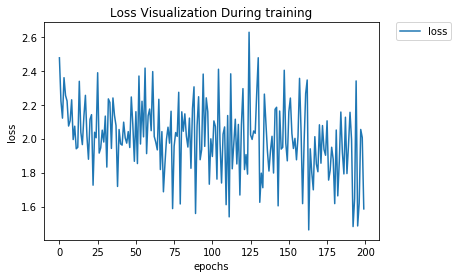

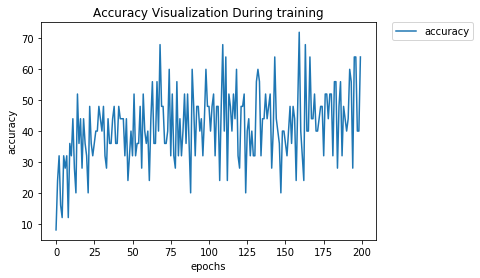

In [30]:

plt.plot(Yloss2, label="loss") 
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.) 
plt.xlabel('epochs')
plt.ylabel('loss') 
plt.title('Loss Visualization During training') 
plt.show() 


plt.plot(Yacc2, label="accuracy") 
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.) 
plt.xlabel('epochs') 
plt.ylabel('accuracy') 
plt.title('Accuracy Visualization During training') 

plt.show()

Expected Label: 2 Correct Label: 2


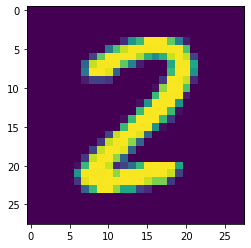

Expected Label: 2 Correct Label: 2


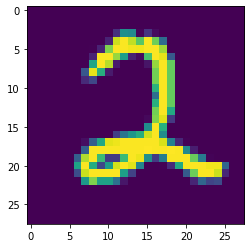

Expected Label: 0 Correct Label: 0


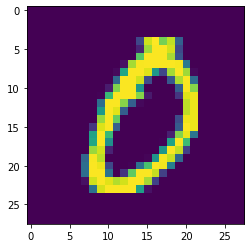

Expected Label: 1 Correct Label: 1


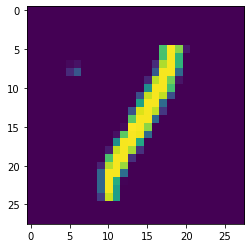

Expected Label: 6 Correct Label: 6


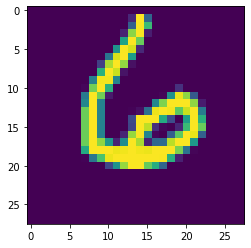

Expected Label: 0 Correct Label: 0


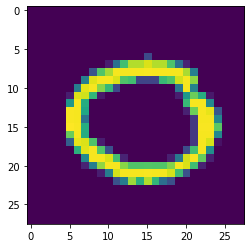

Expected Label: 2 Correct Label: 2


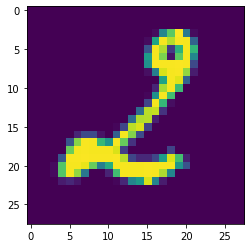

Expected Label: 7 Correct Label: 7


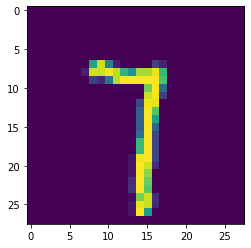

Expected Label: 0 Correct Label: 0


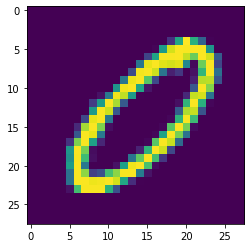

Expected Label: 8 Correct Label: 8


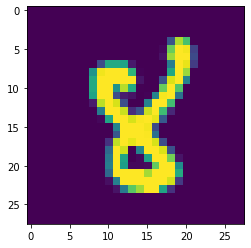

In [31]:
model2.eval()
images, labels = next(iter(testM_loader))
outputs = model2(images)
_, predicted = torch.max(outputs.data, 1)


for i in range(10):
    print(f'Expected Label: {predicted[i]} Correct Label: {labels[i]}')
    showImage(images[i])

In [32]:
Xtrm, Ytrm = readData(mix=True, cData=True)
Xtsm, Ytsm = readData(train=False, mix=True, cData=True)


Image No. 1 of class 0 is read
Image No. 2 of class 0 is read
Image No. 3 of class 0 is read
Image No. 4 of class 0 is read
Image No. 5 of class 0 is read
Image No. 6 of class 0 is read
Image No. 7 of class 0 is read
Image No. 8 of class 0 is read
Image No. 9 of class 0 is read
Image No. 10 of class 0 is read
Image No. 11 of class 0 is read
Image No. 12 of class 0 is read
Image No. 13 of class 0 is read
Image No. 14 of class 0 is read
Image No. 15 of class 0 is read
Image No. 16 of class 0 is read
Image No. 17 of class 0 is read
Image No. 18 of class 0 is read
Image No. 19 of class 0 is read
Image No. 20 of class 0 is read
Image No. 21 of class 0 is read
Image No. 22 of class 0 is read
Image No. 23 of class 0 is read
Image No. 24 of class 0 is read
Image No. 25 of class 0 is read
Image No. 26 of class 0 is read
Image No. 27 of class 0 is read
Image No. 28 of class 0 is read
Image No. 29 of class 0 is read
Image No. 30 of class 0 is read
Image No. 31 of class 0 is read
Image No. 32 of c

Image No. 628 of class 0 is read
Image No. 629 of class 0 is read
Image No. 630 of class 0 is read
Image No. 631 of class 0 is read
Image No. 632 of class 0 is read
Image No. 633 of class 0 is read
Image No. 634 of class 0 is read
Image No. 635 of class 0 is read
Image No. 636 of class 0 is read
Image No. 637 of class 0 is read
Image No. 638 of class 0 is read
Image No. 639 of class 0 is read
Image No. 640 of class 0 is read
Image No. 641 of class 0 is read
Image No. 642 of class 0 is read
Image No. 643 of class 0 is read
Image No. 644 of class 0 is read
Image No. 645 of class 0 is read
Image No. 646 of class 0 is read
Image No. 647 of class 0 is read
Image No. 648 of class 0 is read
Image No. 649 of class 0 is read
Image No. 650 of class 0 is read
Image No. 651 of class 0 is read
Image No. 652 of class 0 is read
Image No. 653 of class 0 is read
Image No. 654 of class 0 is read
Image No. 655 of class 0 is read
Image No. 656 of class 0 is read
Image No. 657 of class 0 is read
Image No. 

Image No. 1055 of class 0 is read
Image No. 1056 of class 0 is read
Image No. 1057 of class 0 is read
Image No. 1058 of class 0 is read
Image No. 1059 of class 0 is read
Image No. 1060 of class 0 is read
Image No. 1061 of class 0 is read
Image No. 1062 of class 0 is read
Image No. 1063 of class 0 is read
Image No. 1064 of class 0 is read
Image No. 1065 of class 0 is read
Image No. 1066 of class 0 is read
Image No. 1067 of class 0 is read
Image No. 1068 of class 0 is read
Image No. 1069 of class 0 is read
Image No. 1070 of class 0 is read
Image No. 1071 of class 0 is read
Image No. 1072 of class 0 is read
Image No. 1073 of class 0 is read
Image No. 1074 of class 0 is read
Image No. 1075 of class 0 is read
Image No. 1076 of class 0 is read
Image No. 1077 of class 0 is read
Image No. 1078 of class 0 is read
Image No. 1079 of class 0 is read
Image No. 1080 of class 0 is read
Image No. 1081 of class 0 is read
Image No. 1082 of class 0 is read
Image No. 1083 of class 0 is read
Image No. 1084

Image No. 1387 of class 0 is read
Image No. 1388 of class 0 is read
Image No. 1389 of class 0 is read
Image No. 1390 of class 0 is read
Image No. 1391 of class 0 is read
Image No. 1392 of class 0 is read
Image No. 1393 of class 0 is read
Image No. 1394 of class 0 is read
Image No. 1395 of class 0 is read
Image No. 1396 of class 0 is read
Image No. 1397 of class 0 is read
Image No. 1398 of class 0 is read
Image No. 1399 of class 0 is read
Image No. 1400 of class 0 is read
Image No. 1401 of class 0 is read
Image No. 1402 of class 0 is read
Image No. 1403 of class 0 is read
Image No. 1404 of class 0 is read
Image No. 1405 of class 0 is read
Image No. 1406 of class 0 is read
Image No. 1407 of class 0 is read
Image No. 1408 of class 0 is read
Image No. 1409 of class 0 is read
Image No. 1410 of class 0 is read
Image No. 1411 of class 0 is read
Image No. 1412 of class 0 is read
Image No. 1413 of class 0 is read
Image No. 1414 of class 0 is read
Image No. 1415 of class 0 is read
Image No. 1416

Image No. 1672 of class 0 is read
Image No. 1673 of class 0 is read
Image No. 1674 of class 0 is read
Image No. 1675 of class 0 is read
Image No. 1676 of class 0 is read
Image No. 1677 of class 0 is read
Image No. 1678 of class 0 is read
Image No. 1679 of class 0 is read
Image No. 1680 of class 0 is read
Image No. 1681 of class 0 is read
Image No. 1682 of class 0 is read
Image No. 1683 of class 0 is read
Image No. 1684 of class 0 is read
Image No. 1685 of class 0 is read
Image No. 1686 of class 0 is read
Image No. 1687 of class 0 is read
Image No. 1688 of class 0 is read
Image No. 1689 of class 0 is read
Image No. 1690 of class 0 is read
Image No. 1691 of class 0 is read
Image No. 1692 of class 0 is read
Image No. 1693 of class 0 is read
Image No. 1694 of class 0 is read
Image No. 1695 of class 0 is read
Image No. 1696 of class 0 is read
Image No. 1697 of class 0 is read
Image No. 1698 of class 0 is read
Image No. 1699 of class 0 is read
Image No. 1700 of class 0 is read
Image No. 1701

Image No. 1926 of class 0 is read
Image No. 1927 of class 0 is read
Image No. 1928 of class 0 is read
Image No. 1929 of class 0 is read
Image No. 1930 of class 0 is read
Image No. 1931 of class 0 is read
Image No. 1932 of class 0 is read
Image No. 1933 of class 0 is read
Image No. 1934 of class 0 is read
Image No. 1935 of class 0 is read
Image No. 1936 of class 0 is read
Image No. 1937 of class 0 is read
Image No. 1938 of class 0 is read
Image No. 1939 of class 0 is read
Image No. 1940 of class 0 is read
Image No. 1941 of class 0 is read
Image No. 1942 of class 0 is read
Image No. 1943 of class 0 is read
Image No. 1944 of class 0 is read
Image No. 1945 of class 0 is read
Image No. 1946 of class 0 is read
Image No. 1947 of class 0 is read
Image No. 1948 of class 0 is read
Image No. 1949 of class 0 is read
Image No. 1950 of class 0 is read
Image No. 1951 of class 0 is read
Image No. 1952 of class 0 is read
Image No. 1953 of class 0 is read
Image No. 1954 of class 0 is read
Image No. 1955

Image No. 2337 of class 0 is read
Image No. 2338 of class 0 is read
Image No. 2339 of class 0 is read
Image No. 2340 of class 0 is read
Image No. 2341 of class 0 is read
Image No. 2342 of class 0 is read
Image No. 2343 of class 0 is read
Image No. 2344 of class 0 is read
Image No. 2345 of class 0 is read
Image No. 2346 of class 0 is read
Image No. 2347 of class 0 is read
Image No. 2348 of class 0 is read
Image No. 2349 of class 0 is read
Image No. 2350 of class 0 is read
Image No. 2351 of class 0 is read
Image No. 2352 of class 0 is read
Image No. 2353 of class 0 is read
Image No. 2354 of class 0 is read
Image No. 2355 of class 0 is read
Image No. 2356 of class 0 is read
Image No. 2357 of class 0 is read
Image No. 2358 of class 0 is read
Image No. 2359 of class 0 is read
Image No. 2360 of class 0 is read
Image No. 2361 of class 0 is read
Image No. 2362 of class 0 is read
Image No. 2363 of class 0 is read
Image No. 2364 of class 0 is read
Image No. 2365 of class 0 is read
Image No. 2366

Image No. 2676 of class 0 is read
Image No. 2677 of class 0 is read
Image No. 2678 of class 0 is read
Image No. 2679 of class 0 is read
Image No. 2680 of class 0 is read
Image No. 2681 of class 0 is read
Image No. 2682 of class 0 is read
Image No. 2683 of class 0 is read
Image No. 2684 of class 0 is read
Image No. 2685 of class 0 is read
Image No. 2686 of class 0 is read
Image No. 2687 of class 0 is read
Image No. 2688 of class 0 is read
Image No. 2689 of class 0 is read
Image No. 2690 of class 0 is read
Image No. 2691 of class 0 is read
Image No. 2692 of class 0 is read
Image No. 2693 of class 0 is read
Image No. 2694 of class 0 is read
Image No. 2695 of class 0 is read
Image No. 2696 of class 0 is read
Image No. 2697 of class 0 is read
Image No. 2698 of class 0 is read
Image No. 2699 of class 0 is read
Image No. 2700 of class 0 is read
Image No. 2701 of class 0 is read
Image No. 2702 of class 0 is read
Image No. 2703 of class 0 is read
Image No. 2704 of class 0 is read
Image No. 2705

Image No. 2976 of class 0 is read
Image No. 2977 of class 0 is read
Image No. 2978 of class 0 is read
Image No. 2979 of class 0 is read
Image No. 2980 of class 0 is read
Image No. 2981 of class 0 is read
Image No. 2982 of class 0 is read
Image No. 2983 of class 0 is read
Image No. 2984 of class 0 is read
Image No. 2985 of class 0 is read
Image No. 2986 of class 0 is read
Image No. 2987 of class 0 is read
Image No. 2988 of class 0 is read
Image No. 2989 of class 0 is read
Image No. 2990 of class 0 is read
Image No. 2991 of class 0 is read
Image No. 2992 of class 0 is read
Image No. 2993 of class 0 is read
Image No. 2994 of class 0 is read
Image No. 2995 of class 0 is read
Image No. 2996 of class 0 is read
Image No. 2997 of class 0 is read
Image No. 2998 of class 0 is read
Image No. 2999 of class 0 is read
Image No. 3000 of class 0 is read
Image No. 3001 of class 0 is read
Image No. 3002 of class 0 is read
Image No. 3003 of class 0 is read
Image No. 3004 of class 0 is read
Image No. 3005

Image No. 3253 of class 0 is read
Image No. 3254 of class 0 is read
Image No. 3255 of class 0 is read
Image No. 3256 of class 0 is read
Image No. 3257 of class 0 is read
Image No. 3258 of class 0 is read
Image No. 3259 of class 0 is read
Image No. 3260 of class 0 is read
Image No. 3261 of class 0 is read
Image No. 3262 of class 0 is read
Image No. 3263 of class 0 is read
Image No. 3264 of class 0 is read
Image No. 3265 of class 0 is read
Image No. 3266 of class 0 is read
Image No. 3267 of class 0 is read
Image No. 3268 of class 0 is read
Image No. 3269 of class 0 is read
Image No. 3270 of class 0 is read
Image No. 3271 of class 0 is read
Image No. 3272 of class 0 is read
Image No. 3273 of class 0 is read
Image No. 3274 of class 0 is read
Image No. 3275 of class 0 is read
Image No. 3276 of class 0 is read
Image No. 3277 of class 0 is read
Image No. 3278 of class 0 is read
Image No. 3279 of class 0 is read
Image No. 3280 of class 0 is read
Image No. 3281 of class 0 is read
Image No. 3282

Image No. 3509 of class 0 is read
Image No. 3510 of class 0 is read
Image No. 3511 of class 0 is read
Image No. 3512 of class 0 is read
Image No. 3513 of class 0 is read
Image No. 3514 of class 0 is read
Image No. 3515 of class 0 is read
Image No. 3516 of class 0 is read
Image No. 3517 of class 0 is read
Image No. 3518 of class 0 is read
Image No. 3519 of class 0 is read
Image No. 3520 of class 0 is read
Image No. 3521 of class 0 is read
Image No. 3522 of class 0 is read
Image No. 3523 of class 0 is read
Image No. 3524 of class 0 is read
Image No. 3525 of class 0 is read
Image No. 3526 of class 0 is read
Image No. 3527 of class 0 is read
Image No. 3528 of class 0 is read
Image No. 3529 of class 0 is read
Image No. 3530 of class 0 is read
Image No. 3531 of class 0 is read
Image No. 3532 of class 0 is read
Image No. 3533 of class 0 is read
Image No. 3534 of class 0 is read
Image No. 3535 of class 0 is read
Image No. 3536 of class 0 is read
Image No. 3537 of class 0 is read
Image No. 3538

Image No. 3855 of class 0 is read
Image No. 3856 of class 0 is read
Image No. 3857 of class 0 is read
Image No. 3858 of class 0 is read
Image No. 3859 of class 0 is read
Image No. 3860 of class 0 is read
Image No. 3861 of class 0 is read
Image No. 3862 of class 0 is read
Image No. 3863 of class 0 is read
Image No. 3864 of class 0 is read
Image No. 3865 of class 0 is read
Image No. 3866 of class 0 is read
Image No. 3867 of class 0 is read
Image No. 3868 of class 0 is read
Image No. 3869 of class 0 is read
Image No. 3870 of class 0 is read
Image No. 3871 of class 0 is read
Image No. 3872 of class 0 is read
Image No. 3873 of class 0 is read
Image No. 3874 of class 0 is read
Image No. 3875 of class 0 is read
Image No. 3876 of class 0 is read
Image No. 3877 of class 0 is read
Image No. 3878 of class 0 is read
Image No. 3879 of class 0 is read
Image No. 3880 of class 0 is read
Image No. 3881 of class 0 is read
Image No. 3882 of class 0 is read
Image No. 3883 of class 0 is read
Image No. 3884

Image No. 4186 of class 0 is read
Image No. 4187 of class 0 is read
Image No. 4188 of class 0 is read
Image No. 4189 of class 0 is read
Image No. 4190 of class 0 is read
Image No. 4191 of class 0 is read
Image No. 4192 of class 0 is read
Image No. 4193 of class 0 is read
Image No. 4194 of class 0 is read
Image No. 4195 of class 0 is read
Image No. 4196 of class 0 is read
Image No. 4197 of class 0 is read
Image No. 4198 of class 0 is read
Image No. 4199 of class 0 is read
Image No. 4200 of class 0 is read
Image No. 4201 of class 0 is read
Image No. 4202 of class 0 is read
Image No. 4203 of class 0 is read
Image No. 4204 of class 0 is read
Image No. 4205 of class 0 is read
Image No. 4206 of class 0 is read
Image No. 4207 of class 0 is read
Image No. 4208 of class 0 is read
Image No. 4209 of class 0 is read
Image No. 4210 of class 0 is read
Image No. 4211 of class 0 is read
Image No. 4212 of class 0 is read
Image No. 4213 of class 0 is read
Image No. 4214 of class 0 is read
Image No. 4215

Image No. 4484 of class 0 is read
Image No. 4485 of class 0 is read
Image No. 4486 of class 0 is read
Image No. 4487 of class 0 is read
Image No. 4488 of class 0 is read
Image No. 4489 of class 0 is read
Image No. 4490 of class 0 is read
Image No. 4491 of class 0 is read
Image No. 4492 of class 0 is read
Image No. 4493 of class 0 is read
Image No. 4494 of class 0 is read
Image No. 4495 of class 0 is read
Image No. 4496 of class 0 is read
Image No. 4497 of class 0 is read
Image No. 4498 of class 0 is read
Image No. 4499 of class 0 is read
Image No. 4500 of class 0 is read
Image No. 4501 of class 0 is read
Image No. 4502 of class 0 is read
Image No. 4503 of class 0 is read
Image No. 4504 of class 0 is read
Image No. 4505 of class 0 is read
Image No. 4506 of class 0 is read
Image No. 4507 of class 0 is read
Image No. 4508 of class 0 is read
Image No. 4509 of class 0 is read
Image No. 4510 of class 0 is read
Image No. 4511 of class 0 is read
Image No. 4512 of class 0 is read
Image No. 4513

Image No. 4761 of class 0 is read
Image No. 4762 of class 0 is read
Image No. 4763 of class 0 is read
Image No. 4764 of class 0 is read
Image No. 4765 of class 0 is read
Image No. 4766 of class 0 is read
Image No. 4767 of class 0 is read
Image No. 4768 of class 0 is read
Image No. 4769 of class 0 is read
Image No. 4770 of class 0 is read
Image No. 4771 of class 0 is read
Image No. 4772 of class 0 is read
Image No. 4773 of class 0 is read
Image No. 4774 of class 0 is read
Image No. 4775 of class 0 is read
Image No. 4776 of class 0 is read
Image No. 4777 of class 0 is read
Image No. 4778 of class 0 is read
Image No. 4779 of class 0 is read
Image No. 4780 of class 0 is read
Image No. 4781 of class 0 is read
Image No. 4782 of class 0 is read
Image No. 4783 of class 0 is read
Image No. 4784 of class 0 is read
Image No. 4785 of class 0 is read
Image No. 4786 of class 0 is read
Image No. 4787 of class 0 is read
Image No. 4788 of class 0 is read
Image No. 4789 of class 0 is read
Image No. 4790

Image No. 5031 of class 0 is read
Image No. 5032 of class 0 is read
Image No. 5033 of class 0 is read
Image No. 5034 of class 0 is read
Image No. 5035 of class 0 is read
Image No. 5036 of class 0 is read
Image No. 5037 of class 0 is read
Image No. 5038 of class 0 is read
Image No. 5039 of class 0 is read
Image No. 5040 of class 0 is read
Image No. 5041 of class 0 is read
Image No. 5042 of class 0 is read
Image No. 5043 of class 0 is read
Image No. 5044 of class 0 is read
Image No. 5045 of class 0 is read
Image No. 5046 of class 0 is read
Image No. 5047 of class 0 is read
Image No. 5048 of class 0 is read
Image No. 5049 of class 0 is read
Image No. 5050 of class 0 is read
Image No. 5051 of class 0 is read
Image No. 5052 of class 0 is read
Image No. 5053 of class 0 is read
Image No. 5054 of class 0 is read
Image No. 5055 of class 0 is read
Image No. 5056 of class 0 is read
Image No. 5057 of class 0 is read
Image No. 5058 of class 0 is read
Image No. 5059 of class 0 is read
Image No. 5060

Image No. 5287 of class 0 is read
Image No. 5288 of class 0 is read
Image No. 5289 of class 0 is read
Image No. 5290 of class 0 is read
Image No. 5291 of class 0 is read
Image No. 5292 of class 0 is read
Image No. 5293 of class 0 is read
Image No. 5294 of class 0 is read
Image No. 5295 of class 0 is read
Image No. 5296 of class 0 is read
Image No. 5297 of class 0 is read
Image No. 5298 of class 0 is read
Image No. 5299 of class 0 is read
Image No. 5300 of class 0 is read
Image No. 5301 of class 0 is read
Image No. 5302 of class 0 is read
Image No. 5303 of class 0 is read
Image No. 5304 of class 0 is read
Image No. 5305 of class 0 is read
Image No. 5306 of class 0 is read
Image No. 5307 of class 0 is read
Image No. 5308 of class 0 is read
Image No. 5309 of class 0 is read
Image No. 5310 of class 0 is read
Image No. 5311 of class 0 is read
Image No. 5312 of class 0 is read
Image No. 5313 of class 0 is read
Image No. 5314 of class 0 is read
Image No. 5315 of class 0 is read
Image No. 5316

Image No. 5536 of class 0 is read
Image No. 5537 of class 0 is read
Image No. 5538 of class 0 is read
Image No. 5539 of class 0 is read
Image No. 5540 of class 0 is read
Image No. 5541 of class 0 is read
Image No. 5542 of class 0 is read
Image No. 5543 of class 0 is read
Image No. 5544 of class 0 is read
Image No. 5545 of class 0 is read
Image No. 5546 of class 0 is read
Image No. 5547 of class 0 is read
Image No. 5548 of class 0 is read
Image No. 5549 of class 0 is read
Image No. 5550 of class 0 is read
Image No. 5551 of class 0 is read
Image No. 5552 of class 0 is read
Image No. 5553 of class 0 is read
Image No. 5554 of class 0 is read
Image No. 5555 of class 0 is read
Image No. 5556 of class 0 is read
Image No. 5557 of class 0 is read
Image No. 5558 of class 0 is read
Image No. 5559 of class 0 is read
Image No. 5560 of class 0 is read
Image No. 5561 of class 0 is read
Image No. 5562 of class 0 is read
Image No. 5563 of class 0 is read
Image No. 5564 of class 0 is read
Image No. 5565

Image No. 5854 of class 0 is read
Image No. 5855 of class 0 is read
Image No. 5856 of class 0 is read
Image No. 5857 of class 0 is read
Image No. 5858 of class 0 is read
Image No. 5859 of class 0 is read
Image No. 5860 of class 0 is read
Image No. 5861 of class 0 is read
Image No. 5862 of class 0 is read
Image No. 5863 of class 0 is read
Image No. 5864 of class 0 is read
Image No. 5865 of class 0 is read
Image No. 5866 of class 0 is read
Image No. 5867 of class 0 is read
Image No. 5868 of class 0 is read
Image No. 5869 of class 0 is read
Image No. 5870 of class 0 is read
Image No. 5871 of class 0 is read
Image No. 5872 of class 0 is read
Image No. 5873 of class 0 is read
Image No. 5874 of class 0 is read
Image No. 5875 of class 0 is read
Image No. 5876 of class 0 is read
Image No. 5877 of class 0 is read
Image No. 5878 of class 0 is read
Image No. 5879 of class 0 is read
Image No. 5880 of class 0 is read
Image No. 5881 of class 0 is read
Image No. 5882 of class 0 is read
Image No. 5883

Image No. Difference 147 is processed
Image No. Difference 148 is processed
Image No. Difference 149 is processed
Image No. Difference 150 is processed
Image No. Difference 151 is processed
Image No. Difference 152 is processed
Image No. Difference 153 is processed
Image No. Difference 154 is processed
Image No. Difference 155 is processed
Image No. Difference 156 is processed
Image No. Difference 157 is processed
Image No. Difference 158 is processed
Image No. Difference 159 is processed
Image No. Difference 160 is processed
Image No. Difference 161 is processed
Image No. Difference 162 is processed
Image No. Difference 163 is processed
Image No. Difference 164 is processed
Image No. Difference 165 is processed
Image No. Difference 166 is processed
Image No. Difference 167 is processed
Image No. Difference 168 is processed
Image No. Difference 169 is processed
Image No. Difference 170 is processed
Image No. Difference 171 is processed
Image No. Difference 172 is processed
Image No. Di

Image No. Difference 385 is processed
Image No. Difference 386 is processed
Image No. Difference 387 is processed
Image No. Difference 388 is processed
Image No. Difference 389 is processed
Image No. Difference 390 is processed
Image No. Difference 391 is processed
Image No. Difference 392 is processed
Image No. Difference 393 is processed
Image No. Difference 394 is processed
Image No. Difference 395 is processed
Image No. Difference 396 is processed
Image No. Difference 397 is processed
Image No. Difference 398 is processed
Image No. Difference 399 is processed
Image No. Difference 400 is processed
Image No. Difference 401 is processed
Image No. Difference 402 is processed
Image No. Difference 403 is processed
Image No. Difference 404 is processed
Image No. Difference 405 is processed
Image No. Difference 406 is processed
Image No. Difference 407 is processed
Image No. Difference 408 is processed
Image No. Difference 409 is processed
Image No. Difference 410 is processed
Image No. Di

Image No. Difference 620 is processed
Image No. Difference 621 is processed
Image No. Difference 622 is processed
Image No. Difference 623 is processed
Image No. Difference 624 is processed
Image No. Difference 625 is processed
Image No. Difference 626 is processed
Image No. Difference 627 is processed
Image No. Difference 628 is processed
Image No. Difference 629 is processed
Image No. Difference 630 is processed
Image No. Difference 631 is processed
Image No. Difference 632 is processed
Image No. Difference 633 is processed
Image No. Difference 634 is processed
Image No. Difference 635 is processed
Image No. Difference 636 is processed
Image No. Difference 637 is processed
Image No. Difference 638 is processed
Image No. Difference 639 is processed
Image No. Difference 640 is processed
Image No. Difference 641 is processed
Image No. Difference 642 is processed
Image No. Difference 643 is processed
Image No. Difference 644 is processed
Image No. Difference 645 is processed
Image No. Di

Image No. Difference 848 is processed
Image No. Difference 849 is processed
Image No. Difference 850 is processed
Image No. Difference 851 is processed
Image No. Difference 852 is processed
Image No. Difference 853 is processed
Image No. Difference 854 is processed
Image No. Difference 855 is processed
Image No. Difference 856 is processed
Image No. Difference 857 is processed
Image No. Difference 858 is processed
Image No. Difference 859 is processed
Image No. Difference 860 is processed
Image No. Difference 861 is processed
Image No. Difference 862 is processed
Image No. Difference 863 is processed
Image No. Difference 864 is processed
Image No. Difference 865 is processed
Image No. Difference 866 is processed
Image No. Difference 867 is processed
Image No. Difference 868 is processed
Image No. Difference 869 is processed
Image No. Difference 870 is processed
Image No. Difference 871 is processed
Image No. Difference 872 is processed
Image No. Difference 873 is processed
Image No. Di

Image No. Difference 1064 is processed
Image No. Difference 1065 is processed
Image No. Difference 1066 is processed
Image No. Difference 1067 is processed
Image No. Difference 1068 is processed
Image No. Difference 1069 is processed
Image No. Difference 1070 is processed
Image No. Difference 1071 is processed
Image No. Difference 1072 is processed
Image No. Difference 1073 is processed
Image No. Difference 1074 is processed
Image No. Difference 1075 is processed
Image No. Difference 1076 is processed
Image No. Difference 1077 is processed
Image No. Difference 1078 is processed
Image No. Difference 1079 is processed
Image No. Difference 1080 is processed
Image No. Difference 1081 is processed
Image No. Difference 1082 is processed
Image No. Difference 1083 is processed
Image No. Difference 1084 is processed
Image No. Difference 1085 is processed
Image No. Difference 1086 is processed
Image No. Difference 1087 is processed
Image No. Difference 1088 is processed
Image No. Difference 1089

Image No. Difference 1292 is processed
Image No. Difference 1293 is processed
Image No. Difference 1294 is processed
Image No. Difference 1295 is processed
Image No. Difference 1296 is processed
Image No. Difference 1297 is processed
Image No. Difference 1298 is processed
Image No. Difference 1299 is processed
Image No. Difference 1300 is processed
Image No. Difference 1301 is processed
Image No. Difference 1302 is processed
Image No. Difference 1303 is processed
Image No. Difference 1304 is processed
Image No. Difference 1305 is processed
Image No. Difference 1306 is processed
Image No. Difference 1307 is processed
Image No. Difference 1308 is processed
Image No. Difference 1309 is processed
Image No. Difference 1310 is processed
Image No. Difference 1311 is processed
Image No. Difference 1312 is processed
Image No. Difference 1313 is processed
Image No. Difference 1314 is processed
Image No. Difference 1315 is processed
Image No. Difference 1316 is processed
Image No. Difference 1317

Image No. Difference 1527 is processed
Image No. Difference 1528 is processed
Image No. Difference 1529 is processed
Image No. Difference 1530 is processed
Image No. Difference 1531 is processed
Image No. Difference 1532 is processed
Image No. Difference 1533 is processed
Image No. Difference 1534 is processed
Image No. Difference 1535 is processed
Image No. Difference 1536 is processed
Image No. Difference 1537 is processed
Image No. Difference 1538 is processed
Image No. Difference 1539 is processed
Image No. Difference 1540 is processed
Image No. Difference 1541 is processed
Image No. Difference 1542 is processed
Image No. Difference 1543 is processed
Image No. Difference 1544 is processed
Image No. Difference 1545 is processed
Image No. Difference 1546 is processed
Image No. Difference 1547 is processed
Image No. Difference 1548 is processed
Image No. Difference 1549 is processed
Image No. Difference 1550 is processed
Image No. Difference 1551 is processed
Image No. Difference 1552

Image No. Difference 1763 is processed
Image No. Difference 1764 is processed
Image No. Difference 1765 is processed
Image No. Difference 1766 is processed
Image No. Difference 1767 is processed
Image No. Difference 1768 is processed
Image No. Difference 1769 is processed
Image No. Difference 1770 is processed
Image No. Difference 1771 is processed
Image No. Difference 1772 is processed
Image No. Difference 1773 is processed
Image No. Difference 1774 is processed
Image No. Difference 1775 is processed
Image No. Difference 1776 is processed
Image No. Difference 1777 is processed
Image No. Difference 1778 is processed
Image No. Difference 1779 is processed
Image No. Difference 1780 is processed
Image No. Difference 1781 is processed
Image No. Difference 1782 is processed
Image No. Difference 1783 is processed
Image No. Difference 1784 is processed
Image No. Difference 1785 is processed
Image No. Difference 1786 is processed
Image No. Difference 1787 is processed
Image No. Difference 1788

Image No. Difference 1974 is processed
Image No. Difference 1975 is processed
Image No. Difference 1976 is processed
Image No. Difference 1977 is processed
Image No. Difference 1978 is processed
Image No. Difference 1979 is processed
Image No. Difference 1980 is processed
Image No. Difference 1981 is processed
Image No. Difference 1982 is processed
Image No. Difference 1983 is processed
Image No. Difference 1984 is processed
Image No. Difference 1985 is processed
Image No. Difference 1986 is processed
Image No. Difference 1987 is processed
Image No. Difference 1988 is processed
Image No. Difference 1989 is processed
Image No. Difference 1990 is processed
Image No. Difference 1991 is processed
Image No. Difference 1992 is processed
Image No. Difference 1993 is processed
Image No. Difference 1994 is processed
Image No. Difference 1995 is processed
Image No. Difference 1996 is processed
Image No. Difference 1997 is processed
Image No. Difference 1998 is processed
Image No. Difference 1999

Image No. Difference 2186 is processed
Image No. Difference 2187 is processed
Image No. Difference 2188 is processed
Image No. Difference 2189 is processed
Image No. Difference 2190 is processed
Image No. Difference 2191 is processed
Image No. Difference 2192 is processed
Image No. Difference 2193 is processed
Image No. Difference 2194 is processed
Image No. Difference 2195 is processed
Image No. Difference 2196 is processed
Image No. Difference 2197 is processed
Image No. Difference 2198 is processed
Image No. Difference 2199 is processed
Image No. Difference 2200 is processed
Image No. Difference 2201 is processed
Image No. Difference 2202 is processed
Image No. Difference 2203 is processed
Image No. Difference 2204 is processed
Image No. Difference 2205 is processed
Image No. Difference 2206 is processed
Image No. Difference 2207 is processed
Image No. Difference 2208 is processed
Image No. Difference 2209 is processed
Image No. Difference 2210 is processed
Image No. Difference 2211

Image No. Difference 2426 is processed
Image No. Difference 2427 is processed
Image No. Difference 2428 is processed
Image No. Difference 2429 is processed
Image No. Difference 2430 is processed
Image No. Difference 2431 is processed
Image No. Difference 2432 is processed
Image No. Difference 2433 is processed
Image No. Difference 2434 is processed
Image No. Difference 2435 is processed
Image No. Difference 2436 is processed
Image No. Difference 2437 is processed
Image No. Difference 2438 is processed
Image No. Difference 2439 is processed
Image No. Difference 2440 is processed
Image No. Difference 2441 is processed
Image No. Difference 2442 is processed
Image No. Difference 2443 is processed
Image No. Difference 2444 is processed
Image No. Difference 2445 is processed
Image No. Difference 2446 is processed
Image No. Difference 2447 is processed
Image No. Difference 2448 is processed
Image No. Difference 2449 is processed
Image No. Difference 2450 is processed
Image No. Difference 2451

Image No. Difference 2643 is processed
Image No. Difference 2644 is processed
Image No. Difference 2645 is processed
Image No. Difference 2646 is processed
Image No. Difference 2647 is processed
Image No. Difference 2648 is processed
Image No. Difference 2649 is processed
Image No. Difference 2650 is processed
Image No. Difference 2651 is processed
Image No. Difference 2652 is processed
Image No. Difference 2653 is processed
Image No. Difference 2654 is processed
Image No. Difference 2655 is processed
Image No. Difference 2656 is processed
Image No. Difference 2657 is processed
Image No. Difference 2658 is processed
Image No. Difference 2659 is processed
Image No. Difference 2660 is processed
Image No. Difference 2661 is processed
Image No. Difference 2662 is processed
Image No. Difference 2663 is processed
Image No. Difference 2664 is processed
Image No. Difference 2665 is processed
Image No. Difference 2666 is processed
Image No. Difference 2667 is processed
Image No. Difference 2668

Image No. Difference 2861 is processed
Image No. Difference 2862 is processed
Image No. Difference 2863 is processed
Image No. Difference 2864 is processed
Image No. Difference 2865 is processed
Image No. Difference 2866 is processed
Image No. Difference 2867 is processed
Image No. Difference 2868 is processed
Image No. Difference 2869 is processed
Image No. Difference 2870 is processed
Image No. Difference 2871 is processed
Image No. Difference 2872 is processed
Image No. Difference 2873 is processed
Image No. Difference 2874 is processed
Image No. Difference 2875 is processed
Image No. Difference 2876 is processed
Image No. Difference 2877 is processed
Image No. Difference 2878 is processed
Image No. Difference 2879 is processed
Image No. Difference 2880 is processed
Image No. Difference 2881 is processed
Image No. Difference 2882 is processed
Image No. Difference 2883 is processed
Image No. Difference 2884 is processed
Image No. Difference 2885 is processed
Image No. Difference 2886

Image No. Difference 3100 is processed
Image No. Difference 3101 is processed
Image No. Difference 3102 is processed
Image No. Difference 3103 is processed
Image No. Difference 3104 is processed
Image No. Difference 3105 is processed
Image No. Difference 3106 is processed
Image No. Difference 3107 is processed
Image No. Difference 3108 is processed
Image No. Difference 3109 is processed
Image No. Difference 3110 is processed
Image No. Difference 3111 is processed
Image No. Difference 3112 is processed
Image No. Difference 3113 is processed
Image No. Difference 3114 is processed
Image No. Difference 3115 is processed
Image No. Difference 3116 is processed
Image No. Difference 3117 is processed
Image No. Difference 3118 is processed
Image No. Difference 3119 is processed
Image No. Difference 3120 is processed
Image No. Difference 3121 is processed
Image No. Difference 3122 is processed
Image No. Difference 3123 is processed
Image No. Difference 3124 is processed
Image No. Difference 3125

Image No. Difference 3331 is processed
Image No. Difference 3332 is processed
Image No. Difference 3333 is processed
Image No. Difference 3334 is processed
Image No. Difference 3335 is processed
Image No. Difference 3336 is processed
Image No. Difference 3337 is processed
Image No. Difference 3338 is processed
Image No. Difference 3339 is processed
Image No. Difference 3340 is processed
Image No. Difference 3341 is processed
Image No. Difference 3342 is processed
Image No. Difference 3343 is processed
Image No. Difference 3344 is processed
Image No. Difference 3345 is processed
Image No. Difference 3346 is processed
Image No. Difference 3347 is processed
Image No. Difference 3348 is processed
Image No. Difference 3349 is processed
Image No. Difference 3350 is processed
Image No. Difference 3351 is processed
Image No. Difference 3352 is processed
Image No. Difference 3353 is processed
Image No. Difference 3354 is processed
Image No. Difference 3355 is processed
Image No. Difference 3356

Image No. Difference 3563 is processed
Image No. Difference 3564 is processed
Image No. Difference 3565 is processed
Image No. Difference 3566 is processed
Image No. Difference 3567 is processed
Image No. Difference 3568 is processed
Image No. Difference 3569 is processed
Image No. Difference 3570 is processed
Image No. Difference 3571 is processed
Image No. Difference 3572 is processed
Image No. Difference 3573 is processed
Image No. Difference 3574 is processed
Image No. Difference 3575 is processed
Image No. Difference 3576 is processed
Image No. Difference 3577 is processed
Image No. Difference 3578 is processed
Image No. Difference 3579 is processed
Image No. Difference 3580 is processed
Image No. Difference 3581 is processed
Image No. Difference 3582 is processed
Image No. Difference 3583 is processed
Image No. Difference 3584 is processed
Image No. Difference 3585 is processed
Image No. Difference 3586 is processed
Image No. Difference 3587 is processed
Image No. Difference 3588

Image No. Difference 3791 is processed
Image No. Difference 3792 is processed
Image No. Difference 3793 is processed
Image No. Difference 3794 is processed
Image No. Difference 3795 is processed
Image No. Difference 3796 is processed
Image No. Difference 3797 is processed
Image No. Difference 3798 is processed
Image No. Difference 3799 is processed
Image No. Difference 3800 is processed
Image No. Difference 3801 is processed
Image No. Difference 3802 is processed
Image No. Difference 3803 is processed
Image No. Difference 3804 is processed
Image No. Difference 3805 is processed
Image No. Difference 3806 is processed
Image No. Difference 3807 is processed
Image No. Difference 3808 is processed
Image No. Difference 3809 is processed
Image No. Difference 3810 is processed
Image No. Difference 3811 is processed
Image No. Difference 3812 is processed
Image No. Difference 3813 is processed
Image No. Difference 3814 is processed
Image No. Difference 3815 is processed
Image No. Difference 3816

Image No. Difference 4018 is processed
Image No. Difference 4019 is processed
Image No. Difference 4020 is processed
Image No. Difference 4021 is processed
Image No. Difference 4022 is processed
Image No. Difference 4023 is processed
Image No. Difference 4024 is processed
Image No. Difference 4025 is processed
Image No. Difference 4026 is processed
Image No. Difference 4027 is processed
Image No. Difference 4028 is processed
Image No. Difference 4029 is processed
Image No. Difference 4030 is processed
Image No. Difference 4031 is processed
Image No. Difference 4032 is processed
Image No. Difference 4033 is processed
Image No. Difference 4034 is processed
Image No. Difference 4035 is processed
Image No. Difference 4036 is processed
Image No. Difference 4037 is processed
Image No. Difference 4038 is processed
Image No. Difference 4039 is processed
Image No. Difference 4040 is processed
Image No. Difference 4041 is processed
Image No. Difference 4042 is processed
Image No. Difference 4043

Image No. Difference 4241 is processed
Image No. Difference 4242 is processed
Image No. Difference 4243 is processed
Image No. Difference 4244 is processed
Image No. Difference 4245 is processed
Image No. Difference 4246 is processed
Image No. Difference 4247 is processed
Image No. Difference 4248 is processed
Image No. Difference 4249 is processed
Image No. Difference 4250 is processed
Image No. Difference 4251 is processed
Image No. Difference 4252 is processed
Image No. Difference 4253 is processed
Image No. Difference 4254 is processed
Image No. Difference 4255 is processed
Image No. Difference 4256 is processed
Image No. Difference 4257 is processed
Image No. Difference 4258 is processed
Image No. Difference 4259 is processed
Image No. Difference 4260 is processed
Image No. Difference 4261 is processed
Image No. Difference 4262 is processed
Image No. Difference 4263 is processed
Image No. Difference 4264 is processed
Image No. Difference 4265 is processed
Image No. Difference 4266

Image No. Difference 4457 is processed
Image No. Difference 4458 is processed
Image No. Difference 4459 is processed
Image No. Difference 4460 is processed
Image No. Difference 4461 is processed
Image No. Difference 4462 is processed
Image No. Difference 4463 is processed
Image No. Difference 4464 is processed
Image No. Difference 4465 is processed
Image No. Difference 4466 is processed
Image No. Difference 4467 is processed
Image No. Difference 4468 is processed
Image No. Difference 4469 is processed
Image No. Difference 4470 is processed
Image No. Difference 4471 is processed
Image No. Difference 4472 is processed
Image No. Difference 4473 is processed
Image No. Difference 4474 is processed
Image No. Difference 4475 is processed
Image No. Difference 4476 is processed
Image No. Difference 4477 is processed
Image No. Difference 4478 is processed
Image No. Difference 4479 is processed
Image No. Difference 4480 is processed
Image No. Difference 4481 is processed
Image No. Difference 4482

Image No. Difference 4675 is processed
Image No. Difference 4676 is processed
Image No. Difference 4677 is processed
Image No. Difference 4678 is processed
Image No. Difference 4679 is processed
Image No. Difference 4680 is processed
Image No. Difference 4681 is processed
Image No. Difference 4682 is processed
Image No. Difference 4683 is processed
Image No. Difference 4684 is processed
Image No. Difference 4685 is processed
Image No. Difference 4686 is processed
Image No. Difference 4687 is processed
Image No. Difference 4688 is processed
Image No. Difference 4689 is processed
Image No. Difference 4690 is processed
Image No. Difference 4691 is processed
Image No. Difference 4692 is processed
Image No. Difference 4693 is processed
Image No. Difference 4694 is processed
Image No. Difference 4695 is processed
Image No. Difference 4696 is processed
Image No. Difference 4697 is processed
Image No. Difference 4698 is processed
Image No. Difference 4699 is processed
Image No. Difference 4700

Image No. Difference 4891 is processed
Image No. Difference 4892 is processed
Image No. Difference 4893 is processed
Image No. Difference 4894 is processed
Image No. Difference 4895 is processed
Image No. Difference 4896 is processed
Image No. Difference 4897 is processed
Image No. Difference 4898 is processed
Image No. Difference 4899 is processed
Image No. Difference 4900 is processed
Image No. Difference 4901 is processed
Image No. Difference 4902 is processed
Image No. Difference 4903 is processed
Image No. Difference 4904 is processed
Image No. Difference 4905 is processed
Image No. Difference 4906 is processed
Image No. Difference 4907 is processed
Image No. Difference 4908 is processed
Image No. Difference 4909 is processed
Image No. Difference 4910 is processed
Image No. Difference 4911 is processed
Image No. Difference 4912 is processed
Image No. Difference 4913 is processed
Image No. Difference 4914 is processed
Image No. Difference 4915 is processed
Image No. Difference 4916

Image No. Difference 5106 is processed
Image No. Difference 5107 is processed
Image No. Difference 5108 is processed
Image No. Difference 5109 is processed
Image No. Difference 5110 is processed
Image No. Difference 5111 is processed
Image No. Difference 5112 is processed
Image No. Difference 5113 is processed
Image No. Difference 5114 is processed
Image No. Difference 5115 is processed
Image No. Difference 5116 is processed
Image No. Difference 5117 is processed
Image No. Difference 5118 is processed
Image No. Difference 5119 is processed
Image No. Difference 5120 is processed
Image No. Difference 5121 is processed
Image No. Difference 5122 is processed
Image No. Difference 5123 is processed
Image No. Difference 5124 is processed
Image No. Difference 5125 is processed
Image No. Difference 5126 is processed
Image No. Difference 5127 is processed
Image No. Difference 5128 is processed
Image No. Difference 5129 is processed
Image No. Difference 5130 is processed
Image No. Difference 5131

Image No. Difference 5319 is processed
Image No. Difference 5320 is processed
Image No. Difference 5321 is processed
Image No. Difference 5322 is processed
Image No. Difference 5323 is processed
Image No. Difference 5324 is processed
Image No. Difference 5325 is processed
Image No. Difference 5326 is processed
Image No. Difference 5327 is processed
Image No. Difference 5328 is processed
Image No. Difference 5329 is processed
Image No. Difference 5330 is processed
Image No. Difference 5331 is processed
Image No. Difference 5332 is processed
Image No. Difference 5333 is processed
Image No. Difference 5334 is processed
Image No. Difference 5335 is processed
Image No. Difference 5336 is processed
Image No. Difference 5337 is processed
Image No. Difference 5338 is processed
Image No. Difference 5339 is processed
Image No. Difference 5340 is processed
Image No. Difference 5341 is processed
Image No. Difference 5342 is processed
Image No. Difference 5343 is processed
Image No. Difference 5344

Image No. Difference 5532 is processed
Image No. Difference 5533 is processed
Image No. Difference 5534 is processed
Image No. Difference 5535 is processed
Image No. Difference 5536 is processed
Image No. Difference 5537 is processed
Image No. Difference 5538 is processed
Image No. Difference 5539 is processed
Image No. Difference 5540 is processed
Image No. Difference 5541 is processed
Image No. Difference 5542 is processed
Image No. Difference 5543 is processed
Image No. Difference 5544 is processed
Image No. Difference 5545 is processed
Image No. Difference 5546 is processed
Image No. Difference 5547 is processed
Image No. Difference 5548 is processed
Image No. Difference 5549 is processed
Image No. Difference 5550 is processed
Image No. Difference 5551 is processed
Image No. Difference 5552 is processed
Image No. Difference 5553 is processed
Image No. Difference 5554 is processed
Image No. Difference 5555 is processed
Image No. Difference 5556 is processed
Image No. Difference 5557

Image No. Difference 5764 is processed
Image No. Difference 5765 is processed
Image No. Difference 5766 is processed
Image No. Difference 5767 is processed
Image No. Difference 5768 is processed
Image No. Difference 5769 is processed
Image No. Difference 5770 is processed
Image No. Difference 5771 is processed
Image No. Difference 5772 is processed
Image No. Difference 5773 is processed
Image No. Difference 5774 is processed
Image No. Difference 5775 is processed
Image No. Difference 5776 is processed
Image No. Difference 5777 is processed
Image No. Difference 5778 is processed
Image No. Difference 5779 is processed
Image No. Difference 5780 is processed
Image No. Difference 5781 is processed
Image No. Difference 5782 is processed
Image No. Difference 5783 is processed
Image No. Difference 5784 is processed
Image No. Difference 5785 is processed
Image No. Difference 5786 is processed
Image No. Difference 5787 is processed
Image No. Difference 5788 is processed
Image No. Difference 5789

Image No. 644 of class 1 is read
Image No. 645 of class 1 is read
Image No. 646 of class 1 is read
Image No. 647 of class 1 is read
Image No. 648 of class 1 is read
Image No. 649 of class 1 is read
Image No. 650 of class 1 is read
Image No. 651 of class 1 is read
Image No. 652 of class 1 is read
Image No. 653 of class 1 is read
Image No. 654 of class 1 is read
Image No. 655 of class 1 is read
Image No. 656 of class 1 is read
Image No. 657 of class 1 is read
Image No. 658 of class 1 is read
Image No. 659 of class 1 is read
Image No. 660 of class 1 is read
Image No. 661 of class 1 is read
Image No. 662 of class 1 is read
Image No. 663 of class 1 is read
Image No. 664 of class 1 is read
Image No. 665 of class 1 is read
Image No. 666 of class 1 is read
Image No. 667 of class 1 is read
Image No. 668 of class 1 is read
Image No. 669 of class 1 is read
Image No. 670 of class 1 is read
Image No. 671 of class 1 is read
Image No. 672 of class 1 is read
Image No. 673 of class 1 is read
Image No. 

Image No. 1096 of class 1 is read
Image No. 1097 of class 1 is read
Image No. 1098 of class 1 is read
Image No. 1099 of class 1 is read
Image No. 1100 of class 1 is read
Image No. 1101 of class 1 is read
Image No. 1102 of class 1 is read
Image No. 1103 of class 1 is read
Image No. 1104 of class 1 is read
Image No. 1105 of class 1 is read
Image No. 1106 of class 1 is read
Image No. 1107 of class 1 is read
Image No. 1108 of class 1 is read
Image No. 1109 of class 1 is read
Image No. 1110 of class 1 is read
Image No. 1111 of class 1 is read
Image No. 1112 of class 1 is read
Image No. 1113 of class 1 is read
Image No. 1114 of class 1 is read
Image No. 1115 of class 1 is read
Image No. 1116 of class 1 is read
Image No. 1117 of class 1 is read
Image No. 1118 of class 1 is read
Image No. 1119 of class 1 is read
Image No. 1120 of class 1 is read
Image No. 1121 of class 1 is read
Image No. 1122 of class 1 is read
Image No. 1123 of class 1 is read
Image No. 1124 of class 1 is read
Image No. 1125

Image No. 1454 of class 1 is read
Image No. 1455 of class 1 is read
Image No. 1456 of class 1 is read
Image No. 1457 of class 1 is read
Image No. 1458 of class 1 is read
Image No. 1459 of class 1 is read
Image No. 1460 of class 1 is read
Image No. 1461 of class 1 is read
Image No. 1462 of class 1 is read
Image No. 1463 of class 1 is read
Image No. 1464 of class 1 is read
Image No. 1465 of class 1 is read
Image No. 1466 of class 1 is read
Image No. 1467 of class 1 is read
Image No. 1468 of class 1 is read
Image No. 1469 of class 1 is read
Image No. 1470 of class 1 is read
Image No. 1471 of class 1 is read
Image No. 1472 of class 1 is read
Image No. 1473 of class 1 is read
Image No. 1474 of class 1 is read
Image No. 1475 of class 1 is read
Image No. 1476 of class 1 is read
Image No. 1477 of class 1 is read
Image No. 1478 of class 1 is read
Image No. 1479 of class 1 is read
Image No. 1480 of class 1 is read
Image No. 1481 of class 1 is read
Image No. 1482 of class 1 is read
Image No. 1483

Image No. 1756 of class 1 is read
Image No. 1757 of class 1 is read
Image No. 1758 of class 1 is read
Image No. 1759 of class 1 is read
Image No. 1760 of class 1 is read
Image No. 1761 of class 1 is read
Image No. 1762 of class 1 is read
Image No. 1763 of class 1 is read
Image No. 1764 of class 1 is read
Image No. 1765 of class 1 is read
Image No. 1766 of class 1 is read
Image No. 1767 of class 1 is read
Image No. 1768 of class 1 is read
Image No. 1769 of class 1 is read
Image No. 1770 of class 1 is read
Image No. 1771 of class 1 is read
Image No. 1772 of class 1 is read
Image No. 1773 of class 1 is read
Image No. 1774 of class 1 is read
Image No. 1775 of class 1 is read
Image No. 1776 of class 1 is read
Image No. 1777 of class 1 is read
Image No. 1778 of class 1 is read
Image No. 1779 of class 1 is read
Image No. 1780 of class 1 is read
Image No. 1781 of class 1 is read
Image No. 1782 of class 1 is read
Image No. 1783 of class 1 is read
Image No. 1784 of class 1 is read
Image No. 1785

Image No. 1999 of class 1 is read
Image No. 2000 of class 1 is read
Image No. 2001 of class 1 is read
Image No. 2002 of class 1 is read
Image No. 2003 of class 1 is read
Image No. 2004 of class 1 is read
Image No. 2005 of class 1 is read
Image No. 2006 of class 1 is read
Image No. 2007 of class 1 is read
Image No. 2008 of class 1 is read
Image No. 2009 of class 1 is read
Image No. 2010 of class 1 is read
Image No. 2011 of class 1 is read
Image No. 2012 of class 1 is read
Image No. 2013 of class 1 is read
Image No. 2014 of class 1 is read
Image No. 2015 of class 1 is read
Image No. 2016 of class 1 is read
Image No. 2017 of class 1 is read
Image No. 2018 of class 1 is read
Image No. 2019 of class 1 is read
Image No. 2020 of class 1 is read
Image No. 2021 of class 1 is read
Image No. 2022 of class 1 is read
Image No. 2023 of class 1 is read
Image No. 2024 of class 1 is read
Image No. 2025 of class 1 is read
Image No. 2026 of class 1 is read
Image No. 2027 of class 1 is read
Image No. 2028

Image No. 2397 of class 1 is read
Image No. 2398 of class 1 is read
Image No. 2399 of class 1 is read
Image No. 2400 of class 1 is read
Image No. 2401 of class 1 is read
Image No. 2402 of class 1 is read
Image No. 2403 of class 1 is read
Image No. 2404 of class 1 is read
Image No. 2405 of class 1 is read
Image No. 2406 of class 1 is read
Image No. 2407 of class 1 is read
Image No. 2408 of class 1 is read
Image No. 2409 of class 1 is read
Image No. 2410 of class 1 is read
Image No. 2411 of class 1 is read
Image No. 2412 of class 1 is read
Image No. 2413 of class 1 is read
Image No. 2414 of class 1 is read
Image No. 2415 of class 1 is read
Image No. 2416 of class 1 is read
Image No. 2417 of class 1 is read
Image No. 2418 of class 1 is read
Image No. 2419 of class 1 is read
Image No. 2420 of class 1 is read
Image No. 2421 of class 1 is read
Image No. 2422 of class 1 is read
Image No. 2423 of class 1 is read
Image No. 2424 of class 1 is read
Image No. 2425 of class 1 is read
Image No. 2426

Image No. 2737 of class 1 is read
Image No. 2738 of class 1 is read
Image No. 2739 of class 1 is read
Image No. 2740 of class 1 is read
Image No. 2741 of class 1 is read
Image No. 2742 of class 1 is read
Image No. 2743 of class 1 is read
Image No. 2744 of class 1 is read
Image No. 2745 of class 1 is read
Image No. 2746 of class 1 is read
Image No. 2747 of class 1 is read
Image No. 2748 of class 1 is read
Image No. 2749 of class 1 is read
Image No. 2750 of class 1 is read
Image No. 2751 of class 1 is read
Image No. 2752 of class 1 is read
Image No. 2753 of class 1 is read
Image No. 2754 of class 1 is read
Image No. 2755 of class 1 is read
Image No. 2756 of class 1 is read
Image No. 2757 of class 1 is read
Image No. 2758 of class 1 is read
Image No. 2759 of class 1 is read
Image No. 2760 of class 1 is read
Image No. 2761 of class 1 is read
Image No. 2762 of class 1 is read
Image No. 2763 of class 1 is read
Image No. 2764 of class 1 is read
Image No. 2765 of class 1 is read
Image No. 2766

Image No. 3042 of class 1 is read
Image No. 3043 of class 1 is read
Image No. 3044 of class 1 is read
Image No. 3045 of class 1 is read
Image No. 3046 of class 1 is read
Image No. 3047 of class 1 is read
Image No. 3048 of class 1 is read
Image No. 3049 of class 1 is read
Image No. 3050 of class 1 is read
Image No. 3051 of class 1 is read
Image No. 3052 of class 1 is read
Image No. 3053 of class 1 is read
Image No. 3054 of class 1 is read
Image No. 3055 of class 1 is read
Image No. 3056 of class 1 is read
Image No. 3057 of class 1 is read
Image No. 3058 of class 1 is read
Image No. 3059 of class 1 is read
Image No. 3060 of class 1 is read
Image No. 3061 of class 1 is read
Image No. 3062 of class 1 is read
Image No. 3063 of class 1 is read
Image No. 3064 of class 1 is read
Image No. 3065 of class 1 is read
Image No. 3066 of class 1 is read
Image No. 3067 of class 1 is read
Image No. 3068 of class 1 is read
Image No. 3069 of class 1 is read
Image No. 3070 of class 1 is read
Image No. 3071

Image No. 3320 of class 1 is read
Image No. 3321 of class 1 is read
Image No. 3322 of class 1 is read
Image No. 3323 of class 1 is read
Image No. 3324 of class 1 is read
Image No. 3325 of class 1 is read
Image No. 3326 of class 1 is read
Image No. 3327 of class 1 is read
Image No. 3328 of class 1 is read
Image No. 3329 of class 1 is read
Image No. 3330 of class 1 is read
Image No. 3331 of class 1 is read
Image No. 3332 of class 1 is read
Image No. 3333 of class 1 is read
Image No. 3334 of class 1 is read
Image No. 3335 of class 1 is read
Image No. 3336 of class 1 is read
Image No. 3337 of class 1 is read
Image No. 3338 of class 1 is read
Image No. 3339 of class 1 is read
Image No. 3340 of class 1 is read
Image No. 3341 of class 1 is read
Image No. 3342 of class 1 is read
Image No. 3343 of class 1 is read
Image No. 3344 of class 1 is read
Image No. 3345 of class 1 is read
Image No. 3346 of class 1 is read
Image No. 3347 of class 1 is read
Image No. 3348 of class 1 is read
Image No. 3349

Image No. 3579 of class 1 is read
Image No. 3580 of class 1 is read
Image No. 3581 of class 1 is read
Image No. 3582 of class 1 is read
Image No. 3583 of class 1 is read
Image No. 3584 of class 1 is read
Image No. 3585 of class 1 is read
Image No. 3586 of class 1 is read
Image No. 3587 of class 1 is read
Image No. 3588 of class 1 is read
Image No. 3589 of class 1 is read
Image No. 3590 of class 1 is read
Image No. 3591 of class 1 is read
Image No. 3592 of class 1 is read
Image No. 3593 of class 1 is read
Image No. 3594 of class 1 is read
Image No. 3595 of class 1 is read
Image No. 3596 of class 1 is read
Image No. 3597 of class 1 is read
Image No. 3598 of class 1 is read
Image No. 3599 of class 1 is read
Image No. 3600 of class 1 is read
Image No. 3601 of class 1 is read
Image No. 3602 of class 1 is read
Image No. 3603 of class 1 is read
Image No. 3604 of class 1 is read
Image No. 3605 of class 1 is read
Image No. 3606 of class 1 is read
Image No. 3607 of class 1 is read
Image No. 3608

Image No. 3829 of class 1 is read
Image No. 3830 of class 1 is read
Image No. 3831 of class 1 is read
Image No. 3832 of class 1 is read
Image No. 3833 of class 1 is read
Image No. 3834 of class 1 is read
Image No. 3835 of class 1 is read
Image No. 3836 of class 1 is read
Image No. 3837 of class 1 is read
Image No. 3838 of class 1 is read
Image No. 3839 of class 1 is read
Image No. 3840 of class 1 is read
Image No. 3841 of class 1 is read
Image No. 3842 of class 1 is read
Image No. 3843 of class 1 is read
Image No. 3844 of class 1 is read
Image No. 3845 of class 1 is read
Image No. 3846 of class 1 is read
Image No. 3847 of class 1 is read
Image No. 3848 of class 1 is read
Image No. 3849 of class 1 is read
Image No. 3850 of class 1 is read
Image No. 3851 of class 1 is read
Image No. 3852 of class 1 is read
Image No. 3853 of class 1 is read
Image No. 3854 of class 1 is read
Image No. 3855 of class 1 is read
Image No. 3856 of class 1 is read
Image No. 3857 of class 1 is read
Image No. 3858

Image No. 4179 of class 1 is read
Image No. 4180 of class 1 is read
Image No. 4181 of class 1 is read
Image No. 4182 of class 1 is read
Image No. 4183 of class 1 is read
Image No. 4184 of class 1 is read
Image No. 4185 of class 1 is read
Image No. 4186 of class 1 is read
Image No. 4187 of class 1 is read
Image No. 4188 of class 1 is read
Image No. 4189 of class 1 is read
Image No. 4190 of class 1 is read
Image No. 4191 of class 1 is read
Image No. 4192 of class 1 is read
Image No. 4193 of class 1 is read
Image No. 4194 of class 1 is read
Image No. 4195 of class 1 is read
Image No. 4196 of class 1 is read
Image No. 4197 of class 1 is read
Image No. 4198 of class 1 is read
Image No. 4199 of class 1 is read
Image No. 4200 of class 1 is read
Image No. 4201 of class 1 is read
Image No. 4202 of class 1 is read
Image No. 4203 of class 1 is read
Image No. 4204 of class 1 is read
Image No. 4205 of class 1 is read
Image No. 4206 of class 1 is read
Image No. 4207 of class 1 is read
Image No. 4208

Image No. 4506 of class 1 is read
Image No. 4507 of class 1 is read
Image No. 4508 of class 1 is read
Image No. 4509 of class 1 is read
Image No. 4510 of class 1 is read
Image No. 4511 of class 1 is read
Image No. 4512 of class 1 is read
Image No. 4513 of class 1 is read
Image No. 4514 of class 1 is read
Image No. 4515 of class 1 is read
Image No. 4516 of class 1 is read
Image No. 4517 of class 1 is read
Image No. 4518 of class 1 is read
Image No. 4519 of class 1 is read
Image No. 4520 of class 1 is read
Image No. 4521 of class 1 is read
Image No. 4522 of class 1 is read
Image No. 4523 of class 1 is read
Image No. 4524 of class 1 is read
Image No. 4525 of class 1 is read
Image No. 4526 of class 1 is read
Image No. 4527 of class 1 is read
Image No. 4528 of class 1 is read
Image No. 4529 of class 1 is read
Image No. 4530 of class 1 is read
Image No. 4531 of class 1 is read
Image No. 4532 of class 1 is read
Image No. 4533 of class 1 is read
Image No. 4534 of class 1 is read
Image No. 4535

Image No. 4815 of class 1 is read
Image No. 4816 of class 1 is read
Image No. 4817 of class 1 is read
Image No. 4818 of class 1 is read
Image No. 4819 of class 1 is read
Image No. 4820 of class 1 is read
Image No. 4821 of class 1 is read
Image No. 4822 of class 1 is read
Image No. 4823 of class 1 is read
Image No. 4824 of class 1 is read
Image No. 4825 of class 1 is read
Image No. 4826 of class 1 is read
Image No. 4827 of class 1 is read
Image No. 4828 of class 1 is read
Image No. 4829 of class 1 is read
Image No. 4830 of class 1 is read
Image No. 4831 of class 1 is read
Image No. 4832 of class 1 is read
Image No. 4833 of class 1 is read
Image No. 4834 of class 1 is read
Image No. 4835 of class 1 is read
Image No. 4836 of class 1 is read
Image No. 4837 of class 1 is read
Image No. 4838 of class 1 is read
Image No. 4839 of class 1 is read
Image No. 4840 of class 1 is read
Image No. 4841 of class 1 is read
Image No. 4842 of class 1 is read
Image No. 4843 of class 1 is read
Image No. 4844

Image No. 5103 of class 1 is read
Image No. 5104 of class 1 is read
Image No. 5105 of class 1 is read
Image No. 5106 of class 1 is read
Image No. 5107 of class 1 is read
Image No. 5108 of class 1 is read
Image No. 5109 of class 1 is read
Image No. 5110 of class 1 is read
Image No. 5111 of class 1 is read
Image No. 5112 of class 1 is read
Image No. 5113 of class 1 is read
Image No. 5114 of class 1 is read
Image No. 5115 of class 1 is read
Image No. 5116 of class 1 is read
Image No. 5117 of class 1 is read
Image No. 5118 of class 1 is read
Image No. 5119 of class 1 is read
Image No. 5120 of class 1 is read
Image No. 5121 of class 1 is read
Image No. 5122 of class 1 is read
Image No. 5123 of class 1 is read
Image No. 5124 of class 1 is read
Image No. 5125 of class 1 is read
Image No. 5126 of class 1 is read
Image No. 5127 of class 1 is read
Image No. 5128 of class 1 is read
Image No. 5129 of class 1 is read
Image No. 5130 of class 1 is read
Image No. 5131 of class 1 is read
Image No. 5132

Image No. 5386 of class 1 is read
Image No. 5387 of class 1 is read
Image No. 5388 of class 1 is read
Image No. 5389 of class 1 is read
Image No. 5390 of class 1 is read
Image No. 5391 of class 1 is read
Image No. 5392 of class 1 is read
Image No. 5393 of class 1 is read
Image No. 5394 of class 1 is read
Image No. 5395 of class 1 is read
Image No. 5396 of class 1 is read
Image No. 5397 of class 1 is read
Image No. 5398 of class 1 is read
Image No. 5399 of class 1 is read
Image No. 5400 of class 1 is read
Image No. 5401 of class 1 is read
Image No. 5402 of class 1 is read
Image No. 5403 of class 1 is read
Image No. 5404 of class 1 is read
Image No. 5405 of class 1 is read
Image No. 5406 of class 1 is read
Image No. 5407 of class 1 is read
Image No. 5408 of class 1 is read
Image No. 5409 of class 1 is read
Image No. 5410 of class 1 is read
Image No. 5411 of class 1 is read
Image No. 5412 of class 1 is read
Image No. 5413 of class 1 is read
Image No. 5414 of class 1 is read
Image No. 5415

Image No. 5659 of class 1 is read
Image No. 5660 of class 1 is read
Image No. 5661 of class 1 is read
Image No. 5662 of class 1 is read
Image No. 5663 of class 1 is read
Image No. 5664 of class 1 is read
Image No. 5665 of class 1 is read
Image No. 5666 of class 1 is read
Image No. 5667 of class 1 is read
Image No. 5668 of class 1 is read
Image No. 5669 of class 1 is read
Image No. 5670 of class 1 is read
Image No. 5671 of class 1 is read
Image No. 5672 of class 1 is read
Image No. 5673 of class 1 is read
Image No. 5674 of class 1 is read
Image No. 5675 of class 1 is read
Image No. 5676 of class 1 is read
Image No. 5677 of class 1 is read
Image No. 5678 of class 1 is read
Image No. 5679 of class 1 is read
Image No. 5680 of class 1 is read
Image No. 5681 of class 1 is read
Image No. 5682 of class 1 is read
Image No. 5683 of class 1 is read
Image No. 5684 of class 1 is read
Image No. 5685 of class 1 is read
Image No. 5686 of class 1 is read
Image No. 5687 of class 1 is read
Image No. 5688

Image No. 5916 of class 1 is read
Image No. 5917 of class 1 is read
Image No. 5918 of class 1 is read
Image No. 5919 of class 1 is read
Image No. 5920 of class 1 is read
Image No. 5921 of class 1 is read
Image No. 5922 of class 1 is read
Image No. 5923 of class 1 is read
Image No. 5924 of class 1 is read
Image No. 5925 of class 1 is read
Image No. 5926 of class 1 is read
Image No. 5927 of class 1 is read
Image No. 5928 of class 1 is read
Image No. 5929 of class 1 is read
Image No. 5930 of class 1 is read
Image No. 5931 of class 1 is read
Image No. 5932 of class 1 is read
Image No. 5933 of class 1 is read
Image No. 5934 of class 1 is read
Image No. 5935 of class 1 is read
Image No. 5936 of class 1 is read
Image No. 5937 of class 1 is read
Image No. 5938 of class 1 is read
Image No. 5939 of class 1 is read
Image No. 5940 of class 1 is read
Image No. 5941 of class 1 is read
Image No. 5942 of class 1 is read
Image No. 5943 of class 1 is read
Image No. 5944 of class 1 is read
Image No. 5945

Image No. 6169 of class 1 is read
Image No. 6170 of class 1 is read
Image No. 6171 of class 1 is read
Image No. 6172 of class 1 is read
Image No. 6173 of class 1 is read
Image No. 6174 of class 1 is read
Image No. 6175 of class 1 is read
Image No. 6176 of class 1 is read
Image No. 6177 of class 1 is read
Image No. 6178 of class 1 is read
Image No. 6179 of class 1 is read
Image No. 6180 of class 1 is read
Image No. 6181 of class 1 is read
Image No. 6182 of class 1 is read
Image No. 6183 of class 1 is read
Image No. 6184 of class 1 is read
Image No. 6185 of class 1 is read
Image No. 6186 of class 1 is read
Image No. 6187 of class 1 is read
Image No. 6188 of class 1 is read
Image No. 6189 of class 1 is read
Image No. 6190 of class 1 is read
Image No. 6191 of class 1 is read
Image No. 6192 of class 1 is read
Image No. 6193 of class 1 is read
Image No. 6194 of class 1 is read
Image No. 6195 of class 1 is read
Image No. 6196 of class 1 is read
Image No. 6197 of class 1 is read
Image No. 6198

Image No. Difference 72 is processed
Image No. Difference 73 is processed
Image No. Difference 74 is processed
Image No. Difference 75 is processed
Image No. Difference 76 is processed
Image No. Difference 77 is processed
Image No. Difference 78 is processed
Image No. Difference 79 is processed
Image No. Difference 80 is processed
Image No. Difference 81 is processed
Image No. Difference 82 is processed
Image No. Difference 83 is processed
Image No. Difference 84 is processed
Image No. Difference 85 is processed
Image No. Difference 86 is processed
Image No. Difference 87 is processed
Image No. Difference 88 is processed
Image No. Difference 89 is processed
Image No. Difference 90 is processed
Image No. Difference 91 is processed
Image No. Difference 92 is processed
Image No. Difference 93 is processed
Image No. Difference 94 is processed
Image No. Difference 95 is processed
Image No. Difference 96 is processed
Image No. Difference 97 is processed
Image No. Difference 98 is processed
I

Image No. Difference 313 is processed
Image No. Difference 314 is processed
Image No. Difference 315 is processed
Image No. Difference 316 is processed
Image No. Difference 317 is processed
Image No. Difference 318 is processed
Image No. Difference 319 is processed
Image No. Difference 320 is processed
Image No. Difference 321 is processed
Image No. Difference 322 is processed
Image No. Difference 323 is processed
Image No. Difference 324 is processed
Image No. Difference 325 is processed
Image No. Difference 326 is processed
Image No. Difference 327 is processed
Image No. Difference 328 is processed
Image No. Difference 329 is processed
Image No. Difference 330 is processed
Image No. Difference 331 is processed
Image No. Difference 332 is processed
Image No. Difference 333 is processed
Image No. Difference 334 is processed
Image No. Difference 335 is processed
Image No. Difference 336 is processed
Image No. Difference 337 is processed
Image No. Difference 338 is processed
Image No. Di

Image No. Difference 549 is processed
Image No. Difference 550 is processed
Image No. Difference 551 is processed
Image No. Difference 552 is processed
Image No. Difference 553 is processed
Image No. Difference 554 is processed
Image No. Difference 555 is processed
Image No. Difference 556 is processed
Image No. Difference 557 is processed
Image No. Difference 558 is processed
Image No. Difference 559 is processed
Image No. Difference 560 is processed
Image No. Difference 561 is processed
Image No. Difference 562 is processed
Image No. Difference 563 is processed
Image No. Difference 564 is processed
Image No. Difference 565 is processed
Image No. Difference 566 is processed
Image No. Difference 567 is processed
Image No. Difference 568 is processed
Image No. Difference 569 is processed
Image No. Difference 570 is processed
Image No. Difference 571 is processed
Image No. Difference 572 is processed
Image No. Difference 573 is processed
Image No. Difference 574 is processed
Image No. Di

Image No. Difference 784 is processed
Image No. Difference 785 is processed
Image No. Difference 786 is processed
Image No. Difference 787 is processed
Image No. Difference 788 is processed
Image No. Difference 789 is processed
Image No. Difference 790 is processed
Image No. Difference 791 is processed
Image No. Difference 792 is processed
Image No. Difference 793 is processed
Image No. Difference 794 is processed
Image No. Difference 795 is processed
Image No. Difference 796 is processed
Image No. Difference 797 is processed
Image No. Difference 798 is processed
Image No. Difference 799 is processed
Image No. Difference 800 is processed
Image No. Difference 801 is processed
Image No. Difference 802 is processed
Image No. Difference 803 is processed
Image No. Difference 804 is processed
Image No. Difference 805 is processed
Image No. Difference 806 is processed
Image No. Difference 807 is processed
Image No. Difference 808 is processed
Image No. Difference 809 is processed
Image No. Di

Image No. Difference 1011 is processed
Image No. Difference 1012 is processed
Image No. Difference 1013 is processed
Image No. Difference 1014 is processed
Image No. Difference 1015 is processed
Image No. Difference 1016 is processed
Image No. Difference 1017 is processed
Image No. Difference 1018 is processed
Image No. Difference 1019 is processed
Image No. Difference 1020 is processed
Image No. Difference 1021 is processed
Image No. Difference 1022 is processed
Image No. Difference 1023 is processed
Image No. Difference 1024 is processed
Image No. Difference 1025 is processed
Image No. Difference 1026 is processed
Image No. Difference 1027 is processed
Image No. Difference 1028 is processed
Image No. Difference 1029 is processed
Image No. Difference 1030 is processed
Image No. Difference 1031 is processed
Image No. Difference 1032 is processed
Image No. Difference 1033 is processed
Image No. Difference 1034 is processed
Image No. Difference 1035 is processed
Image No. Difference 1036

Image No. Difference 1240 is processed
Image No. Difference 1241 is processed
Image No. Difference 1242 is processed
Image No. Difference 1243 is processed
Image No. Difference 1244 is processed
Image No. Difference 1245 is processed
Image No. Difference 1246 is processed
Image No. Difference 1247 is processed
Image No. Difference 1248 is processed
Image No. Difference 1249 is processed
Image No. Difference 1250 is processed
Image No. Difference 1251 is processed
Image No. Difference 1252 is processed
Image No. Difference 1253 is processed
Image No. Difference 1254 is processed
Image No. Difference 1255 is processed
Image No. Difference 1256 is processed
Image No. Difference 1257 is processed
Image No. Difference 1258 is processed
Image No. Difference 1259 is processed
Image No. Difference 1260 is processed
Image No. Difference 1261 is processed
Image No. Difference 1262 is processed
Image No. Difference 1263 is processed
Image No. Difference 1264 is processed
Image No. Difference 1265

Image No. Difference 1461 is processed
Image No. Difference 1462 is processed
Image No. Difference 1463 is processed
Image No. Difference 1464 is processed
Image No. Difference 1465 is processed
Image No. Difference 1466 is processed
Image No. Difference 1467 is processed
Image No. Difference 1468 is processed
Image No. Difference 1469 is processed
Image No. Difference 1470 is processed
Image No. Difference 1471 is processed
Image No. Difference 1472 is processed
Image No. Difference 1473 is processed
Image No. Difference 1474 is processed
Image No. Difference 1475 is processed
Image No. Difference 1476 is processed
Image No. Difference 1477 is processed
Image No. Difference 1478 is processed
Image No. Difference 1479 is processed
Image No. Difference 1480 is processed
Image No. Difference 1481 is processed
Image No. Difference 1482 is processed
Image No. Difference 1483 is processed
Image No. Difference 1484 is processed
Image No. Difference 1485 is processed
Image No. Difference 1486

Image No. Difference 1680 is processed
Image No. Difference 1681 is processed
Image No. Difference 1682 is processed
Image No. Difference 1683 is processed
Image No. Difference 1684 is processed
Image No. Difference 1685 is processed
Image No. Difference 1686 is processed
Image No. Difference 1687 is processed
Image No. Difference 1688 is processed
Image No. Difference 1689 is processed
Image No. Difference 1690 is processed
Image No. Difference 1691 is processed
Image No. Difference 1692 is processed
Image No. Difference 1693 is processed
Image No. Difference 1694 is processed
Image No. Difference 1695 is processed
Image No. Difference 1696 is processed
Image No. Difference 1697 is processed
Image No. Difference 1698 is processed
Image No. Difference 1699 is processed
Image No. Difference 1700 is processed
Image No. Difference 1701 is processed
Image No. Difference 1702 is processed
Image No. Difference 1703 is processed
Image No. Difference 1704 is processed
Image No. Difference 1705

Image No. Difference 1897 is processed
Image No. Difference 1898 is processed
Image No. Difference 1899 is processed
Image No. Difference 1900 is processed
Image No. Difference 1901 is processed
Image No. Difference 1902 is processed
Image No. Difference 1903 is processed
Image No. Difference 1904 is processed
Image No. Difference 1905 is processed
Image No. Difference 1906 is processed
Image No. Difference 1907 is processed
Image No. Difference 1908 is processed
Image No. Difference 1909 is processed
Image No. Difference 1910 is processed
Image No. Difference 1911 is processed
Image No. Difference 1912 is processed
Image No. Difference 1913 is processed
Image No. Difference 1914 is processed
Image No. Difference 1915 is processed
Image No. Difference 1916 is processed
Image No. Difference 1917 is processed
Image No. Difference 1918 is processed
Image No. Difference 1919 is processed
Image No. Difference 1920 is processed
Image No. Difference 1921 is processed
Image No. Difference 1922

Image No. Difference 2116 is processed
Image No. Difference 2117 is processed
Image No. Difference 2118 is processed
Image No. Difference 2119 is processed
Image No. Difference 2120 is processed
Image No. Difference 2121 is processed
Image No. Difference 2122 is processed
Image No. Difference 2123 is processed
Image No. Difference 2124 is processed
Image No. Difference 2125 is processed
Image No. Difference 2126 is processed
Image No. Difference 2127 is processed
Image No. Difference 2128 is processed
Image No. Difference 2129 is processed
Image No. Difference 2130 is processed
Image No. Difference 2131 is processed
Image No. Difference 2132 is processed
Image No. Difference 2133 is processed
Image No. Difference 2134 is processed
Image No. Difference 2135 is processed
Image No. Difference 2136 is processed
Image No. Difference 2137 is processed
Image No. Difference 2138 is processed
Image No. Difference 2139 is processed
Image No. Difference 2140 is processed
Image No. Difference 2141

Image No. Difference 2341 is processed
Image No. Difference 2342 is processed
Image No. Difference 2343 is processed
Image No. Difference 2344 is processed
Image No. Difference 2345 is processed
Image No. Difference 2346 is processed
Image No. Difference 2347 is processed
Image No. Difference 2348 is processed
Image No. Difference 2349 is processed
Image No. Difference 2350 is processed
Image No. Difference 2351 is processed
Image No. Difference 2352 is processed
Image No. Difference 2353 is processed
Image No. Difference 2354 is processed
Image No. Difference 2355 is processed
Image No. Difference 2356 is processed
Image No. Difference 2357 is processed
Image No. Difference 2358 is processed
Image No. Difference 2359 is processed
Image No. Difference 2360 is processed
Image No. Difference 2361 is processed
Image No. Difference 2362 is processed
Image No. Difference 2363 is processed
Image No. Difference 2364 is processed
Image No. Difference 2365 is processed
Image No. Difference 2366

Image No. Difference 2572 is processed
Image No. Difference 2573 is processed
Image No. Difference 2574 is processed
Image No. Difference 2575 is processed
Image No. Difference 2576 is processed
Image No. Difference 2577 is processed
Image No. Difference 2578 is processed
Image No. Difference 2579 is processed
Image No. Difference 2580 is processed
Image No. Difference 2581 is processed
Image No. Difference 2582 is processed
Image No. Difference 2583 is processed
Image No. Difference 2584 is processed
Image No. Difference 2585 is processed
Image No. Difference 2586 is processed
Image No. Difference 2587 is processed
Image No. Difference 2588 is processed
Image No. Difference 2589 is processed
Image No. Difference 2590 is processed
Image No. Difference 2591 is processed
Image No. Difference 2592 is processed
Image No. Difference 2593 is processed
Image No. Difference 2594 is processed
Image No. Difference 2595 is processed
Image No. Difference 2596 is processed
Image No. Difference 2597

Image No. Difference 2805 is processed
Image No. Difference 2806 is processed
Image No. Difference 2807 is processed
Image No. Difference 2808 is processed
Image No. Difference 2809 is processed
Image No. Difference 2810 is processed
Image No. Difference 2811 is processed
Image No. Difference 2812 is processed
Image No. Difference 2813 is processed
Image No. Difference 2814 is processed
Image No. Difference 2815 is processed
Image No. Difference 2816 is processed
Image No. Difference 2817 is processed
Image No. Difference 2818 is processed
Image No. Difference 2819 is processed
Image No. Difference 2820 is processed
Image No. Difference 2821 is processed
Image No. Difference 2822 is processed
Image No. Difference 2823 is processed
Image No. Difference 2824 is processed
Image No. Difference 2825 is processed
Image No. Difference 2826 is processed
Image No. Difference 2827 is processed
Image No. Difference 2828 is processed
Image No. Difference 2829 is processed
Image No. Difference 2830

Image No. Difference 3016 is processed
Image No. Difference 3017 is processed
Image No. Difference 3018 is processed
Image No. Difference 3019 is processed
Image No. Difference 3020 is processed
Image No. Difference 3021 is processed
Image No. Difference 3022 is processed
Image No. Difference 3023 is processed
Image No. Difference 3024 is processed
Image No. Difference 3025 is processed
Image No. Difference 3026 is processed
Image No. Difference 3027 is processed
Image No. Difference 3028 is processed
Image No. Difference 3029 is processed
Image No. Difference 3030 is processed
Image No. Difference 3031 is processed
Image No. Difference 3032 is processed
Image No. Difference 3033 is processed
Image No. Difference 3034 is processed
Image No. Difference 3035 is processed
Image No. Difference 3036 is processed
Image No. Difference 3037 is processed
Image No. Difference 3038 is processed
Image No. Difference 3039 is processed
Image No. Difference 3040 is processed
Image No. Difference 3041

Image No. Difference 3250 is processed
Image No. Difference 3251 is processed
Image No. Difference 3252 is processed
Image No. Difference 3253 is processed
Image No. Difference 3254 is processed
Image No. Difference 3255 is processed
Image No. Difference 3256 is processed
Image No. Difference 3257 is processed
Image No. Difference 3258 is processed
Image No. Difference 3259 is processed
Image No. Difference 3260 is processed
Image No. Difference 3261 is processed
Image No. Difference 3262 is processed
Image No. Difference 3263 is processed
Image No. Difference 3264 is processed
Image No. Difference 3265 is processed
Image No. Difference 3266 is processed
Image No. Difference 3267 is processed
Image No. Difference 3268 is processed
Image No. Difference 3269 is processed
Image No. Difference 3270 is processed
Image No. Difference 3271 is processed
Image No. Difference 3272 is processed
Image No. Difference 3273 is processed
Image No. Difference 3274 is processed
Image No. Difference 3275

Image No. Difference 3462 is processed
Image No. Difference 3463 is processed
Image No. Difference 3464 is processed
Image No. Difference 3465 is processed
Image No. Difference 3466 is processed
Image No. Difference 3467 is processed
Image No. Difference 3468 is processed
Image No. Difference 3469 is processed
Image No. Difference 3470 is processed
Image No. Difference 3471 is processed
Image No. Difference 3472 is processed
Image No. Difference 3473 is processed
Image No. Difference 3474 is processed
Image No. Difference 3475 is processed
Image No. Difference 3476 is processed
Image No. Difference 3477 is processed
Image No. Difference 3478 is processed
Image No. Difference 3479 is processed
Image No. Difference 3480 is processed
Image No. Difference 3481 is processed
Image No. Difference 3482 is processed
Image No. Difference 3483 is processed
Image No. Difference 3484 is processed
Image No. Difference 3485 is processed
Image No. Difference 3486 is processed
Image No. Difference 3487

Image No. Difference 3675 is processed
Image No. Difference 3676 is processed
Image No. Difference 3677 is processed
Image No. Difference 3678 is processed
Image No. Difference 3679 is processed
Image No. Difference 3680 is processed
Image No. Difference 3681 is processed
Image No. Difference 3682 is processed
Image No. Difference 3683 is processed
Image No. Difference 3684 is processed
Image No. Difference 3685 is processed
Image No. Difference 3686 is processed
Image No. Difference 3687 is processed
Image No. Difference 3688 is processed
Image No. Difference 3689 is processed
Image No. Difference 3690 is processed
Image No. Difference 3691 is processed
Image No. Difference 3692 is processed
Image No. Difference 3693 is processed
Image No. Difference 3694 is processed
Image No. Difference 3695 is processed
Image No. Difference 3696 is processed
Image No. Difference 3697 is processed
Image No. Difference 3698 is processed
Image No. Difference 3699 is processed
Image No. Difference 3700

Image No. Difference 3912 is processed
Image No. Difference 3913 is processed
Image No. Difference 3914 is processed
Image No. Difference 3915 is processed
Image No. Difference 3916 is processed
Image No. Difference 3917 is processed
Image No. Difference 3918 is processed
Image No. Difference 3919 is processed
Image No. Difference 3920 is processed
Image No. Difference 3921 is processed
Image No. Difference 3922 is processed
Image No. Difference 3923 is processed
Image No. Difference 3924 is processed
Image No. Difference 3925 is processed
Image No. Difference 3926 is processed
Image No. Difference 3927 is processed
Image No. Difference 3928 is processed
Image No. Difference 3929 is processed
Image No. Difference 3930 is processed
Image No. Difference 3931 is processed
Image No. Difference 3932 is processed
Image No. Difference 3933 is processed
Image No. Difference 3934 is processed
Image No. Difference 3935 is processed
Image No. Difference 3936 is processed
Image No. Difference 3937

Image No. Difference 4152 is processed
Image No. Difference 4153 is processed
Image No. Difference 4154 is processed
Image No. Difference 4155 is processed
Image No. Difference 4156 is processed
Image No. Difference 4157 is processed
Image No. Difference 4158 is processed
Image No. Difference 4159 is processed
Image No. Difference 4160 is processed
Image No. Difference 4161 is processed
Image No. Difference 4162 is processed
Image No. Difference 4163 is processed
Image No. Difference 4164 is processed
Image No. Difference 4165 is processed
Image No. Difference 4166 is processed
Image No. Difference 4167 is processed
Image No. Difference 4168 is processed
Image No. Difference 4169 is processed
Image No. Difference 4170 is processed
Image No. Difference 4171 is processed
Image No. Difference 4172 is processed
Image No. Difference 4173 is processed
Image No. Difference 4174 is processed
Image No. Difference 4175 is processed
Image No. Difference 4176 is processed
Image No. Difference 4177

Image No. Difference 4387 is processed
Image No. Difference 4388 is processed
Image No. Difference 4389 is processed
Image No. Difference 4390 is processed
Image No. Difference 4391 is processed
Image No. Difference 4392 is processed
Image No. Difference 4393 is processed
Image No. Difference 4394 is processed
Image No. Difference 4395 is processed
Image No. Difference 4396 is processed
Image No. Difference 4397 is processed
Image No. Difference 4398 is processed
Image No. Difference 4399 is processed
Image No. Difference 4400 is processed
Image No. Difference 4401 is processed
Image No. Difference 4402 is processed
Image No. Difference 4403 is processed
Image No. Difference 4404 is processed
Image No. Difference 4405 is processed
Image No. Difference 4406 is processed
Image No. Difference 4407 is processed
Image No. Difference 4408 is processed
Image No. Difference 4409 is processed
Image No. Difference 4410 is processed
Image No. Difference 4411 is processed
Image No. Difference 4412

Image No. Difference 4610 is processed
Image No. Difference 4611 is processed
Image No. Difference 4612 is processed
Image No. Difference 4613 is processed
Image No. Difference 4614 is processed
Image No. Difference 4615 is processed
Image No. Difference 4616 is processed
Image No. Difference 4617 is processed
Image No. Difference 4618 is processed
Image No. Difference 4619 is processed
Image No. Difference 4620 is processed
Image No. Difference 4621 is processed
Image No. Difference 4622 is processed
Image No. Difference 4623 is processed
Image No. Difference 4624 is processed
Image No. Difference 4625 is processed
Image No. Difference 4626 is processed
Image No. Difference 4627 is processed
Image No. Difference 4628 is processed
Image No. Difference 4629 is processed
Image No. Difference 4630 is processed
Image No. Difference 4631 is processed
Image No. Difference 4632 is processed
Image No. Difference 4633 is processed
Image No. Difference 4634 is processed
Image No. Difference 4635

Image No. Difference 4838 is processed
Image No. Difference 4839 is processed
Image No. Difference 4840 is processed
Image No. Difference 4841 is processed
Image No. Difference 4842 is processed
Image No. Difference 4843 is processed
Image No. Difference 4844 is processed
Image No. Difference 4845 is processed
Image No. Difference 4846 is processed
Image No. Difference 4847 is processed
Image No. Difference 4848 is processed
Image No. Difference 4849 is processed
Image No. Difference 4850 is processed
Image No. Difference 4851 is processed
Image No. Difference 4852 is processed
Image No. Difference 4853 is processed
Image No. Difference 4854 is processed
Image No. Difference 4855 is processed
Image No. Difference 4856 is processed
Image No. Difference 4857 is processed
Image No. Difference 4858 is processed
Image No. Difference 4859 is processed
Image No. Difference 4860 is processed
Image No. Difference 4861 is processed
Image No. Difference 4862 is processed
Image No. Difference 4863

Image No. Difference 5061 is processed
Image No. Difference 5062 is processed
Image No. Difference 5063 is processed
Image No. Difference 5064 is processed
Image No. Difference 5065 is processed
Image No. Difference 5066 is processed
Image No. Difference 5067 is processed
Image No. Difference 5068 is processed
Image No. Difference 5069 is processed
Image No. Difference 5070 is processed
Image No. Difference 5071 is processed
Image No. Difference 5072 is processed
Image No. Difference 5073 is processed
Image No. Difference 5074 is processed
Image No. Difference 5075 is processed
Image No. Difference 5076 is processed
Image No. Difference 5077 is processed
Image No. Difference 5078 is processed
Image No. Difference 5079 is processed
Image No. Difference 5080 is processed
Image No. Difference 5081 is processed
Image No. Difference 5082 is processed
Image No. Difference 5083 is processed
Image No. Difference 5084 is processed
Image No. Difference 5085 is processed
Image No. Difference 5086

Image No. Difference 5285 is processed
Image No. Difference 5286 is processed
Image No. Difference 5287 is processed
Image No. Difference 5288 is processed
Image No. Difference 5289 is processed
Image No. Difference 5290 is processed
Image No. Difference 5291 is processed
Image No. Difference 5292 is processed
Image No. Difference 5293 is processed
Image No. Difference 5294 is processed
Image No. Difference 5295 is processed
Image No. Difference 5296 is processed
Image No. Difference 5297 is processed
Image No. Difference 5298 is processed
Image No. Difference 5299 is processed
Image No. Difference 5300 is processed
Image No. Difference 5301 is processed
Image No. Difference 5302 is processed
Image No. Difference 5303 is processed
Image No. Difference 5304 is processed
Image No. Difference 5305 is processed
Image No. Difference 5306 is processed
Image No. Difference 5307 is processed
Image No. Difference 5308 is processed
Image No. Difference 5309 is processed
Image No. Difference 5310

Image No. Difference 5508 is processed
Image No. Difference 5509 is processed
Image No. Difference 5510 is processed
Image No. Difference 5511 is processed
Image No. Difference 5512 is processed
Image No. Difference 5513 is processed
Image No. Difference 5514 is processed
Image No. Difference 5515 is processed
Image No. Difference 5516 is processed
Image No. Difference 5517 is processed
Image No. Difference 5518 is processed
Image No. Difference 5519 is processed
Image No. Difference 5520 is processed
Image No. Difference 5521 is processed
Image No. Difference 5522 is processed
Image No. Difference 5523 is processed
Image No. Difference 5524 is processed
Image No. Difference 5525 is processed
Image No. Difference 5526 is processed
Image No. Difference 5527 is processed
Image No. Difference 5528 is processed
Image No. Difference 5529 is processed
Image No. Difference 5530 is processed
Image No. Difference 5531 is processed
Image No. Difference 5532 is processed
Image No. Difference 5533

Image No. Difference 5731 is processed
Image No. Difference 5732 is processed
Image No. Difference 5733 is processed
Image No. Difference 5734 is processed
Image No. Difference 5735 is processed
Image No. Difference 5736 is processed
Image No. Difference 5737 is processed
Image No. Difference 5738 is processed
Image No. Difference 5739 is processed
Image No. Difference 5740 is processed
Image No. Difference 5741 is processed
Image No. Difference 5742 is processed
Image No. Difference 5743 is processed
Image No. Difference 5744 is processed
Image No. Difference 5745 is processed
Image No. Difference 5746 is processed
Image No. Difference 5747 is processed
Image No. Difference 5748 is processed
Image No. Difference 5749 is processed
Image No. Difference 5750 is processed
Image No. Difference 5751 is processed
Image No. Difference 5752 is processed
Image No. Difference 5753 is processed
Image No. Difference 5754 is processed
Image No. Difference 5755 is processed
Image No. Difference 5756

Image No. Difference 5948 is processed
Image No. Difference 5949 is processed
Image No. Difference 5950 is processed
Image No. Difference 5951 is processed
Image No. Difference 5952 is processed
Image No. Difference 5953 is processed
Image No. Difference 5954 is processed
Image No. Difference 5955 is processed
Image No. Difference 5956 is processed
Image No. Difference 5957 is processed
Image No. Difference 5958 is processed
Image No. Difference 5959 is processed
Image No. Difference 5960 is processed
Image No. Difference 5961 is processed
Image No. Difference 5962 is processed
Image No. Difference 5963 is processed
Image No. Difference 5964 is processed
Image No. Difference 5965 is processed
Image No. Difference 5966 is processed
Image No. Difference 5967 is processed
Image No. Difference 5968 is processed
Image No. Difference 5969 is processed
Image No. Difference 5970 is processed
Image No. Difference 5971 is processed
Image No. Difference 5972 is processed
Image No. Difference 5973

Image No. Difference 6169 is processed
Image No. Difference 6170 is processed
Image No. Difference 6171 is processed
Image No. Difference 6172 is processed
Image No. Difference 6173 is processed
Image No. Difference 6174 is processed
Image No. Difference 6175 is processed
Image No. Difference 6176 is processed
Image No. Difference 6177 is processed
Image No. Difference 6178 is processed
Image No. Difference 6179 is processed
Image No. Difference 6180 is processed
Image No. Difference 6181 is processed
Image No. Difference 6182 is processed
Image No. Difference 6183 is processed
Image No. Difference 6184 is processed
Image No. Difference 6185 is processed
Image No. Difference 6186 is processed
Image No. Difference 6187 is processed
Image No. Difference 6188 is processed
Image No. Difference 6189 is processed
Image No. Difference 6190 is processed
Image No. Difference 6191 is processed
Image No. Difference 6192 is processed
Image No. Difference 6193 is processed
Image No. Difference 6194

Image No. 547 is processed
Image No. 549 is processed
Image No. 550 is processed
Image No. 551 is processed
Image No. 553 is processed
Image No. 554 is processed
Image No. 556 is processed
Image No. 557 is processed
Image No. 558 is processed
Image No. 559 is processed
Image No. 561 is processed
Image No. 562 is processed
Image No. 564 is processed
Image No. 565 is processed
Image No. 566 is processed
Image No. 567 is processed
Image No. 569 is processed
Image No. 570 is processed
Image No. 571 is processed
Image No. 575 is processed
Image No. 576 is processed
Image No. 577 is processed
Image No. 578 is processed
Image No. 581 is processed
Image No. 582 is processed
Image No. 583 is processed
Image No. 584 is processed
Image No. 585 is processed
Image No. 586 is processed
Image No. 588 is processed
Image No. 589 is processed
Image No. 591 is processed
Image No. 596 is processed
Image No. 600 is processed
Image No. 601 is processed
Image No. 603 is processed
Image No. 604 is processed
I

Image No. 1367 is processed
Image No. 1368 is processed
Image No. 1371 is processed
Image No. 1372 is processed
Image No. 1374 is processed
Image No. 1375 is processed
Image No. 1377 is processed
Image No. 1379 is processed
Image No. 1380 is processed
Image No. 1381 is processed
Image No. 1382 is processed
Image No. 1383 is processed
Image No. 1385 is processed
Image No. 1387 is processed
Image No. 1388 is processed
Image No. 1389 is processed
Image No. 1392 is processed
Image No. 1394 is processed
Image No. 1396 is processed
Image No. 1397 is processed
Image No. 1399 is processed
Image No. 1400 is processed
Image No. 1402 is processed
Image No. 1406 is processed
Image No. 1408 is processed
Image No. 1409 is processed
Image No. 1410 is processed
Image No. 1411 is processed
Image No. 1414 is processed
Image No. 1416 is processed
Image No. 1417 is processed
Image No. 1418 is processed
Image No. 1420 is processed
Image No. 1422 is processed
Image No. 1424 is processed
Image No. 1425 is pr

Image No. 1944 is processed
Image No. 1945 is processed
Image No. 1946 is processed
Image No. 1947 is processed
Image No. 1949 is processed
Image No. 1953 is processed
Image No. 1954 is processed
Image No. 1955 is processed
Image No. 1960 is processed
Image No. 1961 is processed
Image No. 1962 is processed
Image No. 1965 is processed
Image No. 1970 is processed
Image No. 1971 is processed
Image No. 1977 is processed
Image No. 1979 is processed
Image No. 1981 is processed
Image No. 1983 is processed
Image No. 1984 is processed
Image No. 1985 is processed
Image No. 1986 is processed
Image No. 1987 is processed
Image No. 1988 is processed
Image No. 1989 is processed
Image No. 1990 is processed
Image No. 1991 is processed
Image No. 1992 is processed
Image No. 1993 is processed
Image No. 1994 is processed
Image No. 1995 is processed
Image No. 1996 is processed
Image No. 1997 is processed
Image No. 1998 is processed
Image No. 2001 is processed
Image No. 2002 is processed
Image No. 2004 is pr

Image No. 2476 is processed
Image No. 2478 is processed
Image No. 2479 is processed
Image No. 2481 is processed
Image No. 2482 is processed
Image No. 2484 is processed
Image No. 2485 is processed
Image No. 2486 is processed
Image No. 2489 is processed
Image No. 2492 is processed
Image No. 2493 is processed
Image No. 2496 is processed
Image No. 2497 is processed
Image No. 2500 is processed
Image No. 2501 is processed
Image No. 2502 is processed
Image No. 2503 is processed
Image No. 2504 is processed
Image No. 2505 is processed
Image No. 2506 is processed
Image No. 2507 is processed
Image No. 2510 is processed
Image No. 2513 is processed
Image No. 2514 is processed
Image No. 2516 is processed
Image No. 2517 is processed
Image No. 2519 is processed
Image No. 2520 is processed
Image No. 2522 is processed
Image No. 2523 is processed
Image No. 2525 is processed
Image No. 2528 is processed
Image No. 2531 is processed
Image No. 2532 is processed
Image No. 2533 is processed
Image No. 2534 is pr

Image No. 3254 is processed
Image No. 3255 is processed
Image No. 3257 is processed
Image No. 3258 is processed
Image No. 3261 is processed
Image No. 3264 is processed
Image No. 3266 is processed
Image No. 3267 is processed
Image No. 3269 is processed
Image No. 3270 is processed
Image No. 3271 is processed
Image No. 3272 is processed
Image No. 3273 is processed
Image No. 3274 is processed
Image No. 3275 is processed
Image No. 3276 is processed
Image No. 3279 is processed
Image No. 3280 is processed
Image No. 3281 is processed
Image No. 3282 is processed
Image No. 3284 is processed
Image No. 3286 is processed
Image No. 3290 is processed
Image No. 3292 is processed
Image No. 3293 is processed
Image No. 3294 is processed
Image No. 3299 is processed
Image No. 3300 is processed
Image No. 3301 is processed
Image No. 3303 is processed
Image No. 3304 is processed
Image No. 3306 is processed
Image No. 3309 is processed
Image No. 3311 is processed
Image No. 3312 is processed
Image No. 3313 is pr

Image No. 3910 is processed
Image No. 3913 is processed
Image No. 3914 is processed
Image No. 3916 is processed
Image No. 3917 is processed
Image No. 3918 is processed
Image No. 3919 is processed
Image No. 3920 is processed
Image No. 3921 is processed
Image No. 3922 is processed
Image No. 3923 is processed
Image No. 3924 is processed
Image No. 3925 is processed
Image No. 3926 is processed
Image No. 3927 is processed
Image No. 3928 is processed
Image No. 3930 is processed
Image No. 3931 is processed
Image No. 3932 is processed
Image No. 3933 is processed
Image No. 3935 is processed
Image No. 3936 is processed
Image No. 3937 is processed
Image No. 3938 is processed
Image No. 3939 is processed
Image No. 3942 is processed
Image No. 3943 is processed
Image No. 3944 is processed
Image No. 3947 is processed
Image No. 3949 is processed
Image No. 3950 is processed
Image No. 3952 is processed
Image No. 3953 is processed
Image No. 3954 is processed
Image No. 3955 is processed
Image No. 3957 is pr

Image No. 4461 is processed
Image No. 4464 is processed
Image No. 4465 is processed
Image No. 4466 is processed
Image No. 4468 is processed
Image No. 4469 is processed
Image No. 4472 is processed
Image No. 4473 is processed
Image No. 4474 is processed
Image No. 4476 is processed
Image No. 4477 is processed
Image No. 4480 is processed
Image No. 4481 is processed
Image No. 4482 is processed
Image No. 4483 is processed
Image No. 4484 is processed
Image No. 4488 is processed
Image No. 4489 is processed
Image No. 4490 is processed
Image No. 4493 is processed
Image No. 4497 is processed
Image No. 4498 is processed
Image No. 4501 is processed
Image No. 4503 is processed
Image No. 4504 is processed
Image No. 4505 is processed
Image No. 4506 is processed
Image No. 4508 is processed
Image No. 4509 is processed
Image No. 4510 is processed
Image No. 4511 is processed
Image No. 4513 is processed
Image No. 4515 is processed
Image No. 4516 is processed
Image No. 4517 is processed
Image No. 4519 is pr

Image No. 5016 is processed
Image No. 5017 is processed
Image No. 5018 is processed
Image No. 5020 is processed
Image No. 5021 is processed
Image No. 5022 is processed
Image No. 5023 is processed
Image No. 5024 is processed
Image No. 5027 is processed
Image No. 5028 is processed
Image No. 5029 is processed
Image No. 5031 is processed
Image No. 5033 is processed
Image No. 5034 is processed
Image No. 5035 is processed
Image No. 5036 is processed
Image No. 5037 is processed
Image No. 5038 is processed
Image No. 5040 is processed
Image No. 5041 is processed
Image No. 5042 is processed
Image No. 5044 is processed
Image No. 5045 is processed
Image No. 5046 is processed
Image No. 5049 is processed
Image No. 5050 is processed
Image No. 5053 is processed
Image No. 5054 is processed
Image No. 5055 is processed
Image No. 5056 is processed
Image No. 5057 is processed
Image No. 5060 is processed
Image No. 5061 is processed
Image No. 5063 is processed
Image No. 5064 is processed
Image No. 5067 is pr

Image No. 5524 is processed
Image No. 5525 is processed
Image No. 5526 is processed
Image No. 5527 is processed
Image No. 5528 is processed
Image No. 5529 is processed
Image No. 5530 is processed
Image No. 5531 is processed
Image No. 5533 is processed
Image No. 5535 is processed
Image No. 5536 is processed
Image No. 5537 is processed
Image No. 5538 is processed
Image No. 5540 is processed
Image No. 5541 is processed
Image No. 5542 is processed
Image No. 5543 is processed
Image No. 5544 is processed
Image No. 5546 is processed
Image No. 5547 is processed
Image No. 5548 is processed
Image No. 5549 is processed
Image No. 5551 is processed
Image No. 5554 is processed
Image No. 5556 is processed
Image No. 5558 is processed
Image No. 5559 is processed
Image No. 5560 is processed
Image No. 5561 is processed
Image No. 5562 is processed
Image No. 5565 is processed
Image No. 5567 is processed
Image No. 5569 is processed
Image No. 5570 is processed
Image No. 5571 is processed
Image No. 5572 is pr

Image No. 6006 is processed
Image No. 6008 is processed
Image No. 6010 is processed
Image No. 6011 is processed
Image No. 6012 is processed
Image No. 6013 is processed
Image No. 6016 is processed
Image No. 6017 is processed
Image No. 6018 is processed
Image No. 6019 is processed
Image No. 6020 is processed
Image No. 6021 is processed
Image No. 6022 is processed
Image No. 6025 is processed
Image No. 6026 is processed
Image No. 6028 is processed
Image No. 6029 is processed
Image No. 6031 is processed
Image No. 6032 is processed
Image No. 6033 is processed
Image No. 6034 is processed
Image No. 6036 is processed
Image No. 6037 is processed
Image No. 6038 is processed
Image No. 6039 is processed
Image No. 6040 is processed
Image No. 6041 is processed
Image No. 6042 is processed
Image No. 6043 is processed
Image No. 6045 is processed
Image No. 6046 is processed
Image No. 6047 is processed
Image No. 6048 is processed
Image No. 6050 is processed
Image No. 6053 is processed
Image No. 6054 is pr

Image No. 317 of class 2 is read
Image No. 318 of class 2 is read
Image No. 319 of class 2 is read
Image No. 320 of class 2 is read
Image No. 321 of class 2 is read
Image No. 322 of class 2 is read
Image No. 323 of class 2 is read
Image No. 324 of class 2 is read
Image No. 325 of class 2 is read
Image No. 326 of class 2 is read
Image No. 327 of class 2 is read
Image No. 328 of class 2 is read
Image No. 329 of class 2 is read
Image No. 330 of class 2 is read
Image No. 331 of class 2 is read
Image No. 332 of class 2 is read
Image No. 333 of class 2 is read
Image No. 334 of class 2 is read
Image No. 335 of class 2 is read
Image No. 336 of class 2 is read
Image No. 337 of class 2 is read
Image No. 338 of class 2 is read
Image No. 339 of class 2 is read
Image No. 340 of class 2 is read
Image No. 341 of class 2 is read
Image No. 342 of class 2 is read
Image No. 343 of class 2 is read
Image No. 344 of class 2 is read
Image No. 345 of class 2 is read
Image No. 346 of class 2 is read
Image No. 

Image No. 836 of class 2 is read
Image No. 837 of class 2 is read
Image No. 838 of class 2 is read
Image No. 839 of class 2 is read
Image No. 840 of class 2 is read
Image No. 841 of class 2 is read
Image No. 842 of class 2 is read
Image No. 843 of class 2 is read
Image No. 844 of class 2 is read
Image No. 845 of class 2 is read
Image No. 846 of class 2 is read
Image No. 847 of class 2 is read
Image No. 848 of class 2 is read
Image No. 849 of class 2 is read
Image No. 850 of class 2 is read
Image No. 851 of class 2 is read
Image No. 852 of class 2 is read
Image No. 853 of class 2 is read
Image No. 854 of class 2 is read
Image No. 855 of class 2 is read
Image No. 856 of class 2 is read
Image No. 857 of class 2 is read
Image No. 858 of class 2 is read
Image No. 859 of class 2 is read
Image No. 860 of class 2 is read
Image No. 861 of class 2 is read
Image No. 862 of class 2 is read
Image No. 863 of class 2 is read
Image No. 864 of class 2 is read
Image No. 865 of class 2 is read
Image No. 

Image No. 1259 of class 2 is read
Image No. 1260 of class 2 is read
Image No. 1261 of class 2 is read
Image No. 1262 of class 2 is read
Image No. 1263 of class 2 is read
Image No. 1264 of class 2 is read
Image No. 1265 of class 2 is read
Image No. 1266 of class 2 is read
Image No. 1267 of class 2 is read
Image No. 1268 of class 2 is read
Image No. 1269 of class 2 is read
Image No. 1270 of class 2 is read
Image No. 1271 of class 2 is read
Image No. 1272 of class 2 is read
Image No. 1273 of class 2 is read
Image No. 1274 of class 2 is read
Image No. 1275 of class 2 is read
Image No. 1276 of class 2 is read
Image No. 1277 of class 2 is read
Image No. 1278 of class 2 is read
Image No. 1279 of class 2 is read
Image No. 1280 of class 2 is read
Image No. 1281 of class 2 is read
Image No. 1282 of class 2 is read
Image No. 1283 of class 2 is read
Image No. 1284 of class 2 is read
Image No. 1285 of class 2 is read
Image No. 1286 of class 2 is read
Image No. 1287 of class 2 is read
Image No. 1288

Image No. 1619 of class 2 is read
Image No. 1620 of class 2 is read
Image No. 1621 of class 2 is read
Image No. 1622 of class 2 is read
Image No. 1623 of class 2 is read
Image No. 1624 of class 2 is read
Image No. 1625 of class 2 is read
Image No. 1626 of class 2 is read
Image No. 1627 of class 2 is read
Image No. 1628 of class 2 is read
Image No. 1629 of class 2 is read
Image No. 1630 of class 2 is read
Image No. 1631 of class 2 is read
Image No. 1632 of class 2 is read
Image No. 1633 of class 2 is read
Image No. 1634 of class 2 is read
Image No. 1635 of class 2 is read
Image No. 1636 of class 2 is read
Image No. 1637 of class 2 is read
Image No. 1638 of class 2 is read
Image No. 1639 of class 2 is read
Image No. 1640 of class 2 is read
Image No. 1641 of class 2 is read
Image No. 1642 of class 2 is read
Image No. 1643 of class 2 is read
Image No. 1644 of class 2 is read
Image No. 1645 of class 2 is read
Image No. 1646 of class 2 is read
Image No. 1647 of class 2 is read
Image No. 1648

Image No. 1931 of class 2 is read
Image No. 1932 of class 2 is read
Image No. 1933 of class 2 is read
Image No. 1934 of class 2 is read
Image No. 1935 of class 2 is read
Image No. 1936 of class 2 is read
Image No. 1937 of class 2 is read
Image No. 1938 of class 2 is read
Image No. 1939 of class 2 is read
Image No. 1940 of class 2 is read
Image No. 1941 of class 2 is read
Image No. 1942 of class 2 is read
Image No. 1943 of class 2 is read
Image No. 1944 of class 2 is read
Image No. 1945 of class 2 is read
Image No. 1946 of class 2 is read
Image No. 1947 of class 2 is read
Image No. 1948 of class 2 is read
Image No. 1949 of class 2 is read
Image No. 1950 of class 2 is read
Image No. 1951 of class 2 is read
Image No. 1952 of class 2 is read
Image No. 1953 of class 2 is read
Image No. 1954 of class 2 is read
Image No. 1955 of class 2 is read
Image No. 1956 of class 2 is read
Image No. 1957 of class 2 is read
Image No. 1958 of class 2 is read
Image No. 1959 of class 2 is read
Image No. 1960

Image No. 2174 of class 2 is read
Image No. 2175 of class 2 is read
Image No. 2176 of class 2 is read
Image No. 2177 of class 2 is read
Image No. 2178 of class 2 is read
Image No. 2179 of class 2 is read
Image No. 2180 of class 2 is read
Image No. 2181 of class 2 is read
Image No. 2182 of class 2 is read
Image No. 2183 of class 2 is read
Image No. 2184 of class 2 is read
Image No. 2185 of class 2 is read
Image No. 2186 of class 2 is read
Image No. 2187 of class 2 is read
Image No. 2188 of class 2 is read
Image No. 2189 of class 2 is read
Image No. 2190 of class 2 is read
Image No. 2191 of class 2 is read
Image No. 2192 of class 2 is read
Image No. 2193 of class 2 is read
Image No. 2194 of class 2 is read
Image No. 2195 of class 2 is read
Image No. 2196 of class 2 is read
Image No. 2197 of class 2 is read
Image No. 2198 of class 2 is read
Image No. 2199 of class 2 is read
Image No. 2200 of class 2 is read
Image No. 2201 of class 2 is read
Image No. 2202 of class 2 is read
Image No. 2203

Image No. 2581 of class 2 is read
Image No. 2582 of class 2 is read
Image No. 2583 of class 2 is read
Image No. 2584 of class 2 is read
Image No. 2585 of class 2 is read
Image No. 2586 of class 2 is read
Image No. 2587 of class 2 is read
Image No. 2588 of class 2 is read
Image No. 2589 of class 2 is read
Image No. 2590 of class 2 is read
Image No. 2591 of class 2 is read
Image No. 2592 of class 2 is read
Image No. 2593 of class 2 is read
Image No. 2594 of class 2 is read
Image No. 2595 of class 2 is read
Image No. 2596 of class 2 is read
Image No. 2597 of class 2 is read
Image No. 2598 of class 2 is read
Image No. 2599 of class 2 is read
Image No. 2600 of class 2 is read
Image No. 2601 of class 2 is read
Image No. 2602 of class 2 is read
Image No. 2603 of class 2 is read
Image No. 2604 of class 2 is read
Image No. 2605 of class 2 is read
Image No. 2606 of class 2 is read
Image No. 2607 of class 2 is read
Image No. 2608 of class 2 is read
Image No. 2609 of class 2 is read
Image No. 2610

Image No. 2927 of class 2 is read
Image No. 2928 of class 2 is read
Image No. 2929 of class 2 is read
Image No. 2930 of class 2 is read
Image No. 2931 of class 2 is read
Image No. 2932 of class 2 is read
Image No. 2933 of class 2 is read
Image No. 2934 of class 2 is read
Image No. 2935 of class 2 is read
Image No. 2936 of class 2 is read
Image No. 2937 of class 2 is read
Image No. 2938 of class 2 is read
Image No. 2939 of class 2 is read
Image No. 2940 of class 2 is read
Image No. 2941 of class 2 is read
Image No. 2942 of class 2 is read
Image No. 2943 of class 2 is read
Image No. 2944 of class 2 is read
Image No. 2945 of class 2 is read
Image No. 2946 of class 2 is read
Image No. 2947 of class 2 is read
Image No. 2948 of class 2 is read
Image No. 2949 of class 2 is read
Image No. 2950 of class 2 is read
Image No. 2951 of class 2 is read
Image No. 2952 of class 2 is read
Image No. 2953 of class 2 is read
Image No. 2954 of class 2 is read
Image No. 2955 of class 2 is read
Image No. 2956

Image No. 3242 of class 2 is read
Image No. 3243 of class 2 is read
Image No. 3244 of class 2 is read
Image No. 3245 of class 2 is read
Image No. 3246 of class 2 is read
Image No. 3247 of class 2 is read
Image No. 3248 of class 2 is read
Image No. 3249 of class 2 is read
Image No. 3250 of class 2 is read
Image No. 3251 of class 2 is read
Image No. 3252 of class 2 is read
Image No. 3253 of class 2 is read
Image No. 3254 of class 2 is read
Image No. 3255 of class 2 is read
Image No. 3256 of class 2 is read
Image No. 3257 of class 2 is read
Image No. 3258 of class 2 is read
Image No. 3259 of class 2 is read
Image No. 3260 of class 2 is read
Image No. 3261 of class 2 is read
Image No. 3262 of class 2 is read
Image No. 3263 of class 2 is read
Image No. 3264 of class 2 is read
Image No. 3265 of class 2 is read
Image No. 3266 of class 2 is read
Image No. 3267 of class 2 is read
Image No. 3268 of class 2 is read
Image No. 3269 of class 2 is read
Image No. 3270 of class 2 is read
Image No. 3271

Image No. 3535 of class 2 is read
Image No. 3536 of class 2 is read
Image No. 3537 of class 2 is read
Image No. 3538 of class 2 is read
Image No. 3539 of class 2 is read
Image No. 3540 of class 2 is read
Image No. 3541 of class 2 is read
Image No. 3542 of class 2 is read
Image No. 3543 of class 2 is read
Image No. 3544 of class 2 is read
Image No. 3545 of class 2 is read
Image No. 3546 of class 2 is read
Image No. 3547 of class 2 is read
Image No. 3548 of class 2 is read
Image No. 3549 of class 2 is read
Image No. 3550 of class 2 is read
Image No. 3551 of class 2 is read
Image No. 3552 of class 2 is read
Image No. 3553 of class 2 is read
Image No. 3554 of class 2 is read
Image No. 3555 of class 2 is read
Image No. 3556 of class 2 is read
Image No. 3557 of class 2 is read
Image No. 3558 of class 2 is read
Image No. 3559 of class 2 is read
Image No. 3560 of class 2 is read
Image No. 3561 of class 2 is read
Image No. 3562 of class 2 is read
Image No. 3563 of class 2 is read
Image No. 3564

Image No. 3808 of class 2 is read
Image No. 3809 of class 2 is read
Image No. 3810 of class 2 is read
Image No. 3811 of class 2 is read
Image No. 3812 of class 2 is read
Image No. 3813 of class 2 is read
Image No. 3814 of class 2 is read
Image No. 3815 of class 2 is read
Image No. 3816 of class 2 is read
Image No. 3817 of class 2 is read
Image No. 3818 of class 2 is read
Image No. 3819 of class 2 is read
Image No. 3820 of class 2 is read
Image No. 3821 of class 2 is read
Image No. 3822 of class 2 is read
Image No. 3823 of class 2 is read
Image No. 3824 of class 2 is read
Image No. 3825 of class 2 is read
Image No. 3826 of class 2 is read
Image No. 3827 of class 2 is read
Image No. 3828 of class 2 is read
Image No. 3829 of class 2 is read
Image No. 3830 of class 2 is read
Image No. 3831 of class 2 is read
Image No. 3832 of class 2 is read
Image No. 3833 of class 2 is read
Image No. 3834 of class 2 is read
Image No. 3835 of class 2 is read
Image No. 3836 of class 2 is read
Image No. 3837

Image No. 4064 of class 2 is read
Image No. 4065 of class 2 is read
Image No. 4066 of class 2 is read
Image No. 4067 of class 2 is read
Image No. 4068 of class 2 is read
Image No. 4069 of class 2 is read
Image No. 4070 of class 2 is read
Image No. 4071 of class 2 is read
Image No. 4072 of class 2 is read
Image No. 4073 of class 2 is read
Image No. 4074 of class 2 is read
Image No. 4075 of class 2 is read
Image No. 4076 of class 2 is read
Image No. 4077 of class 2 is read
Image No. 4078 of class 2 is read
Image No. 4079 of class 2 is read
Image No. 4080 of class 2 is read
Image No. 4081 of class 2 is read
Image No. 4082 of class 2 is read
Image No. 4083 of class 2 is read
Image No. 4084 of class 2 is read
Image No. 4085 of class 2 is read
Image No. 4086 of class 2 is read
Image No. 4087 of class 2 is read
Image No. 4088 of class 2 is read
Image No. 4089 of class 2 is read
Image No. 4090 of class 2 is read
Image No. 4091 of class 2 is read
Image No. 4092 of class 2 is read
Image No. 4093

Image No. 4308 of class 2 is read
Image No. 4309 of class 2 is read
Image No. 4310 of class 2 is read
Image No. 4311 of class 2 is read
Image No. 4312 of class 2 is read
Image No. 4313 of class 2 is read
Image No. 4314 of class 2 is read
Image No. 4315 of class 2 is read
Image No. 4316 of class 2 is read
Image No. 4317 of class 2 is read
Image No. 4318 of class 2 is read
Image No. 4319 of class 2 is read
Image No. 4320 of class 2 is read
Image No. 4321 of class 2 is read
Image No. 4322 of class 2 is read
Image No. 4323 of class 2 is read
Image No. 4324 of class 2 is read
Image No. 4325 of class 2 is read
Image No. 4326 of class 2 is read
Image No. 4327 of class 2 is read
Image No. 4328 of class 2 is read
Image No. 4329 of class 2 is read
Image No. 4330 of class 2 is read
Image No. 4331 of class 2 is read
Image No. 4332 of class 2 is read
Image No. 4333 of class 2 is read
Image No. 4334 of class 2 is read
Image No. 4335 of class 2 is read
Image No. 4336 of class 2 is read
Image No. 4337

Image No. 4657 of class 2 is read
Image No. 4658 of class 2 is read
Image No. 4659 of class 2 is read
Image No. 4660 of class 2 is read
Image No. 4661 of class 2 is read
Image No. 4662 of class 2 is read
Image No. 4663 of class 2 is read
Image No. 4664 of class 2 is read
Image No. 4665 of class 2 is read
Image No. 4666 of class 2 is read
Image No. 4667 of class 2 is read
Image No. 4668 of class 2 is read
Image No. 4669 of class 2 is read
Image No. 4670 of class 2 is read
Image No. 4671 of class 2 is read
Image No. 4672 of class 2 is read
Image No. 4673 of class 2 is read
Image No. 4674 of class 2 is read
Image No. 4675 of class 2 is read
Image No. 4676 of class 2 is read
Image No. 4677 of class 2 is read
Image No. 4678 of class 2 is read
Image No. 4679 of class 2 is read
Image No. 4680 of class 2 is read
Image No. 4681 of class 2 is read
Image No. 4682 of class 2 is read
Image No. 4683 of class 2 is read
Image No. 4684 of class 2 is read
Image No. 4685 of class 2 is read
Image No. 4686

Image No. 4990 of class 2 is read
Image No. 4991 of class 2 is read
Image No. 4992 of class 2 is read
Image No. 4993 of class 2 is read
Image No. 4994 of class 2 is read
Image No. 4995 of class 2 is read
Image No. 4996 of class 2 is read
Image No. 4997 of class 2 is read
Image No. 4998 of class 2 is read
Image No. 4999 of class 2 is read
Image No. 5000 of class 2 is read
Image No. 5001 of class 2 is read
Image No. 5002 of class 2 is read
Image No. 5003 of class 2 is read
Image No. 5004 of class 2 is read
Image No. 5005 of class 2 is read
Image No. 5006 of class 2 is read
Image No. 5007 of class 2 is read
Image No. 5008 of class 2 is read
Image No. 5009 of class 2 is read
Image No. 5010 of class 2 is read
Image No. 5011 of class 2 is read
Image No. 5012 of class 2 is read
Image No. 5013 of class 2 is read
Image No. 5014 of class 2 is read
Image No. 5015 of class 2 is read
Image No. 5016 of class 2 is read
Image No. 5017 of class 2 is read
Image No. 5018 of class 2 is read
Image No. 5019

Image No. 5309 of class 2 is read
Image No. 5310 of class 2 is read
Image No. 5311 of class 2 is read
Image No. 5312 of class 2 is read
Image No. 5313 of class 2 is read
Image No. 5314 of class 2 is read
Image No. 5315 of class 2 is read
Image No. 5316 of class 2 is read
Image No. 5317 of class 2 is read
Image No. 5318 of class 2 is read
Image No. 5319 of class 2 is read
Image No. 5320 of class 2 is read
Image No. 5321 of class 2 is read
Image No. 5322 of class 2 is read
Image No. 5323 of class 2 is read
Image No. 5324 of class 2 is read
Image No. 5325 of class 2 is read
Image No. 5326 of class 2 is read
Image No. 5327 of class 2 is read
Image No. 5328 of class 2 is read
Image No. 5329 of class 2 is read
Image No. 5330 of class 2 is read
Image No. 5331 of class 2 is read
Image No. 5332 of class 2 is read
Image No. 5333 of class 2 is read
Image No. 5334 of class 2 is read
Image No. 5335 of class 2 is read
Image No. 5336 of class 2 is read
Image No. 5337 of class 2 is read
Image No. 5338

Image No. 5616 of class 2 is read
Image No. 5617 of class 2 is read
Image No. 5618 of class 2 is read
Image No. 5619 of class 2 is read
Image No. 5620 of class 2 is read
Image No. 5621 of class 2 is read
Image No. 5622 of class 2 is read
Image No. 5623 of class 2 is read
Image No. 5624 of class 2 is read
Image No. 5625 of class 2 is read
Image No. 5626 of class 2 is read
Image No. 5627 of class 2 is read
Image No. 5628 of class 2 is read
Image No. 5629 of class 2 is read
Image No. 5630 of class 2 is read
Image No. 5631 of class 2 is read
Image No. 5632 of class 2 is read
Image No. 5633 of class 2 is read
Image No. 5634 of class 2 is read
Image No. 5635 of class 2 is read
Image No. 5636 of class 2 is read
Image No. 5637 of class 2 is read
Image No. 5638 of class 2 is read
Image No. 5639 of class 2 is read
Image No. 5640 of class 2 is read
Image No. 5641 of class 2 is read
Image No. 5642 of class 2 is read
Image No. 5643 of class 2 is read
Image No. 5644 of class 2 is read
Image No. 5645

Image No. 5913 of class 2 is read
Image No. 5914 of class 2 is read
Image No. 5915 of class 2 is read
Image No. 5916 of class 2 is read
Image No. 5917 of class 2 is read
Image No. 5918 of class 2 is read
Image No. 5919 of class 2 is read
Image No. 5920 of class 2 is read
Image No. 5921 of class 2 is read
Image No. 5922 of class 2 is read
Image No. 5923 of class 2 is read
Image No. 5924 of class 2 is read
Image No. 5925 of class 2 is read
Image No. 5926 of class 2 is read
Image No. 5927 of class 2 is read
Image No. 5928 of class 2 is read
Image No. 5929 of class 2 is read
Image No. 5930 of class 2 is read
Image No. 5931 of class 2 is read
Image No. 5932 of class 2 is read
Image No. 5933 of class 2 is read
Image No. 5934 of class 2 is read
Image No. 5935 of class 2 is read
Image No. 5936 of class 2 is read
Image No. 5937 of class 2 is read
Image No. 5938 of class 2 is read
Image No. 5939 of class 2 is read
Image No. 5940 of class 2 is read
Image No. 5941 of class 2 is read
Image No. 5942

Image No. Difference 184 is processed
Image No. Difference 185 is processed
Image No. Difference 186 is processed
Image No. Difference 187 is processed
Image No. Difference 188 is processed
Image No. Difference 189 is processed
Image No. Difference 190 is processed
Image No. Difference 191 is processed
Image No. Difference 192 is processed
Image No. Difference 193 is processed
Image No. Difference 194 is processed
Image No. Difference 195 is processed
Image No. Difference 196 is processed
Image No. Difference 197 is processed
Image No. Difference 198 is processed
Image No. Difference 199 is processed
Image No. Difference 200 is processed
Image No. Difference 201 is processed
Image No. Difference 202 is processed
Image No. Difference 203 is processed
Image No. Difference 204 is processed
Image No. Difference 205 is processed
Image No. Difference 206 is processed
Image No. Difference 207 is processed
Image No. Difference 208 is processed
Image No. Difference 209 is processed
Image No. Di

Image No. Difference 428 is processed
Image No. Difference 429 is processed
Image No. Difference 430 is processed
Image No. Difference 431 is processed
Image No. Difference 432 is processed
Image No. Difference 433 is processed
Image No. Difference 434 is processed
Image No. Difference 435 is processed
Image No. Difference 436 is processed
Image No. Difference 437 is processed
Image No. Difference 438 is processed
Image No. Difference 439 is processed
Image No. Difference 440 is processed
Image No. Difference 441 is processed
Image No. Difference 442 is processed
Image No. Difference 443 is processed
Image No. Difference 444 is processed
Image No. Difference 445 is processed
Image No. Difference 446 is processed
Image No. Difference 447 is processed
Image No. Difference 448 is processed
Image No. Difference 449 is processed
Image No. Difference 450 is processed
Image No. Difference 451 is processed
Image No. Difference 452 is processed
Image No. Difference 453 is processed
Image No. Di

Image No. Difference 666 is processed
Image No. Difference 667 is processed
Image No. Difference 668 is processed
Image No. Difference 669 is processed
Image No. Difference 670 is processed
Image No. Difference 671 is processed
Image No. Difference 672 is processed
Image No. Difference 673 is processed
Image No. Difference 674 is processed
Image No. Difference 675 is processed
Image No. Difference 676 is processed
Image No. Difference 677 is processed
Image No. Difference 678 is processed
Image No. Difference 679 is processed
Image No. Difference 680 is processed
Image No. Difference 681 is processed
Image No. Difference 682 is processed
Image No. Difference 683 is processed
Image No. Difference 684 is processed
Image No. Difference 685 is processed
Image No. Difference 686 is processed
Image No. Difference 687 is processed
Image No. Difference 688 is processed
Image No. Difference 689 is processed
Image No. Difference 690 is processed
Image No. Difference 691 is processed
Image No. Di

Image No. Difference 903 is processed
Image No. Difference 904 is processed
Image No. Difference 905 is processed
Image No. Difference 906 is processed
Image No. Difference 907 is processed
Image No. Difference 908 is processed
Image No. Difference 909 is processed
Image No. Difference 910 is processed
Image No. Difference 911 is processed
Image No. Difference 912 is processed
Image No. Difference 913 is processed
Image No. Difference 914 is processed
Image No. Difference 915 is processed
Image No. Difference 916 is processed
Image No. Difference 917 is processed
Image No. Difference 918 is processed
Image No. Difference 919 is processed
Image No. Difference 920 is processed
Image No. Difference 921 is processed
Image No. Difference 922 is processed
Image No. Difference 923 is processed
Image No. Difference 924 is processed
Image No. Difference 925 is processed
Image No. Difference 926 is processed
Image No. Difference 927 is processed
Image No. Difference 928 is processed
Image No. Di

Image No. Difference 1133 is processed
Image No. Difference 1134 is processed
Image No. Difference 1135 is processed
Image No. Difference 1136 is processed
Image No. Difference 1137 is processed
Image No. Difference 1138 is processed
Image No. Difference 1139 is processed
Image No. Difference 1140 is processed
Image No. Difference 1141 is processed
Image No. Difference 1142 is processed
Image No. Difference 1143 is processed
Image No. Difference 1144 is processed
Image No. Difference 1145 is processed
Image No. Difference 1146 is processed
Image No. Difference 1147 is processed
Image No. Difference 1148 is processed
Image No. Difference 1149 is processed
Image No. Difference 1150 is processed
Image No. Difference 1151 is processed
Image No. Difference 1152 is processed
Image No. Difference 1153 is processed
Image No. Difference 1154 is processed
Image No. Difference 1155 is processed
Image No. Difference 1156 is processed
Image No. Difference 1157 is processed
Image No. Difference 1158

Image No. Difference 1363 is processed
Image No. Difference 1364 is processed
Image No. Difference 1365 is processed
Image No. Difference 1366 is processed
Image No. Difference 1367 is processed
Image No. Difference 1368 is processed
Image No. Difference 1369 is processed
Image No. Difference 1370 is processed
Image No. Difference 1371 is processed
Image No. Difference 1372 is processed
Image No. Difference 1373 is processed
Image No. Difference 1374 is processed
Image No. Difference 1375 is processed
Image No. Difference 1376 is processed
Image No. Difference 1377 is processed
Image No. Difference 1378 is processed
Image No. Difference 1379 is processed
Image No. Difference 1380 is processed
Image No. Difference 1381 is processed
Image No. Difference 1382 is processed
Image No. Difference 1383 is processed
Image No. Difference 1384 is processed
Image No. Difference 1385 is processed
Image No. Difference 1386 is processed
Image No. Difference 1387 is processed
Image No. Difference 1388

Image No. Difference 1600 is processed
Image No. Difference 1601 is processed
Image No. Difference 1602 is processed
Image No. Difference 1603 is processed
Image No. Difference 1604 is processed
Image No. Difference 1605 is processed
Image No. Difference 1606 is processed
Image No. Difference 1607 is processed
Image No. Difference 1608 is processed
Image No. Difference 1609 is processed
Image No. Difference 1610 is processed
Image No. Difference 1611 is processed
Image No. Difference 1612 is processed
Image No. Difference 1613 is processed
Image No. Difference 1614 is processed
Image No. Difference 1615 is processed
Image No. Difference 1616 is processed
Image No. Difference 1617 is processed
Image No. Difference 1618 is processed
Image No. Difference 1619 is processed
Image No. Difference 1620 is processed
Image No. Difference 1621 is processed
Image No. Difference 1622 is processed
Image No. Difference 1623 is processed
Image No. Difference 1624 is processed
Image No. Difference 1625

Image No. Difference 1836 is processed
Image No. Difference 1837 is processed
Image No. Difference 1838 is processed
Image No. Difference 1839 is processed
Image No. Difference 1840 is processed
Image No. Difference 1841 is processed
Image No. Difference 1842 is processed
Image No. Difference 1843 is processed
Image No. Difference 1844 is processed
Image No. Difference 1845 is processed
Image No. Difference 1846 is processed
Image No. Difference 1847 is processed
Image No. Difference 1848 is processed
Image No. Difference 1849 is processed
Image No. Difference 1850 is processed
Image No. Difference 1851 is processed
Image No. Difference 1852 is processed
Image No. Difference 1853 is processed
Image No. Difference 1854 is processed
Image No. Difference 1855 is processed
Image No. Difference 1856 is processed
Image No. Difference 1857 is processed
Image No. Difference 1858 is processed
Image No. Difference 1859 is processed
Image No. Difference 1860 is processed
Image No. Difference 1861

Image No. Difference 2071 is processed
Image No. Difference 2072 is processed
Image No. Difference 2073 is processed
Image No. Difference 2074 is processed
Image No. Difference 2075 is processed
Image No. Difference 2076 is processed
Image No. Difference 2077 is processed
Image No. Difference 2078 is processed
Image No. Difference 2079 is processed
Image No. Difference 2080 is processed
Image No. Difference 2081 is processed
Image No. Difference 2082 is processed
Image No. Difference 2083 is processed
Image No. Difference 2084 is processed
Image No. Difference 2085 is processed
Image No. Difference 2086 is processed
Image No. Difference 2087 is processed
Image No. Difference 2088 is processed
Image No. Difference 2089 is processed
Image No. Difference 2090 is processed
Image No. Difference 2091 is processed
Image No. Difference 2092 is processed
Image No. Difference 2093 is processed
Image No. Difference 2094 is processed
Image No. Difference 2095 is processed
Image No. Difference 2096

Image No. Difference 2286 is processed
Image No. Difference 2287 is processed
Image No. Difference 2288 is processed
Image No. Difference 2289 is processed
Image No. Difference 2290 is processed
Image No. Difference 2291 is processed
Image No. Difference 2292 is processed
Image No. Difference 2293 is processed
Image No. Difference 2294 is processed
Image No. Difference 2295 is processed
Image No. Difference 2296 is processed
Image No. Difference 2297 is processed
Image No. Difference 2298 is processed
Image No. Difference 2299 is processed
Image No. Difference 2300 is processed
Image No. Difference 2301 is processed
Image No. Difference 2302 is processed
Image No. Difference 2303 is processed
Image No. Difference 2304 is processed
Image No. Difference 2305 is processed
Image No. Difference 2306 is processed
Image No. Difference 2307 is processed
Image No. Difference 2308 is processed
Image No. Difference 2309 is processed
Image No. Difference 2310 is processed
Image No. Difference 2311

Image No. Difference 2502 is processed
Image No. Difference 2503 is processed
Image No. Difference 2504 is processed
Image No. Difference 2505 is processed
Image No. Difference 2506 is processed
Image No. Difference 2507 is processed
Image No. Difference 2508 is processed
Image No. Difference 2509 is processed
Image No. Difference 2510 is processed
Image No. Difference 2511 is processed
Image No. Difference 2512 is processed
Image No. Difference 2513 is processed
Image No. Difference 2514 is processed
Image No. Difference 2515 is processed
Image No. Difference 2516 is processed
Image No. Difference 2517 is processed
Image No. Difference 2518 is processed
Image No. Difference 2519 is processed
Image No. Difference 2520 is processed
Image No. Difference 2521 is processed
Image No. Difference 2522 is processed
Image No. Difference 2523 is processed
Image No. Difference 2524 is processed
Image No. Difference 2525 is processed
Image No. Difference 2526 is processed
Image No. Difference 2527

Image No. Difference 2720 is processed
Image No. Difference 2721 is processed
Image No. Difference 2722 is processed
Image No. Difference 2723 is processed
Image No. Difference 2724 is processed
Image No. Difference 2725 is processed
Image No. Difference 2726 is processed
Image No. Difference 2727 is processed
Image No. Difference 2728 is processed
Image No. Difference 2729 is processed
Image No. Difference 2730 is processed
Image No. Difference 2731 is processed
Image No. Difference 2732 is processed
Image No. Difference 2733 is processed
Image No. Difference 2734 is processed
Image No. Difference 2735 is processed
Image No. Difference 2736 is processed
Image No. Difference 2737 is processed
Image No. Difference 2738 is processed
Image No. Difference 2739 is processed
Image No. Difference 2740 is processed
Image No. Difference 2741 is processed
Image No. Difference 2742 is processed
Image No. Difference 2743 is processed
Image No. Difference 2744 is processed
Image No. Difference 2745

Image No. Difference 2944 is processed
Image No. Difference 2945 is processed
Image No. Difference 2946 is processed
Image No. Difference 2947 is processed
Image No. Difference 2948 is processed
Image No. Difference 2949 is processed
Image No. Difference 2950 is processed
Image No. Difference 2951 is processed
Image No. Difference 2952 is processed
Image No. Difference 2953 is processed
Image No. Difference 2954 is processed
Image No. Difference 2955 is processed
Image No. Difference 2956 is processed
Image No. Difference 2957 is processed
Image No. Difference 2958 is processed
Image No. Difference 2959 is processed
Image No. Difference 2960 is processed
Image No. Difference 2961 is processed
Image No. Difference 2962 is processed
Image No. Difference 2963 is processed
Image No. Difference 2964 is processed
Image No. Difference 2965 is processed
Image No. Difference 2966 is processed
Image No. Difference 2967 is processed
Image No. Difference 2968 is processed
Image No. Difference 2969

Image No. Difference 3164 is processed
Image No. Difference 3165 is processed
Image No. Difference 3166 is processed
Image No. Difference 3167 is processed
Image No. Difference 3168 is processed
Image No. Difference 3169 is processed
Image No. Difference 3170 is processed
Image No. Difference 3171 is processed
Image No. Difference 3172 is processed
Image No. Difference 3173 is processed
Image No. Difference 3174 is processed
Image No. Difference 3175 is processed
Image No. Difference 3176 is processed
Image No. Difference 3177 is processed
Image No. Difference 3178 is processed
Image No. Difference 3179 is processed
Image No. Difference 3180 is processed
Image No. Difference 3181 is processed
Image No. Difference 3182 is processed
Image No. Difference 3183 is processed
Image No. Difference 3184 is processed
Image No. Difference 3185 is processed
Image No. Difference 3186 is processed
Image No. Difference 3187 is processed
Image No. Difference 3188 is processed
Image No. Difference 3189

Image No. Difference 3389 is processed
Image No. Difference 3390 is processed
Image No. Difference 3391 is processed
Image No. Difference 3392 is processed
Image No. Difference 3393 is processed
Image No. Difference 3394 is processed
Image No. Difference 3395 is processed
Image No. Difference 3396 is processed
Image No. Difference 3397 is processed
Image No. Difference 3398 is processed
Image No. Difference 3399 is processed
Image No. Difference 3400 is processed
Image No. Difference 3401 is processed
Image No. Difference 3402 is processed
Image No. Difference 3403 is processed
Image No. Difference 3404 is processed
Image No. Difference 3405 is processed
Image No. Difference 3406 is processed
Image No. Difference 3407 is processed
Image No. Difference 3408 is processed
Image No. Difference 3409 is processed
Image No. Difference 3410 is processed
Image No. Difference 3411 is processed
Image No. Difference 3412 is processed
Image No. Difference 3413 is processed
Image No. Difference 3414

Image No. Difference 3601 is processed
Image No. Difference 3602 is processed
Image No. Difference 3603 is processed
Image No. Difference 3604 is processed
Image No. Difference 3605 is processed
Image No. Difference 3606 is processed
Image No. Difference 3607 is processed
Image No. Difference 3608 is processed
Image No. Difference 3609 is processed
Image No. Difference 3610 is processed
Image No. Difference 3611 is processed
Image No. Difference 3612 is processed
Image No. Difference 3613 is processed
Image No. Difference 3614 is processed
Image No. Difference 3615 is processed
Image No. Difference 3616 is processed
Image No. Difference 3617 is processed
Image No. Difference 3618 is processed
Image No. Difference 3619 is processed
Image No. Difference 3620 is processed
Image No. Difference 3621 is processed
Image No. Difference 3622 is processed
Image No. Difference 3623 is processed
Image No. Difference 3624 is processed
Image No. Difference 3625 is processed
Image No. Difference 3626

Image No. Difference 3840 is processed
Image No. Difference 3841 is processed
Image No. Difference 3842 is processed
Image No. Difference 3843 is processed
Image No. Difference 3844 is processed
Image No. Difference 3845 is processed
Image No. Difference 3846 is processed
Image No. Difference 3847 is processed
Image No. Difference 3848 is processed
Image No. Difference 3849 is processed
Image No. Difference 3850 is processed
Image No. Difference 3851 is processed
Image No. Difference 3852 is processed
Image No. Difference 3853 is processed
Image No. Difference 3854 is processed
Image No. Difference 3855 is processed
Image No. Difference 3856 is processed
Image No. Difference 3857 is processed
Image No. Difference 3858 is processed
Image No. Difference 3859 is processed
Image No. Difference 3860 is processed
Image No. Difference 3861 is processed
Image No. Difference 3862 is processed
Image No. Difference 3863 is processed
Image No. Difference 3864 is processed
Image No. Difference 3865

Image No. Difference 4077 is processed
Image No. Difference 4078 is processed
Image No. Difference 4079 is processed
Image No. Difference 4080 is processed
Image No. Difference 4081 is processed
Image No. Difference 4082 is processed
Image No. Difference 4083 is processed
Image No. Difference 4084 is processed
Image No. Difference 4085 is processed
Image No. Difference 4086 is processed
Image No. Difference 4087 is processed
Image No. Difference 4088 is processed
Image No. Difference 4089 is processed
Image No. Difference 4090 is processed
Image No. Difference 4091 is processed
Image No. Difference 4092 is processed
Image No. Difference 4093 is processed
Image No. Difference 4094 is processed
Image No. Difference 4095 is processed
Image No. Difference 4096 is processed
Image No. Difference 4097 is processed
Image No. Difference 4098 is processed
Image No. Difference 4099 is processed
Image No. Difference 4100 is processed
Image No. Difference 4101 is processed
Image No. Difference 4102

Image No. Difference 4312 is processed
Image No. Difference 4313 is processed
Image No. Difference 4314 is processed
Image No. Difference 4315 is processed
Image No. Difference 4316 is processed
Image No. Difference 4317 is processed
Image No. Difference 4318 is processed
Image No. Difference 4319 is processed
Image No. Difference 4320 is processed
Image No. Difference 4321 is processed
Image No. Difference 4322 is processed
Image No. Difference 4323 is processed
Image No. Difference 4324 is processed
Image No. Difference 4325 is processed
Image No. Difference 4326 is processed
Image No. Difference 4327 is processed
Image No. Difference 4328 is processed
Image No. Difference 4329 is processed
Image No. Difference 4330 is processed
Image No. Difference 4331 is processed
Image No. Difference 4332 is processed
Image No. Difference 4333 is processed
Image No. Difference 4334 is processed
Image No. Difference 4335 is processed
Image No. Difference 4336 is processed
Image No. Difference 4337

Image No. Difference 4544 is processed
Image No. Difference 4545 is processed
Image No. Difference 4546 is processed
Image No. Difference 4547 is processed
Image No. Difference 4548 is processed
Image No. Difference 4549 is processed
Image No. Difference 4550 is processed
Image No. Difference 4551 is processed
Image No. Difference 4552 is processed
Image No. Difference 4553 is processed
Image No. Difference 4554 is processed
Image No. Difference 4555 is processed
Image No. Difference 4556 is processed
Image No. Difference 4557 is processed
Image No. Difference 4558 is processed
Image No. Difference 4559 is processed
Image No. Difference 4560 is processed
Image No. Difference 4561 is processed
Image No. Difference 4562 is processed
Image No. Difference 4563 is processed
Image No. Difference 4564 is processed
Image No. Difference 4565 is processed
Image No. Difference 4566 is processed
Image No. Difference 4567 is processed
Image No. Difference 4568 is processed
Image No. Difference 4569

Image No. Difference 4778 is processed
Image No. Difference 4779 is processed
Image No. Difference 4780 is processed
Image No. Difference 4781 is processed
Image No. Difference 4782 is processed
Image No. Difference 4783 is processed
Image No. Difference 4784 is processed
Image No. Difference 4785 is processed
Image No. Difference 4786 is processed
Image No. Difference 4787 is processed
Image No. Difference 4788 is processed
Image No. Difference 4789 is processed
Image No. Difference 4790 is processed
Image No. Difference 4791 is processed
Image No. Difference 4792 is processed
Image No. Difference 4793 is processed
Image No. Difference 4794 is processed
Image No. Difference 4795 is processed
Image No. Difference 4796 is processed
Image No. Difference 4797 is processed
Image No. Difference 4798 is processed
Image No. Difference 4799 is processed
Image No. Difference 4800 is processed
Image No. Difference 4801 is processed
Image No. Difference 4802 is processed
Image No. Difference 4803

Image No. Difference 4993 is processed
Image No. Difference 4994 is processed
Image No. Difference 4995 is processed
Image No. Difference 4996 is processed
Image No. Difference 4997 is processed
Image No. Difference 4998 is processed
Image No. Difference 4999 is processed
Image No. Difference 5000 is processed
Image No. Difference 5001 is processed
Image No. Difference 5002 is processed
Image No. Difference 5003 is processed
Image No. Difference 5004 is processed
Image No. Difference 5005 is processed
Image No. Difference 5006 is processed
Image No. Difference 5007 is processed
Image No. Difference 5008 is processed
Image No. Difference 5009 is processed
Image No. Difference 5010 is processed
Image No. Difference 5011 is processed
Image No. Difference 5012 is processed
Image No. Difference 5013 is processed
Image No. Difference 5014 is processed
Image No. Difference 5015 is processed
Image No. Difference 5016 is processed
Image No. Difference 5017 is processed
Image No. Difference 5018

Image No. Difference 5204 is processed
Image No. Difference 5205 is processed
Image No. Difference 5206 is processed
Image No. Difference 5207 is processed
Image No. Difference 5208 is processed
Image No. Difference 5209 is processed
Image No. Difference 5210 is processed
Image No. Difference 5211 is processed
Image No. Difference 5212 is processed
Image No. Difference 5213 is processed
Image No. Difference 5214 is processed
Image No. Difference 5215 is processed
Image No. Difference 5216 is processed
Image No. Difference 5217 is processed
Image No. Difference 5218 is processed
Image No. Difference 5219 is processed
Image No. Difference 5220 is processed
Image No. Difference 5221 is processed
Image No. Difference 5222 is processed
Image No. Difference 5223 is processed
Image No. Difference 5224 is processed
Image No. Difference 5225 is processed
Image No. Difference 5226 is processed
Image No. Difference 5227 is processed
Image No. Difference 5228 is processed
Image No. Difference 5229

Image No. Difference 5416 is processed
Image No. Difference 5417 is processed
Image No. Difference 5418 is processed
Image No. Difference 5419 is processed
Image No. Difference 5420 is processed
Image No. Difference 5421 is processed
Image No. Difference 5422 is processed
Image No. Difference 5423 is processed
Image No. Difference 5424 is processed
Image No. Difference 5425 is processed
Image No. Difference 5426 is processed
Image No. Difference 5427 is processed
Image No. Difference 5428 is processed
Image No. Difference 5429 is processed
Image No. Difference 5430 is processed
Image No. Difference 5431 is processed
Image No. Difference 5432 is processed
Image No. Difference 5433 is processed
Image No. Difference 5434 is processed
Image No. Difference 5435 is processed
Image No. Difference 5436 is processed
Image No. Difference 5437 is processed
Image No. Difference 5438 is processed
Image No. Difference 5439 is processed
Image No. Difference 5440 is processed
Image No. Difference 5441

Image No. Difference 5633 is processed
Image No. Difference 5634 is processed
Image No. Difference 5635 is processed
Image No. Difference 5636 is processed
Image No. Difference 5637 is processed
Image No. Difference 5638 is processed
Image No. Difference 5639 is processed
Image No. Difference 5640 is processed
Image No. Difference 5641 is processed
Image No. Difference 5642 is processed
Image No. Difference 5643 is processed
Image No. Difference 5644 is processed
Image No. Difference 5645 is processed
Image No. Difference 5646 is processed
Image No. Difference 5647 is processed
Image No. Difference 5648 is processed
Image No. Difference 5649 is processed
Image No. Difference 5650 is processed
Image No. Difference 5651 is processed
Image No. Difference 5652 is processed
Image No. Difference 5653 is processed
Image No. Difference 5654 is processed
Image No. Difference 5655 is processed
Image No. Difference 5656 is processed
Image No. Difference 5657 is processed
Image No. Difference 5658

Image No. Difference 5851 is processed
Image No. Difference 5852 is processed
Image No. Difference 5853 is processed
Image No. Difference 5854 is processed
Image No. Difference 5855 is processed
Image No. Difference 5856 is processed
Image No. Difference 5857 is processed
Image No. Difference 5858 is processed
Image No. Difference 5859 is processed
Image No. Difference 5860 is processed
Image No. Difference 5861 is processed
Image No. Difference 5862 is processed
Image No. Difference 5863 is processed
Image No. Difference 5864 is processed
Image No. Difference 5865 is processed
Image No. Difference 5866 is processed
Image No. Difference 5867 is processed
Image No. Difference 5868 is processed
Image No. Difference 5869 is processed
Image No. Difference 5870 is processed
Image No. Difference 5871 is processed
Image No. Difference 5872 is processed
Image No. Difference 5873 is processed
Image No. Difference 5874 is processed
Image No. Difference 5875 is processed
Image No. Difference 5876

Image No. 722 of class 3 is read
Image No. 723 of class 3 is read
Image No. 724 of class 3 is read
Image No. 725 of class 3 is read
Image No. 726 of class 3 is read
Image No. 727 of class 3 is read
Image No. 728 of class 3 is read
Image No. 729 of class 3 is read
Image No. 730 of class 3 is read
Image No. 731 of class 3 is read
Image No. 732 of class 3 is read
Image No. 733 of class 3 is read
Image No. 734 of class 3 is read
Image No. 735 of class 3 is read
Image No. 736 of class 3 is read
Image No. 737 of class 3 is read
Image No. 738 of class 3 is read
Image No. 739 of class 3 is read
Image No. 740 of class 3 is read
Image No. 741 of class 3 is read
Image No. 742 of class 3 is read
Image No. 743 of class 3 is read
Image No. 744 of class 3 is read
Image No. 745 of class 3 is read
Image No. 746 of class 3 is read
Image No. 747 of class 3 is read
Image No. 748 of class 3 is read
Image No. 749 of class 3 is read
Image No. 750 of class 3 is read
Image No. 751 of class 3 is read
Image No. 

Image No. 1120 of class 3 is read
Image No. 1121 of class 3 is read
Image No. 1122 of class 3 is read
Image No. 1123 of class 3 is read
Image No. 1124 of class 3 is read
Image No. 1125 of class 3 is read
Image No. 1126 of class 3 is read
Image No. 1127 of class 3 is read
Image No. 1128 of class 3 is read
Image No. 1129 of class 3 is read
Image No. 1130 of class 3 is read
Image No. 1131 of class 3 is read
Image No. 1132 of class 3 is read
Image No. 1133 of class 3 is read
Image No. 1134 of class 3 is read
Image No. 1135 of class 3 is read
Image No. 1136 of class 3 is read
Image No. 1137 of class 3 is read
Image No. 1138 of class 3 is read
Image No. 1139 of class 3 is read
Image No. 1140 of class 3 is read
Image No. 1141 of class 3 is read
Image No. 1142 of class 3 is read
Image No. 1143 of class 3 is read
Image No. 1144 of class 3 is read
Image No. 1145 of class 3 is read
Image No. 1146 of class 3 is read
Image No. 1147 of class 3 is read
Image No. 1148 of class 3 is read
Image No. 1149

Image No. 1443 of class 3 is read
Image No. 1444 of class 3 is read
Image No. 1445 of class 3 is read
Image No. 1446 of class 3 is read
Image No. 1447 of class 3 is read
Image No. 1448 of class 3 is read
Image No. 1449 of class 3 is read
Image No. 1450 of class 3 is read
Image No. 1451 of class 3 is read
Image No. 1452 of class 3 is read
Image No. 1453 of class 3 is read
Image No. 1454 of class 3 is read
Image No. 1455 of class 3 is read
Image No. 1456 of class 3 is read
Image No. 1457 of class 3 is read
Image No. 1458 of class 3 is read
Image No. 1459 of class 3 is read
Image No. 1460 of class 3 is read
Image No. 1461 of class 3 is read
Image No. 1462 of class 3 is read
Image No. 1463 of class 3 is read
Image No. 1464 of class 3 is read
Image No. 1465 of class 3 is read
Image No. 1466 of class 3 is read
Image No. 1467 of class 3 is read
Image No. 1468 of class 3 is read
Image No. 1469 of class 3 is read
Image No. 1470 of class 3 is read
Image No. 1471 of class 3 is read
Image No. 1472

Image No. 1713 of class 3 is read
Image No. 1714 of class 3 is read
Image No. 1715 of class 3 is read
Image No. 1716 of class 3 is read
Image No. 1717 of class 3 is read
Image No. 1718 of class 3 is read
Image No. 1719 of class 3 is read
Image No. 1720 of class 3 is read
Image No. 1721 of class 3 is read
Image No. 1722 of class 3 is read
Image No. 1723 of class 3 is read
Image No. 1724 of class 3 is read
Image No. 1725 of class 3 is read
Image No. 1726 of class 3 is read
Image No. 1727 of class 3 is read
Image No. 1728 of class 3 is read
Image No. 1729 of class 3 is read
Image No. 1730 of class 3 is read
Image No. 1731 of class 3 is read
Image No. 1732 of class 3 is read
Image No. 1733 of class 3 is read
Image No. 1734 of class 3 is read
Image No. 1735 of class 3 is read
Image No. 1736 of class 3 is read
Image No. 1737 of class 3 is read
Image No. 1738 of class 3 is read
Image No. 1739 of class 3 is read
Image No. 1740 of class 3 is read
Image No. 1741 of class 3 is read
Image No. 1742

Image No. 2171 of class 3 is read
Image No. 2172 of class 3 is read
Image No. 2173 of class 3 is read
Image No. 2174 of class 3 is read
Image No. 2175 of class 3 is read
Image No. 2176 of class 3 is read
Image No. 2177 of class 3 is read
Image No. 2178 of class 3 is read
Image No. 2179 of class 3 is read
Image No. 2180 of class 3 is read
Image No. 2181 of class 3 is read
Image No. 2182 of class 3 is read
Image No. 2183 of class 3 is read
Image No. 2184 of class 3 is read
Image No. 2185 of class 3 is read
Image No. 2186 of class 3 is read
Image No. 2187 of class 3 is read
Image No. 2188 of class 3 is read
Image No. 2189 of class 3 is read
Image No. 2190 of class 3 is read
Image No. 2191 of class 3 is read
Image No. 2192 of class 3 is read
Image No. 2193 of class 3 is read
Image No. 2194 of class 3 is read
Image No. 2195 of class 3 is read
Image No. 2196 of class 3 is read
Image No. 2197 of class 3 is read
Image No. 2198 of class 3 is read
Image No. 2199 of class 3 is read
Image No. 2200

Image No. 2564 of class 3 is read
Image No. 2565 of class 3 is read
Image No. 2566 of class 3 is read
Image No. 2567 of class 3 is read
Image No. 2568 of class 3 is read
Image No. 2569 of class 3 is read
Image No. 2570 of class 3 is read
Image No. 2571 of class 3 is read
Image No. 2572 of class 3 is read
Image No. 2573 of class 3 is read
Image No. 2574 of class 3 is read
Image No. 2575 of class 3 is read
Image No. 2576 of class 3 is read
Image No. 2577 of class 3 is read
Image No. 2578 of class 3 is read
Image No. 2579 of class 3 is read
Image No. 2580 of class 3 is read
Image No. 2581 of class 3 is read
Image No. 2582 of class 3 is read
Image No. 2583 of class 3 is read
Image No. 2584 of class 3 is read
Image No. 2585 of class 3 is read
Image No. 2586 of class 3 is read
Image No. 2587 of class 3 is read
Image No. 2588 of class 3 is read
Image No. 2589 of class 3 is read
Image No. 2590 of class 3 is read
Image No. 2591 of class 3 is read
Image No. 2592 of class 3 is read
Image No. 2593

Image No. 2893 of class 3 is read
Image No. 2894 of class 3 is read
Image No. 2895 of class 3 is read
Image No. 2896 of class 3 is read
Image No. 2897 of class 3 is read
Image No. 2898 of class 3 is read
Image No. 2899 of class 3 is read
Image No. 2900 of class 3 is read
Image No. 2901 of class 3 is read
Image No. 2902 of class 3 is read
Image No. 2903 of class 3 is read
Image No. 2904 of class 3 is read
Image No. 2905 of class 3 is read
Image No. 2906 of class 3 is read
Image No. 2907 of class 3 is read
Image No. 2908 of class 3 is read
Image No. 2909 of class 3 is read
Image No. 2910 of class 3 is read
Image No. 2911 of class 3 is read
Image No. 2912 of class 3 is read
Image No. 2913 of class 3 is read
Image No. 2914 of class 3 is read
Image No. 2915 of class 3 is read
Image No. 2916 of class 3 is read
Image No. 2917 of class 3 is read
Image No. 2918 of class 3 is read
Image No. 2919 of class 3 is read
Image No. 2920 of class 3 is read
Image No. 2921 of class 3 is read
Image No. 2922

Image No. 3207 of class 3 is read
Image No. 3208 of class 3 is read
Image No. 3209 of class 3 is read
Image No. 3210 of class 3 is read
Image No. 3211 of class 3 is read
Image No. 3212 of class 3 is read
Image No. 3213 of class 3 is read
Image No. 3214 of class 3 is read
Image No. 3215 of class 3 is read
Image No. 3216 of class 3 is read
Image No. 3217 of class 3 is read
Image No. 3218 of class 3 is read
Image No. 3219 of class 3 is read
Image No. 3220 of class 3 is read
Image No. 3221 of class 3 is read
Image No. 3222 of class 3 is read
Image No. 3223 of class 3 is read
Image No. 3224 of class 3 is read
Image No. 3225 of class 3 is read
Image No. 3226 of class 3 is read
Image No. 3227 of class 3 is read
Image No. 3228 of class 3 is read
Image No. 3229 of class 3 is read
Image No. 3230 of class 3 is read
Image No. 3231 of class 3 is read
Image No. 3232 of class 3 is read
Image No. 3233 of class 3 is read
Image No. 3234 of class 3 is read
Image No. 3235 of class 3 is read
Image No. 3236

Image No. 3493 of class 3 is read
Image No. 3494 of class 3 is read
Image No. 3495 of class 3 is read
Image No. 3496 of class 3 is read
Image No. 3497 of class 3 is read
Image No. 3498 of class 3 is read
Image No. 3499 of class 3 is read
Image No. 3500 of class 3 is read
Image No. 3501 of class 3 is read
Image No. 3502 of class 3 is read
Image No. 3503 of class 3 is read
Image No. 3504 of class 3 is read
Image No. 3505 of class 3 is read
Image No. 3506 of class 3 is read
Image No. 3507 of class 3 is read
Image No. 3508 of class 3 is read
Image No. 3509 of class 3 is read
Image No. 3510 of class 3 is read
Image No. 3511 of class 3 is read
Image No. 3512 of class 3 is read
Image No. 3513 of class 3 is read
Image No. 3514 of class 3 is read
Image No. 3515 of class 3 is read
Image No. 3516 of class 3 is read
Image No. 3517 of class 3 is read
Image No. 3518 of class 3 is read
Image No. 3519 of class 3 is read
Image No. 3520 of class 3 is read
Image No. 3521 of class 3 is read
Image No. 3522

Image No. 3757 of class 3 is read
Image No. 3758 of class 3 is read
Image No. 3759 of class 3 is read
Image No. 3760 of class 3 is read
Image No. 3761 of class 3 is read
Image No. 3762 of class 3 is read
Image No. 3763 of class 3 is read
Image No. 3764 of class 3 is read
Image No. 3765 of class 3 is read
Image No. 3766 of class 3 is read
Image No. 3767 of class 3 is read
Image No. 3768 of class 3 is read
Image No. 3769 of class 3 is read
Image No. 3770 of class 3 is read
Image No. 3771 of class 3 is read
Image No. 3772 of class 3 is read
Image No. 3773 of class 3 is read
Image No. 3774 of class 3 is read
Image No. 3775 of class 3 is read
Image No. 3776 of class 3 is read
Image No. 3777 of class 3 is read
Image No. 3778 of class 3 is read
Image No. 3779 of class 3 is read
Image No. 3780 of class 3 is read
Image No. 3781 of class 3 is read
Image No. 3782 of class 3 is read
Image No. 3783 of class 3 is read
Image No. 3784 of class 3 is read
Image No. 3785 of class 3 is read
Image No. 3786

Image No. 4006 of class 3 is read
Image No. 4007 of class 3 is read
Image No. 4008 of class 3 is read
Image No. 4009 of class 3 is read
Image No. 4010 of class 3 is read
Image No. 4011 of class 3 is read
Image No. 4012 of class 3 is read
Image No. 4013 of class 3 is read
Image No. 4014 of class 3 is read
Image No. 4015 of class 3 is read
Image No. 4016 of class 3 is read
Image No. 4017 of class 3 is read
Image No. 4018 of class 3 is read
Image No. 4019 of class 3 is read
Image No. 4020 of class 3 is read
Image No. 4021 of class 3 is read
Image No. 4022 of class 3 is read
Image No. 4023 of class 3 is read
Image No. 4024 of class 3 is read
Image No. 4025 of class 3 is read
Image No. 4026 of class 3 is read
Image No. 4027 of class 3 is read
Image No. 4028 of class 3 is read
Image No. 4029 of class 3 is read
Image No. 4030 of class 3 is read
Image No. 4031 of class 3 is read
Image No. 4032 of class 3 is read
Image No. 4033 of class 3 is read
Image No. 4034 of class 3 is read
Image No. 4035

Image No. 4359 of class 3 is read
Image No. 4360 of class 3 is read
Image No. 4361 of class 3 is read
Image No. 4362 of class 3 is read
Image No. 4363 of class 3 is read
Image No. 4364 of class 3 is read
Image No. 4365 of class 3 is read
Image No. 4366 of class 3 is read
Image No. 4367 of class 3 is read
Image No. 4368 of class 3 is read
Image No. 4369 of class 3 is read
Image No. 4370 of class 3 is read
Image No. 4371 of class 3 is read
Image No. 4372 of class 3 is read
Image No. 4373 of class 3 is read
Image No. 4374 of class 3 is read
Image No. 4375 of class 3 is read
Image No. 4376 of class 3 is read
Image No. 4377 of class 3 is read
Image No. 4378 of class 3 is read
Image No. 4379 of class 3 is read
Image No. 4380 of class 3 is read
Image No. 4381 of class 3 is read
Image No. 4382 of class 3 is read
Image No. 4383 of class 3 is read
Image No. 4384 of class 3 is read
Image No. 4385 of class 3 is read
Image No. 4386 of class 3 is read
Image No. 4387 of class 3 is read
Image No. 4388

Image No. 4691 of class 3 is read
Image No. 4692 of class 3 is read
Image No. 4693 of class 3 is read
Image No. 4694 of class 3 is read
Image No. 4695 of class 3 is read
Image No. 4696 of class 3 is read
Image No. 4697 of class 3 is read
Image No. 4698 of class 3 is read
Image No. 4699 of class 3 is read
Image No. 4700 of class 3 is read
Image No. 4701 of class 3 is read
Image No. 4702 of class 3 is read
Image No. 4703 of class 3 is read
Image No. 4704 of class 3 is read
Image No. 4705 of class 3 is read
Image No. 4706 of class 3 is read
Image No. 4707 of class 3 is read
Image No. 4708 of class 3 is read
Image No. 4709 of class 3 is read
Image No. 4710 of class 3 is read
Image No. 4711 of class 3 is read
Image No. 4712 of class 3 is read
Image No. 4713 of class 3 is read
Image No. 4714 of class 3 is read
Image No. 4715 of class 3 is read
Image No. 4716 of class 3 is read
Image No. 4717 of class 3 is read
Image No. 4718 of class 3 is read
Image No. 4719 of class 3 is read
Image No. 4720

Image No. 5009 of class 3 is read
Image No. 5010 of class 3 is read
Image No. 5011 of class 3 is read
Image No. 5012 of class 3 is read
Image No. 5013 of class 3 is read
Image No. 5014 of class 3 is read
Image No. 5015 of class 3 is read
Image No. 5016 of class 3 is read
Image No. 5017 of class 3 is read
Image No. 5018 of class 3 is read
Image No. 5019 of class 3 is read
Image No. 5020 of class 3 is read
Image No. 5021 of class 3 is read
Image No. 5022 of class 3 is read
Image No. 5023 of class 3 is read
Image No. 5024 of class 3 is read
Image No. 5025 of class 3 is read
Image No. 5026 of class 3 is read
Image No. 5027 of class 3 is read
Image No. 5028 of class 3 is read
Image No. 5029 of class 3 is read
Image No. 5030 of class 3 is read
Image No. 5031 of class 3 is read
Image No. 5032 of class 3 is read
Image No. 5033 of class 3 is read
Image No. 5034 of class 3 is read
Image No. 5035 of class 3 is read
Image No. 5036 of class 3 is read
Image No. 5037 of class 3 is read
Image No. 5038

Image No. 5315 of class 3 is read
Image No. 5316 of class 3 is read
Image No. 5317 of class 3 is read
Image No. 5318 of class 3 is read
Image No. 5319 of class 3 is read
Image No. 5320 of class 3 is read
Image No. 5321 of class 3 is read
Image No. 5322 of class 3 is read
Image No. 5323 of class 3 is read
Image No. 5324 of class 3 is read
Image No. 5325 of class 3 is read
Image No. 5326 of class 3 is read
Image No. 5327 of class 3 is read
Image No. 5328 of class 3 is read
Image No. 5329 of class 3 is read
Image No. 5330 of class 3 is read
Image No. 5331 of class 3 is read
Image No. 5332 of class 3 is read
Image No. 5333 of class 3 is read
Image No. 5334 of class 3 is read
Image No. 5335 of class 3 is read
Image No. 5336 of class 3 is read
Image No. 5337 of class 3 is read
Image No. 5338 of class 3 is read
Image No. 5339 of class 3 is read
Image No. 5340 of class 3 is read
Image No. 5341 of class 3 is read
Image No. 5342 of class 3 is read
Image No. 5343 of class 3 is read
Image No. 5344

Image No. 5609 of class 3 is read
Image No. 5610 of class 3 is read
Image No. 5611 of class 3 is read
Image No. 5612 of class 3 is read
Image No. 5613 of class 3 is read
Image No. 5614 of class 3 is read
Image No. 5615 of class 3 is read
Image No. 5616 of class 3 is read
Image No. 5617 of class 3 is read
Image No. 5618 of class 3 is read
Image No. 5619 of class 3 is read
Image No. 5620 of class 3 is read
Image No. 5621 of class 3 is read
Image No. 5622 of class 3 is read
Image No. 5623 of class 3 is read
Image No. 5624 of class 3 is read
Image No. 5625 of class 3 is read
Image No. 5626 of class 3 is read
Image No. 5627 of class 3 is read
Image No. 5628 of class 3 is read
Image No. 5629 of class 3 is read
Image No. 5630 of class 3 is read
Image No. 5631 of class 3 is read
Image No. 5632 of class 3 is read
Image No. 5633 of class 3 is read
Image No. 5634 of class 3 is read
Image No. 5635 of class 3 is read
Image No. 5636 of class 3 is read
Image No. 5637 of class 3 is read
Image No. 5638

Image No. 5886 of class 3 is read
Image No. 5887 of class 3 is read
Image No. 5888 of class 3 is read
Image No. 5889 of class 3 is read
Image No. 5890 of class 3 is read
Image No. 5891 of class 3 is read
Image No. 5892 of class 3 is read
Image No. 5893 of class 3 is read
Image No. 5894 of class 3 is read
Image No. 5895 of class 3 is read
Image No. 5896 of class 3 is read
Image No. 5897 of class 3 is read
Image No. 5898 of class 3 is read
Image No. 5899 of class 3 is read
Image No. 5900 of class 3 is read
Image No. 5901 of class 3 is read
Image No. 5902 of class 3 is read
Image No. 5903 of class 3 is read
Image No. 5904 of class 3 is read
Image No. 5905 of class 3 is read
Image No. 5906 of class 3 is read
Image No. 5907 of class 3 is read
Image No. 5908 of class 3 is read
Image No. 5909 of class 3 is read
Image No. 5910 of class 3 is read
Image No. 5911 of class 3 is read
Image No. 5912 of class 3 is read
Image No. 5913 of class 3 is read
Image No. 5914 of class 3 is read
Image No. 5915

Image No. Difference 64 is processed
Image No. Difference 65 is processed
Image No. Difference 66 is processed
Image No. Difference 67 is processed
Image No. Difference 68 is processed
Image No. Difference 69 is processed
Image No. Difference 70 is processed
Image No. Difference 71 is processed
Image No. Difference 72 is processed
Image No. Difference 73 is processed
Image No. Difference 74 is processed
Image No. Difference 75 is processed
Image No. Difference 76 is processed
Image No. Difference 77 is processed
Image No. Difference 78 is processed
Image No. Difference 79 is processed
Image No. Difference 80 is processed
Image No. Difference 81 is processed
Image No. Difference 82 is processed
Image No. Difference 83 is processed
Image No. Difference 84 is processed
Image No. Difference 85 is processed
Image No. Difference 86 is processed
Image No. Difference 87 is processed
Image No. Difference 88 is processed
Image No. Difference 89 is processed
Image No. Difference 90 is processed
I

Image No. Difference 311 is processed
Image No. Difference 312 is processed
Image No. Difference 313 is processed
Image No. Difference 314 is processed
Image No. Difference 315 is processed
Image No. Difference 316 is processed
Image No. Difference 317 is processed
Image No. Difference 318 is processed
Image No. Difference 319 is processed
Image No. Difference 320 is processed
Image No. Difference 321 is processed
Image No. Difference 322 is processed
Image No. Difference 323 is processed
Image No. Difference 324 is processed
Image No. Difference 325 is processed
Image No. Difference 326 is processed
Image No. Difference 327 is processed
Image No. Difference 328 is processed
Image No. Difference 329 is processed
Image No. Difference 330 is processed
Image No. Difference 331 is processed
Image No. Difference 332 is processed
Image No. Difference 333 is processed
Image No. Difference 334 is processed
Image No. Difference 335 is processed
Image No. Difference 336 is processed
Image No. Di

Image No. Difference 554 is processed
Image No. Difference 555 is processed
Image No. Difference 556 is processed
Image No. Difference 557 is processed
Image No. Difference 558 is processed
Image No. Difference 559 is processed
Image No. Difference 560 is processed
Image No. Difference 561 is processed
Image No. Difference 562 is processed
Image No. Difference 563 is processed
Image No. Difference 564 is processed
Image No. Difference 565 is processed
Image No. Difference 566 is processed
Image No. Difference 567 is processed
Image No. Difference 568 is processed
Image No. Difference 569 is processed
Image No. Difference 570 is processed
Image No. Difference 571 is processed
Image No. Difference 572 is processed
Image No. Difference 573 is processed
Image No. Difference 574 is processed
Image No. Difference 575 is processed
Image No. Difference 576 is processed
Image No. Difference 577 is processed
Image No. Difference 578 is processed
Image No. Difference 579 is processed
Image No. Di

Image No. Difference 790 is processed
Image No. Difference 791 is processed
Image No. Difference 792 is processed
Image No. Difference 793 is processed
Image No. Difference 794 is processed
Image No. Difference 795 is processed
Image No. Difference 796 is processed
Image No. Difference 797 is processed
Image No. Difference 798 is processed
Image No. Difference 799 is processed
Image No. Difference 800 is processed
Image No. Difference 801 is processed
Image No. Difference 802 is processed
Image No. Difference 803 is processed
Image No. Difference 804 is processed
Image No. Difference 805 is processed
Image No. Difference 806 is processed
Image No. Difference 807 is processed
Image No. Difference 808 is processed
Image No. Difference 809 is processed
Image No. Difference 810 is processed
Image No. Difference 811 is processed
Image No. Difference 812 is processed
Image No. Difference 813 is processed
Image No. Difference 814 is processed
Image No. Difference 815 is processed
Image No. Di

Image No. Difference 1019 is processed
Image No. Difference 1020 is processed
Image No. Difference 1021 is processed
Image No. Difference 1022 is processed
Image No. Difference 1023 is processed
Image No. Difference 1024 is processed
Image No. Difference 1025 is processed
Image No. Difference 1026 is processed
Image No. Difference 1027 is processed
Image No. Difference 1028 is processed
Image No. Difference 1029 is processed
Image No. Difference 1030 is processed
Image No. Difference 1031 is processed
Image No. Difference 1032 is processed
Image No. Difference 1033 is processed
Image No. Difference 1034 is processed
Image No. Difference 1035 is processed
Image No. Difference 1036 is processed
Image No. Difference 1037 is processed
Image No. Difference 1038 is processed
Image No. Difference 1039 is processed
Image No. Difference 1040 is processed
Image No. Difference 1041 is processed
Image No. Difference 1042 is processed
Image No. Difference 1043 is processed
Image No. Difference 1044

Image No. Difference 1248 is processed
Image No. Difference 1249 is processed
Image No. Difference 1250 is processed
Image No. Difference 1251 is processed
Image No. Difference 1252 is processed
Image No. Difference 1253 is processed
Image No. Difference 1254 is processed
Image No. Difference 1255 is processed
Image No. Difference 1256 is processed
Image No. Difference 1257 is processed
Image No. Difference 1258 is processed
Image No. Difference 1259 is processed
Image No. Difference 1260 is processed
Image No. Difference 1261 is processed
Image No. Difference 1262 is processed
Image No. Difference 1263 is processed
Image No. Difference 1264 is processed
Image No. Difference 1265 is processed
Image No. Difference 1266 is processed
Image No. Difference 1267 is processed
Image No. Difference 1268 is processed
Image No. Difference 1269 is processed
Image No. Difference 1270 is processed
Image No. Difference 1271 is processed
Image No. Difference 1272 is processed
Image No. Difference 1273

Image No. Difference 1472 is processed
Image No. Difference 1473 is processed
Image No. Difference 1474 is processed
Image No. Difference 1475 is processed
Image No. Difference 1476 is processed
Image No. Difference 1477 is processed
Image No. Difference 1478 is processed
Image No. Difference 1479 is processed
Image No. Difference 1480 is processed
Image No. Difference 1481 is processed
Image No. Difference 1482 is processed
Image No. Difference 1483 is processed
Image No. Difference 1484 is processed
Image No. Difference 1485 is processed
Image No. Difference 1486 is processed
Image No. Difference 1487 is processed
Image No. Difference 1488 is processed
Image No. Difference 1489 is processed
Image No. Difference 1490 is processed
Image No. Difference 1491 is processed
Image No. Difference 1492 is processed
Image No. Difference 1493 is processed
Image No. Difference 1494 is processed
Image No. Difference 1495 is processed
Image No. Difference 1496 is processed
Image No. Difference 1497

Image No. Difference 1689 is processed
Image No. Difference 1690 is processed
Image No. Difference 1691 is processed
Image No. Difference 1692 is processed
Image No. Difference 1693 is processed
Image No. Difference 1694 is processed
Image No. Difference 1695 is processed
Image No. Difference 1696 is processed
Image No. Difference 1697 is processed
Image No. Difference 1698 is processed
Image No. Difference 1699 is processed
Image No. Difference 1700 is processed
Image No. Difference 1701 is processed
Image No. Difference 1702 is processed
Image No. Difference 1703 is processed
Image No. Difference 1704 is processed
Image No. Difference 1705 is processed
Image No. Difference 1706 is processed
Image No. Difference 1707 is processed
Image No. Difference 1708 is processed
Image No. Difference 1709 is processed
Image No. Difference 1710 is processed
Image No. Difference 1711 is processed
Image No. Difference 1712 is processed
Image No. Difference 1713 is processed
Image No. Difference 1714

Image No. Difference 1930 is processed
Image No. Difference 1931 is processed
Image No. Difference 1932 is processed
Image No. Difference 1933 is processed
Image No. Difference 1934 is processed
Image No. Difference 1935 is processed
Image No. Difference 1936 is processed
Image No. Difference 1937 is processed
Image No. Difference 1938 is processed
Image No. Difference 1939 is processed
Image No. Difference 1940 is processed
Image No. Difference 1941 is processed
Image No. Difference 1942 is processed
Image No. Difference 1943 is processed
Image No. Difference 1944 is processed
Image No. Difference 1945 is processed
Image No. Difference 1946 is processed
Image No. Difference 1947 is processed
Image No. Difference 1948 is processed
Image No. Difference 1949 is processed
Image No. Difference 1950 is processed
Image No. Difference 1951 is processed
Image No. Difference 1952 is processed
Image No. Difference 1953 is processed
Image No. Difference 1954 is processed
Image No. Difference 1955

Image No. Difference 2162 is processed
Image No. Difference 2163 is processed
Image No. Difference 2164 is processed
Image No. Difference 2165 is processed
Image No. Difference 2166 is processed
Image No. Difference 2167 is processed
Image No. Difference 2168 is processed
Image No. Difference 2169 is processed
Image No. Difference 2170 is processed
Image No. Difference 2171 is processed
Image No. Difference 2172 is processed
Image No. Difference 2173 is processed
Image No. Difference 2174 is processed
Image No. Difference 2175 is processed
Image No. Difference 2176 is processed
Image No. Difference 2177 is processed
Image No. Difference 2178 is processed
Image No. Difference 2179 is processed
Image No. Difference 2180 is processed
Image No. Difference 2181 is processed
Image No. Difference 2182 is processed
Image No. Difference 2183 is processed
Image No. Difference 2184 is processed
Image No. Difference 2185 is processed
Image No. Difference 2186 is processed
Image No. Difference 2187

Image No. Difference 2386 is processed
Image No. Difference 2387 is processed
Image No. Difference 2388 is processed
Image No. Difference 2389 is processed
Image No. Difference 2390 is processed
Image No. Difference 2391 is processed
Image No. Difference 2392 is processed
Image No. Difference 2393 is processed
Image No. Difference 2394 is processed
Image No. Difference 2395 is processed
Image No. Difference 2396 is processed
Image No. Difference 2397 is processed
Image No. Difference 2398 is processed
Image No. Difference 2399 is processed
Image No. Difference 2400 is processed
Image No. Difference 2401 is processed
Image No. Difference 2402 is processed
Image No. Difference 2403 is processed
Image No. Difference 2404 is processed
Image No. Difference 2405 is processed
Image No. Difference 2406 is processed
Image No. Difference 2407 is processed
Image No. Difference 2408 is processed
Image No. Difference 2409 is processed
Image No. Difference 2410 is processed
Image No. Difference 2411

Image No. Difference 2600 is processed
Image No. Difference 2601 is processed
Image No. Difference 2602 is processed
Image No. Difference 2603 is processed
Image No. Difference 2604 is processed
Image No. Difference 2605 is processed
Image No. Difference 2606 is processed
Image No. Difference 2607 is processed
Image No. Difference 2608 is processed
Image No. Difference 2609 is processed
Image No. Difference 2610 is processed
Image No. Difference 2611 is processed
Image No. Difference 2612 is processed
Image No. Difference 2613 is processed
Image No. Difference 2614 is processed
Image No. Difference 2615 is processed
Image No. Difference 2616 is processed
Image No. Difference 2617 is processed
Image No. Difference 2618 is processed
Image No. Difference 2619 is processed
Image No. Difference 2620 is processed
Image No. Difference 2621 is processed
Image No. Difference 2622 is processed
Image No. Difference 2623 is processed
Image No. Difference 2624 is processed
Image No. Difference 2625

Image No. Difference 2831 is processed
Image No. Difference 2832 is processed
Image No. Difference 2833 is processed
Image No. Difference 2834 is processed
Image No. Difference 2835 is processed
Image No. Difference 2836 is processed
Image No. Difference 2837 is processed
Image No. Difference 2838 is processed
Image No. Difference 2839 is processed
Image No. Difference 2840 is processed
Image No. Difference 2841 is processed
Image No. Difference 2842 is processed
Image No. Difference 2843 is processed
Image No. Difference 2844 is processed
Image No. Difference 2845 is processed
Image No. Difference 2846 is processed
Image No. Difference 2847 is processed
Image No. Difference 2848 is processed
Image No. Difference 2849 is processed
Image No. Difference 2850 is processed
Image No. Difference 2851 is processed
Image No. Difference 2852 is processed
Image No. Difference 2853 is processed
Image No. Difference 2854 is processed
Image No. Difference 2855 is processed
Image No. Difference 2856

Image No. Difference 3060 is processed
Image No. Difference 3061 is processed
Image No. Difference 3062 is processed
Image No. Difference 3063 is processed
Image No. Difference 3064 is processed
Image No. Difference 3065 is processed
Image No. Difference 3066 is processed
Image No. Difference 3067 is processed
Image No. Difference 3068 is processed
Image No. Difference 3069 is processed
Image No. Difference 3070 is processed
Image No. Difference 3071 is processed
Image No. Difference 3072 is processed
Image No. Difference 3073 is processed
Image No. Difference 3074 is processed
Image No. Difference 3075 is processed
Image No. Difference 3076 is processed
Image No. Difference 3077 is processed
Image No. Difference 3078 is processed
Image No. Difference 3079 is processed
Image No. Difference 3080 is processed
Image No. Difference 3081 is processed
Image No. Difference 3082 is processed
Image No. Difference 3083 is processed
Image No. Difference 3084 is processed
Image No. Difference 3085

Image No. Difference 3296 is processed
Image No. Difference 3297 is processed
Image No. Difference 3298 is processed
Image No. Difference 3299 is processed
Image No. Difference 3300 is processed
Image No. Difference 3301 is processed
Image No. Difference 3302 is processed
Image No. Difference 3303 is processed
Image No. Difference 3304 is processed
Image No. Difference 3305 is processed
Image No. Difference 3306 is processed
Image No. Difference 3307 is processed
Image No. Difference 3308 is processed
Image No. Difference 3309 is processed
Image No. Difference 3310 is processed
Image No. Difference 3311 is processed
Image No. Difference 3312 is processed
Image No. Difference 3313 is processed
Image No. Difference 3314 is processed
Image No. Difference 3315 is processed
Image No. Difference 3316 is processed
Image No. Difference 3317 is processed
Image No. Difference 3318 is processed
Image No. Difference 3319 is processed
Image No. Difference 3320 is processed
Image No. Difference 3321

Image No. Difference 3508 is processed
Image No. Difference 3509 is processed
Image No. Difference 3510 is processed
Image No. Difference 3511 is processed
Image No. Difference 3512 is processed
Image No. Difference 3513 is processed
Image No. Difference 3514 is processed
Image No. Difference 3515 is processed
Image No. Difference 3516 is processed
Image No. Difference 3517 is processed
Image No. Difference 3518 is processed
Image No. Difference 3519 is processed
Image No. Difference 3520 is processed
Image No. Difference 3521 is processed
Image No. Difference 3522 is processed
Image No. Difference 3523 is processed
Image No. Difference 3524 is processed
Image No. Difference 3525 is processed
Image No. Difference 3526 is processed
Image No. Difference 3527 is processed
Image No. Difference 3528 is processed
Image No. Difference 3529 is processed
Image No. Difference 3530 is processed
Image No. Difference 3531 is processed
Image No. Difference 3532 is processed
Image No. Difference 3533

Image No. Difference 3744 is processed
Image No. Difference 3745 is processed
Image No. Difference 3746 is processed
Image No. Difference 3747 is processed
Image No. Difference 3748 is processed
Image No. Difference 3749 is processed
Image No. Difference 3750 is processed
Image No. Difference 3751 is processed
Image No. Difference 3752 is processed
Image No. Difference 3753 is processed
Image No. Difference 3754 is processed
Image No. Difference 3755 is processed
Image No. Difference 3756 is processed
Image No. Difference 3757 is processed
Image No. Difference 3758 is processed
Image No. Difference 3759 is processed
Image No. Difference 3760 is processed
Image No. Difference 3761 is processed
Image No. Difference 3762 is processed
Image No. Difference 3763 is processed
Image No. Difference 3764 is processed
Image No. Difference 3765 is processed
Image No. Difference 3766 is processed
Image No. Difference 3767 is processed
Image No. Difference 3768 is processed
Image No. Difference 3769

Image No. Difference 3955 is processed
Image No. Difference 3956 is processed
Image No. Difference 3957 is processed
Image No. Difference 3958 is processed
Image No. Difference 3959 is processed
Image No. Difference 3960 is processed
Image No. Difference 3961 is processed
Image No. Difference 3962 is processed
Image No. Difference 3963 is processed
Image No. Difference 3964 is processed
Image No. Difference 3965 is processed
Image No. Difference 3966 is processed
Image No. Difference 3967 is processed
Image No. Difference 3968 is processed
Image No. Difference 3969 is processed
Image No. Difference 3970 is processed
Image No. Difference 3971 is processed
Image No. Difference 3972 is processed
Image No. Difference 3973 is processed
Image No. Difference 3974 is processed
Image No. Difference 3975 is processed
Image No. Difference 3976 is processed
Image No. Difference 3977 is processed
Image No. Difference 3978 is processed
Image No. Difference 3979 is processed
Image No. Difference 3980

Image No. Difference 4167 is processed
Image No. Difference 4168 is processed
Image No. Difference 4169 is processed
Image No. Difference 4170 is processed
Image No. Difference 4171 is processed
Image No. Difference 4172 is processed
Image No. Difference 4173 is processed
Image No. Difference 4174 is processed
Image No. Difference 4175 is processed
Image No. Difference 4176 is processed
Image No. Difference 4177 is processed
Image No. Difference 4178 is processed
Image No. Difference 4179 is processed
Image No. Difference 4180 is processed
Image No. Difference 4181 is processed
Image No. Difference 4182 is processed
Image No. Difference 4183 is processed
Image No. Difference 4184 is processed
Image No. Difference 4185 is processed
Image No. Difference 4186 is processed
Image No. Difference 4187 is processed
Image No. Difference 4188 is processed
Image No. Difference 4189 is processed
Image No. Difference 4190 is processed
Image No. Difference 4191 is processed
Image No. Difference 4192

Image No. Difference 4379 is processed
Image No. Difference 4380 is processed
Image No. Difference 4381 is processed
Image No. Difference 4382 is processed
Image No. Difference 4383 is processed
Image No. Difference 4384 is processed
Image No. Difference 4385 is processed
Image No. Difference 4386 is processed
Image No. Difference 4387 is processed
Image No. Difference 4388 is processed
Image No. Difference 4389 is processed
Image No. Difference 4390 is processed
Image No. Difference 4391 is processed
Image No. Difference 4392 is processed
Image No. Difference 4393 is processed
Image No. Difference 4394 is processed
Image No. Difference 4395 is processed
Image No. Difference 4396 is processed
Image No. Difference 4397 is processed
Image No. Difference 4398 is processed
Image No. Difference 4399 is processed
Image No. Difference 4400 is processed
Image No. Difference 4401 is processed
Image No. Difference 4402 is processed
Image No. Difference 4403 is processed
Image No. Difference 4404

Image No. Difference 4615 is processed
Image No. Difference 4616 is processed
Image No. Difference 4617 is processed
Image No. Difference 4618 is processed
Image No. Difference 4619 is processed
Image No. Difference 4620 is processed
Image No. Difference 4621 is processed
Image No. Difference 4622 is processed
Image No. Difference 4623 is processed
Image No. Difference 4624 is processed
Image No. Difference 4625 is processed
Image No. Difference 4626 is processed
Image No. Difference 4627 is processed
Image No. Difference 4628 is processed
Image No. Difference 4629 is processed
Image No. Difference 4630 is processed
Image No. Difference 4631 is processed
Image No. Difference 4632 is processed
Image No. Difference 4633 is processed
Image No. Difference 4634 is processed
Image No. Difference 4635 is processed
Image No. Difference 4636 is processed
Image No. Difference 4637 is processed
Image No. Difference 4638 is processed
Image No. Difference 4639 is processed
Image No. Difference 4640

Image No. Difference 4830 is processed
Image No. Difference 4831 is processed
Image No. Difference 4832 is processed
Image No. Difference 4833 is processed
Image No. Difference 4834 is processed
Image No. Difference 4835 is processed
Image No. Difference 4836 is processed
Image No. Difference 4837 is processed
Image No. Difference 4838 is processed
Image No. Difference 4839 is processed
Image No. Difference 4840 is processed
Image No. Difference 4841 is processed
Image No. Difference 4842 is processed
Image No. Difference 4843 is processed
Image No. Difference 4844 is processed
Image No. Difference 4845 is processed
Image No. Difference 4846 is processed
Image No. Difference 4847 is processed
Image No. Difference 4848 is processed
Image No. Difference 4849 is processed
Image No. Difference 4850 is processed
Image No. Difference 4851 is processed
Image No. Difference 4852 is processed
Image No. Difference 4853 is processed
Image No. Difference 4854 is processed
Image No. Difference 4855

Image No. Difference 5044 is processed
Image No. Difference 5045 is processed
Image No. Difference 5046 is processed
Image No. Difference 5047 is processed
Image No. Difference 5048 is processed
Image No. Difference 5049 is processed
Image No. Difference 5050 is processed
Image No. Difference 5051 is processed
Image No. Difference 5052 is processed
Image No. Difference 5053 is processed
Image No. Difference 5054 is processed
Image No. Difference 5055 is processed
Image No. Difference 5056 is processed
Image No. Difference 5057 is processed
Image No. Difference 5058 is processed
Image No. Difference 5059 is processed
Image No. Difference 5060 is processed
Image No. Difference 5061 is processed
Image No. Difference 5062 is processed
Image No. Difference 5063 is processed
Image No. Difference 5064 is processed
Image No. Difference 5065 is processed
Image No. Difference 5066 is processed
Image No. Difference 5067 is processed
Image No. Difference 5068 is processed
Image No. Difference 5069

Image No. Difference 5268 is processed
Image No. Difference 5269 is processed
Image No. Difference 5270 is processed
Image No. Difference 5271 is processed
Image No. Difference 5272 is processed
Image No. Difference 5273 is processed
Image No. Difference 5274 is processed
Image No. Difference 5275 is processed
Image No. Difference 5276 is processed
Image No. Difference 5277 is processed
Image No. Difference 5278 is processed
Image No. Difference 5279 is processed
Image No. Difference 5280 is processed
Image No. Difference 5281 is processed
Image No. Difference 5282 is processed
Image No. Difference 5283 is processed
Image No. Difference 5284 is processed
Image No. Difference 5285 is processed
Image No. Difference 5286 is processed
Image No. Difference 5287 is processed
Image No. Difference 5288 is processed
Image No. Difference 5289 is processed
Image No. Difference 5290 is processed
Image No. Difference 5291 is processed
Image No. Difference 5292 is processed
Image No. Difference 5293

Image No. Difference 5491 is processed
Image No. Difference 5492 is processed
Image No. Difference 5493 is processed
Image No. Difference 5494 is processed
Image No. Difference 5495 is processed
Image No. Difference 5496 is processed
Image No. Difference 5497 is processed
Image No. Difference 5498 is processed
Image No. Difference 5499 is processed
Image No. Difference 5500 is processed
Image No. Difference 5501 is processed
Image No. Difference 5502 is processed
Image No. Difference 5503 is processed
Image No. Difference 5504 is processed
Image No. Difference 5505 is processed
Image No. Difference 5506 is processed
Image No. Difference 5507 is processed
Image No. Difference 5508 is processed
Image No. Difference 5509 is processed
Image No. Difference 5510 is processed
Image No. Difference 5511 is processed
Image No. Difference 5512 is processed
Image No. Difference 5513 is processed
Image No. Difference 5514 is processed
Image No. Difference 5515 is processed
Image No. Difference 5516

Image No. Difference 5713 is processed
Image No. Difference 5714 is processed
Image No. Difference 5715 is processed
Image No. Difference 5716 is processed
Image No. Difference 5717 is processed
Image No. Difference 5718 is processed
Image No. Difference 5719 is processed
Image No. Difference 5720 is processed
Image No. Difference 5721 is processed
Image No. Difference 5722 is processed
Image No. Difference 5723 is processed
Image No. Difference 5724 is processed
Image No. Difference 5725 is processed
Image No. Difference 5726 is processed
Image No. Difference 5727 is processed
Image No. Difference 5728 is processed
Image No. Difference 5729 is processed
Image No. Difference 5730 is processed
Image No. Difference 5731 is processed
Image No. Difference 5732 is processed
Image No. Difference 5733 is processed
Image No. Difference 5734 is processed
Image No. Difference 5735 is processed
Image No. Difference 5736 is processed
Image No. Difference 5737 is processed
Image No. Difference 5738

Image No. Difference 5936 is processed
Image No. Difference 5937 is processed
Image No. Difference 5938 is processed
Image No. Difference 5939 is processed
Image No. Difference 5940 is processed
Image No. Difference 5941 is processed
Image No. Difference 5942 is processed
Image No. Difference 5943 is processed
Image No. Difference 5944 is processed
Image No. Difference 5945 is processed
Image No. Difference 5946 is processed
Image No. Difference 5947 is processed
Image No. Difference 5948 is processed
Image No. Difference 5949 is processed
Image No. Difference 5950 is processed
Image No. Difference 5951 is processed
Image No. Difference 5952 is processed
Image No. Difference 5953 is processed
Image No. Difference 5954 is processed
Image No. Difference 5955 is processed
Image No. Difference 5956 is processed
Image No. Difference 5957 is processed
Image No. Difference 5958 is processed
Image No. Difference 5959 is processed
Image No. Difference 5960 is processed
Image No. Difference 5961

Image No. 593 of class 4 is read
Image No. 594 of class 4 is read
Image No. 595 of class 4 is read
Image No. 596 of class 4 is read
Image No. 597 of class 4 is read
Image No. 598 of class 4 is read
Image No. 599 of class 4 is read
Image No. 600 of class 4 is read
Image No. 601 of class 4 is read
Image No. 602 of class 4 is read
Image No. 603 of class 4 is read
Image No. 604 of class 4 is read
Image No. 605 of class 4 is read
Image No. 606 of class 4 is read
Image No. 607 of class 4 is read
Image No. 608 of class 4 is read
Image No. 609 of class 4 is read
Image No. 610 of class 4 is read
Image No. 611 of class 4 is read
Image No. 612 of class 4 is read
Image No. 613 of class 4 is read
Image No. 614 of class 4 is read
Image No. 615 of class 4 is read
Image No. 616 of class 4 is read
Image No. 617 of class 4 is read
Image No. 618 of class 4 is read
Image No. 619 of class 4 is read
Image No. 620 of class 4 is read
Image No. 621 of class 4 is read
Image No. 622 of class 4 is read
Image No. 

Image No. 968 of class 4 is read
Image No. 969 of class 4 is read
Image No. 970 of class 4 is read
Image No. 971 of class 4 is read
Image No. 972 of class 4 is read
Image No. 973 of class 4 is read
Image No. 974 of class 4 is read
Image No. 975 of class 4 is read
Image No. 976 of class 4 is read
Image No. 977 of class 4 is read
Image No. 978 of class 4 is read
Image No. 979 of class 4 is read
Image No. 980 of class 4 is read
Image No. 981 of class 4 is read
Image No. 982 of class 4 is read
Image No. 983 of class 4 is read
Image No. 984 of class 4 is read
Image No. 985 of class 4 is read
Image No. 986 of class 4 is read
Image No. 987 of class 4 is read
Image No. 988 of class 4 is read
Image No. 989 of class 4 is read
Image No. 990 of class 4 is read
Image No. 991 of class 4 is read
Image No. 992 of class 4 is read
Image No. 993 of class 4 is read
Image No. 994 of class 4 is read
Image No. 995 of class 4 is read
Image No. 996 of class 4 is read
Image No. 997 of class 4 is read
Image No. 

Image No. 1270 of class 4 is read
Image No. 1271 of class 4 is read
Image No. 1272 of class 4 is read
Image No. 1273 of class 4 is read
Image No. 1274 of class 4 is read
Image No. 1275 of class 4 is read
Image No. 1276 of class 4 is read
Image No. 1277 of class 4 is read
Image No. 1278 of class 4 is read
Image No. 1279 of class 4 is read
Image No. 1280 of class 4 is read
Image No. 1281 of class 4 is read
Image No. 1282 of class 4 is read
Image No. 1283 of class 4 is read
Image No. 1284 of class 4 is read
Image No. 1285 of class 4 is read
Image No. 1286 of class 4 is read
Image No. 1287 of class 4 is read
Image No. 1288 of class 4 is read
Image No. 1289 of class 4 is read
Image No. 1290 of class 4 is read
Image No. 1291 of class 4 is read
Image No. 1292 of class 4 is read
Image No. 1293 of class 4 is read
Image No. 1294 of class 4 is read
Image No. 1295 of class 4 is read
Image No. 1296 of class 4 is read
Image No. 1297 of class 4 is read
Image No. 1298 of class 4 is read
Image No. 1299

Image No. 1530 of class 4 is read
Image No. 1531 of class 4 is read
Image No. 1532 of class 4 is read
Image No. 1533 of class 4 is read
Image No. 1534 of class 4 is read
Image No. 1535 of class 4 is read
Image No. 1536 of class 4 is read
Image No. 1537 of class 4 is read
Image No. 1538 of class 4 is read
Image No. 1539 of class 4 is read
Image No. 1540 of class 4 is read
Image No. 1541 of class 4 is read
Image No. 1542 of class 4 is read
Image No. 1543 of class 4 is read
Image No. 1544 of class 4 is read
Image No. 1545 of class 4 is read
Image No. 1546 of class 4 is read
Image No. 1547 of class 4 is read
Image No. 1548 of class 4 is read
Image No. 1549 of class 4 is read
Image No. 1550 of class 4 is read
Image No. 1551 of class 4 is read
Image No. 1552 of class 4 is read
Image No. 1553 of class 4 is read
Image No. 1554 of class 4 is read
Image No. 1555 of class 4 is read
Image No. 1556 of class 4 is read
Image No. 1557 of class 4 is read
Image No. 1558 of class 4 is read
Image No. 1559

Image No. 1961 of class 4 is read
Image No. 1962 of class 4 is read
Image No. 1963 of class 4 is read
Image No. 1964 of class 4 is read
Image No. 1965 of class 4 is read
Image No. 1966 of class 4 is read
Image No. 1967 of class 4 is read
Image No. 1968 of class 4 is read
Image No. 1969 of class 4 is read
Image No. 1970 of class 4 is read
Image No. 1971 of class 4 is read
Image No. 1972 of class 4 is read
Image No. 1973 of class 4 is read
Image No. 1974 of class 4 is read
Image No. 1975 of class 4 is read
Image No. 1976 of class 4 is read
Image No. 1977 of class 4 is read
Image No. 1978 of class 4 is read
Image No. 1979 of class 4 is read
Image No. 1980 of class 4 is read
Image No. 1981 of class 4 is read
Image No. 1982 of class 4 is read
Image No. 1983 of class 4 is read
Image No. 1984 of class 4 is read
Image No. 1985 of class 4 is read
Image No. 1986 of class 4 is read
Image No. 1987 of class 4 is read
Image No. 1988 of class 4 is read
Image No. 1989 of class 4 is read
Image No. 1990

Image No. 2367 of class 4 is read
Image No. 2368 of class 4 is read
Image No. 2369 of class 4 is read
Image No. 2370 of class 4 is read
Image No. 2371 of class 4 is read
Image No. 2372 of class 4 is read
Image No. 2373 of class 4 is read
Image No. 2374 of class 4 is read
Image No. 2375 of class 4 is read
Image No. 2376 of class 4 is read
Image No. 2377 of class 4 is read
Image No. 2378 of class 4 is read
Image No. 2379 of class 4 is read
Image No. 2380 of class 4 is read
Image No. 2381 of class 4 is read
Image No. 2382 of class 4 is read
Image No. 2383 of class 4 is read
Image No. 2384 of class 4 is read
Image No. 2385 of class 4 is read
Image No. 2386 of class 4 is read
Image No. 2387 of class 4 is read
Image No. 2388 of class 4 is read
Image No. 2389 of class 4 is read
Image No. 2390 of class 4 is read
Image No. 2391 of class 4 is read
Image No. 2392 of class 4 is read
Image No. 2393 of class 4 is read
Image No. 2394 of class 4 is read
Image No. 2395 of class 4 is read
Image No. 2396

Image No. 2734 of class 4 is read
Image No. 2735 of class 4 is read
Image No. 2736 of class 4 is read
Image No. 2737 of class 4 is read
Image No. 2738 of class 4 is read
Image No. 2739 of class 4 is read
Image No. 2740 of class 4 is read
Image No. 2741 of class 4 is read
Image No. 2742 of class 4 is read
Image No. 2743 of class 4 is read
Image No. 2744 of class 4 is read
Image No. 2745 of class 4 is read
Image No. 2746 of class 4 is read
Image No. 2747 of class 4 is read
Image No. 2748 of class 4 is read
Image No. 2749 of class 4 is read
Image No. 2750 of class 4 is read
Image No. 2751 of class 4 is read
Image No. 2752 of class 4 is read
Image No. 2753 of class 4 is read
Image No. 2754 of class 4 is read
Image No. 2755 of class 4 is read
Image No. 2756 of class 4 is read
Image No. 2757 of class 4 is read
Image No. 2758 of class 4 is read
Image No. 2759 of class 4 is read
Image No. 2760 of class 4 is read
Image No. 2761 of class 4 is read
Image No. 2762 of class 4 is read
Image No. 2763

Image No. 3053 of class 4 is read
Image No. 3054 of class 4 is read
Image No. 3055 of class 4 is read
Image No. 3056 of class 4 is read
Image No. 3057 of class 4 is read
Image No. 3058 of class 4 is read
Image No. 3059 of class 4 is read
Image No. 3060 of class 4 is read
Image No. 3061 of class 4 is read
Image No. 3062 of class 4 is read
Image No. 3063 of class 4 is read
Image No. 3064 of class 4 is read
Image No. 3065 of class 4 is read
Image No. 3066 of class 4 is read
Image No. 3067 of class 4 is read
Image No. 3068 of class 4 is read
Image No. 3069 of class 4 is read
Image No. 3070 of class 4 is read
Image No. 3071 of class 4 is read
Image No. 3072 of class 4 is read
Image No. 3073 of class 4 is read
Image No. 3074 of class 4 is read
Image No. 3075 of class 4 is read
Image No. 3076 of class 4 is read
Image No. 3077 of class 4 is read
Image No. 3078 of class 4 is read
Image No. 3079 of class 4 is read
Image No. 3080 of class 4 is read
Image No. 3081 of class 4 is read
Image No. 3082

Image No. 3328 of class 4 is read
Image No. 3329 of class 4 is read
Image No. 3330 of class 4 is read
Image No. 3331 of class 4 is read
Image No. 3332 of class 4 is read
Image No. 3333 of class 4 is read
Image No. 3334 of class 4 is read
Image No. 3335 of class 4 is read
Image No. 3336 of class 4 is read
Image No. 3337 of class 4 is read
Image No. 3338 of class 4 is read
Image No. 3339 of class 4 is read
Image No. 3340 of class 4 is read
Image No. 3341 of class 4 is read
Image No. 3342 of class 4 is read
Image No. 3343 of class 4 is read
Image No. 3344 of class 4 is read
Image No. 3345 of class 4 is read
Image No. 3346 of class 4 is read
Image No. 3347 of class 4 is read
Image No. 3348 of class 4 is read
Image No. 3349 of class 4 is read
Image No. 3350 of class 4 is read
Image No. 3351 of class 4 is read
Image No. 3352 of class 4 is read
Image No. 3353 of class 4 is read
Image No. 3354 of class 4 is read
Image No. 3355 of class 4 is read
Image No. 3356 of class 4 is read
Image No. 3357

Image No. 3587 of class 4 is read
Image No. 3588 of class 4 is read
Image No. 3589 of class 4 is read
Image No. 3590 of class 4 is read
Image No. 3591 of class 4 is read
Image No. 3592 of class 4 is read
Image No. 3593 of class 4 is read
Image No. 3594 of class 4 is read
Image No. 3595 of class 4 is read
Image No. 3596 of class 4 is read
Image No. 3597 of class 4 is read
Image No. 3598 of class 4 is read
Image No. 3599 of class 4 is read
Image No. 3600 of class 4 is read
Image No. 3601 of class 4 is read
Image No. 3602 of class 4 is read
Image No. 3603 of class 4 is read
Image No. 3604 of class 4 is read
Image No. 3605 of class 4 is read
Image No. 3606 of class 4 is read
Image No. 3607 of class 4 is read
Image No. 3608 of class 4 is read
Image No. 3609 of class 4 is read
Image No. 3610 of class 4 is read
Image No. 3611 of class 4 is read
Image No. 3612 of class 4 is read
Image No. 3613 of class 4 is read
Image No. 3614 of class 4 is read
Image No. 3615 of class 4 is read
Image No. 3616

Image No. 3834 of class 4 is read
Image No. 3835 of class 4 is read
Image No. 3836 of class 4 is read
Image No. 3837 of class 4 is read
Image No. 3838 of class 4 is read
Image No. 3839 of class 4 is read
Image No. 3840 of class 4 is read
Image No. 3841 of class 4 is read
Image No. 3842 of class 4 is read
Image No. 3843 of class 4 is read
Image No. 3844 of class 4 is read
Image No. 3845 of class 4 is read
Image No. 3846 of class 4 is read
Image No. 3847 of class 4 is read
Image No. 3848 of class 4 is read
Image No. 3849 of class 4 is read
Image No. 3850 of class 4 is read
Image No. 3851 of class 4 is read
Image No. 3852 of class 4 is read
Image No. 3853 of class 4 is read
Image No. 3854 of class 4 is read
Image No. 3855 of class 4 is read
Image No. 3856 of class 4 is read
Image No. 3857 of class 4 is read
Image No. 3858 of class 4 is read
Image No. 3859 of class 4 is read
Image No. 3860 of class 4 is read
Image No. 3861 of class 4 is read
Image No. 3862 of class 4 is read
Image No. 3863

Image No. 4187 of class 4 is read
Image No. 4188 of class 4 is read
Image No. 4189 of class 4 is read
Image No. 4190 of class 4 is read
Image No. 4191 of class 4 is read
Image No. 4192 of class 4 is read
Image No. 4193 of class 4 is read
Image No. 4194 of class 4 is read
Image No. 4195 of class 4 is read
Image No. 4196 of class 4 is read
Image No. 4197 of class 4 is read
Image No. 4198 of class 4 is read
Image No. 4199 of class 4 is read
Image No. 4200 of class 4 is read
Image No. 4201 of class 4 is read
Image No. 4202 of class 4 is read
Image No. 4203 of class 4 is read
Image No. 4204 of class 4 is read
Image No. 4205 of class 4 is read
Image No. 4206 of class 4 is read
Image No. 4207 of class 4 is read
Image No. 4208 of class 4 is read
Image No. 4209 of class 4 is read
Image No. 4210 of class 4 is read
Image No. 4211 of class 4 is read
Image No. 4212 of class 4 is read
Image No. 4213 of class 4 is read
Image No. 4214 of class 4 is read
Image No. 4215 of class 4 is read
Image No. 4216

Image No. 4523 of class 4 is read
Image No. 4524 of class 4 is read
Image No. 4525 of class 4 is read
Image No. 4526 of class 4 is read
Image No. 4527 of class 4 is read
Image No. 4528 of class 4 is read
Image No. 4529 of class 4 is read
Image No. 4530 of class 4 is read
Image No. 4531 of class 4 is read
Image No. 4532 of class 4 is read
Image No. 4533 of class 4 is read
Image No. 4534 of class 4 is read
Image No. 4535 of class 4 is read
Image No. 4536 of class 4 is read
Image No. 4537 of class 4 is read
Image No. 4538 of class 4 is read
Image No. 4539 of class 4 is read
Image No. 4540 of class 4 is read
Image No. 4541 of class 4 is read
Image No. 4542 of class 4 is read
Image No. 4543 of class 4 is read
Image No. 4544 of class 4 is read
Image No. 4545 of class 4 is read
Image No. 4546 of class 4 is read
Image No. 4547 of class 4 is read
Image No. 4548 of class 4 is read
Image No. 4549 of class 4 is read
Image No. 4550 of class 4 is read
Image No. 4551 of class 4 is read
Image No. 4552

Image No. 4867 of class 4 is read
Image No. 4868 of class 4 is read
Image No. 4869 of class 4 is read
Image No. 4870 of class 4 is read
Image No. 4871 of class 4 is read
Image No. 4872 of class 4 is read
Image No. 4873 of class 4 is read
Image No. 4874 of class 4 is read
Image No. 4875 of class 4 is read
Image No. 4876 of class 4 is read
Image No. 4877 of class 4 is read
Image No. 4878 of class 4 is read
Image No. 4879 of class 4 is read
Image No. 4880 of class 4 is read
Image No. 4881 of class 4 is read
Image No. 4882 of class 4 is read
Image No. 4883 of class 4 is read
Image No. 4884 of class 4 is read
Image No. 4885 of class 4 is read
Image No. 4886 of class 4 is read
Image No. 4887 of class 4 is read
Image No. 4888 of class 4 is read
Image No. 4889 of class 4 is read
Image No. 4890 of class 4 is read
Image No. 4891 of class 4 is read
Image No. 4892 of class 4 is read
Image No. 4893 of class 4 is read
Image No. 4894 of class 4 is read
Image No. 4895 of class 4 is read
Image No. 4896

Image No. 5207 of class 4 is read
Image No. 5208 of class 4 is read
Image No. 5209 of class 4 is read
Image No. 5210 of class 4 is read
Image No. 5211 of class 4 is read
Image No. 5212 of class 4 is read
Image No. 5213 of class 4 is read
Image No. 5214 of class 4 is read
Image No. 5215 of class 4 is read
Image No. 5216 of class 4 is read
Image No. 5217 of class 4 is read
Image No. 5218 of class 4 is read
Image No. 5219 of class 4 is read
Image No. 5220 of class 4 is read
Image No. 5221 of class 4 is read
Image No. 5222 of class 4 is read
Image No. 5223 of class 4 is read
Image No. 5224 of class 4 is read
Image No. 5225 of class 4 is read
Image No. 5226 of class 4 is read
Image No. 5227 of class 4 is read
Image No. 5228 of class 4 is read
Image No. 5229 of class 4 is read
Image No. 5230 of class 4 is read
Image No. 5231 of class 4 is read
Image No. 5232 of class 4 is read
Image No. 5233 of class 4 is read
Image No. 5234 of class 4 is read
Image No. 5235 of class 4 is read
Image No. 5236

Image No. 5533 of class 4 is read
Image No. 5534 of class 4 is read
Image No. 5535 of class 4 is read
Image No. 5536 of class 4 is read
Image No. 5537 of class 4 is read
Image No. 5538 of class 4 is read
Image No. 5539 of class 4 is read
Image No. 5540 of class 4 is read
Image No. 5541 of class 4 is read
Image No. 5542 of class 4 is read
Image No. 5543 of class 4 is read
Image No. 5544 of class 4 is read
Image No. 5545 of class 4 is read
Image No. 5546 of class 4 is read
Image No. 5547 of class 4 is read
Image No. 5548 of class 4 is read
Image No. 5549 of class 4 is read
Image No. 5550 of class 4 is read
Image No. 5551 of class 4 is read
Image No. 5552 of class 4 is read
Image No. 5553 of class 4 is read
Image No. 5554 of class 4 is read
Image No. 5555 of class 4 is read
Image No. 5556 of class 4 is read
Image No. 5557 of class 4 is read
Image No. 5558 of class 4 is read
Image No. 5559 of class 4 is read
Image No. 5560 of class 4 is read
Image No. 5561 of class 4 is read
Image No. 5562

Image No. 5845 of class 4 is read
Image No. 5846 of class 4 is read
Image No. 5847 of class 4 is read
Image No. 5848 of class 4 is read
Image No. 5849 of class 4 is read
Image No. 5850 of class 4 is read
Image No. 5851 of class 4 is read
Image No. 5852 of class 4 is read
Image No. 5853 of class 4 is read
Image No. 5854 of class 4 is read
Image No. 5855 of class 4 is read
Image No. 5856 of class 4 is read
Image No. 5857 of class 4 is read
Image No. 5858 of class 4 is read
Image No. 5859 of class 4 is read
Image No. 5860 of class 4 is read
Image No. 5861 of class 4 is read
Image No. 5862 of class 4 is read
Image No. 5863 of class 4 is read
Image No. 5864 of class 4 is read
Image No. 5865 of class 4 is read
Image No. 5866 of class 4 is read
Image No. 5867 of class 4 is read
Image No. 5868 of class 4 is read
Image No. 5869 of class 4 is read
Image No. 5870 of class 4 is read
Image No. 5871 of class 4 is read
Image No. 5872 of class 4 is read
Image No. 5873 of class 4 is read
Image No. 5874

Image No. Difference 168 is processed
Image No. Difference 169 is processed
Image No. Difference 170 is processed
Image No. Difference 171 is processed
Image No. Difference 172 is processed
Image No. Difference 173 is processed
Image No. Difference 174 is processed
Image No. Difference 175 is processed
Image No. Difference 176 is processed
Image No. Difference 177 is processed
Image No. Difference 178 is processed
Image No. Difference 179 is processed
Image No. Difference 180 is processed
Image No. Difference 181 is processed
Image No. Difference 182 is processed
Image No. Difference 183 is processed
Image No. Difference 184 is processed
Image No. Difference 185 is processed
Image No. Difference 186 is processed
Image No. Difference 187 is processed
Image No. Difference 188 is processed
Image No. Difference 189 is processed
Image No. Difference 190 is processed
Image No. Difference 191 is processed
Image No. Difference 192 is processed
Image No. Difference 193 is processed
Image No. Di

Image No. Difference 385 is processed
Image No. Difference 386 is processed
Image No. Difference 387 is processed
Image No. Difference 388 is processed
Image No. Difference 389 is processed
Image No. Difference 390 is processed
Image No. Difference 391 is processed
Image No. Difference 392 is processed
Image No. Difference 393 is processed
Image No. Difference 394 is processed
Image No. Difference 395 is processed
Image No. Difference 396 is processed
Image No. Difference 397 is processed
Image No. Difference 398 is processed
Image No. Difference 399 is processed
Image No. Difference 400 is processed
Image No. Difference 401 is processed
Image No. Difference 402 is processed
Image No. Difference 403 is processed
Image No. Difference 404 is processed
Image No. Difference 405 is processed
Image No. Difference 406 is processed
Image No. Difference 407 is processed
Image No. Difference 408 is processed
Image No. Difference 409 is processed
Image No. Difference 410 is processed
Image No. Di

Image No. Difference 635 is processed
Image No. Difference 636 is processed
Image No. Difference 637 is processed
Image No. Difference 638 is processed
Image No. Difference 639 is processed
Image No. Difference 640 is processed
Image No. Difference 641 is processed
Image No. Difference 642 is processed
Image No. Difference 643 is processed
Image No. Difference 644 is processed
Image No. Difference 645 is processed
Image No. Difference 646 is processed
Image No. Difference 647 is processed
Image No. Difference 648 is processed
Image No. Difference 649 is processed
Image No. Difference 650 is processed
Image No. Difference 651 is processed
Image No. Difference 652 is processed
Image No. Difference 653 is processed
Image No. Difference 654 is processed
Image No. Difference 655 is processed
Image No. Difference 656 is processed
Image No. Difference 657 is processed
Image No. Difference 658 is processed
Image No. Difference 659 is processed
Image No. Difference 660 is processed
Image No. Di

Image No. Difference 864 is processed
Image No. Difference 865 is processed
Image No. Difference 866 is processed
Image No. Difference 867 is processed
Image No. Difference 868 is processed
Image No. Difference 869 is processed
Image No. Difference 870 is processed
Image No. Difference 871 is processed
Image No. Difference 872 is processed
Image No. Difference 873 is processed
Image No. Difference 874 is processed
Image No. Difference 875 is processed
Image No. Difference 876 is processed
Image No. Difference 877 is processed
Image No. Difference 878 is processed
Image No. Difference 879 is processed
Image No. Difference 880 is processed
Image No. Difference 881 is processed
Image No. Difference 882 is processed
Image No. Difference 883 is processed
Image No. Difference 884 is processed
Image No. Difference 885 is processed
Image No. Difference 886 is processed
Image No. Difference 887 is processed
Image No. Difference 888 is processed
Image No. Difference 889 is processed
Image No. Di

Image No. Difference 1093 is processed
Image No. Difference 1094 is processed
Image No. Difference 1095 is processed
Image No. Difference 1096 is processed
Image No. Difference 1097 is processed
Image No. Difference 1098 is processed
Image No. Difference 1099 is processed
Image No. Difference 1100 is processed
Image No. Difference 1101 is processed
Image No. Difference 1102 is processed
Image No. Difference 1103 is processed
Image No. Difference 1104 is processed
Image No. Difference 1105 is processed
Image No. Difference 1106 is processed
Image No. Difference 1107 is processed
Image No. Difference 1108 is processed
Image No. Difference 1109 is processed
Image No. Difference 1110 is processed
Image No. Difference 1111 is processed
Image No. Difference 1112 is processed
Image No. Difference 1113 is processed
Image No. Difference 1114 is processed
Image No. Difference 1115 is processed
Image No. Difference 1116 is processed
Image No. Difference 1117 is processed
Image No. Difference 1118

Image No. Difference 1319 is processed
Image No. Difference 1320 is processed
Image No. Difference 1321 is processed
Image No. Difference 1322 is processed
Image No. Difference 1323 is processed
Image No. Difference 1324 is processed
Image No. Difference 1325 is processed
Image No. Difference 1326 is processed
Image No. Difference 1327 is processed
Image No. Difference 1328 is processed
Image No. Difference 1329 is processed
Image No. Difference 1330 is processed
Image No. Difference 1331 is processed
Image No. Difference 1332 is processed
Image No. Difference 1333 is processed
Image No. Difference 1334 is processed
Image No. Difference 1335 is processed
Image No. Difference 1336 is processed
Image No. Difference 1337 is processed
Image No. Difference 1338 is processed
Image No. Difference 1339 is processed
Image No. Difference 1340 is processed
Image No. Difference 1341 is processed
Image No. Difference 1342 is processed
Image No. Difference 1343 is processed
Image No. Difference 1344

Image No. Difference 1537 is processed
Image No. Difference 1538 is processed
Image No. Difference 1539 is processed
Image No. Difference 1540 is processed
Image No. Difference 1541 is processed
Image No. Difference 1542 is processed
Image No. Difference 1543 is processed
Image No. Difference 1544 is processed
Image No. Difference 1545 is processed
Image No. Difference 1546 is processed
Image No. Difference 1547 is processed
Image No. Difference 1548 is processed
Image No. Difference 1549 is processed
Image No. Difference 1550 is processed
Image No. Difference 1551 is processed
Image No. Difference 1552 is processed
Image No. Difference 1553 is processed
Image No. Difference 1554 is processed
Image No. Difference 1555 is processed
Image No. Difference 1556 is processed
Image No. Difference 1557 is processed
Image No. Difference 1558 is processed
Image No. Difference 1559 is processed
Image No. Difference 1560 is processed
Image No. Difference 1561 is processed
Image No. Difference 1562

Image No. Difference 1778 is processed
Image No. Difference 1779 is processed
Image No. Difference 1780 is processed
Image No. Difference 1781 is processed
Image No. Difference 1782 is processed
Image No. Difference 1783 is processed
Image No. Difference 1784 is processed
Image No. Difference 1785 is processed
Image No. Difference 1786 is processed
Image No. Difference 1787 is processed
Image No. Difference 1788 is processed
Image No. Difference 1789 is processed
Image No. Difference 1790 is processed
Image No. Difference 1791 is processed
Image No. Difference 1792 is processed
Image No. Difference 1793 is processed
Image No. Difference 1794 is processed
Image No. Difference 1795 is processed
Image No. Difference 1796 is processed
Image No. Difference 1797 is processed
Image No. Difference 1798 is processed
Image No. Difference 1799 is processed
Image No. Difference 1800 is processed
Image No. Difference 1801 is processed
Image No. Difference 1802 is processed
Image No. Difference 1803

Image No. Difference 2020 is processed
Image No. Difference 2021 is processed
Image No. Difference 2022 is processed
Image No. Difference 2023 is processed
Image No. Difference 2024 is processed
Image No. Difference 2025 is processed
Image No. Difference 2026 is processed
Image No. Difference 2027 is processed
Image No. Difference 2028 is processed
Image No. Difference 2029 is processed
Image No. Difference 2030 is processed
Image No. Difference 2031 is processed
Image No. Difference 2032 is processed
Image No. Difference 2033 is processed
Image No. Difference 2034 is processed
Image No. Difference 2035 is processed
Image No. Difference 2036 is processed
Image No. Difference 2037 is processed
Image No. Difference 2038 is processed
Image No. Difference 2039 is processed
Image No. Difference 2040 is processed
Image No. Difference 2041 is processed
Image No. Difference 2042 is processed
Image No. Difference 2043 is processed
Image No. Difference 2044 is processed
Image No. Difference 2045

Image No. Difference 2258 is processed
Image No. Difference 2259 is processed
Image No. Difference 2260 is processed
Image No. Difference 2261 is processed
Image No. Difference 2262 is processed
Image No. Difference 2263 is processed
Image No. Difference 2264 is processed
Image No. Difference 2265 is processed
Image No. Difference 2266 is processed
Image No. Difference 2267 is processed
Image No. Difference 2268 is processed
Image No. Difference 2269 is processed
Image No. Difference 2270 is processed
Image No. Difference 2271 is processed
Image No. Difference 2272 is processed
Image No. Difference 2273 is processed
Image No. Difference 2274 is processed
Image No. Difference 2275 is processed
Image No. Difference 2276 is processed
Image No. Difference 2277 is processed
Image No. Difference 2278 is processed
Image No. Difference 2279 is processed
Image No. Difference 2280 is processed
Image No. Difference 2281 is processed
Image No. Difference 2282 is processed
Image No. Difference 2283

Image No. Difference 2498 is processed
Image No. Difference 2499 is processed
Image No. Difference 2500 is processed
Image No. Difference 2501 is processed
Image No. Difference 2502 is processed
Image No. Difference 2503 is processed
Image No. Difference 2504 is processed
Image No. Difference 2505 is processed
Image No. Difference 2506 is processed
Image No. Difference 2507 is processed
Image No. Difference 2508 is processed
Image No. Difference 2509 is processed
Image No. Difference 2510 is processed
Image No. Difference 2511 is processed
Image No. Difference 2512 is processed
Image No. Difference 2513 is processed
Image No. Difference 2514 is processed
Image No. Difference 2515 is processed
Image No. Difference 2516 is processed
Image No. Difference 2517 is processed
Image No. Difference 2518 is processed
Image No. Difference 2519 is processed
Image No. Difference 2520 is processed
Image No. Difference 2521 is processed
Image No. Difference 2522 is processed
Image No. Difference 2523

Image No. Difference 2734 is processed
Image No. Difference 2735 is processed
Image No. Difference 2736 is processed
Image No. Difference 2737 is processed
Image No. Difference 2738 is processed
Image No. Difference 2739 is processed
Image No. Difference 2740 is processed
Image No. Difference 2741 is processed
Image No. Difference 2742 is processed
Image No. Difference 2743 is processed
Image No. Difference 2744 is processed
Image No. Difference 2745 is processed
Image No. Difference 2746 is processed
Image No. Difference 2747 is processed
Image No. Difference 2748 is processed
Image No. Difference 2749 is processed
Image No. Difference 2750 is processed
Image No. Difference 2751 is processed
Image No. Difference 2752 is processed
Image No. Difference 2753 is processed
Image No. Difference 2754 is processed
Image No. Difference 2755 is processed
Image No. Difference 2756 is processed
Image No. Difference 2757 is processed
Image No. Difference 2758 is processed
Image No. Difference 2759

Image No. Difference 2968 is processed
Image No. Difference 2969 is processed
Image No. Difference 2970 is processed
Image No. Difference 2971 is processed
Image No. Difference 2972 is processed
Image No. Difference 2973 is processed
Image No. Difference 2974 is processed
Image No. Difference 2975 is processed
Image No. Difference 2976 is processed
Image No. Difference 2977 is processed
Image No. Difference 2978 is processed
Image No. Difference 2979 is processed
Image No. Difference 2980 is processed
Image No. Difference 2981 is processed
Image No. Difference 2982 is processed
Image No. Difference 2983 is processed
Image No. Difference 2984 is processed
Image No. Difference 2985 is processed
Image No. Difference 2986 is processed
Image No. Difference 2987 is processed
Image No. Difference 2988 is processed
Image No. Difference 2989 is processed
Image No. Difference 2990 is processed
Image No. Difference 2991 is processed
Image No. Difference 2992 is processed
Image No. Difference 2993

Image No. Difference 3204 is processed
Image No. Difference 3205 is processed
Image No. Difference 3206 is processed
Image No. Difference 3207 is processed
Image No. Difference 3208 is processed
Image No. Difference 3209 is processed
Image No. Difference 3210 is processed
Image No. Difference 3211 is processed
Image No. Difference 3212 is processed
Image No. Difference 3213 is processed
Image No. Difference 3214 is processed
Image No. Difference 3215 is processed
Image No. Difference 3216 is processed
Image No. Difference 3217 is processed
Image No. Difference 3218 is processed
Image No. Difference 3219 is processed
Image No. Difference 3220 is processed
Image No. Difference 3221 is processed
Image No. Difference 3222 is processed
Image No. Difference 3223 is processed
Image No. Difference 3224 is processed
Image No. Difference 3225 is processed
Image No. Difference 3226 is processed
Image No. Difference 3227 is processed
Image No. Difference 3228 is processed
Image No. Difference 3229

Image No. Difference 3435 is processed
Image No. Difference 3436 is processed
Image No. Difference 3437 is processed
Image No. Difference 3438 is processed
Image No. Difference 3439 is processed
Image No. Difference 3440 is processed
Image No. Difference 3441 is processed
Image No. Difference 3442 is processed
Image No. Difference 3443 is processed
Image No. Difference 3444 is processed
Image No. Difference 3445 is processed
Image No. Difference 3446 is processed
Image No. Difference 3447 is processed
Image No. Difference 3448 is processed
Image No. Difference 3449 is processed
Image No. Difference 3450 is processed
Image No. Difference 3451 is processed
Image No. Difference 3452 is processed
Image No. Difference 3453 is processed
Image No. Difference 3454 is processed
Image No. Difference 3455 is processed
Image No. Difference 3456 is processed
Image No. Difference 3457 is processed
Image No. Difference 3458 is processed
Image No. Difference 3459 is processed
Image No. Difference 3460

Image No. Difference 3652 is processed
Image No. Difference 3653 is processed
Image No. Difference 3654 is processed
Image No. Difference 3655 is processed
Image No. Difference 3656 is processed
Image No. Difference 3657 is processed
Image No. Difference 3658 is processed
Image No. Difference 3659 is processed
Image No. Difference 3660 is processed
Image No. Difference 3661 is processed
Image No. Difference 3662 is processed
Image No. Difference 3663 is processed
Image No. Difference 3664 is processed
Image No. Difference 3665 is processed
Image No. Difference 3666 is processed
Image No. Difference 3667 is processed
Image No. Difference 3668 is processed
Image No. Difference 3669 is processed
Image No. Difference 3670 is processed
Image No. Difference 3671 is processed
Image No. Difference 3672 is processed
Image No. Difference 3673 is processed
Image No. Difference 3674 is processed
Image No. Difference 3675 is processed
Image No. Difference 3676 is processed
Image No. Difference 3677

Image No. Difference 3875 is processed
Image No. Difference 3876 is processed
Image No. Difference 3877 is processed
Image No. Difference 3878 is processed
Image No. Difference 3879 is processed
Image No. Difference 3880 is processed
Image No. Difference 3881 is processed
Image No. Difference 3882 is processed
Image No. Difference 3883 is processed
Image No. Difference 3884 is processed
Image No. Difference 3885 is processed
Image No. Difference 3886 is processed
Image No. Difference 3887 is processed
Image No. Difference 3888 is processed
Image No. Difference 3889 is processed
Image No. Difference 3890 is processed
Image No. Difference 3891 is processed
Image No. Difference 3892 is processed
Image No. Difference 3893 is processed
Image No. Difference 3894 is processed
Image No. Difference 3895 is processed
Image No. Difference 3896 is processed
Image No. Difference 3897 is processed
Image No. Difference 3898 is processed
Image No. Difference 3899 is processed
Image No. Difference 3900

Image No. Difference 4106 is processed
Image No. Difference 4107 is processed
Image No. Difference 4108 is processed
Image No. Difference 4109 is processed
Image No. Difference 4110 is processed
Image No. Difference 4111 is processed
Image No. Difference 4112 is processed
Image No. Difference 4113 is processed
Image No. Difference 4114 is processed
Image No. Difference 4115 is processed
Image No. Difference 4116 is processed
Image No. Difference 4117 is processed
Image No. Difference 4118 is processed
Image No. Difference 4119 is processed
Image No. Difference 4120 is processed
Image No. Difference 4121 is processed
Image No. Difference 4122 is processed
Image No. Difference 4123 is processed
Image No. Difference 4124 is processed
Image No. Difference 4125 is processed
Image No. Difference 4126 is processed
Image No. Difference 4127 is processed
Image No. Difference 4128 is processed
Image No. Difference 4129 is processed
Image No. Difference 4130 is processed
Image No. Difference 4131

Image No. Difference 4332 is processed
Image No. Difference 4333 is processed
Image No. Difference 4334 is processed
Image No. Difference 4335 is processed
Image No. Difference 4336 is processed
Image No. Difference 4337 is processed
Image No. Difference 4338 is processed
Image No. Difference 4339 is processed
Image No. Difference 4340 is processed
Image No. Difference 4341 is processed
Image No. Difference 4342 is processed
Image No. Difference 4343 is processed
Image No. Difference 4344 is processed
Image No. Difference 4345 is processed
Image No. Difference 4346 is processed
Image No. Difference 4347 is processed
Image No. Difference 4348 is processed
Image No. Difference 4349 is processed
Image No. Difference 4350 is processed
Image No. Difference 4351 is processed
Image No. Difference 4352 is processed
Image No. Difference 4353 is processed
Image No. Difference 4354 is processed
Image No. Difference 4355 is processed
Image No. Difference 4356 is processed
Image No. Difference 4357

Image No. Difference 4546 is processed
Image No. Difference 4547 is processed
Image No. Difference 4548 is processed
Image No. Difference 4549 is processed
Image No. Difference 4550 is processed
Image No. Difference 4551 is processed
Image No. Difference 4552 is processed
Image No. Difference 4553 is processed
Image No. Difference 4554 is processed
Image No. Difference 4555 is processed
Image No. Difference 4556 is processed
Image No. Difference 4557 is processed
Image No. Difference 4558 is processed
Image No. Difference 4559 is processed
Image No. Difference 4560 is processed
Image No. Difference 4561 is processed
Image No. Difference 4562 is processed
Image No. Difference 4563 is processed
Image No. Difference 4564 is processed
Image No. Difference 4565 is processed
Image No. Difference 4566 is processed
Image No. Difference 4567 is processed
Image No. Difference 4568 is processed
Image No. Difference 4569 is processed
Image No. Difference 4570 is processed
Image No. Difference 4571

Image No. Difference 4769 is processed
Image No. Difference 4770 is processed
Image No. Difference 4771 is processed
Image No. Difference 4772 is processed
Image No. Difference 4773 is processed
Image No. Difference 4774 is processed
Image No. Difference 4775 is processed
Image No. Difference 4776 is processed
Image No. Difference 4777 is processed
Image No. Difference 4778 is processed
Image No. Difference 4779 is processed
Image No. Difference 4780 is processed
Image No. Difference 4781 is processed
Image No. Difference 4782 is processed
Image No. Difference 4783 is processed
Image No. Difference 4784 is processed
Image No. Difference 4785 is processed
Image No. Difference 4786 is processed
Image No. Difference 4787 is processed
Image No. Difference 4788 is processed
Image No. Difference 4789 is processed
Image No. Difference 4790 is processed
Image No. Difference 4791 is processed
Image No. Difference 4792 is processed
Image No. Difference 4793 is processed
Image No. Difference 4794

Image No. Difference 4994 is processed
Image No. Difference 4995 is processed
Image No. Difference 4996 is processed
Image No. Difference 4997 is processed
Image No. Difference 4998 is processed
Image No. Difference 4999 is processed
Image No. Difference 5000 is processed
Image No. Difference 5001 is processed
Image No. Difference 5002 is processed
Image No. Difference 5003 is processed
Image No. Difference 5004 is processed
Image No. Difference 5005 is processed
Image No. Difference 5006 is processed
Image No. Difference 5007 is processed
Image No. Difference 5008 is processed
Image No. Difference 5009 is processed
Image No. Difference 5010 is processed
Image No. Difference 5011 is processed
Image No. Difference 5012 is processed
Image No. Difference 5013 is processed
Image No. Difference 5014 is processed
Image No. Difference 5015 is processed
Image No. Difference 5016 is processed
Image No. Difference 5017 is processed
Image No. Difference 5018 is processed
Image No. Difference 5019

Image No. Difference 5218 is processed
Image No. Difference 5219 is processed
Image No. Difference 5220 is processed
Image No. Difference 5221 is processed
Image No. Difference 5222 is processed
Image No. Difference 5223 is processed
Image No. Difference 5224 is processed
Image No. Difference 5225 is processed
Image No. Difference 5226 is processed
Image No. Difference 5227 is processed
Image No. Difference 5228 is processed
Image No. Difference 5229 is processed
Image No. Difference 5230 is processed
Image No. Difference 5231 is processed
Image No. Difference 5232 is processed
Image No. Difference 5233 is processed
Image No. Difference 5234 is processed
Image No. Difference 5235 is processed
Image No. Difference 5236 is processed
Image No. Difference 5237 is processed
Image No. Difference 5238 is processed
Image No. Difference 5239 is processed
Image No. Difference 5240 is processed
Image No. Difference 5241 is processed
Image No. Difference 5242 is processed
Image No. Difference 5243

Image No. Difference 5441 is processed
Image No. Difference 5442 is processed
Image No. Difference 5443 is processed
Image No. Difference 5444 is processed
Image No. Difference 5445 is processed
Image No. Difference 5446 is processed
Image No. Difference 5447 is processed
Image No. Difference 5448 is processed
Image No. Difference 5449 is processed
Image No. Difference 5450 is processed
Image No. Difference 5451 is processed
Image No. Difference 5452 is processed
Image No. Difference 5453 is processed
Image No. Difference 5454 is processed
Image No. Difference 5455 is processed
Image No. Difference 5456 is processed
Image No. Difference 5457 is processed
Image No. Difference 5458 is processed
Image No. Difference 5459 is processed
Image No. Difference 5460 is processed
Image No. Difference 5461 is processed
Image No. Difference 5462 is processed
Image No. Difference 5463 is processed
Image No. Difference 5464 is processed
Image No. Difference 5465 is processed
Image No. Difference 5466

Image No. Difference 5658 is processed
Image No. Difference 5659 is processed
Image No. Difference 5660 is processed
Image No. Difference 5661 is processed
Image No. Difference 5662 is processed
Image No. Difference 5663 is processed
Image No. Difference 5664 is processed
Image No. Difference 5665 is processed
Image No. Difference 5666 is processed
Image No. Difference 5667 is processed
Image No. Difference 5668 is processed
Image No. Difference 5669 is processed
Image No. Difference 5670 is processed
Image No. Difference 5671 is processed
Image No. Difference 5672 is processed
Image No. Difference 5673 is processed
Image No. Difference 5674 is processed
Image No. Difference 5675 is processed
Image No. Difference 5676 is processed
Image No. Difference 5677 is processed
Image No. Difference 5678 is processed
Image No. Difference 5679 is processed
Image No. Difference 5680 is processed
Image No. Difference 5681 is processed
Image No. Difference 5682 is processed
Image No. Difference 5683

Image No. Difference 5875 is processed
Image No. Difference 5876 is processed
Image No. Difference 5877 is processed
Image No. Difference 5878 is processed
Image No. Difference 5879 is processed
Image No. Difference 5880 is processed
Image No. Difference 5881 is processed
Image No. Difference 5882 is processed
Image No. Difference 5883 is processed
Image No. Difference 5884 is processed
Image No. Difference 5885 is processed
Image No. Difference 5886 is processed
Image No. Difference 5887 is processed
Image No. Difference 5888 is processed
Image No. Difference 5889 is processed
Image No. Difference 5890 is processed
Image No. Difference 5891 is processed
Image No. Difference 5892 is processed
Image No. Difference 5893 is processed
Image No. Difference 5894 is processed
Image No. Difference 5895 is processed
Image No. Difference 5896 is processed
Image No. Difference 5897 is processed
Image No. Difference 5898 is processed
Image No. Difference 5899 is processed
Image No. Difference 5900

Image No. 232 of class 5 is read
Image No. 233 of class 5 is read
Image No. 234 of class 5 is read
Image No. 235 of class 5 is read
Image No. 236 of class 5 is read
Image No. 237 of class 5 is read
Image No. 238 of class 5 is read
Image No. 239 of class 5 is read
Image No. 240 of class 5 is read
Image No. 241 of class 5 is read
Image No. 242 of class 5 is read
Image No. 243 of class 5 is read
Image No. 244 of class 5 is read
Image No. 245 of class 5 is read
Image No. 246 of class 5 is read
Image No. 247 of class 5 is read
Image No. 248 of class 5 is read
Image No. 249 of class 5 is read
Image No. 250 of class 5 is read
Image No. 251 of class 5 is read
Image No. 252 of class 5 is read
Image No. 253 of class 5 is read
Image No. 254 of class 5 is read
Image No. 255 of class 5 is read
Image No. 256 of class 5 is read
Image No. 257 of class 5 is read
Image No. 258 of class 5 is read
Image No. 259 of class 5 is read
Image No. 260 of class 5 is read
Image No. 261 of class 5 is read
Image No. 

Image No. 754 of class 5 is read
Image No. 755 of class 5 is read
Image No. 756 of class 5 is read
Image No. 757 of class 5 is read
Image No. 758 of class 5 is read
Image No. 759 of class 5 is read
Image No. 760 of class 5 is read
Image No. 761 of class 5 is read
Image No. 762 of class 5 is read
Image No. 763 of class 5 is read
Image No. 764 of class 5 is read
Image No. 765 of class 5 is read
Image No. 766 of class 5 is read
Image No. 767 of class 5 is read
Image No. 768 of class 5 is read
Image No. 769 of class 5 is read
Image No. 770 of class 5 is read
Image No. 771 of class 5 is read
Image No. 772 of class 5 is read
Image No. 773 of class 5 is read
Image No. 774 of class 5 is read
Image No. 775 of class 5 is read
Image No. 776 of class 5 is read
Image No. 777 of class 5 is read
Image No. 778 of class 5 is read
Image No. 779 of class 5 is read
Image No. 780 of class 5 is read
Image No. 781 of class 5 is read
Image No. 782 of class 5 is read
Image No. 783 of class 5 is read
Image No. 

Image No. 1143 of class 5 is read
Image No. 1144 of class 5 is read
Image No. 1145 of class 5 is read
Image No. 1146 of class 5 is read
Image No. 1147 of class 5 is read
Image No. 1148 of class 5 is read
Image No. 1149 of class 5 is read
Image No. 1150 of class 5 is read
Image No. 1151 of class 5 is read
Image No. 1152 of class 5 is read
Image No. 1153 of class 5 is read
Image No. 1154 of class 5 is read
Image No. 1155 of class 5 is read
Image No. 1156 of class 5 is read
Image No. 1157 of class 5 is read
Image No. 1158 of class 5 is read
Image No. 1159 of class 5 is read
Image No. 1160 of class 5 is read
Image No. 1161 of class 5 is read
Image No. 1162 of class 5 is read
Image No. 1163 of class 5 is read
Image No. 1164 of class 5 is read
Image No. 1165 of class 5 is read
Image No. 1166 of class 5 is read
Image No. 1167 of class 5 is read
Image No. 1168 of class 5 is read
Image No. 1169 of class 5 is read
Image No. 1170 of class 5 is read
Image No. 1171 of class 5 is read
Image No. 1172

Image No. 1469 of class 5 is read
Image No. 1470 of class 5 is read
Image No. 1471 of class 5 is read
Image No. 1472 of class 5 is read
Image No. 1473 of class 5 is read
Image No. 1474 of class 5 is read
Image No. 1475 of class 5 is read
Image No. 1476 of class 5 is read
Image No. 1477 of class 5 is read
Image No. 1478 of class 5 is read
Image No. 1479 of class 5 is read
Image No. 1480 of class 5 is read
Image No. 1481 of class 5 is read
Image No. 1482 of class 5 is read
Image No. 1483 of class 5 is read
Image No. 1484 of class 5 is read
Image No. 1485 of class 5 is read
Image No. 1486 of class 5 is read
Image No. 1487 of class 5 is read
Image No. 1488 of class 5 is read
Image No. 1489 of class 5 is read
Image No. 1490 of class 5 is read
Image No. 1491 of class 5 is read
Image No. 1492 of class 5 is read
Image No. 1493 of class 5 is read
Image No. 1494 of class 5 is read
Image No. 1495 of class 5 is read
Image No. 1496 of class 5 is read
Image No. 1497 of class 5 is read
Image No. 1498

Image No. 1752 of class 5 is read
Image No. 1753 of class 5 is read
Image No. 1754 of class 5 is read
Image No. 1755 of class 5 is read
Image No. 1756 of class 5 is read
Image No. 1757 of class 5 is read
Image No. 1758 of class 5 is read
Image No. 1759 of class 5 is read
Image No. 1760 of class 5 is read
Image No. 1761 of class 5 is read
Image No. 1762 of class 5 is read
Image No. 1763 of class 5 is read
Image No. 1764 of class 5 is read
Image No. 1765 of class 5 is read
Image No. 1766 of class 5 is read
Image No. 1767 of class 5 is read
Image No. 1768 of class 5 is read
Image No. 1769 of class 5 is read
Image No. 1770 of class 5 is read
Image No. 1771 of class 5 is read
Image No. 1772 of class 5 is read
Image No. 1773 of class 5 is read
Image No. 1774 of class 5 is read
Image No. 1775 of class 5 is read
Image No. 1776 of class 5 is read
Image No. 1777 of class 5 is read
Image No. 1778 of class 5 is read
Image No. 1779 of class 5 is read
Image No. 1780 of class 5 is read
Image No. 1781

Image No. 2171 of class 5 is read
Image No. 2172 of class 5 is read
Image No. 2173 of class 5 is read
Image No. 2174 of class 5 is read
Image No. 2175 of class 5 is read
Image No. 2176 of class 5 is read
Image No. 2177 of class 5 is read
Image No. 2178 of class 5 is read
Image No. 2179 of class 5 is read
Image No. 2180 of class 5 is read
Image No. 2181 of class 5 is read
Image No. 2182 of class 5 is read
Image No. 2183 of class 5 is read
Image No. 2184 of class 5 is read
Image No. 2185 of class 5 is read
Image No. 2186 of class 5 is read
Image No. 2187 of class 5 is read
Image No. 2188 of class 5 is read
Image No. 2189 of class 5 is read
Image No. 2190 of class 5 is read
Image No. 2191 of class 5 is read
Image No. 2192 of class 5 is read
Image No. 2193 of class 5 is read
Image No. 2194 of class 5 is read
Image No. 2195 of class 5 is read
Image No. 2196 of class 5 is read
Image No. 2197 of class 5 is read
Image No. 2198 of class 5 is read
Image No. 2199 of class 5 is read
Image No. 2200

Image No. 2557 of class 5 is read
Image No. 2558 of class 5 is read
Image No. 2559 of class 5 is read
Image No. 2560 of class 5 is read
Image No. 2561 of class 5 is read
Image No. 2562 of class 5 is read
Image No. 2563 of class 5 is read
Image No. 2564 of class 5 is read
Image No. 2565 of class 5 is read
Image No. 2566 of class 5 is read
Image No. 2567 of class 5 is read
Image No. 2568 of class 5 is read
Image No. 2569 of class 5 is read
Image No. 2570 of class 5 is read
Image No. 2571 of class 5 is read
Image No. 2572 of class 5 is read
Image No. 2573 of class 5 is read
Image No. 2574 of class 5 is read
Image No. 2575 of class 5 is read
Image No. 2576 of class 5 is read
Image No. 2577 of class 5 is read
Image No. 2578 of class 5 is read
Image No. 2579 of class 5 is read
Image No. 2580 of class 5 is read
Image No. 2581 of class 5 is read
Image No. 2582 of class 5 is read
Image No. 2583 of class 5 is read
Image No. 2584 of class 5 is read
Image No. 2585 of class 5 is read
Image No. 2586

Image No. 2902 of class 5 is read
Image No. 2903 of class 5 is read
Image No. 2904 of class 5 is read
Image No. 2905 of class 5 is read
Image No. 2906 of class 5 is read
Image No. 2907 of class 5 is read
Image No. 2908 of class 5 is read
Image No. 2909 of class 5 is read
Image No. 2910 of class 5 is read
Image No. 2911 of class 5 is read
Image No. 2912 of class 5 is read
Image No. 2913 of class 5 is read
Image No. 2914 of class 5 is read
Image No. 2915 of class 5 is read
Image No. 2916 of class 5 is read
Image No. 2917 of class 5 is read
Image No. 2918 of class 5 is read
Image No. 2919 of class 5 is read
Image No. 2920 of class 5 is read
Image No. 2921 of class 5 is read
Image No. 2922 of class 5 is read
Image No. 2923 of class 5 is read
Image No. 2924 of class 5 is read
Image No. 2925 of class 5 is read
Image No. 2926 of class 5 is read
Image No. 2927 of class 5 is read
Image No. 2928 of class 5 is read
Image No. 2929 of class 5 is read
Image No. 2930 of class 5 is read
Image No. 2931

Image No. 3222 of class 5 is read
Image No. 3223 of class 5 is read
Image No. 3224 of class 5 is read
Image No. 3225 of class 5 is read
Image No. 3226 of class 5 is read
Image No. 3227 of class 5 is read
Image No. 3228 of class 5 is read
Image No. 3229 of class 5 is read
Image No. 3230 of class 5 is read
Image No. 3231 of class 5 is read
Image No. 3232 of class 5 is read
Image No. 3233 of class 5 is read
Image No. 3234 of class 5 is read
Image No. 3235 of class 5 is read
Image No. 3236 of class 5 is read
Image No. 3237 of class 5 is read
Image No. 3238 of class 5 is read
Image No. 3239 of class 5 is read
Image No. 3240 of class 5 is read
Image No. 3241 of class 5 is read
Image No. 3242 of class 5 is read
Image No. 3243 of class 5 is read
Image No. 3244 of class 5 is read
Image No. 3245 of class 5 is read
Image No. 3246 of class 5 is read
Image No. 3247 of class 5 is read
Image No. 3248 of class 5 is read
Image No. 3249 of class 5 is read
Image No. 3250 of class 5 is read
Image No. 3251

Image No. 3522 of class 5 is read
Image No. 3523 of class 5 is read
Image No. 3524 of class 5 is read
Image No. 3525 of class 5 is read
Image No. 3526 of class 5 is read
Image No. 3527 of class 5 is read
Image No. 3528 of class 5 is read
Image No. 3529 of class 5 is read
Image No. 3530 of class 5 is read
Image No. 3531 of class 5 is read
Image No. 3532 of class 5 is read
Image No. 3533 of class 5 is read
Image No. 3534 of class 5 is read
Image No. 3535 of class 5 is read
Image No. 3536 of class 5 is read
Image No. 3537 of class 5 is read
Image No. 3538 of class 5 is read
Image No. 3539 of class 5 is read
Image No. 3540 of class 5 is read
Image No. 3541 of class 5 is read
Image No. 3542 of class 5 is read
Image No. 3543 of class 5 is read
Image No. 3544 of class 5 is read
Image No. 3545 of class 5 is read
Image No. 3546 of class 5 is read
Image No. 3547 of class 5 is read
Image No. 3548 of class 5 is read
Image No. 3549 of class 5 is read
Image No. 3550 of class 5 is read
Image No. 3551

Image No. 3807 of class 5 is read
Image No. 3808 of class 5 is read
Image No. 3809 of class 5 is read
Image No. 3810 of class 5 is read
Image No. 3811 of class 5 is read
Image No. 3812 of class 5 is read
Image No. 3813 of class 5 is read
Image No. 3814 of class 5 is read
Image No. 3815 of class 5 is read
Image No. 3816 of class 5 is read
Image No. 3817 of class 5 is read
Image No. 3818 of class 5 is read
Image No. 3819 of class 5 is read
Image No. 3820 of class 5 is read
Image No. 3821 of class 5 is read
Image No. 3822 of class 5 is read
Image No. 3823 of class 5 is read
Image No. 3824 of class 5 is read
Image No. 3825 of class 5 is read
Image No. 3826 of class 5 is read
Image No. 3827 of class 5 is read
Image No. 3828 of class 5 is read
Image No. 3829 of class 5 is read
Image No. 3830 of class 5 is read
Image No. 3831 of class 5 is read
Image No. 3832 of class 5 is read
Image No. 3833 of class 5 is read
Image No. 3834 of class 5 is read
Image No. 3835 of class 5 is read
Image No. 3836

Image No. 4078 of class 5 is read
Image No. 4079 of class 5 is read
Image No. 4080 of class 5 is read
Image No. 4081 of class 5 is read
Image No. 4082 of class 5 is read
Image No. 4083 of class 5 is read
Image No. 4084 of class 5 is read
Image No. 4085 of class 5 is read
Image No. 4086 of class 5 is read
Image No. 4087 of class 5 is read
Image No. 4088 of class 5 is read
Image No. 4089 of class 5 is read
Image No. 4090 of class 5 is read
Image No. 4091 of class 5 is read
Image No. 4092 of class 5 is read
Image No. 4093 of class 5 is read
Image No. 4094 of class 5 is read
Image No. 4095 of class 5 is read
Image No. 4096 of class 5 is read
Image No. 4097 of class 5 is read
Image No. 4098 of class 5 is read
Image No. 4099 of class 5 is read
Image No. 4100 of class 5 is read
Image No. 4101 of class 5 is read
Image No. 4102 of class 5 is read
Image No. 4103 of class 5 is read
Image No. 4104 of class 5 is read
Image No. 4105 of class 5 is read
Image No. 4106 of class 5 is read
Image No. 4107

Image No. 4332 of class 5 is read
Image No. 4333 of class 5 is read
Image No. 4334 of class 5 is read
Image No. 4335 of class 5 is read
Image No. 4336 of class 5 is read
Image No. 4337 of class 5 is read
Image No. 4338 of class 5 is read
Image No. 4339 of class 5 is read
Image No. 4340 of class 5 is read
Image No. 4341 of class 5 is read
Image No. 4342 of class 5 is read
Image No. 4343 of class 5 is read
Image No. 4344 of class 5 is read
Image No. 4345 of class 5 is read
Image No. 4346 of class 5 is read
Image No. 4347 of class 5 is read
Image No. 4348 of class 5 is read
Image No. 4349 of class 5 is read
Image No. 4350 of class 5 is read
Image No. 4351 of class 5 is read
Image No. 4352 of class 5 is read
Image No. 4353 of class 5 is read
Image No. 4354 of class 5 is read
Image No. 4355 of class 5 is read
Image No. 4356 of class 5 is read
Image No. 4357 of class 5 is read
Image No. 4358 of class 5 is read
Image No. 4359 of class 5 is read
Image No. 4360 of class 5 is read
Image No. 4361

Image No. 4575 of class 5 is read
Image No. 4576 of class 5 is read
Image No. 4577 of class 5 is read
Image No. 4578 of class 5 is read
Image No. 4579 of class 5 is read
Image No. 4580 of class 5 is read
Image No. 4581 of class 5 is read
Image No. 4582 of class 5 is read
Image No. 4583 of class 5 is read
Image No. 4584 of class 5 is read
Image No. 4585 of class 5 is read
Image No. 4586 of class 5 is read
Image No. 4587 of class 5 is read
Image No. 4588 of class 5 is read
Image No. 4589 of class 5 is read
Image No. 4590 of class 5 is read
Image No. 4591 of class 5 is read
Image No. 4592 of class 5 is read
Image No. 4593 of class 5 is read
Image No. 4594 of class 5 is read
Image No. 4595 of class 5 is read
Image No. 4596 of class 5 is read
Image No. 4597 of class 5 is read
Image No. 4598 of class 5 is read
Image No. 4599 of class 5 is read
Image No. 4600 of class 5 is read
Image No. 4601 of class 5 is read
Image No. 4602 of class 5 is read
Image No. 4603 of class 5 is read
Image No. 4604

Image No. 4930 of class 5 is read
Image No. 4931 of class 5 is read
Image No. 4932 of class 5 is read
Image No. 4933 of class 5 is read
Image No. 4934 of class 5 is read
Image No. 4935 of class 5 is read
Image No. 4936 of class 5 is read
Image No. 4937 of class 5 is read
Image No. 4938 of class 5 is read
Image No. 4939 of class 5 is read
Image No. 4940 of class 5 is read
Image No. 4941 of class 5 is read
Image No. 4942 of class 5 is read
Image No. 4943 of class 5 is read
Image No. 4944 of class 5 is read
Image No. 4945 of class 5 is read
Image No. 4946 of class 5 is read
Image No. 4947 of class 5 is read
Image No. 4948 of class 5 is read
Image No. 4949 of class 5 is read
Image No. 4950 of class 5 is read
Image No. 4951 of class 5 is read
Image No. 4952 of class 5 is read
Image No. 4953 of class 5 is read
Image No. 4954 of class 5 is read
Image No. 4955 of class 5 is read
Image No. 4956 of class 5 is read
Image No. 4957 of class 5 is read
Image No. 4958 of class 5 is read
Image No. 4959

Image No. 5270 of class 5 is read
Image No. 5271 of class 5 is read
Image No. 5272 of class 5 is read
Image No. 5273 of class 5 is read
Image No. 5274 of class 5 is read
Image No. 5275 of class 5 is read
Image No. 5276 of class 5 is read
Image No. 5277 of class 5 is read
Image No. 5278 of class 5 is read
Image No. 5279 of class 5 is read
Image No. 5280 of class 5 is read
Image No. 5281 of class 5 is read
Image No. 5282 of class 5 is read
Image No. 5283 of class 5 is read
Image No. 5284 of class 5 is read
Image No. 5285 of class 5 is read
Image No. 5286 of class 5 is read
Image No. 5287 of class 5 is read
Image No. 5288 of class 5 is read
Image No. 5289 of class 5 is read
Image No. 5290 of class 5 is read
Image No. 5291 of class 5 is read
Image No. 5292 of class 5 is read
Image No. 5293 of class 5 is read
Image No. 5294 of class 5 is read
Image No. 5295 of class 5 is read
Image No. 5296 of class 5 is read
Image No. 5297 of class 5 is read
Image No. 5298 of class 5 is read
Image No. 5299

Image No. 5591 of class 5 is read
Image No. 5592 of class 5 is read
Image No. 5593 of class 5 is read
Image No. 5594 of class 5 is read
Image No. 5595 of class 5 is read
Image No. 5596 of class 5 is read
Image No. 5597 of class 5 is read
Image No. 5598 of class 5 is read
Image No. 5599 of class 5 is read
Image No. 5600 of class 5 is read
Image No. 5601 of class 5 is read
Image No. 5602 of class 5 is read
Image No. 5603 of class 5 is read
Image No. 5604 of class 5 is read
Image No. 5605 of class 5 is read
Image No. 5606 of class 5 is read
Image No. 5607 of class 5 is read
Image No. 5608 of class 5 is read
Image No. 5609 of class 5 is read
Image No. 5610 of class 5 is read
Image No. 5611 of class 5 is read
Image No. 5612 of class 5 is read
Image No. 5613 of class 5 is read
Image No. 5614 of class 5 is read
Image No. 5615 of class 5 is read
Image No. 5616 of class 5 is read
Image No. 5617 of class 5 is read
Image No. 5618 of class 5 is read
Image No. 5619 of class 5 is read
Image No. 5620

Image No. Difference 104 is processed
Image No. Difference 105 is processed
Image No. Difference 106 is processed
Image No. Difference 107 is processed
Image No. Difference 108 is processed
Image No. Difference 109 is processed
Image No. Difference 110 is processed
Image No. Difference 111 is processed
Image No. Difference 112 is processed
Image No. Difference 113 is processed
Image No. Difference 114 is processed
Image No. Difference 115 is processed
Image No. Difference 116 is processed
Image No. Difference 117 is processed
Image No. Difference 118 is processed
Image No. Difference 119 is processed
Image No. Difference 120 is processed
Image No. Difference 121 is processed
Image No. Difference 122 is processed
Image No. Difference 123 is processed
Image No. Difference 124 is processed
Image No. Difference 125 is processed
Image No. Difference 126 is processed
Image No. Difference 127 is processed
Image No. Difference 128 is processed
Image No. Difference 129 is processed
Image No. Di

Image No. Difference 355 is processed
Image No. Difference 356 is processed
Image No. Difference 357 is processed
Image No. Difference 358 is processed
Image No. Difference 359 is processed
Image No. Difference 360 is processed
Image No. Difference 361 is processed
Image No. Difference 362 is processed
Image No. Difference 363 is processed
Image No. Difference 364 is processed
Image No. Difference 365 is processed
Image No. Difference 366 is processed
Image No. Difference 367 is processed
Image No. Difference 368 is processed
Image No. Difference 369 is processed
Image No. Difference 370 is processed
Image No. Difference 371 is processed
Image No. Difference 372 is processed
Image No. Difference 373 is processed
Image No. Difference 374 is processed
Image No. Difference 375 is processed
Image No. Difference 376 is processed
Image No. Difference 377 is processed
Image No. Difference 378 is processed
Image No. Difference 379 is processed
Image No. Difference 380 is processed
Image No. Di

Image No. Difference 584 is processed
Image No. Difference 585 is processed
Image No. Difference 586 is processed
Image No. Difference 587 is processed
Image No. Difference 588 is processed
Image No. Difference 589 is processed
Image No. Difference 590 is processed
Image No. Difference 591 is processed
Image No. Difference 592 is processed
Image No. Difference 593 is processed
Image No. Difference 594 is processed
Image No. Difference 595 is processed
Image No. Difference 596 is processed
Image No. Difference 597 is processed
Image No. Difference 598 is processed
Image No. Difference 599 is processed
Image No. Difference 600 is processed
Image No. Difference 601 is processed
Image No. Difference 602 is processed
Image No. Difference 603 is processed
Image No. Difference 604 is processed
Image No. Difference 605 is processed
Image No. Difference 606 is processed
Image No. Difference 607 is processed
Image No. Difference 608 is processed
Image No. Difference 609 is processed
Image No. Di

Image No. Difference 806 is processed
Image No. Difference 807 is processed
Image No. Difference 808 is processed
Image No. Difference 809 is processed
Image No. Difference 810 is processed
Image No. Difference 811 is processed
Image No. Difference 812 is processed
Image No. Difference 813 is processed
Image No. Difference 814 is processed
Image No. Difference 815 is processed
Image No. Difference 816 is processed
Image No. Difference 817 is processed
Image No. Difference 818 is processed
Image No. Difference 819 is processed
Image No. Difference 820 is processed
Image No. Difference 821 is processed
Image No. Difference 822 is processed
Image No. Difference 823 is processed
Image No. Difference 824 is processed
Image No. Difference 825 is processed
Image No. Difference 826 is processed
Image No. Difference 827 is processed
Image No. Difference 828 is processed
Image No. Difference 829 is processed
Image No. Difference 830 is processed
Image No. Difference 831 is processed
Image No. Di

Image No. Difference 1040 is processed
Image No. Difference 1041 is processed
Image No. Difference 1042 is processed
Image No. Difference 1043 is processed
Image No. Difference 1044 is processed
Image No. Difference 1045 is processed
Image No. Difference 1046 is processed
Image No. Difference 1047 is processed
Image No. Difference 1048 is processed
Image No. Difference 1049 is processed
Image No. Difference 1050 is processed
Image No. Difference 1051 is processed
Image No. Difference 1052 is processed
Image No. Difference 1053 is processed
Image No. Difference 1054 is processed
Image No. Difference 1055 is processed
Image No. Difference 1056 is processed
Image No. Difference 1057 is processed
Image No. Difference 1058 is processed
Image No. Difference 1059 is processed
Image No. Difference 1060 is processed
Image No. Difference 1061 is processed
Image No. Difference 1062 is processed
Image No. Difference 1063 is processed
Image No. Difference 1064 is processed
Image No. Difference 1065

Image No. Difference 1253 is processed
Image No. Difference 1254 is processed
Image No. Difference 1255 is processed
Image No. Difference 1256 is processed
Image No. Difference 1257 is processed
Image No. Difference 1258 is processed
Image No. Difference 1259 is processed
Image No. Difference 1260 is processed
Image No. Difference 1261 is processed
Image No. Difference 1262 is processed
Image No. Difference 1263 is processed
Image No. Difference 1264 is processed
Image No. Difference 1265 is processed
Image No. Difference 1266 is processed
Image No. Difference 1267 is processed
Image No. Difference 1268 is processed
Image No. Difference 1269 is processed
Image No. Difference 1270 is processed
Image No. Difference 1271 is processed
Image No. Difference 1272 is processed
Image No. Difference 1273 is processed
Image No. Difference 1274 is processed
Image No. Difference 1275 is processed
Image No. Difference 1276 is processed
Image No. Difference 1277 is processed
Image No. Difference 1278

Image No. Difference 1499 is processed
Image No. Difference 1500 is processed
Image No. Difference 1501 is processed
Image No. Difference 1502 is processed
Image No. Difference 1503 is processed
Image No. Difference 1504 is processed
Image No. Difference 1505 is processed
Image No. Difference 1506 is processed
Image No. Difference 1507 is processed
Image No. Difference 1508 is processed
Image No. Difference 1509 is processed
Image No. Difference 1510 is processed
Image No. Difference 1511 is processed
Image No. Difference 1512 is processed
Image No. Difference 1513 is processed
Image No. Difference 1514 is processed
Image No. Difference 1515 is processed
Image No. Difference 1516 is processed
Image No. Difference 1517 is processed
Image No. Difference 1518 is processed
Image No. Difference 1519 is processed
Image No. Difference 1520 is processed
Image No. Difference 1521 is processed
Image No. Difference 1522 is processed
Image No. Difference 1523 is processed
Image No. Difference 1524

Image No. Difference 1744 is processed
Image No. Difference 1745 is processed
Image No. Difference 1746 is processed
Image No. Difference 1747 is processed
Image No. Difference 1748 is processed
Image No. Difference 1749 is processed
Image No. Difference 1750 is processed
Image No. Difference 1751 is processed
Image No. Difference 1752 is processed
Image No. Difference 1753 is processed
Image No. Difference 1754 is processed
Image No. Difference 1755 is processed
Image No. Difference 1756 is processed
Image No. Difference 1757 is processed
Image No. Difference 1758 is processed
Image No. Difference 1759 is processed
Image No. Difference 1760 is processed
Image No. Difference 1761 is processed
Image No. Difference 1762 is processed
Image No. Difference 1763 is processed
Image No. Difference 1764 is processed
Image No. Difference 1765 is processed
Image No. Difference 1766 is processed
Image No. Difference 1767 is processed
Image No. Difference 1768 is processed
Image No. Difference 1769

Image No. Difference 1981 is processed
Image No. Difference 1982 is processed
Image No. Difference 1983 is processed
Image No. Difference 1984 is processed
Image No. Difference 1985 is processed
Image No. Difference 1986 is processed
Image No. Difference 1987 is processed
Image No. Difference 1988 is processed
Image No. Difference 1989 is processed
Image No. Difference 1990 is processed
Image No. Difference 1991 is processed
Image No. Difference 1992 is processed
Image No. Difference 1993 is processed
Image No. Difference 1994 is processed
Image No. Difference 1995 is processed
Image No. Difference 1996 is processed
Image No. Difference 1997 is processed
Image No. Difference 1998 is processed
Image No. Difference 1999 is processed
Image No. Difference 2000 is processed
Image No. Difference 2001 is processed
Image No. Difference 2002 is processed
Image No. Difference 2003 is processed
Image No. Difference 2004 is processed
Image No. Difference 2005 is processed
Image No. Difference 2006

Image No. Difference 2194 is processed
Image No. Difference 2195 is processed
Image No. Difference 2196 is processed
Image No. Difference 2197 is processed
Image No. Difference 2198 is processed
Image No. Difference 2199 is processed
Image No. Difference 2200 is processed
Image No. Difference 2201 is processed
Image No. Difference 2202 is processed
Image No. Difference 2203 is processed
Image No. Difference 2204 is processed
Image No. Difference 2205 is processed
Image No. Difference 2206 is processed
Image No. Difference 2207 is processed
Image No. Difference 2208 is processed
Image No. Difference 2209 is processed
Image No. Difference 2210 is processed
Image No. Difference 2211 is processed
Image No. Difference 2212 is processed
Image No. Difference 2213 is processed
Image No. Difference 2214 is processed
Image No. Difference 2215 is processed
Image No. Difference 2216 is processed
Image No. Difference 2217 is processed
Image No. Difference 2218 is processed
Image No. Difference 2219

Image No. Difference 2405 is processed
Image No. Difference 2406 is processed
Image No. Difference 2407 is processed
Image No. Difference 2408 is processed
Image No. Difference 2409 is processed
Image No. Difference 2410 is processed
Image No. Difference 2411 is processed
Image No. Difference 2412 is processed
Image No. Difference 2413 is processed
Image No. Difference 2414 is processed
Image No. Difference 2415 is processed
Image No. Difference 2416 is processed
Image No. Difference 2417 is processed
Image No. Difference 2418 is processed
Image No. Difference 2419 is processed
Image No. Difference 2420 is processed
Image No. Difference 2421 is processed
Image No. Difference 2422 is processed
Image No. Difference 2423 is processed
Image No. Difference 2424 is processed
Image No. Difference 2425 is processed
Image No. Difference 2426 is processed
Image No. Difference 2427 is processed
Image No. Difference 2428 is processed
Image No. Difference 2429 is processed
Image No. Difference 2430

Image No. Difference 2644 is processed
Image No. Difference 2645 is processed
Image No. Difference 2646 is processed
Image No. Difference 2647 is processed
Image No. Difference 2648 is processed
Image No. Difference 2649 is processed
Image No. Difference 2650 is processed
Image No. Difference 2651 is processed
Image No. Difference 2652 is processed
Image No. Difference 2653 is processed
Image No. Difference 2654 is processed
Image No. Difference 2655 is processed
Image No. Difference 2656 is processed
Image No. Difference 2657 is processed
Image No. Difference 2658 is processed
Image No. Difference 2659 is processed
Image No. Difference 2660 is processed
Image No. Difference 2661 is processed
Image No. Difference 2662 is processed
Image No. Difference 2663 is processed
Image No. Difference 2664 is processed
Image No. Difference 2665 is processed
Image No. Difference 2666 is processed
Image No. Difference 2667 is processed
Image No. Difference 2668 is processed
Image No. Difference 2669

Image No. Difference 2868 is processed
Image No. Difference 2869 is processed
Image No. Difference 2870 is processed
Image No. Difference 2871 is processed
Image No. Difference 2872 is processed
Image No. Difference 2873 is processed
Image No. Difference 2874 is processed
Image No. Difference 2875 is processed
Image No. Difference 2876 is processed
Image No. Difference 2877 is processed
Image No. Difference 2878 is processed
Image No. Difference 2879 is processed
Image No. Difference 2880 is processed
Image No. Difference 2881 is processed
Image No. Difference 2882 is processed
Image No. Difference 2883 is processed
Image No. Difference 2884 is processed
Image No. Difference 2885 is processed
Image No. Difference 2886 is processed
Image No. Difference 2887 is processed
Image No. Difference 2888 is processed
Image No. Difference 2889 is processed
Image No. Difference 2890 is processed
Image No. Difference 2891 is processed
Image No. Difference 2892 is processed
Image No. Difference 2893

Image No. Difference 3088 is processed
Image No. Difference 3089 is processed
Image No. Difference 3090 is processed
Image No. Difference 3091 is processed
Image No. Difference 3092 is processed
Image No. Difference 3093 is processed
Image No. Difference 3094 is processed
Image No. Difference 3095 is processed
Image No. Difference 3096 is processed
Image No. Difference 3097 is processed
Image No. Difference 3098 is processed
Image No. Difference 3099 is processed
Image No. Difference 3100 is processed
Image No. Difference 3101 is processed
Image No. Difference 3102 is processed
Image No. Difference 3103 is processed
Image No. Difference 3104 is processed
Image No. Difference 3105 is processed
Image No. Difference 3106 is processed
Image No. Difference 3107 is processed
Image No. Difference 3108 is processed
Image No. Difference 3109 is processed
Image No. Difference 3110 is processed
Image No. Difference 3111 is processed
Image No. Difference 3112 is processed
Image No. Difference 3113

Image No. Difference 3312 is processed
Image No. Difference 3313 is processed
Image No. Difference 3314 is processed
Image No. Difference 3315 is processed
Image No. Difference 3316 is processed
Image No. Difference 3317 is processed
Image No. Difference 3318 is processed
Image No. Difference 3319 is processed
Image No. Difference 3320 is processed
Image No. Difference 3321 is processed
Image No. Difference 3322 is processed
Image No. Difference 3323 is processed
Image No. Difference 3324 is processed
Image No. Difference 3325 is processed
Image No. Difference 3326 is processed
Image No. Difference 3327 is processed
Image No. Difference 3328 is processed
Image No. Difference 3329 is processed
Image No. Difference 3330 is processed
Image No. Difference 3331 is processed
Image No. Difference 3332 is processed
Image No. Difference 3333 is processed
Image No. Difference 3334 is processed
Image No. Difference 3335 is processed
Image No. Difference 3336 is processed
Image No. Difference 3337

Image No. Difference 3525 is processed
Image No. Difference 3526 is processed
Image No. Difference 3527 is processed
Image No. Difference 3528 is processed
Image No. Difference 3529 is processed
Image No. Difference 3530 is processed
Image No. Difference 3531 is processed
Image No. Difference 3532 is processed
Image No. Difference 3533 is processed
Image No. Difference 3534 is processed
Image No. Difference 3535 is processed
Image No. Difference 3536 is processed
Image No. Difference 3537 is processed
Image No. Difference 3538 is processed
Image No. Difference 3539 is processed
Image No. Difference 3540 is processed
Image No. Difference 3541 is processed
Image No. Difference 3542 is processed
Image No. Difference 3543 is processed
Image No. Difference 3544 is processed
Image No. Difference 3545 is processed
Image No. Difference 3546 is processed
Image No. Difference 3547 is processed
Image No. Difference 3548 is processed
Image No. Difference 3549 is processed
Image No. Difference 3550

Image No. Difference 3755 is processed
Image No. Difference 3756 is processed
Image No. Difference 3757 is processed
Image No. Difference 3758 is processed
Image No. Difference 3759 is processed
Image No. Difference 3760 is processed
Image No. Difference 3761 is processed
Image No. Difference 3762 is processed
Image No. Difference 3763 is processed
Image No. Difference 3764 is processed
Image No. Difference 3765 is processed
Image No. Difference 3766 is processed
Image No. Difference 3767 is processed
Image No. Difference 3768 is processed
Image No. Difference 3769 is processed
Image No. Difference 3770 is processed
Image No. Difference 3771 is processed
Image No. Difference 3772 is processed
Image No. Difference 3773 is processed
Image No. Difference 3774 is processed
Image No. Difference 3775 is processed
Image No. Difference 3776 is processed
Image No. Difference 3777 is processed
Image No. Difference 3778 is processed
Image No. Difference 3779 is processed
Image No. Difference 3780

Image No. Difference 3983 is processed
Image No. Difference 3984 is processed
Image No. Difference 3985 is processed
Image No. Difference 3986 is processed
Image No. Difference 3987 is processed
Image No. Difference 3988 is processed
Image No. Difference 3989 is processed
Image No. Difference 3990 is processed
Image No. Difference 3991 is processed
Image No. Difference 3992 is processed
Image No. Difference 3993 is processed
Image No. Difference 3994 is processed
Image No. Difference 3995 is processed
Image No. Difference 3996 is processed
Image No. Difference 3997 is processed
Image No. Difference 3998 is processed
Image No. Difference 3999 is processed
Image No. Difference 4000 is processed
Image No. Difference 4001 is processed
Image No. Difference 4002 is processed
Image No. Difference 4003 is processed
Image No. Difference 4004 is processed
Image No. Difference 4005 is processed
Image No. Difference 4006 is processed
Image No. Difference 4007 is processed
Image No. Difference 4008

Image No. Difference 4195 is processed
Image No. Difference 4196 is processed
Image No. Difference 4197 is processed
Image No. Difference 4198 is processed
Image No. Difference 4199 is processed
Image No. Difference 4200 is processed
Image No. Difference 4201 is processed
Image No. Difference 4202 is processed
Image No. Difference 4203 is processed
Image No. Difference 4204 is processed
Image No. Difference 4205 is processed
Image No. Difference 4206 is processed
Image No. Difference 4207 is processed
Image No. Difference 4208 is processed
Image No. Difference 4209 is processed
Image No. Difference 4210 is processed
Image No. Difference 4211 is processed
Image No. Difference 4212 is processed
Image No. Difference 4213 is processed
Image No. Difference 4214 is processed
Image No. Difference 4215 is processed
Image No. Difference 4216 is processed
Image No. Difference 4217 is processed
Image No. Difference 4218 is processed
Image No. Difference 4219 is processed
Image No. Difference 4220

Image No. Difference 4411 is processed
Image No. Difference 4412 is processed
Image No. Difference 4413 is processed
Image No. Difference 4414 is processed
Image No. Difference 4415 is processed
Image No. Difference 4416 is processed
Image No. Difference 4417 is processed
Image No. Difference 4418 is processed
Image No. Difference 4419 is processed
Image No. Difference 4420 is processed
Image No. Difference 4421 is processed
Image No. Difference 4422 is processed
Image No. Difference 4423 is processed
Image No. Difference 4424 is processed
Image No. Difference 4425 is processed
Image No. Difference 4426 is processed
Image No. Difference 4427 is processed
Image No. Difference 4428 is processed
Image No. Difference 4429 is processed
Image No. Difference 4430 is processed
Image No. Difference 4431 is processed
Image No. Difference 4432 is processed
Image No. Difference 4433 is processed
Image No. Difference 4434 is processed
Image No. Difference 4435 is processed
Image No. Difference 4436

Image No. Difference 4624 is processed
Image No. Difference 4625 is processed
Image No. Difference 4626 is processed
Image No. Difference 4627 is processed
Image No. Difference 4628 is processed
Image No. Difference 4629 is processed
Image No. Difference 4630 is processed
Image No. Difference 4631 is processed
Image No. Difference 4632 is processed
Image No. Difference 4633 is processed
Image No. Difference 4634 is processed
Image No. Difference 4635 is processed
Image No. Difference 4636 is processed
Image No. Difference 4637 is processed
Image No. Difference 4638 is processed
Image No. Difference 4639 is processed
Image No. Difference 4640 is processed
Image No. Difference 4641 is processed
Image No. Difference 4642 is processed
Image No. Difference 4643 is processed
Image No. Difference 4644 is processed
Image No. Difference 4645 is processed
Image No. Difference 4646 is processed
Image No. Difference 4647 is processed
Image No. Difference 4648 is processed
Image No. Difference 4649

Image No. Difference 4843 is processed
Image No. Difference 4844 is processed
Image No. Difference 4845 is processed
Image No. Difference 4846 is processed
Image No. Difference 4847 is processed
Image No. Difference 4848 is processed
Image No. Difference 4849 is processed
Image No. Difference 4850 is processed
Image No. Difference 4851 is processed
Image No. Difference 4852 is processed
Image No. Difference 4853 is processed
Image No. Difference 4854 is processed
Image No. Difference 4855 is processed
Image No. Difference 4856 is processed
Image No. Difference 4857 is processed
Image No. Difference 4858 is processed
Image No. Difference 4859 is processed
Image No. Difference 4860 is processed
Image No. Difference 4861 is processed
Image No. Difference 4862 is processed
Image No. Difference 4863 is processed
Image No. Difference 4864 is processed
Image No. Difference 4865 is processed
Image No. Difference 4866 is processed
Image No. Difference 4867 is processed
Image No. Difference 4868

Image No. Difference 5056 is processed
Image No. Difference 5057 is processed
Image No. Difference 5058 is processed
Image No. Difference 5059 is processed
Image No. Difference 5060 is processed
Image No. Difference 5061 is processed
Image No. Difference 5062 is processed
Image No. Difference 5063 is processed
Image No. Difference 5064 is processed
Image No. Difference 5065 is processed
Image No. Difference 5066 is processed
Image No. Difference 5067 is processed
Image No. Difference 5068 is processed
Image No. Difference 5069 is processed
Image No. Difference 5070 is processed
Image No. Difference 5071 is processed
Image No. Difference 5072 is processed
Image No. Difference 5073 is processed
Image No. Difference 5074 is processed
Image No. Difference 5075 is processed
Image No. Difference 5076 is processed
Image No. Difference 5077 is processed
Image No. Difference 5078 is processed
Image No. Difference 5079 is processed
Image No. Difference 5080 is processed
Image No. Difference 5081

Image No. Difference 5270 is processed
Image No. Difference 5271 is processed
Image No. Difference 5272 is processed
Image No. Difference 5273 is processed
Image No. Difference 5274 is processed
Image No. Difference 5275 is processed
Image No. Difference 5276 is processed
Image No. Difference 5277 is processed
Image No. Difference 5278 is processed
Image No. Difference 5279 is processed
Image No. Difference 5280 is processed
Image No. Difference 5281 is processed
Image No. Difference 5282 is processed
Image No. Difference 5283 is processed
Image No. Difference 5284 is processed
Image No. Difference 5285 is processed
Image No. Difference 5286 is processed
Image No. Difference 5287 is processed
Image No. Difference 5288 is processed
Image No. Difference 5289 is processed
Image No. Difference 5290 is processed
Image No. Difference 5291 is processed
Image No. Difference 5292 is processed
Image No. Difference 5293 is processed
Image No. Difference 5294 is processed
Image No. Difference 5295

Image No. Difference 5486 is processed
Image No. Difference 5487 is processed
Image No. Difference 5488 is processed
Image No. Difference 5489 is processed
Image No. Difference 5490 is processed
Image No. Difference 5491 is processed
Image No. Difference 5492 is processed
Image No. Difference 5493 is processed
Image No. Difference 5494 is processed
Image No. Difference 5495 is processed
Image No. Difference 5496 is processed
Image No. Difference 5497 is processed
Image No. Difference 5498 is processed
Image No. Difference 5499 is processed
Image No. Difference 5500 is processed
Image No. Difference 5501 is processed
Image No. Difference 5502 is processed
Image No. Difference 5503 is processed
Image No. Difference 5504 is processed
Image No. Difference 5505 is processed
Image No. Difference 5506 is processed
Image No. Difference 5507 is processed
Image No. Difference 5508 is processed
Image No. Difference 5509 is processed
Image No. Difference 5510 is processed
Image No. Difference 5511

Image No. Difference 5720 is processed
Image No. Difference 5721 is processed
Image No. Difference 5722 is processed
Image No. Difference 5723 is processed
Image No. Difference 5724 is processed
Image No. Difference 5725 is processed
Image No. Difference 5726 is processed
Image No. Difference 5727 is processed
Image No. Difference 5728 is processed
Image No. Difference 5729 is processed
Image No. Difference 5730 is processed
Image No. Difference 5731 is processed
Image No. Difference 5732 is processed
Image No. Difference 5733 is processed
Image No. Difference 5734 is processed
Image No. Difference 5735 is processed
Image No. Difference 5736 is processed
Image No. Difference 5737 is processed
Image No. Difference 5738 is processed
Image No. Difference 5739 is processed
Image No. Difference 5740 is processed
Image No. 434 is processed
Image No. 1660 is processed
Image No. 4504 is processed
Image No. 1 of class 6 is read
Image No. 2 of class 6 is read
Image No. 3 of class 6 is read
Image

Image No. 643 of class 6 is read
Image No. 644 of class 6 is read
Image No. 645 of class 6 is read
Image No. 646 of class 6 is read
Image No. 647 of class 6 is read
Image No. 648 of class 6 is read
Image No. 649 of class 6 is read
Image No. 650 of class 6 is read
Image No. 651 of class 6 is read
Image No. 652 of class 6 is read
Image No. 653 of class 6 is read
Image No. 654 of class 6 is read
Image No. 655 of class 6 is read
Image No. 656 of class 6 is read
Image No. 657 of class 6 is read
Image No. 658 of class 6 is read
Image No. 659 of class 6 is read
Image No. 660 of class 6 is read
Image No. 661 of class 6 is read
Image No. 662 of class 6 is read
Image No. 663 of class 6 is read
Image No. 664 of class 6 is read
Image No. 665 of class 6 is read
Image No. 666 of class 6 is read
Image No. 667 of class 6 is read
Image No. 668 of class 6 is read
Image No. 669 of class 6 is read
Image No. 670 of class 6 is read
Image No. 671 of class 6 is read
Image No. 672 of class 6 is read
Image No. 

Image No. 1052 of class 6 is read
Image No. 1053 of class 6 is read
Image No. 1054 of class 6 is read
Image No. 1055 of class 6 is read
Image No. 1056 of class 6 is read
Image No. 1057 of class 6 is read
Image No. 1058 of class 6 is read
Image No. 1059 of class 6 is read
Image No. 1060 of class 6 is read
Image No. 1061 of class 6 is read
Image No. 1062 of class 6 is read
Image No. 1063 of class 6 is read
Image No. 1064 of class 6 is read
Image No. 1065 of class 6 is read
Image No. 1066 of class 6 is read
Image No. 1067 of class 6 is read
Image No. 1068 of class 6 is read
Image No. 1069 of class 6 is read
Image No. 1070 of class 6 is read
Image No. 1071 of class 6 is read
Image No. 1072 of class 6 is read
Image No. 1073 of class 6 is read
Image No. 1074 of class 6 is read
Image No. 1075 of class 6 is read
Image No. 1076 of class 6 is read
Image No. 1077 of class 6 is read
Image No. 1078 of class 6 is read
Image No. 1079 of class 6 is read
Image No. 1080 of class 6 is read
Image No. 1081

Image No. 1367 of class 6 is read
Image No. 1368 of class 6 is read
Image No. 1369 of class 6 is read
Image No. 1370 of class 6 is read
Image No. 1371 of class 6 is read
Image No. 1372 of class 6 is read
Image No. 1373 of class 6 is read
Image No. 1374 of class 6 is read
Image No. 1375 of class 6 is read
Image No. 1376 of class 6 is read
Image No. 1377 of class 6 is read
Image No. 1378 of class 6 is read
Image No. 1379 of class 6 is read
Image No. 1380 of class 6 is read
Image No. 1381 of class 6 is read
Image No. 1382 of class 6 is read
Image No. 1383 of class 6 is read
Image No. 1384 of class 6 is read
Image No. 1385 of class 6 is read
Image No. 1386 of class 6 is read
Image No. 1387 of class 6 is read
Image No. 1388 of class 6 is read
Image No. 1389 of class 6 is read
Image No. 1390 of class 6 is read
Image No. 1391 of class 6 is read
Image No. 1392 of class 6 is read
Image No. 1393 of class 6 is read
Image No. 1394 of class 6 is read
Image No. 1395 of class 6 is read
Image No. 1396

Image No. 1634 of class 6 is read
Image No. 1635 of class 6 is read
Image No. 1636 of class 6 is read
Image No. 1637 of class 6 is read
Image No. 1638 of class 6 is read
Image No. 1639 of class 6 is read
Image No. 1640 of class 6 is read
Image No. 1641 of class 6 is read
Image No. 1642 of class 6 is read
Image No. 1643 of class 6 is read
Image No. 1644 of class 6 is read
Image No. 1645 of class 6 is read
Image No. 1646 of class 6 is read
Image No. 1647 of class 6 is read
Image No. 1648 of class 6 is read
Image No. 1649 of class 6 is read
Image No. 1650 of class 6 is read
Image No. 1651 of class 6 is read
Image No. 1652 of class 6 is read
Image No. 1653 of class 6 is read
Image No. 1654 of class 6 is read
Image No. 1655 of class 6 is read
Image No. 1656 of class 6 is read
Image No. 1657 of class 6 is read
Image No. 1658 of class 6 is read
Image No. 1659 of class 6 is read
Image No. 1660 of class 6 is read
Image No. 1661 of class 6 is read
Image No. 1662 of class 6 is read
Image No. 1663

Image No. 2068 of class 6 is read
Image No. 2069 of class 6 is read
Image No. 2070 of class 6 is read
Image No. 2071 of class 6 is read
Image No. 2072 of class 6 is read
Image No. 2073 of class 6 is read
Image No. 2074 of class 6 is read
Image No. 2075 of class 6 is read
Image No. 2076 of class 6 is read
Image No. 2077 of class 6 is read
Image No. 2078 of class 6 is read
Image No. 2079 of class 6 is read
Image No. 2080 of class 6 is read
Image No. 2081 of class 6 is read
Image No. 2082 of class 6 is read
Image No. 2083 of class 6 is read
Image No. 2084 of class 6 is read
Image No. 2085 of class 6 is read
Image No. 2086 of class 6 is read
Image No. 2087 of class 6 is read
Image No. 2088 of class 6 is read
Image No. 2089 of class 6 is read
Image No. 2090 of class 6 is read
Image No. 2091 of class 6 is read
Image No. 2092 of class 6 is read
Image No. 2093 of class 6 is read
Image No. 2094 of class 6 is read
Image No. 2095 of class 6 is read
Image No. 2096 of class 6 is read
Image No. 2097

Image No. 2416 of class 6 is read
Image No. 2417 of class 6 is read
Image No. 2418 of class 6 is read
Image No. 2419 of class 6 is read
Image No. 2420 of class 6 is read
Image No. 2421 of class 6 is read
Image No. 2422 of class 6 is read
Image No. 2423 of class 6 is read
Image No. 2424 of class 6 is read
Image No. 2425 of class 6 is read
Image No. 2426 of class 6 is read
Image No. 2427 of class 6 is read
Image No. 2428 of class 6 is read
Image No. 2429 of class 6 is read
Image No. 2430 of class 6 is read
Image No. 2431 of class 6 is read
Image No. 2432 of class 6 is read
Image No. 2433 of class 6 is read
Image No. 2434 of class 6 is read
Image No. 2435 of class 6 is read
Image No. 2436 of class 6 is read
Image No. 2437 of class 6 is read
Image No. 2438 of class 6 is read
Image No. 2439 of class 6 is read
Image No. 2440 of class 6 is read
Image No. 2441 of class 6 is read
Image No. 2442 of class 6 is read
Image No. 2443 of class 6 is read
Image No. 2444 of class 6 is read
Image No. 2445

Image No. 2727 of class 6 is read
Image No. 2728 of class 6 is read
Image No. 2729 of class 6 is read
Image No. 2730 of class 6 is read
Image No. 2731 of class 6 is read
Image No. 2732 of class 6 is read
Image No. 2733 of class 6 is read
Image No. 2734 of class 6 is read
Image No. 2735 of class 6 is read
Image No. 2736 of class 6 is read
Image No. 2737 of class 6 is read
Image No. 2738 of class 6 is read
Image No. 2739 of class 6 is read
Image No. 2740 of class 6 is read
Image No. 2741 of class 6 is read
Image No. 2742 of class 6 is read
Image No. 2743 of class 6 is read
Image No. 2744 of class 6 is read
Image No. 2745 of class 6 is read
Image No. 2746 of class 6 is read
Image No. 2747 of class 6 is read
Image No. 2748 of class 6 is read
Image No. 2749 of class 6 is read
Image No. 2750 of class 6 is read
Image No. 2751 of class 6 is read
Image No. 2752 of class 6 is read
Image No. 2753 of class 6 is read
Image No. 2754 of class 6 is read
Image No. 2755 of class 6 is read
Image No. 2756

Image No. 3014 of class 6 is read
Image No. 3015 of class 6 is read
Image No. 3016 of class 6 is read
Image No. 3017 of class 6 is read
Image No. 3018 of class 6 is read
Image No. 3019 of class 6 is read
Image No. 3020 of class 6 is read
Image No. 3021 of class 6 is read
Image No. 3022 of class 6 is read
Image No. 3023 of class 6 is read
Image No. 3024 of class 6 is read
Image No. 3025 of class 6 is read
Image No. 3026 of class 6 is read
Image No. 3027 of class 6 is read
Image No. 3028 of class 6 is read
Image No. 3029 of class 6 is read
Image No. 3030 of class 6 is read
Image No. 3031 of class 6 is read
Image No. 3032 of class 6 is read
Image No. 3033 of class 6 is read
Image No. 3034 of class 6 is read
Image No. 3035 of class 6 is read
Image No. 3036 of class 6 is read
Image No. 3037 of class 6 is read
Image No. 3038 of class 6 is read
Image No. 3039 of class 6 is read
Image No. 3040 of class 6 is read
Image No. 3041 of class 6 is read
Image No. 3042 of class 6 is read
Image No. 3043

Image No. 3279 of class 6 is read
Image No. 3280 of class 6 is read
Image No. 3281 of class 6 is read
Image No. 3282 of class 6 is read
Image No. 3283 of class 6 is read
Image No. 3284 of class 6 is read
Image No. 3285 of class 6 is read
Image No. 3286 of class 6 is read
Image No. 3287 of class 6 is read
Image No. 3288 of class 6 is read
Image No. 3289 of class 6 is read
Image No. 3290 of class 6 is read
Image No. 3291 of class 6 is read
Image No. 3292 of class 6 is read
Image No. 3293 of class 6 is read
Image No. 3294 of class 6 is read
Image No. 3295 of class 6 is read
Image No. 3296 of class 6 is read
Image No. 3297 of class 6 is read
Image No. 3298 of class 6 is read
Image No. 3299 of class 6 is read
Image No. 3300 of class 6 is read
Image No. 3301 of class 6 is read
Image No. 3302 of class 6 is read
Image No. 3303 of class 6 is read
Image No. 3304 of class 6 is read
Image No. 3305 of class 6 is read
Image No. 3306 of class 6 is read
Image No. 3307 of class 6 is read
Image No. 3308

Image No. 3535 of class 6 is read
Image No. 3536 of class 6 is read
Image No. 3537 of class 6 is read
Image No. 3538 of class 6 is read
Image No. 3539 of class 6 is read
Image No. 3540 of class 6 is read
Image No. 3541 of class 6 is read
Image No. 3542 of class 6 is read
Image No. 3543 of class 6 is read
Image No. 3544 of class 6 is read
Image No. 3545 of class 6 is read
Image No. 3546 of class 6 is read
Image No. 3547 of class 6 is read
Image No. 3548 of class 6 is read
Image No. 3549 of class 6 is read
Image No. 3550 of class 6 is read
Image No. 3551 of class 6 is read
Image No. 3552 of class 6 is read
Image No. 3553 of class 6 is read
Image No. 3554 of class 6 is read
Image No. 3555 of class 6 is read
Image No. 3556 of class 6 is read
Image No. 3557 of class 6 is read
Image No. 3558 of class 6 is read
Image No. 3559 of class 6 is read
Image No. 3560 of class 6 is read
Image No. 3561 of class 6 is read
Image No. 3562 of class 6 is read
Image No. 3563 of class 6 is read
Image No. 3564

Image No. 3782 of class 6 is read
Image No. 3783 of class 6 is read
Image No. 3784 of class 6 is read
Image No. 3785 of class 6 is read
Image No. 3786 of class 6 is read
Image No. 3787 of class 6 is read
Image No. 3788 of class 6 is read
Image No. 3789 of class 6 is read
Image No. 3790 of class 6 is read
Image No. 3791 of class 6 is read
Image No. 3792 of class 6 is read
Image No. 3793 of class 6 is read
Image No. 3794 of class 6 is read
Image No. 3795 of class 6 is read
Image No. 3796 of class 6 is read
Image No. 3797 of class 6 is read
Image No. 3798 of class 6 is read
Image No. 3799 of class 6 is read
Image No. 3800 of class 6 is read
Image No. 3801 of class 6 is read
Image No. 3802 of class 6 is read
Image No. 3803 of class 6 is read
Image No. 3804 of class 6 is read
Image No. 3805 of class 6 is read
Image No. 3806 of class 6 is read
Image No. 3807 of class 6 is read
Image No. 3808 of class 6 is read
Image No. 3809 of class 6 is read
Image No. 3810 of class 6 is read
Image No. 3811

Image No. 4136 of class 6 is read
Image No. 4137 of class 6 is read
Image No. 4138 of class 6 is read
Image No. 4139 of class 6 is read
Image No. 4140 of class 6 is read
Image No. 4141 of class 6 is read
Image No. 4142 of class 6 is read
Image No. 4143 of class 6 is read
Image No. 4144 of class 6 is read
Image No. 4145 of class 6 is read
Image No. 4146 of class 6 is read
Image No. 4147 of class 6 is read
Image No. 4148 of class 6 is read
Image No. 4149 of class 6 is read
Image No. 4150 of class 6 is read
Image No. 4151 of class 6 is read
Image No. 4152 of class 6 is read
Image No. 4153 of class 6 is read
Image No. 4154 of class 6 is read
Image No. 4155 of class 6 is read
Image No. 4156 of class 6 is read
Image No. 4157 of class 6 is read
Image No. 4158 of class 6 is read
Image No. 4159 of class 6 is read
Image No. 4160 of class 6 is read
Image No. 4161 of class 6 is read
Image No. 4162 of class 6 is read
Image No. 4163 of class 6 is read
Image No. 4164 of class 6 is read
Image No. 4165

Image No. 4467 of class 6 is read
Image No. 4468 of class 6 is read
Image No. 4469 of class 6 is read
Image No. 4470 of class 6 is read
Image No. 4471 of class 6 is read
Image No. 4472 of class 6 is read
Image No. 4473 of class 6 is read
Image No. 4474 of class 6 is read
Image No. 4475 of class 6 is read
Image No. 4476 of class 6 is read
Image No. 4477 of class 6 is read
Image No. 4478 of class 6 is read
Image No. 4479 of class 6 is read
Image No. 4480 of class 6 is read
Image No. 4481 of class 6 is read
Image No. 4482 of class 6 is read
Image No. 4483 of class 6 is read
Image No. 4484 of class 6 is read
Image No. 4485 of class 6 is read
Image No. 4486 of class 6 is read
Image No. 4487 of class 6 is read
Image No. 4488 of class 6 is read
Image No. 4489 of class 6 is read
Image No. 4490 of class 6 is read
Image No. 4491 of class 6 is read
Image No. 4492 of class 6 is read
Image No. 4493 of class 6 is read
Image No. 4494 of class 6 is read
Image No. 4495 of class 6 is read
Image No. 4496

Image No. 4777 of class 6 is read
Image No. 4778 of class 6 is read
Image No. 4779 of class 6 is read
Image No. 4780 of class 6 is read
Image No. 4781 of class 6 is read
Image No. 4782 of class 6 is read
Image No. 4783 of class 6 is read
Image No. 4784 of class 6 is read
Image No. 4785 of class 6 is read
Image No. 4786 of class 6 is read
Image No. 4787 of class 6 is read
Image No. 4788 of class 6 is read
Image No. 4789 of class 6 is read
Image No. 4790 of class 6 is read
Image No. 4791 of class 6 is read
Image No. 4792 of class 6 is read
Image No. 4793 of class 6 is read
Image No. 4794 of class 6 is read
Image No. 4795 of class 6 is read
Image No. 4796 of class 6 is read
Image No. 4797 of class 6 is read
Image No. 4798 of class 6 is read
Image No. 4799 of class 6 is read
Image No. 4800 of class 6 is read
Image No. 4801 of class 6 is read
Image No. 4802 of class 6 is read
Image No. 4803 of class 6 is read
Image No. 4804 of class 6 is read
Image No. 4805 of class 6 is read
Image No. 4806

Image No. 5076 of class 6 is read
Image No. 5077 of class 6 is read
Image No. 5078 of class 6 is read
Image No. 5079 of class 6 is read
Image No. 5080 of class 6 is read
Image No. 5081 of class 6 is read
Image No. 5082 of class 6 is read
Image No. 5083 of class 6 is read
Image No. 5084 of class 6 is read
Image No. 5085 of class 6 is read
Image No. 5086 of class 6 is read
Image No. 5087 of class 6 is read
Image No. 5088 of class 6 is read
Image No. 5089 of class 6 is read
Image No. 5090 of class 6 is read
Image No. 5091 of class 6 is read
Image No. 5092 of class 6 is read
Image No. 5093 of class 6 is read
Image No. 5094 of class 6 is read
Image No. 5095 of class 6 is read
Image No. 5096 of class 6 is read
Image No. 5097 of class 6 is read
Image No. 5098 of class 6 is read
Image No. 5099 of class 6 is read
Image No. 5100 of class 6 is read
Image No. 5101 of class 6 is read
Image No. 5102 of class 6 is read
Image No. 5103 of class 6 is read
Image No. 5104 of class 6 is read
Image No. 5105

Image No. 5360 of class 6 is read
Image No. 5361 of class 6 is read
Image No. 5362 of class 6 is read
Image No. 5363 of class 6 is read
Image No. 5364 of class 6 is read
Image No. 5365 of class 6 is read
Image No. 5366 of class 6 is read
Image No. 5367 of class 6 is read
Image No. 5368 of class 6 is read
Image No. 5369 of class 6 is read
Image No. 5370 of class 6 is read
Image No. 5371 of class 6 is read
Image No. 5372 of class 6 is read
Image No. 5373 of class 6 is read
Image No. 5374 of class 6 is read
Image No. 5375 of class 6 is read
Image No. 5376 of class 6 is read
Image No. 5377 of class 6 is read
Image No. 5378 of class 6 is read
Image No. 5379 of class 6 is read
Image No. 5380 of class 6 is read
Image No. 5381 of class 6 is read
Image No. 5382 of class 6 is read
Image No. 5383 of class 6 is read
Image No. 5384 of class 6 is read
Image No. 5385 of class 6 is read
Image No. 5386 of class 6 is read
Image No. 5387 of class 6 is read
Image No. 5388 of class 6 is read
Image No. 5389

Image No. 5630 of class 6 is read
Image No. 5631 of class 6 is read
Image No. 5632 of class 6 is read
Image No. 5633 of class 6 is read
Image No. 5634 of class 6 is read
Image No. 5635 of class 6 is read
Image No. 5636 of class 6 is read
Image No. 5637 of class 6 is read
Image No. 5638 of class 6 is read
Image No. 5639 of class 6 is read
Image No. 5640 of class 6 is read
Image No. 5641 of class 6 is read
Image No. 5642 of class 6 is read
Image No. 5643 of class 6 is read
Image No. 5644 of class 6 is read
Image No. 5645 of class 6 is read
Image No. 5646 of class 6 is read
Image No. 5647 of class 6 is read
Image No. 5648 of class 6 is read
Image No. 5649 of class 6 is read
Image No. 5650 of class 6 is read
Image No. 5651 of class 6 is read
Image No. 5652 of class 6 is read
Image No. 5653 of class 6 is read
Image No. 5654 of class 6 is read
Image No. 5655 of class 6 is read
Image No. 5656 of class 6 is read
Image No. 5657 of class 6 is read
Image No. 5658 of class 6 is read
Image No. 5659

Image No. 5890 of class 6 is read
Image No. 5891 of class 6 is read
Image No. 5892 of class 6 is read
Image No. 5893 of class 6 is read
Image No. 5894 of class 6 is read
Image No. 5895 of class 6 is read
Image No. 5896 of class 6 is read
Image No. 5897 of class 6 is read
Image No. 5898 of class 6 is read
Image No. 5899 of class 6 is read
Image No. 5900 of class 6 is read
Image No. 5901 of class 6 is read
Image No. 5902 of class 6 is read
Image No. 5903 of class 6 is read
Image No. 5904 of class 6 is read
Image No. 5905 of class 6 is read
Image No. 5906 of class 6 is read
Image No. 5907 of class 6 is read
Image No. 5908 of class 6 is read
Image No. 5909 of class 6 is read
Image No. 5910 of class 6 is read
Image No. 5911 of class 6 is read
Image No. 5912 of class 6 is read
Image No. 5913 of class 6 is read
Image No. 5914 of class 6 is read
Image No. 5915 of class 6 is read
Image No. 5916 of class 6 is read
Image No. 5917 of class 6 is read
Image No. 5918 of class 6 is read
Image No. 5919

Image No. Difference 162 is processed
Image No. Difference 163 is processed
Image No. Difference 164 is processed
Image No. Difference 165 is processed
Image No. Difference 166 is processed
Image No. Difference 167 is processed
Image No. Difference 168 is processed
Image No. Difference 169 is processed
Image No. Difference 170 is processed
Image No. Difference 171 is processed
Image No. Difference 172 is processed
Image No. Difference 173 is processed
Image No. Difference 174 is processed
Image No. Difference 175 is processed
Image No. Difference 176 is processed
Image No. Difference 177 is processed
Image No. Difference 178 is processed
Image No. Difference 179 is processed
Image No. Difference 180 is processed
Image No. Difference 181 is processed
Image No. Difference 182 is processed
Image No. Difference 183 is processed
Image No. Difference 184 is processed
Image No. Difference 185 is processed
Image No. Difference 186 is processed
Image No. Difference 187 is processed
Image No. Di

Image No. Difference 402 is processed
Image No. Difference 403 is processed
Image No. Difference 404 is processed
Image No. Difference 405 is processed
Image No. Difference 406 is processed
Image No. Difference 407 is processed
Image No. Difference 408 is processed
Image No. Difference 409 is processed
Image No. Difference 410 is processed
Image No. Difference 411 is processed
Image No. Difference 412 is processed
Image No. Difference 413 is processed
Image No. Difference 414 is processed
Image No. Difference 415 is processed
Image No. Difference 416 is processed
Image No. Difference 417 is processed
Image No. Difference 418 is processed
Image No. Difference 419 is processed
Image No. Difference 420 is processed
Image No. Difference 421 is processed
Image No. Difference 422 is processed
Image No. Difference 423 is processed
Image No. Difference 424 is processed
Image No. Difference 425 is processed
Image No. Difference 426 is processed
Image No. Difference 427 is processed
Image No. Di

Image No. Difference 641 is processed
Image No. Difference 642 is processed
Image No. Difference 643 is processed
Image No. Difference 644 is processed
Image No. Difference 645 is processed
Image No. Difference 646 is processed
Image No. Difference 647 is processed
Image No. Difference 648 is processed
Image No. Difference 649 is processed
Image No. Difference 650 is processed
Image No. Difference 651 is processed
Image No. Difference 652 is processed
Image No. Difference 653 is processed
Image No. Difference 654 is processed
Image No. Difference 655 is processed
Image No. Difference 656 is processed
Image No. Difference 657 is processed
Image No. Difference 658 is processed
Image No. Difference 659 is processed
Image No. Difference 660 is processed
Image No. Difference 661 is processed
Image No. Difference 662 is processed
Image No. Difference 663 is processed
Image No. Difference 664 is processed
Image No. Difference 665 is processed
Image No. Difference 666 is processed
Image No. Di

Image No. Difference 882 is processed
Image No. Difference 883 is processed
Image No. Difference 884 is processed
Image No. Difference 885 is processed
Image No. Difference 886 is processed
Image No. Difference 887 is processed
Image No. Difference 888 is processed
Image No. Difference 889 is processed
Image No. Difference 890 is processed
Image No. Difference 891 is processed
Image No. Difference 892 is processed
Image No. Difference 893 is processed
Image No. Difference 894 is processed
Image No. Difference 895 is processed
Image No. Difference 896 is processed
Image No. Difference 897 is processed
Image No. Difference 898 is processed
Image No. Difference 899 is processed
Image No. Difference 900 is processed
Image No. Difference 901 is processed
Image No. Difference 902 is processed
Image No. Difference 903 is processed
Image No. Difference 904 is processed
Image No. Difference 905 is processed
Image No. Difference 906 is processed
Image No. Difference 907 is processed
Image No. Di

Image No. Difference 1115 is processed
Image No. Difference 1116 is processed
Image No. Difference 1117 is processed
Image No. Difference 1118 is processed
Image No. Difference 1119 is processed
Image No. Difference 1120 is processed
Image No. Difference 1121 is processed
Image No. Difference 1122 is processed
Image No. Difference 1123 is processed
Image No. Difference 1124 is processed
Image No. Difference 1125 is processed
Image No. Difference 1126 is processed
Image No. Difference 1127 is processed
Image No. Difference 1128 is processed
Image No. Difference 1129 is processed
Image No. Difference 1130 is processed
Image No. Difference 1131 is processed
Image No. Difference 1132 is processed
Image No. Difference 1133 is processed
Image No. Difference 1134 is processed
Image No. Difference 1135 is processed
Image No. Difference 1136 is processed
Image No. Difference 1137 is processed
Image No. Difference 1138 is processed
Image No. Difference 1139 is processed
Image No. Difference 1140

Image No. Difference 1340 is processed
Image No. Difference 1341 is processed
Image No. Difference 1342 is processed
Image No. Difference 1343 is processed
Image No. Difference 1344 is processed
Image No. Difference 1345 is processed
Image No. Difference 1346 is processed
Image No. Difference 1347 is processed
Image No. Difference 1348 is processed
Image No. Difference 1349 is processed
Image No. Difference 1350 is processed
Image No. Difference 1351 is processed
Image No. Difference 1352 is processed
Image No. Difference 1353 is processed
Image No. Difference 1354 is processed
Image No. Difference 1355 is processed
Image No. Difference 1356 is processed
Image No. Difference 1357 is processed
Image No. Difference 1358 is processed
Image No. Difference 1359 is processed
Image No. Difference 1360 is processed
Image No. Difference 1361 is processed
Image No. Difference 1362 is processed
Image No. Difference 1363 is processed
Image No. Difference 1364 is processed
Image No. Difference 1365

Image No. Difference 1561 is processed
Image No. Difference 1562 is processed
Image No. Difference 1563 is processed
Image No. Difference 1564 is processed
Image No. Difference 1565 is processed
Image No. Difference 1566 is processed
Image No. Difference 1567 is processed
Image No. Difference 1568 is processed
Image No. Difference 1569 is processed
Image No. Difference 1570 is processed
Image No. Difference 1571 is processed
Image No. Difference 1572 is processed
Image No. Difference 1573 is processed
Image No. Difference 1574 is processed
Image No. Difference 1575 is processed
Image No. Difference 1576 is processed
Image No. Difference 1577 is processed
Image No. Difference 1578 is processed
Image No. Difference 1579 is processed
Image No. Difference 1580 is processed
Image No. Difference 1581 is processed
Image No. Difference 1582 is processed
Image No. Difference 1583 is processed
Image No. Difference 1584 is processed
Image No. Difference 1585 is processed
Image No. Difference 1586

Image No. Difference 1781 is processed
Image No. Difference 1782 is processed
Image No. Difference 1783 is processed
Image No. Difference 1784 is processed
Image No. Difference 1785 is processed
Image No. Difference 1786 is processed
Image No. Difference 1787 is processed
Image No. Difference 1788 is processed
Image No. Difference 1789 is processed
Image No. Difference 1790 is processed
Image No. Difference 1791 is processed
Image No. Difference 1792 is processed
Image No. Difference 1793 is processed
Image No. Difference 1794 is processed
Image No. Difference 1795 is processed
Image No. Difference 1796 is processed
Image No. Difference 1797 is processed
Image No. Difference 1798 is processed
Image No. Difference 1799 is processed
Image No. Difference 1800 is processed
Image No. Difference 1801 is processed
Image No. Difference 1802 is processed
Image No. Difference 1803 is processed
Image No. Difference 1804 is processed
Image No. Difference 1805 is processed
Image No. Difference 1806

Image No. Difference 1995 is processed
Image No. Difference 1996 is processed
Image No. Difference 1997 is processed
Image No. Difference 1998 is processed
Image No. Difference 1999 is processed
Image No. Difference 2000 is processed
Image No. Difference 2001 is processed
Image No. Difference 2002 is processed
Image No. Difference 2003 is processed
Image No. Difference 2004 is processed
Image No. Difference 2005 is processed
Image No. Difference 2006 is processed
Image No. Difference 2007 is processed
Image No. Difference 2008 is processed
Image No. Difference 2009 is processed
Image No. Difference 2010 is processed
Image No. Difference 2011 is processed
Image No. Difference 2012 is processed
Image No. Difference 2013 is processed
Image No. Difference 2014 is processed
Image No. Difference 2015 is processed
Image No. Difference 2016 is processed
Image No. Difference 2017 is processed
Image No. Difference 2018 is processed
Image No. Difference 2019 is processed
Image No. Difference 2020

Image No. Difference 2224 is processed
Image No. Difference 2225 is processed
Image No. Difference 2226 is processed
Image No. Difference 2227 is processed
Image No. Difference 2228 is processed
Image No. Difference 2229 is processed
Image No. Difference 2230 is processed
Image No. Difference 2231 is processed
Image No. Difference 2232 is processed
Image No. Difference 2233 is processed
Image No. Difference 2234 is processed
Image No. Difference 2235 is processed
Image No. Difference 2236 is processed
Image No. Difference 2237 is processed
Image No. Difference 2238 is processed
Image No. Difference 2239 is processed
Image No. Difference 2240 is processed
Image No. Difference 2241 is processed
Image No. Difference 2242 is processed
Image No. Difference 2243 is processed
Image No. Difference 2244 is processed
Image No. Difference 2245 is processed
Image No. Difference 2246 is processed
Image No. Difference 2247 is processed
Image No. Difference 2248 is processed
Image No. Difference 2249

Image No. Difference 2464 is processed
Image No. Difference 2465 is processed
Image No. Difference 2466 is processed
Image No. Difference 2467 is processed
Image No. Difference 2468 is processed
Image No. Difference 2469 is processed
Image No. Difference 2470 is processed
Image No. Difference 2471 is processed
Image No. Difference 2472 is processed
Image No. Difference 2473 is processed
Image No. Difference 2474 is processed
Image No. Difference 2475 is processed
Image No. Difference 2476 is processed
Image No. Difference 2477 is processed
Image No. Difference 2478 is processed
Image No. Difference 2479 is processed
Image No. Difference 2480 is processed
Image No. Difference 2481 is processed
Image No. Difference 2482 is processed
Image No. Difference 2483 is processed
Image No. Difference 2484 is processed
Image No. Difference 2485 is processed
Image No. Difference 2486 is processed
Image No. Difference 2487 is processed
Image No. Difference 2488 is processed
Image No. Difference 2489

Image No. Difference 2704 is processed
Image No. Difference 2705 is processed
Image No. Difference 2706 is processed
Image No. Difference 2707 is processed
Image No. Difference 2708 is processed
Image No. Difference 2709 is processed
Image No. Difference 2710 is processed
Image No. Difference 2711 is processed
Image No. Difference 2712 is processed
Image No. Difference 2713 is processed
Image No. Difference 2714 is processed
Image No. Difference 2715 is processed
Image No. Difference 2716 is processed
Image No. Difference 2717 is processed
Image No. Difference 2718 is processed
Image No. Difference 2719 is processed
Image No. Difference 2720 is processed
Image No. Difference 2721 is processed
Image No. Difference 2722 is processed
Image No. Difference 2723 is processed
Image No. Difference 2724 is processed
Image No. Difference 2725 is processed
Image No. Difference 2726 is processed
Image No. Difference 2727 is processed
Image No. Difference 2728 is processed
Image No. Difference 2729

Image No. Difference 2937 is processed
Image No. Difference 2938 is processed
Image No. Difference 2939 is processed
Image No. Difference 2940 is processed
Image No. Difference 2941 is processed
Image No. Difference 2942 is processed
Image No. Difference 2943 is processed
Image No. Difference 2944 is processed
Image No. Difference 2945 is processed
Image No. Difference 2946 is processed
Image No. Difference 2947 is processed
Image No. Difference 2948 is processed
Image No. Difference 2949 is processed
Image No. Difference 2950 is processed
Image No. Difference 2951 is processed
Image No. Difference 2952 is processed
Image No. Difference 2953 is processed
Image No. Difference 2954 is processed
Image No. Difference 2955 is processed
Image No. Difference 2956 is processed
Image No. Difference 2957 is processed
Image No. Difference 2958 is processed
Image No. Difference 2959 is processed
Image No. Difference 2960 is processed
Image No. Difference 2961 is processed
Image No. Difference 2962

Image No. Difference 3169 is processed
Image No. Difference 3170 is processed
Image No. Difference 3171 is processed
Image No. Difference 3172 is processed
Image No. Difference 3173 is processed
Image No. Difference 3174 is processed
Image No. Difference 3175 is processed
Image No. Difference 3176 is processed
Image No. Difference 3177 is processed
Image No. Difference 3178 is processed
Image No. Difference 3179 is processed
Image No. Difference 3180 is processed
Image No. Difference 3181 is processed
Image No. Difference 3182 is processed
Image No. Difference 3183 is processed
Image No. Difference 3184 is processed
Image No. Difference 3185 is processed
Image No. Difference 3186 is processed
Image No. Difference 3187 is processed
Image No. Difference 3188 is processed
Image No. Difference 3189 is processed
Image No. Difference 3190 is processed
Image No. Difference 3191 is processed
Image No. Difference 3192 is processed
Image No. Difference 3193 is processed
Image No. Difference 3194

Image No. Difference 3397 is processed
Image No. Difference 3398 is processed
Image No. Difference 3399 is processed
Image No. Difference 3400 is processed
Image No. Difference 3401 is processed
Image No. Difference 3402 is processed
Image No. Difference 3403 is processed
Image No. Difference 3404 is processed
Image No. Difference 3405 is processed
Image No. Difference 3406 is processed
Image No. Difference 3407 is processed
Image No. Difference 3408 is processed
Image No. Difference 3409 is processed
Image No. Difference 3410 is processed
Image No. Difference 3411 is processed
Image No. Difference 3412 is processed
Image No. Difference 3413 is processed
Image No. Difference 3414 is processed
Image No. Difference 3415 is processed
Image No. Difference 3416 is processed
Image No. Difference 3417 is processed
Image No. Difference 3418 is processed
Image No. Difference 3419 is processed
Image No. Difference 3420 is processed
Image No. Difference 3421 is processed
Image No. Difference 3422

Image No. Difference 3614 is processed
Image No. Difference 3615 is processed
Image No. Difference 3616 is processed
Image No. Difference 3617 is processed
Image No. Difference 3618 is processed
Image No. Difference 3619 is processed
Image No. Difference 3620 is processed
Image No. Difference 3621 is processed
Image No. Difference 3622 is processed
Image No. Difference 3623 is processed
Image No. Difference 3624 is processed
Image No. Difference 3625 is processed
Image No. Difference 3626 is processed
Image No. Difference 3627 is processed
Image No. Difference 3628 is processed
Image No. Difference 3629 is processed
Image No. Difference 3630 is processed
Image No. Difference 3631 is processed
Image No. Difference 3632 is processed
Image No. Difference 3633 is processed
Image No. Difference 3634 is processed
Image No. Difference 3635 is processed
Image No. Difference 3636 is processed
Image No. Difference 3637 is processed
Image No. Difference 3638 is processed
Image No. Difference 3639

Image No. Difference 3831 is processed
Image No. Difference 3832 is processed
Image No. Difference 3833 is processed
Image No. Difference 3834 is processed
Image No. Difference 3835 is processed
Image No. Difference 3836 is processed
Image No. Difference 3837 is processed
Image No. Difference 3838 is processed
Image No. Difference 3839 is processed
Image No. Difference 3840 is processed
Image No. Difference 3841 is processed
Image No. Difference 3842 is processed
Image No. Difference 3843 is processed
Image No. Difference 3844 is processed
Image No. Difference 3845 is processed
Image No. Difference 3846 is processed
Image No. Difference 3847 is processed
Image No. Difference 3848 is processed
Image No. Difference 3849 is processed
Image No. Difference 3850 is processed
Image No. Difference 3851 is processed
Image No. Difference 3852 is processed
Image No. Difference 3853 is processed
Image No. Difference 3854 is processed
Image No. Difference 3855 is processed
Image No. Difference 3856

Image No. Difference 4062 is processed
Image No. Difference 4063 is processed
Image No. Difference 4064 is processed
Image No. Difference 4065 is processed
Image No. Difference 4066 is processed
Image No. Difference 4067 is processed
Image No. Difference 4068 is processed
Image No. Difference 4069 is processed
Image No. Difference 4070 is processed
Image No. Difference 4071 is processed
Image No. Difference 4072 is processed
Image No. Difference 4073 is processed
Image No. Difference 4074 is processed
Image No. Difference 4075 is processed
Image No. Difference 4076 is processed
Image No. Difference 4077 is processed
Image No. Difference 4078 is processed
Image No. Difference 4079 is processed
Image No. Difference 4080 is processed
Image No. Difference 4081 is processed
Image No. Difference 4082 is processed
Image No. Difference 4083 is processed
Image No. Difference 4084 is processed
Image No. Difference 4085 is processed
Image No. Difference 4086 is processed
Image No. Difference 4087

Image No. Difference 4294 is processed
Image No. Difference 4295 is processed
Image No. Difference 4296 is processed
Image No. Difference 4297 is processed
Image No. Difference 4298 is processed
Image No. Difference 4299 is processed
Image No. Difference 4300 is processed
Image No. Difference 4301 is processed
Image No. Difference 4302 is processed
Image No. Difference 4303 is processed
Image No. Difference 4304 is processed
Image No. Difference 4305 is processed
Image No. Difference 4306 is processed
Image No. Difference 4307 is processed
Image No. Difference 4308 is processed
Image No. Difference 4309 is processed
Image No. Difference 4310 is processed
Image No. Difference 4311 is processed
Image No. Difference 4312 is processed
Image No. Difference 4313 is processed
Image No. Difference 4314 is processed
Image No. Difference 4315 is processed
Image No. Difference 4316 is processed
Image No. Difference 4317 is processed
Image No. Difference 4318 is processed
Image No. Difference 4319

Image No. Difference 4520 is processed
Image No. Difference 4521 is processed
Image No. Difference 4522 is processed
Image No. Difference 4523 is processed
Image No. Difference 4524 is processed
Image No. Difference 4525 is processed
Image No. Difference 4526 is processed
Image No. Difference 4527 is processed
Image No. Difference 4528 is processed
Image No. Difference 4529 is processed
Image No. Difference 4530 is processed
Image No. Difference 4531 is processed
Image No. Difference 4532 is processed
Image No. Difference 4533 is processed
Image No. Difference 4534 is processed
Image No. Difference 4535 is processed
Image No. Difference 4536 is processed
Image No. Difference 4537 is processed
Image No. Difference 4538 is processed
Image No. Difference 4539 is processed
Image No. Difference 4540 is processed
Image No. Difference 4541 is processed
Image No. Difference 4542 is processed
Image No. Difference 4543 is processed
Image No. Difference 4544 is processed
Image No. Difference 4545

Image No. Difference 4744 is processed
Image No. Difference 4745 is processed
Image No. Difference 4746 is processed
Image No. Difference 4747 is processed
Image No. Difference 4748 is processed
Image No. Difference 4749 is processed
Image No. Difference 4750 is processed
Image No. Difference 4751 is processed
Image No. Difference 4752 is processed
Image No. Difference 4753 is processed
Image No. Difference 4754 is processed
Image No. Difference 4755 is processed
Image No. Difference 4756 is processed
Image No. Difference 4757 is processed
Image No. Difference 4758 is processed
Image No. Difference 4759 is processed
Image No. Difference 4760 is processed
Image No. Difference 4761 is processed
Image No. Difference 4762 is processed
Image No. Difference 4763 is processed
Image No. Difference 4764 is processed
Image No. Difference 4765 is processed
Image No. Difference 4766 is processed
Image No. Difference 4767 is processed
Image No. Difference 4768 is processed
Image No. Difference 4769

Image No. Difference 4968 is processed
Image No. Difference 4969 is processed
Image No. Difference 4970 is processed
Image No. Difference 4971 is processed
Image No. Difference 4972 is processed
Image No. Difference 4973 is processed
Image No. Difference 4974 is processed
Image No. Difference 4975 is processed
Image No. Difference 4976 is processed
Image No. Difference 4977 is processed
Image No. Difference 4978 is processed
Image No. Difference 4979 is processed
Image No. Difference 4980 is processed
Image No. Difference 4981 is processed
Image No. Difference 4982 is processed
Image No. Difference 4983 is processed
Image No. Difference 4984 is processed
Image No. Difference 4985 is processed
Image No. Difference 4986 is processed
Image No. Difference 4987 is processed
Image No. Difference 4988 is processed
Image No. Difference 4989 is processed
Image No. Difference 4990 is processed
Image No. Difference 4991 is processed
Image No. Difference 4992 is processed
Image No. Difference 4993

Image No. Difference 5187 is processed
Image No. Difference 5188 is processed
Image No. Difference 5189 is processed
Image No. Difference 5190 is processed
Image No. Difference 5191 is processed
Image No. Difference 5192 is processed
Image No. Difference 5193 is processed
Image No. Difference 5194 is processed
Image No. Difference 5195 is processed
Image No. Difference 5196 is processed
Image No. Difference 5197 is processed
Image No. Difference 5198 is processed
Image No. Difference 5199 is processed
Image No. Difference 5200 is processed
Image No. Difference 5201 is processed
Image No. Difference 5202 is processed
Image No. Difference 5203 is processed
Image No. Difference 5204 is processed
Image No. Difference 5205 is processed
Image No. Difference 5206 is processed
Image No. Difference 5207 is processed
Image No. Difference 5208 is processed
Image No. Difference 5209 is processed
Image No. Difference 5210 is processed
Image No. Difference 5211 is processed
Image No. Difference 5212

Image No. Difference 5409 is processed
Image No. Difference 5410 is processed
Image No. Difference 5411 is processed
Image No. Difference 5412 is processed
Image No. Difference 5413 is processed
Image No. Difference 5414 is processed
Image No. Difference 5415 is processed
Image No. Difference 5416 is processed
Image No. Difference 5417 is processed
Image No. Difference 5418 is processed
Image No. Difference 5419 is processed
Image No. Difference 5420 is processed
Image No. Difference 5421 is processed
Image No. Difference 5422 is processed
Image No. Difference 5423 is processed
Image No. Difference 5424 is processed
Image No. Difference 5425 is processed
Image No. Difference 5426 is processed
Image No. Difference 5427 is processed
Image No. Difference 5428 is processed
Image No. Difference 5429 is processed
Image No. Difference 5430 is processed
Image No. Difference 5431 is processed
Image No. Difference 5432 is processed
Image No. Difference 5433 is processed
Image No. Difference 5434

Image No. Difference 5624 is processed
Image No. Difference 5625 is processed
Image No. Difference 5626 is processed
Image No. Difference 5627 is processed
Image No. Difference 5628 is processed
Image No. Difference 5629 is processed
Image No. Difference 5630 is processed
Image No. Difference 5631 is processed
Image No. Difference 5632 is processed
Image No. Difference 5633 is processed
Image No. Difference 5634 is processed
Image No. Difference 5635 is processed
Image No. Difference 5636 is processed
Image No. Difference 5637 is processed
Image No. Difference 5638 is processed
Image No. Difference 5639 is processed
Image No. Difference 5640 is processed
Image No. Difference 5641 is processed
Image No. Difference 5642 is processed
Image No. Difference 5643 is processed
Image No. Difference 5644 is processed
Image No. Difference 5645 is processed
Image No. Difference 5646 is processed
Image No. Difference 5647 is processed
Image No. Difference 5648 is processed
Image No. Difference 5649

Image No. Difference 5840 is processed
Image No. Difference 5841 is processed
Image No. Difference 5842 is processed
Image No. Difference 5843 is processed
Image No. Difference 5844 is processed
Image No. Difference 5845 is processed
Image No. Difference 5846 is processed
Image No. Difference 5847 is processed
Image No. Difference 5848 is processed
Image No. Difference 5849 is processed
Image No. Difference 5850 is processed
Image No. Difference 5851 is processed
Image No. Difference 5852 is processed
Image No. Difference 5853 is processed
Image No. Difference 5854 is processed
Image No. Difference 5855 is processed
Image No. Difference 5856 is processed
Image No. Difference 5857 is processed
Image No. Difference 5858 is processed
Image No. Difference 5859 is processed
Image No. Difference 5860 is processed
Image No. Difference 5861 is processed
Image No. Difference 5862 is processed
Image No. Difference 5863 is processed
Image No. Difference 5864 is processed
Image No. Difference 5865

Image No. 653 of class 7 is read
Image No. 654 of class 7 is read
Image No. 655 of class 7 is read
Image No. 656 of class 7 is read
Image No. 657 of class 7 is read
Image No. 658 of class 7 is read
Image No. 659 of class 7 is read
Image No. 660 of class 7 is read
Image No. 661 of class 7 is read
Image No. 662 of class 7 is read
Image No. 663 of class 7 is read
Image No. 664 of class 7 is read
Image No. 665 of class 7 is read
Image No. 666 of class 7 is read
Image No. 667 of class 7 is read
Image No. 668 of class 7 is read
Image No. 669 of class 7 is read
Image No. 670 of class 7 is read
Image No. 671 of class 7 is read
Image No. 672 of class 7 is read
Image No. 673 of class 7 is read
Image No. 674 of class 7 is read
Image No. 675 of class 7 is read
Image No. 676 of class 7 is read
Image No. 677 of class 7 is read
Image No. 678 of class 7 is read
Image No. 679 of class 7 is read
Image No. 680 of class 7 is read
Image No. 681 of class 7 is read
Image No. 682 of class 7 is read
Image No. 

Image No. 1036 of class 7 is read
Image No. 1037 of class 7 is read
Image No. 1038 of class 7 is read
Image No. 1039 of class 7 is read
Image No. 1040 of class 7 is read
Image No. 1041 of class 7 is read
Image No. 1042 of class 7 is read
Image No. 1043 of class 7 is read
Image No. 1044 of class 7 is read
Image No. 1045 of class 7 is read
Image No. 1046 of class 7 is read
Image No. 1047 of class 7 is read
Image No. 1048 of class 7 is read
Image No. 1049 of class 7 is read
Image No. 1050 of class 7 is read
Image No. 1051 of class 7 is read
Image No. 1052 of class 7 is read
Image No. 1053 of class 7 is read
Image No. 1054 of class 7 is read
Image No. 1055 of class 7 is read
Image No. 1056 of class 7 is read
Image No. 1057 of class 7 is read
Image No. 1058 of class 7 is read
Image No. 1059 of class 7 is read
Image No. 1060 of class 7 is read
Image No. 1061 of class 7 is read
Image No. 1062 of class 7 is read
Image No. 1063 of class 7 is read
Image No. 1064 of class 7 is read
Image No. 1065

Image No. 1347 of class 7 is read
Image No. 1348 of class 7 is read
Image No. 1349 of class 7 is read
Image No. 1350 of class 7 is read
Image No. 1351 of class 7 is read
Image No. 1352 of class 7 is read
Image No. 1353 of class 7 is read
Image No. 1354 of class 7 is read
Image No. 1355 of class 7 is read
Image No. 1356 of class 7 is read
Image No. 1357 of class 7 is read
Image No. 1358 of class 7 is read
Image No. 1359 of class 7 is read
Image No. 1360 of class 7 is read
Image No. 1361 of class 7 is read
Image No. 1362 of class 7 is read
Image No. 1363 of class 7 is read
Image No. 1364 of class 7 is read
Image No. 1365 of class 7 is read
Image No. 1366 of class 7 is read
Image No. 1367 of class 7 is read
Image No. 1368 of class 7 is read
Image No. 1369 of class 7 is read
Image No. 1370 of class 7 is read
Image No. 1371 of class 7 is read
Image No. 1372 of class 7 is read
Image No. 1373 of class 7 is read
Image No. 1374 of class 7 is read
Image No. 1375 of class 7 is read
Image No. 1376

Image No. 1613 of class 7 is read
Image No. 1614 of class 7 is read
Image No. 1615 of class 7 is read
Image No. 1616 of class 7 is read
Image No. 1617 of class 7 is read
Image No. 1618 of class 7 is read
Image No. 1619 of class 7 is read
Image No. 1620 of class 7 is read
Image No. 1621 of class 7 is read
Image No. 1622 of class 7 is read
Image No. 1623 of class 7 is read
Image No. 1624 of class 7 is read
Image No. 1625 of class 7 is read
Image No. 1626 of class 7 is read
Image No. 1627 of class 7 is read
Image No. 1628 of class 7 is read
Image No. 1629 of class 7 is read
Image No. 1630 of class 7 is read
Image No. 1631 of class 7 is read
Image No. 1632 of class 7 is read
Image No. 1633 of class 7 is read
Image No. 1634 of class 7 is read
Image No. 1635 of class 7 is read
Image No. 1636 of class 7 is read
Image No. 1637 of class 7 is read
Image No. 1638 of class 7 is read
Image No. 1639 of class 7 is read
Image No. 1640 of class 7 is read
Image No. 1641 of class 7 is read
Image No. 1642

Image No. 2062 of class 7 is read
Image No. 2063 of class 7 is read
Image No. 2064 of class 7 is read
Image No. 2065 of class 7 is read
Image No. 2066 of class 7 is read
Image No. 2067 of class 7 is read
Image No. 2068 of class 7 is read
Image No. 2069 of class 7 is read
Image No. 2070 of class 7 is read
Image No. 2071 of class 7 is read
Image No. 2072 of class 7 is read
Image No. 2073 of class 7 is read
Image No. 2074 of class 7 is read
Image No. 2075 of class 7 is read
Image No. 2076 of class 7 is read
Image No. 2077 of class 7 is read
Image No. 2078 of class 7 is read
Image No. 2079 of class 7 is read
Image No. 2080 of class 7 is read
Image No. 2081 of class 7 is read
Image No. 2082 of class 7 is read
Image No. 2083 of class 7 is read
Image No. 2084 of class 7 is read
Image No. 2085 of class 7 is read
Image No. 2086 of class 7 is read
Image No. 2087 of class 7 is read
Image No. 2088 of class 7 is read
Image No. 2089 of class 7 is read
Image No. 2090 of class 7 is read
Image No. 2091

Image No. 2464 of class 7 is read
Image No. 2465 of class 7 is read
Image No. 2466 of class 7 is read
Image No. 2467 of class 7 is read
Image No. 2468 of class 7 is read
Image No. 2469 of class 7 is read
Image No. 2470 of class 7 is read
Image No. 2471 of class 7 is read
Image No. 2472 of class 7 is read
Image No. 2473 of class 7 is read
Image No. 2474 of class 7 is read
Image No. 2475 of class 7 is read
Image No. 2476 of class 7 is read
Image No. 2477 of class 7 is read
Image No. 2478 of class 7 is read
Image No. 2479 of class 7 is read
Image No. 2480 of class 7 is read
Image No. 2481 of class 7 is read
Image No. 2482 of class 7 is read
Image No. 2483 of class 7 is read
Image No. 2484 of class 7 is read
Image No. 2485 of class 7 is read
Image No. 2486 of class 7 is read
Image No. 2487 of class 7 is read
Image No. 2488 of class 7 is read
Image No. 2489 of class 7 is read
Image No. 2490 of class 7 is read
Image No. 2491 of class 7 is read
Image No. 2492 of class 7 is read
Image No. 2493

Image No. 2807 of class 7 is read
Image No. 2808 of class 7 is read
Image No. 2809 of class 7 is read
Image No. 2810 of class 7 is read
Image No. 2811 of class 7 is read
Image No. 2812 of class 7 is read
Image No. 2813 of class 7 is read
Image No. 2814 of class 7 is read
Image No. 2815 of class 7 is read
Image No. 2816 of class 7 is read
Image No. 2817 of class 7 is read
Image No. 2818 of class 7 is read
Image No. 2819 of class 7 is read
Image No. 2820 of class 7 is read
Image No. 2821 of class 7 is read
Image No. 2822 of class 7 is read
Image No. 2823 of class 7 is read
Image No. 2824 of class 7 is read
Image No. 2825 of class 7 is read
Image No. 2826 of class 7 is read
Image No. 2827 of class 7 is read
Image No. 2828 of class 7 is read
Image No. 2829 of class 7 is read
Image No. 2830 of class 7 is read
Image No. 2831 of class 7 is read
Image No. 2832 of class 7 is read
Image No. 2833 of class 7 is read
Image No. 2834 of class 7 is read
Image No. 2835 of class 7 is read
Image No. 2836

Image No. 3120 of class 7 is read
Image No. 3121 of class 7 is read
Image No. 3122 of class 7 is read
Image No. 3123 of class 7 is read
Image No. 3124 of class 7 is read
Image No. 3125 of class 7 is read
Image No. 3126 of class 7 is read
Image No. 3127 of class 7 is read
Image No. 3128 of class 7 is read
Image No. 3129 of class 7 is read
Image No. 3130 of class 7 is read
Image No. 3131 of class 7 is read
Image No. 3132 of class 7 is read
Image No. 3133 of class 7 is read
Image No. 3134 of class 7 is read
Image No. 3135 of class 7 is read
Image No. 3136 of class 7 is read
Image No. 3137 of class 7 is read
Image No. 3138 of class 7 is read
Image No. 3139 of class 7 is read
Image No. 3140 of class 7 is read
Image No. 3141 of class 7 is read
Image No. 3142 of class 7 is read
Image No. 3143 of class 7 is read
Image No. 3144 of class 7 is read
Image No. 3145 of class 7 is read
Image No. 3146 of class 7 is read
Image No. 3147 of class 7 is read
Image No. 3148 of class 7 is read
Image No. 3149

Image No. 3410 of class 7 is read
Image No. 3411 of class 7 is read
Image No. 3412 of class 7 is read
Image No. 3413 of class 7 is read
Image No. 3414 of class 7 is read
Image No. 3415 of class 7 is read
Image No. 3416 of class 7 is read
Image No. 3417 of class 7 is read
Image No. 3418 of class 7 is read
Image No. 3419 of class 7 is read
Image No. 3420 of class 7 is read
Image No. 3421 of class 7 is read
Image No. 3422 of class 7 is read
Image No. 3423 of class 7 is read
Image No. 3424 of class 7 is read
Image No. 3425 of class 7 is read
Image No. 3426 of class 7 is read
Image No. 3427 of class 7 is read
Image No. 3428 of class 7 is read
Image No. 3429 of class 7 is read
Image No. 3430 of class 7 is read
Image No. 3431 of class 7 is read
Image No. 3432 of class 7 is read
Image No. 3433 of class 7 is read
Image No. 3434 of class 7 is read
Image No. 3435 of class 7 is read
Image No. 3436 of class 7 is read
Image No. 3437 of class 7 is read
Image No. 3438 of class 7 is read
Image No. 3439

Image No. 3677 of class 7 is read
Image No. 3678 of class 7 is read
Image No. 3679 of class 7 is read
Image No. 3680 of class 7 is read
Image No. 3681 of class 7 is read
Image No. 3682 of class 7 is read
Image No. 3683 of class 7 is read
Image No. 3684 of class 7 is read
Image No. 3685 of class 7 is read
Image No. 3686 of class 7 is read
Image No. 3687 of class 7 is read
Image No. 3688 of class 7 is read
Image No. 3689 of class 7 is read
Image No. 3690 of class 7 is read
Image No. 3691 of class 7 is read
Image No. 3692 of class 7 is read
Image No. 3693 of class 7 is read
Image No. 3694 of class 7 is read
Image No. 3695 of class 7 is read
Image No. 3696 of class 7 is read
Image No. 3697 of class 7 is read
Image No. 3698 of class 7 is read
Image No. 3699 of class 7 is read
Image No. 3700 of class 7 is read
Image No. 3701 of class 7 is read
Image No. 3702 of class 7 is read
Image No. 3703 of class 7 is read
Image No. 3704 of class 7 is read
Image No. 3705 of class 7 is read
Image No. 3706

Image No. 3925 of class 7 is read
Image No. 3926 of class 7 is read
Image No. 3927 of class 7 is read
Image No. 3928 of class 7 is read
Image No. 3929 of class 7 is read
Image No. 3930 of class 7 is read
Image No. 3931 of class 7 is read
Image No. 3932 of class 7 is read
Image No. 3933 of class 7 is read
Image No. 3934 of class 7 is read
Image No. 3935 of class 7 is read
Image No. 3936 of class 7 is read
Image No. 3937 of class 7 is read
Image No. 3938 of class 7 is read
Image No. 3939 of class 7 is read
Image No. 3940 of class 7 is read
Image No. 3941 of class 7 is read
Image No. 3942 of class 7 is read
Image No. 3943 of class 7 is read
Image No. 3944 of class 7 is read
Image No. 3945 of class 7 is read
Image No. 3946 of class 7 is read
Image No. 3947 of class 7 is read
Image No. 3948 of class 7 is read
Image No. 3949 of class 7 is read
Image No. 3950 of class 7 is read
Image No. 3951 of class 7 is read
Image No. 3952 of class 7 is read
Image No. 3953 of class 7 is read
Image No. 3954

Image No. 4279 of class 7 is read
Image No. 4280 of class 7 is read
Image No. 4281 of class 7 is read
Image No. 4282 of class 7 is read
Image No. 4283 of class 7 is read
Image No. 4284 of class 7 is read
Image No. 4285 of class 7 is read
Image No. 4286 of class 7 is read
Image No. 4287 of class 7 is read
Image No. 4288 of class 7 is read
Image No. 4289 of class 7 is read
Image No. 4290 of class 7 is read
Image No. 4291 of class 7 is read
Image No. 4292 of class 7 is read
Image No. 4293 of class 7 is read
Image No. 4294 of class 7 is read
Image No. 4295 of class 7 is read
Image No. 4296 of class 7 is read
Image No. 4297 of class 7 is read
Image No. 4298 of class 7 is read
Image No. 4299 of class 7 is read
Image No. 4300 of class 7 is read
Image No. 4301 of class 7 is read
Image No. 4302 of class 7 is read
Image No. 4303 of class 7 is read
Image No. 4304 of class 7 is read
Image No. 4305 of class 7 is read
Image No. 4306 of class 7 is read
Image No. 4307 of class 7 is read
Image No. 4308

Image No. 4609 of class 7 is read
Image No. 4610 of class 7 is read
Image No. 4611 of class 7 is read
Image No. 4612 of class 7 is read
Image No. 4613 of class 7 is read
Image No. 4614 of class 7 is read
Image No. 4615 of class 7 is read
Image No. 4616 of class 7 is read
Image No. 4617 of class 7 is read
Image No. 4618 of class 7 is read
Image No. 4619 of class 7 is read
Image No. 4620 of class 7 is read
Image No. 4621 of class 7 is read
Image No. 4622 of class 7 is read
Image No. 4623 of class 7 is read
Image No. 4624 of class 7 is read
Image No. 4625 of class 7 is read
Image No. 4626 of class 7 is read
Image No. 4627 of class 7 is read
Image No. 4628 of class 7 is read
Image No. 4629 of class 7 is read
Image No. 4630 of class 7 is read
Image No. 4631 of class 7 is read
Image No. 4632 of class 7 is read
Image No. 4633 of class 7 is read
Image No. 4634 of class 7 is read
Image No. 4635 of class 7 is read
Image No. 4636 of class 7 is read
Image No. 4637 of class 7 is read
Image No. 4638

Image No. 4915 of class 7 is read
Image No. 4916 of class 7 is read
Image No. 4917 of class 7 is read
Image No. 4918 of class 7 is read
Image No. 4919 of class 7 is read
Image No. 4920 of class 7 is read
Image No. 4921 of class 7 is read
Image No. 4922 of class 7 is read
Image No. 4923 of class 7 is read
Image No. 4924 of class 7 is read
Image No. 4925 of class 7 is read
Image No. 4926 of class 7 is read
Image No. 4927 of class 7 is read
Image No. 4928 of class 7 is read
Image No. 4929 of class 7 is read
Image No. 4930 of class 7 is read
Image No. 4931 of class 7 is read
Image No. 4932 of class 7 is read
Image No. 4933 of class 7 is read
Image No. 4934 of class 7 is read
Image No. 4935 of class 7 is read
Image No. 4936 of class 7 is read
Image No. 4937 of class 7 is read
Image No. 4938 of class 7 is read
Image No. 4939 of class 7 is read
Image No. 4940 of class 7 is read
Image No. 4941 of class 7 is read
Image No. 4942 of class 7 is read
Image No. 4943 of class 7 is read
Image No. 4944

Image No. 5211 of class 7 is read
Image No. 5212 of class 7 is read
Image No. 5213 of class 7 is read
Image No. 5214 of class 7 is read
Image No. 5215 of class 7 is read
Image No. 5216 of class 7 is read
Image No. 5217 of class 7 is read
Image No. 5218 of class 7 is read
Image No. 5219 of class 7 is read
Image No. 5220 of class 7 is read
Image No. 5221 of class 7 is read
Image No. 5222 of class 7 is read
Image No. 5223 of class 7 is read
Image No. 5224 of class 7 is read
Image No. 5225 of class 7 is read
Image No. 5226 of class 7 is read
Image No. 5227 of class 7 is read
Image No. 5228 of class 7 is read
Image No. 5229 of class 7 is read
Image No. 5230 of class 7 is read
Image No. 5231 of class 7 is read
Image No. 5232 of class 7 is read
Image No. 5233 of class 7 is read
Image No. 5234 of class 7 is read
Image No. 5235 of class 7 is read
Image No. 5236 of class 7 is read
Image No. 5237 of class 7 is read
Image No. 5238 of class 7 is read
Image No. 5239 of class 7 is read
Image No. 5240

Image No. 5491 of class 7 is read
Image No. 5492 of class 7 is read
Image No. 5493 of class 7 is read
Image No. 5494 of class 7 is read
Image No. 5495 of class 7 is read
Image No. 5496 of class 7 is read
Image No. 5497 of class 7 is read
Image No. 5498 of class 7 is read
Image No. 5499 of class 7 is read
Image No. 5500 of class 7 is read
Image No. 5501 of class 7 is read
Image No. 5502 of class 7 is read
Image No. 5503 of class 7 is read
Image No. 5504 of class 7 is read
Image No. 5505 of class 7 is read
Image No. 5506 of class 7 is read
Image No. 5507 of class 7 is read
Image No. 5508 of class 7 is read
Image No. 5509 of class 7 is read
Image No. 5510 of class 7 is read
Image No. 5511 of class 7 is read
Image No. 5512 of class 7 is read
Image No. 5513 of class 7 is read
Image No. 5514 of class 7 is read
Image No. 5515 of class 7 is read
Image No. 5516 of class 7 is read
Image No. 5517 of class 7 is read
Image No. 5518 of class 7 is read
Image No. 5519 of class 7 is read
Image No. 5520

Image No. 5759 of class 7 is read
Image No. 5760 of class 7 is read
Image No. 5761 of class 7 is read
Image No. 5762 of class 7 is read
Image No. 5763 of class 7 is read
Image No. 5764 of class 7 is read
Image No. 5765 of class 7 is read
Image No. 5766 of class 7 is read
Image No. 5767 of class 7 is read
Image No. 5768 of class 7 is read
Image No. 5769 of class 7 is read
Image No. 5770 of class 7 is read
Image No. 5771 of class 7 is read
Image No. 5772 of class 7 is read
Image No. 5773 of class 7 is read
Image No. 5774 of class 7 is read
Image No. 5775 of class 7 is read
Image No. 5776 of class 7 is read
Image No. 5777 of class 7 is read
Image No. 5778 of class 7 is read
Image No. 5779 of class 7 is read
Image No. 5780 of class 7 is read
Image No. 5781 of class 7 is read
Image No. 5782 of class 7 is read
Image No. 5783 of class 7 is read
Image No. 5784 of class 7 is read
Image No. 5785 of class 7 is read
Image No. 5786 of class 7 is read
Image No. 5787 of class 7 is read
Image No. 5788

Image No. 6013 of class 7 is read
Image No. 6014 of class 7 is read
Image No. 6015 of class 7 is read
Image No. 6016 of class 7 is read
Image No. 6017 of class 7 is read
Image No. 6018 of class 7 is read
Image No. 6019 of class 7 is read
Image No. 6020 of class 7 is read
Image No. 6021 of class 7 is read
Image No. 6022 of class 7 is read
Image No. 6023 of class 7 is read
Image No. 6024 of class 7 is read
Image No. 6025 of class 7 is read
Image No. 6026 of class 7 is read
Image No. 6027 of class 7 is read
Image No. 6028 of class 7 is read
Image No. 6029 of class 7 is read
Image No. 6030 of class 7 is read
Image No. 6031 of class 7 is read
Image No. 6032 of class 7 is read
Image No. 6033 of class 7 is read
Image No. 6034 of class 7 is read
Image No. 6035 of class 7 is read
Image No. 6036 of class 7 is read
Image No. 6037 of class 7 is read
Image No. 6038 of class 7 is read
Image No. 6039 of class 7 is read
Image No. 6040 of class 7 is read
Image No. 6041 of class 7 is read
Image No. 6042

Image No. Difference 135 is processed
Image No. Difference 136 is processed
Image No. Difference 137 is processed
Image No. Difference 138 is processed
Image No. Difference 139 is processed
Image No. Difference 140 is processed
Image No. Difference 141 is processed
Image No. Difference 142 is processed
Image No. Difference 143 is processed
Image No. Difference 144 is processed
Image No. Difference 145 is processed
Image No. Difference 146 is processed
Image No. Difference 147 is processed
Image No. Difference 148 is processed
Image No. Difference 149 is processed
Image No. Difference 150 is processed
Image No. Difference 151 is processed
Image No. Difference 152 is processed
Image No. Difference 153 is processed
Image No. Difference 154 is processed
Image No. Difference 155 is processed
Image No. Difference 156 is processed
Image No. Difference 157 is processed
Image No. Difference 158 is processed
Image No. Difference 159 is processed
Image No. Difference 160 is processed
Image No. Di

Image No. Difference 355 is processed
Image No. Difference 356 is processed
Image No. Difference 357 is processed
Image No. Difference 358 is processed
Image No. Difference 359 is processed
Image No. Difference 360 is processed
Image No. Difference 361 is processed
Image No. Difference 362 is processed
Image No. Difference 363 is processed
Image No. Difference 364 is processed
Image No. Difference 365 is processed
Image No. Difference 366 is processed
Image No. Difference 367 is processed
Image No. Difference 368 is processed
Image No. Difference 369 is processed
Image No. Difference 370 is processed
Image No. Difference 371 is processed
Image No. Difference 372 is processed
Image No. Difference 373 is processed
Image No. Difference 374 is processed
Image No. Difference 375 is processed
Image No. Difference 376 is processed
Image No. Difference 377 is processed
Image No. Difference 378 is processed
Image No. Difference 379 is processed
Image No. Difference 380 is processed
Image No. Di

Image No. Difference 605 is processed
Image No. Difference 606 is processed
Image No. Difference 607 is processed
Image No. Difference 608 is processed
Image No. Difference 609 is processed
Image No. Difference 610 is processed
Image No. Difference 611 is processed
Image No. Difference 612 is processed
Image No. Difference 613 is processed
Image No. Difference 614 is processed
Image No. Difference 615 is processed
Image No. Difference 616 is processed
Image No. Difference 617 is processed
Image No. Difference 618 is processed
Image No. Difference 619 is processed
Image No. Difference 620 is processed
Image No. Difference 621 is processed
Image No. Difference 622 is processed
Image No. Difference 623 is processed
Image No. Difference 624 is processed
Image No. Difference 625 is processed
Image No. Difference 626 is processed
Image No. Difference 627 is processed
Image No. Difference 628 is processed
Image No. Difference 629 is processed
Image No. Difference 630 is processed
Image No. Di

Image No. Difference 849 is processed
Image No. Difference 850 is processed
Image No. Difference 851 is processed
Image No. Difference 852 is processed
Image No. Difference 853 is processed
Image No. Difference 854 is processed
Image No. Difference 855 is processed
Image No. Difference 856 is processed
Image No. Difference 857 is processed
Image No. Difference 858 is processed
Image No. Difference 859 is processed
Image No. Difference 860 is processed
Image No. Difference 861 is processed
Image No. Difference 862 is processed
Image No. Difference 863 is processed
Image No. Difference 864 is processed
Image No. Difference 865 is processed
Image No. Difference 866 is processed
Image No. Difference 867 is processed
Image No. Difference 868 is processed
Image No. Difference 869 is processed
Image No. Difference 870 is processed
Image No. Difference 871 is processed
Image No. Difference 872 is processed
Image No. Difference 873 is processed
Image No. Difference 874 is processed
Image No. Di

Image No. Difference 1089 is processed
Image No. Difference 1090 is processed
Image No. Difference 1091 is processed
Image No. Difference 1092 is processed
Image No. Difference 1093 is processed
Image No. Difference 1094 is processed
Image No. Difference 1095 is processed
Image No. Difference 1096 is processed
Image No. Difference 1097 is processed
Image No. Difference 1098 is processed
Image No. Difference 1099 is processed
Image No. Difference 1100 is processed
Image No. Difference 1101 is processed
Image No. Difference 1102 is processed
Image No. Difference 1103 is processed
Image No. Difference 1104 is processed
Image No. Difference 1105 is processed
Image No. Difference 1106 is processed
Image No. Difference 1107 is processed
Image No. Difference 1108 is processed
Image No. Difference 1109 is processed
Image No. Difference 1110 is processed
Image No. Difference 1111 is processed
Image No. Difference 1112 is processed
Image No. Difference 1113 is processed
Image No. Difference 1114

Image No. Difference 1327 is processed
Image No. Difference 1328 is processed
Image No. Difference 1329 is processed
Image No. Difference 1330 is processed
Image No. Difference 1331 is processed
Image No. Difference 1332 is processed
Image No. Difference 1333 is processed
Image No. Difference 1334 is processed
Image No. Difference 1335 is processed
Image No. Difference 1336 is processed
Image No. Difference 1337 is processed
Image No. Difference 1338 is processed
Image No. Difference 1339 is processed
Image No. Difference 1340 is processed
Image No. Difference 1341 is processed
Image No. Difference 1342 is processed
Image No. Difference 1343 is processed
Image No. Difference 1344 is processed
Image No. Difference 1345 is processed
Image No. Difference 1346 is processed
Image No. Difference 1347 is processed
Image No. Difference 1348 is processed
Image No. Difference 1349 is processed
Image No. Difference 1350 is processed
Image No. Difference 1351 is processed
Image No. Difference 1352

Image No. Difference 1562 is processed
Image No. Difference 1563 is processed
Image No. Difference 1564 is processed
Image No. Difference 1565 is processed
Image No. Difference 1566 is processed
Image No. Difference 1567 is processed
Image No. Difference 1568 is processed
Image No. Difference 1569 is processed
Image No. Difference 1570 is processed
Image No. Difference 1571 is processed
Image No. Difference 1572 is processed
Image No. Difference 1573 is processed
Image No. Difference 1574 is processed
Image No. Difference 1575 is processed
Image No. Difference 1576 is processed
Image No. Difference 1577 is processed
Image No. Difference 1578 is processed
Image No. Difference 1579 is processed
Image No. Difference 1580 is processed
Image No. Difference 1581 is processed
Image No. Difference 1582 is processed
Image No. Difference 1583 is processed
Image No. Difference 1584 is processed
Image No. Difference 1585 is processed
Image No. Difference 1586 is processed
Image No. Difference 1587

Image No. Difference 1777 is processed
Image No. Difference 1778 is processed
Image No. Difference 1779 is processed
Image No. Difference 1780 is processed
Image No. Difference 1781 is processed
Image No. Difference 1782 is processed
Image No. Difference 1783 is processed
Image No. Difference 1784 is processed
Image No. Difference 1785 is processed
Image No. Difference 1786 is processed
Image No. Difference 1787 is processed
Image No. Difference 1788 is processed
Image No. Difference 1789 is processed
Image No. Difference 1790 is processed
Image No. Difference 1791 is processed
Image No. Difference 1792 is processed
Image No. Difference 1793 is processed
Image No. Difference 1794 is processed
Image No. Difference 1795 is processed
Image No. Difference 1796 is processed
Image No. Difference 1797 is processed
Image No. Difference 1798 is processed
Image No. Difference 1799 is processed
Image No. Difference 1800 is processed
Image No. Difference 1801 is processed
Image No. Difference 1802

Image No. Difference 2000 is processed
Image No. Difference 2001 is processed
Image No. Difference 2002 is processed
Image No. Difference 2003 is processed
Image No. Difference 2004 is processed
Image No. Difference 2005 is processed
Image No. Difference 2006 is processed
Image No. Difference 2007 is processed
Image No. Difference 2008 is processed
Image No. Difference 2009 is processed
Image No. Difference 2010 is processed
Image No. Difference 2011 is processed
Image No. Difference 2012 is processed
Image No. Difference 2013 is processed
Image No. Difference 2014 is processed
Image No. Difference 2015 is processed
Image No. Difference 2016 is processed
Image No. Difference 2017 is processed
Image No. Difference 2018 is processed
Image No. Difference 2019 is processed
Image No. Difference 2020 is processed
Image No. Difference 2021 is processed
Image No. Difference 2022 is processed
Image No. Difference 2023 is processed
Image No. Difference 2024 is processed
Image No. Difference 2025

Image No. Difference 2225 is processed
Image No. Difference 2226 is processed
Image No. Difference 2227 is processed
Image No. Difference 2228 is processed
Image No. Difference 2229 is processed
Image No. Difference 2230 is processed
Image No. Difference 2231 is processed
Image No. Difference 2232 is processed
Image No. Difference 2233 is processed
Image No. Difference 2234 is processed
Image No. Difference 2235 is processed
Image No. Difference 2236 is processed
Image No. Difference 2237 is processed
Image No. Difference 2238 is processed
Image No. Difference 2239 is processed
Image No. Difference 2240 is processed
Image No. Difference 2241 is processed
Image No. Difference 2242 is processed
Image No. Difference 2243 is processed
Image No. Difference 2244 is processed
Image No. Difference 2245 is processed
Image No. Difference 2246 is processed
Image No. Difference 2247 is processed
Image No. Difference 2248 is processed
Image No. Difference 2249 is processed
Image No. Difference 2250

Image No. Difference 2443 is processed
Image No. Difference 2444 is processed
Image No. Difference 2445 is processed
Image No. Difference 2446 is processed
Image No. Difference 2447 is processed
Image No. Difference 2448 is processed
Image No. Difference 2449 is processed
Image No. Difference 2450 is processed
Image No. Difference 2451 is processed
Image No. Difference 2452 is processed
Image No. Difference 2453 is processed
Image No. Difference 2454 is processed
Image No. Difference 2455 is processed
Image No. Difference 2456 is processed
Image No. Difference 2457 is processed
Image No. Difference 2458 is processed
Image No. Difference 2459 is processed
Image No. Difference 2460 is processed
Image No. Difference 2461 is processed
Image No. Difference 2462 is processed
Image No. Difference 2463 is processed
Image No. Difference 2464 is processed
Image No. Difference 2465 is processed
Image No. Difference 2466 is processed
Image No. Difference 2467 is processed
Image No. Difference 2468

Image No. Difference 2655 is processed
Image No. Difference 2656 is processed
Image No. Difference 2657 is processed
Image No. Difference 2658 is processed
Image No. Difference 2659 is processed
Image No. Difference 2660 is processed
Image No. Difference 2661 is processed
Image No. Difference 2662 is processed
Image No. Difference 2663 is processed
Image No. Difference 2664 is processed
Image No. Difference 2665 is processed
Image No. Difference 2666 is processed
Image No. Difference 2667 is processed
Image No. Difference 2668 is processed
Image No. Difference 2669 is processed
Image No. Difference 2670 is processed
Image No. Difference 2671 is processed
Image No. Difference 2672 is processed
Image No. Difference 2673 is processed
Image No. Difference 2674 is processed
Image No. Difference 2675 is processed
Image No. Difference 2676 is processed
Image No. Difference 2677 is processed
Image No. Difference 2678 is processed
Image No. Difference 2679 is processed
Image No. Difference 2680

Image No. Difference 2890 is processed
Image No. Difference 2891 is processed
Image No. Difference 2892 is processed
Image No. Difference 2893 is processed
Image No. Difference 2894 is processed
Image No. Difference 2895 is processed
Image No. Difference 2896 is processed
Image No. Difference 2897 is processed
Image No. Difference 2898 is processed
Image No. Difference 2899 is processed
Image No. Difference 2900 is processed
Image No. Difference 2901 is processed
Image No. Difference 2902 is processed
Image No. Difference 2903 is processed
Image No. Difference 2904 is processed
Image No. Difference 2905 is processed
Image No. Difference 2906 is processed
Image No. Difference 2907 is processed
Image No. Difference 2908 is processed
Image No. Difference 2909 is processed
Image No. Difference 2910 is processed
Image No. Difference 2911 is processed
Image No. Difference 2912 is processed
Image No. Difference 2913 is processed
Image No. Difference 2914 is processed
Image No. Difference 2915

Image No. Difference 3121 is processed
Image No. Difference 3122 is processed
Image No. Difference 3123 is processed
Image No. Difference 3124 is processed
Image No. Difference 3125 is processed
Image No. Difference 3126 is processed
Image No. Difference 3127 is processed
Image No. Difference 3128 is processed
Image No. Difference 3129 is processed
Image No. Difference 3130 is processed
Image No. Difference 3131 is processed
Image No. Difference 3132 is processed
Image No. Difference 3133 is processed
Image No. Difference 3134 is processed
Image No. Difference 3135 is processed
Image No. Difference 3136 is processed
Image No. Difference 3137 is processed
Image No. Difference 3138 is processed
Image No. Difference 3139 is processed
Image No. Difference 3140 is processed
Image No. Difference 3141 is processed
Image No. Difference 3142 is processed
Image No. Difference 3143 is processed
Image No. Difference 3144 is processed
Image No. Difference 3145 is processed
Image No. Difference 3146

Image No. Difference 3353 is processed
Image No. Difference 3354 is processed
Image No. Difference 3355 is processed
Image No. Difference 3356 is processed
Image No. Difference 3357 is processed
Image No. Difference 3358 is processed
Image No. Difference 3359 is processed
Image No. Difference 3360 is processed
Image No. Difference 3361 is processed
Image No. Difference 3362 is processed
Image No. Difference 3363 is processed
Image No. Difference 3364 is processed
Image No. Difference 3365 is processed
Image No. Difference 3366 is processed
Image No. Difference 3367 is processed
Image No. Difference 3368 is processed
Image No. Difference 3369 is processed
Image No. Difference 3370 is processed
Image No. Difference 3371 is processed
Image No. Difference 3372 is processed
Image No. Difference 3373 is processed
Image No. Difference 3374 is processed
Image No. Difference 3375 is processed
Image No. Difference 3376 is processed
Image No. Difference 3377 is processed
Image No. Difference 3378

Image No. Difference 3569 is processed
Image No. Difference 3570 is processed
Image No. Difference 3571 is processed
Image No. Difference 3572 is processed
Image No. Difference 3573 is processed
Image No. Difference 3574 is processed
Image No. Difference 3575 is processed
Image No. Difference 3576 is processed
Image No. Difference 3577 is processed
Image No. Difference 3578 is processed
Image No. Difference 3579 is processed
Image No. Difference 3580 is processed
Image No. Difference 3581 is processed
Image No. Difference 3582 is processed
Image No. Difference 3583 is processed
Image No. Difference 3584 is processed
Image No. Difference 3585 is processed
Image No. Difference 3586 is processed
Image No. Difference 3587 is processed
Image No. Difference 3588 is processed
Image No. Difference 3589 is processed
Image No. Difference 3590 is processed
Image No. Difference 3591 is processed
Image No. Difference 3592 is processed
Image No. Difference 3593 is processed
Image No. Difference 3594

Image No. Difference 3805 is processed
Image No. Difference 3806 is processed
Image No. Difference 3807 is processed
Image No. Difference 3808 is processed
Image No. Difference 3809 is processed
Image No. Difference 3810 is processed
Image No. Difference 3811 is processed
Image No. Difference 3812 is processed
Image No. Difference 3813 is processed
Image No. Difference 3814 is processed
Image No. Difference 3815 is processed
Image No. Difference 3816 is processed
Image No. Difference 3817 is processed
Image No. Difference 3818 is processed
Image No. Difference 3819 is processed
Image No. Difference 3820 is processed
Image No. Difference 3821 is processed
Image No. Difference 3822 is processed
Image No. Difference 3823 is processed
Image No. Difference 3824 is processed
Image No. Difference 3825 is processed
Image No. Difference 3826 is processed
Image No. Difference 3827 is processed
Image No. Difference 3828 is processed
Image No. Difference 3829 is processed
Image No. Difference 3830

Image No. Difference 4028 is processed
Image No. Difference 4029 is processed
Image No. Difference 4030 is processed
Image No. Difference 4031 is processed
Image No. Difference 4032 is processed
Image No. Difference 4033 is processed
Image No. Difference 4034 is processed
Image No. Difference 4035 is processed
Image No. Difference 4036 is processed
Image No. Difference 4037 is processed
Image No. Difference 4038 is processed
Image No. Difference 4039 is processed
Image No. Difference 4040 is processed
Image No. Difference 4041 is processed
Image No. Difference 4042 is processed
Image No. Difference 4043 is processed
Image No. Difference 4044 is processed
Image No. Difference 4045 is processed
Image No. Difference 4046 is processed
Image No. Difference 4047 is processed
Image No. Difference 4048 is processed
Image No. Difference 4049 is processed
Image No. Difference 4050 is processed
Image No. Difference 4051 is processed
Image No. Difference 4052 is processed
Image No. Difference 4053

Image No. Difference 4246 is processed
Image No. Difference 4247 is processed
Image No. Difference 4248 is processed
Image No. Difference 4249 is processed
Image No. Difference 4250 is processed
Image No. Difference 4251 is processed
Image No. Difference 4252 is processed
Image No. Difference 4253 is processed
Image No. Difference 4254 is processed
Image No. Difference 4255 is processed
Image No. Difference 4256 is processed
Image No. Difference 4257 is processed
Image No. Difference 4258 is processed
Image No. Difference 4259 is processed
Image No. Difference 4260 is processed
Image No. Difference 4261 is processed
Image No. Difference 4262 is processed
Image No. Difference 4263 is processed
Image No. Difference 4264 is processed
Image No. Difference 4265 is processed
Image No. Difference 4266 is processed
Image No. Difference 4267 is processed
Image No. Difference 4268 is processed
Image No. Difference 4269 is processed
Image No. Difference 4270 is processed
Image No. Difference 4271

Image No. Difference 4463 is processed
Image No. Difference 4464 is processed
Image No. Difference 4465 is processed
Image No. Difference 4466 is processed
Image No. Difference 4467 is processed
Image No. Difference 4468 is processed
Image No. Difference 4469 is processed
Image No. Difference 4470 is processed
Image No. Difference 4471 is processed
Image No. Difference 4472 is processed
Image No. Difference 4473 is processed
Image No. Difference 4474 is processed
Image No. Difference 4475 is processed
Image No. Difference 4476 is processed
Image No. Difference 4477 is processed
Image No. Difference 4478 is processed
Image No. Difference 4479 is processed
Image No. Difference 4480 is processed
Image No. Difference 4481 is processed
Image No. Difference 4482 is processed
Image No. Difference 4483 is processed
Image No. Difference 4484 is processed
Image No. Difference 4485 is processed
Image No. Difference 4486 is processed
Image No. Difference 4487 is processed
Image No. Difference 4488

Image No. Difference 4681 is processed
Image No. Difference 4682 is processed
Image No. Difference 4683 is processed
Image No. Difference 4684 is processed
Image No. Difference 4685 is processed
Image No. Difference 4686 is processed
Image No. Difference 4687 is processed
Image No. Difference 4688 is processed
Image No. Difference 4689 is processed
Image No. Difference 4690 is processed
Image No. Difference 4691 is processed
Image No. Difference 4692 is processed
Image No. Difference 4693 is processed
Image No. Difference 4694 is processed
Image No. Difference 4695 is processed
Image No. Difference 4696 is processed
Image No. Difference 4697 is processed
Image No. Difference 4698 is processed
Image No. Difference 4699 is processed
Image No. Difference 4700 is processed
Image No. Difference 4701 is processed
Image No. Difference 4702 is processed
Image No. Difference 4703 is processed
Image No. Difference 4704 is processed
Image No. Difference 4705 is processed
Image No. Difference 4706

Image No. Difference 4898 is processed
Image No. Difference 4899 is processed
Image No. Difference 4900 is processed
Image No. Difference 4901 is processed
Image No. Difference 4902 is processed
Image No. Difference 4903 is processed
Image No. Difference 4904 is processed
Image No. Difference 4905 is processed
Image No. Difference 4906 is processed
Image No. Difference 4907 is processed
Image No. Difference 4908 is processed
Image No. Difference 4909 is processed
Image No. Difference 4910 is processed
Image No. Difference 4911 is processed
Image No. Difference 4912 is processed
Image No. Difference 4913 is processed
Image No. Difference 4914 is processed
Image No. Difference 4915 is processed
Image No. Difference 4916 is processed
Image No. Difference 4917 is processed
Image No. Difference 4918 is processed
Image No. Difference 4919 is processed
Image No. Difference 4920 is processed
Image No. Difference 4921 is processed
Image No. Difference 4922 is processed
Image No. Difference 4923

Image No. Difference 5120 is processed
Image No. Difference 5121 is processed
Image No. Difference 5122 is processed
Image No. Difference 5123 is processed
Image No. Difference 5124 is processed
Image No. Difference 5125 is processed
Image No. Difference 5126 is processed
Image No. Difference 5127 is processed
Image No. Difference 5128 is processed
Image No. Difference 5129 is processed
Image No. Difference 5130 is processed
Image No. Difference 5131 is processed
Image No. Difference 5132 is processed
Image No. Difference 5133 is processed
Image No. Difference 5134 is processed
Image No. Difference 5135 is processed
Image No. Difference 5136 is processed
Image No. Difference 5137 is processed
Image No. Difference 5138 is processed
Image No. Difference 5139 is processed
Image No. Difference 5140 is processed
Image No. Difference 5141 is processed
Image No. Difference 5142 is processed
Image No. Difference 5143 is processed
Image No. Difference 5144 is processed
Image No. Difference 5145

Image No. Difference 5339 is processed
Image No. Difference 5340 is processed
Image No. Difference 5341 is processed
Image No. Difference 5342 is processed
Image No. Difference 5343 is processed
Image No. Difference 5344 is processed
Image No. Difference 5345 is processed
Image No. Difference 5346 is processed
Image No. Difference 5347 is processed
Image No. Difference 5348 is processed
Image No. Difference 5349 is processed
Image No. Difference 5350 is processed
Image No. Difference 5351 is processed
Image No. Difference 5352 is processed
Image No. Difference 5353 is processed
Image No. Difference 5354 is processed
Image No. Difference 5355 is processed
Image No. Difference 5356 is processed
Image No. Difference 5357 is processed
Image No. Difference 5358 is processed
Image No. Difference 5359 is processed
Image No. Difference 5360 is processed
Image No. Difference 5361 is processed
Image No. Difference 5362 is processed
Image No. Difference 5363 is processed
Image No. Difference 5364

Image No. Difference 5554 is processed
Image No. Difference 5555 is processed
Image No. Difference 5556 is processed
Image No. Difference 5557 is processed
Image No. Difference 5558 is processed
Image No. Difference 5559 is processed
Image No. Difference 5560 is processed
Image No. Difference 5561 is processed
Image No. Difference 5562 is processed
Image No. Difference 5563 is processed
Image No. Difference 5564 is processed
Image No. Difference 5565 is processed
Image No. Difference 5566 is processed
Image No. Difference 5567 is processed
Image No. Difference 5568 is processed
Image No. Difference 5569 is processed
Image No. Difference 5570 is processed
Image No. Difference 5571 is processed
Image No. Difference 5572 is processed
Image No. Difference 5573 is processed
Image No. Difference 5574 is processed
Image No. Difference 5575 is processed
Image No. Difference 5576 is processed
Image No. Difference 5577 is processed
Image No. Difference 5578 is processed
Image No. Difference 5579

Image No. Difference 5786 is processed
Image No. Difference 5787 is processed
Image No. Difference 5788 is processed
Image No. Difference 5789 is processed
Image No. Difference 5790 is processed
Image No. Difference 5791 is processed
Image No. Difference 5792 is processed
Image No. Difference 5793 is processed
Image No. Difference 5794 is processed
Image No. Difference 5795 is processed
Image No. Difference 5796 is processed
Image No. Difference 5797 is processed
Image No. Difference 5798 is processed
Image No. Difference 5799 is processed
Image No. Difference 5800 is processed
Image No. Difference 5801 is processed
Image No. Difference 5802 is processed
Image No. Difference 5803 is processed
Image No. Difference 5804 is processed
Image No. Difference 5805 is processed
Image No. Difference 5806 is processed
Image No. Difference 5807 is processed
Image No. Difference 5808 is processed
Image No. Difference 5809 is processed
Image No. Difference 5810 is processed
Image No. Difference 5811

Image No. Difference 5999 is processed
Image No. Difference 6000 is processed
Image No. Difference 6001 is processed
Image No. Difference 6002 is processed
Image No. Difference 6003 is processed
Image No. Difference 6004 is processed
Image No. Difference 6005 is processed
Image No. Difference 6006 is processed
Image No. Difference 6007 is processed
Image No. Difference 6008 is processed
Image No. Difference 6009 is processed
Image No. Difference 6010 is processed
Image No. Difference 6011 is processed
Image No. Difference 6012 is processed
Image No. Difference 6013 is processed
Image No. Difference 6014 is processed
Image No. Difference 6015 is processed
Image No. Difference 6016 is processed
Image No. Difference 6017 is processed
Image No. Difference 6018 is processed
Image No. Difference 6019 is processed
Image No. Difference 6020 is processed
Image No. Difference 6021 is processed
Image No. Difference 6022 is processed
Image No. Difference 6023 is processed
Image No. Difference 6024

Image No. 784 is processed
Image No. 786 is processed
Image No. 790 is processed
Image No. 791 is processed
Image No. 795 is processed
Image No. 799 is processed
Image No. 801 is processed
Image No. 803 is processed
Image No. 809 is processed
Image No. 815 is processed
Image No. 817 is processed
Image No. 818 is processed
Image No. 820 is processed
Image No. 821 is processed
Image No. 823 is processed
Image No. 830 is processed
Image No. 833 is processed
Image No. 840 is processed
Image No. 842 is processed
Image No. 843 is processed
Image No. 848 is processed
Image No. 850 is processed
Image No. 852 is processed
Image No. 854 is processed
Image No. 855 is processed
Image No. 860 is processed
Image No. 862 is processed
Image No. 863 is processed
Image No. 866 is processed
Image No. 869 is processed
Image No. 871 is processed
Image No. 874 is processed
Image No. 875 is processed
Image No. 876 is processed
Image No. 877 is processed
Image No. 881 is processed
Image No. 884 is processed
I

Image No. 1936 is processed
Image No. 1952 is processed
Image No. 1961 is processed
Image No. 1964 is processed
Image No. 1967 is processed
Image No. 1969 is processed
Image No. 1971 is processed
Image No. 1973 is processed
Image No. 1974 is processed
Image No. 1975 is processed
Image No. 1979 is processed
Image No. 1981 is processed
Image No. 1982 is processed
Image No. 1988 is processed
Image No. 1989 is processed
Image No. 1992 is processed
Image No. 1999 is processed
Image No. 2000 is processed
Image No. 2001 is processed
Image No. 2004 is processed
Image No. 2006 is processed
Image No. 2008 is processed
Image No. 2009 is processed
Image No. 2011 is processed
Image No. 2012 is processed
Image No. 2019 is processed
Image No. 2023 is processed
Image No. 2025 is processed
Image No. 2028 is processed
Image No. 2029 is processed
Image No. 2030 is processed
Image No. 2032 is processed
Image No. 2034 is processed
Image No. 2037 is processed
Image No. 2038 is processed
Image No. 2041 is pr

Image No. 2873 is processed
Image No. 2876 is processed
Image No. 2878 is processed
Image No. 2879 is processed
Image No. 2880 is processed
Image No. 2884 is processed
Image No. 2886 is processed
Image No. 2887 is processed
Image No. 2891 is processed
Image No. 2892 is processed
Image No. 2893 is processed
Image No. 2894 is processed
Image No. 2906 is processed
Image No. 2909 is processed
Image No. 2910 is processed
Image No. 2913 is processed
Image No. 2918 is processed
Image No. 2919 is processed
Image No. 2922 is processed
Image No. 2925 is processed
Image No. 2927 is processed
Image No. 2928 is processed
Image No. 2929 is processed
Image No. 2931 is processed
Image No. 2932 is processed
Image No. 2940 is processed
Image No. 2941 is processed
Image No. 2943 is processed
Image No. 2944 is processed
Image No. 2945 is processed
Image No. 2946 is processed
Image No. 2948 is processed
Image No. 2952 is processed
Image No. 2959 is processed
Image No. 2960 is processed
Image No. 2966 is pr

Image No. 4286 is processed
Image No. 4288 is processed
Image No. 4289 is processed
Image No. 4290 is processed
Image No. 4292 is processed
Image No. 4300 is processed
Image No. 4301 is processed
Image No. 4302 is processed
Image No. 4303 is processed
Image No. 4305 is processed
Image No. 4306 is processed
Image No. 4308 is processed
Image No. 4310 is processed
Image No. 4311 is processed
Image No. 4312 is processed
Image No. 4315 is processed
Image No. 4317 is processed
Image No. 4319 is processed
Image No. 4322 is processed
Image No. 4330 is processed
Image No. 4333 is processed
Image No. 4334 is processed
Image No. 4335 is processed
Image No. 4340 is processed
Image No. 4347 is processed
Image No. 4348 is processed
Image No. 4350 is processed
Image No. 4358 is processed
Image No. 4362 is processed
Image No. 4364 is processed
Image No. 4365 is processed
Image No. 4367 is processed
Image No. 4376 is processed
Image No. 4379 is processed
Image No. 4380 is processed
Image No. 4382 is pr

Image No. 5422 is processed
Image No. 5427 is processed
Image No. 5430 is processed
Image No. 5431 is processed
Image No. 5434 is processed
Image No. 5436 is processed
Image No. 5438 is processed
Image No. 5441 is processed
Image No. 5443 is processed
Image No. 5444 is processed
Image No. 5450 is processed
Image No. 5451 is processed
Image No. 5456 is processed
Image No. 5457 is processed
Image No. 5460 is processed
Image No. 5461 is processed
Image No. 5462 is processed
Image No. 5463 is processed
Image No. 5466 is processed
Image No. 5468 is processed
Image No. 5469 is processed
Image No. 5470 is processed
Image No. 5471 is processed
Image No. 5475 is processed
Image No. 5482 is processed
Image No. 5484 is processed
Image No. 5485 is processed
Image No. 5486 is processed
Image No. 5489 is processed
Image No. 5490 is processed
Image No. 5493 is processed
Image No. 5495 is processed
Image No. 5498 is processed
Image No. 5499 is processed
Image No. 5500 is processed
Image No. 5504 is pr

Image No. 407 of class 8 is read
Image No. 408 of class 8 is read
Image No. 409 of class 8 is read
Image No. 410 of class 8 is read
Image No. 411 of class 8 is read
Image No. 412 of class 8 is read
Image No. 413 of class 8 is read
Image No. 414 of class 8 is read
Image No. 415 of class 8 is read
Image No. 416 of class 8 is read
Image No. 417 of class 8 is read
Image No. 418 of class 8 is read
Image No. 419 of class 8 is read
Image No. 420 of class 8 is read
Image No. 421 of class 8 is read
Image No. 422 of class 8 is read
Image No. 423 of class 8 is read
Image No. 424 of class 8 is read
Image No. 425 of class 8 is read
Image No. 426 of class 8 is read
Image No. 427 of class 8 is read
Image No. 428 of class 8 is read
Image No. 429 of class 8 is read
Image No. 430 of class 8 is read
Image No. 431 of class 8 is read
Image No. 432 of class 8 is read
Image No. 433 of class 8 is read
Image No. 434 of class 8 is read
Image No. 435 of class 8 is read
Image No. 436 of class 8 is read
Image No. 

Image No. 853 of class 8 is read
Image No. 854 of class 8 is read
Image No. 855 of class 8 is read
Image No. 856 of class 8 is read
Image No. 857 of class 8 is read
Image No. 858 of class 8 is read
Image No. 859 of class 8 is read
Image No. 860 of class 8 is read
Image No. 861 of class 8 is read
Image No. 862 of class 8 is read
Image No. 863 of class 8 is read
Image No. 864 of class 8 is read
Image No. 865 of class 8 is read
Image No. 866 of class 8 is read
Image No. 867 of class 8 is read
Image No. 868 of class 8 is read
Image No. 869 of class 8 is read
Image No. 870 of class 8 is read
Image No. 871 of class 8 is read
Image No. 872 of class 8 is read
Image No. 873 of class 8 is read
Image No. 874 of class 8 is read
Image No. 875 of class 8 is read
Image No. 876 of class 8 is read
Image No. 877 of class 8 is read
Image No. 878 of class 8 is read
Image No. 879 of class 8 is read
Image No. 880 of class 8 is read
Image No. 881 of class 8 is read
Image No. 882 of class 8 is read
Image No. 

Image No. 1221 of class 8 is read
Image No. 1222 of class 8 is read
Image No. 1223 of class 8 is read
Image No. 1224 of class 8 is read
Image No. 1225 of class 8 is read
Image No. 1226 of class 8 is read
Image No. 1227 of class 8 is read
Image No. 1228 of class 8 is read
Image No. 1229 of class 8 is read
Image No. 1230 of class 8 is read
Image No. 1231 of class 8 is read
Image No. 1232 of class 8 is read
Image No. 1233 of class 8 is read
Image No. 1234 of class 8 is read
Image No. 1235 of class 8 is read
Image No. 1236 of class 8 is read
Image No. 1237 of class 8 is read
Image No. 1238 of class 8 is read
Image No. 1239 of class 8 is read
Image No. 1240 of class 8 is read
Image No. 1241 of class 8 is read
Image No. 1242 of class 8 is read
Image No. 1243 of class 8 is read
Image No. 1244 of class 8 is read
Image No. 1245 of class 8 is read
Image No. 1246 of class 8 is read
Image No. 1247 of class 8 is read
Image No. 1248 of class 8 is read
Image No. 1249 of class 8 is read
Image No. 1250

Image No. 1508 of class 8 is read
Image No. 1509 of class 8 is read
Image No. 1510 of class 8 is read
Image No. 1511 of class 8 is read
Image No. 1512 of class 8 is read
Image No. 1513 of class 8 is read
Image No. 1514 of class 8 is read
Image No. 1515 of class 8 is read
Image No. 1516 of class 8 is read
Image No. 1517 of class 8 is read
Image No. 1518 of class 8 is read
Image No. 1519 of class 8 is read
Image No. 1520 of class 8 is read
Image No. 1521 of class 8 is read
Image No. 1522 of class 8 is read
Image No. 1523 of class 8 is read
Image No. 1524 of class 8 is read
Image No. 1525 of class 8 is read
Image No. 1526 of class 8 is read
Image No. 1527 of class 8 is read
Image No. 1528 of class 8 is read
Image No. 1529 of class 8 is read
Image No. 1530 of class 8 is read
Image No. 1531 of class 8 is read
Image No. 1532 of class 8 is read
Image No. 1533 of class 8 is read
Image No. 1534 of class 8 is read
Image No. 1535 of class 8 is read
Image No. 1536 of class 8 is read
Image No. 1537

Image No. 1768 of class 8 is read
Image No. 1769 of class 8 is read
Image No. 1770 of class 8 is read
Image No. 1771 of class 8 is read
Image No. 1772 of class 8 is read
Image No. 1773 of class 8 is read
Image No. 1774 of class 8 is read
Image No. 1775 of class 8 is read
Image No. 1776 of class 8 is read
Image No. 1777 of class 8 is read
Image No. 1778 of class 8 is read
Image No. 1779 of class 8 is read
Image No. 1780 of class 8 is read
Image No. 1781 of class 8 is read
Image No. 1782 of class 8 is read
Image No. 1783 of class 8 is read
Image No. 1784 of class 8 is read
Image No. 1785 of class 8 is read
Image No. 1786 of class 8 is read
Image No. 1787 of class 8 is read
Image No. 1788 of class 8 is read
Image No. 1789 of class 8 is read
Image No. 1790 of class 8 is read
Image No. 1791 of class 8 is read
Image No. 1792 of class 8 is read
Image No. 1793 of class 8 is read
Image No. 1794 of class 8 is read
Image No. 1795 of class 8 is read
Image No. 1796 of class 8 is read
Image No. 1797

Image No. 2189 of class 8 is read
Image No. 2190 of class 8 is read
Image No. 2191 of class 8 is read
Image No. 2192 of class 8 is read
Image No. 2193 of class 8 is read
Image No. 2194 of class 8 is read
Image No. 2195 of class 8 is read
Image No. 2196 of class 8 is read
Image No. 2197 of class 8 is read
Image No. 2198 of class 8 is read
Image No. 2199 of class 8 is read
Image No. 2200 of class 8 is read
Image No. 2201 of class 8 is read
Image No. 2202 of class 8 is read
Image No. 2203 of class 8 is read
Image No. 2204 of class 8 is read
Image No. 2205 of class 8 is read
Image No. 2206 of class 8 is read
Image No. 2207 of class 8 is read
Image No. 2208 of class 8 is read
Image No. 2209 of class 8 is read
Image No. 2210 of class 8 is read
Image No. 2211 of class 8 is read
Image No. 2212 of class 8 is read
Image No. 2213 of class 8 is read
Image No. 2214 of class 8 is read
Image No. 2215 of class 8 is read
Image No. 2216 of class 8 is read
Image No. 2217 of class 8 is read
Image No. 2218

Image No. 2542 of class 8 is read
Image No. 2543 of class 8 is read
Image No. 2544 of class 8 is read
Image No. 2545 of class 8 is read
Image No. 2546 of class 8 is read
Image No. 2547 of class 8 is read
Image No. 2548 of class 8 is read
Image No. 2549 of class 8 is read
Image No. 2550 of class 8 is read
Image No. 2551 of class 8 is read
Image No. 2552 of class 8 is read
Image No. 2553 of class 8 is read
Image No. 2554 of class 8 is read
Image No. 2555 of class 8 is read
Image No. 2556 of class 8 is read
Image No. 2557 of class 8 is read
Image No. 2558 of class 8 is read
Image No. 2559 of class 8 is read
Image No. 2560 of class 8 is read
Image No. 2561 of class 8 is read
Image No. 2562 of class 8 is read
Image No. 2563 of class 8 is read
Image No. 2564 of class 8 is read
Image No. 2565 of class 8 is read
Image No. 2566 of class 8 is read
Image No. 2567 of class 8 is read
Image No. 2568 of class 8 is read
Image No. 2569 of class 8 is read
Image No. 2570 of class 8 is read
Image No. 2571

Image No. 2850 of class 8 is read
Image No. 2851 of class 8 is read
Image No. 2852 of class 8 is read
Image No. 2853 of class 8 is read
Image No. 2854 of class 8 is read
Image No. 2855 of class 8 is read
Image No. 2856 of class 8 is read
Image No. 2857 of class 8 is read
Image No. 2858 of class 8 is read
Image No. 2859 of class 8 is read
Image No. 2860 of class 8 is read
Image No. 2861 of class 8 is read
Image No. 2862 of class 8 is read
Image No. 2863 of class 8 is read
Image No. 2864 of class 8 is read
Image No. 2865 of class 8 is read
Image No. 2866 of class 8 is read
Image No. 2867 of class 8 is read
Image No. 2868 of class 8 is read
Image No. 2869 of class 8 is read
Image No. 2870 of class 8 is read
Image No. 2871 of class 8 is read
Image No. 2872 of class 8 is read
Image No. 2873 of class 8 is read
Image No. 2874 of class 8 is read
Image No. 2875 of class 8 is read
Image No. 2876 of class 8 is read
Image No. 2877 of class 8 is read
Image No. 2878 of class 8 is read
Image No. 2879

Image No. 3136 of class 8 is read
Image No. 3137 of class 8 is read
Image No. 3138 of class 8 is read
Image No. 3139 of class 8 is read
Image No. 3140 of class 8 is read
Image No. 3141 of class 8 is read
Image No. 3142 of class 8 is read
Image No. 3143 of class 8 is read
Image No. 3144 of class 8 is read
Image No. 3145 of class 8 is read
Image No. 3146 of class 8 is read
Image No. 3147 of class 8 is read
Image No. 3148 of class 8 is read
Image No. 3149 of class 8 is read
Image No. 3150 of class 8 is read
Image No. 3151 of class 8 is read
Image No. 3152 of class 8 is read
Image No. 3153 of class 8 is read
Image No. 3154 of class 8 is read
Image No. 3155 of class 8 is read
Image No. 3156 of class 8 is read
Image No. 3157 of class 8 is read
Image No. 3158 of class 8 is read
Image No. 3159 of class 8 is read
Image No. 3160 of class 8 is read
Image No. 3161 of class 8 is read
Image No. 3162 of class 8 is read
Image No. 3163 of class 8 is read
Image No. 3164 of class 8 is read
Image No. 3165

Image No. 3406 of class 8 is read
Image No. 3407 of class 8 is read
Image No. 3408 of class 8 is read
Image No. 3409 of class 8 is read
Image No. 3410 of class 8 is read
Image No. 3411 of class 8 is read
Image No. 3412 of class 8 is read
Image No. 3413 of class 8 is read
Image No. 3414 of class 8 is read
Image No. 3415 of class 8 is read
Image No. 3416 of class 8 is read
Image No. 3417 of class 8 is read
Image No. 3418 of class 8 is read
Image No. 3419 of class 8 is read
Image No. 3420 of class 8 is read
Image No. 3421 of class 8 is read
Image No. 3422 of class 8 is read
Image No. 3423 of class 8 is read
Image No. 3424 of class 8 is read
Image No. 3425 of class 8 is read
Image No. 3426 of class 8 is read
Image No. 3427 of class 8 is read
Image No. 3428 of class 8 is read
Image No. 3429 of class 8 is read
Image No. 3430 of class 8 is read
Image No. 3431 of class 8 is read
Image No. 3432 of class 8 is read
Image No. 3433 of class 8 is read
Image No. 3434 of class 8 is read
Image No. 3435

Image No. 3659 of class 8 is read
Image No. 3660 of class 8 is read
Image No. 3661 of class 8 is read
Image No. 3662 of class 8 is read
Image No. 3663 of class 8 is read
Image No. 3664 of class 8 is read
Image No. 3665 of class 8 is read
Image No. 3666 of class 8 is read
Image No. 3667 of class 8 is read
Image No. 3668 of class 8 is read
Image No. 3669 of class 8 is read
Image No. 3670 of class 8 is read
Image No. 3671 of class 8 is read
Image No. 3672 of class 8 is read
Image No. 3673 of class 8 is read
Image No. 3674 of class 8 is read
Image No. 3675 of class 8 is read
Image No. 3676 of class 8 is read
Image No. 3677 of class 8 is read
Image No. 3678 of class 8 is read
Image No. 3679 of class 8 is read
Image No. 3680 of class 8 is read
Image No. 3681 of class 8 is read
Image No. 3682 of class 8 is read
Image No. 3683 of class 8 is read
Image No. 3684 of class 8 is read
Image No. 3685 of class 8 is read
Image No. 3686 of class 8 is read
Image No. 3687 of class 8 is read
Image No. 3688

Image No. 4017 of class 8 is read
Image No. 4018 of class 8 is read
Image No. 4019 of class 8 is read
Image No. 4020 of class 8 is read
Image No. 4021 of class 8 is read
Image No. 4022 of class 8 is read
Image No. 4023 of class 8 is read
Image No. 4024 of class 8 is read
Image No. 4025 of class 8 is read
Image No. 4026 of class 8 is read
Image No. 4027 of class 8 is read
Image No. 4028 of class 8 is read
Image No. 4029 of class 8 is read
Image No. 4030 of class 8 is read
Image No. 4031 of class 8 is read
Image No. 4032 of class 8 is read
Image No. 4033 of class 8 is read
Image No. 4034 of class 8 is read
Image No. 4035 of class 8 is read
Image No. 4036 of class 8 is read
Image No. 4037 of class 8 is read
Image No. 4038 of class 8 is read
Image No. 4039 of class 8 is read
Image No. 4040 of class 8 is read
Image No. 4041 of class 8 is read
Image No. 4042 of class 8 is read
Image No. 4043 of class 8 is read
Image No. 4044 of class 8 is read
Image No. 4045 of class 8 is read
Image No. 4046

Image No. 4357 of class 8 is read
Image No. 4358 of class 8 is read
Image No. 4359 of class 8 is read
Image No. 4360 of class 8 is read
Image No. 4361 of class 8 is read
Image No. 4362 of class 8 is read
Image No. 4363 of class 8 is read
Image No. 4364 of class 8 is read
Image No. 4365 of class 8 is read
Image No. 4366 of class 8 is read
Image No. 4367 of class 8 is read
Image No. 4368 of class 8 is read
Image No. 4369 of class 8 is read
Image No. 4370 of class 8 is read
Image No. 4371 of class 8 is read
Image No. 4372 of class 8 is read
Image No. 4373 of class 8 is read
Image No. 4374 of class 8 is read
Image No. 4375 of class 8 is read
Image No. 4376 of class 8 is read
Image No. 4377 of class 8 is read
Image No. 4378 of class 8 is read
Image No. 4379 of class 8 is read
Image No. 4380 of class 8 is read
Image No. 4381 of class 8 is read
Image No. 4382 of class 8 is read
Image No. 4383 of class 8 is read
Image No. 4384 of class 8 is read
Image No. 4385 of class 8 is read
Image No. 4386

Image No. 4675 of class 8 is read
Image No. 4676 of class 8 is read
Image No. 4677 of class 8 is read
Image No. 4678 of class 8 is read
Image No. 4679 of class 8 is read
Image No. 4680 of class 8 is read
Image No. 4681 of class 8 is read
Image No. 4682 of class 8 is read
Image No. 4683 of class 8 is read
Image No. 4684 of class 8 is read
Image No. 4685 of class 8 is read
Image No. 4686 of class 8 is read
Image No. 4687 of class 8 is read
Image No. 4688 of class 8 is read
Image No. 4689 of class 8 is read
Image No. 4690 of class 8 is read
Image No. 4691 of class 8 is read
Image No. 4692 of class 8 is read
Image No. 4693 of class 8 is read
Image No. 4694 of class 8 is read
Image No. 4695 of class 8 is read
Image No. 4696 of class 8 is read
Image No. 4697 of class 8 is read
Image No. 4698 of class 8 is read
Image No. 4699 of class 8 is read
Image No. 4700 of class 8 is read
Image No. 4701 of class 8 is read
Image No. 4702 of class 8 is read
Image No. 4703 of class 8 is read
Image No. 4704

Image No. 4978 of class 8 is read
Image No. 4979 of class 8 is read
Image No. 4980 of class 8 is read
Image No. 4981 of class 8 is read
Image No. 4982 of class 8 is read
Image No. 4983 of class 8 is read
Image No. 4984 of class 8 is read
Image No. 4985 of class 8 is read
Image No. 4986 of class 8 is read
Image No. 4987 of class 8 is read
Image No. 4988 of class 8 is read
Image No. 4989 of class 8 is read
Image No. 4990 of class 8 is read
Image No. 4991 of class 8 is read
Image No. 4992 of class 8 is read
Image No. 4993 of class 8 is read
Image No. 4994 of class 8 is read
Image No. 4995 of class 8 is read
Image No. 4996 of class 8 is read
Image No. 4997 of class 8 is read
Image No. 4998 of class 8 is read
Image No. 4999 of class 8 is read
Image No. 5000 of class 8 is read
Image No. 5001 of class 8 is read
Image No. 5002 of class 8 is read
Image No. 5003 of class 8 is read
Image No. 5004 of class 8 is read
Image No. 5005 of class 8 is read
Image No. 5006 of class 8 is read
Image No. 5007

Image No. 5267 of class 8 is read
Image No. 5268 of class 8 is read
Image No. 5269 of class 8 is read
Image No. 5270 of class 8 is read
Image No. 5271 of class 8 is read
Image No. 5272 of class 8 is read
Image No. 5273 of class 8 is read
Image No. 5274 of class 8 is read
Image No. 5275 of class 8 is read
Image No. 5276 of class 8 is read
Image No. 5277 of class 8 is read
Image No. 5278 of class 8 is read
Image No. 5279 of class 8 is read
Image No. 5280 of class 8 is read
Image No. 5281 of class 8 is read
Image No. 5282 of class 8 is read
Image No. 5283 of class 8 is read
Image No. 5284 of class 8 is read
Image No. 5285 of class 8 is read
Image No. 5286 of class 8 is read
Image No. 5287 of class 8 is read
Image No. 5288 of class 8 is read
Image No. 5289 of class 8 is read
Image No. 5290 of class 8 is read
Image No. 5291 of class 8 is read
Image No. 5292 of class 8 is read
Image No. 5293 of class 8 is read
Image No. 5294 of class 8 is read
Image No. 5295 of class 8 is read
Image No. 5296

Image No. 5544 of class 8 is read
Image No. 5545 of class 8 is read
Image No. 5546 of class 8 is read
Image No. 5547 of class 8 is read
Image No. 5548 of class 8 is read
Image No. 5549 of class 8 is read
Image No. 5550 of class 8 is read
Image No. 5551 of class 8 is read
Image No. 5552 of class 8 is read
Image No. 5553 of class 8 is read
Image No. 5554 of class 8 is read
Image No. 5555 of class 8 is read
Image No. 5556 of class 8 is read
Image No. 5557 of class 8 is read
Image No. 5558 of class 8 is read
Image No. 5559 of class 8 is read
Image No. 5560 of class 8 is read
Image No. 5561 of class 8 is read
Image No. 5562 of class 8 is read
Image No. 5563 of class 8 is read
Image No. 5564 of class 8 is read
Image No. 5565 of class 8 is read
Image No. 5566 of class 8 is read
Image No. 5567 of class 8 is read
Image No. 5568 of class 8 is read
Image No. 5569 of class 8 is read
Image No. 5570 of class 8 is read
Image No. 5571 of class 8 is read
Image No. 5572 of class 8 is read
Image No. 5573

Image No. 5808 of class 8 is read
Image No. 5809 of class 8 is read
Image No. 5810 of class 8 is read
Image No. 5811 of class 8 is read
Image No. 5812 of class 8 is read
Image No. 5813 of class 8 is read
Image No. 5814 of class 8 is read
Image No. 5815 of class 8 is read
Image No. 5816 of class 8 is read
Image No. 5817 of class 8 is read
Image No. 5818 of class 8 is read
Image No. 5819 of class 8 is read
Image No. 5820 of class 8 is read
Image No. 5821 of class 8 is read
Image No. 5822 of class 8 is read
Image No. 5823 of class 8 is read
Image No. 5824 of class 8 is read
Image No. 5825 of class 8 is read
Image No. 5826 of class 8 is read
Image No. 5827 of class 8 is read
Image No. 5828 of class 8 is read
Image No. 5829 of class 8 is read
Image No. 5830 of class 8 is read
Image No. 5831 of class 8 is read
Image No. 5832 of class 8 is read
Image No. 5833 of class 8 is read
Image No. 5834 of class 8 is read
Image No. 5835 of class 8 is read
Image No. 5836 of class 8 is read
Image No. 5837

Image No. Difference 112 is processed
Image No. Difference 113 is processed
Image No. Difference 114 is processed
Image No. Difference 115 is processed
Image No. Difference 116 is processed
Image No. Difference 117 is processed
Image No. Difference 118 is processed
Image No. Difference 119 is processed
Image No. Difference 120 is processed
Image No. Difference 121 is processed
Image No. Difference 122 is processed
Image No. Difference 123 is processed
Image No. Difference 124 is processed
Image No. Difference 125 is processed
Image No. Difference 126 is processed
Image No. Difference 127 is processed
Image No. Difference 128 is processed
Image No. Difference 129 is processed
Image No. Difference 130 is processed
Image No. Difference 131 is processed
Image No. Difference 132 is processed
Image No. Difference 133 is processed
Image No. Difference 134 is processed
Image No. Difference 135 is processed
Image No. Difference 136 is processed
Image No. Difference 137 is processed
Image No. Di

Image No. Difference 329 is processed
Image No. Difference 330 is processed
Image No. Difference 331 is processed
Image No. Difference 332 is processed
Image No. Difference 333 is processed
Image No. Difference 334 is processed
Image No. Difference 335 is processed
Image No. Difference 336 is processed
Image No. Difference 337 is processed
Image No. Difference 338 is processed
Image No. Difference 339 is processed
Image No. Difference 340 is processed
Image No. Difference 341 is processed
Image No. Difference 342 is processed
Image No. Difference 343 is processed
Image No. Difference 344 is processed
Image No. Difference 345 is processed
Image No. Difference 346 is processed
Image No. Difference 347 is processed
Image No. Difference 348 is processed
Image No. Difference 349 is processed
Image No. Difference 350 is processed
Image No. Difference 351 is processed
Image No. Difference 352 is processed
Image No. Difference 353 is processed
Image No. Difference 354 is processed
Image No. Di

Image No. Difference 545 is processed
Image No. Difference 546 is processed
Image No. Difference 547 is processed
Image No. Difference 548 is processed
Image No. Difference 549 is processed
Image No. Difference 550 is processed
Image No. Difference 551 is processed
Image No. Difference 552 is processed
Image No. Difference 553 is processed
Image No. Difference 554 is processed
Image No. Difference 555 is processed
Image No. Difference 556 is processed
Image No. Difference 557 is processed
Image No. Difference 558 is processed
Image No. Difference 559 is processed
Image No. Difference 560 is processed
Image No. Difference 561 is processed
Image No. Difference 562 is processed
Image No. Difference 563 is processed
Image No. Difference 564 is processed
Image No. Difference 565 is processed
Image No. Difference 566 is processed
Image No. Difference 567 is processed
Image No. Difference 568 is processed
Image No. Difference 569 is processed
Image No. Difference 570 is processed
Image No. Di

Image No. Difference 789 is processed
Image No. Difference 790 is processed
Image No. Difference 791 is processed
Image No. Difference 792 is processed
Image No. Difference 793 is processed
Image No. Difference 794 is processed
Image No. Difference 795 is processed
Image No. Difference 796 is processed
Image No. Difference 797 is processed
Image No. Difference 798 is processed
Image No. Difference 799 is processed
Image No. Difference 800 is processed
Image No. Difference 801 is processed
Image No. Difference 802 is processed
Image No. Difference 803 is processed
Image No. Difference 804 is processed
Image No. Difference 805 is processed
Image No. Difference 806 is processed
Image No. Difference 807 is processed
Image No. Difference 808 is processed
Image No. Difference 809 is processed
Image No. Difference 810 is processed
Image No. Difference 811 is processed
Image No. Difference 812 is processed
Image No. Difference 813 is processed
Image No. Difference 814 is processed
Image No. Di

Image No. Difference 1032 is processed
Image No. Difference 1033 is processed
Image No. Difference 1034 is processed
Image No. Difference 1035 is processed
Image No. Difference 1036 is processed
Image No. Difference 1037 is processed
Image No. Difference 1038 is processed
Image No. Difference 1039 is processed
Image No. Difference 1040 is processed
Image No. Difference 1041 is processed
Image No. Difference 1042 is processed
Image No. Difference 1043 is processed
Image No. Difference 1044 is processed
Image No. Difference 1045 is processed
Image No. Difference 1046 is processed
Image No. Difference 1047 is processed
Image No. Difference 1048 is processed
Image No. Difference 1049 is processed
Image No. Difference 1050 is processed
Image No. Difference 1051 is processed
Image No. Difference 1052 is processed
Image No. Difference 1053 is processed
Image No. Difference 1054 is processed
Image No. Difference 1055 is processed
Image No. Difference 1056 is processed
Image No. Difference 1057

Image No. Difference 1270 is processed
Image No. Difference 1271 is processed
Image No. Difference 1272 is processed
Image No. Difference 1273 is processed
Image No. Difference 1274 is processed
Image No. Difference 1275 is processed
Image No. Difference 1276 is processed
Image No. Difference 1277 is processed
Image No. Difference 1278 is processed
Image No. Difference 1279 is processed
Image No. Difference 1280 is processed
Image No. Difference 1281 is processed
Image No. Difference 1282 is processed
Image No. Difference 1283 is processed
Image No. Difference 1284 is processed
Image No. Difference 1285 is processed
Image No. Difference 1286 is processed
Image No. Difference 1287 is processed
Image No. Difference 1288 is processed
Image No. Difference 1289 is processed
Image No. Difference 1290 is processed
Image No. Difference 1291 is processed
Image No. Difference 1292 is processed
Image No. Difference 1293 is processed
Image No. Difference 1294 is processed
Image No. Difference 1295

Image No. Difference 1503 is processed
Image No. Difference 1504 is processed
Image No. Difference 1505 is processed
Image No. Difference 1506 is processed
Image No. Difference 1507 is processed
Image No. Difference 1508 is processed
Image No. Difference 1509 is processed
Image No. Difference 1510 is processed
Image No. Difference 1511 is processed
Image No. Difference 1512 is processed
Image No. Difference 1513 is processed
Image No. Difference 1514 is processed
Image No. Difference 1515 is processed
Image No. Difference 1516 is processed
Image No. Difference 1517 is processed
Image No. Difference 1518 is processed
Image No. Difference 1519 is processed
Image No. Difference 1520 is processed
Image No. Difference 1521 is processed
Image No. Difference 1522 is processed
Image No. Difference 1523 is processed
Image No. Difference 1524 is processed
Image No. Difference 1525 is processed
Image No. Difference 1526 is processed
Image No. Difference 1527 is processed
Image No. Difference 1528

Image No. Difference 1735 is processed
Image No. Difference 1736 is processed
Image No. Difference 1737 is processed
Image No. Difference 1738 is processed
Image No. Difference 1739 is processed
Image No. Difference 1740 is processed
Image No. Difference 1741 is processed
Image No. Difference 1742 is processed
Image No. Difference 1743 is processed
Image No. Difference 1744 is processed
Image No. Difference 1745 is processed
Image No. Difference 1746 is processed
Image No. Difference 1747 is processed
Image No. Difference 1748 is processed
Image No. Difference 1749 is processed
Image No. Difference 1750 is processed
Image No. Difference 1751 is processed
Image No. Difference 1752 is processed
Image No. Difference 1753 is processed
Image No. Difference 1754 is processed
Image No. Difference 1755 is processed
Image No. Difference 1756 is processed
Image No. Difference 1757 is processed
Image No. Difference 1758 is processed
Image No. Difference 1759 is processed
Image No. Difference 1760

Image No. Difference 1966 is processed
Image No. Difference 1967 is processed
Image No. Difference 1968 is processed
Image No. Difference 1969 is processed
Image No. Difference 1970 is processed
Image No. Difference 1971 is processed
Image No. Difference 1972 is processed
Image No. Difference 1973 is processed
Image No. Difference 1974 is processed
Image No. Difference 1975 is processed
Image No. Difference 1976 is processed
Image No. Difference 1977 is processed
Image No. Difference 1978 is processed
Image No. Difference 1979 is processed
Image No. Difference 1980 is processed
Image No. Difference 1981 is processed
Image No. Difference 1982 is processed
Image No. Difference 1983 is processed
Image No. Difference 1984 is processed
Image No. Difference 1985 is processed
Image No. Difference 1986 is processed
Image No. Difference 1987 is processed
Image No. Difference 1988 is processed
Image No. Difference 1989 is processed
Image No. Difference 1990 is processed
Image No. Difference 1991

Image No. Difference 2197 is processed
Image No. Difference 2198 is processed
Image No. Difference 2199 is processed
Image No. Difference 2200 is processed
Image No. Difference 2201 is processed
Image No. Difference 2202 is processed
Image No. Difference 2203 is processed
Image No. Difference 2204 is processed
Image No. Difference 2205 is processed
Image No. Difference 2206 is processed
Image No. Difference 2207 is processed
Image No. Difference 2208 is processed
Image No. Difference 2209 is processed
Image No. Difference 2210 is processed
Image No. Difference 2211 is processed
Image No. Difference 2212 is processed
Image No. Difference 2213 is processed
Image No. Difference 2214 is processed
Image No. Difference 2215 is processed
Image No. Difference 2216 is processed
Image No. Difference 2217 is processed
Image No. Difference 2218 is processed
Image No. Difference 2219 is processed
Image No. Difference 2220 is processed
Image No. Difference 2221 is processed
Image No. Difference 2222

Image No. Difference 2423 is processed
Image No. Difference 2424 is processed
Image No. Difference 2425 is processed
Image No. Difference 2426 is processed
Image No. Difference 2427 is processed
Image No. Difference 2428 is processed
Image No. Difference 2429 is processed
Image No. Difference 2430 is processed
Image No. Difference 2431 is processed
Image No. Difference 2432 is processed
Image No. Difference 2433 is processed
Image No. Difference 2434 is processed
Image No. Difference 2435 is processed
Image No. Difference 2436 is processed
Image No. Difference 2437 is processed
Image No. Difference 2438 is processed
Image No. Difference 2439 is processed
Image No. Difference 2440 is processed
Image No. Difference 2441 is processed
Image No. Difference 2442 is processed
Image No. Difference 2443 is processed
Image No. Difference 2444 is processed
Image No. Difference 2445 is processed
Image No. Difference 2446 is processed
Image No. Difference 2447 is processed
Image No. Difference 2448

Image No. Difference 2660 is processed
Image No. Difference 2661 is processed
Image No. Difference 2662 is processed
Image No. Difference 2663 is processed
Image No. Difference 2664 is processed
Image No. Difference 2665 is processed
Image No. Difference 2666 is processed
Image No. Difference 2667 is processed
Image No. Difference 2668 is processed
Image No. Difference 2669 is processed
Image No. Difference 2670 is processed
Image No. Difference 2671 is processed
Image No. Difference 2672 is processed
Image No. Difference 2673 is processed
Image No. Difference 2674 is processed
Image No. Difference 2675 is processed
Image No. Difference 2676 is processed
Image No. Difference 2677 is processed
Image No. Difference 2678 is processed
Image No. Difference 2679 is processed
Image No. Difference 2680 is processed
Image No. Difference 2681 is processed
Image No. Difference 2682 is processed
Image No. Difference 2683 is processed
Image No. Difference 2684 is processed
Image No. Difference 2685

Image No. Difference 2900 is processed
Image No. Difference 2901 is processed
Image No. Difference 2902 is processed
Image No. Difference 2903 is processed
Image No. Difference 2904 is processed
Image No. Difference 2905 is processed
Image No. Difference 2906 is processed
Image No. Difference 2907 is processed
Image No. Difference 2908 is processed
Image No. Difference 2909 is processed
Image No. Difference 2910 is processed
Image No. Difference 2911 is processed
Image No. Difference 2912 is processed
Image No. Difference 2913 is processed
Image No. Difference 2914 is processed
Image No. Difference 2915 is processed
Image No. Difference 2916 is processed
Image No. Difference 2917 is processed
Image No. Difference 2918 is processed
Image No. Difference 2919 is processed
Image No. Difference 2920 is processed
Image No. Difference 2921 is processed
Image No. Difference 2922 is processed
Image No. Difference 2923 is processed
Image No. Difference 2924 is processed
Image No. Difference 2925

Image No. Difference 3135 is processed
Image No. Difference 3136 is processed
Image No. Difference 3137 is processed
Image No. Difference 3138 is processed
Image No. Difference 3139 is processed
Image No. Difference 3140 is processed
Image No. Difference 3141 is processed
Image No. Difference 3142 is processed
Image No. Difference 3143 is processed
Image No. Difference 3144 is processed
Image No. Difference 3145 is processed
Image No. Difference 3146 is processed
Image No. Difference 3147 is processed
Image No. Difference 3148 is processed
Image No. Difference 3149 is processed
Image No. Difference 3150 is processed
Image No. Difference 3151 is processed
Image No. Difference 3152 is processed
Image No. Difference 3153 is processed
Image No. Difference 3154 is processed
Image No. Difference 3155 is processed
Image No. Difference 3156 is processed
Image No. Difference 3157 is processed
Image No. Difference 3158 is processed
Image No. Difference 3159 is processed
Image No. Difference 3160

Image No. Difference 3365 is processed
Image No. Difference 3366 is processed
Image No. Difference 3367 is processed
Image No. Difference 3368 is processed
Image No. Difference 3369 is processed
Image No. Difference 3370 is processed
Image No. Difference 3371 is processed
Image No. Difference 3372 is processed
Image No. Difference 3373 is processed
Image No. Difference 3374 is processed
Image No. Difference 3375 is processed
Image No. Difference 3376 is processed
Image No. Difference 3377 is processed
Image No. Difference 3378 is processed
Image No. Difference 3379 is processed
Image No. Difference 3380 is processed
Image No. Difference 3381 is processed
Image No. Difference 3382 is processed
Image No. Difference 3383 is processed
Image No. Difference 3384 is processed
Image No. Difference 3385 is processed
Image No. Difference 3386 is processed
Image No. Difference 3387 is processed
Image No. Difference 3388 is processed
Image No. Difference 3389 is processed
Image No. Difference 3390

Image No. Difference 3593 is processed
Image No. Difference 3594 is processed
Image No. Difference 3595 is processed
Image No. Difference 3596 is processed
Image No. Difference 3597 is processed
Image No. Difference 3598 is processed
Image No. Difference 3599 is processed
Image No. Difference 3600 is processed
Image No. Difference 3601 is processed
Image No. Difference 3602 is processed
Image No. Difference 3603 is processed
Image No. Difference 3604 is processed
Image No. Difference 3605 is processed
Image No. Difference 3606 is processed
Image No. Difference 3607 is processed
Image No. Difference 3608 is processed
Image No. Difference 3609 is processed
Image No. Difference 3610 is processed
Image No. Difference 3611 is processed
Image No. Difference 3612 is processed
Image No. Difference 3613 is processed
Image No. Difference 3614 is processed
Image No. Difference 3615 is processed
Image No. Difference 3616 is processed
Image No. Difference 3617 is processed
Image No. Difference 3618

Image No. Difference 3815 is processed
Image No. Difference 3816 is processed
Image No. Difference 3817 is processed
Image No. Difference 3818 is processed
Image No. Difference 3819 is processed
Image No. Difference 3820 is processed
Image No. Difference 3821 is processed
Image No. Difference 3822 is processed
Image No. Difference 3823 is processed
Image No. Difference 3824 is processed
Image No. Difference 3825 is processed
Image No. Difference 3826 is processed
Image No. Difference 3827 is processed
Image No. Difference 3828 is processed
Image No. Difference 3829 is processed
Image No. Difference 3830 is processed
Image No. Difference 3831 is processed
Image No. Difference 3832 is processed
Image No. Difference 3833 is processed
Image No. Difference 3834 is processed
Image No. Difference 3835 is processed
Image No. Difference 3836 is processed
Image No. Difference 3837 is processed
Image No. Difference 3838 is processed
Image No. Difference 3839 is processed
Image No. Difference 3840

Image No. Difference 4031 is processed
Image No. Difference 4032 is processed
Image No. Difference 4033 is processed
Image No. Difference 4034 is processed
Image No. Difference 4035 is processed
Image No. Difference 4036 is processed
Image No. Difference 4037 is processed
Image No. Difference 4038 is processed
Image No. Difference 4039 is processed
Image No. Difference 4040 is processed
Image No. Difference 4041 is processed
Image No. Difference 4042 is processed
Image No. Difference 4043 is processed
Image No. Difference 4044 is processed
Image No. Difference 4045 is processed
Image No. Difference 4046 is processed
Image No. Difference 4047 is processed
Image No. Difference 4048 is processed
Image No. Difference 4049 is processed
Image No. Difference 4050 is processed
Image No. Difference 4051 is processed
Image No. Difference 4052 is processed
Image No. Difference 4053 is processed
Image No. Difference 4054 is processed
Image No. Difference 4055 is processed
Image No. Difference 4056

Image No. Difference 4271 is processed
Image No. Difference 4272 is processed
Image No. Difference 4273 is processed
Image No. Difference 4274 is processed
Image No. Difference 4275 is processed
Image No. Difference 4276 is processed
Image No. Difference 4277 is processed
Image No. Difference 4278 is processed
Image No. Difference 4279 is processed
Image No. Difference 4280 is processed
Image No. Difference 4281 is processed
Image No. Difference 4282 is processed
Image No. Difference 4283 is processed
Image No. Difference 4284 is processed
Image No. Difference 4285 is processed
Image No. Difference 4286 is processed
Image No. Difference 4287 is processed
Image No. Difference 4288 is processed
Image No. Difference 4289 is processed
Image No. Difference 4290 is processed
Image No. Difference 4291 is processed
Image No. Difference 4292 is processed
Image No. Difference 4293 is processed
Image No. Difference 4294 is processed
Image No. Difference 4295 is processed
Image No. Difference 4296

Image No. Difference 4485 is processed
Image No. Difference 4486 is processed
Image No. Difference 4487 is processed
Image No. Difference 4488 is processed
Image No. Difference 4489 is processed
Image No. Difference 4490 is processed
Image No. Difference 4491 is processed
Image No. Difference 4492 is processed
Image No. Difference 4493 is processed
Image No. Difference 4494 is processed
Image No. Difference 4495 is processed
Image No. Difference 4496 is processed
Image No. Difference 4497 is processed
Image No. Difference 4498 is processed
Image No. Difference 4499 is processed
Image No. Difference 4500 is processed
Image No. Difference 4501 is processed
Image No. Difference 4502 is processed
Image No. Difference 4503 is processed
Image No. Difference 4504 is processed
Image No. Difference 4505 is processed
Image No. Difference 4506 is processed
Image No. Difference 4507 is processed
Image No. Difference 4508 is processed
Image No. Difference 4509 is processed
Image No. Difference 4510

Image No. Difference 4721 is processed
Image No. Difference 4722 is processed
Image No. Difference 4723 is processed
Image No. Difference 4724 is processed
Image No. Difference 4725 is processed
Image No. Difference 4726 is processed
Image No. Difference 4727 is processed
Image No. Difference 4728 is processed
Image No. Difference 4729 is processed
Image No. Difference 4730 is processed
Image No. Difference 4731 is processed
Image No. Difference 4732 is processed
Image No. Difference 4733 is processed
Image No. Difference 4734 is processed
Image No. Difference 4735 is processed
Image No. Difference 4736 is processed
Image No. Difference 4737 is processed
Image No. Difference 4738 is processed
Image No. Difference 4739 is processed
Image No. Difference 4740 is processed
Image No. Difference 4741 is processed
Image No. Difference 4742 is processed
Image No. Difference 4743 is processed
Image No. Difference 4744 is processed
Image No. Difference 4745 is processed
Image No. Difference 4746

Image No. Difference 4956 is processed
Image No. Difference 4957 is processed
Image No. Difference 4958 is processed
Image No. Difference 4959 is processed
Image No. Difference 4960 is processed
Image No. Difference 4961 is processed
Image No. Difference 4962 is processed
Image No. Difference 4963 is processed
Image No. Difference 4964 is processed
Image No. Difference 4965 is processed
Image No. Difference 4966 is processed
Image No. Difference 4967 is processed
Image No. Difference 4968 is processed
Image No. Difference 4969 is processed
Image No. Difference 4970 is processed
Image No. Difference 4971 is processed
Image No. Difference 4972 is processed
Image No. Difference 4973 is processed
Image No. Difference 4974 is processed
Image No. Difference 4975 is processed
Image No. Difference 4976 is processed
Image No. Difference 4977 is processed
Image No. Difference 4978 is processed
Image No. Difference 4979 is processed
Image No. Difference 4980 is processed
Image No. Difference 4981

Image No. Difference 5188 is processed
Image No. Difference 5189 is processed
Image No. Difference 5190 is processed
Image No. Difference 5191 is processed
Image No. Difference 5192 is processed
Image No. Difference 5193 is processed
Image No. Difference 5194 is processed
Image No. Difference 5195 is processed
Image No. Difference 5196 is processed
Image No. Difference 5197 is processed
Image No. Difference 5198 is processed
Image No. Difference 5199 is processed
Image No. Difference 5200 is processed
Image No. Difference 5201 is processed
Image No. Difference 5202 is processed
Image No. Difference 5203 is processed
Image No. Difference 5204 is processed
Image No. Difference 5205 is processed
Image No. Difference 5206 is processed
Image No. Difference 5207 is processed
Image No. Difference 5208 is processed
Image No. Difference 5209 is processed
Image No. Difference 5210 is processed
Image No. Difference 5211 is processed
Image No. Difference 5212 is processed
Image No. Difference 5213

Image No. Difference 5420 is processed
Image No. Difference 5421 is processed
Image No. Difference 5422 is processed
Image No. Difference 5423 is processed
Image No. Difference 5424 is processed
Image No. Difference 5425 is processed
Image No. Difference 5426 is processed
Image No. Difference 5427 is processed
Image No. Difference 5428 is processed
Image No. Difference 5429 is processed
Image No. Difference 5430 is processed
Image No. Difference 5431 is processed
Image No. Difference 5432 is processed
Image No. Difference 5433 is processed
Image No. Difference 5434 is processed
Image No. Difference 5435 is processed
Image No. Difference 5436 is processed
Image No. Difference 5437 is processed
Image No. Difference 5438 is processed
Image No. Difference 5439 is processed
Image No. Difference 5440 is processed
Image No. Difference 5441 is processed
Image No. Difference 5442 is processed
Image No. Difference 5443 is processed
Image No. Difference 5444 is processed
Image No. Difference 5445

Image No. Difference 5645 is processed
Image No. Difference 5646 is processed
Image No. Difference 5647 is processed
Image No. Difference 5648 is processed
Image No. Difference 5649 is processed
Image No. Difference 5650 is processed
Image No. Difference 5651 is processed
Image No. Difference 5652 is processed
Image No. Difference 5653 is processed
Image No. Difference 5654 is processed
Image No. Difference 5655 is processed
Image No. Difference 5656 is processed
Image No. Difference 5657 is processed
Image No. Difference 5658 is processed
Image No. Difference 5659 is processed
Image No. Difference 5660 is processed
Image No. Difference 5661 is processed
Image No. Difference 5662 is processed
Image No. Difference 5663 is processed
Image No. Difference 5664 is processed
Image No. Difference 5665 is processed
Image No. Difference 5666 is processed
Image No. Difference 5667 is processed
Image No. Difference 5668 is processed
Image No. Difference 5669 is processed
Image No. Difference 5670

Image No. Difference 5868 is processed
Image No. Difference 5869 is processed
Image No. Difference 5870 is processed
Image No. Difference 5871 is processed
Image No. Difference 5872 is processed
Image No. Difference 5873 is processed
Image No. Difference 5874 is processed
Image No. Difference 5875 is processed
Image No. Difference 5876 is processed
Image No. Difference 5877 is processed
Image No. Difference 5878 is processed
Image No. Difference 5879 is processed
Image No. Difference 5880 is processed
Image No. Difference 5881 is processed
Image No. Difference 5882 is processed
Image No. Difference 5883 is processed
Image No. Difference 5884 is processed
Image No. Difference 5885 is processed
Image No. Difference 5886 is processed
Image No. Difference 5887 is processed
Image No. Difference 5888 is processed
Image No. Difference 5889 is processed
Image No. Difference 5890 is processed
Image No. Difference 5891 is processed
Image No. Difference 5892 is processed
Image No. Difference 5893

Image No. 581 of class 9 is read
Image No. 582 of class 9 is read
Image No. 583 of class 9 is read
Image No. 584 of class 9 is read
Image No. 585 of class 9 is read
Image No. 586 of class 9 is read
Image No. 587 of class 9 is read
Image No. 588 of class 9 is read
Image No. 589 of class 9 is read
Image No. 590 of class 9 is read
Image No. 591 of class 9 is read
Image No. 592 of class 9 is read
Image No. 593 of class 9 is read
Image No. 594 of class 9 is read
Image No. 595 of class 9 is read
Image No. 596 of class 9 is read
Image No. 597 of class 9 is read
Image No. 598 of class 9 is read
Image No. 599 of class 9 is read
Image No. 600 of class 9 is read
Image No. 601 of class 9 is read
Image No. 602 of class 9 is read
Image No. 603 of class 9 is read
Image No. 604 of class 9 is read
Image No. 605 of class 9 is read
Image No. 606 of class 9 is read
Image No. 607 of class 9 is read
Image No. 608 of class 9 is read
Image No. 609 of class 9 is read
Image No. 610 of class 9 is read
Image No. 

Image No. 1002 of class 9 is read
Image No. 1003 of class 9 is read
Image No. 1004 of class 9 is read
Image No. 1005 of class 9 is read
Image No. 1006 of class 9 is read
Image No. 1007 of class 9 is read
Image No. 1008 of class 9 is read
Image No. 1009 of class 9 is read
Image No. 1010 of class 9 is read
Image No. 1011 of class 9 is read
Image No. 1012 of class 9 is read
Image No. 1013 of class 9 is read
Image No. 1014 of class 9 is read
Image No. 1015 of class 9 is read
Image No. 1016 of class 9 is read
Image No. 1017 of class 9 is read
Image No. 1018 of class 9 is read
Image No. 1019 of class 9 is read
Image No. 1020 of class 9 is read
Image No. 1021 of class 9 is read
Image No. 1022 of class 9 is read
Image No. 1023 of class 9 is read
Image No. 1024 of class 9 is read
Image No. 1025 of class 9 is read
Image No. 1026 of class 9 is read
Image No. 1027 of class 9 is read
Image No. 1028 of class 9 is read
Image No. 1029 of class 9 is read
Image No. 1030 of class 9 is read
Image No. 1031

Image No. 1342 of class 9 is read
Image No. 1343 of class 9 is read
Image No. 1344 of class 9 is read
Image No. 1345 of class 9 is read
Image No. 1346 of class 9 is read
Image No. 1347 of class 9 is read
Image No. 1348 of class 9 is read
Image No. 1349 of class 9 is read
Image No. 1350 of class 9 is read
Image No. 1351 of class 9 is read
Image No. 1352 of class 9 is read
Image No. 1353 of class 9 is read
Image No. 1354 of class 9 is read
Image No. 1355 of class 9 is read
Image No. 1356 of class 9 is read
Image No. 1357 of class 9 is read
Image No. 1358 of class 9 is read
Image No. 1359 of class 9 is read
Image No. 1360 of class 9 is read
Image No. 1361 of class 9 is read
Image No. 1362 of class 9 is read
Image No. 1363 of class 9 is read
Image No. 1364 of class 9 is read
Image No. 1365 of class 9 is read
Image No. 1366 of class 9 is read
Image No. 1367 of class 9 is read
Image No. 1368 of class 9 is read
Image No. 1369 of class 9 is read
Image No. 1370 of class 9 is read
Image No. 1371

Image No. 1633 of class 9 is read
Image No. 1634 of class 9 is read
Image No. 1635 of class 9 is read
Image No. 1636 of class 9 is read
Image No. 1637 of class 9 is read
Image No. 1638 of class 9 is read
Image No. 1639 of class 9 is read
Image No. 1640 of class 9 is read
Image No. 1641 of class 9 is read
Image No. 1642 of class 9 is read
Image No. 1643 of class 9 is read
Image No. 1644 of class 9 is read
Image No. 1645 of class 9 is read
Image No. 1646 of class 9 is read
Image No. 1647 of class 9 is read
Image No. 1648 of class 9 is read
Image No. 1649 of class 9 is read
Image No. 1650 of class 9 is read
Image No. 1651 of class 9 is read
Image No. 1652 of class 9 is read
Image No. 1653 of class 9 is read
Image No. 1654 of class 9 is read
Image No. 1655 of class 9 is read
Image No. 1656 of class 9 is read
Image No. 1657 of class 9 is read
Image No. 1658 of class 9 is read
Image No. 1659 of class 9 is read
Image No. 1660 of class 9 is read
Image No. 1661 of class 9 is read
Image No. 1662

Image No. 1881 of class 9 is read
Image No. 1882 of class 9 is read
Image No. 1883 of class 9 is read
Image No. 1884 of class 9 is read
Image No. 1885 of class 9 is read
Image No. 1886 of class 9 is read
Image No. 1887 of class 9 is read
Image No. 1888 of class 9 is read
Image No. 1889 of class 9 is read
Image No. 1890 of class 9 is read
Image No. 1891 of class 9 is read
Image No. 1892 of class 9 is read
Image No. 1893 of class 9 is read
Image No. 1894 of class 9 is read
Image No. 1895 of class 9 is read
Image No. 1896 of class 9 is read
Image No. 1897 of class 9 is read
Image No. 1898 of class 9 is read
Image No. 1899 of class 9 is read
Image No. 1900 of class 9 is read
Image No. 1901 of class 9 is read
Image No. 1902 of class 9 is read
Image No. 1903 of class 9 is read
Image No. 1904 of class 9 is read
Image No. 1905 of class 9 is read
Image No. 1906 of class 9 is read
Image No. 1907 of class 9 is read
Image No. 1908 of class 9 is read
Image No. 1909 of class 9 is read
Image No. 1910

Image No. 2294 of class 9 is read
Image No. 2295 of class 9 is read
Image No. 2296 of class 9 is read
Image No. 2297 of class 9 is read
Image No. 2298 of class 9 is read
Image No. 2299 of class 9 is read
Image No. 2300 of class 9 is read
Image No. 2301 of class 9 is read
Image No. 2302 of class 9 is read
Image No. 2303 of class 9 is read
Image No. 2304 of class 9 is read
Image No. 2305 of class 9 is read
Image No. 2306 of class 9 is read
Image No. 2307 of class 9 is read
Image No. 2308 of class 9 is read
Image No. 2309 of class 9 is read
Image No. 2310 of class 9 is read
Image No. 2311 of class 9 is read
Image No. 2312 of class 9 is read
Image No. 2313 of class 9 is read
Image No. 2314 of class 9 is read
Image No. 2315 of class 9 is read
Image No. 2316 of class 9 is read
Image No. 2317 of class 9 is read
Image No. 2318 of class 9 is read
Image No. 2319 of class 9 is read
Image No. 2320 of class 9 is read
Image No. 2321 of class 9 is read
Image No. 2322 of class 9 is read
Image No. 2323

Image No. 2646 of class 9 is read
Image No. 2647 of class 9 is read
Image No. 2648 of class 9 is read
Image No. 2649 of class 9 is read
Image No. 2650 of class 9 is read
Image No. 2651 of class 9 is read
Image No. 2652 of class 9 is read
Image No. 2653 of class 9 is read
Image No. 2654 of class 9 is read
Image No. 2655 of class 9 is read
Image No. 2656 of class 9 is read
Image No. 2657 of class 9 is read
Image No. 2658 of class 9 is read
Image No. 2659 of class 9 is read
Image No. 2660 of class 9 is read
Image No. 2661 of class 9 is read
Image No. 2662 of class 9 is read
Image No. 2663 of class 9 is read
Image No. 2664 of class 9 is read
Image No. 2665 of class 9 is read
Image No. 2666 of class 9 is read
Image No. 2667 of class 9 is read
Image No. 2668 of class 9 is read
Image No. 2669 of class 9 is read
Image No. 2670 of class 9 is read
Image No. 2671 of class 9 is read
Image No. 2672 of class 9 is read
Image No. 2673 of class 9 is read
Image No. 2674 of class 9 is read
Image No. 2675

Image No. 2955 of class 9 is read
Image No. 2956 of class 9 is read
Image No. 2957 of class 9 is read
Image No. 2958 of class 9 is read
Image No. 2959 of class 9 is read
Image No. 2960 of class 9 is read
Image No. 2961 of class 9 is read
Image No. 2962 of class 9 is read
Image No. 2963 of class 9 is read
Image No. 2964 of class 9 is read
Image No. 2965 of class 9 is read
Image No. 2966 of class 9 is read
Image No. 2967 of class 9 is read
Image No. 2968 of class 9 is read
Image No. 2969 of class 9 is read
Image No. 2970 of class 9 is read
Image No. 2971 of class 9 is read
Image No. 2972 of class 9 is read
Image No. 2973 of class 9 is read
Image No. 2974 of class 9 is read
Image No. 2975 of class 9 is read
Image No. 2976 of class 9 is read
Image No. 2977 of class 9 is read
Image No. 2978 of class 9 is read
Image No. 2979 of class 9 is read
Image No. 2980 of class 9 is read
Image No. 2981 of class 9 is read
Image No. 2982 of class 9 is read
Image No. 2983 of class 9 is read
Image No. 2984

Image No. 3246 of class 9 is read
Image No. 3247 of class 9 is read
Image No. 3248 of class 9 is read
Image No. 3249 of class 9 is read
Image No. 3250 of class 9 is read
Image No. 3251 of class 9 is read
Image No. 3252 of class 9 is read
Image No. 3253 of class 9 is read
Image No. 3254 of class 9 is read
Image No. 3255 of class 9 is read
Image No. 3256 of class 9 is read
Image No. 3257 of class 9 is read
Image No. 3258 of class 9 is read
Image No. 3259 of class 9 is read
Image No. 3260 of class 9 is read
Image No. 3261 of class 9 is read
Image No. 3262 of class 9 is read
Image No. 3263 of class 9 is read
Image No. 3264 of class 9 is read
Image No. 3265 of class 9 is read
Image No. 3266 of class 9 is read
Image No. 3267 of class 9 is read
Image No. 3268 of class 9 is read
Image No. 3269 of class 9 is read
Image No. 3270 of class 9 is read
Image No. 3271 of class 9 is read
Image No. 3272 of class 9 is read
Image No. 3273 of class 9 is read
Image No. 3274 of class 9 is read
Image No. 3275

Image No. 3513 of class 9 is read
Image No. 3514 of class 9 is read
Image No. 3515 of class 9 is read
Image No. 3516 of class 9 is read
Image No. 3517 of class 9 is read
Image No. 3518 of class 9 is read
Image No. 3519 of class 9 is read
Image No. 3520 of class 9 is read
Image No. 3521 of class 9 is read
Image No. 3522 of class 9 is read
Image No. 3523 of class 9 is read
Image No. 3524 of class 9 is read
Image No. 3525 of class 9 is read
Image No. 3526 of class 9 is read
Image No. 3527 of class 9 is read
Image No. 3528 of class 9 is read
Image No. 3529 of class 9 is read
Image No. 3530 of class 9 is read
Image No. 3531 of class 9 is read
Image No. 3532 of class 9 is read
Image No. 3533 of class 9 is read
Image No. 3534 of class 9 is read
Image No. 3535 of class 9 is read
Image No. 3536 of class 9 is read
Image No. 3537 of class 9 is read
Image No. 3538 of class 9 is read
Image No. 3539 of class 9 is read
Image No. 3540 of class 9 is read
Image No. 3541 of class 9 is read
Image No. 3542

Image No. 3766 of class 9 is read
Image No. 3767 of class 9 is read
Image No. 3768 of class 9 is read
Image No. 3769 of class 9 is read
Image No. 3770 of class 9 is read
Image No. 3771 of class 9 is read
Image No. 3772 of class 9 is read
Image No. 3773 of class 9 is read
Image No. 3774 of class 9 is read
Image No. 3775 of class 9 is read
Image No. 3776 of class 9 is read
Image No. 3777 of class 9 is read
Image No. 3778 of class 9 is read
Image No. 3779 of class 9 is read
Image No. 3780 of class 9 is read
Image No. 3781 of class 9 is read
Image No. 3782 of class 9 is read
Image No. 3783 of class 9 is read
Image No. 3784 of class 9 is read
Image No. 3785 of class 9 is read
Image No. 3786 of class 9 is read
Image No. 3787 of class 9 is read
Image No. 3788 of class 9 is read
Image No. 3789 of class 9 is read
Image No. 3790 of class 9 is read
Image No. 3791 of class 9 is read
Image No. 3792 of class 9 is read
Image No. 3793 of class 9 is read
Image No. 3794 of class 9 is read
Image No. 3795

Image No. 4116 of class 9 is read
Image No. 4117 of class 9 is read
Image No. 4118 of class 9 is read
Image No. 4119 of class 9 is read
Image No. 4120 of class 9 is read
Image No. 4121 of class 9 is read
Image No. 4122 of class 9 is read
Image No. 4123 of class 9 is read
Image No. 4124 of class 9 is read
Image No. 4125 of class 9 is read
Image No. 4126 of class 9 is read
Image No. 4127 of class 9 is read
Image No. 4128 of class 9 is read
Image No. 4129 of class 9 is read
Image No. 4130 of class 9 is read
Image No. 4131 of class 9 is read
Image No. 4132 of class 9 is read
Image No. 4133 of class 9 is read
Image No. 4134 of class 9 is read
Image No. 4135 of class 9 is read
Image No. 4136 of class 9 is read
Image No. 4137 of class 9 is read
Image No. 4138 of class 9 is read
Image No. 4139 of class 9 is read
Image No. 4140 of class 9 is read
Image No. 4141 of class 9 is read
Image No. 4142 of class 9 is read
Image No. 4143 of class 9 is read
Image No. 4144 of class 9 is read
Image No. 4145

Image No. 4440 of class 9 is read
Image No. 4441 of class 9 is read
Image No. 4442 of class 9 is read
Image No. 4443 of class 9 is read
Image No. 4444 of class 9 is read
Image No. 4445 of class 9 is read
Image No. 4446 of class 9 is read
Image No. 4447 of class 9 is read
Image No. 4448 of class 9 is read
Image No. 4449 of class 9 is read
Image No. 4450 of class 9 is read
Image No. 4451 of class 9 is read
Image No. 4452 of class 9 is read
Image No. 4453 of class 9 is read
Image No. 4454 of class 9 is read
Image No. 4455 of class 9 is read
Image No. 4456 of class 9 is read
Image No. 4457 of class 9 is read
Image No. 4458 of class 9 is read
Image No. 4459 of class 9 is read
Image No. 4460 of class 9 is read
Image No. 4461 of class 9 is read
Image No. 4462 of class 9 is read
Image No. 4463 of class 9 is read
Image No. 4464 of class 9 is read
Image No. 4465 of class 9 is read
Image No. 4466 of class 9 is read
Image No. 4467 of class 9 is read
Image No. 4468 of class 9 is read
Image No. 4469

Image No. 4747 of class 9 is read
Image No. 4748 of class 9 is read
Image No. 4749 of class 9 is read
Image No. 4750 of class 9 is read
Image No. 4751 of class 9 is read
Image No. 4752 of class 9 is read
Image No. 4753 of class 9 is read
Image No. 4754 of class 9 is read
Image No. 4755 of class 9 is read
Image No. 4756 of class 9 is read
Image No. 4757 of class 9 is read
Image No. 4758 of class 9 is read
Image No. 4759 of class 9 is read
Image No. 4760 of class 9 is read
Image No. 4761 of class 9 is read
Image No. 4762 of class 9 is read
Image No. 4763 of class 9 is read
Image No. 4764 of class 9 is read
Image No. 4765 of class 9 is read
Image No. 4766 of class 9 is read
Image No. 4767 of class 9 is read
Image No. 4768 of class 9 is read
Image No. 4769 of class 9 is read
Image No. 4770 of class 9 is read
Image No. 4771 of class 9 is read
Image No. 4772 of class 9 is read
Image No. 4773 of class 9 is read
Image No. 4774 of class 9 is read
Image No. 4775 of class 9 is read
Image No. 4776

Image No. 5040 of class 9 is read
Image No. 5041 of class 9 is read
Image No. 5042 of class 9 is read
Image No. 5043 of class 9 is read
Image No. 5044 of class 9 is read
Image No. 5045 of class 9 is read
Image No. 5046 of class 9 is read
Image No. 5047 of class 9 is read
Image No. 5048 of class 9 is read
Image No. 5049 of class 9 is read
Image No. 5050 of class 9 is read
Image No. 5051 of class 9 is read
Image No. 5052 of class 9 is read
Image No. 5053 of class 9 is read
Image No. 5054 of class 9 is read
Image No. 5055 of class 9 is read
Image No. 5056 of class 9 is read
Image No. 5057 of class 9 is read
Image No. 5058 of class 9 is read
Image No. 5059 of class 9 is read
Image No. 5060 of class 9 is read
Image No. 5061 of class 9 is read
Image No. 5062 of class 9 is read
Image No. 5063 of class 9 is read
Image No. 5064 of class 9 is read
Image No. 5065 of class 9 is read
Image No. 5066 of class 9 is read
Image No. 5067 of class 9 is read
Image No. 5068 of class 9 is read
Image No. 5069

Image No. 5320 of class 9 is read
Image No. 5321 of class 9 is read
Image No. 5322 of class 9 is read
Image No. 5323 of class 9 is read
Image No. 5324 of class 9 is read
Image No. 5325 of class 9 is read
Image No. 5326 of class 9 is read
Image No. 5327 of class 9 is read
Image No. 5328 of class 9 is read
Image No. 5329 of class 9 is read
Image No. 5330 of class 9 is read
Image No. 5331 of class 9 is read
Image No. 5332 of class 9 is read
Image No. 5333 of class 9 is read
Image No. 5334 of class 9 is read
Image No. 5335 of class 9 is read
Image No. 5336 of class 9 is read
Image No. 5337 of class 9 is read
Image No. 5338 of class 9 is read
Image No. 5339 of class 9 is read
Image No. 5340 of class 9 is read
Image No. 5341 of class 9 is read
Image No. 5342 of class 9 is read
Image No. 5343 of class 9 is read
Image No. 5344 of class 9 is read
Image No. 5345 of class 9 is read
Image No. 5346 of class 9 is read
Image No. 5347 of class 9 is read
Image No. 5348 of class 9 is read
Image No. 5349

Image No. 5584 of class 9 is read
Image No. 5585 of class 9 is read
Image No. 5586 of class 9 is read
Image No. 5587 of class 9 is read
Image No. 5588 of class 9 is read
Image No. 5589 of class 9 is read
Image No. 5590 of class 9 is read
Image No. 5591 of class 9 is read
Image No. 5592 of class 9 is read
Image No. 5593 of class 9 is read
Image No. 5594 of class 9 is read
Image No. 5595 of class 9 is read
Image No. 5596 of class 9 is read
Image No. 5597 of class 9 is read
Image No. 5598 of class 9 is read
Image No. 5599 of class 9 is read
Image No. 5600 of class 9 is read
Image No. 5601 of class 9 is read
Image No. 5602 of class 9 is read
Image No. 5603 of class 9 is read
Image No. 5604 of class 9 is read
Image No. 5605 of class 9 is read
Image No. 5606 of class 9 is read
Image No. 5607 of class 9 is read
Image No. 5608 of class 9 is read
Image No. 5609 of class 9 is read
Image No. 5610 of class 9 is read
Image No. 5611 of class 9 is read
Image No. 5612 of class 9 is read
Image No. 5613

Image No. 5839 of class 9 is read
Image No. 5840 of class 9 is read
Image No. 5841 of class 9 is read
Image No. 5842 of class 9 is read
Image No. 5843 of class 9 is read
Image No. 5844 of class 9 is read
Image No. 5845 of class 9 is read
Image No. 5846 of class 9 is read
Image No. 5847 of class 9 is read
Image No. 5848 of class 9 is read
Image No. 5849 of class 9 is read
Image No. 5850 of class 9 is read
Image No. 5851 of class 9 is read
Image No. 5852 of class 9 is read
Image No. 5853 of class 9 is read
Image No. 5854 of class 9 is read
Image No. 5855 of class 9 is read
Image No. 5856 of class 9 is read
Image No. 5857 of class 9 is read
Image No. 5858 of class 9 is read
Image No. 5859 of class 9 is read
Image No. 5860 of class 9 is read
Image No. 5861 of class 9 is read
Image No. 5862 of class 9 is read
Image No. 5863 of class 9 is read
Image No. 5864 of class 9 is read
Image No. 5865 of class 9 is read
Image No. 5866 of class 9 is read
Image No. 5867 of class 9 is read
Image No. 5868

Image No. Difference 112 is processed
Image No. Difference 113 is processed
Image No. Difference 114 is processed
Image No. Difference 115 is processed
Image No. Difference 116 is processed
Image No. Difference 117 is processed
Image No. Difference 118 is processed
Image No. Difference 119 is processed
Image No. Difference 120 is processed
Image No. Difference 121 is processed
Image No. Difference 122 is processed
Image No. Difference 123 is processed
Image No. Difference 124 is processed
Image No. Difference 125 is processed
Image No. Difference 126 is processed
Image No. Difference 127 is processed
Image No. Difference 128 is processed
Image No. Difference 129 is processed
Image No. Difference 130 is processed
Image No. Difference 131 is processed
Image No. Difference 132 is processed
Image No. Difference 133 is processed
Image No. Difference 134 is processed
Image No. Difference 135 is processed
Image No. Difference 136 is processed
Image No. Difference 137 is processed
Image No. Di

Image No. Difference 355 is processed
Image No. Difference 356 is processed
Image No. Difference 357 is processed
Image No. Difference 358 is processed
Image No. Difference 359 is processed
Image No. Difference 360 is processed
Image No. Difference 361 is processed
Image No. Difference 362 is processed
Image No. Difference 363 is processed
Image No. Difference 364 is processed
Image No. Difference 365 is processed
Image No. Difference 366 is processed
Image No. Difference 367 is processed
Image No. Difference 368 is processed
Image No. Difference 369 is processed
Image No. Difference 370 is processed
Image No. Difference 371 is processed
Image No. Difference 372 is processed
Image No. Difference 373 is processed
Image No. Difference 374 is processed
Image No. Difference 375 is processed
Image No. Difference 376 is processed
Image No. Difference 377 is processed
Image No. Difference 378 is processed
Image No. Difference 379 is processed
Image No. Difference 380 is processed
Image No. Di

Image No. Difference 589 is processed
Image No. Difference 590 is processed
Image No. Difference 591 is processed
Image No. Difference 592 is processed
Image No. Difference 593 is processed
Image No. Difference 594 is processed
Image No. Difference 595 is processed
Image No. Difference 596 is processed
Image No. Difference 597 is processed
Image No. Difference 598 is processed
Image No. Difference 599 is processed
Image No. Difference 600 is processed
Image No. Difference 601 is processed
Image No. Difference 602 is processed
Image No. Difference 603 is processed
Image No. Difference 604 is processed
Image No. Difference 605 is processed
Image No. Difference 606 is processed
Image No. Difference 607 is processed
Image No. Difference 608 is processed
Image No. Difference 609 is processed
Image No. Difference 610 is processed
Image No. Difference 611 is processed
Image No. Difference 612 is processed
Image No. Difference 613 is processed
Image No. Difference 614 is processed
Image No. Di

Image No. Difference 829 is processed
Image No. Difference 830 is processed
Image No. Difference 831 is processed
Image No. Difference 832 is processed
Image No. Difference 833 is processed
Image No. Difference 834 is processed
Image No. Difference 835 is processed
Image No. Difference 836 is processed
Image No. Difference 837 is processed
Image No. Difference 838 is processed
Image No. Difference 839 is processed
Image No. Difference 840 is processed
Image No. Difference 841 is processed
Image No. Difference 842 is processed
Image No. Difference 843 is processed
Image No. Difference 844 is processed
Image No. Difference 845 is processed
Image No. Difference 846 is processed
Image No. Difference 847 is processed
Image No. Difference 848 is processed
Image No. Difference 849 is processed
Image No. Difference 850 is processed
Image No. Difference 851 is processed
Image No. Difference 852 is processed
Image No. Difference 853 is processed
Image No. Difference 854 is processed
Image No. Di

Image No. Difference 1072 is processed
Image No. Difference 1073 is processed
Image No. Difference 1074 is processed
Image No. Difference 1075 is processed
Image No. Difference 1076 is processed
Image No. Difference 1077 is processed
Image No. Difference 1078 is processed
Image No. Difference 1079 is processed
Image No. Difference 1080 is processed
Image No. Difference 1081 is processed
Image No. Difference 1082 is processed
Image No. Difference 1083 is processed
Image No. Difference 1084 is processed
Image No. Difference 1085 is processed
Image No. Difference 1086 is processed
Image No. Difference 1087 is processed
Image No. Difference 1088 is processed
Image No. Difference 1089 is processed
Image No. Difference 1090 is processed
Image No. Difference 1091 is processed
Image No. Difference 1092 is processed
Image No. Difference 1093 is processed
Image No. Difference 1094 is processed
Image No. Difference 1095 is processed
Image No. Difference 1096 is processed
Image No. Difference 1097

Image No. Difference 1310 is processed
Image No. Difference 1311 is processed
Image No. Difference 1312 is processed
Image No. Difference 1313 is processed
Image No. Difference 1314 is processed
Image No. Difference 1315 is processed
Image No. Difference 1316 is processed
Image No. Difference 1317 is processed
Image No. Difference 1318 is processed
Image No. Difference 1319 is processed
Image No. Difference 1320 is processed
Image No. Difference 1321 is processed
Image No. Difference 1322 is processed
Image No. Difference 1323 is processed
Image No. Difference 1324 is processed
Image No. Difference 1325 is processed
Image No. Difference 1326 is processed
Image No. Difference 1327 is processed
Image No. Difference 1328 is processed
Image No. Difference 1329 is processed
Image No. Difference 1330 is processed
Image No. Difference 1331 is processed
Image No. Difference 1332 is processed
Image No. Difference 1333 is processed
Image No. Difference 1334 is processed
Image No. Difference 1335

Image No. Difference 1543 is processed
Image No. Difference 1544 is processed
Image No. Difference 1545 is processed
Image No. Difference 1546 is processed
Image No. Difference 1547 is processed
Image No. Difference 1548 is processed
Image No. Difference 1549 is processed
Image No. Difference 1550 is processed
Image No. Difference 1551 is processed
Image No. Difference 1552 is processed
Image No. Difference 1553 is processed
Image No. Difference 1554 is processed
Image No. Difference 1555 is processed
Image No. Difference 1556 is processed
Image No. Difference 1557 is processed
Image No. Difference 1558 is processed
Image No. Difference 1559 is processed
Image No. Difference 1560 is processed
Image No. Difference 1561 is processed
Image No. Difference 1562 is processed
Image No. Difference 1563 is processed
Image No. Difference 1564 is processed
Image No. Difference 1565 is processed
Image No. Difference 1566 is processed
Image No. Difference 1567 is processed
Image No. Difference 1568

Image No. Difference 1774 is processed
Image No. Difference 1775 is processed
Image No. Difference 1776 is processed
Image No. Difference 1777 is processed
Image No. Difference 1778 is processed
Image No. Difference 1779 is processed
Image No. Difference 1780 is processed
Image No. Difference 1781 is processed
Image No. Difference 1782 is processed
Image No. Difference 1783 is processed
Image No. Difference 1784 is processed
Image No. Difference 1785 is processed
Image No. Difference 1786 is processed
Image No. Difference 1787 is processed
Image No. Difference 1788 is processed
Image No. Difference 1789 is processed
Image No. Difference 1790 is processed
Image No. Difference 1791 is processed
Image No. Difference 1792 is processed
Image No. Difference 1793 is processed
Image No. Difference 1794 is processed
Image No. Difference 1795 is processed
Image No. Difference 1796 is processed
Image No. Difference 1797 is processed
Image No. Difference 1798 is processed
Image No. Difference 1799

Image No. Difference 1994 is processed
Image No. Difference 1995 is processed
Image No. Difference 1996 is processed
Image No. Difference 1997 is processed
Image No. Difference 1998 is processed
Image No. Difference 1999 is processed
Image No. Difference 2000 is processed
Image No. Difference 2001 is processed
Image No. Difference 2002 is processed
Image No. Difference 2003 is processed
Image No. Difference 2004 is processed
Image No. Difference 2005 is processed
Image No. Difference 2006 is processed
Image No. Difference 2007 is processed
Image No. Difference 2008 is processed
Image No. Difference 2009 is processed
Image No. Difference 2010 is processed
Image No. Difference 2011 is processed
Image No. Difference 2012 is processed
Image No. Difference 2013 is processed
Image No. Difference 2014 is processed
Image No. Difference 2015 is processed
Image No. Difference 2016 is processed
Image No. Difference 2017 is processed
Image No. Difference 2018 is processed
Image No. Difference 2019

Image No. Difference 2220 is processed
Image No. Difference 2221 is processed
Image No. Difference 2222 is processed
Image No. Difference 2223 is processed
Image No. Difference 2224 is processed
Image No. Difference 2225 is processed
Image No. Difference 2226 is processed
Image No. Difference 2227 is processed
Image No. Difference 2228 is processed
Image No. Difference 2229 is processed
Image No. Difference 2230 is processed
Image No. Difference 2231 is processed
Image No. Difference 2232 is processed
Image No. Difference 2233 is processed
Image No. Difference 2234 is processed
Image No. Difference 2235 is processed
Image No. Difference 2236 is processed
Image No. Difference 2237 is processed
Image No. Difference 2238 is processed
Image No. Difference 2239 is processed
Image No. Difference 2240 is processed
Image No. Difference 2241 is processed
Image No. Difference 2242 is processed
Image No. Difference 2243 is processed
Image No. Difference 2244 is processed
Image No. Difference 2245

Image No. Difference 2440 is processed
Image No. Difference 2441 is processed
Image No. Difference 2442 is processed
Image No. Difference 2443 is processed
Image No. Difference 2444 is processed
Image No. Difference 2445 is processed
Image No. Difference 2446 is processed
Image No. Difference 2447 is processed
Image No. Difference 2448 is processed
Image No. Difference 2449 is processed
Image No. Difference 2450 is processed
Image No. Difference 2451 is processed
Image No. Difference 2452 is processed
Image No. Difference 2453 is processed
Image No. Difference 2454 is processed
Image No. Difference 2455 is processed
Image No. Difference 2456 is processed
Image No. Difference 2457 is processed
Image No. Difference 2458 is processed
Image No. Difference 2459 is processed
Image No. Difference 2460 is processed
Image No. Difference 2461 is processed
Image No. Difference 2462 is processed
Image No. Difference 2463 is processed
Image No. Difference 2464 is processed
Image No. Difference 2465

Image No. Difference 2656 is processed
Image No. Difference 2657 is processed
Image No. Difference 2658 is processed
Image No. Difference 2659 is processed
Image No. Difference 2660 is processed
Image No. Difference 2661 is processed
Image No. Difference 2662 is processed
Image No. Difference 2663 is processed
Image No. Difference 2664 is processed
Image No. Difference 2665 is processed
Image No. Difference 2666 is processed
Image No. Difference 2667 is processed
Image No. Difference 2668 is processed
Image No. Difference 2669 is processed
Image No. Difference 2670 is processed
Image No. Difference 2671 is processed
Image No. Difference 2672 is processed
Image No. Difference 2673 is processed
Image No. Difference 2674 is processed
Image No. Difference 2675 is processed
Image No. Difference 2676 is processed
Image No. Difference 2677 is processed
Image No. Difference 2678 is processed
Image No. Difference 2679 is processed
Image No. Difference 2680 is processed
Image No. Difference 2681

Image No. Difference 2871 is processed
Image No. Difference 2872 is processed
Image No. Difference 2873 is processed
Image No. Difference 2874 is processed
Image No. Difference 2875 is processed
Image No. Difference 2876 is processed
Image No. Difference 2877 is processed
Image No. Difference 2878 is processed
Image No. Difference 2879 is processed
Image No. Difference 2880 is processed
Image No. Difference 2881 is processed
Image No. Difference 2882 is processed
Image No. Difference 2883 is processed
Image No. Difference 2884 is processed
Image No. Difference 2885 is processed
Image No. Difference 2886 is processed
Image No. Difference 2887 is processed
Image No. Difference 2888 is processed
Image No. Difference 2889 is processed
Image No. Difference 2890 is processed
Image No. Difference 2891 is processed
Image No. Difference 2892 is processed
Image No. Difference 2893 is processed
Image No. Difference 2894 is processed
Image No. Difference 2895 is processed
Image No. Difference 2896

Image No. Difference 3086 is processed
Image No. Difference 3087 is processed
Image No. Difference 3088 is processed
Image No. Difference 3089 is processed
Image No. Difference 3090 is processed
Image No. Difference 3091 is processed
Image No. Difference 3092 is processed
Image No. Difference 3093 is processed
Image No. Difference 3094 is processed
Image No. Difference 3095 is processed
Image No. Difference 3096 is processed
Image No. Difference 3097 is processed
Image No. Difference 3098 is processed
Image No. Difference 3099 is processed
Image No. Difference 3100 is processed
Image No. Difference 3101 is processed
Image No. Difference 3102 is processed
Image No. Difference 3103 is processed
Image No. Difference 3104 is processed
Image No. Difference 3105 is processed
Image No. Difference 3106 is processed
Image No. Difference 3107 is processed
Image No. Difference 3108 is processed
Image No. Difference 3109 is processed
Image No. Difference 3110 is processed
Image No. Difference 3111

Image No. Difference 3297 is processed
Image No. Difference 3298 is processed
Image No. Difference 3299 is processed
Image No. Difference 3300 is processed
Image No. Difference 3301 is processed
Image No. Difference 3302 is processed
Image No. Difference 3303 is processed
Image No. Difference 3304 is processed
Image No. Difference 3305 is processed
Image No. Difference 3306 is processed
Image No. Difference 3307 is processed
Image No. Difference 3308 is processed
Image No. Difference 3309 is processed
Image No. Difference 3310 is processed
Image No. Difference 3311 is processed
Image No. Difference 3312 is processed
Image No. Difference 3313 is processed
Image No. Difference 3314 is processed
Image No. Difference 3315 is processed
Image No. Difference 3316 is processed
Image No. Difference 3317 is processed
Image No. Difference 3318 is processed
Image No. Difference 3319 is processed
Image No. Difference 3320 is processed
Image No. Difference 3321 is processed
Image No. Difference 3322

Image No. Difference 3511 is processed
Image No. Difference 3512 is processed
Image No. Difference 3513 is processed
Image No. Difference 3514 is processed
Image No. Difference 3515 is processed
Image No. Difference 3516 is processed
Image No. Difference 3517 is processed
Image No. Difference 3518 is processed
Image No. Difference 3519 is processed
Image No. Difference 3520 is processed
Image No. Difference 3521 is processed
Image No. Difference 3522 is processed
Image No. Difference 3523 is processed
Image No. Difference 3524 is processed
Image No. Difference 3525 is processed
Image No. Difference 3526 is processed
Image No. Difference 3527 is processed
Image No. Difference 3528 is processed
Image No. Difference 3529 is processed
Image No. Difference 3530 is processed
Image No. Difference 3531 is processed
Image No. Difference 3532 is processed
Image No. Difference 3533 is processed
Image No. Difference 3534 is processed
Image No. Difference 3535 is processed
Image No. Difference 3536

Image No. Difference 3726 is processed
Image No. Difference 3727 is processed
Image No. Difference 3728 is processed
Image No. Difference 3729 is processed
Image No. Difference 3730 is processed
Image No. Difference 3731 is processed
Image No. Difference 3732 is processed
Image No. Difference 3733 is processed
Image No. Difference 3734 is processed
Image No. Difference 3735 is processed
Image No. Difference 3736 is processed
Image No. Difference 3737 is processed
Image No. Difference 3738 is processed
Image No. Difference 3739 is processed
Image No. Difference 3740 is processed
Image No. Difference 3741 is processed
Image No. Difference 3742 is processed
Image No. Difference 3743 is processed
Image No. Difference 3744 is processed
Image No. Difference 3745 is processed
Image No. Difference 3746 is processed
Image No. Difference 3747 is processed
Image No. Difference 3748 is processed
Image No. Difference 3749 is processed
Image No. Difference 3750 is processed
Image No. Difference 3751

Image No. Difference 3941 is processed
Image No. Difference 3942 is processed
Image No. Difference 3943 is processed
Image No. Difference 3944 is processed
Image No. Difference 3945 is processed
Image No. Difference 3946 is processed
Image No. Difference 3947 is processed
Image No. Difference 3948 is processed
Image No. Difference 3949 is processed
Image No. Difference 3950 is processed
Image No. Difference 3951 is processed
Image No. Difference 3952 is processed
Image No. Difference 3953 is processed
Image No. Difference 3954 is processed
Image No. Difference 3955 is processed
Image No. Difference 3956 is processed
Image No. Difference 3957 is processed
Image No. Difference 3958 is processed
Image No. Difference 3959 is processed
Image No. Difference 3960 is processed
Image No. Difference 3961 is processed
Image No. Difference 3962 is processed
Image No. Difference 3963 is processed
Image No. Difference 3964 is processed
Image No. Difference 3965 is processed
Image No. Difference 3966

Image No. Difference 4164 is processed
Image No. Difference 4165 is processed
Image No. Difference 4166 is processed
Image No. Difference 4167 is processed
Image No. Difference 4168 is processed
Image No. Difference 4169 is processed
Image No. Difference 4170 is processed
Image No. Difference 4171 is processed
Image No. Difference 4172 is processed
Image No. Difference 4173 is processed
Image No. Difference 4174 is processed
Image No. Difference 4175 is processed
Image No. Difference 4176 is processed
Image No. Difference 4177 is processed
Image No. Difference 4178 is processed
Image No. Difference 4179 is processed
Image No. Difference 4180 is processed
Image No. Difference 4181 is processed
Image No. Difference 4182 is processed
Image No. Difference 4183 is processed
Image No. Difference 4184 is processed
Image No. Difference 4185 is processed
Image No. Difference 4186 is processed
Image No. Difference 4187 is processed
Image No. Difference 4188 is processed
Image No. Difference 4189

Image No. Difference 4392 is processed
Image No. Difference 4393 is processed
Image No. Difference 4394 is processed
Image No. Difference 4395 is processed
Image No. Difference 4396 is processed
Image No. Difference 4397 is processed
Image No. Difference 4398 is processed
Image No. Difference 4399 is processed
Image No. Difference 4400 is processed
Image No. Difference 4401 is processed
Image No. Difference 4402 is processed
Image No. Difference 4403 is processed
Image No. Difference 4404 is processed
Image No. Difference 4405 is processed
Image No. Difference 4406 is processed
Image No. Difference 4407 is processed
Image No. Difference 4408 is processed
Image No. Difference 4409 is processed
Image No. Difference 4410 is processed
Image No. Difference 4411 is processed
Image No. Difference 4412 is processed
Image No. Difference 4413 is processed
Image No. Difference 4414 is processed
Image No. Difference 4415 is processed
Image No. Difference 4416 is processed
Image No. Difference 4417

Image No. Difference 4620 is processed
Image No. Difference 4621 is processed
Image No. Difference 4622 is processed
Image No. Difference 4623 is processed
Image No. Difference 4624 is processed
Image No. Difference 4625 is processed
Image No. Difference 4626 is processed
Image No. Difference 4627 is processed
Image No. Difference 4628 is processed
Image No. Difference 4629 is processed
Image No. Difference 4630 is processed
Image No. Difference 4631 is processed
Image No. Difference 4632 is processed
Image No. Difference 4633 is processed
Image No. Difference 4634 is processed
Image No. Difference 4635 is processed
Image No. Difference 4636 is processed
Image No. Difference 4637 is processed
Image No. Difference 4638 is processed
Image No. Difference 4639 is processed
Image No. Difference 4640 is processed
Image No. Difference 4641 is processed
Image No. Difference 4642 is processed
Image No. Difference 4643 is processed
Image No. Difference 4644 is processed
Image No. Difference 4645

Image No. Difference 4835 is processed
Image No. Difference 4836 is processed
Image No. Difference 4837 is processed
Image No. Difference 4838 is processed
Image No. Difference 4839 is processed
Image No. Difference 4840 is processed
Image No. Difference 4841 is processed
Image No. Difference 4842 is processed
Image No. Difference 4843 is processed
Image No. Difference 4844 is processed
Image No. Difference 4845 is processed
Image No. Difference 4846 is processed
Image No. Difference 4847 is processed
Image No. Difference 4848 is processed
Image No. Difference 4849 is processed
Image No. Difference 4850 is processed
Image No. Difference 4851 is processed
Image No. Difference 4852 is processed
Image No. Difference 4853 is processed
Image No. Difference 4854 is processed
Image No. Difference 4855 is processed
Image No. Difference 4856 is processed
Image No. Difference 4857 is processed
Image No. Difference 4858 is processed
Image No. Difference 4859 is processed
Image No. Difference 4860

Image No. Difference 5046 is processed
Image No. Difference 5047 is processed
Image No. Difference 5048 is processed
Image No. Difference 5049 is processed
Image No. Difference 5050 is processed
Image No. Difference 5051 is processed
Image No. Difference 5052 is processed
Image No. Difference 5053 is processed
Image No. Difference 5054 is processed
Image No. Difference 5055 is processed
Image No. Difference 5056 is processed
Image No. Difference 5057 is processed
Image No. Difference 5058 is processed
Image No. Difference 5059 is processed
Image No. Difference 5060 is processed
Image No. Difference 5061 is processed
Image No. Difference 5062 is processed
Image No. Difference 5063 is processed
Image No. Difference 5064 is processed
Image No. Difference 5065 is processed
Image No. Difference 5066 is processed
Image No. Difference 5067 is processed
Image No. Difference 5068 is processed
Image No. Difference 5069 is processed
Image No. Difference 5070 is processed
Image No. Difference 5071

Image No. Difference 5276 is processed
Image No. Difference 5277 is processed
Image No. Difference 5278 is processed
Image No. Difference 5279 is processed
Image No. Difference 5280 is processed
Image No. Difference 5281 is processed
Image No. Difference 5282 is processed
Image No. Difference 5283 is processed
Image No. Difference 5284 is processed
Image No. Difference 5285 is processed
Image No. Difference 5286 is processed
Image No. Difference 5287 is processed
Image No. Difference 5288 is processed
Image No. Difference 5289 is processed
Image No. Difference 5290 is processed
Image No. Difference 5291 is processed
Image No. Difference 5292 is processed
Image No. Difference 5293 is processed
Image No. Difference 5294 is processed
Image No. Difference 5295 is processed
Image No. Difference 5296 is processed
Image No. Difference 5297 is processed
Image No. Difference 5298 is processed
Image No. Difference 5299 is processed
Image No. Difference 5300 is processed
Image No. Difference 5301

Image No. Difference 5488 is processed
Image No. Difference 5489 is processed
Image No. Difference 5490 is processed
Image No. Difference 5491 is processed
Image No. Difference 5492 is processed
Image No. Difference 5493 is processed
Image No. Difference 5494 is processed
Image No. Difference 5495 is processed
Image No. Difference 5496 is processed
Image No. Difference 5497 is processed
Image No. Difference 5498 is processed
Image No. Difference 5499 is processed
Image No. Difference 5500 is processed
Image No. Difference 5501 is processed
Image No. Difference 5502 is processed
Image No. Difference 5503 is processed
Image No. Difference 5504 is processed
Image No. Difference 5505 is processed
Image No. Difference 5506 is processed
Image No. Difference 5507 is processed
Image No. Difference 5508 is processed
Image No. Difference 5509 is processed
Image No. Difference 5510 is processed
Image No. Difference 5511 is processed
Image No. Difference 5512 is processed
Image No. Difference 5513

Image No. Difference 5700 is processed
Image No. Difference 5701 is processed
Image No. Difference 5702 is processed
Image No. Difference 5703 is processed
Image No. Difference 5704 is processed
Image No. Difference 5705 is processed
Image No. Difference 5706 is processed
Image No. Difference 5707 is processed
Image No. Difference 5708 is processed
Image No. Difference 5709 is processed
Image No. Difference 5710 is processed
Image No. Difference 5711 is processed
Image No. Difference 5712 is processed
Image No. Difference 5713 is processed
Image No. Difference 5714 is processed
Image No. Difference 5715 is processed
Image No. Difference 5716 is processed
Image No. Difference 5717 is processed
Image No. Difference 5718 is processed
Image No. Difference 5719 is processed
Image No. Difference 5720 is processed
Image No. Difference 5721 is processed
Image No. Difference 5722 is processed
Image No. Difference 5723 is processed
Image No. Difference 5724 is processed
Image No. Difference 5725

Image No. Difference 5912 is processed
Image No. Difference 5913 is processed
Image No. Difference 5914 is processed
Image No. Difference 5915 is processed
Image No. Difference 5916 is processed
Image No. Difference 5917 is processed
Image No. Difference 5918 is processed
Image No. Difference 5919 is processed
Image No. Difference 5920 is processed
Image No. Difference 5921 is processed
Image No. Difference 5922 is processed
Image No. Difference 5923 is processed
Image No. Difference 5924 is processed
Image No. Difference 5925 is processed
Image No. Difference 5926 is processed
Image No. Difference 5927 is processed
Image No. Difference 5928 is processed
Image No. Difference 5929 is processed
Image No. Difference 5930 is processed
Image No. Difference 5931 is processed
Image No. Difference 5932 is processed
Image No. Difference 5933 is processed
Image No. Difference 5934 is processed
Image No. Difference 5935 is processed
Image No. Difference 5936 is processed
Image No. Difference 5937

Image No. 3347 is processed
Image No. 3357 is processed
Image No. 3368 is processed
Image No. 3389 is processed
Image No. 3394 is processed
Image No. 3408 is processed
Image No. 3413 is processed
Image No. 3415 is processed
Image No. 3424 is processed
Image No. 3426 is processed
Image No. 3427 is processed
Image No. 3434 is processed
Image No. 3438 is processed
Image No. 3446 is processed
Image No. 3449 is processed
Image No. 3453 is processed
Image No. 3457 is processed
Image No. 3465 is processed
Image No. 3472 is processed
Image No. 3476 is processed
Image No. 3482 is processed
Image No. 3484 is processed
Image No. 3488 is processed
Image No. 3489 is processed
Image No. 3509 is processed
Image No. 3524 is processed
Image No. 3534 is processed
Image No. 3541 is processed
Image No. 3549 is processed
Image No. 3561 is processed
Image No. 3575 is processed
Image No. 3583 is processed
Image No. 3591 is processed
Image No. 3616 is processed
Image No. 3619 is processed
Image No. 3620 is pr

Image No. 1 of class 0 is read
Image No. 2 of class 0 is read
Image No. 3 of class 0 is read
Image No. 4 of class 0 is read
Image No. 5 of class 0 is read
Image No. 6 of class 0 is read
Image No. 7 of class 0 is read
Image No. 8 of class 0 is read
Image No. 9 of class 0 is read
Image No. 10 of class 0 is read
Image No. 11 of class 0 is read
Image No. 12 of class 0 is read
Image No. 13 of class 0 is read
Image No. 14 of class 0 is read
Image No. 15 of class 0 is read
Image No. 16 of class 0 is read
Image No. 17 of class 0 is read
Image No. 18 of class 0 is read
Image No. 19 of class 0 is read
Image No. 20 of class 0 is read
Image No. 21 of class 0 is read
Image No. 22 of class 0 is read
Image No. 23 of class 0 is read
Image No. 24 of class 0 is read
Image No. 25 of class 0 is read
Image No. 26 of class 0 is read
Image No. 27 of class 0 is read
Image No. 28 of class 0 is read
Image No. 29 of class 0 is read
Image No. 30 of class 0 is read
Image No. 31 of class 0 is read
Image No. 32 of c

Image No. 648 of class 0 is read
Image No. 649 of class 0 is read
Image No. 650 of class 0 is read
Image No. 651 of class 0 is read
Image No. 652 of class 0 is read
Image No. 653 of class 0 is read
Image No. 654 of class 0 is read
Image No. 655 of class 0 is read
Image No. 656 of class 0 is read
Image No. 657 of class 0 is read
Image No. 658 of class 0 is read
Image No. 659 of class 0 is read
Image No. 660 of class 0 is read
Image No. 661 of class 0 is read
Image No. 662 of class 0 is read
Image No. 663 of class 0 is read
Image No. 664 of class 0 is read
Image No. 665 of class 0 is read
Image No. 666 of class 0 is read
Image No. 667 of class 0 is read
Image No. 668 of class 0 is read
Image No. 669 of class 0 is read
Image No. 670 of class 0 is read
Image No. 671 of class 0 is read
Image No. 672 of class 0 is read
Image No. 673 of class 0 is read
Image No. 674 of class 0 is read
Image No. 675 of class 0 is read
Image No. 676 of class 0 is read
Image No. 677 of class 0 is read
Image No. 

Image No. 65 of class 1 is read
Image No. 66 of class 1 is read
Image No. 67 of class 1 is read
Image No. 68 of class 1 is read
Image No. 69 of class 1 is read
Image No. 70 of class 1 is read
Image No. 71 of class 1 is read
Image No. 72 of class 1 is read
Image No. 73 of class 1 is read
Image No. 74 of class 1 is read
Image No. 75 of class 1 is read
Image No. 76 of class 1 is read
Image No. 77 of class 1 is read
Image No. 78 of class 1 is read
Image No. 79 of class 1 is read
Image No. 80 of class 1 is read
Image No. 81 of class 1 is read
Image No. 82 of class 1 is read
Image No. 83 of class 1 is read
Image No. 84 of class 1 is read
Image No. 85 of class 1 is read
Image No. 86 of class 1 is read
Image No. 87 of class 1 is read
Image No. 88 of class 1 is read
Image No. 89 of class 1 is read
Image No. 90 of class 1 is read
Image No. 91 of class 1 is read
Image No. 92 of class 1 is read
Image No. 93 of class 1 is read
Image No. 94 of class 1 is read
Image No. 95 of class 1 is read
Image No

Image No. 621 of class 1 is read
Image No. 622 of class 1 is read
Image No. 623 of class 1 is read
Image No. 624 of class 1 is read
Image No. 625 of class 1 is read
Image No. 626 of class 1 is read
Image No. 627 of class 1 is read
Image No. 628 of class 1 is read
Image No. 629 of class 1 is read
Image No. 630 of class 1 is read
Image No. 631 of class 1 is read
Image No. 632 of class 1 is read
Image No. 633 of class 1 is read
Image No. 634 of class 1 is read
Image No. 635 of class 1 is read
Image No. 636 of class 1 is read
Image No. 637 of class 1 is read
Image No. 638 of class 1 is read
Image No. 639 of class 1 is read
Image No. 640 of class 1 is read
Image No. 641 of class 1 is read
Image No. 642 of class 1 is read
Image No. 643 of class 1 is read
Image No. 644 of class 1 is read
Image No. 645 of class 1 is read
Image No. 646 of class 1 is read
Image No. 647 of class 1 is read
Image No. 648 of class 1 is read
Image No. 649 of class 1 is read
Image No. 650 of class 1 is read
Image No. 

Image No. 992 of class 1 is read
Image No. 993 of class 1 is read
Image No. 994 of class 1 is read
Image No. 995 of class 1 is read
Image No. 996 of class 1 is read
Image No. 997 of class 1 is read
Image No. 998 of class 1 is read
Image No. 999 of class 1 is read
Image No. 1000 of class 1 is read
Image No. 1001 of class 1 is read
Image No. 1002 of class 1 is read
Image No. 1003 of class 1 is read
Image No. 1004 of class 1 is read
Image No. 1005 of class 1 is read
Image No. 1006 of class 1 is read
Image No. 1007 of class 1 is read
Image No. 1008 of class 1 is read
Image No. 1009 of class 1 is read
Image No. 1010 of class 1 is read
Image No. 1011 of class 1 is read
Image No. 1012 of class 1 is read
Image No. 1013 of class 1 is read
Image No. 1014 of class 1 is read
Image No. 1015 of class 1 is read
Image No. 1016 of class 1 is read
Image No. 1017 of class 1 is read
Image No. 1018 of class 1 is read
Image No. 1019 of class 1 is read
Image No. 1020 of class 1 is read
Image No. 1021 of clas

Image No. 372 of class 2 is read
Image No. 373 of class 2 is read
Image No. 374 of class 2 is read
Image No. 375 of class 2 is read
Image No. 376 of class 2 is read
Image No. 377 of class 2 is read
Image No. 378 of class 2 is read
Image No. 379 of class 2 is read
Image No. 380 of class 2 is read
Image No. 381 of class 2 is read
Image No. 382 of class 2 is read
Image No. 383 of class 2 is read
Image No. 384 of class 2 is read
Image No. 385 of class 2 is read
Image No. 386 of class 2 is read
Image No. 387 of class 2 is read
Image No. 388 of class 2 is read
Image No. 389 of class 2 is read
Image No. 390 of class 2 is read
Image No. 391 of class 2 is read
Image No. 392 of class 2 is read
Image No. 393 of class 2 is read
Image No. 394 of class 2 is read
Image No. 395 of class 2 is read
Image No. 396 of class 2 is read
Image No. 397 of class 2 is read
Image No. 398 of class 2 is read
Image No. 399 of class 2 is read
Image No. 400 of class 2 is read
Image No. 401 of class 2 is read
Image No. 

Image No. 865 of class 2 is read
Image No. 866 of class 2 is read
Image No. 867 of class 2 is read
Image No. 868 of class 2 is read
Image No. 869 of class 2 is read
Image No. 870 of class 2 is read
Image No. 871 of class 2 is read
Image No. 872 of class 2 is read
Image No. 873 of class 2 is read
Image No. 874 of class 2 is read
Image No. 875 of class 2 is read
Image No. 876 of class 2 is read
Image No. 877 of class 2 is read
Image No. 878 of class 2 is read
Image No. 879 of class 2 is read
Image No. 880 of class 2 is read
Image No. 881 of class 2 is read
Image No. 882 of class 2 is read
Image No. 883 of class 2 is read
Image No. 884 of class 2 is read
Image No. 885 of class 2 is read
Image No. 886 of class 2 is read
Image No. 887 of class 2 is read
Image No. 888 of class 2 is read
Image No. 889 of class 2 is read
Image No. 890 of class 2 is read
Image No. 891 of class 2 is read
Image No. 892 of class 2 is read
Image No. 893 of class 2 is read
Image No. 894 of class 2 is read
Image No. 

Image No. 361 of class 3 is read
Image No. 362 of class 3 is read
Image No. 363 of class 3 is read
Image No. 364 of class 3 is read
Image No. 365 of class 3 is read
Image No. 366 of class 3 is read
Image No. 367 of class 3 is read
Image No. 368 of class 3 is read
Image No. 369 of class 3 is read
Image No. 370 of class 3 is read
Image No. 371 of class 3 is read
Image No. 372 of class 3 is read
Image No. 373 of class 3 is read
Image No. 374 of class 3 is read
Image No. 375 of class 3 is read
Image No. 376 of class 3 is read
Image No. 377 of class 3 is read
Image No. 378 of class 3 is read
Image No. 379 of class 3 is read
Image No. 380 of class 3 is read
Image No. 381 of class 3 is read
Image No. 382 of class 3 is read
Image No. 383 of class 3 is read
Image No. 384 of class 3 is read
Image No. 385 of class 3 is read
Image No. 386 of class 3 is read
Image No. 387 of class 3 is read
Image No. 388 of class 3 is read
Image No. 389 of class 3 is read
Image No. 390 of class 3 is read
Image No. 

Image No. 803 of class 3 is read
Image No. 804 of class 3 is read
Image No. 805 of class 3 is read
Image No. 806 of class 3 is read
Image No. 807 of class 3 is read
Image No. 808 of class 3 is read
Image No. 809 of class 3 is read
Image No. 810 of class 3 is read
Image No. 811 of class 3 is read
Image No. 812 of class 3 is read
Image No. 813 of class 3 is read
Image No. 814 of class 3 is read
Image No. 815 of class 3 is read
Image No. 816 of class 3 is read
Image No. 817 of class 3 is read
Image No. 818 of class 3 is read
Image No. 819 of class 3 is read
Image No. 820 of class 3 is read
Image No. 821 of class 3 is read
Image No. 822 of class 3 is read
Image No. 823 of class 3 is read
Image No. 824 of class 3 is read
Image No. 825 of class 3 is read
Image No. 826 of class 3 is read
Image No. 827 of class 3 is read
Image No. 828 of class 3 is read
Image No. 829 of class 3 is read
Image No. 830 of class 3 is read
Image No. 831 of class 3 is read
Image No. 832 of class 3 is read
Image No. 

Image No. 308 of class 4 is read
Image No. 309 of class 4 is read
Image No. 310 of class 4 is read
Image No. 311 of class 4 is read
Image No. 312 of class 4 is read
Image No. 313 of class 4 is read
Image No. 314 of class 4 is read
Image No. 315 of class 4 is read
Image No. 316 of class 4 is read
Image No. 317 of class 4 is read
Image No. 318 of class 4 is read
Image No. 319 of class 4 is read
Image No. 320 of class 4 is read
Image No. 321 of class 4 is read
Image No. 322 of class 4 is read
Image No. 323 of class 4 is read
Image No. 324 of class 4 is read
Image No. 325 of class 4 is read
Image No. 326 of class 4 is read
Image No. 327 of class 4 is read
Image No. 328 of class 4 is read
Image No. 329 of class 4 is read
Image No. 330 of class 4 is read
Image No. 331 of class 4 is read
Image No. 332 of class 4 is read
Image No. 333 of class 4 is read
Image No. 334 of class 4 is read
Image No. 335 of class 4 is read
Image No. 336 of class 4 is read
Image No. 337 of class 4 is read
Image No. 

Image No. 790 of class 4 is read
Image No. 791 of class 4 is read
Image No. 792 of class 4 is read
Image No. 793 of class 4 is read
Image No. 794 of class 4 is read
Image No. 795 of class 4 is read
Image No. 796 of class 4 is read
Image No. 797 of class 4 is read
Image No. 798 of class 4 is read
Image No. 799 of class 4 is read
Image No. 800 of class 4 is read
Image No. 801 of class 4 is read
Image No. 802 of class 4 is read
Image No. 803 of class 4 is read
Image No. 804 of class 4 is read
Image No. 805 of class 4 is read
Image No. 806 of class 4 is read
Image No. 807 of class 4 is read
Image No. 808 of class 4 is read
Image No. 809 of class 4 is read
Image No. 810 of class 4 is read
Image No. 811 of class 4 is read
Image No. 812 of class 4 is read
Image No. 813 of class 4 is read
Image No. 814 of class 4 is read
Image No. 815 of class 4 is read
Image No. 816 of class 4 is read
Image No. 817 of class 4 is read
Image No. 818 of class 4 is read
Image No. 819 of class 4 is read
Image No. 

Image No. 368 of class 5 is read
Image No. 369 of class 5 is read
Image No. 370 of class 5 is read
Image No. 371 of class 5 is read
Image No. 372 of class 5 is read
Image No. 373 of class 5 is read
Image No. 374 of class 5 is read
Image No. 375 of class 5 is read
Image No. 376 of class 5 is read
Image No. 377 of class 5 is read
Image No. 378 of class 5 is read
Image No. 379 of class 5 is read
Image No. 380 of class 5 is read
Image No. 381 of class 5 is read
Image No. 382 of class 5 is read
Image No. 383 of class 5 is read
Image No. 384 of class 5 is read
Image No. 385 of class 5 is read
Image No. 386 of class 5 is read
Image No. 387 of class 5 is read
Image No. 388 of class 5 is read
Image No. 389 of class 5 is read
Image No. 390 of class 5 is read
Image No. 391 of class 5 is read
Image No. 392 of class 5 is read
Image No. 393 of class 5 is read
Image No. 394 of class 5 is read
Image No. 395 of class 5 is read
Image No. 396 of class 5 is read
Image No. 397 of class 5 is read
Image No. 

Image No. 817 of class 5 is read
Image No. 818 of class 5 is read
Image No. 819 of class 5 is read
Image No. 820 of class 5 is read
Image No. 821 of class 5 is read
Image No. 822 of class 5 is read
Image No. 823 of class 5 is read
Image No. 824 of class 5 is read
Image No. 825 of class 5 is read
Image No. 826 of class 5 is read
Image No. 827 of class 5 is read
Image No. 828 of class 5 is read
Image No. 829 of class 5 is read
Image No. 830 of class 5 is read
Image No. 831 of class 5 is read
Image No. 832 of class 5 is read
Image No. 833 of class 5 is read
Image No. 834 of class 5 is read
Image No. 835 of class 5 is read
Image No. 836 of class 5 is read
Image No. 837 of class 5 is read
Image No. 838 of class 5 is read
Image No. 839 of class 5 is read
Image No. 840 of class 5 is read
Image No. 841 of class 5 is read
Image No. 842 of class 5 is read
Image No. 843 of class 5 is read
Image No. 844 of class 5 is read
Image No. 845 of class 5 is read
Image No. 846 of class 5 is read
Image No. 

Image No. 495 of class 6 is read
Image No. 496 of class 6 is read
Image No. 497 of class 6 is read
Image No. 498 of class 6 is read
Image No. 499 of class 6 is read
Image No. 500 of class 6 is read
Image No. 501 of class 6 is read
Image No. 502 of class 6 is read
Image No. 503 of class 6 is read
Image No. 504 of class 6 is read
Image No. 505 of class 6 is read
Image No. 506 of class 6 is read
Image No. 507 of class 6 is read
Image No. 508 of class 6 is read
Image No. 509 of class 6 is read
Image No. 510 of class 6 is read
Image No. 511 of class 6 is read
Image No. 512 of class 6 is read
Image No. 513 of class 6 is read
Image No. 514 of class 6 is read
Image No. 515 of class 6 is read
Image No. 516 of class 6 is read
Image No. 517 of class 6 is read
Image No. 518 of class 6 is read
Image No. 519 of class 6 is read
Image No. 520 of class 6 is read
Image No. 521 of class 6 is read
Image No. 522 of class 6 is read
Image No. 523 of class 6 is read
Image No. 524 of class 6 is read
Image No. 

Image No. 891 of class 6 is read
Image No. 892 of class 6 is read
Image No. 893 of class 6 is read
Image No. 894 of class 6 is read
Image No. 895 of class 6 is read
Image No. 896 of class 6 is read
Image No. 897 of class 6 is read
Image No. 898 of class 6 is read
Image No. 899 of class 6 is read
Image No. 900 of class 6 is read
Image No. 901 of class 6 is read
Image No. 902 of class 6 is read
Image No. 903 of class 6 is read
Image No. 904 of class 6 is read
Image No. 905 of class 6 is read
Image No. 906 of class 6 is read
Image No. 907 of class 6 is read
Image No. 908 of class 6 is read
Image No. 909 of class 6 is read
Image No. 910 of class 6 is read
Image No. 911 of class 6 is read
Image No. 912 of class 6 is read
Image No. 913 of class 6 is read
Image No. 914 of class 6 is read
Image No. 915 of class 6 is read
Image No. 916 of class 6 is read
Image No. 917 of class 6 is read
Image No. 918 of class 6 is read
Image No. 919 of class 6 is read
Image No. 920 of class 6 is read
Image No. 

Image No. 513 of class 7 is read
Image No. 514 of class 7 is read
Image No. 515 of class 7 is read
Image No. 516 of class 7 is read
Image No. 517 of class 7 is read
Image No. 518 of class 7 is read
Image No. 519 of class 7 is read
Image No. 520 of class 7 is read
Image No. 521 of class 7 is read
Image No. 522 of class 7 is read
Image No. 523 of class 7 is read
Image No. 524 of class 7 is read
Image No. 525 of class 7 is read
Image No. 526 of class 7 is read
Image No. 527 of class 7 is read
Image No. 528 of class 7 is read
Image No. 529 of class 7 is read
Image No. 530 of class 7 is read
Image No. 531 of class 7 is read
Image No. 532 of class 7 is read
Image No. 533 of class 7 is read
Image No. 534 of class 7 is read
Image No. 535 of class 7 is read
Image No. 536 of class 7 is read
Image No. 537 of class 7 is read
Image No. 538 of class 7 is read
Image No. 539 of class 7 is read
Image No. 540 of class 7 is read
Image No. 541 of class 7 is read
Image No. 542 of class 7 is read
Image No. 

Image No. 952 of class 7 is read
Image No. 953 of class 7 is read
Image No. 954 of class 7 is read
Image No. 955 of class 7 is read
Image No. 956 of class 7 is read
Image No. 957 of class 7 is read
Image No. 958 of class 7 is read
Image No. 959 of class 7 is read
Image No. 960 of class 7 is read
Image No. 961 of class 7 is read
Image No. 962 of class 7 is read
Image No. 963 of class 7 is read
Image No. 964 of class 7 is read
Image No. 965 of class 7 is read
Image No. 966 of class 7 is read
Image No. 967 of class 7 is read
Image No. 968 of class 7 is read
Image No. 969 of class 7 is read
Image No. 970 of class 7 is read
Image No. 971 of class 7 is read
Image No. 972 of class 7 is read
Image No. 973 of class 7 is read
Image No. 974 of class 7 is read
Image No. 975 of class 7 is read
Image No. 976 of class 7 is read
Image No. 977 of class 7 is read
Image No. 978 of class 7 is read
Image No. 979 of class 7 is read
Image No. 980 of class 7 is read
Image No. 981 of class 7 is read
Image No. 

Image No. 487 of class 8 is read
Image No. 488 of class 8 is read
Image No. 489 of class 8 is read
Image No. 490 of class 8 is read
Image No. 491 of class 8 is read
Image No. 492 of class 8 is read
Image No. 493 of class 8 is read
Image No. 494 of class 8 is read
Image No. 495 of class 8 is read
Image No. 496 of class 8 is read
Image No. 497 of class 8 is read
Image No. 498 of class 8 is read
Image No. 499 of class 8 is read
Image No. 500 of class 8 is read
Image No. 501 of class 8 is read
Image No. 502 of class 8 is read
Image No. 503 of class 8 is read
Image No. 504 of class 8 is read
Image No. 505 of class 8 is read
Image No. 506 of class 8 is read
Image No. 507 of class 8 is read
Image No. 508 of class 8 is read
Image No. 509 of class 8 is read
Image No. 510 of class 8 is read
Image No. 511 of class 8 is read
Image No. 512 of class 8 is read
Image No. 513 of class 8 is read
Image No. 514 of class 8 is read
Image No. 515 of class 8 is read
Image No. 516 of class 8 is read
Image No. 

Image No. 896 of class 8 is read
Image No. 897 of class 8 is read
Image No. 898 of class 8 is read
Image No. 899 of class 8 is read
Image No. 900 of class 8 is read
Image No. 901 of class 8 is read
Image No. 902 of class 8 is read
Image No. 903 of class 8 is read
Image No. 904 of class 8 is read
Image No. 905 of class 8 is read
Image No. 906 of class 8 is read
Image No. 907 of class 8 is read
Image No. 908 of class 8 is read
Image No. 909 of class 8 is read
Image No. 910 of class 8 is read
Image No. 911 of class 8 is read
Image No. 912 of class 8 is read
Image No. 913 of class 8 is read
Image No. 914 of class 8 is read
Image No. 915 of class 8 is read
Image No. 916 of class 8 is read
Image No. 917 of class 8 is read
Image No. 918 of class 8 is read
Image No. 919 of class 8 is read
Image No. 920 of class 8 is read
Image No. 921 of class 8 is read
Image No. 922 of class 8 is read
Image No. 923 of class 8 is read
Image No. 924 of class 8 is read
Image No. 925 of class 8 is read
Image No. 

Image No. 507 of class 9 is read
Image No. 508 of class 9 is read
Image No. 509 of class 9 is read
Image No. 510 of class 9 is read
Image No. 511 of class 9 is read
Image No. 512 of class 9 is read
Image No. 513 of class 9 is read
Image No. 514 of class 9 is read
Image No. 515 of class 9 is read
Image No. 516 of class 9 is read
Image No. 517 of class 9 is read
Image No. 518 of class 9 is read
Image No. 519 of class 9 is read
Image No. 520 of class 9 is read
Image No. 521 of class 9 is read
Image No. 522 of class 9 is read
Image No. 523 of class 9 is read
Image No. 524 of class 9 is read
Image No. 525 of class 9 is read
Image No. 526 of class 9 is read
Image No. 527 of class 9 is read
Image No. 528 of class 9 is read
Image No. 529 of class 9 is read
Image No. 530 of class 9 is read
Image No. 531 of class 9 is read
Image No. 532 of class 9 is read
Image No. 533 of class 9 is read
Image No. 534 of class 9 is read
Image No. 535 of class 9 is read
Image No. 536 of class 9 is read
Image No. 

Image No. 918 of class 9 is read
Image No. 919 of class 9 is read
Image No. 920 of class 9 is read
Image No. 921 of class 9 is read
Image No. 922 of class 9 is read
Image No. 923 of class 9 is read
Image No. 924 of class 9 is read
Image No. 925 of class 9 is read
Image No. 926 of class 9 is read
Image No. 927 of class 9 is read
Image No. 928 of class 9 is read
Image No. 929 of class 9 is read
Image No. 930 of class 9 is read
Image No. 931 of class 9 is read
Image No. 932 of class 9 is read
Image No. 933 of class 9 is read
Image No. 934 of class 9 is read
Image No. 935 of class 9 is read
Image No. 936 of class 9 is read
Image No. 937 of class 9 is read
Image No. 938 of class 9 is read
Image No. 939 of class 9 is read
Image No. 940 of class 9 is read
Image No. 941 of class 9 is read
Image No. 942 of class 9 is read
Image No. 943 of class 9 is read
Image No. 944 of class 9 is read
Image No. 945 of class 9 is read
Image No. 946 of class 9 is read
Image No. 947 of class 9 is read
Image No. 

In [33]:
print(len(Ytsm))
print(Xtsm.shape)
print(len(Ytrm))
print(Xtrm.shape)

10000
torch.Size([10000, 1, 28, 28])
14462
torch.Size([14462, 1, 28, 28])


1


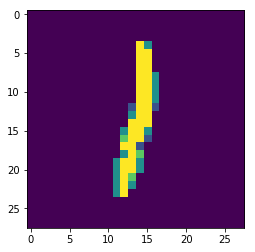

1


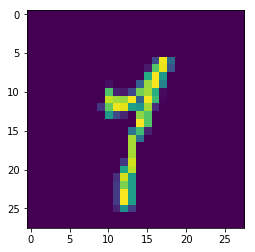

1


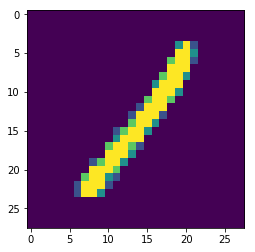

1


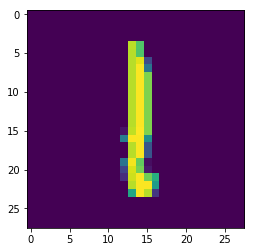

1


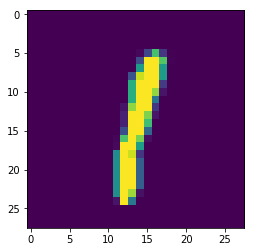

1


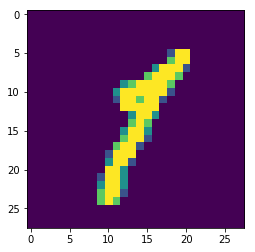

1


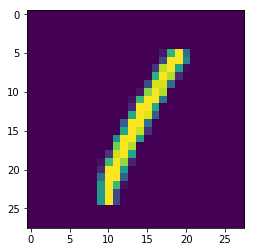

1


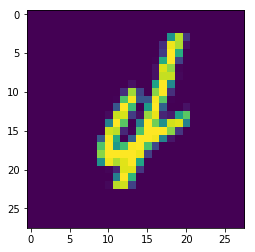

1


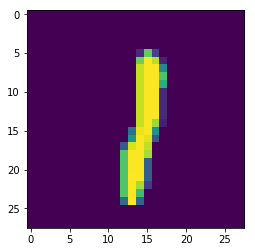

1


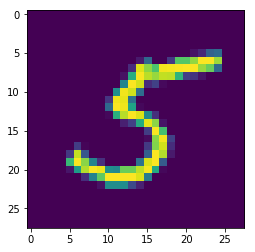

1


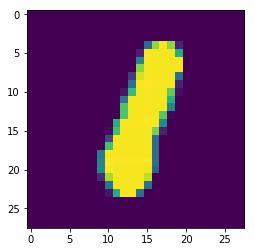

1


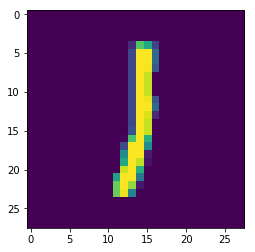

1


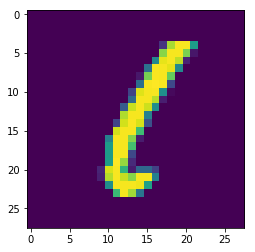

1


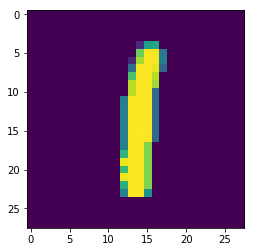

1


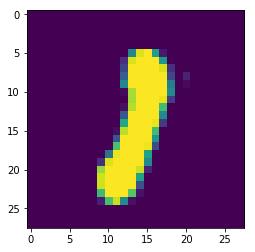

1


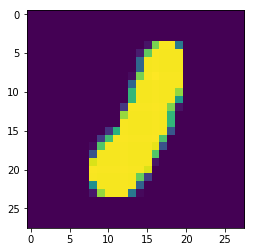

1


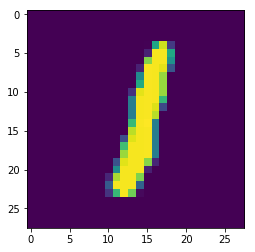

1


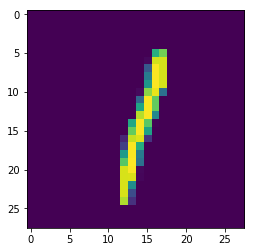

1


KeyboardInterrupt: 

In [141]:
for i in range(708):
    print(Ytrm[i])
    showImage(Xtrm[i])

In [34]:
trainM_dataset2 = []
testM_dataset2 = []

for i in range(Xtrm.shape[0]):
   trainM_dataset2.append([Xtrm[i], Ytrm[i]])
for i in range(Xtsm.shape[0]):
   testM_dataset2.append([Xtsm[i], Ytsm[i]])

trainM_loader2 = DataLoader(dataset=trainM_dataset2, batch_size=batch_size, shuffle=True)
testM_loader2 = DataLoader(dataset=testM_dataset2, batch_size=batch_size, shuffle=True)

In [35]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

model3 = ConvNet()

# Loss and optimizer
criterion3 = nn.CrossEntropyLoss()
optimizer3 = torch.optim.Adam(model3.parameters(), lr=learning_rate)

In [36]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

# Train the model
total_step3 = len(trainM_loader2)
loss_list3 = []
acc_list3 = []
Yacc3 = []
Yloss3 = []
for epoch in range(num_epochs):
    for i, (imgs, lbls) in enumerate(trainM_loader2):
        # Run the forward pass
        outputs = model3(imgs)
        #print(outputs.shape)
        loss = criterion3(outputs, lbls)
        loss_list3.append(loss.item())

        # Backprop and perform Adam optimisation
        optimizer3.zero_grad()
        loss.backward()
        optimizer3.step()

        # Track the accuracy
        total = lbls.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct = (predicted == lbls).sum().item()
        acc_list3.append(correct / total)

        if (i + 1) % int(printNow) == 0:
            Yacc3.append((correct / total) * 100)
            Yloss3.append(loss.item())
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'
                  .format(epoch + 1, num_epochs, i + 1, total_step, loss.item(),
                          (correct / total) * 100))

Epoch [1/2], Step [24/2400], Loss: 0.3612, Accuracy: 92.00%
Epoch [1/2], Step [48/2400], Loss: 0.8031, Accuracy: 80.00%
Epoch [1/2], Step [72/2400], Loss: 0.3501, Accuracy: 88.00%
Epoch [1/2], Step [96/2400], Loss: 0.2961, Accuracy: 88.00%
Epoch [1/2], Step [120/2400], Loss: 0.6100, Accuracy: 80.00%
Epoch [1/2], Step [144/2400], Loss: 0.1832, Accuracy: 96.00%
Epoch [1/2], Step [168/2400], Loss: 0.4347, Accuracy: 84.00%
Epoch [1/2], Step [192/2400], Loss: 0.0908, Accuracy: 96.00%
Epoch [1/2], Step [216/2400], Loss: 0.4628, Accuracy: 84.00%
Epoch [1/2], Step [240/2400], Loss: 0.0994, Accuracy: 100.00%
Epoch [1/2], Step [264/2400], Loss: 0.7056, Accuracy: 84.00%
Epoch [1/2], Step [288/2400], Loss: 0.8373, Accuracy: 84.00%
Epoch [1/2], Step [312/2400], Loss: 0.2179, Accuracy: 96.00%
Epoch [1/2], Step [336/2400], Loss: 0.6742, Accuracy: 68.00%
Epoch [1/2], Step [360/2400], Loss: 0.4599, Accuracy: 76.00%
Epoch [1/2], Step [384/2400], Loss: 0.3198, Accuracy: 92.00%
Epoch [1/2], Step [408/2400

In [37]:
# Copied from website then edited
# Wesite URL: https://adventuresinmachinelearning.com/convolutional-neural-networks-tutorial-in-pytorch/

# Test the model
model3.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for images, labels in testM_loader2:
        outputs = model3(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Test Accuracy of the model: {} %'.format((correct / total) * 100))


Test Accuracy of the model: 30.620000000000005 %


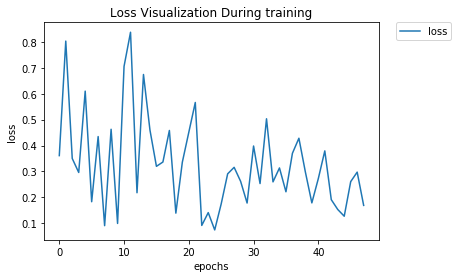

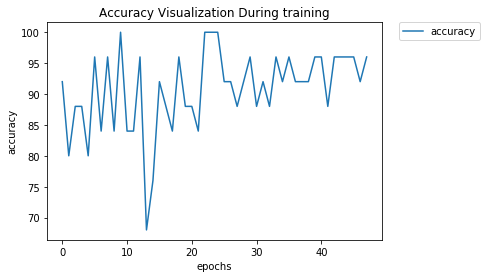

In [38]:

plt.plot(Yloss3, label="loss") 
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.) 
plt.xlabel('epochs')
plt.ylabel('loss') 
plt.title('Loss Visualization During training') 
plt.show() 


plt.plot(Yacc3, label="accuracy") 
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.) 
plt.xlabel('epochs') 
plt.ylabel('accuracy') 
plt.title('Accuracy Visualization During training') 

plt.show()

Expected Label: 1 Correct Label: 8


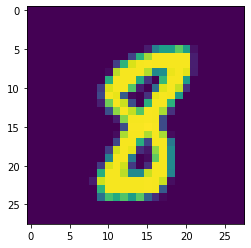

Expected Label: 7 Correct Label: 7


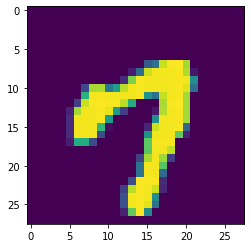

Expected Label: 1 Correct Label: 4


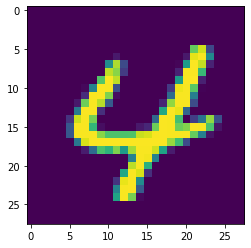

Expected Label: 1 Correct Label: 3


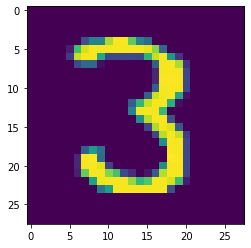

Expected Label: 1 Correct Label: 6


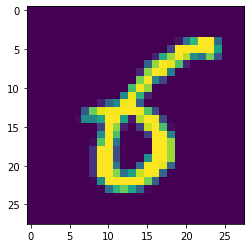

Expected Label: 1 Correct Label: 3


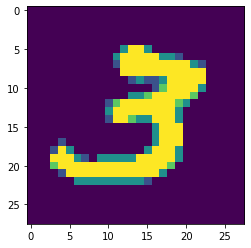

Expected Label: 7 Correct Label: 4


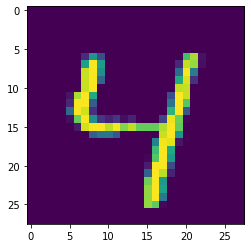

Expected Label: 1 Correct Label: 6


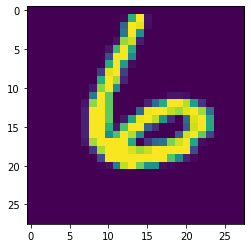

Expected Label: 1 Correct Label: 1


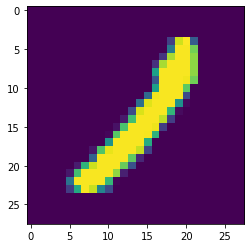

Expected Label: 4 Correct Label: 4


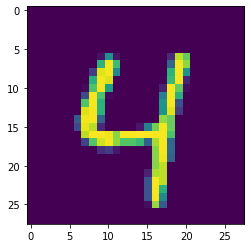

In [39]:
model3.eval()
images, labels = next(iter(testM_loader))
outputs = model3(images)
_, predicted = torch.max(outputs.data, 1)


for i in range(10):
    print(f'Expected Label: {predicted[i]} Correct Label: {labels[i]}')
    showImage(images[i])